## Краткое описание работы и вывод

### - Была решена задача предсказания количества циклов,  через которое машина сломается (RUL).
### - Решением задачи является модель CatBoost, способная на горизонте в 20 циклов предсказать поломку машины ( модель сохранена в файл)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [2]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [3]:
from IPython.display import HTML, display
pd.set_option('display.expand_frame_repr', False)
pd.options.display.max_columns = 100

## Загрузим данные

In [4]:
data = pd.read_csv('data (1) (1).zip')
data.head(5)
data

,id,cycle,p00,p01,p02,p03,p04,p05,p06,p07,p08,p09,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p20,s1,s2
0,1,1,518.67,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100,641.82,39.06,23.4190,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,-0.0007,-0.0004
1,1,2,518.67,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100,642.15,39.00,23.4236,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,0.0019,-0.0003
2,1,3,518.67,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100,642.35,38.95,23.3442,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,-0.0043,0.0003
3,1,4,518.67,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100,642.35,38.88,23.3739,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,0.0007,0.0000
4,1,5,518.67,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100,642.37,38.90,23.4044,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,-0.0019,-0.0002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16133,80,181,518.67,1.3,48.17,520.44,2388.17,8218.63,8.5194,0.03,397,2388,100,644.00,38.39,23.1678,1604.26,1428.92,14.62,21.61,552.24,2388.20,9145.62,0.0042,0.0002
16134,80,182,518.67,1.3,48.41,520.06,2388.12,8221.91,8.5493,0.03,396,2388,100,643.81,38.34,23.0142,1598.32,1426.31,14.62,21.61,551.60,2388.16,9160.23,-0.0014,0.0004
16135,80,183,518.67,1.3,48.04,519.67,2388.21,8217.46,8.5106,0.03,397,2388,100,643.49,38.34,22.9337,1603.37,1434.30,14.62,21.61,551.78,2388.12,9152.84,0.0018,0.0000
16136,80,184,518.67,1.3,48.04,519.72,2388.20,8228.65,8.4983,0.03,397,2388,100,643.83,38.53,22.9971,1603.01,1430.23,14.62,21.61,551.78,2388.17,9164.10,-0.0024,0.0002


Проверим данные на пропуски

In [5]:
data.isnull().any().any()

False

Как мы видим, пропусков нет.

Посмотрим, есть ли константные признаки

In [6]:
descr = data.describe().T
descr['const'] = descr['min'] - descr['max']
descr[descr['const'] == 0]
descr[descr['const'] == 0].index

Index(['p00', 'p01', 'p07', 'p09', 'p10', 'p16'], dtype='object')

Перед нами константные признаки (у которых минимальное значение равно максимальному). Удалим их

In [7]:
data = data.drop(columns=descr[descr['const'] == 0].index)

In [242]:
data

,id,cycle,p02,p03,p04,p05,p06,p08,p11,p12,p13,p14,p15,p17,p18,p19,p20,s1,s2,RUL
0,1,1,47.47,521.66,2388.02,8138.62,8.4195,392,641.82,39.06,23.4190,1589.70,1400.60,21.61,554.36,2388.06,9046.19,-0.0007,-0.0004,191
1,1,2,47.49,522.28,2388.07,8131.49,8.4318,392,642.15,39.00,23.4236,1591.82,1403.14,21.61,553.75,2388.04,9044.07,0.0019,-0.0003,190
2,1,3,47.27,522.42,2388.03,8133.23,8.4178,390,642.35,38.95,23.3442,1587.99,1404.20,21.61,554.26,2388.08,9052.94,-0.0043,0.0003,189
3,1,4,47.13,522.86,2388.08,8133.83,8.3682,392,642.35,38.88,23.3739,1582.79,1401.87,21.61,554.45,2388.11,9049.48,0.0007,0.0000,188
4,1,5,47.28,522.19,2388.04,8133.80,8.4294,393,642.37,38.90,23.4044,1582.85,1406.22,21.61,554.00,2388.06,9055.15,-0.0019,-0.0002,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16133,80,181,48.17,520.44,2388.17,8218.63,8.5194,397,644.00,38.39,23.1678,1604.26,1428.92,21.61,552.24,2388.20,9145.62,0.0042,0.0002,4
16134,80,182,48.41,520.06,2388.12,8221.91,8.5493,396,643.81,38.34,23.0142,1598.32,1426.31,21.61,551.60,2388.16,9160.23,-0.0014,0.0004,3
16135,80,183,48.04,519.67,2388.21,8217.46,8.5106,397,643.49,38.34,22.9337,1603.37,1434.30,21.61,551.78,2388.12,9152.84,0.0018,0.0000,2
16136,80,184,48.04,519.72,2388.20,8228.65,8.4983,397,643.83,38.53,22.9971,1603.01,1430.23,21.61,551.78,2388.17,9164.10,-0.0024,0.0002,1


## ВИЗУАЛЬНАЯ АНАЛИТИКА



Теперь посмотрим на то, сколько всего моторов и как долго они работают

In [9]:
print(f'уникальные айдишники моторов {data.id.unique()}')
print(f'количество моторов {data.id.unique().shape}')


уникальные айдишники моторов [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72
 73 74 75 76 77 78 79 80]
количество моторов (80,)


In [10]:

print(f'уникальные айдишники моторов {data.id.unique()}')
print(f'количество моторов {data.id.unique().shape}')
# grouped['cycle'].count().agg(pd.Series.mode).mean()

уникальные айдишники моторов [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72
 73 74 75 76 77 78 79 80]
количество моторов (80,)


 Отклонение: 41.35305691790749
 Максимальное отклонение от среднего: 160.275


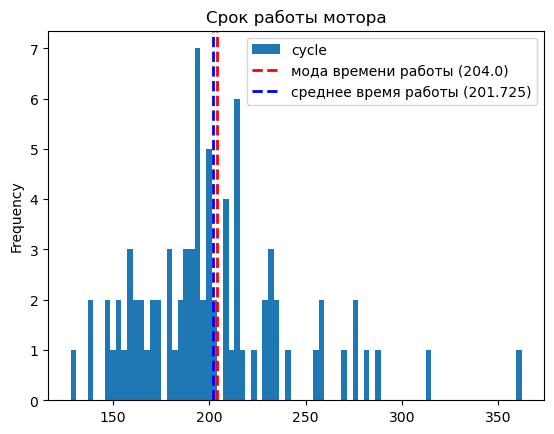

In [11]:
grouped = data.groupby('id')
std =  grouped['cycle'].count().std()
avar = grouped['cycle'].count().agg(pd.Series.mean)
mode = grouped['cycle'].count().agg(pd.Series.mode).mean()
mx = abs(grouped['cycle'].count() - avar).max()
pltv = grouped['cycle'].count().plot.hist(bins=80, title='Срок работы мотора', legend=True)
# plt.xlim(200)
pltv.axvline(x=mode, linestyle='dashed', color='r', linewidth=2, label=f'мода времени работы ({mode})')
pltv.axvline(x=avar, color='b', linestyle='dashed', linewidth=2, label=f'среднее время работы ({avar})')

pltv.legend()
print(f' Отклонение: {std}')
print(f' Максимальное отклонение от среднего: {mx}')


#### Определим целевую переменную RUL

Итак, целевая переменная будет такая: через сколько циклов сломается мотор?

То есть будет равна номер последнего цикла - текущий цикл

In [12]:
grouped = data.groupby('id')
data['RUL'] = grouped.transform('max')['cycle'] - data['cycle'] 


In [13]:
# conditions = {'cycle' : 'count'}
# conditions2 =  ['mean', 'max', 'min']
# conditions3 = ['mean']
# print(data.columns)
# for number, colum in enumerate(data.columns):
#     if number not in [1,2]:
#         conditions[colum] =conditions3
# print(conditions)

# df_grouped = data.groupby('id').agg(conditions).reset_index()
# df_grouped.describe()

Посмотрим, как выглядит график работы датчика номер 3 у первого мотора

In [14]:
engine1 = data[data['id']==1]

<AxesSubplot: >

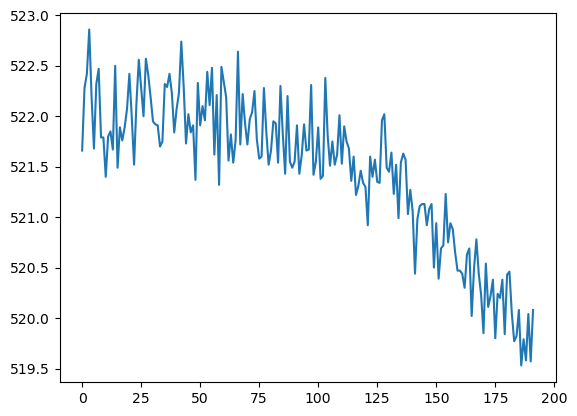

In [15]:
engine1['p03'].plot()

<AxesSubplot: >

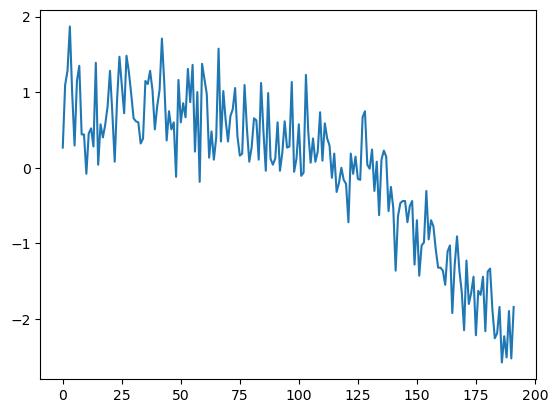

In [16]:
((engine1['p03'] -engine1['p03'].mean())/engine1['p03'].std()).plot()

<AxesSubplot: >

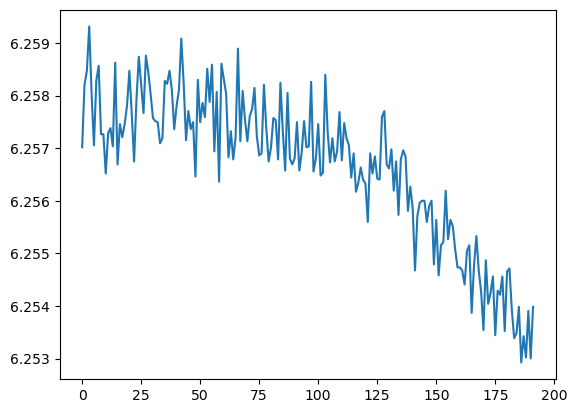

In [17]:
np.log(engine1['p03']).plot()

<AxesSubplot: >

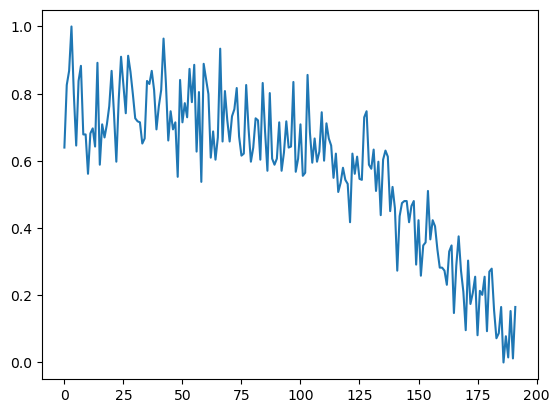

In [18]:
((-engine1['p03'].min() +engine1['p03'])/(engine1['p03'].max() - engine1['p03'].min())).plot()

Посмотрим, как в среднем выглядит работа Моторов на каждом цикле

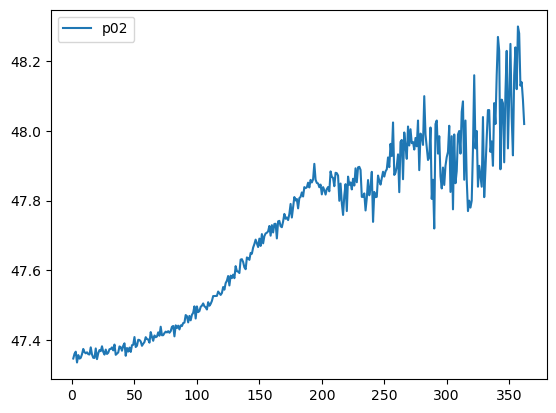

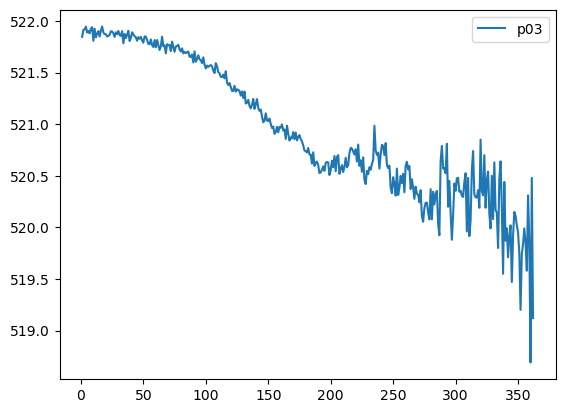

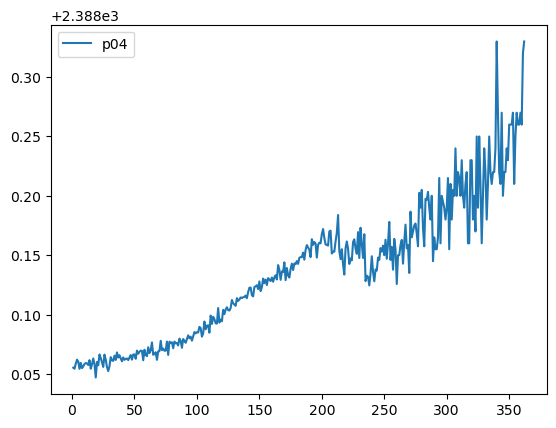

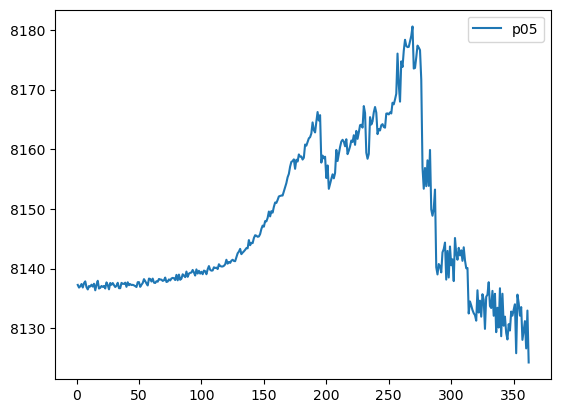

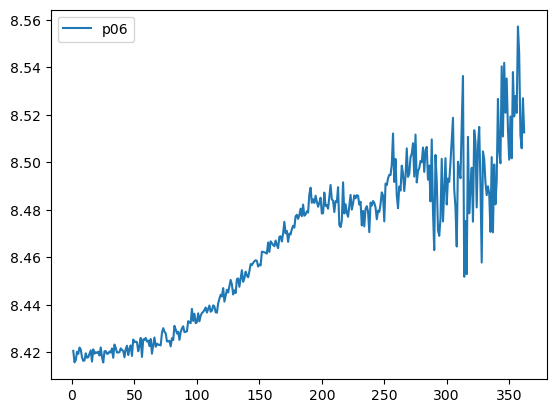

...

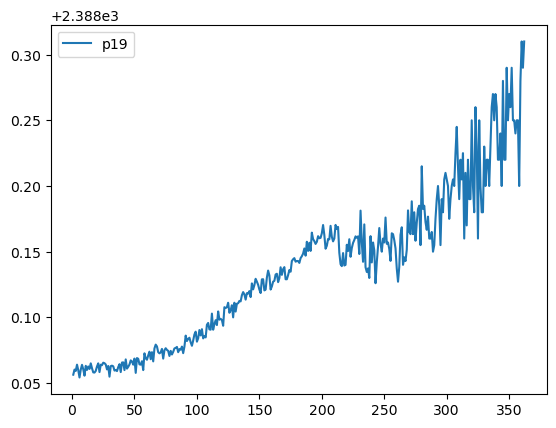

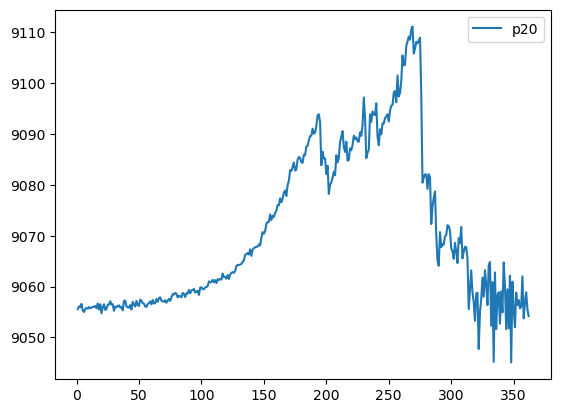

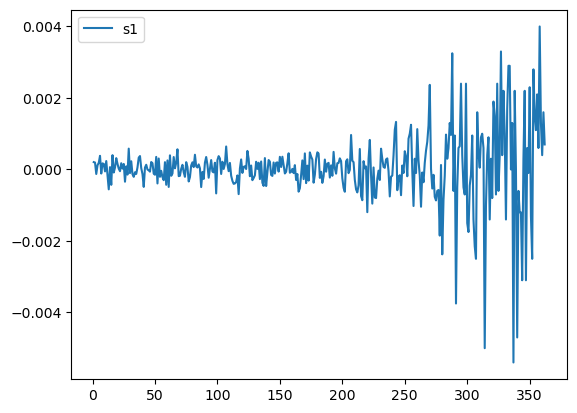

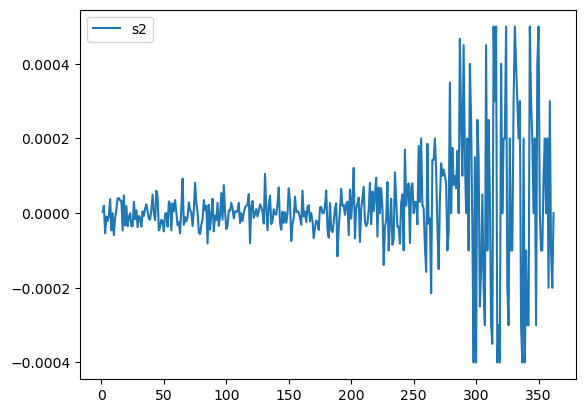

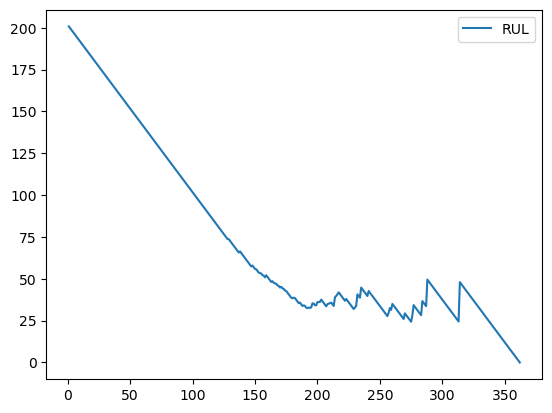

In [19]:

grouped_cycle = data.groupby('cycle')
for i in data.columns[2:]:
#     pt = grouped_cycle[i].mean().plot()
#     print(pt)
    plt.plot(grouped_cycle[i].mean(), label=i)
    plt.legend()
    plt.show()

Итак, что мы видим на графиках?

- для каждого графика отчетливо виден тренд 
- важно отметить, что увеличение дисперсии с номером цикла
    означает лишь то, что усреднение происходит по меньшему количеству моторов

In [20]:
#### Теперь посмотрим на работу самого надежного мотора, самого ненадежного мотора, среднего мотора

In [21]:
print(grouped['cycle'].count().max(), ' максимальное количество циклов')
print(grouped['cycle'].count().min(), ' минимальное количество циклов')
print(grouped['cycle'].count().agg(pd.Series.mode)[0], ' мода количества циклов')
# print(grouped['cycle'].count()[grouped['cycle'].count()==grouped['cycle'].count().min()])
# print(grouped['cycle'].count()[grouped['cycle'].count()==grouped['cycle'].count().max()])
# print(grouped['cycle'].count()[grouped['cycle'].count()==grouped['cycle'].count().agg(pd.Series.mode)[0]])

362  максимальное количество циклов
128  минимальное количество циклов
195  мода количества циклов


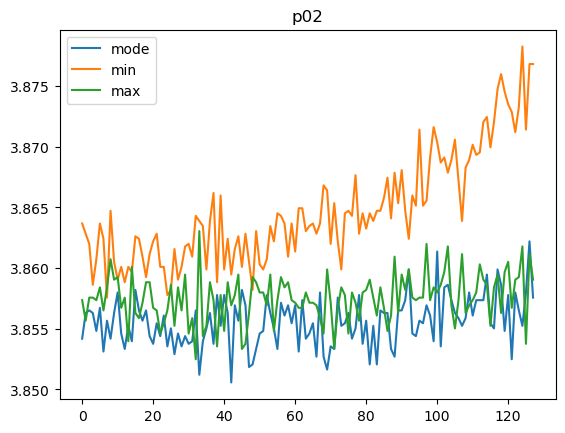

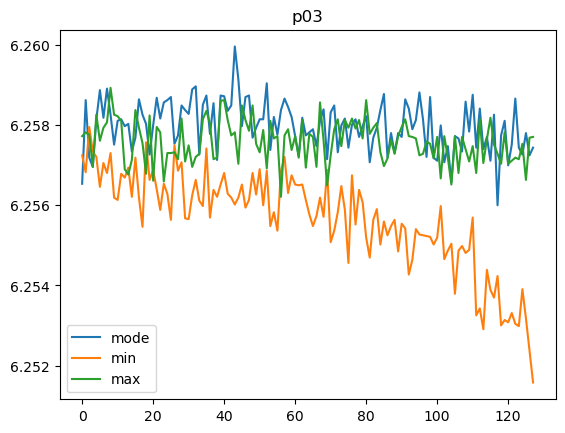

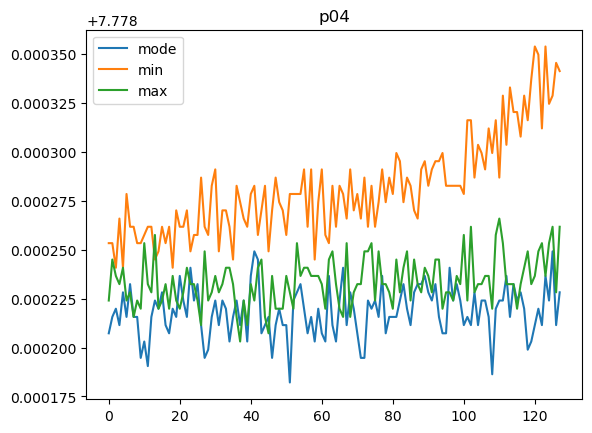

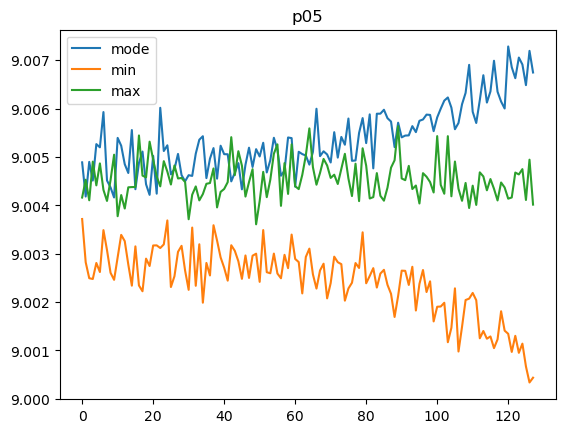

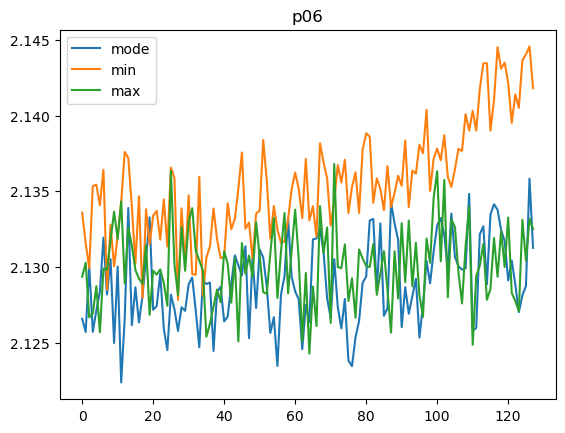

...

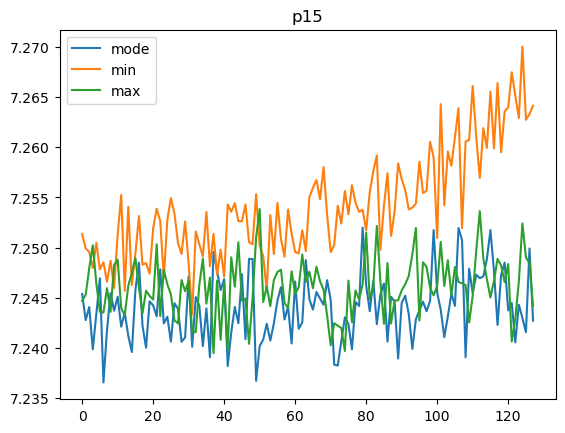

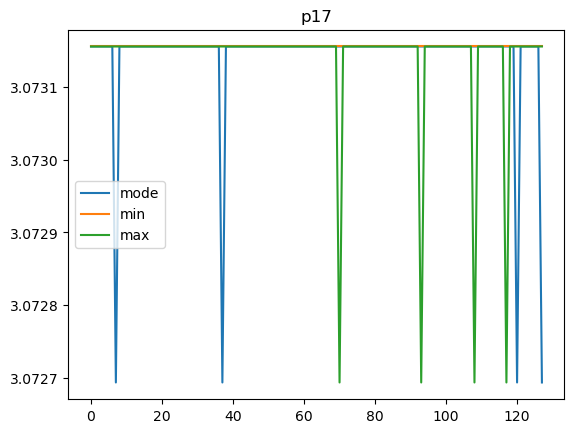

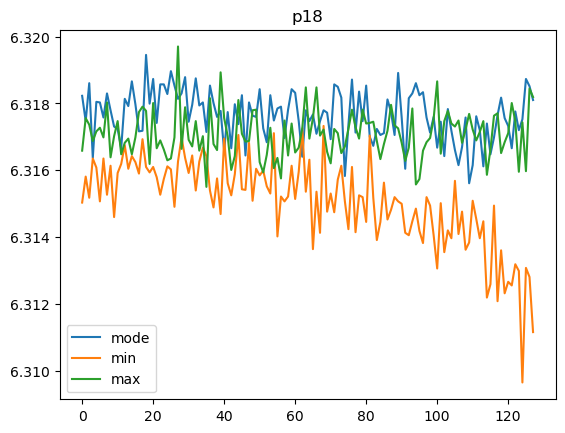

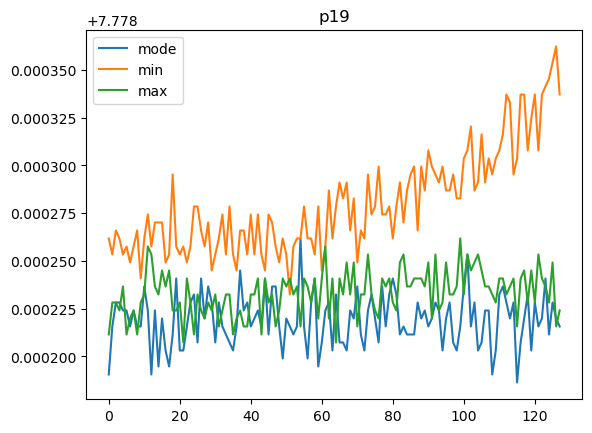

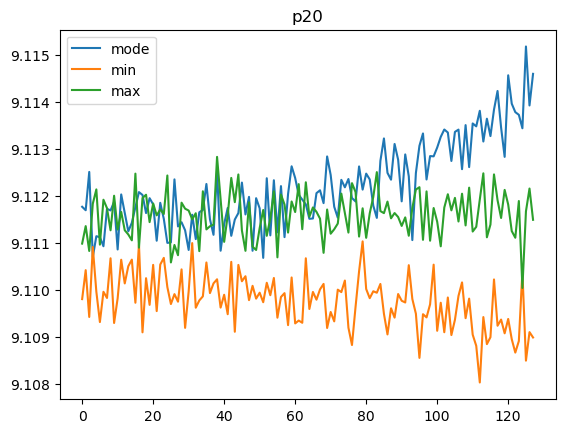

D:\py djang prog\anaconda\lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
D:\py djang prog\anaconda\lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


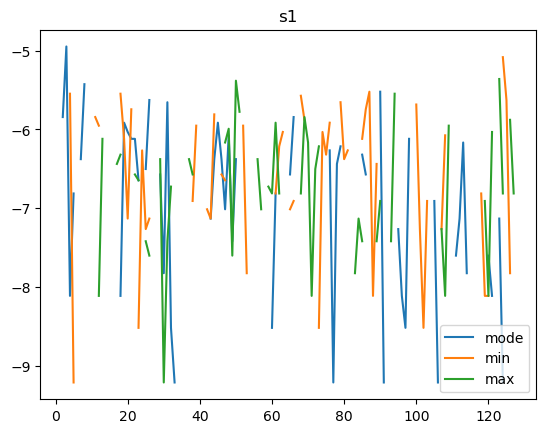

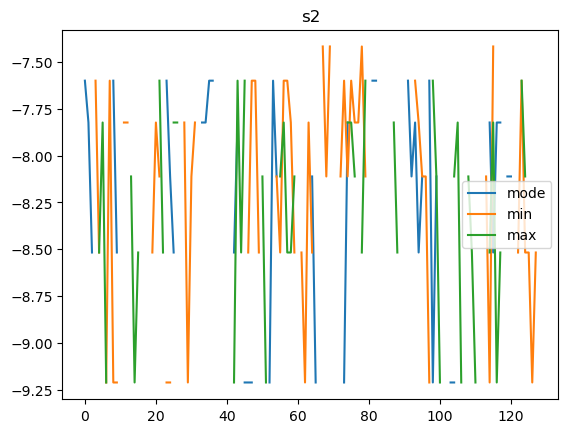

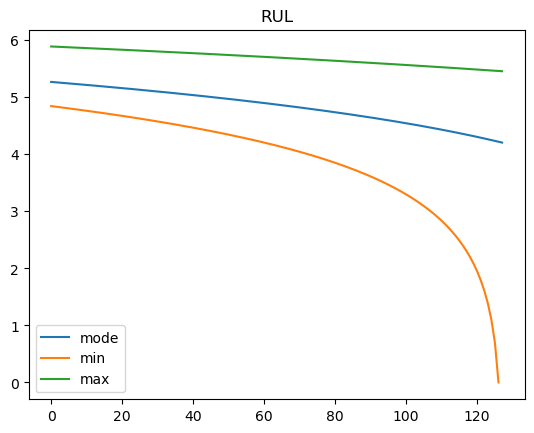

In [22]:
menshe_mody = grouped.filter(lambda x: len(x) < mode)
menshe_mody_grouped = menshe_mody.groupby('cycle')
pad_length = grouped['cycle'].count().min()
X = np.arange(pad_length)
for i in data.columns[2:]:
    for ii in range(1, 81):
        if ii in [39, 69, 18]:
            d = {i:j for i, j in zip([39, 69, 18], ['min', 'max', 'mode'])}
            sample = data[data['id'] == ii][i]
            sample_len = data[data['id'] == ii][i].shape[0]
#             padded_sample = np.pad(np.log(sample), (0, pad_length - sample_len), constant_values=0)
            plt.plot(X,np.log(sample[:pad_length]), label=d[ii])
#         if ii == 8:
#             break
#         print(data[data['id'] == ii][i])
#         break
#     plt.plot(menshe_mody_grouped[i].mean(), label=i)
    plt.legend()
    plt.title(i)
    plt.show()
# menshe_mody.groupby('')['cycle'].plot()

- На графиках можно увидеть явные различия в работе моторов - значения датчиков по этим моторам значительно различаются по всем циклам
- чем дальше цикл, тем сильней увеличивается различие

#### Попробуем найти какие-то зависимости между управляющим воздействием и показателями датчиков

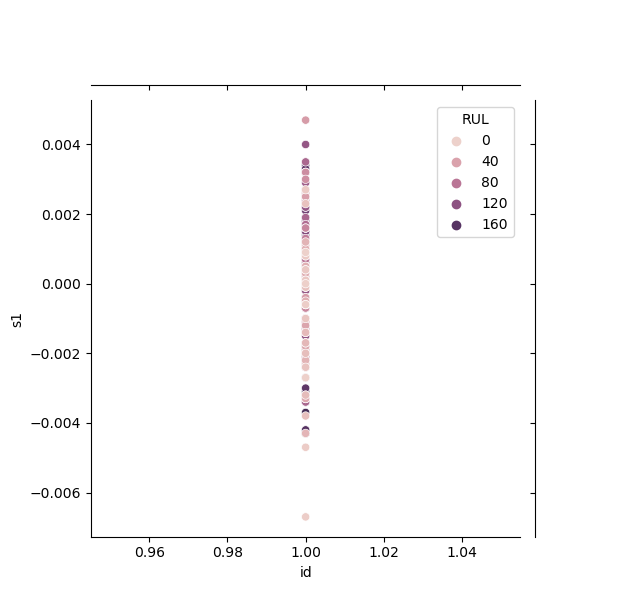

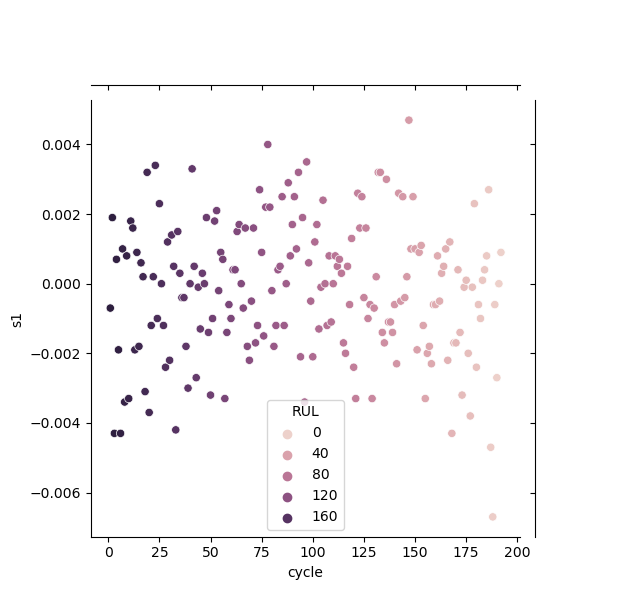

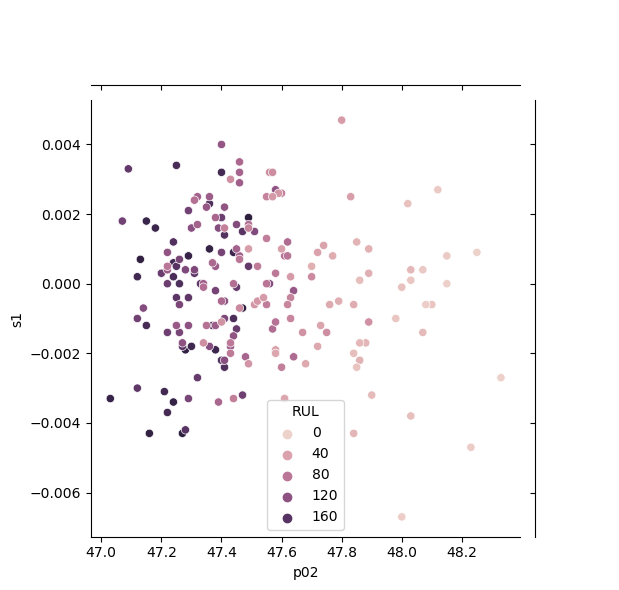

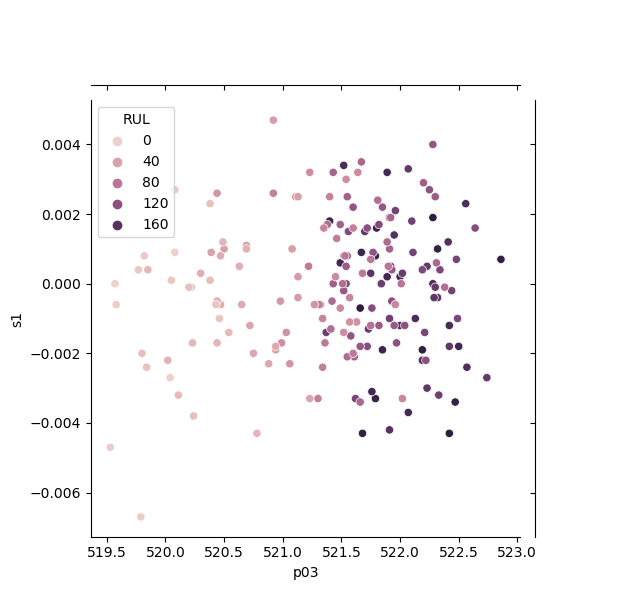

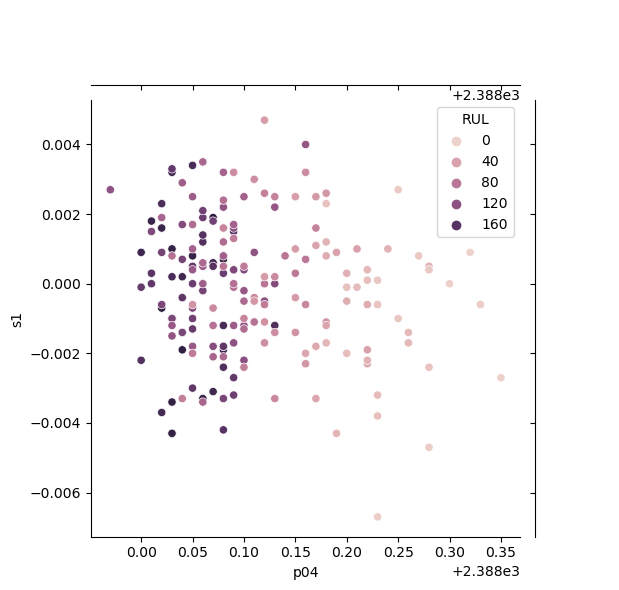

...

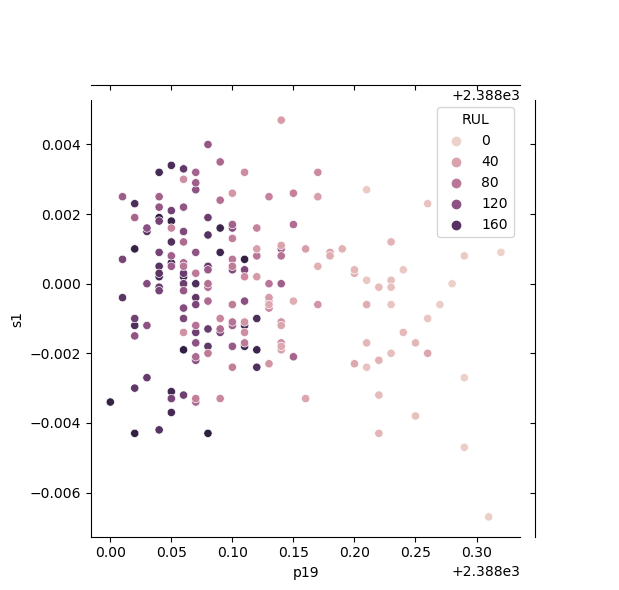

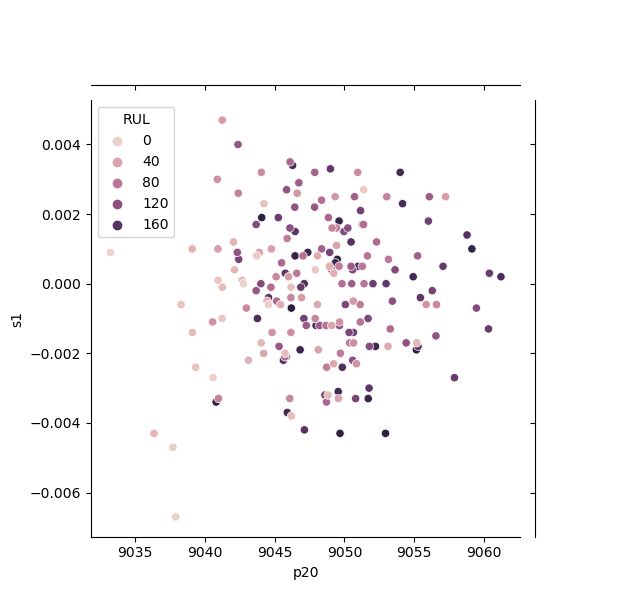

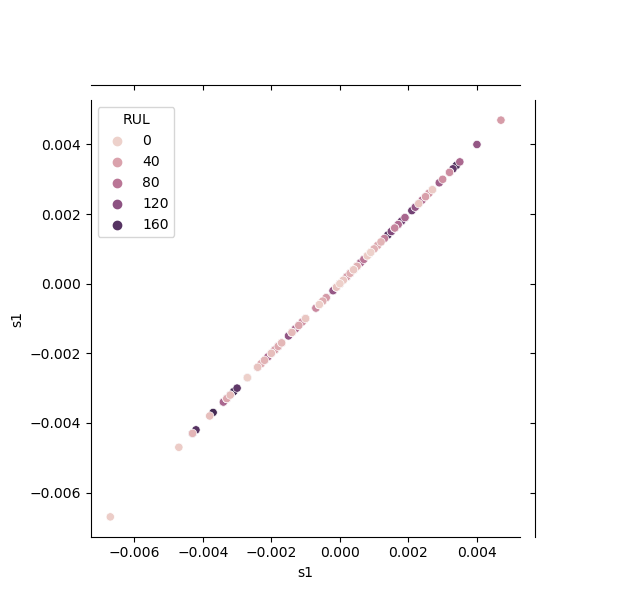

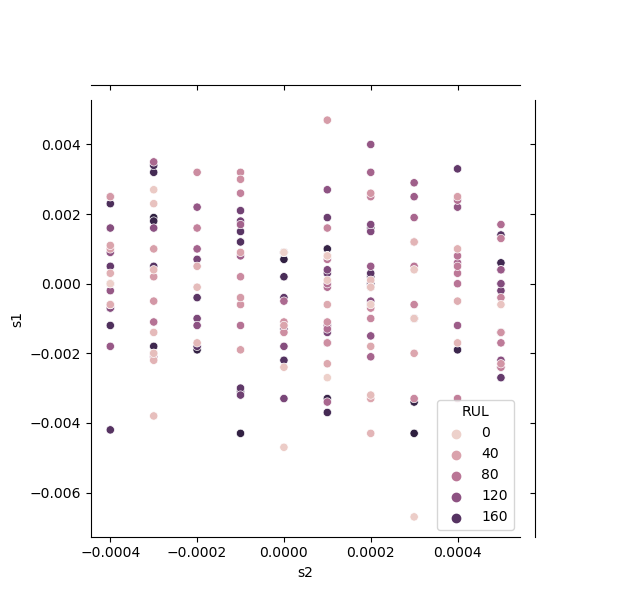

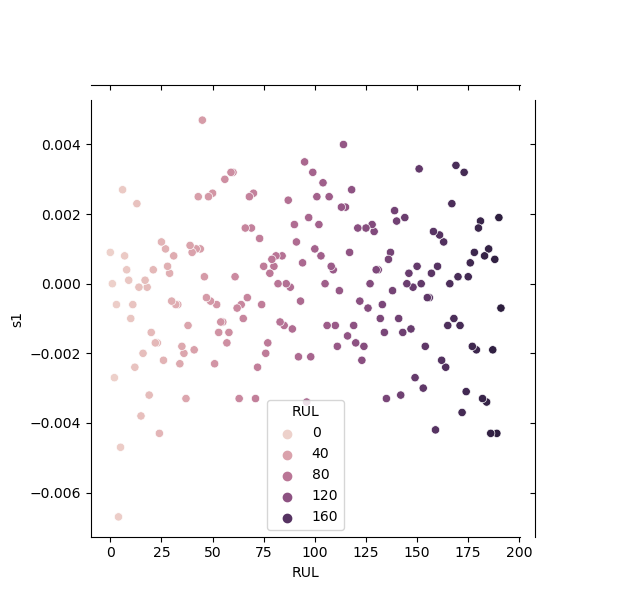

In [23]:
import seaborn as sns
for i in data.columns:
    sns.jointplot(data=data[data['id']==1], x=i, y='s1', hue='RUL')

- Четкую функциональная зависимость не замечена
- видно, что у s2, p17, p8 есть четкие целые значения

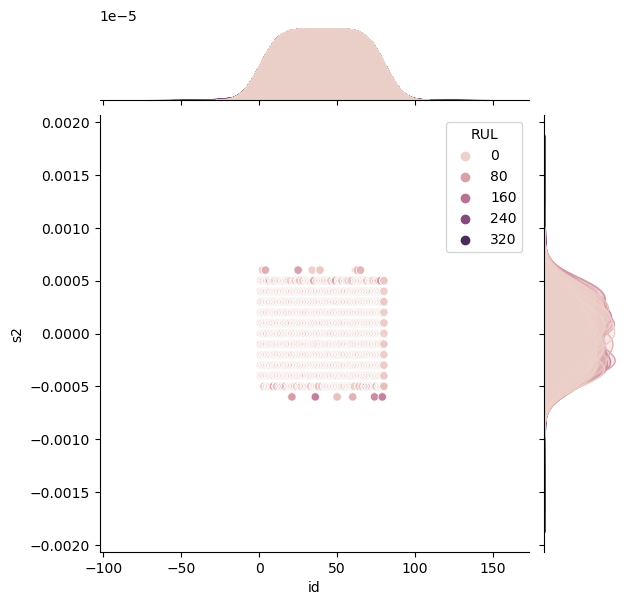

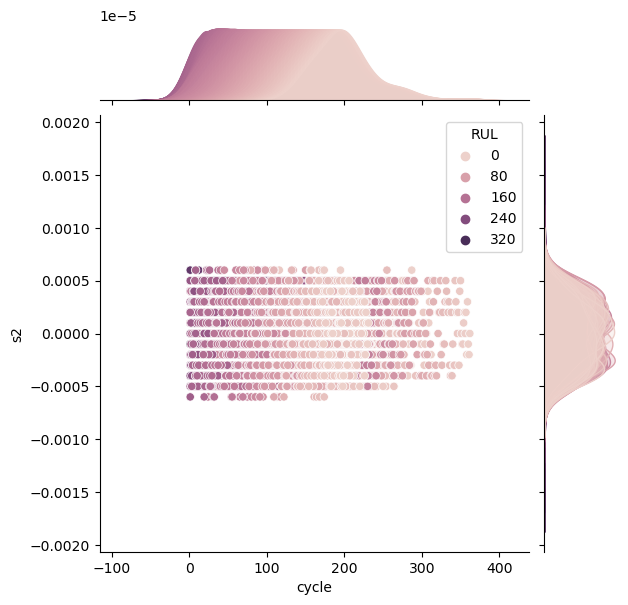

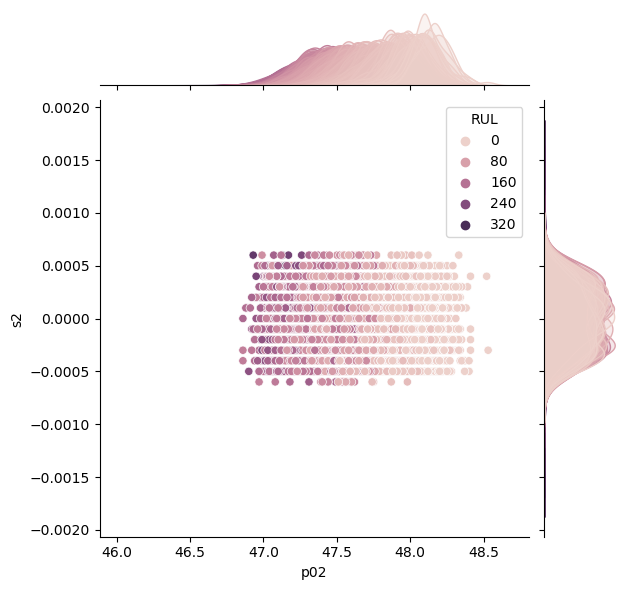

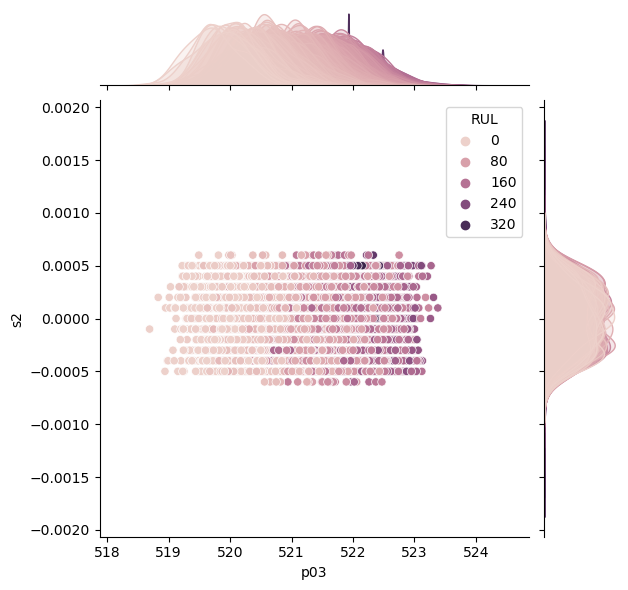

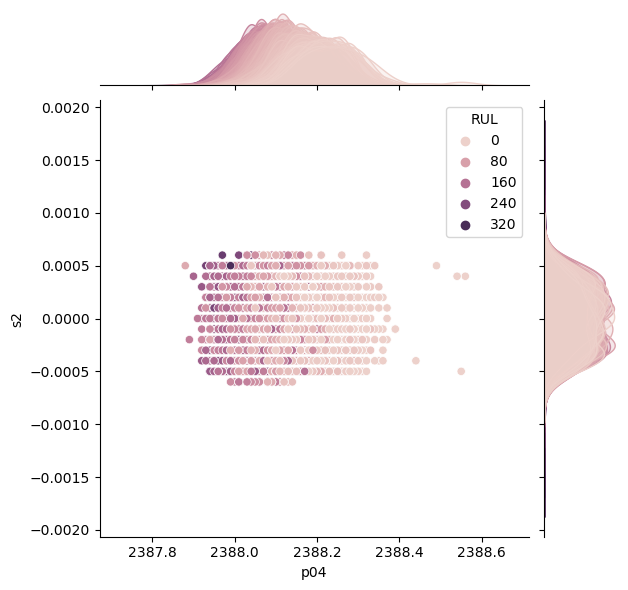

...

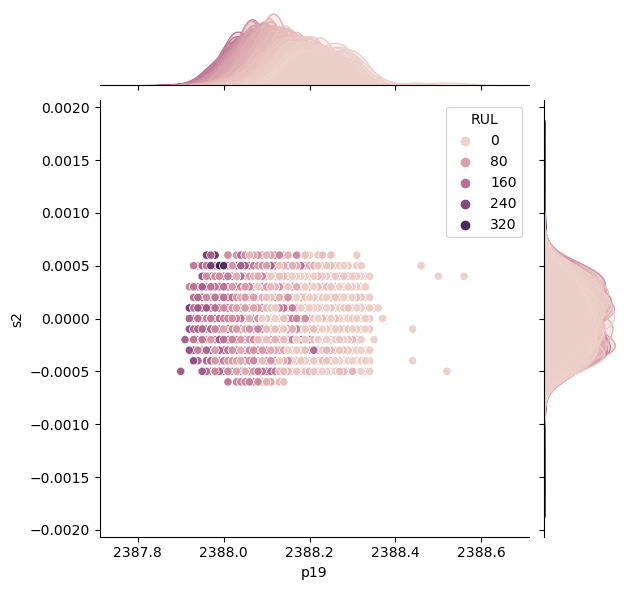

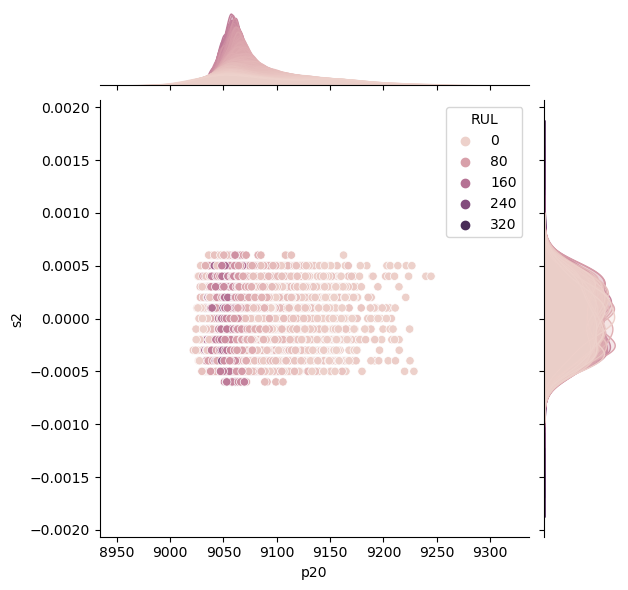

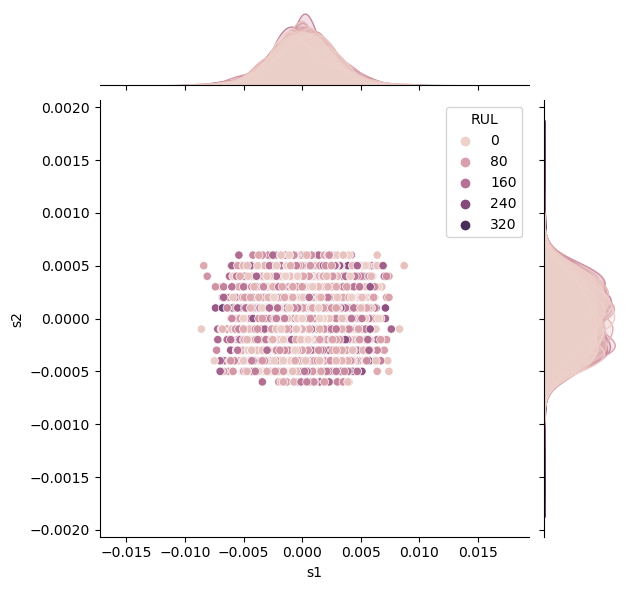

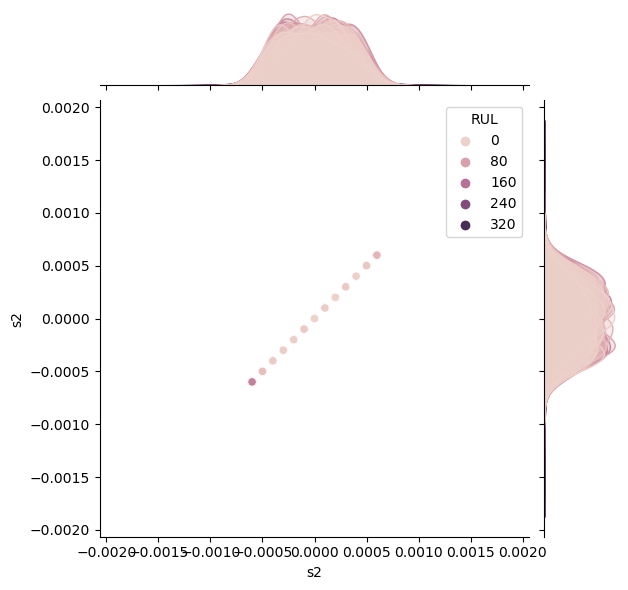

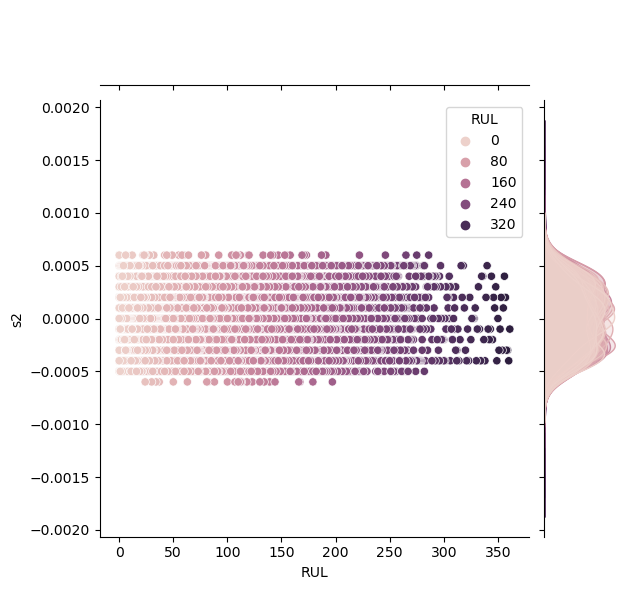

In [24]:
for i in data.columns:
    sns.jointplot(data=data, x=i, y='s2', hue='RUL')

Как мы видим
 - так как p08 и s2 - дискретные признаки, мы видим получившуюся решетку на графике
 - судя по всему, у p17 только 2 значения - то есть это вообще бинарный признак

## предобработаем признаки

Посмотрим еще раз на данные:

In [156]:
data.describe()

,id,cycle,p02,p03,p04,p05,p06,p08,p11,p12,p13,p14,p15,p17,p18,p19,p20,s1,s2,RUL
count,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,16138.000000,1.613800e+04,16138.000000
mean,40.707894,105.548147,47.544263,521.405420,2388.096737,8143.933458,8.442581,393.227104,642.686773,38.814276,23.288552,1590.582096,1409.033729,21.609795,553.359776,2388.097368,9065.461291,0.000010,6.196555e-08,104.548147
std,23.395354,65.915295,0.267422,0.738252,0.072604,19.731349,0.037520,1.549031,0.500711,0.181043,0.108606,6.129960,8.977073,0.001417,0.887947,0.071608,22.781362,0.002188,2.939096e-04,65.915295
min,1.000000,1.000000,46.860000,518.690000,2387.880000,8099.940000,8.324900,388.000000,641.210000,38.160000,22.907100,1571.040000,1382.250000,21.600000,549.850000,2387.900000,9021.730000,-0.008600,-6.000000e-04,0.000000
25%,20.000000,51.000000,47.350000,520.940000,2388.040000,8132.830000,8.415300,392.000000,642.330000,38.700000,23.220600,1586.330000,1402.500000,21.610000,552.800000,2388.050000,9052.820000,-0.001400,-3.000000e-04,50.000000
50%,42.000000,101.000000,47.520000,521.460000,2388.090000,8140.750000,8.439800,393.000000,642.650000,38.830000,23.296300,1590.190000,1408.220000,21.610000,553.430000,2388.090000,9060.750000,0.000000,0.000000e+00,100.000000
75%,61.000000,153.000000,47.710000,521.940000,2388.140000,8148.817500,8.466000,394.000000,643.010000,38.940000,23.365600,1594.450000,1414.650000,21.610000,554.000000,2388.140000,9069.940000,0.001500,3.000000e-04,152.000000
max,80.000000,362.000000,48.530000,523.380000,2388.560000,8293.720000,8.584800,399.000000,644.530000,39.430000,23.612700,1614.930000,1441.490000,21.610000,556.060000,2388.560000,9244.590000,0.008700,6.000000e-04,361.000000


Как мы видим, 
- данные имеют разный масштаб, поэтому давайте для начала отнормализцем наши данные, потому что , в итоге, нам важно именно отклонение показаний датчика от среднего
- у данных большие средние, но очень маленькие отклонения.

In [26]:
import sklearn
# ((data['p17']- data['p17'].mean())/data['p17'].std()).plot.hist(bins=100)
data['p17'].describe()
# data.columns[2:-1].shape
# sklearn.__version__

count    16138.000000
mean        21.609795
std          0.001417
min         21.600000
25%         21.610000
50%         21.610000
75%         21.610000
max         21.610000
Name: p17, dtype: float64

Все кроме цикла нормализуем, так как нам важна именно степень отклонения, а цикл минимаксимизируем, потому что тут нужен только порядок (и это принесло -0.1 к MAE)

In [201]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
col_names = data.columns[2:-1]
features = data[col_names]
data1 = data.copy()
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)
data1[col_names] = features

data1 = data1.drop('id', axis=1)
data1['cycle'] = ((-data1['cycle'].min() +data1['cycle'])/(data1['cycle'].max() - data1['cycle'].min()))
one_hot_labels = ['s2', 'p08', 'p17']
data1 = pd.get_dummies(data1, columns=one_hot_labels, sparse=False, prefix_sep='_') # преобразуем дискретные признаки


In [202]:
from sklearn.preprocessing import OneHotEncoder

что предлагаю проверить: 1. s2 разделить td idf-m
убрать ид-шник мотора и цикл, чтобы модель предсказывала только по данным с датчиков. Может, мпотом цикл обратно добавим

In [203]:
# data_preprocessed = pd.DataFrame(scaler.transform(data), columns=data.columns, index=data.index)
# data_preprocessed
data_preprocessed = data1

Разделим данные на тест и трейн

In [204]:
X = data_preprocessed.drop('RUL', axis=1)
y = data_preprocessed['RUL']

In [205]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
X_train

,cycle,p02,p03,p04,p05,p06,p11,p12,p13,p14,p15,p18,p19,p20,s1,s2_-2.041718244369517,s2_-1.7014670100644378,s2_-1.3612157757593586,s2_-1.0209645414542792,s2_-0.6807133071492,s2_-0.3404620728441207,s2_-0.0002108385390414423,s2_0.34004039576603784,s2_0.6802916300711171,s2_1.0205428643761962,s2_1.3607940986812757,s2_1.7010453329863549,s2_2.041296567291434,p08_-3.3745399304790133,p08_-2.728954898197937,p08_-2.0833698659168607,p08_-1.4377848336357844,p08_-0.7921998013547079,p08_-0.14661476907363158,p08_0.49897026320744475,p08_1.1445552954885212,p08_1.7901403277695975,p08_2.435725360050674,p08_3.08131039233175,p08_3.7268954246128265,p17_-6.910520024507943,p17_0.14470691010564538
14343,0.013850,-0.726453,0.737685,-0.092793,-0.850118,-1.177569,-1.092026,1.081128,-0.030862,1.074739,-0.353548,0.889973,-0.521854,-0.907844,1.229371,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
13243,0.343490,-0.015942,0.304215,-0.368269,-0.001696,-0.609848,0.006445,1.025890,-0.418515,-1.455535,-1.096575,0.101613,-0.242547,-0.130430,-0.461578,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
15430,0.168975,-0.502081,0.168756,-0.230531,-0.490780,-0.327321,-0.432943,-0.575990,-0.454426,-0.390242,-0.500594,0.000253,-0.661508,-0.819173,-1.238501,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1832,0.329640,-1.362172,0.642863,-1.332437,0.861425,-0.839069,-1.351665,0.418281,1.220495,-1.610517,-1.564448,1.171530,-1.080470,0.964797,-0.507280,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
10370,0.096953,-1.137800,0.913782,-0.781484,-0.301735,-0.428604,-0.732527,0.749704,0.772069,0.387927,-0.096218,0.349383,-0.242547,-0.527258,1.732086,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13418,0.828255,2.452145,-1.687036,1.973281,0.007934,1.549089,1.783972,-1.680735,-2.717733,1.892062,1.770818,-2.128318,1.712607,0.553483,-2.015424,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
5390,0.224377,-0.240314,0.371945,-0.230531,0.353081,-1.204222,-0.373027,-0.355041,0.621980,1.684876,0.724788,0.157925,-0.102893,-0.194520,0.772358,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
860,0.036011,-1.063010,1.062787,-0.919222,0.479787,-0.564537,-1.511443,1.412551,0.780356,-2.047727,-1.420744,1.306677,-1.778739,-0.113311,-0.004565,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
15795,0.113573,-1.586544,0.683501,-1.883390,-0.225205,-2.408963,-1.032110,1.909687,1.083297,0.002921,-0.855955,0.732301,-1.080470,-0.431563,-0.370176,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


Лучше сделать так, чтобы из каждого двигателя в трейне и тесте была информация, может с этим условием сдлеать кросс валидацию

## Обучаем модели

какие модели будем использовать?
- линейные
- деревья с бустингом и рандомным форестом
- нейронки - звуковые и снн на пиктограммах
- для предсказания временных рядов

Начнем с простой линейной модели

In [206]:
# def model(clf, x,y,X_test, y_test):
#     clf.fit(X_train, y_train)
#     importance = model.coef_
#     y_predict = clf.predict(X_test).round().astype(int)
#     mse = mean_squared_error(y_test, y_predict)
#     rmse = np.sqrt(mse)
#     mae = abs(y_test - y_predict).mean()
#     print('mae : ',mae)
#     print('rmse : ', rmse)
#     return mae, importance
# model(LinearRegression(), X_train, y_train, X_test, y_test)

In [207]:
model = LinearRegression()
model.fit(X_train, y_train)

importance = model.coef_

In [208]:
y_predict = model.predict(X_test).round().astype(int)
y_predict

array([ 78, 125,  98, ...,  39, 102, 169])

In [236]:
mse = mean_squared_error(y_test, y_predict)
rmse = np.sqrt(mse)
mae = abs(y_test - y_predict).mean()
print('mae : ',mae)
print('rmse : ', rmse)

mae :  27.056139692076606
rmse :  35.847737311743415


то есть , в среднем, по каждому семплу, мы ошиблись на 27 дней

(array([  1.,  11.,   5.,   8.,  19.,  19.,  36.,  49.,  25.,  39.,  39.,
         63.,  84.,  68., 108., 133., 105., 158., 116., 185., 194., 122.,
        200., 227., 152., 225., 216., 145., 216., 135., 190., 179., 124.,
        162., 134., 101., 146.,  63.,  91., 101.,  67.,  81.,  72.,  42.,
         71.,  37.,  54.,  48.,  37.,  35.,  32.,  25.,  30.,  30.,  21.,
         24.,  13.,  22.,  22.,   8.,  13.,   9.,   8.,  10.,   7.,   9.,
          8.,   4.,   9.,   2.,   5.,   8.,   4.,   7.,   3.,   2.,   7.,
          5.,   4.,   4.,   3.,   1.,   3.,   1.,   3.,   1.,   1.,   1.,
          2.,   0.,   2.,   1.,   2.,   2.,   0.,   3.,   3.,   2.,   0.,
          2.]),
 array([-7.9000e+01, -7.6370e+01, -7.3740e+01, -7.1110e+01, -6.8480e+01,
        -6.5850e+01, -6.3220e+01, -6.0590e+01, -5.7960e+01, -5.5330e+01,
        -5.2700e+01, -5.0070e+01, -4.7440e+01, -4.4810e+01, -4.2180e+01,
        -3.9550e+01, -3.6920e+01, -3.4290e+01, -3.1660e+01, -2.9030e+01,
        -2.6400e+01, -2.37

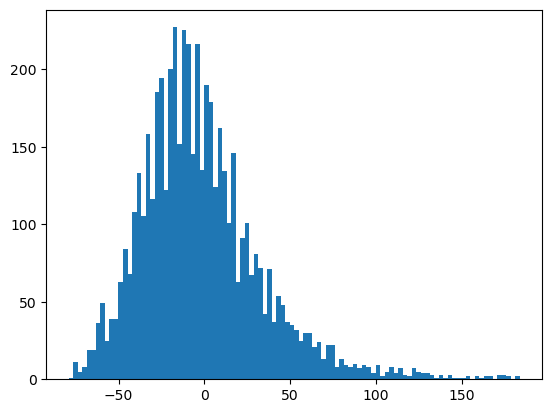

In [210]:
plt.hist(y_test - y_predict, bins=100)

In [211]:
display(pd.DataFrame(importance, index=X_train.columns, columns=['importance']))
display(pd.DataFrame({'real':y_test, 'predicted':y_predict}))

,importance
cycle,-1.650128e+02
p02,-5.636063e+00
p03,4.128117e+00
p04,-1.694707e+00
p05,-1.444361e+00
p06,-1.951925e+00
p11,-2.862857e+00
p12,1.802844e+00
p13,2.809507e+00
p14,-8.621302e-01


,real,predicted
7272,43,78
2254,121,125
13543,87,98
7173,142,163
7861,180,171
...,...,...
11199,55,23
6119,101,119
16122,15,39
16053,84,102


Мы видим намеки на переобучение модели. так, p17 имеет вес -517, что слишком много. Надо бы привести признаки к ондому размеру, например, логарифмировать их

Что же, попробуем ещё что-нибудь

In [212]:
from sklearn import linear_model
clf = linear_model.Lasso(alpha=0.1)
clf.fit(X_train, y_train)

print(clf.coef_)

print(clf.intercept_)

[-1.60436113e+02 -5.98763499e+00  4.33493753e+00 -1.47924165e+00
 -1.11887200e+00 -2.04505725e+00 -2.86815126e+00  1.97779896e+00
  2.90948399e+00 -8.52452041e-01 -3.07824321e+00  3.18064002e+00
 -1.88347080e+00 -4.83661445e+00 -0.00000000e+00 -0.00000000e+00
 -3.74586579e+00  0.00000000e+00 -0.00000000e+00  5.70551273e-01
  0.00000000e+00 -8.91452557e-03  0.00000000e+00 -1.06843147e+00
  0.00000000e+00 -0.00000000e+00  4.28138006e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.24758706e+00
  0.00000000e+00 -2.11505573e+00 -5.39625337e+00 -5.15447917e+00
 -4.62919874e-01  2.62222529e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -0.00000000e+00]
153.54483590225038


In [213]:
clf_predict = clf.predict(X_test).round().astype(int)
clf_predict
mse = mean_squared_error(y_test, clf_predict)
rmse = np.sqrt(mse)
maelasso = abs(y_test - clf_predict).mean()
print('mae : ',maelasso)
print('rmse : ', rmse)

mae :  27.009763424708975
rmse :  35.81315995322842


In [214]:
display(pd.DataFrame(clf.coef_, index=X_train.columns, columns=['importance']))
display(pd.DataFrame({'real':y_test, 'predicted':clf_predict}))

,importance
cycle,-160.436113
p02,-5.987635
p03,4.334938
p04,-1.479242
p05,-1.118872
p06,-2.045057
p11,-2.868151
p12,1.977799
p13,2.909484
p14,-0.852452


,real,predicted
7272,43,80
2254,121,125
13543,87,98
7173,142,162
7861,180,170
...,...,...
11199,55,25
6119,101,121
16122,15,23
16053,84,103


Ну что же, видим, что лассо занулило s1, s2, p19, p17, p06, p04.(это было когда мы вообще не применяли нормализацию данных, теперь, с нормализацией, занулили только s1) - Итак, эти признаки у нас первые на выбывание, если мы вдруг захотим убрать лишние признаки, но при этом надо учесть, что мы хотели one-hot-encoding закодировать s2.

In [232]:
df = pd.DataFrame(clf.coef_, index=X_train.columns, columns=['importance'])
df[df['importance']==0].index.to_list()

['s1',
 's2_-2.041718244369517',
 's2_-1.3612157757593586',
 's2_-1.0209645414542792',
 's2_-0.3404620728441207',
 's2_0.34004039576603784',
 's2_1.0205428643761962',
 's2_1.3607940986812757',
 's2_2.041296567291434',
 'p08_-3.3745399304790133',
 'p08_-2.728954898197937',
 'p08_-2.0833698659168607',
 'p08_-0.7921998013547079',
 'p08_3.08131039233175',
 'p08_3.7268954246128265',
 'p17_-6.910520024507943',
 'p17_0.14470691010564538']

In [249]:
X_train_cleared = X_train.drop(labels=df[df['importance']==0].index.to_list(), axis=1)
X_test_cleared = X_test.drop(labels=df[df['importance']==0].index.to_list(), axis=1)
y_test
# X_train_cleared = X_train
# X_test_cleared = X_test

7272      43
2254     121
13543     87
7173     142
7861     180
        ... 
11199     55
6119     101
16122     15
16053     84
14371    179
Name: RUL, Length: 5326, dtype: int64

In [250]:
model = LinearRegression()
model.fit(X_train_cleared, y_train)

importance = model.coef_
y_predict = model.predict(X_test_cleared).round().astype(int)
y_predict.shape

(5326,)

In [254]:
mse = mean_squared_error(y_test, y_predict)
rmse = np.sqrt(mse)
mae_cl = abs(y_test - y_predict).mean()
print('mae : ',maelasso)
print('rmse : ', rmse)
print('Как видим, мы уменьшили ошибку на', (maelasso - mae_cl)/maelasso * 100, ' %')

mae :  27.009763424708975
rmse :  35.847737311743415
Как видим, мы уменьшили ошибку на -0.17170186439028529  %


И при этом уменьшили количество признаков!)

In [255]:
def mae(y, y_hat, mae_prev=False):
    mae = abs(y - y_hat).mean()
    g = 'уменьшили'
    print('mae :', mae)
    if mae_prev:
        if mae_prev < mae:
            g = 'увеличbли'
        print(f'Как видим, мы {g} ошибку на', abs((mae_prev - mae)/mae_prev * 100), ' %')
    return mae


### Деревья

Для начала воспользуемся рандомным лесом

In [261]:
from sklearn.ensemble import RandomForestRegressor
clf = RandomForestRegressor(max_depth=25 ,n_estimators=3000, random_state=0)
clf.fit(X_train_cleared, y_train)
predicted_forest = clf.predict(X_test_cleared)
print(predicted_forest)

[ 64.57514372 133.45072897  77.90182015 ...  16.78266667  77.31721417
 182.50147358]


In [262]:
mae_random_forest = mae(y_test, predicted_forest, mae_cl)

mae : 22.025040658313404
Как видим, мы уменьшили ошибку на 18.595036435432654  %


In [263]:
print(mae_cl)

27.056139692076606


In [264]:
# display(pd.DataFrame(clf.coef_, index=X_train.columns, columns=['importance']))
display(pd.DataFrame({'real':y_test, 'predicted':predicted_forest}))

,real,predicted
7272,43,64.575144
2254,121,133.450729
13543,87,77.901820
7173,142,176.311507
7861,180,179.030110
...,...,...
11199,55,44.823333
6119,101,125.335556
16122,15,16.782667
16053,84,77.317214


Пропробуем CatBoost

In [265]:
# from future import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import display
from catboost import Pool, CatBoostRegressor, cv

In [258]:
# initialize Pool
train_pool = Pool(X_train_cleared, 
                  y_train)
test_pool = Pool(np.array(X_test_cleared)) 
X_train_cleared

D:\py djang prog\anaconda\lib\site-packages\catboost\core.py:1222: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


,cycle,p02,p03,p04,p05,p06,p11,p12,p13,p14,p15,p18,p19,p20,s2_-1.7014670100644378,s2_-0.6807133071492,s2_-0.0002108385390414423,s2_0.6802916300711171,s2_1.7010453329863549,p08_-1.4377848336357844,p08_-0.14661476907363158,p08_0.49897026320744475,p08_1.1445552954885212,p08_1.7901403277695975,p08_2.435725360050674
14343,0.013850,-0.726453,0.737685,-0.092793,-0.850118,-1.177569,-1.092026,1.081128,-0.030862,1.074739,-0.353548,0.889973,-0.521854,-0.907844,1,0,0,0,0,0,1,0,0,0,0
13243,0.343490,-0.015942,0.304215,-0.368269,-0.001696,-0.609848,0.006445,1.025890,-0.418515,-1.455535,-1.096575,0.101613,-0.242547,-0.130430,0,0,1,0,0,0,0,0,0,0,0
15430,0.168975,-0.502081,0.168756,-0.230531,-0.490780,-0.327321,-0.432943,-0.575990,-0.454426,-0.390242,-0.500594,0.000253,-0.661508,-0.819173,0,0,0,0,0,0,0,1,0,0,0
1832,0.329640,-1.362172,0.642863,-1.332437,0.861425,-0.839069,-1.351665,0.418281,1.220495,-1.610517,-1.564448,1.171530,-1.080470,0.964797,0,0,0,0,0,0,0,1,0,0,0
10370,0.096953,-1.137800,0.913782,-0.781484,-0.301735,-0.428604,-0.732527,0.749704,0.772069,0.387927,-0.096218,0.349383,-0.242547,-0.527258,0,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13418,0.828255,2.452145,-1.687036,1.973281,0.007934,1.549089,1.783972,-1.680735,-2.717733,1.892062,1.770818,-2.128318,1.712607,0.553483,0,0,0,0,0,0,0,0,1,0,0
5390,0.224377,-0.240314,0.371945,-0.230531,0.353081,-1.204222,-0.373027,-0.355041,0.621980,1.684876,0.724788,0.157925,-0.102893,-0.194520,0,0,1,0,0,0,0,0,0,0,0
860,0.036011,-1.063010,1.062787,-0.919222,0.479787,-0.564537,-1.511443,1.412551,0.780356,-2.047727,-1.420744,1.306677,-1.778739,-0.113311,0,0,0,0,0,0,1,0,0,0,0
15795,0.113573,-1.586544,0.683501,-1.883390,-0.225205,-2.408963,-1.032110,1.909687,1.083297,0.002921,-0.855955,0.732301,-1.080470,-0.431563,0,0,0,1,0,1,0,0,0,0,0


Далее добавим поиск по сетке CV grid. 
Мб еще добавить кроссвалидацию

In [266]:
cv_dataset = Pool(data=X,
                  label=y)
grid = {'learning_rate': [0.03, 0.2, 0.1],
        'depth': [2, 3, 7],
        'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations' : [500, 900]
            }
    
model = CatBoostRegressor(loss_function='MAE')
grid_search_result = model.grid_search(grid, 
                                       X=X, 
                                       y=y, 
                                       plot=True)

D:\py djang prog\anaconda\lib\site-packages\catboost\core.py:1222: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 101.7604878	test: 100.8149433	best: 100.8149433 (0)	total: 25.6ms	remaining: 12.8s
1:	learn: 98.8875713	test: 97.9434455	best: 97.9434455 (1)	total: 29.2ms	remaining: 7.27s
2:	learn: 96.1763271	test: 95.2090269	best: 95.2090269 (2)	total: 32.4ms	remaining: 5.37s
3:	learn: 93.4496921	test: 92.5112716	best: 92.5112716 (3)	total: 35.8ms	remaining: 4.43s
4:	learn: 90.8006785	test: 89.9077567	best: 89.9077567 (4)	total: 38.9ms	remaining: 3.85s
5:	learn: 88.2400071	test: 87.3809425	best: 87.3809425 (5)	total: 42.1ms	remaining: 3.46s
6:	learn: 85.8514886	test: 85.0205819	best: 85.0205819 (6)	total: 45.1ms	remaining: 3.18s
7:	learn: 83.4601428	test: 82.6791340	best: 82.6791340 (7)	total: 48.2ms	remaining: 2.96s
8:	learn: 81.1762206	test: 80.4106074	best: 80.4106074 (8)	total: 53.3ms	remaining: 2.91s
9:	learn: 78.9976784	test: 78.2482870	best: 78.2482870 (9)	total: 59.2ms	remaining: 2.9s
10:	learn: 76.8697026	test: 76.1146902	best: 76.1146902 (10)	total: 65.3ms	remaining: 2.9s
11:	lea

158:	learn: 22.7460249	test: 22.0811231	best: 22.0811231 (158)	total: 434ms	remaining: 932ms
159:	learn: 22.7392763	test: 22.0709469	best: 22.0709469 (159)	total: 437ms	remaining: 928ms
160:	learn: 22.7311315	test: 22.0633083	best: 22.0633083 (160)	total: 439ms	remaining: 925ms
161:	learn: 22.7238558	test: 22.0586376	best: 22.0586376 (161)	total: 441ms	remaining: 921ms
162:	learn: 22.7154502	test: 22.0478942	best: 22.0478942 (162)	total: 443ms	remaining: 917ms
163:	learn: 22.7095367	test: 22.0416983	best: 22.0416983 (163)	total: 446ms	remaining: 913ms
164:	learn: 22.7012321	test: 22.0346647	best: 22.0346647 (164)	total: 448ms	remaining: 909ms
165:	learn: 22.6929624	test: 22.0278334	best: 22.0278334 (165)	total: 450ms	remaining: 905ms
166:	learn: 22.6855419	test: 22.0216707	best: 22.0216707 (166)	total: 452ms	remaining: 901ms
167:	learn: 22.6824682	test: 22.0180726	best: 22.0180726 (167)	total: 455ms	remaining: 899ms
168:	learn: 22.6773975	test: 22.0124007	best: 22.0124007 (168)	total: 

314:	learn: 22.2670960	test: 21.6319120	best: 21.6319120 (314)	total: 856ms	remaining: 503ms
315:	learn: 22.2664400	test: 21.6311735	best: 21.6311735 (315)	total: 859ms	remaining: 500ms
316:	learn: 22.2639294	test: 21.6308739	best: 21.6308739 (316)	total: 862ms	remaining: 498ms
317:	learn: 22.2633369	test: 21.6302463	best: 21.6302463 (317)	total: 865ms	remaining: 495ms
318:	learn: 22.2625329	test: 21.6299127	best: 21.6299127 (318)	total: 868ms	remaining: 492ms
319:	learn: 22.2608253	test: 21.6287538	best: 21.6287538 (319)	total: 871ms	remaining: 490ms
320:	learn: 22.2595316	test: 21.6276645	best: 21.6276645 (320)	total: 873ms	remaining: 487ms
321:	learn: 22.2591457	test: 21.6273424	best: 21.6273424 (321)	total: 875ms	remaining: 484ms
322:	learn: 22.2587969	test: 21.6270848	best: 21.6270848 (322)	total: 877ms	remaining: 481ms
323:	learn: 22.2581403	test: 21.6268264	best: 21.6268264 (323)	total: 879ms	remaining: 478ms
324:	learn: 22.2571114	test: 21.6260525	best: 21.6260525 (324)	total: 

412:	learn: 22.1166655	test: 21.5177502	best: 21.5177502 (412)	total: 1.06s	remaining: 223ms
413:	learn: 22.1162755	test: 21.5175902	best: 21.5175902 (413)	total: 1.06s	remaining: 220ms
414:	learn: 22.1138188	test: 21.5142525	best: 21.5142525 (414)	total: 1.06s	remaining: 217ms
415:	learn: 22.1133412	test: 21.5140336	best: 21.5140336 (415)	total: 1.06s	remaining: 215ms
416:	learn: 22.1125781	test: 21.5133537	best: 21.5133537 (416)	total: 1.07s	remaining: 212ms
417:	learn: 22.1102746	test: 21.5106990	best: 21.5106990 (417)	total: 1.07s	remaining: 210ms
418:	learn: 22.1093665	test: 21.5102660	best: 21.5102660 (418)	total: 1.07s	remaining: 208ms
419:	learn: 22.1090336	test: 21.5100735	best: 21.5100735 (419)	total: 1.08s	remaining: 205ms
420:	learn: 22.1081987	test: 21.5095909	best: 21.5095909 (420)	total: 1.08s	remaining: 203ms
421:	learn: 22.1068565	test: 21.5084609	best: 21.5084609 (421)	total: 1.08s	remaining: 200ms
422:	learn: 22.1063827	test: 21.5078762	best: 21.5078762 (422)	total: 

64:	learn: 22.8503709	test: 22.2323311	best: 22.2323311 (64)	total: 188ms	remaining: 1.25s
65:	learn: 22.8430232	test: 22.2294723	best: 22.2294723 (65)	total: 190ms	remaining: 1.25s
66:	learn: 22.8291742	test: 22.2211932	best: 22.2211932 (66)	total: 193ms	remaining: 1.24s
67:	learn: 22.8109358	test: 22.2000226	best: 22.2000226 (67)	total: 195ms	remaining: 1.24s
68:	learn: 22.7876010	test: 22.1738149	best: 22.1738149 (68)	total: 197ms	remaining: 1.23s
69:	learn: 22.7664065	test: 22.1586733	best: 22.1586733 (69)	total: 200ms	remaining: 1.23s
70:	learn: 22.7326822	test: 22.1307525	best: 22.1307525 (70)	total: 202ms	remaining: 1.22s
71:	learn: 22.7290516	test: 22.1269737	best: 22.1269737 (71)	total: 204ms	remaining: 1.22s
72:	learn: 22.7148436	test: 22.1138106	best: 22.1138106 (72)	total: 207ms	remaining: 1.21s
73:	learn: 22.7050154	test: 22.1091427	best: 22.1091427 (73)	total: 210ms	remaining: 1.21s
74:	learn: 22.6712642	test: 22.0862712	best: 22.0862712 (74)	total: 212ms	remaining: 1.2s


238:	learn: 21.4715739	test: 21.1908282	best: 21.1908282 (238)	total: 597ms	remaining: 652ms
239:	learn: 21.4637565	test: 21.1835514	best: 21.1835514 (239)	total: 599ms	remaining: 649ms
240:	learn: 21.4623878	test: 21.1824048	best: 21.1824048 (240)	total: 603ms	remaining: 648ms
241:	learn: 21.4575518	test: 21.1852020	best: 21.1824048 (240)	total: 605ms	remaining: 645ms
242:	learn: 21.4523086	test: 21.1913893	best: 21.1824048 (240)	total: 607ms	remaining: 642ms
243:	learn: 21.4490550	test: 21.1925120	best: 21.1824048 (240)	total: 610ms	remaining: 640ms
244:	learn: 21.4468985	test: 21.1932337	best: 21.1824048 (240)	total: 612ms	remaining: 637ms
245:	learn: 21.4421431	test: 21.1900629	best: 21.1824048 (240)	total: 615ms	remaining: 635ms
246:	learn: 21.4398218	test: 21.1913958	best: 21.1824048 (240)	total: 617ms	remaining: 632ms
247:	learn: 21.4370882	test: 21.1880436	best: 21.1824048 (240)	total: 619ms	remaining: 629ms
248:	learn: 21.4324546	test: 21.1914727	best: 21.1824048 (240)	total: 

334:	learn: 21.1575139	test: 21.0495599	best: 21.0495599 (334)	total: 806ms	remaining: 397ms
335:	learn: 21.1555802	test: 21.0506358	best: 21.0495599 (334)	total: 808ms	remaining: 394ms
336:	learn: 21.1509268	test: 21.0543012	best: 21.0495599 (334)	total: 810ms	remaining: 392ms
337:	learn: 21.1505225	test: 21.0543150	best: 21.0495599 (334)	total: 813ms	remaining: 389ms
338:	learn: 21.1474599	test: 21.0550279	best: 21.0495599 (334)	total: 815ms	remaining: 387ms
339:	learn: 21.1469734	test: 21.0546255	best: 21.0495599 (334)	total: 817ms	remaining: 384ms
340:	learn: 21.1458521	test: 21.0543934	best: 21.0495599 (334)	total: 819ms	remaining: 382ms
341:	learn: 21.1451771	test: 21.0536882	best: 21.0495599 (334)	total: 821ms	remaining: 379ms
342:	learn: 21.1446438	test: 21.0532418	best: 21.0495599 (334)	total: 824ms	remaining: 377ms
343:	learn: 21.1398230	test: 21.0480619	best: 21.0480619 (343)	total: 827ms	remaining: 375ms
344:	learn: 21.1392274	test: 21.0468460	best: 21.0468460 (344)	total: 

432:	learn: 21.0013174	test: 21.0219488	best: 21.0127671 (411)	total: 1.01s	remaining: 157ms
433:	learn: 20.9998273	test: 21.0223637	best: 21.0127671 (411)	total: 1.02s	remaining: 155ms
434:	learn: 20.9955743	test: 21.0216406	best: 21.0127671 (411)	total: 1.02s	remaining: 152ms
435:	learn: 20.9950659	test: 21.0206567	best: 21.0127671 (411)	total: 1.02s	remaining: 150ms
436:	learn: 20.9931368	test: 21.0217537	best: 21.0127671 (411)	total: 1.02s	remaining: 148ms
437:	learn: 20.9909747	test: 21.0191773	best: 21.0127671 (411)	total: 1.02s	remaining: 145ms
438:	learn: 20.9874789	test: 21.0173855	best: 21.0127671 (411)	total: 1.03s	remaining: 143ms
439:	learn: 20.9863640	test: 21.0185831	best: 21.0127671 (411)	total: 1.03s	remaining: 140ms
440:	learn: 20.9852380	test: 21.0195632	best: 21.0127671 (411)	total: 1.03s	remaining: 138ms
441:	learn: 20.9834900	test: 21.0223145	best: 21.0127671 (411)	total: 1.04s	remaining: 136ms
442:	learn: 20.9719161	test: 21.0232191	best: 21.0127671 (411)	total: 

53:	learn: 22.8517199	test: 22.1961111	best: 22.1961111 (53)	total: 229ms	remaining: 1.89s
54:	learn: 22.8428529	test: 22.1873454	best: 22.1873454 (54)	total: 232ms	remaining: 1.88s
55:	learn: 22.8243796	test: 22.1681420	best: 22.1681420 (55)	total: 234ms	remaining: 1.86s
56:	learn: 22.8132283	test: 22.1603178	best: 22.1603178 (56)	total: 236ms	remaining: 1.84s
57:	learn: 22.7998380	test: 22.1483362	best: 22.1483362 (57)	total: 238ms	remaining: 1.82s
58:	learn: 22.7886324	test: 22.1362882	best: 22.1362882 (58)	total: 240ms	remaining: 1.8s
59:	learn: 22.7792432	test: 22.1323581	best: 22.1323581 (59)	total: 242ms	remaining: 1.78s
60:	learn: 22.7657277	test: 22.1185982	best: 22.1185982 (60)	total: 244ms	remaining: 1.76s
61:	learn: 22.7606440	test: 22.1140769	best: 22.1140769 (61)	total: 246ms	remaining: 1.74s
62:	learn: 22.7527621	test: 22.1074956	best: 22.1074956 (62)	total: 248ms	remaining: 1.72s
63:	learn: 22.7258241	test: 22.0814994	best: 22.0814994 (63)	total: 250ms	remaining: 1.71s


159:	learn: 22.1799311	test: 21.6384003	best: 21.6384003 (159)	total: 438ms	remaining: 931ms
160:	learn: 22.1787312	test: 21.6376433	best: 21.6376433 (160)	total: 441ms	remaining: 928ms
161:	learn: 22.1735127	test: 21.6289667	best: 21.6289667 (161)	total: 443ms	remaining: 924ms
162:	learn: 22.1719197	test: 21.6279042	best: 21.6279042 (162)	total: 445ms	remaining: 920ms
163:	learn: 22.1668053	test: 21.6251788	best: 21.6251788 (163)	total: 447ms	remaining: 916ms
164:	learn: 22.1638200	test: 21.6228887	best: 21.6228887 (164)	total: 449ms	remaining: 912ms
165:	learn: 22.1610185	test: 21.6210249	best: 21.6210249 (165)	total: 451ms	remaining: 908ms
166:	learn: 22.1564508	test: 21.6168778	best: 21.6168778 (166)	total: 453ms	remaining: 904ms
167:	learn: 22.1554060	test: 21.6163713	best: 21.6163713 (167)	total: 456ms	remaining: 901ms
168:	learn: 22.1539088	test: 21.6156617	best: 21.6156617 (168)	total: 458ms	remaining: 898ms
169:	learn: 22.1518113	test: 21.6137051	best: 21.6137051 (169)	total: 

253:	learn: 21.8470987	test: 21.4086252	best: 21.4086252 (253)	total: 646ms	remaining: 626ms
254:	learn: 21.8436915	test: 21.4069801	best: 21.4069801 (254)	total: 649ms	remaining: 623ms
255:	learn: 21.8416171	test: 21.4054198	best: 21.4054198 (255)	total: 651ms	remaining: 621ms
256:	learn: 21.8393912	test: 21.4054178	best: 21.4054178 (256)	total: 653ms	remaining: 618ms
257:	learn: 21.8385692	test: 21.4052506	best: 21.4052506 (257)	total: 655ms	remaining: 615ms
258:	learn: 21.8364114	test: 21.4023388	best: 21.4023388 (258)	total: 657ms	remaining: 612ms
259:	learn: 21.8349974	test: 21.4016970	best: 21.4016970 (259)	total: 660ms	remaining: 609ms
260:	learn: 21.8320947	test: 21.3988253	best: 21.3988253 (260)	total: 662ms	remaining: 606ms
261:	learn: 21.8304871	test: 21.3971751	best: 21.3971751 (261)	total: 664ms	remaining: 603ms
262:	learn: 21.8216914	test: 21.3929668	best: 21.3929668 (262)	total: 666ms	remaining: 600ms
263:	learn: 21.8190628	test: 21.3902095	best: 21.3902095 (263)	total: 

347:	learn: 21.6227981	test: 21.2489758	best: 21.2489758 (347)	total: 843ms	remaining: 368ms
348:	learn: 21.6225285	test: 21.2487791	best: 21.2487791 (348)	total: 846ms	remaining: 366ms
349:	learn: 21.6218250	test: 21.2488762	best: 21.2487791 (348)	total: 848ms	remaining: 363ms
350:	learn: 21.6164320	test: 21.2474663	best: 21.2474663 (350)	total: 850ms	remaining: 361ms
351:	learn: 21.6151243	test: 21.2462361	best: 21.2462361 (351)	total: 852ms	remaining: 358ms
352:	learn: 21.6112658	test: 21.2480742	best: 21.2462361 (351)	total: 854ms	remaining: 356ms
353:	learn: 21.6098065	test: 21.2475544	best: 21.2462361 (351)	total: 858ms	remaining: 354ms
354:	learn: 21.6069700	test: 21.2481502	best: 21.2462361 (351)	total: 863ms	remaining: 352ms
355:	learn: 21.6061370	test: 21.2484074	best: 21.2462361 (351)	total: 866ms	remaining: 350ms
356:	learn: 21.6039870	test: 21.2467016	best: 21.2462361 (351)	total: 870ms	remaining: 349ms
357:	learn: 21.6004121	test: 21.2476421	best: 21.2462361 (351)	total: 

436:	learn: 21.4447445	test: 21.1671675	best: 21.1671675 (436)	total: 1.05s	remaining: 151ms
437:	learn: 21.4445519	test: 21.1670244	best: 21.1670244 (437)	total: 1.05s	remaining: 149ms
438:	learn: 21.4442124	test: 21.1665085	best: 21.1665085 (438)	total: 1.05s	remaining: 146ms
439:	learn: 21.4425393	test: 21.1656526	best: 21.1656526 (439)	total: 1.05s	remaining: 144ms
440:	learn: 21.4419315	test: 21.1652964	best: 21.1652964 (440)	total: 1.05s	remaining: 141ms
441:	learn: 21.4404103	test: 21.1632264	best: 21.1632264 (441)	total: 1.06s	remaining: 139ms
442:	learn: 21.4372199	test: 21.1602438	best: 21.1602438 (442)	total: 1.06s	remaining: 136ms
443:	learn: 21.4366948	test: 21.1606552	best: 21.1602438 (442)	total: 1.06s	remaining: 134ms
444:	learn: 21.4338695	test: 21.1582399	best: 21.1582399 (444)	total: 1.06s	remaining: 132ms
445:	learn: 21.4327278	test: 21.1584617	best: 21.1582399 (444)	total: 1.07s	remaining: 129ms
446:	learn: 21.4321451	test: 21.1588578	best: 21.1582399 (444)	total: 

107:	learn: 23.6915214	test: 23.0932831	best: 23.0932831 (107)	total: 263ms	remaining: 956ms
108:	learn: 23.6421443	test: 23.0377247	best: 23.0377247 (108)	total: 266ms	remaining: 954ms
109:	learn: 23.6063031	test: 22.9974277	best: 22.9974277 (109)	total: 269ms	remaining: 952ms
110:	learn: 23.5731745	test: 22.9613458	best: 22.9613458 (110)	total: 271ms	remaining: 950ms
111:	learn: 23.5363408	test: 22.9239507	best: 22.9239507 (111)	total: 273ms	remaining: 947ms
112:	learn: 23.5020089	test: 22.8882576	best: 22.8882576 (112)	total: 276ms	remaining: 944ms
113:	learn: 23.4764195	test: 22.8629808	best: 22.8629808 (113)	total: 278ms	remaining: 941ms
114:	learn: 23.4500832	test: 22.8338896	best: 22.8338896 (114)	total: 280ms	remaining: 937ms
115:	learn: 23.4189465	test: 22.8033651	best: 22.8033651 (115)	total: 282ms	remaining: 934ms
116:	learn: 23.3872115	test: 22.7712456	best: 22.7712456 (116)	total: 284ms	remaining: 931ms
117:	learn: 23.3664475	test: 22.7475438	best: 22.7475438 (117)	total: 

209:	learn: 22.4880385	test: 21.8277620	best: 21.8277620 (209)	total: 478ms	remaining: 661ms
210:	learn: 22.4839379	test: 21.8247247	best: 21.8247247 (210)	total: 481ms	remaining: 659ms
211:	learn: 22.4801317	test: 21.8213208	best: 21.8213208 (211)	total: 484ms	remaining: 657ms
212:	learn: 22.4766095	test: 21.8177921	best: 21.8177921 (212)	total: 486ms	remaining: 655ms
213:	learn: 22.4746835	test: 21.8163574	best: 21.8163574 (213)	total: 490ms	remaining: 655ms
214:	learn: 22.4730212	test: 21.8151071	best: 21.8151071 (214)	total: 493ms	remaining: 654ms
215:	learn: 22.4686940	test: 21.8110887	best: 21.8110887 (215)	total: 497ms	remaining: 654ms
216:	learn: 22.4642675	test: 21.8073888	best: 21.8073888 (216)	total: 500ms	remaining: 652ms
217:	learn: 22.4613182	test: 21.8041786	best: 21.8041786 (217)	total: 504ms	remaining: 651ms
218:	learn: 22.4603899	test: 21.8033882	best: 21.8033882 (218)	total: 505ms	remaining: 649ms
219:	learn: 22.4576353	test: 21.8006595	best: 21.8006595 (219)	total: 

299:	learn: 22.2931149	test: 21.6532865	best: 21.6532865 (299)	total: 682ms	remaining: 454ms
300:	learn: 22.2899760	test: 21.6509894	best: 21.6509894 (300)	total: 684ms	remaining: 452ms
301:	learn: 22.2871677	test: 21.6478546	best: 21.6478546 (301)	total: 686ms	remaining: 450ms
302:	learn: 22.2864107	test: 21.6474398	best: 21.6474398 (302)	total: 688ms	remaining: 448ms
303:	learn: 22.2861458	test: 21.6472329	best: 21.6472329 (303)	total: 690ms	remaining: 445ms
304:	learn: 22.2836643	test: 21.6454181	best: 21.6454181 (304)	total: 692ms	remaining: 443ms
305:	learn: 22.2806914	test: 21.6425750	best: 21.6425750 (305)	total: 694ms	remaining: 440ms
306:	learn: 22.2786330	test: 21.6409179	best: 21.6409179 (306)	total: 697ms	remaining: 438ms
307:	learn: 22.2775155	test: 21.6401348	best: 21.6401348 (307)	total: 700ms	remaining: 437ms
308:	learn: 22.2749837	test: 21.6377380	best: 21.6377380 (308)	total: 702ms	remaining: 434ms
309:	learn: 22.2737741	test: 21.6356496	best: 21.6356496 (309)	total: 

398:	learn: 22.1344928	test: 21.5303819	best: 21.5303819 (398)	total: 888ms	remaining: 225ms
399:	learn: 22.1335679	test: 21.5296398	best: 21.5296398 (399)	total: 890ms	remaining: 222ms
400:	learn: 22.1307072	test: 21.5271140	best: 21.5271140 (400)	total: 892ms	remaining: 220ms
401:	learn: 22.1281412	test: 21.5243371	best: 21.5243371 (401)	total: 895ms	remaining: 218ms
402:	learn: 22.1275714	test: 21.5236614	best: 21.5236614 (402)	total: 897ms	remaining: 216ms
403:	learn: 22.1257317	test: 21.5231510	best: 21.5231510 (403)	total: 899ms	remaining: 214ms
404:	learn: 22.1252420	test: 21.5228906	best: 21.5228906 (404)	total: 902ms	remaining: 212ms
405:	learn: 22.1244051	test: 21.5224512	best: 21.5224512 (405)	total: 905ms	remaining: 210ms
406:	learn: 22.1233825	test: 21.5215962	best: 21.5215962 (406)	total: 909ms	remaining: 208ms
407:	learn: 22.1223140	test: 21.5207624	best: 21.5207624 (407)	total: 912ms	remaining: 206ms
408:	learn: 22.1218733	test: 21.5205232	best: 21.5205232 (408)	total: 

0:	learn: 86.3474658	test: 85.4786853	best: 85.4786853 (0)	total: 4.1ms	remaining: 2.05s
1:	learn: 71.2989237	test: 70.5053396	best: 70.5053396 (1)	total: 6.69ms	remaining: 1.67s
2:	learn: 59.9016150	test: 59.2425361	best: 59.2425361 (2)	total: 8.77ms	remaining: 1.45s
3:	learn: 51.1071571	test: 50.5429156	best: 50.5429156 (3)	total: 10.7ms	remaining: 1.33s
4:	learn: 44.1055716	test: 43.6673368	best: 43.6673368 (4)	total: 12.9ms	remaining: 1.28s
5:	learn: 38.8439495	test: 38.4503617	best: 38.4503617 (5)	total: 15.2ms	remaining: 1.25s
6:	learn: 35.2659566	test: 34.9681716	best: 34.9681716 (6)	total: 17.3ms	remaining: 1.22s
7:	learn: 32.2144284	test: 31.9152075	best: 31.9152075 (7)	total: 19.3ms	remaining: 1.18s
8:	learn: 30.1229971	test: 29.8003793	best: 29.8003793 (8)	total: 21.3ms	remaining: 1.16s
9:	learn: 28.5273082	test: 28.1377958	best: 28.1377958 (9)	total: 23.9ms	remaining: 1.17s
10:	learn: 27.2887432	test: 26.8165451	best: 26.8165451 (10)	total: 25.9ms	remaining: 1.15s
11:	learn

170:	learn: 21.7972003	test: 21.4473091	best: 21.4461715 (169)	total: 399ms	remaining: 767ms
171:	learn: 21.7895869	test: 21.4419742	best: 21.4419742 (171)	total: 402ms	remaining: 767ms
172:	learn: 21.7823339	test: 21.4366145	best: 21.4366145 (172)	total: 404ms	remaining: 764ms
173:	learn: 21.7776930	test: 21.4303934	best: 21.4303934 (173)	total: 406ms	remaining: 762ms
174:	learn: 21.7721344	test: 21.4290315	best: 21.4290315 (174)	total: 409ms	remaining: 759ms
175:	learn: 21.7588633	test: 21.4105327	best: 21.4105327 (175)	total: 411ms	remaining: 757ms
176:	learn: 21.7519316	test: 21.4022403	best: 21.4022403 (176)	total: 413ms	remaining: 754ms
177:	learn: 21.7352378	test: 21.3837453	best: 21.3837453 (177)	total: 415ms	remaining: 751ms
178:	learn: 21.7295456	test: 21.3754610	best: 21.3754610 (178)	total: 417ms	remaining: 749ms
179:	learn: 21.7153513	test: 21.3606997	best: 21.3606997 (179)	total: 420ms	remaining: 746ms
180:	learn: 21.7113052	test: 21.3529248	best: 21.3529248 (180)	total: 

262:	learn: 21.3924182	test: 21.1478237	best: 21.1474528 (261)	total: 606ms	remaining: 546ms
263:	learn: 21.3899700	test: 21.1480208	best: 21.1474528 (261)	total: 608ms	remaining: 544ms
264:	learn: 21.3836446	test: 21.1412049	best: 21.1412049 (264)	total: 611ms	remaining: 542ms
265:	learn: 21.3819743	test: 21.1402857	best: 21.1402857 (265)	total: 613ms	remaining: 539ms
266:	learn: 21.3766609	test: 21.1405244	best: 21.1402857 (265)	total: 615ms	remaining: 537ms
267:	learn: 21.3736749	test: 21.1383213	best: 21.1383213 (267)	total: 617ms	remaining: 534ms
268:	learn: 21.3700963	test: 21.1325024	best: 21.1325024 (268)	total: 620ms	remaining: 532ms
269:	learn: 21.3657726	test: 21.1283804	best: 21.1283804 (269)	total: 622ms	remaining: 530ms
270:	learn: 21.3646152	test: 21.1277830	best: 21.1277830 (270)	total: 624ms	remaining: 527ms
271:	learn: 21.3633477	test: 21.1281158	best: 21.1277830 (270)	total: 626ms	remaining: 525ms
272:	learn: 21.3614775	test: 21.1273070	best: 21.1273070 (272)	total: 

360:	learn: 21.1506498	test: 21.0185074	best: 21.0185074 (360)	total: 811ms	remaining: 312ms
361:	learn: 21.1503181	test: 21.0184570	best: 21.0184570 (361)	total: 813ms	remaining: 310ms
362:	learn: 21.1501550	test: 21.0180527	best: 21.0180527 (362)	total: 816ms	remaining: 308ms
363:	learn: 21.1495882	test: 21.0183751	best: 21.0180527 (362)	total: 818ms	remaining: 306ms
364:	learn: 21.1479472	test: 21.0185407	best: 21.0180527 (362)	total: 820ms	remaining: 303ms
365:	learn: 21.1477254	test: 21.0182605	best: 21.0180527 (362)	total: 822ms	remaining: 301ms
366:	learn: 21.1459019	test: 21.0208523	best: 21.0180527 (362)	total: 825ms	remaining: 299ms
367:	learn: 21.1448337	test: 21.0210768	best: 21.0180527 (362)	total: 827ms	remaining: 297ms
368:	learn: 21.1417846	test: 21.0185481	best: 21.0180527 (362)	total: 830ms	remaining: 295ms
369:	learn: 21.1394741	test: 21.0174557	best: 21.0174557 (369)	total: 835ms	remaining: 293ms
370:	learn: 21.1364628	test: 21.0151508	best: 21.0151508 (370)	total: 

4:	learn: 66.3541078	test: 65.6022086	best: 65.6022086 (4)	total: 46.2ms	remaining: 4.57s
5:	learn: 60.9939696	test: 60.2714910	best: 60.2714910 (5)	total: 48.7ms	remaining: 4.01s
6:	learn: 56.3634220	test: 55.5995615	best: 55.5995615 (6)	total: 51.1ms	remaining: 3.6s
7:	learn: 52.5309478	test: 51.8092880	best: 51.8092880 (7)	total: 53.4ms	remaining: 3.28s
8:	learn: 48.6569779	test: 47.9871850	best: 47.9871850 (8)	total: 55.5ms	remaining: 3.03s
9:	learn: 45.3179133	test: 44.6999228	best: 44.6999228 (9)	total: 57.8ms	remaining: 2.83s
10:	learn: 42.5532411	test: 41.9689633	best: 41.9689633 (10)	total: 60.2ms	remaining: 2.67s
11:	learn: 40.0218186	test: 39.5059172	best: 39.5059172 (11)	total: 62.4ms	remaining: 2.54s
12:	learn: 37.7883416	test: 37.3175454	best: 37.3175454 (12)	total: 64.6ms	remaining: 2.42s
13:	learn: 35.7316269	test: 35.2677436	best: 35.2677436 (13)	total: 66.6ms	remaining: 2.31s
14:	learn: 33.9972949	test: 33.5342977	best: 33.5342977 (14)	total: 69.8ms	remaining: 2.26s
1

193:	learn: 22.0543265	test: 21.5579262	best: 21.5579262 (193)	total: 450ms	remaining: 710ms
194:	learn: 22.0529767	test: 21.5576983	best: 21.5576983 (194)	total: 453ms	remaining: 708ms
195:	learn: 22.0504363	test: 21.5572297	best: 21.5572297 (195)	total: 455ms	remaining: 706ms
196:	learn: 22.0482423	test: 21.5574576	best: 21.5572297 (195)	total: 457ms	remaining: 703ms
197:	learn: 22.0446972	test: 21.5532943	best: 21.5532943 (197)	total: 459ms	remaining: 701ms
198:	learn: 22.0438484	test: 21.5530464	best: 21.5530464 (198)	total: 462ms	remaining: 698ms
199:	learn: 22.0372764	test: 21.5473957	best: 21.5473957 (199)	total: 464ms	remaining: 695ms
200:	learn: 22.0328134	test: 21.5411228	best: 21.5411228 (200)	total: 466ms	remaining: 693ms
201:	learn: 22.0253254	test: 21.5364589	best: 21.5364589 (201)	total: 468ms	remaining: 690ms
202:	learn: 22.0248693	test: 21.5364885	best: 21.5364589 (201)	total: 470ms	remaining: 687ms
203:	learn: 22.0144007	test: 21.5256113	best: 21.5256113 (203)	total: 

293:	learn: 21.7747954	test: 21.3746453	best: 21.3746453 (293)	total: 649ms	remaining: 455ms
294:	learn: 21.7719637	test: 21.3756271	best: 21.3746453 (293)	total: 651ms	remaining: 453ms
295:	learn: 21.7705251	test: 21.3752717	best: 21.3746453 (293)	total: 653ms	remaining: 450ms
296:	learn: 21.7693504	test: 21.3741288	best: 21.3741288 (296)	total: 655ms	remaining: 448ms
297:	learn: 21.7667531	test: 21.3726848	best: 21.3726848 (297)	total: 658ms	remaining: 446ms
298:	learn: 21.7659082	test: 21.3719367	best: 21.3719367 (298)	total: 660ms	remaining: 444ms
299:	learn: 21.7647602	test: 21.3699906	best: 21.3699906 (299)	total: 662ms	remaining: 441ms
300:	learn: 21.7612954	test: 21.3700362	best: 21.3699906 (299)	total: 664ms	remaining: 439ms
301:	learn: 21.7574936	test: 21.3651882	best: 21.3651882 (301)	total: 666ms	remaining: 437ms
302:	learn: 21.7514327	test: 21.3620562	best: 21.3620562 (302)	total: 669ms	remaining: 435ms
303:	learn: 21.7453479	test: 21.3592943	best: 21.3592943 (303)	total: 

383:	learn: 21.5662409	test: 21.2561758	best: 21.2544418 (376)	total: 850ms	remaining: 257ms
384:	learn: 21.5655716	test: 21.2556004	best: 21.2544418 (376)	total: 853ms	remaining: 255ms
385:	learn: 21.5639966	test: 21.2547415	best: 21.2544418 (376)	total: 857ms	remaining: 253ms
386:	learn: 21.5631834	test: 21.2533543	best: 21.2533543 (386)	total: 861ms	remaining: 251ms
387:	learn: 21.5585451	test: 21.2527183	best: 21.2527183 (387)	total: 863ms	remaining: 249ms
388:	learn: 21.5540156	test: 21.2508042	best: 21.2508042 (388)	total: 865ms	remaining: 247ms
389:	learn: 21.5512248	test: 21.2502127	best: 21.2502127 (389)	total: 868ms	remaining: 245ms
390:	learn: 21.5481354	test: 21.2482527	best: 21.2482527 (390)	total: 870ms	remaining: 243ms
391:	learn: 21.5478196	test: 21.2484247	best: 21.2482527 (390)	total: 872ms	remaining: 240ms
392:	learn: 21.5476685	test: 21.2482708	best: 21.2482527 (390)	total: 875ms	remaining: 238ms
393:	learn: 21.5441302	test: 21.2468278	best: 21.2468278 (393)	total: 

484:	learn: 21.3889762	test: 21.1589081	best: 21.1584525 (483)	total: 1.06s	remaining: 32.9ms
485:	learn: 21.3865962	test: 21.1569570	best: 21.1569570 (485)	total: 1.07s	remaining: 30.7ms
486:	learn: 21.3855736	test: 21.1558741	best: 21.1558741 (486)	total: 1.07s	remaining: 28.5ms
487:	learn: 21.3844501	test: 21.1548665	best: 21.1548665 (487)	total: 1.07s	remaining: 26.3ms
488:	learn: 21.3836579	test: 21.1543034	best: 21.1543034 (488)	total: 1.07s	remaining: 24.1ms
489:	learn: 21.3820826	test: 21.1523496	best: 21.1523496 (489)	total: 1.07s	remaining: 21.9ms
490:	learn: 21.3813802	test: 21.1525010	best: 21.1523496 (489)	total: 1.08s	remaining: 19.7ms
491:	learn: 21.3805528	test: 21.1508228	best: 21.1508228 (491)	total: 1.08s	remaining: 17.6ms
492:	learn: 21.3776483	test: 21.1493715	best: 21.1493715 (492)	total: 1.08s	remaining: 15.4ms
493:	learn: 21.3749029	test: 21.1462966	best: 21.1462966 (493)	total: 1.08s	remaining: 13.2ms
494:	learn: 21.3732249	test: 21.1448219	best: 21.1448219 (49

77:	learn: 26.1986005	test: 25.6985481	best: 25.6985481 (77)	total: 169ms	remaining: 917ms
78:	learn: 26.0419328	test: 25.5231609	best: 25.5231609 (78)	total: 172ms	remaining: 917ms
79:	learn: 25.9021096	test: 25.3781754	best: 25.3781754 (79)	total: 175ms	remaining: 917ms
80:	learn: 25.7663938	test: 25.2323536	best: 25.2323536 (80)	total: 177ms	remaining: 914ms
81:	learn: 25.6425455	test: 25.1002225	best: 25.1002225 (81)	total: 179ms	remaining: 911ms
82:	learn: 25.5161710	test: 24.9652309	best: 24.9652309 (82)	total: 181ms	remaining: 907ms
83:	learn: 25.3844361	test: 24.8322646	best: 24.8322646 (83)	total: 183ms	remaining: 905ms
84:	learn: 25.2661003	test: 24.7179104	best: 24.7179104 (84)	total: 185ms	remaining: 901ms
85:	learn: 25.1697581	test: 24.6182920	best: 24.6182920 (85)	total: 187ms	remaining: 899ms
86:	learn: 25.0656928	test: 24.5124236	best: 24.5124236 (86)	total: 189ms	remaining: 898ms
87:	learn: 24.9580400	test: 24.4054466	best: 24.4054466 (87)	total: 191ms	remaining: 896ms

245:	learn: 22.3990882	test: 21.7463177	best: 21.7463177 (245)	total: 574ms	remaining: 593ms
246:	learn: 22.3977199	test: 21.7451651	best: 21.7451651 (246)	total: 576ms	remaining: 590ms
247:	learn: 22.3969088	test: 21.7443236	best: 21.7443236 (247)	total: 580ms	remaining: 589ms
248:	learn: 22.3936969	test: 21.7420417	best: 21.7420417 (248)	total: 582ms	remaining: 586ms
249:	learn: 22.3925385	test: 21.7409412	best: 21.7409412 (249)	total: 584ms	remaining: 584ms
250:	learn: 22.3895847	test: 21.7379650	best: 21.7379650 (250)	total: 586ms	remaining: 581ms
251:	learn: 22.3870820	test: 21.7359632	best: 21.7359632 (251)	total: 588ms	remaining: 579ms
252:	learn: 22.3849160	test: 21.7325093	best: 21.7325093 (252)	total: 590ms	remaining: 576ms
253:	learn: 22.3832460	test: 21.7318343	best: 21.7318343 (253)	total: 593ms	remaining: 574ms
254:	learn: 22.3809751	test: 21.7304966	best: 21.7304966 (254)	total: 595ms	remaining: 571ms
255:	learn: 22.3803105	test: 21.7297418	best: 21.7297418 (255)	total: 

424:	learn: 22.1078935	test: 21.5065798	best: 21.5065798 (424)	total: 984ms	remaining: 174ms
425:	learn: 22.1061491	test: 21.5062240	best: 21.5062240 (425)	total: 986ms	remaining: 171ms
426:	learn: 22.1040712	test: 21.5044738	best: 21.5044738 (426)	total: 988ms	remaining: 169ms
427:	learn: 22.1029615	test: 21.5041423	best: 21.5041423 (427)	total: 990ms	remaining: 167ms
428:	learn: 22.1008843	test: 21.5034174	best: 21.5034174 (428)	total: 992ms	remaining: 164ms
429:	learn: 22.1005610	test: 21.5031433	best: 21.5031433 (429)	total: 994ms	remaining: 162ms
430:	learn: 22.0998585	test: 21.5023420	best: 21.5023420 (430)	total: 997ms	remaining: 160ms
431:	learn: 22.0988881	test: 21.5014196	best: 21.5014196 (431)	total: 999ms	remaining: 157ms
432:	learn: 22.0986029	test: 21.5014843	best: 21.5014196 (431)	total: 1s	remaining: 155ms
433:	learn: 22.0974080	test: 21.4998529	best: 21.4998529 (433)	total: 1s	remaining: 153ms
434:	learn: 22.0971213	test: 21.4997870	best: 21.4997870 (434)	total: 1.01s	

14:	learn: 24.8485346	test: 24.2054018	best: 24.2054018 (14)	total: 53.1ms	remaining: 1.72s
15:	learn: 24.5481615	test: 23.9077256	best: 23.9077256 (15)	total: 55.8ms	remaining: 1.69s
16:	learn: 24.3999770	test: 23.7498395	best: 23.7498395 (16)	total: 58.1ms	remaining: 1.65s
17:	learn: 24.2188538	test: 23.5787808	best: 23.5787808 (17)	total: 60.1ms	remaining: 1.61s
18:	learn: 24.1334763	test: 23.4924380	best: 23.4924380 (18)	total: 61.9ms	remaining: 1.57s
19:	learn: 24.0788276	test: 23.4305537	best: 23.4305537 (19)	total: 63.8ms	remaining: 1.53s
20:	learn: 24.0226991	test: 23.3745978	best: 23.3745978 (20)	total: 66ms	remaining: 1.51s
21:	learn: 23.9174642	test: 23.2686837	best: 23.2686837 (21)	total: 68.1ms	remaining: 1.48s
22:	learn: 23.8747008	test: 23.2169861	best: 23.2169861 (22)	total: 70.5ms	remaining: 1.46s
23:	learn: 23.8383195	test: 23.1805227	best: 23.1805227 (23)	total: 73.2ms	remaining: 1.45s
24:	learn: 23.7788063	test: 23.1114998	best: 23.1114998 (24)	total: 76.9ms	remaini

108:	learn: 22.2218649	test: 21.7594166	best: 21.7594166 (108)	total: 266ms	remaining: 955ms
109:	learn: 22.2173988	test: 21.7581847	best: 21.7581847 (109)	total: 269ms	remaining: 952ms
110:	learn: 22.2082219	test: 21.7469475	best: 21.7469475 (110)	total: 271ms	remaining: 950ms
111:	learn: 22.2014491	test: 21.7394726	best: 21.7394726 (111)	total: 273ms	remaining: 947ms
112:	learn: 22.1917121	test: 21.7368253	best: 21.7368253 (112)	total: 276ms	remaining: 945ms
113:	learn: 22.1851037	test: 21.7281917	best: 21.7281917 (113)	total: 279ms	remaining: 944ms
114:	learn: 22.1695975	test: 21.7253857	best: 21.7253857 (114)	total: 283ms	remaining: 946ms
115:	learn: 22.1676547	test: 21.7227800	best: 21.7227800 (115)	total: 286ms	remaining: 945ms
116:	learn: 22.1472217	test: 21.7169311	best: 21.7169311 (116)	total: 289ms	remaining: 947ms
117:	learn: 22.1357349	test: 21.7016417	best: 21.7016417 (117)	total: 292ms	remaining: 945ms
118:	learn: 22.1275202	test: 21.6911564	best: 21.6911564 (118)	total: 

207:	learn: 21.6047259	test: 21.2796742	best: 21.2796742 (207)	total: 478ms	remaining: 671ms
208:	learn: 21.5950544	test: 21.2735981	best: 21.2735981 (208)	total: 481ms	remaining: 669ms
209:	learn: 21.5903582	test: 21.2691935	best: 21.2691935 (209)	total: 483ms	remaining: 667ms
210:	learn: 21.5860546	test: 21.2687597	best: 21.2687597 (210)	total: 485ms	remaining: 664ms
211:	learn: 21.5822334	test: 21.2640263	best: 21.2640263 (211)	total: 488ms	remaining: 663ms
212:	learn: 21.5763941	test: 21.2586866	best: 21.2586866 (212)	total: 491ms	remaining: 661ms
213:	learn: 21.5644352	test: 21.2450339	best: 21.2450339 (213)	total: 494ms	remaining: 660ms
214:	learn: 21.5637373	test: 21.2450877	best: 21.2450339 (213)	total: 497ms	remaining: 659ms
215:	learn: 21.5560585	test: 21.2394685	best: 21.2394685 (215)	total: 502ms	remaining: 660ms
216:	learn: 21.5550958	test: 21.2383125	best: 21.2383125 (216)	total: 504ms	remaining: 657ms
217:	learn: 21.5479598	test: 21.2376278	best: 21.2376278 (217)	total: 

310:	learn: 21.2468151	test: 21.0630813	best: 21.0630813 (310)	total: 680ms	remaining: 413ms
311:	learn: 21.2463169	test: 21.0627481	best: 21.0627481 (311)	total: 682ms	remaining: 411ms
312:	learn: 21.2418995	test: 21.0593519	best: 21.0593519 (312)	total: 684ms	remaining: 409ms
313:	learn: 21.2415926	test: 21.0585602	best: 21.0585602 (313)	total: 687ms	remaining: 407ms
314:	learn: 21.2408230	test: 21.0574296	best: 21.0574296 (314)	total: 689ms	remaining: 404ms
315:	learn: 21.2387846	test: 21.0564487	best: 21.0564487 (315)	total: 691ms	remaining: 402ms
316:	learn: 21.2367259	test: 21.0526005	best: 21.0526005 (316)	total: 693ms	remaining: 400ms
317:	learn: 21.2362507	test: 21.0527904	best: 21.0526005 (316)	total: 695ms	remaining: 398ms
318:	learn: 21.2351462	test: 21.0530859	best: 21.0526005 (316)	total: 697ms	remaining: 395ms
319:	learn: 21.2349230	test: 21.0529194	best: 21.0526005 (316)	total: 699ms	remaining: 393ms
320:	learn: 21.2297751	test: 21.0536907	best: 21.0526005 (316)	total: 

405:	learn: 21.0514567	test: 20.9891426	best: 20.9891426 (405)	total: 879ms	remaining: 203ms
406:	learn: 21.0499169	test: 20.9868840	best: 20.9868840 (406)	total: 881ms	remaining: 201ms
407:	learn: 21.0496482	test: 20.9865798	best: 20.9865798 (407)	total: 883ms	remaining: 199ms
408:	learn: 21.0494188	test: 20.9864638	best: 20.9864638 (408)	total: 885ms	remaining: 197ms
409:	learn: 21.0467802	test: 20.9863762	best: 20.9863762 (409)	total: 887ms	remaining: 195ms
410:	learn: 21.0440287	test: 20.9842918	best: 20.9842918 (410)	total: 889ms	remaining: 193ms
411:	learn: 21.0420421	test: 20.9831177	best: 20.9831177 (411)	total: 892ms	remaining: 190ms
412:	learn: 21.0414626	test: 20.9831818	best: 20.9831177 (411)	total: 894ms	remaining: 188ms
413:	learn: 21.0413107	test: 20.9833075	best: 20.9831177 (411)	total: 896ms	remaining: 186ms
414:	learn: 21.0388839	test: 20.9809265	best: 20.9809265 (414)	total: 899ms	remaining: 184ms
415:	learn: 21.0379839	test: 20.9804424	best: 20.9804424 (415)	total: 

495:	learn: 20.9194893	test: 20.9246195	best: 20.9246195 (495)	total: 1.08s	remaining: 8.7ms
496:	learn: 20.9193107	test: 20.9244815	best: 20.9244815 (496)	total: 1.08s	remaining: 6.52ms
497:	learn: 20.9177448	test: 20.9209063	best: 20.9209063 (497)	total: 1.08s	remaining: 4.35ms
498:	learn: 20.9171871	test: 20.9217060	best: 20.9209063 (497)	total: 1.08s	remaining: 2.17ms
499:	learn: 20.9124441	test: 20.9231897	best: 20.9209063 (497)	total: 1.09s	remaining: 0us

bestTest = 20.92090627
bestIteration = 497

7:	loss: 20.9209063	best: 20.9209063 (7)	total: 9.48s	remaining: 1m 37s
0:	learn: 95.0932986	test: 94.1670373	best: 94.1670373 (0)	total: 31.4ms	remaining: 15.7s
1:	learn: 86.5592409	test: 85.7142922	best: 85.7142922 (1)	total: 33.3ms	remaining: 8.29s
2:	learn: 79.0967946	test: 78.2929029	best: 78.2929029 (2)	total: 35.2ms	remaining: 5.83s
3:	learn: 72.4034775	test: 71.6372720	best: 71.6372720 (3)	total: 37ms	remaining: 4.59s
4:	learn: 66.3541078	test: 65.6022086	best: 65.6022086 (4)	

167:	learn: 22.1300769	test: 21.5982730	best: 21.5982730 (167)	total: 395ms	remaining: 781ms
168:	learn: 22.1272207	test: 21.5979276	best: 21.5979276 (168)	total: 398ms	remaining: 780ms
169:	learn: 22.1170928	test: 21.5915063	best: 21.5915063 (169)	total: 402ms	remaining: 780ms
170:	learn: 22.1136773	test: 21.5897204	best: 21.5897204 (170)	total: 405ms	remaining: 778ms
171:	learn: 22.1106790	test: 21.5876017	best: 21.5876017 (171)	total: 410ms	remaining: 781ms
172:	learn: 22.1088654	test: 21.5862691	best: 21.5862691 (172)	total: 413ms	remaining: 780ms
173:	learn: 22.1052881	test: 21.5834894	best: 21.5834894 (173)	total: 417ms	remaining: 781ms
174:	learn: 22.1032895	test: 21.5817908	best: 21.5817908 (174)	total: 420ms	remaining: 781ms
175:	learn: 22.1014672	test: 21.5805247	best: 21.5805247 (175)	total: 425ms	remaining: 782ms
176:	learn: 22.1001458	test: 21.5798461	best: 21.5798461 (176)	total: 427ms	remaining: 780ms
177:	learn: 22.0942083	test: 21.5752703	best: 21.5752703 (177)	total: 

256:	learn: 21.8577249	test: 21.3884037	best: 21.3884037 (256)	total: 601ms	remaining: 568ms
257:	learn: 21.8569846	test: 21.3880723	best: 21.3880723 (257)	total: 603ms	remaining: 566ms
258:	learn: 21.8556178	test: 21.3859119	best: 21.3859119 (258)	total: 606ms	remaining: 564ms
259:	learn: 21.8516443	test: 21.3808515	best: 21.3808515 (259)	total: 608ms	remaining: 561ms
260:	learn: 21.8487936	test: 21.3798386	best: 21.3798386 (260)	total: 610ms	remaining: 558ms
261:	learn: 21.8455814	test: 21.3790096	best: 21.3790096 (261)	total: 612ms	remaining: 556ms
262:	learn: 21.8412524	test: 21.3755972	best: 21.3755972 (262)	total: 614ms	remaining: 553ms
263:	learn: 21.8409131	test: 21.3753285	best: 21.3753285 (263)	total: 616ms	remaining: 550ms
264:	learn: 21.8399565	test: 21.3737697	best: 21.3737697 (264)	total: 618ms	remaining: 548ms
265:	learn: 21.8374178	test: 21.3698673	best: 21.3698673 (265)	total: 620ms	remaining: 546ms
266:	learn: 21.8347123	test: 21.3685732	best: 21.3685732 (266)	total: 

350:	learn: 21.6398403	test: 21.2512838	best: 21.2503940 (344)	total: 796ms	remaining: 338ms
351:	learn: 21.6387321	test: 21.2530864	best: 21.2503940 (344)	total: 798ms	remaining: 336ms
352:	learn: 21.6344868	test: 21.2547383	best: 21.2503940 (344)	total: 800ms	remaining: 333ms
353:	learn: 21.6295149	test: 21.2552193	best: 21.2503940 (344)	total: 802ms	remaining: 331ms
354:	learn: 21.6246752	test: 21.2533689	best: 21.2503940 (344)	total: 804ms	remaining: 329ms
355:	learn: 21.6234965	test: 21.2508242	best: 21.2503940 (344)	total: 806ms	remaining: 326ms
356:	learn: 21.6213986	test: 21.2492550	best: 21.2492550 (356)	total: 808ms	remaining: 324ms
357:	learn: 21.6191784	test: 21.2493924	best: 21.2492550 (356)	total: 810ms	remaining: 321ms
358:	learn: 21.6186040	test: 21.2499476	best: 21.2492550 (356)	total: 813ms	remaining: 319ms
359:	learn: 21.6180725	test: 21.2501512	best: 21.2492550 (356)	total: 816ms	remaining: 317ms
360:	learn: 21.6153324	test: 21.2477892	best: 21.2477892 (360)	total: 

452:	learn: 21.4437718	test: 21.1494823	best: 21.1459338 (442)	total: 1s	remaining: 104ms
453:	learn: 21.4419314	test: 21.1477354	best: 21.1459338 (442)	total: 1s	remaining: 102ms
454:	learn: 21.4353854	test: 21.1449360	best: 21.1449360 (454)	total: 1.01s	remaining: 99.7ms
455:	learn: 21.4352741	test: 21.1447559	best: 21.1447559 (455)	total: 1.01s	remaining: 97.5ms
456:	learn: 21.4332881	test: 21.1450162	best: 21.1447559 (455)	total: 1.01s	remaining: 95.3ms
457:	learn: 21.4310268	test: 21.1436644	best: 21.1436644 (457)	total: 1.01s	remaining: 93ms
458:	learn: 21.4294676	test: 21.1425378	best: 21.1425378 (458)	total: 1.02s	remaining: 90.8ms
459:	learn: 21.4268175	test: 21.1454007	best: 21.1425378 (458)	total: 1.02s	remaining: 88.7ms
460:	learn: 21.4258579	test: 21.1441929	best: 21.1425378 (458)	total: 1.02s	remaining: 86.5ms
461:	learn: 21.4254651	test: 21.1440006	best: 21.1425378 (458)	total: 1.03s	remaining: 84.4ms
462:	learn: 21.4207364	test: 21.1407035	best: 21.1407035 (462)	total: 

122:	learn: 23.2324584	test: 22.6080742	best: 22.6080742 (122)	total: 301ms	remaining: 923ms
123:	learn: 23.2055248	test: 22.5829807	best: 22.5829807 (123)	total: 304ms	remaining: 923ms
124:	learn: 23.1847718	test: 22.5606884	best: 22.5606884 (124)	total: 306ms	remaining: 919ms
125:	learn: 23.1657212	test: 22.5349079	best: 22.5349079 (125)	total: 309ms	remaining: 916ms
126:	learn: 23.1483743	test: 22.5173654	best: 22.5173654 (126)	total: 311ms	remaining: 913ms
127:	learn: 23.1286254	test: 22.4973814	best: 22.4973814 (127)	total: 313ms	remaining: 909ms
128:	learn: 23.1063809	test: 22.4731296	best: 22.4731296 (128)	total: 315ms	remaining: 907ms
129:	learn: 23.0843060	test: 22.4522142	best: 22.4522142 (129)	total: 318ms	remaining: 905ms
130:	learn: 23.0644404	test: 22.4326764	best: 22.4326764 (130)	total: 320ms	remaining: 902ms
131:	learn: 23.0439417	test: 22.4126659	best: 22.4126659 (131)	total: 323ms	remaining: 900ms
132:	learn: 23.0240111	test: 22.3903938	best: 22.3903938 (132)	total: 

269:	learn: 22.3477065	test: 21.6969803	best: 21.6969803 (269)	total: 710ms	remaining: 605ms
270:	learn: 22.3439928	test: 21.6923043	best: 21.6923043 (270)	total: 713ms	remaining: 602ms
271:	learn: 22.3433786	test: 21.6918917	best: 21.6918917 (271)	total: 715ms	remaining: 600ms
272:	learn: 22.3412945	test: 21.6896517	best: 21.6896517 (272)	total: 718ms	remaining: 597ms
273:	learn: 22.3377268	test: 21.6867186	best: 21.6867186 (273)	total: 720ms	remaining: 594ms
274:	learn: 22.3359763	test: 21.6858770	best: 21.6858770 (274)	total: 723ms	remaining: 592ms
275:	learn: 22.3330871	test: 21.6837898	best: 21.6837898 (275)	total: 726ms	remaining: 589ms
276:	learn: 22.3316740	test: 21.6816156	best: 21.6816156 (276)	total: 728ms	remaining: 586ms
277:	learn: 22.3299807	test: 21.6790167	best: 21.6790167 (277)	total: 730ms	remaining: 583ms
278:	learn: 22.3288320	test: 21.6784327	best: 21.6784327 (278)	total: 733ms	remaining: 580ms
279:	learn: 22.3281819	test: 21.6777268	best: 21.6777268 (279)	total: 

451:	learn: 22.0852819	test: 21.4912216	best: 21.4912216 (451)	total: 1.11s	remaining: 118ms
452:	learn: 22.0833516	test: 21.4893941	best: 21.4893941 (452)	total: 1.11s	remaining: 116ms
453:	learn: 22.0820800	test: 21.4879372	best: 21.4879372 (453)	total: 1.12s	remaining: 113ms
454:	learn: 22.0816578	test: 21.4877824	best: 21.4877824 (454)	total: 1.12s	remaining: 111ms
455:	learn: 22.0807750	test: 21.4870478	best: 21.4870478 (455)	total: 1.12s	remaining: 108ms
456:	learn: 22.0791096	test: 21.4874109	best: 21.4870478 (455)	total: 1.12s	remaining: 106ms
457:	learn: 22.0780987	test: 21.4860959	best: 21.4860959 (457)	total: 1.13s	remaining: 103ms
458:	learn: 22.0760668	test: 21.4848014	best: 21.4848014 (458)	total: 1.13s	remaining: 101ms
459:	learn: 22.0741574	test: 21.4836719	best: 21.4836719 (459)	total: 1.13s	remaining: 98.3ms
460:	learn: 22.0733364	test: 21.4834312	best: 21.4834312 (460)	total: 1.13s	remaining: 95.8ms
461:	learn: 22.0697639	test: 21.4807595	best: 21.4807595 (461)	total

91:	learn: 22.4070200	test: 21.8954381	best: 21.8954381 (91)	total: 231ms	remaining: 1.02s
92:	learn: 22.3939106	test: 21.8810144	best: 21.8810144 (92)	total: 233ms	remaining: 1.02s
93:	learn: 22.3868923	test: 21.8766141	best: 21.8766141 (93)	total: 236ms	remaining: 1.02s
94:	learn: 22.3782985	test: 21.8683105	best: 21.8683105 (94)	total: 238ms	remaining: 1.02s
95:	learn: 22.3740171	test: 21.8596918	best: 21.8596918 (95)	total: 241ms	remaining: 1.01s
96:	learn: 22.3536120	test: 21.8438857	best: 21.8438857 (96)	total: 243ms	remaining: 1.01s
97:	learn: 22.3409540	test: 21.8319953	best: 21.8319953 (97)	total: 246ms	remaining: 1.01s
98:	learn: 22.3250946	test: 21.8132357	best: 21.8132357 (98)	total: 249ms	remaining: 1.01s
99:	learn: 22.3148859	test: 21.8129258	best: 21.8129258 (99)	total: 252ms	remaining: 1.01s
100:	learn: 22.3052420	test: 21.8118483	best: 21.8118483 (100)	total: 254ms	remaining: 1s
101:	learn: 22.2997560	test: 21.8078699	best: 21.8078699 (101)	total: 256ms	remaining: 1s
1

195:	learn: 21.6664696	test: 21.3291324	best: 21.3291324 (195)	total: 442ms	remaining: 686ms
196:	learn: 21.6554213	test: 21.3281416	best: 21.3281416 (196)	total: 445ms	remaining: 684ms
197:	learn: 21.6530140	test: 21.3254482	best: 21.3254482 (197)	total: 447ms	remaining: 682ms
198:	learn: 21.6423337	test: 21.3203295	best: 21.3203295 (198)	total: 451ms	remaining: 683ms
199:	learn: 21.6412563	test: 21.3202635	best: 21.3202635 (199)	total: 455ms	remaining: 682ms
200:	learn: 21.6359412	test: 21.3170564	best: 21.3170564 (200)	total: 458ms	remaining: 681ms
201:	learn: 21.6326525	test: 21.3124940	best: 21.3124940 (201)	total: 460ms	remaining: 679ms
202:	learn: 21.6316508	test: 21.3108313	best: 21.3108313 (202)	total: 462ms	remaining: 676ms
203:	learn: 21.6209195	test: 21.3052158	best: 21.3052158 (203)	total: 465ms	remaining: 674ms
204:	learn: 21.6195820	test: 21.3048575	best: 21.3048575 (204)	total: 467ms	remaining: 672ms
205:	learn: 21.6177864	test: 21.3025734	best: 21.3025734 (205)	total: 

296:	learn: 21.3146859	test: 21.1004677	best: 21.1000334 (295)	total: 642ms	remaining: 439ms
297:	learn: 21.3128275	test: 21.0988130	best: 21.0988130 (297)	total: 644ms	remaining: 437ms
298:	learn: 21.3124644	test: 21.0985862	best: 21.0985862 (298)	total: 646ms	remaining: 434ms
299:	learn: 21.3066708	test: 21.0940764	best: 21.0940764 (299)	total: 648ms	remaining: 432ms
300:	learn: 21.3044735	test: 21.0930487	best: 21.0930487 (300)	total: 650ms	remaining: 430ms
301:	learn: 21.3018321	test: 21.0943929	best: 21.0930487 (300)	total: 652ms	remaining: 427ms
302:	learn: 21.2951763	test: 21.0883779	best: 21.0883779 (302)	total: 654ms	remaining: 425ms
303:	learn: 21.2947666	test: 21.0878003	best: 21.0878003 (303)	total: 656ms	remaining: 423ms
304:	learn: 21.2936008	test: 21.0870661	best: 21.0870661 (304)	total: 658ms	remaining: 421ms
305:	learn: 21.2855577	test: 21.0797033	best: 21.0797033 (305)	total: 660ms	remaining: 418ms
306:	learn: 21.2836640	test: 21.0789817	best: 21.0789817 (306)	total: 

399:	learn: 21.0526035	test: 21.0034341	best: 21.0006294 (396)	total: 844ms	remaining: 211ms
400:	learn: 21.0505853	test: 20.9982435	best: 20.9982435 (400)	total: 847ms	remaining: 209ms
401:	learn: 21.0503819	test: 20.9984519	best: 20.9982435 (400)	total: 849ms	remaining: 207ms
402:	learn: 21.0493544	test: 20.9982724	best: 20.9982435 (400)	total: 852ms	remaining: 205ms
403:	learn: 21.0466276	test: 20.9955072	best: 20.9955072 (403)	total: 855ms	remaining: 203ms
404:	learn: 21.0465076	test: 20.9954426	best: 20.9954426 (404)	total: 857ms	remaining: 201ms
405:	learn: 21.0459980	test: 20.9959329	best: 20.9954426 (404)	total: 860ms	remaining: 199ms
406:	learn: 21.0457041	test: 20.9955949	best: 20.9954426 (404)	total: 863ms	remaining: 197ms
407:	learn: 21.0454488	test: 20.9952868	best: 20.9952868 (407)	total: 865ms	remaining: 195ms
408:	learn: 21.0426837	test: 20.9935803	best: 20.9935803 (408)	total: 867ms	remaining: 193ms
409:	learn: 21.0420374	test: 20.9942846	best: 20.9935803 (408)	total: 

497:	learn: 20.8915350	test: 20.9606590	best: 20.9564856 (493)	total: 1.04s	remaining: 4.18ms
498:	learn: 20.8913562	test: 20.9605727	best: 20.9564856 (493)	total: 1.04s	remaining: 2.09ms
499:	learn: 20.8867268	test: 20.9543714	best: 20.9543714 (499)	total: 1.05s	remaining: 0us

bestTest = 20.95437142
bestIteration = 499

10:	loss: 20.9543714	best: 20.9209063 (7)	total: 13s	remaining: 1m 33s
0:	learn: 95.0932986	test: 94.1670373	best: 94.1670373 (0)	total: 6.07ms	remaining: 3.03s
1:	learn: 86.5592409	test: 85.7142922	best: 85.7142922 (1)	total: 7.93ms	remaining: 1.97s
2:	learn: 79.0967946	test: 78.2929029	best: 78.2929029 (2)	total: 9.96ms	remaining: 1.65s
3:	learn: 72.4034775	test: 71.6372720	best: 71.6372720 (3)	total: 13.2ms	remaining: 1.64s
4:	learn: 66.3541078	test: 65.6022086	best: 65.6022086 (4)	total: 15.8ms	remaining: 1.56s
5:	learn: 60.9939696	test: 60.2714910	best: 60.2714910 (5)	total: 18ms	remaining: 1.48s
6:	learn: 56.3634220	test: 55.5995615	best: 55.5995615 (6)	total: 2

161:	learn: 22.1634242	test: 21.6332243	best: 21.6332243 (161)	total: 385ms	remaining: 803ms
162:	learn: 22.1579275	test: 21.6305790	best: 21.6305790 (162)	total: 387ms	remaining: 801ms
163:	learn: 22.1541595	test: 21.6272410	best: 21.6272410 (163)	total: 389ms	remaining: 798ms
164:	learn: 22.1530055	test: 21.6267275	best: 21.6267275 (164)	total: 391ms	remaining: 795ms
165:	learn: 22.1503952	test: 21.6267491	best: 21.6267275 (164)	total: 393ms	remaining: 791ms
166:	learn: 22.1463767	test: 21.6241003	best: 21.6241003 (166)	total: 395ms	remaining: 788ms
167:	learn: 22.1449661	test: 21.6229549	best: 21.6229549 (167)	total: 397ms	remaining: 785ms
168:	learn: 22.1439100	test: 21.6224749	best: 21.6224749 (168)	total: 400ms	remaining: 783ms
169:	learn: 22.1335539	test: 21.6163038	best: 21.6163038 (169)	total: 402ms	remaining: 780ms
170:	learn: 22.1308746	test: 21.6153194	best: 21.6153194 (170)	total: 404ms	remaining: 778ms
171:	learn: 22.1276851	test: 21.6129454	best: 21.6129454 (171)	total: 

260:	learn: 21.8394415	test: 21.4052447	best: 21.4052447 (260)	total: 591ms	remaining: 541ms
261:	learn: 21.8364686	test: 21.4039295	best: 21.4039295 (261)	total: 593ms	remaining: 539ms
262:	learn: 21.8345964	test: 21.4026910	best: 21.4026910 (262)	total: 595ms	remaining: 537ms
263:	learn: 21.8318351	test: 21.4015029	best: 21.4015029 (263)	total: 598ms	remaining: 534ms
264:	learn: 21.8300339	test: 21.3988314	best: 21.3988314 (264)	total: 600ms	remaining: 532ms
265:	learn: 21.8285323	test: 21.3984102	best: 21.3984102 (265)	total: 602ms	remaining: 530ms
266:	learn: 21.8277711	test: 21.3978803	best: 21.3978803 (266)	total: 604ms	remaining: 527ms
267:	learn: 21.8252410	test: 21.3948595	best: 21.3948595 (267)	total: 608ms	remaining: 526ms
268:	learn: 21.8240507	test: 21.3954106	best: 21.3948595 (267)	total: 612ms	remaining: 526ms
269:	learn: 21.8181106	test: 21.3925212	best: 21.3925212 (269)	total: 615ms	remaining: 524ms
270:	learn: 21.8170003	test: 21.3916986	best: 21.3916986 (270)	total: 

355:	learn: 21.5949377	test: 21.2753043	best: 21.2753043 (355)	total: 795ms	remaining: 321ms
356:	learn: 21.5942744	test: 21.2753228	best: 21.2753043 (355)	total: 797ms	remaining: 319ms
357:	learn: 21.5925550	test: 21.2739557	best: 21.2739557 (357)	total: 799ms	remaining: 317ms
358:	learn: 21.5852866	test: 21.2685001	best: 21.2685001 (358)	total: 802ms	remaining: 315ms
359:	learn: 21.5827082	test: 21.2699890	best: 21.2685001 (358)	total: 804ms	remaining: 313ms
360:	learn: 21.5821385	test: 21.2698455	best: 21.2685001 (358)	total: 806ms	remaining: 310ms
361:	learn: 21.5815785	test: 21.2693456	best: 21.2685001 (358)	total: 808ms	remaining: 308ms
362:	learn: 21.5778217	test: 21.2634418	best: 21.2634418 (362)	total: 811ms	remaining: 306ms
363:	learn: 21.5767798	test: 21.2634390	best: 21.2634390 (363)	total: 813ms	remaining: 304ms
364:	learn: 21.5761046	test: 21.2628291	best: 21.2628291 (364)	total: 816ms	remaining: 302ms
365:	learn: 21.5747717	test: 21.2609319	best: 21.2609319 (365)	total: 

444:	learn: 21.4125474	test: 21.1655325	best: 21.1655325 (444)	total: 1s	remaining: 124ms
445:	learn: 21.4108034	test: 21.1645707	best: 21.1645707 (445)	total: 1s	remaining: 122ms
446:	learn: 21.4104014	test: 21.1642810	best: 21.1642810 (446)	total: 1.01s	remaining: 119ms
447:	learn: 21.4077617	test: 21.1625731	best: 21.1625731 (447)	total: 1.01s	remaining: 117ms
448:	learn: 21.4057472	test: 21.1644409	best: 21.1625731 (447)	total: 1.01s	remaining: 115ms
449:	learn: 21.4040389	test: 21.1622341	best: 21.1622341 (449)	total: 1.01s	remaining: 113ms
450:	learn: 21.4037001	test: 21.1618642	best: 21.1618642 (450)	total: 1.02s	remaining: 110ms
451:	learn: 21.4026709	test: 21.1611929	best: 21.1611929 (451)	total: 1.02s	remaining: 108ms
452:	learn: 21.4005111	test: 21.1608318	best: 21.1608318 (452)	total: 1.02s	remaining: 106ms
453:	learn: 21.3986541	test: 21.1585136	best: 21.1585136 (453)	total: 1.02s	remaining: 104ms
454:	learn: 21.3959357	test: 21.1605930	best: 21.1585136 (453)	total: 1.03s	

41:	learn: 38.5949948	test: 38.1215655	best: 38.1215655 (41)	total: 88.6ms	remaining: 967ms
42:	learn: 37.9564057	test: 37.4960592	best: 37.4960592 (42)	total: 91ms	remaining: 967ms
43:	learn: 37.3329120	test: 36.8809954	best: 36.8809954 (43)	total: 93.7ms	remaining: 971ms
44:	learn: 36.7097311	test: 36.2628052	best: 36.2628052 (44)	total: 96ms	remaining: 970ms
45:	learn: 36.1802919	test: 35.7414575	best: 35.7414575 (45)	total: 98.1ms	remaining: 968ms
46:	learn: 35.6013336	test: 35.1643337	best: 35.1643337 (46)	total: 101ms	remaining: 973ms
47:	learn: 35.0496121	test: 34.6156442	best: 34.6156442 (47)	total: 103ms	remaining: 971ms
48:	learn: 34.5150358	test: 34.0873822	best: 34.0873822 (48)	total: 108ms	remaining: 992ms
49:	learn: 34.0446640	test: 33.6285963	best: 33.6285963 (49)	total: 113ms	remaining: 1.01s
50:	learn: 33.5753238	test: 33.1653090	best: 33.1653090 (50)	total: 115ms	remaining: 1.01s
51:	learn: 33.1147521	test: 32.7064009	best: 32.7064009 (51)	total: 118ms	remaining: 1.01

138:	learn: 22.9488524	test: 22.3061248	best: 22.3061248 (138)	total: 283ms	remaining: 736ms
139:	learn: 22.9395982	test: 22.2969585	best: 22.2969585 (139)	total: 286ms	remaining: 735ms
140:	learn: 22.9314137	test: 22.2877025	best: 22.2877025 (140)	total: 288ms	remaining: 733ms
141:	learn: 22.9199153	test: 22.2752552	best: 22.2752552 (141)	total: 290ms	remaining: 732ms
142:	learn: 22.9033327	test: 22.2576408	best: 22.2576408 (142)	total: 292ms	remaining: 730ms
143:	learn: 22.8931857	test: 22.2462487	best: 22.2462487 (143)	total: 295ms	remaining: 728ms
144:	learn: 22.8775993	test: 22.2294851	best: 22.2294851 (144)	total: 297ms	remaining: 726ms
145:	learn: 22.8624198	test: 22.2102071	best: 22.2102071 (145)	total: 299ms	remaining: 724ms
146:	learn: 22.8518972	test: 22.1955988	best: 22.1955988 (146)	total: 301ms	remaining: 723ms
147:	learn: 22.8393658	test: 22.1834956	best: 22.1834956 (147)	total: 303ms	remaining: 721ms
148:	learn: 22.8300102	test: 22.1728618	best: 22.1728618 (148)	total: 

242:	learn: 22.4055030	test: 21.7477786	best: 21.7477786 (242)	total: 492ms	remaining: 521ms
243:	learn: 22.4039187	test: 21.7466867	best: 21.7466867 (243)	total: 494ms	remaining: 519ms
244:	learn: 22.4023811	test: 21.7458026	best: 21.7458026 (244)	total: 497ms	remaining: 517ms
245:	learn: 22.3990796	test: 21.7425094	best: 21.7425094 (245)	total: 499ms	remaining: 515ms
246:	learn: 22.3976565	test: 21.7413473	best: 21.7413473 (246)	total: 501ms	remaining: 513ms
247:	learn: 22.3967697	test: 21.7405265	best: 21.7405265 (247)	total: 505ms	remaining: 513ms
248:	learn: 22.3936305	test: 21.7382393	best: 21.7382393 (248)	total: 508ms	remaining: 512ms
249:	learn: 22.3923833	test: 21.7372535	best: 21.7372535 (249)	total: 511ms	remaining: 511ms
250:	learn: 22.3880132	test: 21.7328611	best: 21.7328611 (250)	total: 513ms	remaining: 509ms
251:	learn: 22.3855357	test: 21.7308036	best: 21.7308036 (251)	total: 515ms	remaining: 507ms
252:	learn: 22.3834182	test: 21.7275539	best: 21.7275539 (252)	total: 

338:	learn: 22.2457863	test: 21.6102982	best: 21.6102982 (338)	total: 695ms	remaining: 330ms
339:	learn: 22.2451200	test: 21.6097761	best: 21.6097761 (339)	total: 697ms	remaining: 328ms
340:	learn: 22.2441380	test: 21.6090143	best: 21.6090143 (340)	total: 700ms	remaining: 326ms
341:	learn: 22.2434962	test: 21.6086226	best: 21.6086226 (341)	total: 702ms	remaining: 324ms
342:	learn: 22.2422479	test: 21.6076994	best: 21.6076994 (342)	total: 704ms	remaining: 322ms
343:	learn: 22.2413060	test: 21.6069716	best: 21.6069716 (343)	total: 706ms	remaining: 320ms
344:	learn: 22.2407616	test: 21.6066514	best: 21.6066514 (344)	total: 708ms	remaining: 318ms
345:	learn: 22.2395441	test: 21.6063426	best: 21.6063426 (345)	total: 711ms	remaining: 316ms
346:	learn: 22.2372981	test: 21.6049862	best: 21.6049862 (346)	total: 713ms	remaining: 314ms
347:	learn: 22.2345639	test: 21.6026706	best: 21.6026706 (347)	total: 715ms	remaining: 312ms
348:	learn: 22.2331340	test: 21.6018724	best: 21.6018724 (348)	total: 

445:	learn: 22.0900761	test: 21.4944697	best: 21.4944697 (445)	total: 905ms	remaining: 110ms
446:	learn: 22.0894967	test: 21.4940840	best: 21.4940840 (446)	total: 908ms	remaining: 108ms
447:	learn: 22.0886223	test: 21.4937178	best: 21.4937178 (447)	total: 910ms	remaining: 106ms
448:	learn: 22.0883346	test: 21.4934610	best: 21.4934610 (448)	total: 912ms	remaining: 104ms
449:	learn: 22.0877447	test: 21.4930378	best: 21.4930378 (449)	total: 914ms	remaining: 102ms
450:	learn: 22.0870964	test: 21.4924558	best: 21.4924558 (450)	total: 916ms	remaining: 99.5ms
451:	learn: 22.0852819	test: 21.4912216	best: 21.4912216 (451)	total: 918ms	remaining: 97.5ms
452:	learn: 22.0833516	test: 21.4893941	best: 21.4893941 (452)	total: 921ms	remaining: 95.5ms
453:	learn: 22.0820800	test: 21.4879372	best: 21.4879372 (453)	total: 924ms	remaining: 93.6ms
454:	learn: 22.0816578	test: 21.4877824	best: 21.4877824 (454)	total: 929ms	remaining: 91.8ms
455:	learn: 22.0807750	test: 21.4870478	best: 21.4870478 (455)	to

34:	learn: 23.4798412	test: 22.8152358	best: 22.8152358 (34)	total: 83.9ms	remaining: 1.11s
35:	learn: 23.4393926	test: 22.7613764	best: 22.7613764 (35)	total: 87.1ms	remaining: 1.12s
36:	learn: 23.3872671	test: 22.7244405	best: 22.7244405 (36)	total: 89.4ms	remaining: 1.12s
37:	learn: 23.3742381	test: 22.7145501	best: 22.7145501 (37)	total: 91.6ms	remaining: 1.11s
38:	learn: 23.3517584	test: 22.6875585	best: 22.6875585 (38)	total: 94.1ms	remaining: 1.11s
39:	learn: 23.3069127	test: 22.6463529	best: 22.6463529 (39)	total: 97.2ms	remaining: 1.12s
40:	learn: 23.2935696	test: 22.6399530	best: 22.6399530 (40)	total: 99.9ms	remaining: 1.12s
41:	learn: 23.2853768	test: 22.6351562	best: 22.6351562 (41)	total: 103ms	remaining: 1.12s
42:	learn: 23.2470596	test: 22.5898005	best: 22.5898005 (42)	total: 107ms	remaining: 1.14s
43:	learn: 23.2344015	test: 22.5755635	best: 22.5755635 (43)	total: 110ms	remaining: 1.14s
44:	learn: 23.2176024	test: 22.5613290	best: 22.5613290 (44)	total: 112ms	remaining

207:	learn: 21.5981458	test: 21.2843982	best: 21.2843982 (207)	total: 486ms	remaining: 683ms
208:	learn: 21.5950898	test: 21.2830614	best: 21.2830614 (208)	total: 489ms	remaining: 681ms
209:	learn: 21.5931237	test: 21.2811232	best: 21.2811232 (209)	total: 492ms	remaining: 679ms
210:	learn: 21.5905090	test: 21.2807697	best: 21.2807697 (210)	total: 494ms	remaining: 676ms
211:	learn: 21.5780846	test: 21.2679101	best: 21.2679101 (211)	total: 496ms	remaining: 674ms
212:	learn: 21.5730535	test: 21.2639710	best: 21.2639710 (212)	total: 498ms	remaining: 671ms
213:	learn: 21.5692690	test: 21.2581760	best: 21.2581760 (213)	total: 501ms	remaining: 669ms
214:	learn: 21.5681239	test: 21.2579448	best: 21.2579448 (214)	total: 503ms	remaining: 666ms
215:	learn: 21.5657514	test: 21.2588840	best: 21.2579448 (214)	total: 505ms	remaining: 664ms
216:	learn: 21.5648509	test: 21.2579389	best: 21.2579389 (216)	total: 507ms	remaining: 662ms
217:	learn: 21.5563148	test: 21.2580400	best: 21.2579389 (216)	total: 

378:	learn: 21.0809120	test: 20.9916065	best: 20.9898060 (376)	total: 891ms	remaining: 285ms
379:	learn: 21.0785631	test: 20.9915306	best: 20.9898060 (376)	total: 894ms	remaining: 282ms
380:	learn: 21.0774471	test: 20.9919964	best: 20.9898060 (376)	total: 896ms	remaining: 280ms
381:	learn: 21.0762924	test: 20.9899554	best: 20.9898060 (376)	total: 899ms	remaining: 278ms
382:	learn: 21.0727221	test: 20.9898282	best: 20.9898060 (376)	total: 901ms	remaining: 275ms
383:	learn: 21.0716478	test: 20.9899870	best: 20.9898060 (376)	total: 903ms	remaining: 273ms
384:	learn: 21.0711470	test: 20.9898703	best: 20.9898060 (376)	total: 906ms	remaining: 271ms
385:	learn: 21.0699679	test: 20.9882264	best: 20.9882264 (385)	total: 908ms	remaining: 268ms
386:	learn: 21.0686648	test: 20.9883964	best: 20.9882264 (385)	total: 911ms	remaining: 266ms
387:	learn: 21.0684005	test: 20.9883262	best: 20.9882264 (385)	total: 914ms	remaining: 264ms
388:	learn: 21.0641454	test: 20.9889960	best: 20.9882264 (385)	total: 

468:	learn: 20.9195485	test: 20.9554891	best: 20.9504200 (434)	total: 1.1s	remaining: 72.5ms
469:	learn: 20.9168836	test: 20.9544897	best: 20.9504200 (434)	total: 1.1s	remaining: 70.2ms
470:	learn: 20.9154947	test: 20.9547579	best: 20.9504200 (434)	total: 1.1s	remaining: 67.9ms
471:	learn: 20.9136244	test: 20.9523197	best: 20.9504200 (434)	total: 1.1s	remaining: 65.5ms
472:	learn: 20.9100188	test: 20.9525252	best: 20.9504200 (434)	total: 1.11s	remaining: 63.2ms
473:	learn: 20.9093910	test: 20.9529435	best: 20.9504200 (434)	total: 1.11s	remaining: 60.8ms
474:	learn: 20.9070139	test: 20.9506982	best: 20.9504200 (434)	total: 1.11s	remaining: 58.5ms
475:	learn: 20.9061805	test: 20.9495534	best: 20.9495534 (475)	total: 1.11s	remaining: 56.2ms
476:	learn: 20.9060331	test: 20.9497371	best: 20.9495534 (475)	total: 1.12s	remaining: 53.8ms
477:	learn: 20.9053834	test: 20.9497782	best: 20.9495534 (475)	total: 1.12s	remaining: 51.5ms
478:	learn: 20.9050466	test: 20.9497529	best: 20.9495534 (475)	t

100:	learn: 22.4446397	test: 21.8655033	best: 21.8655033 (100)	total: 324ms	remaining: 1.28s
101:	learn: 22.4293793	test: 21.8488042	best: 21.8488042 (101)	total: 326ms	remaining: 1.27s
102:	learn: 22.4243869	test: 21.8444913	best: 21.8444913 (102)	total: 328ms	remaining: 1.26s
103:	learn: 22.4179615	test: 21.8389064	best: 21.8389064 (103)	total: 330ms	remaining: 1.26s
104:	learn: 22.4152511	test: 21.8362683	best: 21.8362683 (104)	total: 332ms	remaining: 1.25s
105:	learn: 22.4130126	test: 21.8335475	best: 21.8335475 (105)	total: 336ms	remaining: 1.25s
106:	learn: 22.4007574	test: 21.8217769	best: 21.8217769 (106)	total: 339ms	remaining: 1.25s
107:	learn: 22.3913893	test: 21.8120607	best: 21.8120607 (107)	total: 342ms	remaining: 1.24s
108:	learn: 22.3844929	test: 21.8029871	best: 21.8029871 (108)	total: 345ms	remaining: 1.24s
109:	learn: 22.3813756	test: 21.8007973	best: 21.8007973 (109)	total: 348ms	remaining: 1.23s
110:	learn: 22.3775133	test: 21.8005974	best: 21.8005974 (110)	total: 

207:	learn: 21.9889201	test: 21.4990779	best: 21.4990779 (207)	total: 541ms	remaining: 759ms
208:	learn: 21.9849357	test: 21.4949173	best: 21.4949173 (208)	total: 543ms	remaining: 757ms
209:	learn: 21.9842282	test: 21.4948601	best: 21.4948601 (209)	total: 546ms	remaining: 754ms
210:	learn: 21.9784832	test: 21.4941435	best: 21.4941435 (210)	total: 548ms	remaining: 751ms
211:	learn: 21.9776011	test: 21.4940181	best: 21.4940181 (211)	total: 550ms	remaining: 748ms
212:	learn: 21.9770834	test: 21.4932252	best: 21.4932252 (212)	total: 552ms	remaining: 744ms
213:	learn: 21.9734526	test: 21.4903971	best: 21.4903971 (213)	total: 557ms	remaining: 744ms
214:	learn: 21.9694383	test: 21.4893381	best: 21.4893381 (214)	total: 560ms	remaining: 742ms
215:	learn: 21.9684239	test: 21.4888006	best: 21.4888006 (215)	total: 564ms	remaining: 742ms
216:	learn: 21.9672990	test: 21.4877148	best: 21.4877148 (216)	total: 569ms	remaining: 742ms
217:	learn: 21.9636613	test: 21.4895370	best: 21.4877148 (216)	total: 

370:	learn: 21.5778603	test: 21.2244522	best: 21.2244522 (370)	total: 952ms	remaining: 331ms
371:	learn: 21.5752760	test: 21.2214313	best: 21.2214313 (371)	total: 954ms	remaining: 328ms
372:	learn: 21.5750420	test: 21.2214628	best: 21.2214313 (371)	total: 959ms	remaining: 326ms
373:	learn: 21.5715095	test: 21.2228015	best: 21.2214313 (371)	total: 962ms	remaining: 324ms
374:	learn: 21.5698120	test: 21.2216266	best: 21.2214313 (371)	total: 964ms	remaining: 321ms
375:	learn: 21.5679251	test: 21.2215941	best: 21.2214313 (371)	total: 968ms	remaining: 319ms
376:	learn: 21.5672685	test: 21.2209661	best: 21.2209661 (376)	total: 971ms	remaining: 317ms
377:	learn: 21.5652738	test: 21.2198506	best: 21.2198506 (377)	total: 976ms	remaining: 315ms
378:	learn: 21.5637367	test: 21.2189039	best: 21.2189039 (378)	total: 978ms	remaining: 312ms
379:	learn: 21.5631669	test: 21.2185371	best: 21.2185371 (379)	total: 984ms	remaining: 311ms
380:	learn: 21.5598431	test: 21.2172240	best: 21.2172240 (380)	total: 

30:	learn: 47.6834369	test: 47.1220669	best: 47.1220669 (30)	total: 76.6ms	remaining: 2.15s
31:	learn: 46.6981864	test: 46.1444931	best: 46.1444931 (31)	total: 79.2ms	remaining: 2.15s
32:	learn: 45.8388035	test: 45.2788842	best: 45.2788842 (32)	total: 81.6ms	remaining: 2.14s
33:	learn: 44.8778634	test: 44.3327028	best: 44.3327028 (33)	total: 83.7ms	remaining: 2.13s
34:	learn: 43.9681011	test: 43.4430281	best: 43.4430281 (34)	total: 86ms	remaining: 2.13s
35:	learn: 43.0949065	test: 42.5777442	best: 42.5777442 (35)	total: 88.3ms	remaining: 2.12s
36:	learn: 42.3078333	test: 41.8002301	best: 41.8002301 (36)	total: 90.6ms	remaining: 2.11s
37:	learn: 41.4974791	test: 41.0079045	best: 41.0079045 (37)	total: 93.2ms	remaining: 2.11s
38:	learn: 40.7314318	test: 40.2537239	best: 40.2537239 (38)	total: 98ms	remaining: 2.16s
39:	learn: 39.9717984	test: 39.4909119	best: 39.4909119 (39)	total: 102ms	remaining: 2.19s
40:	learn: 39.2896445	test: 38.8198946	best: 38.8198946 (40)	total: 105ms	remaining: 

200:	learn: 22.5183524	test: 21.8580970	best: 21.8580970 (200)	total: 486ms	remaining: 1.69s
201:	learn: 22.5122503	test: 21.8511334	best: 21.8511334 (201)	total: 489ms	remaining: 1.69s
202:	learn: 22.5055703	test: 21.8438208	best: 21.8438208 (202)	total: 491ms	remaining: 1.69s
203:	learn: 22.5044470	test: 21.8421756	best: 21.8421756 (203)	total: 493ms	remaining: 1.68s
204:	learn: 22.5027536	test: 21.8399708	best: 21.8399708 (204)	total: 496ms	remaining: 1.68s
205:	learn: 22.4987823	test: 21.8363906	best: 21.8363906 (205)	total: 498ms	remaining: 1.68s
206:	learn: 22.4951028	test: 21.8333507	best: 21.8333507 (206)	total: 500ms	remaining: 1.67s
207:	learn: 22.4919620	test: 21.8312452	best: 21.8312452 (207)	total: 502ms	remaining: 1.67s
208:	learn: 22.4902158	test: 21.8296997	best: 21.8296997 (208)	total: 504ms	remaining: 1.67s
209:	learn: 22.4880385	test: 21.8277620	best: 21.8277620 (209)	total: 507ms	remaining: 1.66s
210:	learn: 22.4839379	test: 21.8247247	best: 21.8247247 (210)	total: 

296:	learn: 22.2983812	test: 21.6592157	best: 21.6592157 (296)	total: 688ms	remaining: 1.4s
297:	learn: 22.2966451	test: 21.6572559	best: 21.6572559 (297)	total: 691ms	remaining: 1.4s
298:	learn: 22.2961865	test: 21.6571017	best: 21.6571017 (298)	total: 693ms	remaining: 1.39s
299:	learn: 22.2931149	test: 21.6532865	best: 21.6532865 (299)	total: 695ms	remaining: 1.39s
300:	learn: 22.2899760	test: 21.6509894	best: 21.6509894 (300)	total: 698ms	remaining: 1.39s
301:	learn: 22.2871677	test: 21.6478546	best: 21.6478546 (301)	total: 700ms	remaining: 1.39s
302:	learn: 22.2864107	test: 21.6474398	best: 21.6474398 (302)	total: 702ms	remaining: 1.38s
303:	learn: 22.2861458	test: 21.6472329	best: 21.6472329 (303)	total: 704ms	remaining: 1.38s
304:	learn: 22.2836643	test: 21.6454181	best: 21.6454181 (304)	total: 706ms	remaining: 1.38s
305:	learn: 22.2806914	test: 21.6425750	best: 21.6425750 (305)	total: 709ms	remaining: 1.38s
306:	learn: 22.2786330	test: 21.6409179	best: 21.6409179 (306)	total: 71

396:	learn: 22.1394158	test: 21.5342180	best: 21.5342180 (396)	total: 898ms	remaining: 1.14s
397:	learn: 22.1357522	test: 21.5315439	best: 21.5315439 (397)	total: 901ms	remaining: 1.14s
398:	learn: 22.1344928	test: 21.5303819	best: 21.5303819 (398)	total: 903ms	remaining: 1.13s
399:	learn: 22.1335679	test: 21.5296398	best: 21.5296398 (399)	total: 906ms	remaining: 1.13s
400:	learn: 22.1307072	test: 21.5271140	best: 21.5271140 (400)	total: 909ms	remaining: 1.13s
401:	learn: 22.1281412	test: 21.5243371	best: 21.5243371 (401)	total: 911ms	remaining: 1.13s
402:	learn: 22.1275714	test: 21.5236614	best: 21.5236614 (402)	total: 914ms	remaining: 1.13s
403:	learn: 22.1257317	test: 21.5231510	best: 21.5231510 (403)	total: 916ms	remaining: 1.12s
404:	learn: 22.1252420	test: 21.5228906	best: 21.5228906 (404)	total: 919ms	remaining: 1.12s
405:	learn: 22.1244051	test: 21.5224512	best: 21.5224512 (405)	total: 922ms	remaining: 1.12s
406:	learn: 22.1233825	test: 21.5215962	best: 21.5215962 (406)	total: 

485:	learn: 22.0240100	test: 21.4538887	best: 21.4538887 (485)	total: 1.1s	remaining: 934ms
486:	learn: 22.0236000	test: 21.4536612	best: 21.4536612 (486)	total: 1.1s	remaining: 932ms
487:	learn: 22.0232664	test: 21.4534524	best: 21.4534524 (487)	total: 1.1s	remaining: 930ms
488:	learn: 22.0220740	test: 21.4525156	best: 21.4525156 (488)	total: 1.1s	remaining: 928ms
489:	learn: 22.0189231	test: 21.4495590	best: 21.4495590 (489)	total: 1.11s	remaining: 926ms
490:	learn: 22.0180295	test: 21.4491822	best: 21.4491822 (490)	total: 1.11s	remaining: 923ms
491:	learn: 22.0163609	test: 21.4484087	best: 21.4484087 (491)	total: 1.11s	remaining: 921ms
492:	learn: 22.0161342	test: 21.4482785	best: 21.4482785 (492)	total: 1.11s	remaining: 919ms
493:	learn: 22.0142453	test: 21.4463847	best: 21.4463847 (493)	total: 1.11s	remaining: 916ms
494:	learn: 22.0131972	test: 21.4455866	best: 21.4455866 (494)	total: 1.12s	remaining: 914ms
495:	learn: 22.0123240	test: 21.4444822	best: 21.4444822 (495)	total: 1.12

584:	learn: 21.9246289	test: 21.3803009	best: 21.3803009 (584)	total: 1.31s	remaining: 703ms
585:	learn: 21.9241971	test: 21.3799501	best: 21.3799501 (585)	total: 1.31s	remaining: 701ms
586:	learn: 21.9231321	test: 21.3797414	best: 21.3797414 (586)	total: 1.31s	remaining: 699ms
587:	learn: 21.9227747	test: 21.3795765	best: 21.3795765 (587)	total: 1.31s	remaining: 697ms
588:	learn: 21.9210194	test: 21.3799822	best: 21.3795765 (587)	total: 1.32s	remaining: 695ms
589:	learn: 21.9201991	test: 21.3792822	best: 21.3792822 (589)	total: 1.32s	remaining: 693ms
590:	learn: 21.9200510	test: 21.3792728	best: 21.3792728 (590)	total: 1.32s	remaining: 692ms
591:	learn: 21.9181936	test: 21.3776478	best: 21.3776478 (591)	total: 1.33s	remaining: 690ms
592:	learn: 21.9166282	test: 21.3779167	best: 21.3776478 (591)	total: 1.33s	remaining: 689ms
593:	learn: 21.9146229	test: 21.3753669	best: 21.3753669 (593)	total: 1.33s	remaining: 688ms
594:	learn: 21.9137045	test: 21.3751900	best: 21.3751900 (594)	total: 

744:	learn: 21.7705941	test: 21.2832270	best: 21.2832270 (744)	total: 1.71s	remaining: 355ms
745:	learn: 21.7703042	test: 21.2832027	best: 21.2832027 (745)	total: 1.71s	remaining: 353ms
746:	learn: 21.7698861	test: 21.2827111	best: 21.2827111 (746)	total: 1.71s	remaining: 351ms
747:	learn: 21.7696707	test: 21.2825590	best: 21.2825590 (747)	total: 1.71s	remaining: 348ms
748:	learn: 21.7687583	test: 21.2822450	best: 21.2822450 (748)	total: 1.72s	remaining: 346ms
749:	learn: 21.7679047	test: 21.2821608	best: 21.2821608 (749)	total: 1.72s	remaining: 344ms
750:	learn: 21.7666335	test: 21.2827665	best: 21.2821608 (749)	total: 1.72s	remaining: 341ms
751:	learn: 21.7658086	test: 21.2820564	best: 21.2820564 (751)	total: 1.72s	remaining: 339ms
752:	learn: 21.7651060	test: 21.2814038	best: 21.2814038 (752)	total: 1.73s	remaining: 337ms
753:	learn: 21.7641987	test: 21.2807903	best: 21.2807903 (753)	total: 1.73s	remaining: 335ms
754:	learn: 21.7639227	test: 21.2805613	best: 21.2805613 (754)	total: 

0:	learn: 86.3474658	test: 85.4786853	best: 85.4786853 (0)	total: 16.8ms	remaining: 15.1s
1:	learn: 71.2989237	test: 70.5053396	best: 70.5053396 (1)	total: 21ms	remaining: 9.44s
2:	learn: 59.9016150	test: 59.2425361	best: 59.2425361 (2)	total: 24.7ms	remaining: 7.39s
3:	learn: 51.1071571	test: 50.5429156	best: 50.5429156 (3)	total: 28.2ms	remaining: 6.32s
4:	learn: 44.1055716	test: 43.6673368	best: 43.6673368 (4)	total: 31.8ms	remaining: 5.68s
5:	learn: 38.8439495	test: 38.4503617	best: 38.4503617 (5)	total: 35.4ms	remaining: 5.27s
6:	learn: 35.2659566	test: 34.9681716	best: 34.9681716 (6)	total: 38.8ms	remaining: 4.95s
7:	learn: 32.2144284	test: 31.9152075	best: 31.9152075 (7)	total: 43.8ms	remaining: 4.89s
8:	learn: 30.1229971	test: 29.8003793	best: 29.8003793 (8)	total: 50ms	remaining: 4.95s
9:	learn: 28.5273082	test: 28.1377958	best: 28.1377958 (9)	total: 56ms	remaining: 4.99s
10:	learn: 27.2887432	test: 26.8165451	best: 26.8165451 (10)	total: 60.1ms	remaining: 4.86s
11:	learn: 26.

173:	learn: 21.8333253	test: 21.4084686	best: 21.4084686 (173)	total: 428ms	remaining: 1.78s
174:	learn: 21.8255128	test: 21.4056362	best: 21.4056362 (174)	total: 430ms	remaining: 1.78s
175:	learn: 21.8105653	test: 21.3880563	best: 21.3880563 (175)	total: 433ms	remaining: 1.78s
176:	learn: 21.7934716	test: 21.3722259	best: 21.3722259 (176)	total: 435ms	remaining: 1.78s
177:	learn: 21.7901689	test: 21.3723716	best: 21.3722259 (176)	total: 437ms	remaining: 1.77s
178:	learn: 21.7855700	test: 21.3660586	best: 21.3660586 (178)	total: 439ms	remaining: 1.77s
179:	learn: 21.7707256	test: 21.3484334	best: 21.3484334 (179)	total: 442ms	remaining: 1.77s
180:	learn: 21.7624518	test: 21.3492437	best: 21.3484334 (179)	total: 444ms	remaining: 1.76s
181:	learn: 21.7566187	test: 21.3491830	best: 21.3484334 (179)	total: 446ms	remaining: 1.76s
182:	learn: 21.7476176	test: 21.3443464	best: 21.3443464 (182)	total: 448ms	remaining: 1.75s
183:	learn: 21.7449047	test: 21.3437413	best: 21.3437413 (183)	total: 

274:	learn: 21.3541266	test: 21.1653636	best: 21.1617686 (272)	total: 639ms	remaining: 1.45s
275:	learn: 21.3501120	test: 21.1655774	best: 21.1617686 (272)	total: 641ms	remaining: 1.45s
276:	learn: 21.3486112	test: 21.1640760	best: 21.1617686 (272)	total: 644ms	remaining: 1.45s
277:	learn: 21.3473376	test: 21.1631917	best: 21.1617686 (272)	total: 646ms	remaining: 1.45s
278:	learn: 21.3449411	test: 21.1625659	best: 21.1617686 (272)	total: 649ms	remaining: 1.44s
279:	learn: 21.3390071	test: 21.1529677	best: 21.1529677 (279)	total: 651ms	remaining: 1.44s
280:	learn: 21.3380749	test: 21.1530082	best: 21.1529677 (279)	total: 653ms	remaining: 1.44s
281:	learn: 21.3359587	test: 21.1537853	best: 21.1529677 (279)	total: 656ms	remaining: 1.44s
282:	learn: 21.3332304	test: 21.1533056	best: 21.1529677 (279)	total: 658ms	remaining: 1.43s
283:	learn: 21.3329441	test: 21.1535561	best: 21.1529677 (279)	total: 660ms	remaining: 1.43s
284:	learn: 21.3307952	test: 21.1489728	best: 21.1489728 (284)	total: 

460:	learn: 20.9406419	test: 21.0315774	best: 21.0127671 (411)	total: 1.04s	remaining: 996ms
461:	learn: 20.9398001	test: 21.0310353	best: 21.0127671 (411)	total: 1.05s	remaining: 994ms
462:	learn: 20.9388581	test: 21.0308356	best: 21.0127671 (411)	total: 1.05s	remaining: 992ms
463:	learn: 20.9386008	test: 21.0312563	best: 21.0127671 (411)	total: 1.05s	remaining: 989ms
464:	learn: 20.9371376	test: 21.0295233	best: 21.0127671 (411)	total: 1.05s	remaining: 987ms
465:	learn: 20.9341566	test: 21.0286506	best: 21.0127671 (411)	total: 1.06s	remaining: 986ms
466:	learn: 20.9340281	test: 21.0287211	best: 21.0127671 (411)	total: 1.06s	remaining: 984ms
467:	learn: 20.9337665	test: 21.0286945	best: 21.0127671 (411)	total: 1.06s	remaining: 983ms
468:	learn: 20.9328323	test: 21.0283170	best: 21.0127671 (411)	total: 1.07s	remaining: 982ms
469:	learn: 20.9325475	test: 21.0276055	best: 21.0127671 (411)	total: 1.07s	remaining: 980ms
470:	learn: 20.9315386	test: 21.0282302	best: 21.0127671 (411)	total: 

553:	learn: 20.7898701	test: 20.9735944	best: 20.9716561 (552)	total: 1.25s	remaining: 780ms
554:	learn: 20.7898153	test: 20.9734833	best: 20.9716561 (552)	total: 1.25s	remaining: 778ms
555:	learn: 20.7893066	test: 20.9735443	best: 20.9716561 (552)	total: 1.25s	remaining: 776ms
556:	learn: 20.7885207	test: 20.9728919	best: 20.9716561 (552)	total: 1.26s	remaining: 774ms
557:	learn: 20.7841604	test: 20.9751794	best: 20.9716561 (552)	total: 1.26s	remaining: 771ms
558:	learn: 20.7792316	test: 20.9741780	best: 20.9716561 (552)	total: 1.26s	remaining: 769ms
559:	learn: 20.7784686	test: 20.9731298	best: 20.9716561 (552)	total: 1.26s	remaining: 767ms
560:	learn: 20.7765140	test: 20.9713264	best: 20.9713264 (560)	total: 1.26s	remaining: 765ms
561:	learn: 20.7761557	test: 20.9723207	best: 20.9713264 (560)	total: 1.27s	remaining: 762ms
562:	learn: 20.7760415	test: 20.9723592	best: 20.9713264 (560)	total: 1.27s	remaining: 760ms
563:	learn: 20.7747059	test: 20.9705013	best: 20.9705013 (563)	total: 

725:	learn: 20.5817287	test: 20.9216513	best: 20.9173495 (714)	total: 1.66s	remaining: 397ms
726:	learn: 20.5809588	test: 20.9207004	best: 20.9173495 (714)	total: 1.66s	remaining: 395ms
727:	learn: 20.5781574	test: 20.9204698	best: 20.9173495 (714)	total: 1.66s	remaining: 392ms
728:	learn: 20.5779713	test: 20.9204182	best: 20.9173495 (714)	total: 1.66s	remaining: 390ms
729:	learn: 20.5765433	test: 20.9233362	best: 20.9173495 (714)	total: 1.67s	remaining: 388ms
730:	learn: 20.5749609	test: 20.9257883	best: 20.9173495 (714)	total: 1.67s	remaining: 385ms
731:	learn: 20.5731485	test: 20.9251883	best: 20.9173495 (714)	total: 1.67s	remaining: 383ms
732:	learn: 20.5725870	test: 20.9253646	best: 20.9173495 (714)	total: 1.67s	remaining: 381ms
733:	learn: 20.5714740	test: 20.9256967	best: 20.9173495 (714)	total: 1.68s	remaining: 379ms
734:	learn: 20.5701512	test: 20.9252352	best: 20.9173495 (714)	total: 1.68s	remaining: 377ms
735:	learn: 20.5693884	test: 20.9252634	best: 20.9173495 (714)	total: 

888:	learn: 20.4408847	test: 20.9056998	best: 20.9042492 (887)	total: 2.06s	remaining: 25.4ms
889:	learn: 20.4398872	test: 20.9051825	best: 20.9042492 (887)	total: 2.06s	remaining: 23.1ms
890:	learn: 20.4382235	test: 20.9072723	best: 20.9042492 (887)	total: 2.06s	remaining: 20.8ms
891:	learn: 20.4379066	test: 20.9089965	best: 20.9042492 (887)	total: 2.06s	remaining: 18.5ms
892:	learn: 20.4376944	test: 20.9089861	best: 20.9042492 (887)	total: 2.06s	remaining: 16.2ms
893:	learn: 20.4367752	test: 20.9085965	best: 20.9042492 (887)	total: 2.07s	remaining: 13.9ms
894:	learn: 20.4349534	test: 20.9104495	best: 20.9042492 (887)	total: 2.07s	remaining: 11.6ms
895:	learn: 20.4349112	test: 20.9104375	best: 20.9042492 (887)	total: 2.07s	remaining: 9.25ms
896:	learn: 20.4347965	test: 20.9104384	best: 20.9042492 (887)	total: 2.08s	remaining: 6.94ms
897:	learn: 20.4347259	test: 20.9105039	best: 20.9042492 (887)	total: 2.08s	remaining: 4.63ms
898:	learn: 20.4331801	test: 20.9078946	best: 20.9042492 (88

153:	learn: 22.1950211	test: 21.6471854	best: 21.6471854 (153)	total: 366ms	remaining: 1.77s
154:	learn: 22.1909548	test: 21.6454448	best: 21.6454448 (154)	total: 369ms	remaining: 1.77s
155:	learn: 22.1882303	test: 21.6436087	best: 21.6436087 (155)	total: 371ms	remaining: 1.77s
156:	learn: 22.1847272	test: 21.6407414	best: 21.6407414 (156)	total: 373ms	remaining: 1.77s
157:	learn: 22.1834576	test: 21.6401937	best: 21.6401937 (157)	total: 376ms	remaining: 1.76s
158:	learn: 22.1815569	test: 21.6392740	best: 21.6392740 (158)	total: 378ms	remaining: 1.76s
159:	learn: 22.1799311	test: 21.6384003	best: 21.6384003 (159)	total: 380ms	remaining: 1.75s
160:	learn: 22.1787312	test: 21.6376433	best: 21.6376433 (160)	total: 382ms	remaining: 1.75s
161:	learn: 22.1735127	test: 21.6289667	best: 21.6289667 (161)	total: 385ms	remaining: 1.75s
162:	learn: 22.1719197	test: 21.6279042	best: 21.6279042 (162)	total: 389ms	remaining: 1.76s
163:	learn: 22.1668053	test: 21.6251788	best: 21.6251788 (163)	total: 

249:	learn: 21.8608461	test: 21.4146145	best: 21.4146145 (249)	total: 573ms	remaining: 1.49s
250:	learn: 21.8587911	test: 21.4144765	best: 21.4144765 (250)	total: 576ms	remaining: 1.49s
251:	learn: 21.8553863	test: 21.4134709	best: 21.4134709 (251)	total: 578ms	remaining: 1.49s
252:	learn: 21.8523309	test: 21.4109831	best: 21.4109831 (252)	total: 580ms	remaining: 1.48s
253:	learn: 21.8470987	test: 21.4086252	best: 21.4086252 (253)	total: 582ms	remaining: 1.48s
254:	learn: 21.8436915	test: 21.4069801	best: 21.4069801 (254)	total: 585ms	remaining: 1.48s
255:	learn: 21.8416171	test: 21.4054198	best: 21.4054198 (255)	total: 587ms	remaining: 1.48s
256:	learn: 21.8393912	test: 21.4054178	best: 21.4054178 (256)	total: 589ms	remaining: 1.47s
257:	learn: 21.8385692	test: 21.4052506	best: 21.4052506 (257)	total: 591ms	remaining: 1.47s
258:	learn: 21.8364114	test: 21.4023388	best: 21.4023388 (258)	total: 594ms	remaining: 1.47s
259:	learn: 21.8349974	test: 21.4016970	best: 21.4016970 (259)	total: 

350:	learn: 21.6164320	test: 21.2474663	best: 21.2474663 (350)	total: 782ms	remaining: 1.22s
351:	learn: 21.6151243	test: 21.2462361	best: 21.2462361 (351)	total: 785ms	remaining: 1.22s
352:	learn: 21.6112658	test: 21.2480742	best: 21.2462361 (351)	total: 787ms	remaining: 1.22s
353:	learn: 21.6098065	test: 21.2475544	best: 21.2462361 (351)	total: 789ms	remaining: 1.22s
354:	learn: 21.6069700	test: 21.2481502	best: 21.2462361 (351)	total: 791ms	remaining: 1.21s
355:	learn: 21.6061370	test: 21.2484074	best: 21.2462361 (351)	total: 793ms	remaining: 1.21s
356:	learn: 21.6039870	test: 21.2467016	best: 21.2462361 (351)	total: 796ms	remaining: 1.21s
357:	learn: 21.6004121	test: 21.2476421	best: 21.2462361 (351)	total: 798ms	remaining: 1.21s
358:	learn: 21.5952558	test: 21.2492879	best: 21.2462361 (351)	total: 802ms	remaining: 1.21s
359:	learn: 21.5921776	test: 21.2476194	best: 21.2462361 (351)	total: 804ms	remaining: 1.21s
360:	learn: 21.5885737	test: 21.2455483	best: 21.2455483 (360)	total: 

442:	learn: 21.4372199	test: 21.1602438	best: 21.1602438 (442)	total: 979ms	remaining: 1.01s
443:	learn: 21.4366948	test: 21.1606552	best: 21.1602438 (442)	total: 981ms	remaining: 1.01s
444:	learn: 21.4338695	test: 21.1582399	best: 21.1582399 (444)	total: 984ms	remaining: 1.01s
445:	learn: 21.4327278	test: 21.1584617	best: 21.1582399 (444)	total: 986ms	remaining: 1s
446:	learn: 21.4321451	test: 21.1588578	best: 21.1582399 (444)	total: 989ms	remaining: 1s
447:	learn: 21.4306586	test: 21.1589399	best: 21.1582399 (444)	total: 991ms	remaining: 1000ms
448:	learn: 21.4304223	test: 21.1587444	best: 21.1582399 (444)	total: 993ms	remaining: 998ms
449:	learn: 21.4279035	test: 21.1605764	best: 21.1582399 (444)	total: 995ms	remaining: 995ms
450:	learn: 21.4245578	test: 21.1584459	best: 21.1582399 (444)	total: 997ms	remaining: 993ms
451:	learn: 21.4218400	test: 21.1592897	best: 21.1582399 (444)	total: 999ms	remaining: 991ms
452:	learn: 21.4197739	test: 21.1589082	best: 21.1582399 (444)	total: 1s	re

537:	learn: 21.3015193	test: 21.1002884	best: 21.0978037 (531)	total: 1.19s	remaining: 800ms
538:	learn: 21.3013626	test: 21.1000119	best: 21.0978037 (531)	total: 1.19s	remaining: 799ms
539:	learn: 21.3001784	test: 21.0991396	best: 21.0978037 (531)	total: 1.19s	remaining: 796ms
540:	learn: 21.2998678	test: 21.0993423	best: 21.0978037 (531)	total: 1.2s	remaining: 795ms
541:	learn: 21.2996557	test: 21.0992648	best: 21.0978037 (531)	total: 1.2s	remaining: 794ms
542:	learn: 21.2989083	test: 21.0982838	best: 21.0978037 (531)	total: 1.21s	remaining: 793ms
543:	learn: 21.2988147	test: 21.0983618	best: 21.0978037 (531)	total: 1.21s	remaining: 791ms
544:	learn: 21.2961246	test: 21.0957200	best: 21.0957200 (544)	total: 1.21s	remaining: 789ms
545:	learn: 21.2948937	test: 21.0961715	best: 21.0957200 (544)	total: 1.21s	remaining: 787ms
546:	learn: 21.2947004	test: 21.0959139	best: 21.0957200 (544)	total: 1.22s	remaining: 785ms
547:	learn: 21.2937366	test: 21.0951942	best: 21.0951942 (547)	total: 1.

711:	learn: 21.1078823	test: 21.0154327	best: 21.0139467 (705)	total: 1.59s	remaining: 421ms
712:	learn: 21.1075216	test: 21.0150735	best: 21.0139467 (705)	total: 1.6s	remaining: 419ms
713:	learn: 21.1062043	test: 21.0157145	best: 21.0139467 (705)	total: 1.6s	remaining: 417ms
714:	learn: 21.1059830	test: 21.0157213	best: 21.0139467 (705)	total: 1.6s	remaining: 414ms
715:	learn: 21.1043283	test: 21.0142516	best: 21.0139467 (705)	total: 1.6s	remaining: 412ms
716:	learn: 21.1033507	test: 21.0139414	best: 21.0139414 (716)	total: 1.61s	remaining: 410ms
717:	learn: 21.1021851	test: 21.0132749	best: 21.0132749 (717)	total: 1.61s	remaining: 408ms
718:	learn: 21.1019420	test: 21.0134244	best: 21.0132749 (717)	total: 1.61s	remaining: 406ms
719:	learn: 21.1001602	test: 21.0136131	best: 21.0132749 (717)	total: 1.61s	remaining: 404ms
720:	learn: 21.0984583	test: 21.0154004	best: 21.0132749 (717)	total: 1.62s	remaining: 402ms
721:	learn: 21.0980161	test: 21.0151715	best: 21.0132749 (717)	total: 1.62

867:	learn: 20.9586051	test: 20.9684947	best: 20.9684947 (867)	total: 2s	remaining: 73.7ms
868:	learn: 20.9575415	test: 20.9687504	best: 20.9684947 (867)	total: 2s	remaining: 71.4ms
869:	learn: 20.9558592	test: 20.9675479	best: 20.9675479 (869)	total: 2s	remaining: 69.1ms
870:	learn: 20.9557060	test: 20.9677095	best: 20.9675479 (869)	total: 2.01s	remaining: 66.8ms
871:	learn: 20.9555900	test: 20.9676520	best: 20.9675479 (869)	total: 2.01s	remaining: 64.5ms
872:	learn: 20.9547645	test: 20.9666851	best: 20.9666851 (872)	total: 2.01s	remaining: 62.2ms
873:	learn: 20.9546851	test: 20.9665963	best: 20.9665963 (873)	total: 2.01s	remaining: 59.9ms
874:	learn: 20.9514424	test: 20.9669394	best: 20.9665963 (873)	total: 2.02s	remaining: 57.6ms
875:	learn: 20.9504937	test: 20.9665224	best: 20.9665224 (875)	total: 2.02s	remaining: 55.3ms
876:	learn: 20.9477944	test: 20.9649488	best: 20.9649488 (876)	total: 2.02s	remaining: 53ms
877:	learn: 20.9469081	test: 20.9649877	best: 20.9649488 (876)	total: 2

55:	learn: 31.4703094	test: 31.0787444	best: 31.0787444 (55)	total: 134ms	remaining: 2.03s
56:	learn: 31.0995111	test: 30.7130407	best: 30.7130407 (56)	total: 137ms	remaining: 2.03s
57:	learn: 30.7666265	test: 30.3891389	best: 30.3891389 (57)	total: 140ms	remaining: 2.03s
58:	learn: 30.4341870	test: 30.0540866	best: 30.0540866 (58)	total: 142ms	remaining: 2.02s
59:	learn: 30.1132089	test: 29.7279728	best: 29.7279728 (59)	total: 144ms	remaining: 2.02s
60:	learn: 29.7791377	test: 29.3859241	best: 29.3859241 (60)	total: 146ms	remaining: 2.01s
61:	learn: 29.5135325	test: 29.1265259	best: 29.1265259 (61)	total: 148ms	remaining: 2s
62:	learn: 29.2269244	test: 28.8351035	best: 28.8351035 (62)	total: 151ms	remaining: 2s
63:	learn: 28.9540566	test: 28.5607408	best: 28.5607408 (63)	total: 153ms	remaining: 2s
64:	learn: 28.6796124	test: 28.2884988	best: 28.2884988 (64)	total: 155ms	remaining: 1.99s
65:	learn: 28.4585833	test: 28.0658171	best: 28.0658171 (65)	total: 158ms	remaining: 2s
66:	learn: 

152:	learn: 22.7935998	test: 22.1297043	best: 22.1297043 (152)	total: 345ms	remaining: 1.69s
153:	learn: 22.7892742	test: 22.1246065	best: 22.1246065 (153)	total: 348ms	remaining: 1.69s
154:	learn: 22.7797452	test: 22.1146147	best: 22.1146147 (154)	total: 350ms	remaining: 1.68s
155:	learn: 22.7748468	test: 22.1103447	best: 22.1103447 (155)	total: 352ms	remaining: 1.68s
156:	learn: 22.7650658	test: 22.1013615	best: 22.1013615 (156)	total: 355ms	remaining: 1.68s
157:	learn: 22.7542137	test: 22.0893379	best: 22.0893379 (157)	total: 357ms	remaining: 1.68s
158:	learn: 22.7460249	test: 22.0811231	best: 22.0811231 (158)	total: 359ms	remaining: 1.67s
159:	learn: 22.7392763	test: 22.0709469	best: 22.0709469 (159)	total: 362ms	remaining: 1.67s
160:	learn: 22.7311315	test: 22.0633083	best: 22.0633083 (160)	total: 364ms	remaining: 1.67s
161:	learn: 22.7238558	test: 22.0586376	best: 22.0586376 (161)	total: 366ms	remaining: 1.67s
162:	learn: 22.7154502	test: 22.0478942	best: 22.0478942 (162)	total: 

249:	learn: 22.3922379	test: 21.7419855	best: 21.7419855 (249)	total: 548ms	remaining: 1.42s
250:	learn: 22.3876579	test: 21.7373919	best: 21.7373919 (250)	total: 550ms	remaining: 1.42s
251:	learn: 22.3851644	test: 21.7354125	best: 21.7354125 (251)	total: 552ms	remaining: 1.42s
252:	learn: 22.3830069	test: 21.7319606	best: 21.7319606 (252)	total: 555ms	remaining: 1.42s
253:	learn: 22.3823732	test: 21.7310550	best: 21.7310550 (253)	total: 557ms	remaining: 1.42s
254:	learn: 22.3801760	test: 21.7297042	best: 21.7297042 (254)	total: 559ms	remaining: 1.41s
255:	learn: 22.3794899	test: 21.7289341	best: 21.7289341 (255)	total: 561ms	remaining: 1.41s
256:	learn: 22.3773071	test: 21.7275306	best: 21.7275306 (256)	total: 564ms	remaining: 1.41s
257:	learn: 22.3764496	test: 21.7267773	best: 21.7267773 (257)	total: 567ms	remaining: 1.41s
258:	learn: 22.3740892	test: 21.7246569	best: 21.7246569 (258)	total: 570ms	remaining: 1.41s
259:	learn: 22.3711165	test: 21.7201134	best: 21.7201134 (259)	total: 

413:	learn: 22.1162755	test: 21.5175902	best: 21.5175902 (413)	total: 953ms	remaining: 1.12s
414:	learn: 22.1138188	test: 21.5142525	best: 21.5142525 (414)	total: 956ms	remaining: 1.12s
415:	learn: 22.1133412	test: 21.5140336	best: 21.5140336 (415)	total: 958ms	remaining: 1.11s
416:	learn: 22.1125781	test: 21.5133537	best: 21.5133537 (416)	total: 960ms	remaining: 1.11s
417:	learn: 22.1102746	test: 21.5106990	best: 21.5106990 (417)	total: 963ms	remaining: 1.11s
418:	learn: 22.1093665	test: 21.5102660	best: 21.5102660 (418)	total: 965ms	remaining: 1.11s
419:	learn: 22.1090336	test: 21.5100735	best: 21.5100735 (419)	total: 967ms	remaining: 1.1s
420:	learn: 22.1081987	test: 21.5095909	best: 21.5095909 (420)	total: 969ms	remaining: 1.1s
421:	learn: 22.1068565	test: 21.5084609	best: 21.5084609 (421)	total: 971ms	remaining: 1.1s
422:	learn: 22.1063827	test: 21.5078762	best: 21.5078762 (422)	total: 973ms	remaining: 1.1s
423:	learn: 22.1044217	test: 21.5068652	best: 21.5068652 (423)	total: 976m

586:	learn: 21.9129238	test: 21.3702003	best: 21.3702003 (586)	total: 1.36s	remaining: 723ms
587:	learn: 21.9126748	test: 21.3700488	best: 21.3700488 (587)	total: 1.36s	remaining: 721ms
588:	learn: 21.9118671	test: 21.3691420	best: 21.3691420 (588)	total: 1.36s	remaining: 719ms
589:	learn: 21.9109761	test: 21.3683908	best: 21.3683908 (589)	total: 1.36s	remaining: 716ms
590:	learn: 21.9108151	test: 21.3683703	best: 21.3683703 (590)	total: 1.36s	remaining: 714ms
591:	learn: 21.9088852	test: 21.3666641	best: 21.3666641 (591)	total: 1.37s	remaining: 713ms
592:	learn: 21.9083227	test: 21.3662132	best: 21.3662132 (592)	total: 1.37s	remaining: 711ms
593:	learn: 21.9063809	test: 21.3636058	best: 21.3636058 (593)	total: 1.38s	remaining: 709ms
594:	learn: 21.9046497	test: 21.3615529	best: 21.3615529 (594)	total: 1.38s	remaining: 707ms
595:	learn: 21.9030486	test: 21.3613597	best: 21.3613597 (595)	total: 1.38s	remaining: 705ms
596:	learn: 21.9021889	test: 21.3614210	best: 21.3613597 (595)	total: 

759:	learn: 21.7518561	test: 21.2664592	best: 21.2664592 (759)	total: 1.77s	remaining: 325ms
760:	learn: 21.7500292	test: 21.2643547	best: 21.2643547 (760)	total: 1.77s	remaining: 323ms
761:	learn: 21.7471982	test: 21.2619516	best: 21.2619516 (761)	total: 1.77s	remaining: 321ms
762:	learn: 21.7463570	test: 21.2610401	best: 21.2610401 (762)	total: 1.77s	remaining: 318ms
763:	learn: 21.7455692	test: 21.2603012	best: 21.2603012 (763)	total: 1.77s	remaining: 316ms
764:	learn: 21.7447108	test: 21.2597249	best: 21.2597249 (764)	total: 1.78s	remaining: 314ms
765:	learn: 21.7441335	test: 21.2591674	best: 21.2591674 (765)	total: 1.78s	remaining: 311ms
766:	learn: 21.7440014	test: 21.2590667	best: 21.2590667 (766)	total: 1.78s	remaining: 309ms
767:	learn: 21.7433655	test: 21.2585484	best: 21.2585484 (767)	total: 1.78s	remaining: 307ms
768:	learn: 21.7416589	test: 21.2567338	best: 21.2567338 (768)	total: 1.79s	remaining: 304ms
769:	learn: 21.7405477	test: 21.2569761	best: 21.2567338 (768)	total: 

850:	learn: 21.6823215	test: 21.2136869	best: 21.2136869 (850)	total: 1.97s	remaining: 113ms
851:	learn: 21.6813254	test: 21.2134604	best: 21.2134604 (851)	total: 1.97s	remaining: 111ms
852:	learn: 21.6783004	test: 21.2109009	best: 21.2109009 (852)	total: 1.97s	remaining: 109ms
853:	learn: 21.6781376	test: 21.2108809	best: 21.2108809 (853)	total: 1.97s	remaining: 106ms
854:	learn: 21.6764776	test: 21.2090872	best: 21.2090872 (854)	total: 1.98s	remaining: 104ms
855:	learn: 21.6763467	test: 21.2089704	best: 21.2089704 (855)	total: 1.98s	remaining: 102ms
856:	learn: 21.6754735	test: 21.2090879	best: 21.2089704 (855)	total: 1.98s	remaining: 99.4ms
857:	learn: 21.6753335	test: 21.2089431	best: 21.2089431 (857)	total: 1.98s	remaining: 97.1ms
858:	learn: 21.6751704	test: 21.2088802	best: 21.2088802 (858)	total: 2s	remaining: 95.6ms
859:	learn: 21.6748278	test: 21.2083774	best: 21.2083774 (859)	total: 2s	remaining: 93.3ms
860:	learn: 21.6746557	test: 21.2085971	best: 21.2083774 (859)	total: 2.

119:	learn: 22.1187793	test: 21.6919700	best: 21.6911564 (118)	total: 277ms	remaining: 1.8s
120:	learn: 22.1173630	test: 21.6908829	best: 21.6908829 (120)	total: 279ms	remaining: 1.8s
121:	learn: 22.1144783	test: 21.6888657	best: 21.6888657 (121)	total: 282ms	remaining: 1.8s
122:	learn: 22.1108853	test: 21.6881833	best: 21.6881833 (122)	total: 284ms	remaining: 1.79s
123:	learn: 22.1094316	test: 21.6870442	best: 21.6870442 (123)	total: 287ms	remaining: 1.79s
124:	learn: 22.1005149	test: 21.6766404	best: 21.6766404 (124)	total: 289ms	remaining: 1.79s
125:	learn: 22.0946952	test: 21.6674062	best: 21.6674062 (125)	total: 291ms	remaining: 1.79s
126:	learn: 22.0853616	test: 21.6521149	best: 21.6521149 (126)	total: 293ms	remaining: 1.78s
127:	learn: 22.0784379	test: 21.6455685	best: 21.6455685 (127)	total: 296ms	remaining: 1.78s
128:	learn: 22.0660144	test: 21.6363418	best: 21.6363418 (128)	total: 298ms	remaining: 1.78s
129:	learn: 22.0607223	test: 21.6322440	best: 21.6322440 (129)	total: 300

211:	learn: 21.5822334	test: 21.2640263	best: 21.2640263 (211)	total: 475ms	remaining: 1.54s
212:	learn: 21.5763941	test: 21.2586866	best: 21.2586866 (212)	total: 477ms	remaining: 1.54s
213:	learn: 21.5644352	test: 21.2450339	best: 21.2450339 (213)	total: 480ms	remaining: 1.54s
214:	learn: 21.5637373	test: 21.2450877	best: 21.2450339 (213)	total: 482ms	remaining: 1.54s
215:	learn: 21.5560585	test: 21.2394685	best: 21.2394685 (215)	total: 484ms	remaining: 1.53s
216:	learn: 21.5550958	test: 21.2383125	best: 21.2383125 (216)	total: 487ms	remaining: 1.53s
217:	learn: 21.5479598	test: 21.2376278	best: 21.2376278 (217)	total: 489ms	remaining: 1.53s
218:	learn: 21.5470968	test: 21.2384308	best: 21.2376278 (217)	total: 491ms	remaining: 1.53s
219:	learn: 21.5443230	test: 21.2348736	best: 21.2348736 (219)	total: 494ms	remaining: 1.52s
220:	learn: 21.5335818	test: 21.2205498	best: 21.2205498 (220)	total: 497ms	remaining: 1.53s
221:	learn: 21.5300575	test: 21.2194658	best: 21.2194658 (221)	total: 

311:	learn: 21.2721605	test: 21.0691789	best: 21.0691789 (311)	total: 684ms	remaining: 1.29s
312:	learn: 21.2650992	test: 21.0607739	best: 21.0607739 (312)	total: 686ms	remaining: 1.29s
313:	learn: 21.2647884	test: 21.0599743	best: 21.0599743 (313)	total: 689ms	remaining: 1.28s
314:	learn: 21.2571512	test: 21.0552305	best: 21.0552305 (314)	total: 691ms	remaining: 1.28s
315:	learn: 21.2550542	test: 21.0545534	best: 21.0545534 (315)	total: 693ms	remaining: 1.28s
316:	learn: 21.2546289	test: 21.0542980	best: 21.0542980 (316)	total: 695ms	remaining: 1.28s
317:	learn: 21.2511412	test: 21.0550268	best: 21.0542980 (316)	total: 698ms	remaining: 1.28s
318:	learn: 21.2506479	test: 21.0544835	best: 21.0542980 (316)	total: 700ms	remaining: 1.27s
319:	learn: 21.2497813	test: 21.0536748	best: 21.0536748 (319)	total: 702ms	remaining: 1.27s
320:	learn: 21.2447794	test: 21.0542840	best: 21.0536748 (319)	total: 704ms	remaining: 1.27s
321:	learn: 21.2443235	test: 21.0541440	best: 21.0536748 (319)	total: 

486:	learn: 20.9562089	test: 20.9587301	best: 20.9562237 (481)	total: 1.08s	remaining: 921ms
487:	learn: 20.9560044	test: 20.9589969	best: 20.9562237 (481)	total: 1.09s	remaining: 919ms
488:	learn: 20.9545189	test: 20.9591725	best: 20.9562237 (481)	total: 1.09s	remaining: 917ms
489:	learn: 20.9529582	test: 20.9622850	best: 20.9562237 (481)	total: 1.09s	remaining: 915ms
490:	learn: 20.9527179	test: 20.9623935	best: 20.9562237 (481)	total: 1.09s	remaining: 913ms
491:	learn: 20.9520113	test: 20.9616428	best: 20.9562237 (481)	total: 1.1s	remaining: 911ms
492:	learn: 20.9517164	test: 20.9629432	best: 20.9562237 (481)	total: 1.1s	remaining: 909ms
493:	learn: 20.9509205	test: 20.9618199	best: 20.9562237 (481)	total: 1.1s	remaining: 907ms
494:	learn: 20.9471494	test: 20.9572917	best: 20.9562237 (481)	total: 1.1s	remaining: 904ms
495:	learn: 20.9455669	test: 20.9552889	best: 20.9552889 (495)	total: 1.11s	remaining: 902ms
496:	learn: 20.9451889	test: 20.9555252	best: 20.9552889 (495)	total: 1.11

642:	learn: 20.7630918	test: 20.9077094	best: 20.9077094 (642)	total: 1.49s	remaining: 595ms
643:	learn: 20.7587392	test: 20.9057617	best: 20.9057617 (643)	total: 1.49s	remaining: 593ms
644:	learn: 20.7587227	test: 20.9058507	best: 20.9057617 (643)	total: 1.49s	remaining: 590ms
645:	learn: 20.7573396	test: 20.9060834	best: 20.9057617 (643)	total: 1.5s	remaining: 588ms
646:	learn: 20.7572481	test: 20.9061739	best: 20.9057617 (643)	total: 1.5s	remaining: 586ms
647:	learn: 20.7549228	test: 20.9054581	best: 20.9054581 (647)	total: 1.5s	remaining: 584ms
648:	learn: 20.7547698	test: 20.9054025	best: 20.9054025 (648)	total: 1.5s	remaining: 582ms
649:	learn: 20.7546642	test: 20.9053800	best: 20.9053800 (649)	total: 1.51s	remaining: 580ms
650:	learn: 20.7544759	test: 20.9054988	best: 20.9053800 (649)	total: 1.51s	remaining: 578ms
651:	learn: 20.7544370	test: 20.9053343	best: 20.9053343 (651)	total: 1.51s	remaining: 576ms
652:	learn: 20.7536120	test: 20.9058923	best: 20.9053343 (651)	total: 1.52

811:	learn: 20.5870426	test: 20.8615325	best: 20.8609555 (796)	total: 1.9s	remaining: 205ms
812:	learn: 20.5866207	test: 20.8639197	best: 20.8609555 (796)	total: 1.9s	remaining: 203ms
813:	learn: 20.5835820	test: 20.8628673	best: 20.8609555 (796)	total: 1.9s	remaining: 201ms
814:	learn: 20.5830452	test: 20.8629646	best: 20.8609555 (796)	total: 1.9s	remaining: 199ms
815:	learn: 20.5815289	test: 20.8634226	best: 20.8609555 (796)	total: 1.91s	remaining: 196ms
816:	learn: 20.5805070	test: 20.8634675	best: 20.8609555 (796)	total: 1.91s	remaining: 194ms
817:	learn: 20.5796380	test: 20.8631911	best: 20.8609555 (796)	total: 1.91s	remaining: 191ms
818:	learn: 20.5782730	test: 20.8628393	best: 20.8609555 (796)	total: 1.91s	remaining: 189ms
819:	learn: 20.5781231	test: 20.8628507	best: 20.8609555 (796)	total: 1.91s	remaining: 187ms
820:	learn: 20.5777135	test: 20.8631743	best: 20.8609555 (796)	total: 1.92s	remaining: 184ms
821:	learn: 20.5738847	test: 20.8635412	best: 20.8609555 (796)	total: 1.92

8:	learn: 48.6569779	test: 47.9871850	best: 47.9871850 (8)	total: 26.8ms	remaining: 2.65s
9:	learn: 45.3179133	test: 44.6999228	best: 44.6999228 (9)	total: 29.3ms	remaining: 2.61s
10:	learn: 42.5532411	test: 41.9689633	best: 41.9689633 (10)	total: 31.6ms	remaining: 2.56s
11:	learn: 40.0218186	test: 39.5059172	best: 39.5059172 (11)	total: 34ms	remaining: 2.51s
12:	learn: 37.7883416	test: 37.3175454	best: 37.3175454 (12)	total: 36ms	remaining: 2.46s
13:	learn: 35.7316269	test: 35.2677436	best: 35.2677436 (13)	total: 38.1ms	remaining: 2.41s
14:	learn: 33.9972949	test: 33.5342977	best: 33.5342977 (14)	total: 40.3ms	remaining: 2.38s
15:	learn: 32.4968590	test: 32.0169994	best: 32.0169994 (15)	total: 42.5ms	remaining: 2.35s
16:	learn: 31.1226776	test: 30.6250049	best: 30.6250049 (16)	total: 44.5ms	remaining: 2.31s
17:	learn: 29.9836656	test: 29.4868276	best: 29.4868276 (17)	total: 47ms	remaining: 2.31s
18:	learn: 28.9807169	test: 28.4908963	best: 28.4908963 (18)	total: 49.4ms	remaining: 2.29

99:	learn: 22.4548607	test: 21.8729458	best: 21.8729458 (99)	total: 221ms	remaining: 1.76s
100:	learn: 22.4446397	test: 21.8655033	best: 21.8655033 (100)	total: 223ms	remaining: 1.76s
101:	learn: 22.4293793	test: 21.8488042	best: 21.8488042 (101)	total: 226ms	remaining: 1.76s
102:	learn: 22.4243869	test: 21.8444913	best: 21.8444913 (102)	total: 228ms	remaining: 1.76s
103:	learn: 22.4179615	test: 21.8389064	best: 21.8389064 (103)	total: 230ms	remaining: 1.76s
104:	learn: 22.4152511	test: 21.8362683	best: 21.8362683 (104)	total: 232ms	remaining: 1.76s
105:	learn: 22.4130126	test: 21.8335475	best: 21.8335475 (105)	total: 235ms	remaining: 1.76s
106:	learn: 22.4007574	test: 21.8217769	best: 21.8217769 (106)	total: 237ms	remaining: 1.76s
107:	learn: 22.3913893	test: 21.8120607	best: 21.8120607 (107)	total: 241ms	remaining: 1.76s
108:	learn: 22.3844929	test: 21.8029871	best: 21.8029871 (108)	total: 243ms	remaining: 1.76s
109:	learn: 22.3826666	test: 21.8017341	best: 21.8017341 (109)	total: 24

191:	learn: 22.0622252	test: 21.5665514	best: 21.5665514 (191)	total: 418ms	remaining: 1.54s
192:	learn: 22.0552780	test: 21.5592062	best: 21.5592062 (192)	total: 421ms	remaining: 1.54s
193:	learn: 22.0543265	test: 21.5579262	best: 21.5579262 (193)	total: 423ms	remaining: 1.54s
194:	learn: 22.0529767	test: 21.5576983	best: 21.5576983 (194)	total: 425ms	remaining: 1.54s
195:	learn: 22.0504363	test: 21.5572297	best: 21.5572297 (195)	total: 427ms	remaining: 1.53s
196:	learn: 22.0482423	test: 21.5574576	best: 21.5572297 (195)	total: 430ms	remaining: 1.53s
197:	learn: 22.0446972	test: 21.5532943	best: 21.5532943 (197)	total: 432ms	remaining: 1.53s
198:	learn: 22.0438484	test: 21.5530464	best: 21.5530464 (198)	total: 434ms	remaining: 1.53s
199:	learn: 22.0372764	test: 21.5473957	best: 21.5473957 (199)	total: 436ms	remaining: 1.53s
200:	learn: 22.0328134	test: 21.5411228	best: 21.5411228 (200)	total: 438ms	remaining: 1.52s
201:	learn: 22.0253254	test: 21.5364589	best: 21.5364589 (201)	total: 

289:	learn: 21.7797922	test: 21.3775223	best: 21.3775223 (289)	total: 620ms	remaining: 1.3s
290:	learn: 21.7786169	test: 21.3773588	best: 21.3773588 (290)	total: 623ms	remaining: 1.3s
291:	learn: 21.7774633	test: 21.3766055	best: 21.3766055 (291)	total: 626ms	remaining: 1.3s
292:	learn: 21.7772028	test: 21.3771097	best: 21.3766055 (291)	total: 630ms	remaining: 1.3s
293:	learn: 21.7747954	test: 21.3746453	best: 21.3746453 (293)	total: 634ms	remaining: 1.31s
294:	learn: 21.7719637	test: 21.3756271	best: 21.3746453 (293)	total: 638ms	remaining: 1.31s
295:	learn: 21.7705251	test: 21.3752717	best: 21.3746453 (293)	total: 643ms	remaining: 1.31s
296:	learn: 21.7693504	test: 21.3741288	best: 21.3741288 (296)	total: 646ms	remaining: 1.31s
297:	learn: 21.7667531	test: 21.3726848	best: 21.3726848 (297)	total: 649ms	remaining: 1.31s
298:	learn: 21.7659082	test: 21.3719367	best: 21.3719367 (298)	total: 652ms	remaining: 1.31s
299:	learn: 21.7647602	test: 21.3699906	best: 21.3699906 (299)	total: 654m

465:	learn: 21.4304804	test: 21.1880828	best: 21.1868119 (458)	total: 1.03s	remaining: 963ms
466:	learn: 21.4300553	test: 21.1882190	best: 21.1868119 (458)	total: 1.04s	remaining: 961ms
467:	learn: 21.4213004	test: 21.1817448	best: 21.1817448 (467)	total: 1.04s	remaining: 959ms
468:	learn: 21.4179421	test: 21.1797914	best: 21.1797914 (468)	total: 1.04s	remaining: 957ms
469:	learn: 21.4175031	test: 21.1790275	best: 21.1790275 (469)	total: 1.04s	remaining: 955ms
470:	learn: 21.4164255	test: 21.1776772	best: 21.1776772 (470)	total: 1.04s	remaining: 953ms
471:	learn: 21.4156214	test: 21.1768474	best: 21.1768474 (471)	total: 1.05s	remaining: 951ms
472:	learn: 21.4126253	test: 21.1750628	best: 21.1750628 (472)	total: 1.05s	remaining: 949ms
473:	learn: 21.4119253	test: 21.1745664	best: 21.1745664 (473)	total: 1.05s	remaining: 947ms
474:	learn: 21.4107065	test: 21.1730020	best: 21.1730020 (474)	total: 1.05s	remaining: 944ms
475:	learn: 21.4102555	test: 21.1729006	best: 21.1729006 (475)	total: 

626:	learn: 21.2093676	test: 21.0592888	best: 21.0586950 (625)	total: 1.43s	remaining: 622ms
627:	learn: 21.2091957	test: 21.0594927	best: 21.0586950 (625)	total: 1.43s	remaining: 620ms
628:	learn: 21.2087680	test: 21.0589065	best: 21.0586950 (625)	total: 1.44s	remaining: 618ms
629:	learn: 21.2085183	test: 21.0586247	best: 21.0586247 (629)	total: 1.44s	remaining: 616ms
630:	learn: 21.2049695	test: 21.0604946	best: 21.0586247 (629)	total: 1.44s	remaining: 614ms
631:	learn: 21.2022811	test: 21.0581723	best: 21.0581723 (631)	total: 1.44s	remaining: 612ms
632:	learn: 21.2001598	test: 21.0559451	best: 21.0559451 (632)	total: 1.45s	remaining: 610ms
633:	learn: 21.1982912	test: 21.0533065	best: 21.0533065 (633)	total: 1.45s	remaining: 607ms
634:	learn: 21.1959949	test: 21.0536151	best: 21.0533065 (633)	total: 1.45s	remaining: 605ms
635:	learn: 21.1932041	test: 21.0519707	best: 21.0519707 (635)	total: 1.45s	remaining: 603ms
636:	learn: 21.1906287	test: 21.0534977	best: 21.0519707 (635)	total: 

799:	learn: 21.0173597	test: 20.9953909	best: 20.9911374 (786)	total: 1.84s	remaining: 230ms
800:	learn: 21.0158519	test: 20.9959105	best: 20.9911374 (786)	total: 1.84s	remaining: 228ms
801:	learn: 21.0157597	test: 20.9957989	best: 20.9911374 (786)	total: 1.85s	remaining: 226ms
802:	learn: 21.0151001	test: 20.9962885	best: 20.9911374 (786)	total: 1.85s	remaining: 223ms
803:	learn: 21.0119776	test: 20.9953084	best: 20.9911374 (786)	total: 1.85s	remaining: 221ms
804:	learn: 21.0109491	test: 20.9950730	best: 20.9911374 (786)	total: 1.85s	remaining: 219ms
805:	learn: 21.0103500	test: 20.9946357	best: 20.9911374 (786)	total: 1.85s	remaining: 216ms
806:	learn: 21.0094984	test: 20.9934571	best: 20.9911374 (786)	total: 1.86s	remaining: 214ms
807:	learn: 21.0084727	test: 20.9938154	best: 20.9911374 (786)	total: 1.86s	remaining: 212ms
808:	learn: 21.0053059	test: 20.9905382	best: 20.9905382 (808)	total: 1.86s	remaining: 209ms
809:	learn: 21.0050402	test: 20.9900387	best: 20.9900387 (809)	total: 

894:	learn: 20.9298533	test: 20.9766316	best: 20.9745239 (889)	total: 2.05s	remaining: 11.4ms
895:	learn: 20.9293874	test: 20.9765654	best: 20.9745239 (889)	total: 2.05s	remaining: 9.15ms
896:	learn: 20.9281417	test: 20.9771457	best: 20.9745239 (889)	total: 2.05s	remaining: 6.86ms
897:	learn: 20.9280469	test: 20.9771124	best: 20.9745239 (889)	total: 2.05s	remaining: 4.57ms
898:	learn: 20.9269953	test: 20.9770433	best: 20.9745239 (889)	total: 2.06s	remaining: 2.29ms
899:	learn: 20.9269049	test: 20.9769727	best: 20.9745239 (889)	total: 2.06s	remaining: 0us

bestTest = 20.97452395
bestIteration = 889

20:	loss: 20.9745239	best: 20.8460044 (19)	total: 30.5s	remaining: 1m 40s
0:	learn: 101.7604878	test: 100.8149433	best: 100.8149433 (0)	total: 15.2ms	remaining: 13.7s
1:	learn: 98.8875713	test: 97.9434455	best: 97.9434455 (1)	total: 17.3ms	remaining: 7.78s
2:	learn: 96.1763271	test: 95.2090269	best: 95.2090269 (2)	total: 19.3ms	remaining: 5.77s
3:	learn: 93.4496921	test: 92.5112716	best: 92.

175:	learn: 22.6329741	test: 21.9682299	best: 21.9682299 (175)	total: 395ms	remaining: 1.62s
176:	learn: 22.6287392	test: 21.9653727	best: 21.9653727 (176)	total: 397ms	remaining: 1.62s
177:	learn: 22.6254983	test: 21.9623668	best: 21.9623668 (177)	total: 400ms	remaining: 1.62s
178:	learn: 22.6191202	test: 21.9545004	best: 21.9545004 (178)	total: 403ms	remaining: 1.62s
179:	learn: 22.6129837	test: 21.9488917	best: 21.9488917 (179)	total: 405ms	remaining: 1.62s
180:	learn: 22.6072503	test: 21.9430995	best: 21.9430995 (180)	total: 407ms	remaining: 1.62s
181:	learn: 22.6017726	test: 21.9383804	best: 21.9383804 (181)	total: 409ms	remaining: 1.61s
182:	learn: 22.5979545	test: 21.9341702	best: 21.9341702 (182)	total: 411ms	remaining: 1.61s
183:	learn: 22.5905913	test: 21.9261989	best: 21.9261989 (183)	total: 414ms	remaining: 1.61s
184:	learn: 22.5859630	test: 21.9214206	best: 21.9214206 (184)	total: 416ms	remaining: 1.61s
185:	learn: 22.5830944	test: 21.9193355	best: 21.9193355 (185)	total: 

340:	learn: 22.2314871	test: 21.6052588	best: 21.6052588 (340)	total: 803ms	remaining: 1.32s
341:	learn: 22.2302579	test: 21.6045169	best: 21.6045169 (341)	total: 806ms	remaining: 1.31s
342:	learn: 22.2291088	test: 21.6037122	best: 21.6037122 (342)	total: 808ms	remaining: 1.31s
343:	learn: 22.2276064	test: 21.6026726	best: 21.6026726 (343)	total: 810ms	remaining: 1.31s
344:	learn: 22.2263540	test: 21.6017331	best: 21.6017331 (344)	total: 813ms	remaining: 1.31s
345:	learn: 22.2249555	test: 21.6007094	best: 21.6007094 (345)	total: 815ms	remaining: 1.3s
346:	learn: 22.2227972	test: 21.5993984	best: 21.5993984 (346)	total: 818ms	remaining: 1.3s
347:	learn: 22.2201648	test: 21.5971373	best: 21.5971373 (347)	total: 820ms	remaining: 1.3s
348:	learn: 22.2178975	test: 21.5956849	best: 21.5956849 (348)	total: 822ms	remaining: 1.3s
349:	learn: 22.2174462	test: 21.5955225	best: 21.5955225 (349)	total: 825ms	remaining: 1.3s
350:	learn: 22.2161121	test: 21.5944430	best: 21.5944430 (350)	total: 827ms

478:	learn: 22.0415592	test: 21.4609926	best: 21.4609926 (478)	total: 1.18s	remaining: 1.04s
479:	learn: 22.0401543	test: 21.4601101	best: 21.4601101 (479)	total: 1.18s	remaining: 1.04s
480:	learn: 22.0391807	test: 21.4595088	best: 21.4595088 (480)	total: 1.19s	remaining: 1.03s
481:	learn: 22.0374887	test: 21.4592689	best: 21.4592689 (481)	total: 1.19s	remaining: 1.03s
482:	learn: 22.0364464	test: 21.4582680	best: 21.4582680 (482)	total: 1.19s	remaining: 1.03s
483:	learn: 22.0362097	test: 21.4582669	best: 21.4582669 (483)	total: 1.19s	remaining: 1.02s
484:	learn: 22.0341354	test: 21.4571894	best: 21.4571894 (484)	total: 1.2s	remaining: 1.02s
485:	learn: 22.0336432	test: 21.4568939	best: 21.4568939 (485)	total: 1.2s	remaining: 1.02s
486:	learn: 22.0331996	test: 21.4566822	best: 21.4566822 (486)	total: 1.2s	remaining: 1.02s
487:	learn: 22.0317907	test: 21.4557980	best: 21.4557980 (487)	total: 1.2s	remaining: 1.02s
488:	learn: 22.0305853	test: 21.4548581	best: 21.4548581 (488)	total: 1.21

629:	learn: 21.8879462	test: 21.3533253	best: 21.3533253 (629)	total: 1.58s	remaining: 677ms
630:	learn: 21.8862445	test: 21.3514822	best: 21.3514822 (630)	total: 1.58s	remaining: 675ms
631:	learn: 21.8857797	test: 21.3509558	best: 21.3509558 (631)	total: 1.59s	remaining: 673ms
632:	learn: 21.8851095	test: 21.3507014	best: 21.3507014 (632)	total: 1.59s	remaining: 670ms
633:	learn: 21.8838608	test: 21.3487716	best: 21.3487716 (633)	total: 1.59s	remaining: 669ms
634:	learn: 21.8832695	test: 21.3481886	best: 21.3481886 (634)	total: 1.6s	remaining: 667ms
635:	learn: 21.8825115	test: 21.3473916	best: 21.3473916 (635)	total: 1.6s	remaining: 666ms
636:	learn: 21.8811333	test: 21.3464072	best: 21.3464072 (636)	total: 1.61s	remaining: 665ms
637:	learn: 21.8801144	test: 21.3462604	best: 21.3462604 (637)	total: 1.62s	remaining: 664ms
638:	learn: 21.8797118	test: 21.3459108	best: 21.3459108 (638)	total: 1.62s	remaining: 661ms
639:	learn: 21.8795198	test: 21.3458217	best: 21.3458217 (639)	total: 1.

782:	learn: 21.7428270	test: 21.2567259	best: 21.2567259 (782)	total: 1.99s	remaining: 297ms
783:	learn: 21.7423577	test: 21.2563462	best: 21.2563462 (783)	total: 1.99s	remaining: 295ms
784:	learn: 21.7417038	test: 21.2556119	best: 21.2556119 (784)	total: 2s	remaining: 292ms
785:	learn: 21.7410157	test: 21.2548318	best: 21.2548318 (785)	total: 2s	remaining: 290ms
786:	learn: 21.7401353	test: 21.2547376	best: 21.2547376 (786)	total: 2s	remaining: 287ms
787:	learn: 21.7390039	test: 21.2549777	best: 21.2547376 (786)	total: 2s	remaining: 285ms
788:	learn: 21.7360072	test: 21.2526565	best: 21.2526565 (788)	total: 2s	remaining: 282ms
789:	learn: 21.7356744	test: 21.2524202	best: 21.2524202 (789)	total: 2.01s	remaining: 280ms
790:	learn: 21.7348479	test: 21.2517351	best: 21.2517351 (790)	total: 2.01s	remaining: 277ms
791:	learn: 21.7342189	test: 21.2510458	best: 21.2510458 (791)	total: 2.01s	remaining: 275ms
792:	learn: 21.7332959	test: 21.2507093	best: 21.2507093 (792)	total: 2.02s	remaining

49:	learn: 23.1181397	test: 22.4664257	best: 22.4664257 (49)	total: 110ms	remaining: 1.88s
50:	learn: 23.0913807	test: 22.4338985	best: 22.4338985 (50)	total: 115ms	remaining: 1.92s
51:	learn: 23.0758087	test: 22.4159380	best: 22.4159380 (51)	total: 119ms	remaining: 1.93s
52:	learn: 23.0608235	test: 22.4026146	best: 22.4026146 (52)	total: 123ms	remaining: 1.96s
53:	learn: 23.0442190	test: 22.3906718	best: 22.3906718 (53)	total: 128ms	remaining: 2.01s
54:	learn: 23.0086723	test: 22.3474143	best: 22.3474143 (54)	total: 130ms	remaining: 2s
55:	learn: 22.9852629	test: 22.3308411	best: 22.3308411 (55)	total: 132ms	remaining: 1.99s
56:	learn: 22.9669467	test: 22.3141566	best: 22.3141566 (56)	total: 135ms	remaining: 1.99s
57:	learn: 22.9583278	test: 22.3114586	best: 22.3114586 (57)	total: 137ms	remaining: 1.99s
58:	learn: 22.9177982	test: 22.2809712	best: 22.2809712 (58)	total: 139ms	remaining: 1.99s
59:	learn: 22.8947672	test: 22.2773886	best: 22.2773886 (59)	total: 142ms	remaining: 1.98s
60

208:	learn: 21.5950544	test: 21.2735981	best: 21.2735981 (208)	total: 506ms	remaining: 1.67s
209:	learn: 21.5903582	test: 21.2691935	best: 21.2691935 (209)	total: 510ms	remaining: 1.68s
210:	learn: 21.5860546	test: 21.2687597	best: 21.2687597 (210)	total: 515ms	remaining: 1.68s
211:	learn: 21.5822334	test: 21.2640263	best: 21.2640263 (211)	total: 520ms	remaining: 1.69s
212:	learn: 21.5763941	test: 21.2586866	best: 21.2586866 (212)	total: 522ms	remaining: 1.68s
213:	learn: 21.5644352	test: 21.2450339	best: 21.2450339 (213)	total: 525ms	remaining: 1.68s
214:	learn: 21.5637373	test: 21.2450877	best: 21.2450339 (213)	total: 528ms	remaining: 1.68s
215:	learn: 21.5560585	test: 21.2394685	best: 21.2394685 (215)	total: 530ms	remaining: 1.68s
216:	learn: 21.5550958	test: 21.2383125	best: 21.2383125 (216)	total: 532ms	remaining: 1.67s
217:	learn: 21.5479598	test: 21.2376278	best: 21.2376278 (217)	total: 534ms	remaining: 1.67s
218:	learn: 21.5470968	test: 21.2384308	best: 21.2376278 (217)	total: 

376:	learn: 21.0996934	test: 21.0031799	best: 21.0008225 (374)	total: 915ms	remaining: 1.27s
377:	learn: 21.0993855	test: 21.0029091	best: 21.0008225 (374)	total: 918ms	remaining: 1.27s
378:	learn: 21.0977651	test: 21.0018597	best: 21.0008225 (374)	total: 921ms	remaining: 1.27s
379:	learn: 21.0971610	test: 21.0021334	best: 21.0008225 (374)	total: 923ms	remaining: 1.26s
380:	learn: 21.0965835	test: 21.0025233	best: 21.0008225 (374)	total: 926ms	remaining: 1.26s
381:	learn: 21.0960552	test: 21.0020193	best: 21.0008225 (374)	total: 928ms	remaining: 1.26s
382:	learn: 21.0941284	test: 20.9999773	best: 20.9999773 (382)	total: 931ms	remaining: 1.26s
383:	learn: 21.0908492	test: 21.0006615	best: 20.9999773 (382)	total: 933ms	remaining: 1.25s
384:	learn: 21.0872808	test: 21.0028879	best: 20.9999773 (382)	total: 937ms	remaining: 1.25s
385:	learn: 21.0867258	test: 21.0006284	best: 20.9999773 (382)	total: 942ms	remaining: 1.25s
386:	learn: 21.0850056	test: 21.0011715	best: 20.9999773 (382)	total: 

525:	learn: 20.8641523	test: 20.9023990	best: 20.9023990 (525)	total: 1.32s	remaining: 942ms
526:	learn: 20.8624971	test: 20.8991517	best: 20.8991517 (526)	total: 1.33s	remaining: 940ms
527:	learn: 20.8597936	test: 20.9000381	best: 20.8991517 (526)	total: 1.33s	remaining: 937ms
528:	learn: 20.8577936	test: 20.8983324	best: 20.8983324 (528)	total: 1.33s	remaining: 934ms
529:	learn: 20.8573590	test: 20.8981749	best: 20.8981749 (529)	total: 1.33s	remaining: 932ms
530:	learn: 20.8562455	test: 20.8977657	best: 20.8977657 (530)	total: 1.34s	remaining: 929ms
531:	learn: 20.8541849	test: 20.8965836	best: 20.8965836 (531)	total: 1.34s	remaining: 927ms
532:	learn: 20.8539077	test: 20.8965415	best: 20.8965415 (532)	total: 1.34s	remaining: 924ms
533:	learn: 20.8498326	test: 20.8950982	best: 20.8950982 (533)	total: 1.34s	remaining: 921ms
534:	learn: 20.8493521	test: 20.8945727	best: 20.8945727 (534)	total: 1.35s	remaining: 919ms
535:	learn: 20.8492573	test: 20.8946062	best: 20.8945727 (534)	total: 

691:	learn: 20.6753158	test: 20.8447317	best: 20.8443752 (661)	total: 1.75s	remaining: 526ms
692:	learn: 20.6744705	test: 20.8447989	best: 20.8443752 (661)	total: 1.75s	remaining: 523ms
693:	learn: 20.6741879	test: 20.8443706	best: 20.8443706 (693)	total: 1.75s	remaining: 521ms
694:	learn: 20.6736198	test: 20.8436466	best: 20.8436466 (694)	total: 1.76s	remaining: 518ms
695:	learn: 20.6698132	test: 20.8439449	best: 20.8436466 (694)	total: 1.76s	remaining: 516ms
696:	learn: 20.6675693	test: 20.8417559	best: 20.8417559 (696)	total: 1.76s	remaining: 513ms
697:	learn: 20.6674408	test: 20.8419481	best: 20.8417559 (696)	total: 1.76s	remaining: 510ms
698:	learn: 20.6668526	test: 20.8417409	best: 20.8417409 (698)	total: 1.77s	remaining: 508ms
699:	learn: 20.6667138	test: 20.8418305	best: 20.8417409 (698)	total: 1.77s	remaining: 505ms
700:	learn: 20.6666744	test: 20.8419292	best: 20.8417409 (698)	total: 1.77s	remaining: 503ms
701:	learn: 20.6660865	test: 20.8422108	best: 20.8417409 (698)	total: 

852:	learn: 20.5119575	test: 20.8220968	best: 20.8139352 (835)	total: 2.16s	remaining: 119ms
853:	learn: 20.5116619	test: 20.8222813	best: 20.8139352 (835)	total: 2.16s	remaining: 116ms
854:	learn: 20.5116109	test: 20.8226355	best: 20.8139352 (835)	total: 2.16s	remaining: 114ms
855:	learn: 20.5115677	test: 20.8227891	best: 20.8139352 (835)	total: 2.17s	remaining: 111ms
856:	learn: 20.5115137	test: 20.8228304	best: 20.8139352 (835)	total: 2.17s	remaining: 109ms
857:	learn: 20.5113450	test: 20.8227188	best: 20.8139352 (835)	total: 2.17s	remaining: 106ms
858:	learn: 20.5091275	test: 20.8236683	best: 20.8139352 (835)	total: 2.17s	remaining: 104ms
859:	learn: 20.5088157	test: 20.8242694	best: 20.8139352 (835)	total: 2.18s	remaining: 101ms
860:	learn: 20.5087487	test: 20.8242516	best: 20.8139352 (835)	total: 2.18s	remaining: 98.7ms
861:	learn: 20.5086628	test: 20.8242922	best: 20.8139352 (835)	total: 2.18s	remaining: 96.2ms
862:	learn: 20.5062426	test: 20.8261876	best: 20.8139352 (835)	total

96:	learn: 22.4738089	test: 21.8808056	best: 21.8808056 (96)	total: 273ms	remaining: 2.26s
97:	learn: 22.4666798	test: 21.8794967	best: 21.8794967 (97)	total: 276ms	remaining: 2.26s
98:	learn: 22.4581586	test: 21.8762211	best: 21.8762211 (98)	total: 278ms	remaining: 2.25s
99:	learn: 22.4548607	test: 21.8729458	best: 21.8729458 (99)	total: 281ms	remaining: 2.25s
100:	learn: 22.4446397	test: 21.8655033	best: 21.8655033 (100)	total: 283ms	remaining: 2.24s
101:	learn: 22.4293793	test: 21.8488042	best: 21.8488042 (101)	total: 286ms	remaining: 2.23s
102:	learn: 22.4243869	test: 21.8444913	best: 21.8444913 (102)	total: 288ms	remaining: 2.23s
103:	learn: 22.4179615	test: 21.8389064	best: 21.8389064 (103)	total: 290ms	remaining: 2.22s
104:	learn: 22.4152511	test: 21.8362683	best: 21.8362683 (104)	total: 293ms	remaining: 2.22s
105:	learn: 22.4130126	test: 21.8335475	best: 21.8335475 (105)	total: 296ms	remaining: 2.22s
106:	learn: 22.4007574	test: 21.8217769	best: 21.8217769 (106)	total: 302ms	re

236:	learn: 21.9125836	test: 21.4237020	best: 21.4237020 (236)	total: 671ms	remaining: 1.88s
237:	learn: 21.9119361	test: 21.4235175	best: 21.4235175 (237)	total: 674ms	remaining: 1.87s
238:	learn: 21.9103331	test: 21.4227966	best: 21.4227966 (238)	total: 677ms	remaining: 1.87s
239:	learn: 21.9090745	test: 21.4230630	best: 21.4227966 (238)	total: 679ms	remaining: 1.87s
240:	learn: 21.9060244	test: 21.4216866	best: 21.4216866 (240)	total: 681ms	remaining: 1.86s
241:	learn: 21.9037647	test: 21.4197776	best: 21.4197776 (241)	total: 684ms	remaining: 1.86s
242:	learn: 21.8999557	test: 21.4189296	best: 21.4189296 (242)	total: 686ms	remaining: 1.85s
243:	learn: 21.8993356	test: 21.4188201	best: 21.4188201 (243)	total: 689ms	remaining: 1.85s
244:	learn: 21.8978934	test: 21.4175709	best: 21.4175709 (244)	total: 692ms	remaining: 1.85s
245:	learn: 21.8898089	test: 21.4124985	best: 21.4124985 (245)	total: 696ms	remaining: 1.85s
246:	learn: 21.8853570	test: 21.4074891	best: 21.4074891 (246)	total: 

403:	learn: 21.5263679	test: 21.1870043	best: 21.1870043 (403)	total: 1.1s	remaining: 1.35s
404:	learn: 21.5246474	test: 21.1862341	best: 21.1862341 (404)	total: 1.1s	remaining: 1.34s
405:	learn: 21.5231451	test: 21.1849359	best: 21.1849359 (405)	total: 1.1s	remaining: 1.34s
406:	learn: 21.5215992	test: 21.1825654	best: 21.1825654 (406)	total: 1.1s	remaining: 1.34s
407:	learn: 21.5212928	test: 21.1823034	best: 21.1823034 (407)	total: 1.11s	remaining: 1.34s
408:	learn: 21.5172275	test: 21.1800674	best: 21.1800674 (408)	total: 1.11s	remaining: 1.33s
409:	learn: 21.5153137	test: 21.1783860	best: 21.1783860 (409)	total: 1.11s	remaining: 1.33s
410:	learn: 21.5149096	test: 21.1781637	best: 21.1781637 (410)	total: 1.11s	remaining: 1.33s
411:	learn: 21.5141257	test: 21.1775596	best: 21.1775596 (411)	total: 1.12s	remaining: 1.32s
412:	learn: 21.5134732	test: 21.1773897	best: 21.1773897 (412)	total: 1.12s	remaining: 1.32s
413:	learn: 21.5105207	test: 21.1753332	best: 21.1753332 (413)	total: 1.12

578:	learn: 21.2683469	test: 21.0530620	best: 21.0530620 (578)	total: 1.52s	remaining: 841ms
579:	learn: 21.2681429	test: 21.0531264	best: 21.0530620 (578)	total: 1.52s	remaining: 838ms
580:	learn: 21.2674812	test: 21.0521647	best: 21.0521647 (580)	total: 1.52s	remaining: 836ms
581:	learn: 21.2649214	test: 21.0499156	best: 21.0499156 (581)	total: 1.52s	remaining: 833ms
582:	learn: 21.2645444	test: 21.0499706	best: 21.0499156 (581)	total: 1.53s	remaining: 830ms
583:	learn: 21.2627217	test: 21.0488276	best: 21.0488276 (583)	total: 1.53s	remaining: 827ms
584:	learn: 21.2617463	test: 21.0478345	best: 21.0478345 (584)	total: 1.53s	remaining: 824ms
585:	learn: 21.2615787	test: 21.0476386	best: 21.0476386 (585)	total: 1.53s	remaining: 822ms
586:	learn: 21.2614362	test: 21.0477449	best: 21.0476386 (585)	total: 1.53s	remaining: 819ms
587:	learn: 21.2613161	test: 21.0477014	best: 21.0476386 (585)	total: 1.54s	remaining: 816ms
588:	learn: 21.2604105	test: 21.0475511	best: 21.0475511 (588)	total: 

749:	learn: 21.0787916	test: 20.9772261	best: 20.9772261 (749)	total: 1.92s	remaining: 385ms
750:	learn: 21.0775416	test: 20.9799930	best: 20.9772261 (749)	total: 1.93s	remaining: 382ms
751:	learn: 21.0769216	test: 20.9788588	best: 20.9772261 (749)	total: 1.93s	remaining: 380ms
752:	learn: 21.0756052	test: 20.9786796	best: 20.9772261 (749)	total: 1.93s	remaining: 377ms
753:	learn: 21.0749073	test: 20.9781829	best: 20.9772261 (749)	total: 1.94s	remaining: 375ms
754:	learn: 21.0722540	test: 20.9767991	best: 20.9767991 (754)	total: 1.94s	remaining: 372ms
755:	learn: 21.0720961	test: 20.9766580	best: 20.9766580 (755)	total: 1.94s	remaining: 370ms
756:	learn: 21.0712619	test: 20.9759115	best: 20.9759115 (756)	total: 1.94s	remaining: 367ms
757:	learn: 21.0694574	test: 20.9751931	best: 20.9751931 (757)	total: 1.95s	remaining: 365ms
758:	learn: 21.0693455	test: 20.9751793	best: 20.9751793 (758)	total: 1.95s	remaining: 362ms
759:	learn: 21.0687223	test: 20.9747477	best: 20.9747477 (759)	total: 

4:	learn: 90.8006785	test: 89.9077567	best: 89.9077567 (4)	total: 31.8ms	remaining: 5.7s
5:	learn: 88.2400071	test: 87.3809425	best: 87.3809425 (5)	total: 35.7ms	remaining: 5.32s
6:	learn: 85.8514886	test: 85.0205819	best: 85.0205819 (6)	total: 39ms	remaining: 4.98s
7:	learn: 83.4601428	test: 82.6791340	best: 82.6791340 (7)	total: 42.2ms	remaining: 4.7s
8:	learn: 81.1762206	test: 80.4106074	best: 80.4106074 (8)	total: 45.6ms	remaining: 4.52s
9:	learn: 78.9976784	test: 78.2482870	best: 78.2482870 (9)	total: 50ms	remaining: 4.45s
10:	learn: 76.8697026	test: 76.1146902	best: 76.1146902 (10)	total: 56.1ms	remaining: 4.54s
11:	learn: 74.8883570	test: 74.1239570	best: 74.1239570 (11)	total: 60.5ms	remaining: 4.48s
12:	learn: 72.9050401	test: 72.1588777	best: 72.1588777 (12)	total: 68.6ms	remaining: 4.68s
13:	learn: 71.0466809	test: 70.3190670	best: 70.3190670 (13)	total: 79.8ms	remaining: 5.05s
14:	learn: 69.2057642	test: 68.4867221	best: 68.4867221 (14)	total: 83.7ms	remaining: 4.93s
15:	le

137:	learn: 22.9593094	test: 22.3175701	best: 22.3175701 (137)	total: 452ms	remaining: 2.5s
138:	learn: 22.9488524	test: 22.3061248	best: 22.3061248 (138)	total: 454ms	remaining: 2.49s
139:	learn: 22.9395982	test: 22.2969585	best: 22.2969585 (139)	total: 457ms	remaining: 2.48s
140:	learn: 22.9314137	test: 22.2877025	best: 22.2877025 (140)	total: 459ms	remaining: 2.47s
141:	learn: 22.9199153	test: 22.2752552	best: 22.2752552 (141)	total: 461ms	remaining: 2.46s
142:	learn: 22.9033327	test: 22.2576408	best: 22.2576408 (142)	total: 464ms	remaining: 2.45s
143:	learn: 22.8931857	test: 22.2462487	best: 22.2462487 (143)	total: 466ms	remaining: 2.44s
144:	learn: 22.8775993	test: 22.2294851	best: 22.2294851 (144)	total: 468ms	remaining: 2.44s
145:	learn: 22.8624198	test: 22.2102071	best: 22.2102071 (145)	total: 470ms	remaining: 2.43s
146:	learn: 22.8518972	test: 22.1955988	best: 22.1955988 (146)	total: 475ms	remaining: 2.44s
147:	learn: 22.8393658	test: 22.1834956	best: 22.1834956 (147)	total: 4

291:	learn: 22.3098570	test: 21.6631980	best: 21.6631980 (291)	total: 853ms	remaining: 1.77s
292:	learn: 22.3070654	test: 21.6607095	best: 21.6607095 (292)	total: 856ms	remaining: 1.77s
293:	learn: 22.3061482	test: 21.6600021	best: 21.6600021 (293)	total: 858ms	remaining: 1.77s
294:	learn: 22.3049294	test: 21.6588321	best: 21.6588321 (294)	total: 861ms	remaining: 1.76s
295:	learn: 22.3045280	test: 21.6583738	best: 21.6583738 (295)	total: 863ms	remaining: 1.76s
296:	learn: 22.3028802	test: 21.6568660	best: 21.6568660 (296)	total: 865ms	remaining: 1.75s
297:	learn: 22.3011122	test: 21.6548748	best: 21.6548748 (297)	total: 867ms	remaining: 1.75s
298:	learn: 22.2994223	test: 21.6540548	best: 21.6540548 (298)	total: 871ms	remaining: 1.75s
299:	learn: 22.2959899	test: 21.6515326	best: 21.6515326 (299)	total: 874ms	remaining: 1.75s
300:	learn: 22.2950158	test: 21.6508906	best: 21.6508906 (300)	total: 876ms	remaining: 1.74s
301:	learn: 22.2923569	test: 21.6479331	best: 21.6479331 (301)	total: 

384:	learn: 22.1757861	test: 21.5560751	best: 21.5560751 (384)	total: 1.06s	remaining: 1.42s
385:	learn: 22.1748197	test: 21.5557909	best: 21.5557909 (385)	total: 1.06s	remaining: 1.41s
386:	learn: 22.1739710	test: 21.5551534	best: 21.5551534 (386)	total: 1.06s	remaining: 1.41s
387:	learn: 22.1737128	test: 21.5550192	best: 21.5550192 (387)	total: 1.07s	remaining: 1.41s
388:	learn: 22.1721577	test: 21.5538739	best: 21.5538739 (388)	total: 1.07s	remaining: 1.4s
389:	learn: 22.1699978	test: 21.5514919	best: 21.5514919 (389)	total: 1.07s	remaining: 1.4s
390:	learn: 22.1694570	test: 21.5511947	best: 21.5511947 (390)	total: 1.07s	remaining: 1.4s
391:	learn: 22.1691406	test: 21.5510090	best: 21.5510090 (391)	total: 1.08s	remaining: 1.39s
392:	learn: 22.1669161	test: 21.5499639	best: 21.5499639 (392)	total: 1.08s	remaining: 1.39s
393:	learn: 22.1639571	test: 21.5465301	best: 21.5465301 (393)	total: 1.08s	remaining: 1.39s
394:	learn: 22.1614256	test: 21.5461783	best: 21.5461783 (394)	total: 1.0

505:	learn: 22.0114556	test: 21.4414405	best: 21.4414405 (505)	total: 1.46s	remaining: 1.14s
506:	learn: 22.0100234	test: 21.4404789	best: 21.4404789 (506)	total: 1.46s	remaining: 1.14s
507:	learn: 22.0097621	test: 21.4404077	best: 21.4404077 (507)	total: 1.47s	remaining: 1.13s
508:	learn: 22.0083053	test: 21.4383460	best: 21.4383460 (508)	total: 1.47s	remaining: 1.13s
509:	learn: 22.0079874	test: 21.4381028	best: 21.4381028 (509)	total: 1.47s	remaining: 1.13s
510:	learn: 22.0068071	test: 21.4371533	best: 21.4371533 (510)	total: 1.48s	remaining: 1.12s
511:	learn: 22.0047158	test: 21.4352744	best: 21.4352744 (511)	total: 1.48s	remaining: 1.12s
512:	learn: 22.0036745	test: 21.4342061	best: 21.4342061 (512)	total: 1.48s	remaining: 1.12s
513:	learn: 22.0014602	test: 21.4314597	best: 21.4314597 (513)	total: 1.49s	remaining: 1.12s
514:	learn: 22.0003997	test: 21.4308264	best: 21.4308264 (514)	total: 1.49s	remaining: 1.11s
515:	learn: 21.9994409	test: 21.4300508	best: 21.4300508 (515)	total: 

624:	learn: 21.8874344	test: 21.3532698	best: 21.3532698 (624)	total: 1.87s	remaining: 825ms
625:	learn: 21.8860919	test: 21.3521385	best: 21.3521385 (625)	total: 1.88s	remaining: 821ms
626:	learn: 21.8851779	test: 21.3512389	best: 21.3512389 (626)	total: 1.88s	remaining: 818ms
627:	learn: 21.8850151	test: 21.3512368	best: 21.3512368 (627)	total: 1.88s	remaining: 815ms
628:	learn: 21.8847510	test: 21.3512179	best: 21.3512179 (628)	total: 1.88s	remaining: 811ms
629:	learn: 21.8817526	test: 21.3495020	best: 21.3495020 (629)	total: 1.89s	remaining: 808ms
630:	learn: 21.8806850	test: 21.3484499	best: 21.3484499 (630)	total: 1.89s	remaining: 805ms
631:	learn: 21.8803576	test: 21.3481047	best: 21.3481047 (631)	total: 1.89s	remaining: 802ms
632:	learn: 21.8793137	test: 21.3477105	best: 21.3477105 (632)	total: 1.89s	remaining: 798ms
633:	learn: 21.8774209	test: 21.3459960	best: 21.3459960 (633)	total: 1.89s	remaining: 795ms
634:	learn: 21.8758660	test: 21.3458757	best: 21.3458757 (634)	total: 

756:	learn: 21.7530906	test: 21.2693343	best: 21.2693343 (756)	total: 2.28s	remaining: 431ms
757:	learn: 21.7523291	test: 21.2690222	best: 21.2690222 (757)	total: 2.29s	remaining: 428ms
758:	learn: 21.7516008	test: 21.2685498	best: 21.2685498 (758)	total: 2.29s	remaining: 425ms
759:	learn: 21.7509377	test: 21.2680505	best: 21.2680505 (759)	total: 2.29s	remaining: 422ms
760:	learn: 21.7491487	test: 21.2659813	best: 21.2659813 (760)	total: 2.29s	remaining: 419ms
761:	learn: 21.7462674	test: 21.2635173	best: 21.2635173 (761)	total: 2.3s	remaining: 416ms
762:	learn: 21.7458915	test: 21.2631437	best: 21.2631437 (762)	total: 2.3s	remaining: 413ms
763:	learn: 21.7450524	test: 21.2623753	best: 21.2623753 (763)	total: 2.3s	remaining: 410ms
764:	learn: 21.7448688	test: 21.2622786	best: 21.2622786 (764)	total: 2.31s	remaining: 407ms
765:	learn: 21.7442815	test: 21.2617167	best: 21.2617167 (765)	total: 2.31s	remaining: 404ms
766:	learn: 21.7440366	test: 21.2616683	best: 21.2616683 (766)	total: 2.3

868:	learn: 21.6604802	test: 21.2030666	best: 21.2030666 (868)	total: 2.68s	remaining: 95.6ms
869:	learn: 21.6592246	test: 21.2042967	best: 21.2030666 (868)	total: 2.68s	remaining: 92.6ms
870:	learn: 21.6563593	test: 21.2018057	best: 21.2018057 (870)	total: 2.69s	remaining: 89.5ms
871:	learn: 21.6555948	test: 21.2013913	best: 21.2013913 (871)	total: 2.69s	remaining: 86.4ms
872:	learn: 21.6550462	test: 21.2007515	best: 21.2007515 (872)	total: 2.69s	remaining: 83.2ms
873:	learn: 21.6548125	test: 21.2004819	best: 21.2004819 (873)	total: 2.69s	remaining: 80.1ms
874:	learn: 21.6544586	test: 21.2001390	best: 21.2001390 (874)	total: 2.7s	remaining: 77ms
875:	learn: 21.6538565	test: 21.1994041	best: 21.1994041 (875)	total: 2.7s	remaining: 73.9ms
876:	learn: 21.6535294	test: 21.1991230	best: 21.1991230 (876)	total: 2.7s	remaining: 70.8ms
877:	learn: 21.6525329	test: 21.1984386	best: 21.1984386 (877)	total: 2.7s	remaining: 67.7ms
878:	learn: 21.6499612	test: 21.1963706	best: 21.1963706 (878)	tot

93:	learn: 22.3868923	test: 21.8766141	best: 21.8766141 (93)	total: 295ms	remaining: 2.53s
94:	learn: 22.3782985	test: 21.8683105	best: 21.8683105 (94)	total: 298ms	remaining: 2.52s
95:	learn: 22.3740171	test: 21.8596918	best: 21.8596918 (95)	total: 301ms	remaining: 2.52s
96:	learn: 22.3536120	test: 21.8438857	best: 21.8438857 (96)	total: 303ms	remaining: 2.51s
97:	learn: 22.3409540	test: 21.8319953	best: 21.8319953 (97)	total: 306ms	remaining: 2.5s
98:	learn: 22.3250946	test: 21.8132357	best: 21.8132357 (98)	total: 308ms	remaining: 2.49s
99:	learn: 22.3148859	test: 21.8129258	best: 21.8129258 (99)	total: 311ms	remaining: 2.48s
100:	learn: 22.3052420	test: 21.8118483	best: 21.8118483 (100)	total: 313ms	remaining: 2.48s
101:	learn: 22.2997560	test: 21.8078699	best: 21.8078699 (101)	total: 316ms	remaining: 2.47s
102:	learn: 22.2897097	test: 21.8001710	best: 21.8001710 (102)	total: 319ms	remaining: 2.47s
103:	learn: 22.2791405	test: 21.7974002	best: 21.7974002 (103)	total: 321ms	remaining

261:	learn: 21.4285529	test: 21.1707214	best: 21.1707214 (261)	total: 722ms	remaining: 1.76s
262:	learn: 21.4282886	test: 21.1710175	best: 21.1707214 (261)	total: 725ms	remaining: 1.75s
263:	learn: 21.4274369	test: 21.1708520	best: 21.1707214 (261)	total: 727ms	remaining: 1.75s
264:	learn: 21.4169032	test: 21.1598327	best: 21.1598327 (264)	total: 729ms	remaining: 1.75s
265:	learn: 21.4161454	test: 21.1592596	best: 21.1592596 (265)	total: 732ms	remaining: 1.74s
266:	learn: 21.4155920	test: 21.1590467	best: 21.1590467 (266)	total: 735ms	remaining: 1.74s
267:	learn: 21.4127575	test: 21.1612832	best: 21.1590467 (266)	total: 738ms	remaining: 1.74s
268:	learn: 21.4028534	test: 21.1595795	best: 21.1590467 (266)	total: 742ms	remaining: 1.74s
269:	learn: 21.3997094	test: 21.1555526	best: 21.1555526 (269)	total: 745ms	remaining: 1.74s
270:	learn: 21.3944752	test: 21.1520404	best: 21.1520404 (270)	total: 747ms	remaining: 1.73s
271:	learn: 21.3939376	test: 21.1525057	best: 21.1520404 (270)	total: 

350:	learn: 21.1610308	test: 21.0176019	best: 21.0176019 (350)	total: 933ms	remaining: 1.46s
351:	learn: 21.1569842	test: 21.0143129	best: 21.0143129 (351)	total: 935ms	remaining: 1.46s
352:	learn: 21.1547448	test: 21.0154648	best: 21.0143129 (351)	total: 938ms	remaining: 1.45s
353:	learn: 21.1535584	test: 21.0155152	best: 21.0143129 (351)	total: 940ms	remaining: 1.45s
354:	learn: 21.1523455	test: 21.0156011	best: 21.0143129 (351)	total: 943ms	remaining: 1.45s
355:	learn: 21.1485433	test: 21.0169768	best: 21.0143129 (351)	total: 945ms	remaining: 1.44s
356:	learn: 21.1445815	test: 21.0196771	best: 21.0143129 (351)	total: 947ms	remaining: 1.44s
357:	learn: 21.1396598	test: 21.0170590	best: 21.0143129 (351)	total: 950ms	remaining: 1.44s
358:	learn: 21.1346108	test: 21.0182049	best: 21.0143129 (351)	total: 952ms	remaining: 1.44s
359:	learn: 21.1335688	test: 21.0169814	best: 21.0143129 (351)	total: 959ms	remaining: 1.44s
360:	learn: 21.1307693	test: 21.0167095	best: 21.0143129 (351)	total: 

510:	learn: 20.8695965	test: 20.9523259	best: 20.9523259 (510)	total: 1.35s	remaining: 1.03s
511:	learn: 20.8693273	test: 20.9524318	best: 20.9523259 (510)	total: 1.36s	remaining: 1.03s
512:	learn: 20.8689492	test: 20.9525092	best: 20.9523259 (510)	total: 1.36s	remaining: 1.03s
513:	learn: 20.8687517	test: 20.9522199	best: 20.9522199 (513)	total: 1.36s	remaining: 1.02s
514:	learn: 20.8676619	test: 20.9513839	best: 20.9513839 (514)	total: 1.37s	remaining: 1.02s
515:	learn: 20.8675138	test: 20.9512779	best: 20.9512779 (515)	total: 1.37s	remaining: 1.02s
516:	learn: 20.8579883	test: 20.9412722	best: 20.9412722 (516)	total: 1.37s	remaining: 1.02s
517:	learn: 20.8576983	test: 20.9397975	best: 20.9397975 (517)	total: 1.38s	remaining: 1.01s
518:	learn: 20.8563513	test: 20.9387141	best: 20.9387141 (518)	total: 1.38s	remaining: 1.01s
519:	learn: 20.8562380	test: 20.9384322	best: 20.9384322 (519)	total: 1.38s	remaining: 1.01s
520:	learn: 20.8560968	test: 20.9386201	best: 20.9384322 (519)	total: 

659:	learn: 20.6575461	test: 20.8894215	best: 20.8877462 (656)	total: 1.75s	remaining: 638ms
660:	learn: 20.6575064	test: 20.8894719	best: 20.8877462 (656)	total: 1.76s	remaining: 635ms
661:	learn: 20.6574143	test: 20.8894946	best: 20.8877462 (656)	total: 1.76s	remaining: 632ms
662:	learn: 20.6571968	test: 20.8899251	best: 20.8877462 (656)	total: 1.76s	remaining: 630ms
663:	learn: 20.6553896	test: 20.8882717	best: 20.8877462 (656)	total: 1.76s	remaining: 627ms
664:	learn: 20.6543936	test: 20.8871456	best: 20.8871456 (664)	total: 1.77s	remaining: 624ms
665:	learn: 20.6542641	test: 20.8870899	best: 20.8870899 (665)	total: 1.77s	remaining: 622ms
666:	learn: 20.6523053	test: 20.8851370	best: 20.8851370 (666)	total: 1.77s	remaining: 620ms
667:	learn: 20.6492511	test: 20.8861251	best: 20.8851370 (666)	total: 1.78s	remaining: 618ms
668:	learn: 20.6484359	test: 20.8857795	best: 20.8851370 (666)	total: 1.78s	remaining: 616ms
669:	learn: 20.6462345	test: 20.8854990	best: 20.8851370 (666)	total: 

814:	learn: 20.5033182	test: 20.8730375	best: 20.8647123 (798)	total: 2.15s	remaining: 224ms
815:	learn: 20.5020355	test: 20.8708409	best: 20.8647123 (798)	total: 2.15s	remaining: 222ms
816:	learn: 20.5018118	test: 20.8710244	best: 20.8647123 (798)	total: 2.16s	remaining: 219ms
817:	learn: 20.5017968	test: 20.8710772	best: 20.8647123 (798)	total: 2.16s	remaining: 217ms
818:	learn: 20.5007134	test: 20.8717265	best: 20.8647123 (798)	total: 2.16s	remaining: 214ms
819:	learn: 20.5005319	test: 20.8716093	best: 20.8647123 (798)	total: 2.16s	remaining: 211ms
820:	learn: 20.4993228	test: 20.8727977	best: 20.8647123 (798)	total: 2.17s	remaining: 208ms
821:	learn: 20.4991023	test: 20.8725592	best: 20.8647123 (798)	total: 2.17s	remaining: 206ms
822:	learn: 20.4988040	test: 20.8725194	best: 20.8647123 (798)	total: 2.17s	remaining: 203ms
823:	learn: 20.4977845	test: 20.8722272	best: 20.8647123 (798)	total: 2.17s	remaining: 200ms
824:	learn: 20.4975976	test: 20.8724004	best: 20.8647123 (798)	total: 

77:	learn: 22.6013463	test: 21.9777927	best: 21.9777927 (77)	total: 204ms	remaining: 2.15s
78:	learn: 22.5938825	test: 21.9714841	best: 21.9714841 (78)	total: 207ms	remaining: 2.15s
79:	learn: 22.5894886	test: 21.9666501	best: 21.9666501 (79)	total: 209ms	remaining: 2.14s
80:	learn: 22.5828273	test: 21.9641286	best: 21.9641286 (80)	total: 214ms	remaining: 2.16s
81:	learn: 22.5764630	test: 21.9577973	best: 21.9577973 (81)	total: 217ms	remaining: 2.16s
82:	learn: 22.5713958	test: 21.9546280	best: 21.9546280 (82)	total: 219ms	remaining: 2.16s
83:	learn: 22.5654537	test: 21.9474214	best: 21.9474214 (83)	total: 223ms	remaining: 2.17s
84:	learn: 22.5608514	test: 21.9444008	best: 21.9444008 (84)	total: 227ms	remaining: 2.17s
85:	learn: 22.5590090	test: 21.9435348	best: 21.9435348 (85)	total: 231ms	remaining: 2.19s
86:	learn: 22.5524370	test: 21.9406374	best: 21.9406374 (86)	total: 237ms	remaining: 2.21s
87:	learn: 22.5448903	test: 21.9360268	best: 21.9360268 (87)	total: 240ms	remaining: 2.21s

229:	learn: 21.9213958	test: 21.4778120	best: 21.4778120 (229)	total: 624ms	remaining: 1.82s
230:	learn: 21.9204536	test: 21.4773981	best: 21.4773981 (230)	total: 626ms	remaining: 1.81s
231:	learn: 21.9194877	test: 21.4775098	best: 21.4773981 (230)	total: 629ms	remaining: 1.81s
232:	learn: 21.9180829	test: 21.4758716	best: 21.4758716 (232)	total: 631ms	remaining: 1.81s
233:	learn: 21.9161805	test: 21.4739705	best: 21.4739705 (233)	total: 633ms	remaining: 1.8s
234:	learn: 21.9114233	test: 21.4650005	best: 21.4650005 (234)	total: 635ms	remaining: 1.8s
235:	learn: 21.9068020	test: 21.4604979	best: 21.4604979 (235)	total: 637ms	remaining: 1.79s
236:	learn: 21.9061714	test: 21.4595795	best: 21.4595795 (236)	total: 640ms	remaining: 1.79s
237:	learn: 21.9056533	test: 21.4590788	best: 21.4590788 (237)	total: 642ms	remaining: 1.78s
238:	learn: 21.9036940	test: 21.4585326	best: 21.4585326 (238)	total: 644ms	remaining: 1.78s
239:	learn: 21.8999502	test: 21.4516881	best: 21.4516881 (239)	total: 64

384:	learn: 21.5406445	test: 21.2414025	best: 21.2410152 (383)	total: 1.04s	remaining: 1.39s
385:	learn: 21.5390694	test: 21.2406288	best: 21.2406288 (385)	total: 1.04s	remaining: 1.39s
386:	learn: 21.5375792	test: 21.2407284	best: 21.2406288 (385)	total: 1.04s	remaining: 1.39s
387:	learn: 21.5368069	test: 21.2401262	best: 21.2401262 (387)	total: 1.05s	remaining: 1.38s
388:	learn: 21.5344984	test: 21.2392602	best: 21.2392602 (388)	total: 1.05s	remaining: 1.38s
389:	learn: 21.5315190	test: 21.2387035	best: 21.2387035 (389)	total: 1.05s	remaining: 1.38s
390:	learn: 21.5305173	test: 21.2375977	best: 21.2375977 (390)	total: 1.05s	remaining: 1.37s
391:	learn: 21.5287214	test: 21.2358490	best: 21.2358490 (391)	total: 1.06s	remaining: 1.37s
392:	learn: 21.5283323	test: 21.2355892	best: 21.2355892 (392)	total: 1.06s	remaining: 1.37s
393:	learn: 21.5276530	test: 21.2354442	best: 21.2354442 (393)	total: 1.07s	remaining: 1.37s
394:	learn: 21.5256004	test: 21.2355012	best: 21.2354442 (393)	total: 

534:	learn: 21.2924813	test: 21.0994041	best: 21.0994041 (534)	total: 1.45s	remaining: 992ms
535:	learn: 21.2919604	test: 21.0989095	best: 21.0989095 (535)	total: 1.46s	remaining: 989ms
536:	learn: 21.2914425	test: 21.0987117	best: 21.0987117 (536)	total: 1.46s	remaining: 986ms
537:	learn: 21.2908823	test: 21.0982269	best: 21.0982269 (537)	total: 1.46s	remaining: 983ms
538:	learn: 21.2904913	test: 21.0981493	best: 21.0981493 (538)	total: 1.46s	remaining: 980ms
539:	learn: 21.2901058	test: 21.0979052	best: 21.0979052 (539)	total: 1.46s	remaining: 977ms
540:	learn: 21.2899650	test: 21.0977970	best: 21.0977970 (540)	total: 1.47s	remaining: 974ms
541:	learn: 21.2880798	test: 21.0988306	best: 21.0977970 (540)	total: 1.47s	remaining: 971ms
542:	learn: 21.2857423	test: 21.0965821	best: 21.0965821 (542)	total: 1.47s	remaining: 968ms
543:	learn: 21.2855499	test: 21.0966002	best: 21.0965821 (542)	total: 1.47s	remaining: 964ms
544:	learn: 21.2829120	test: 21.0942601	best: 21.0942601 (544)	total: 

701:	learn: 21.0959291	test: 21.0132570	best: 21.0128850 (700)	total: 1.86s	remaining: 525ms
702:	learn: 21.0929406	test: 21.0117215	best: 21.0117215 (702)	total: 1.86s	remaining: 523ms
703:	learn: 21.0887433	test: 21.0092605	best: 21.0092605 (703)	total: 1.87s	remaining: 520ms
704:	learn: 21.0883886	test: 21.0093949	best: 21.0092605 (703)	total: 1.87s	remaining: 517ms
705:	learn: 21.0882165	test: 21.0093161	best: 21.0092605 (703)	total: 1.87s	remaining: 515ms
706:	learn: 21.0848911	test: 21.0101489	best: 21.0092605 (703)	total: 1.87s	remaining: 512ms
707:	learn: 21.0837756	test: 21.0104011	best: 21.0092605 (703)	total: 1.88s	remaining: 509ms
708:	learn: 21.0832725	test: 21.0102012	best: 21.0092605 (703)	total: 1.88s	remaining: 506ms
709:	learn: 21.0770174	test: 21.0073199	best: 21.0073199 (709)	total: 1.88s	remaining: 504ms
710:	learn: 21.0765980	test: 21.0073486	best: 21.0073199 (709)	total: 1.88s	remaining: 501ms
711:	learn: 21.0764366	test: 21.0075267	best: 21.0073199 (709)	total: 

792:	learn: 21.0055004	test: 20.9959225	best: 20.9919940 (782)	total: 2.06s	remaining: 279ms
793:	learn: 21.0050556	test: 20.9956701	best: 20.9919940 (782)	total: 2.07s	remaining: 276ms
794:	learn: 21.0037374	test: 20.9952764	best: 20.9919940 (782)	total: 2.07s	remaining: 273ms
795:	learn: 21.0016553	test: 20.9951296	best: 20.9919940 (782)	total: 2.07s	remaining: 271ms
796:	learn: 21.0004934	test: 20.9953083	best: 20.9919940 (782)	total: 2.07s	remaining: 268ms
797:	learn: 21.0002200	test: 20.9950548	best: 20.9919940 (782)	total: 2.08s	remaining: 265ms
798:	learn: 20.9996892	test: 20.9942423	best: 20.9919940 (782)	total: 2.08s	remaining: 263ms
799:	learn: 20.9980042	test: 20.9957761	best: 20.9919940 (782)	total: 2.08s	remaining: 260ms
800:	learn: 20.9962421	test: 20.9955695	best: 20.9919940 (782)	total: 2.08s	remaining: 257ms
801:	learn: 20.9961227	test: 20.9957757	best: 20.9919940 (782)	total: 2.08s	remaining: 255ms
802:	learn: 20.9952392	test: 20.9954616	best: 20.9919940 (782)	total: 

35:	learn: 43.0949065	test: 42.5777442	best: 42.5777442 (35)	total: 115ms	remaining: 2.76s
36:	learn: 42.3078333	test: 41.8002301	best: 41.8002301 (36)	total: 118ms	remaining: 2.75s
37:	learn: 41.4974791	test: 41.0079045	best: 41.0079045 (37)	total: 120ms	remaining: 2.73s
38:	learn: 40.7314318	test: 40.2537239	best: 40.2537239 (38)	total: 123ms	remaining: 2.71s
39:	learn: 39.9717984	test: 39.4909119	best: 39.4909119 (39)	total: 125ms	remaining: 2.68s
40:	learn: 39.2896445	test: 38.8198946	best: 38.8198946 (40)	total: 127ms	remaining: 2.67s
41:	learn: 38.5949948	test: 38.1215655	best: 38.1215655 (41)	total: 130ms	remaining: 2.65s
42:	learn: 37.9564057	test: 37.4960592	best: 37.4960592 (42)	total: 132ms	remaining: 2.63s
43:	learn: 37.3329120	test: 36.8809954	best: 36.8809954 (43)	total: 134ms	remaining: 2.61s
44:	learn: 36.7097311	test: 36.2628052	best: 36.2628052 (44)	total: 137ms	remaining: 2.6s
45:	learn: 36.1802919	test: 35.7414575	best: 35.7414575 (45)	total: 139ms	remaining: 2.59s


198:	learn: 22.5289465	test: 21.8641698	best: 21.8641698 (198)	total: 512ms	remaining: 1.8s
199:	learn: 22.5266428	test: 21.8624117	best: 21.8624117 (199)	total: 514ms	remaining: 1.8s
200:	learn: 22.5222378	test: 21.8577343	best: 21.8577343 (200)	total: 517ms	remaining: 1.8s
201:	learn: 22.5166264	test: 21.8513567	best: 21.8513567 (201)	total: 520ms	remaining: 1.8s
202:	learn: 22.5096926	test: 21.8436953	best: 21.8436953 (202)	total: 522ms	remaining: 1.79s
203:	learn: 22.5072116	test: 21.8410811	best: 21.8410811 (203)	total: 525ms	remaining: 1.79s
204:	learn: 22.5062087	test: 21.8397108	best: 21.8397108 (204)	total: 527ms	remaining: 1.79s
205:	learn: 22.5019334	test: 21.8357429	best: 21.8357429 (205)	total: 530ms	remaining: 1.78s
206:	learn: 22.4986916	test: 21.8332264	best: 21.8332264 (206)	total: 532ms	remaining: 1.78s
207:	learn: 22.4955254	test: 21.8311395	best: 21.8311395 (207)	total: 534ms	remaining: 1.78s
208:	learn: 22.4937415	test: 21.8295427	best: 21.8295427 (208)	total: 537m

359:	learn: 22.2124257	test: 21.5818454	best: 21.5818454 (359)	total: 912ms	remaining: 1.37s
360:	learn: 22.2115777	test: 21.5812322	best: 21.5812322 (360)	total: 914ms	remaining: 1.36s
361:	learn: 22.2086861	test: 21.5794114	best: 21.5794114 (361)	total: 917ms	remaining: 1.36s
362:	learn: 22.2066905	test: 21.5771207	best: 21.5771207 (362)	total: 919ms	remaining: 1.36s
363:	learn: 22.2058539	test: 21.5757226	best: 21.5757226 (363)	total: 921ms	remaining: 1.36s
364:	learn: 22.2046276	test: 21.5747498	best: 21.5747498 (364)	total: 923ms	remaining: 1.35s
365:	learn: 22.2022785	test: 21.5731190	best: 21.5731190 (365)	total: 926ms	remaining: 1.35s
366:	learn: 22.1975535	test: 21.5698113	best: 21.5698113 (366)	total: 929ms	remaining: 1.35s
367:	learn: 22.1964676	test: 21.5688080	best: 21.5688080 (367)	total: 933ms	remaining: 1.35s
368:	learn: 22.1956917	test: 21.5684060	best: 21.5684060 (368)	total: 937ms	remaining: 1.35s
369:	learn: 22.1949120	test: 21.5678160	best: 21.5678160 (369)	total: 

515:	learn: 21.9994801	test: 21.4296207	best: 21.4296207 (515)	total: 1.3s	remaining: 971ms
516:	learn: 21.9992637	test: 21.4294155	best: 21.4294155 (516)	total: 1.31s	remaining: 969ms
517:	learn: 21.9989641	test: 21.4292789	best: 21.4292789 (517)	total: 1.31s	remaining: 966ms
518:	learn: 21.9985787	test: 21.4290184	best: 21.4290184 (518)	total: 1.31s	remaining: 964ms
519:	learn: 21.9954050	test: 21.4264259	best: 21.4264259 (519)	total: 1.32s	remaining: 962ms
520:	learn: 21.9942589	test: 21.4254451	best: 21.4254451 (520)	total: 1.32s	remaining: 960ms
521:	learn: 21.9935670	test: 21.4248768	best: 21.4248768 (521)	total: 1.32s	remaining: 959ms
522:	learn: 21.9924088	test: 21.4240796	best: 21.4240796 (522)	total: 1.33s	remaining: 959ms
523:	learn: 21.9921131	test: 21.4236074	best: 21.4236074 (523)	total: 1.33s	remaining: 957ms
524:	learn: 21.9913906	test: 21.4230195	best: 21.4230195 (524)	total: 1.34s	remaining: 955ms
525:	learn: 21.9904774	test: 21.4222129	best: 21.4222129 (525)	total: 1

686:	learn: 21.8164510	test: 21.3084286	best: 21.3084286 (686)	total: 1.72s	remaining: 532ms
687:	learn: 21.8152864	test: 21.3078449	best: 21.3078449 (687)	total: 1.72s	remaining: 530ms
688:	learn: 21.8143613	test: 21.3074469	best: 21.3074469 (688)	total: 1.72s	remaining: 527ms
689:	learn: 21.8129730	test: 21.3062906	best: 21.3062906 (689)	total: 1.72s	remaining: 525ms
690:	learn: 21.8104358	test: 21.3045807	best: 21.3045807 (690)	total: 1.73s	remaining: 522ms
691:	learn: 21.8093539	test: 21.3031839	best: 21.3031839 (691)	total: 1.73s	remaining: 520ms
692:	learn: 21.8082512	test: 21.3019947	best: 21.3019947 (692)	total: 1.73s	remaining: 517ms
693:	learn: 21.8070749	test: 21.3012846	best: 21.3012846 (693)	total: 1.73s	remaining: 514ms
694:	learn: 21.8068562	test: 21.3012441	best: 21.3012441 (694)	total: 1.74s	remaining: 512ms
695:	learn: 21.8063442	test: 21.3005568	best: 21.3005568 (695)	total: 1.74s	remaining: 509ms
696:	learn: 21.8036369	test: 21.2986272	best: 21.2986272 (696)	total: 

827:	learn: 21.7066617	test: 21.2320594	best: 21.2320594 (827)	total: 2.12s	remaining: 185ms
828:	learn: 21.7053417	test: 21.2310998	best: 21.2310998 (828)	total: 2.13s	remaining: 182ms
829:	learn: 21.7043948	test: 21.2298560	best: 21.2298560 (829)	total: 2.13s	remaining: 180ms
830:	learn: 21.7040226	test: 21.2292223	best: 21.2292223 (830)	total: 2.13s	remaining: 177ms
831:	learn: 21.7032281	test: 21.2286549	best: 21.2286549 (831)	total: 2.13s	remaining: 174ms
832:	learn: 21.7025680	test: 21.2278566	best: 21.2278566 (832)	total: 2.14s	remaining: 172ms
833:	learn: 21.7021586	test: 21.2277807	best: 21.2277807 (833)	total: 2.14s	remaining: 169ms
834:	learn: 21.7016747	test: 21.2273830	best: 21.2273830 (834)	total: 2.14s	remaining: 167ms
835:	learn: 21.7014049	test: 21.2272637	best: 21.2272637 (835)	total: 2.15s	remaining: 164ms
836:	learn: 21.7012219	test: 21.2272734	best: 21.2272637 (835)	total: 2.15s	remaining: 162ms
837:	learn: 21.7006096	test: 21.2268573	best: 21.2268573 (837)	total: 

47:	learn: 23.1596558	test: 22.5065580	best: 22.5065580 (47)	total: 158ms	remaining: 2.81s
48:	learn: 23.1310396	test: 22.4833982	best: 22.4833982 (48)	total: 161ms	remaining: 2.8s
49:	learn: 23.1181397	test: 22.4664257	best: 22.4664257 (49)	total: 164ms	remaining: 2.78s
50:	learn: 23.0913807	test: 22.4338985	best: 22.4338985 (50)	total: 166ms	remaining: 2.76s
51:	learn: 23.0758087	test: 22.4159380	best: 22.4159380 (51)	total: 168ms	remaining: 2.74s
52:	learn: 23.0608235	test: 22.4026146	best: 22.4026146 (52)	total: 170ms	remaining: 2.72s
53:	learn: 23.0442190	test: 22.3906718	best: 22.3906718 (53)	total: 173ms	remaining: 2.7s
54:	learn: 23.0086723	test: 22.3474143	best: 22.3474143 (54)	total: 175ms	remaining: 2.69s
55:	learn: 22.9852629	test: 22.3308411	best: 22.3308411 (55)	total: 180ms	remaining: 2.72s
56:	learn: 22.9669467	test: 22.3141566	best: 22.3141566 (56)	total: 184ms	remaining: 2.71s
57:	learn: 22.9583278	test: 22.3114586	best: 22.3114586 (57)	total: 189ms	remaining: 2.74s
5

187:	learn: 21.7019671	test: 21.3669208	best: 21.3669208 (187)	total: 559ms	remaining: 2.12s
188:	learn: 21.6974475	test: 21.3581555	best: 21.3581555 (188)	total: 561ms	remaining: 2.11s
189:	learn: 21.6902310	test: 21.3513195	best: 21.3513195 (189)	total: 564ms	remaining: 2.11s
190:	learn: 21.6897744	test: 21.3513159	best: 21.3513159 (190)	total: 566ms	remaining: 2.1s
191:	learn: 21.6741932	test: 21.3492684	best: 21.3492684 (191)	total: 572ms	remaining: 2.11s
192:	learn: 21.6689440	test: 21.3418254	best: 21.3418254 (192)	total: 596ms	remaining: 2.18s
193:	learn: 21.6677166	test: 21.3413515	best: 21.3413515 (193)	total: 609ms	remaining: 2.21s
194:	learn: 21.6618831	test: 21.3413331	best: 21.3413331 (194)	total: 615ms	remaining: 2.22s
195:	learn: 21.6606678	test: 21.3391007	best: 21.3391007 (195)	total: 634ms	remaining: 2.27s
196:	learn: 21.6588637	test: 21.3370963	best: 21.3370963 (196)	total: 639ms	remaining: 2.28s
197:	learn: 21.6559773	test: 21.3310290	best: 21.3310290 (197)	total: 6

316:	learn: 21.2377951	test: 21.0900190	best: 21.0890690 (313)	total: 971ms	remaining: 1.79s
317:	learn: 21.2367966	test: 21.0903082	best: 21.0890690 (313)	total: 974ms	remaining: 1.78s
318:	learn: 21.2279131	test: 21.0836972	best: 21.0836972 (318)	total: 976ms	remaining: 1.78s
319:	learn: 21.2276749	test: 21.0839700	best: 21.0836972 (318)	total: 979ms	remaining: 1.77s
320:	learn: 21.2252096	test: 21.0800736	best: 21.0800736 (320)	total: 981ms	remaining: 1.77s
321:	learn: 21.2247784	test: 21.0794552	best: 21.0794552 (321)	total: 983ms	remaining: 1.76s
322:	learn: 21.2194637	test: 21.0767024	best: 21.0767024 (322)	total: 985ms	remaining: 1.76s
323:	learn: 21.2168933	test: 21.0735266	best: 21.0735266 (323)	total: 988ms	remaining: 1.75s
324:	learn: 21.2167384	test: 21.0733811	best: 21.0733811 (324)	total: 990ms	remaining: 1.75s
325:	learn: 21.2148538	test: 21.0717118	best: 21.0717118 (325)	total: 993ms	remaining: 1.75s
326:	learn: 21.2122510	test: 21.0714211	best: 21.0714211 (326)	total: 

479:	learn: 20.9048274	test: 20.9498139	best: 20.9495534 (475)	total: 1.38s	remaining: 1.21s
480:	learn: 20.8997171	test: 20.9475831	best: 20.9475831 (480)	total: 1.39s	remaining: 1.21s
481:	learn: 20.8991473	test: 20.9476133	best: 20.9475831 (480)	total: 1.39s	remaining: 1.2s
482:	learn: 20.8984122	test: 20.9459011	best: 20.9459011 (482)	total: 1.39s	remaining: 1.2s
483:	learn: 20.8981253	test: 20.9462221	best: 20.9459011 (482)	total: 1.4s	remaining: 1.2s
484:	learn: 20.8978463	test: 20.9462110	best: 20.9459011 (482)	total: 1.4s	remaining: 1.2s
485:	learn: 20.8950426	test: 20.9451450	best: 20.9451450 (485)	total: 1.4s	remaining: 1.19s
486:	learn: 20.8939901	test: 20.9446325	best: 20.9446325 (486)	total: 1.4s	remaining: 1.19s
487:	learn: 20.8891724	test: 20.9476656	best: 20.9446325 (486)	total: 1.41s	remaining: 1.19s
488:	learn: 20.8876901	test: 20.9477458	best: 20.9446325 (486)	total: 1.41s	remaining: 1.18s
489:	learn: 20.8849802	test: 20.9446983	best: 20.9446325 (486)	total: 1.41s	re

625:	learn: 20.6944744	test: 20.9197168	best: 20.9177033 (610)	total: 1.79s	remaining: 784ms
626:	learn: 20.6942325	test: 20.9195445	best: 20.9177033 (610)	total: 1.79s	remaining: 781ms
627:	learn: 20.6941126	test: 20.9191674	best: 20.9177033 (610)	total: 1.8s	remaining: 778ms
628:	learn: 20.6917282	test: 20.9212186	best: 20.9177033 (610)	total: 1.8s	remaining: 775ms
629:	learn: 20.6916171	test: 20.9213423	best: 20.9177033 (610)	total: 1.8s	remaining: 772ms
630:	learn: 20.6914869	test: 20.9213439	best: 20.9177033 (610)	total: 1.8s	remaining: 769ms
631:	learn: 20.6913613	test: 20.9214915	best: 20.9177033 (610)	total: 1.81s	remaining: 766ms
632:	learn: 20.6875322	test: 20.9210048	best: 20.9177033 (610)	total: 1.81s	remaining: 763ms
633:	learn: 20.6871406	test: 20.9209708	best: 20.9177033 (610)	total: 1.81s	remaining: 761ms
634:	learn: 20.6869481	test: 20.9203340	best: 20.9177033 (610)	total: 1.82s	remaining: 758ms
635:	learn: 20.6853771	test: 20.9184284	best: 20.9177033 (610)	total: 1.82

764:	learn: 20.5673103	test: 20.8927329	best: 20.8927329 (764)	total: 2.21s	remaining: 390ms
765:	learn: 20.5665862	test: 20.8921127	best: 20.8921127 (765)	total: 2.21s	remaining: 387ms
766:	learn: 20.5652597	test: 20.8922678	best: 20.8921127 (765)	total: 2.21s	remaining: 384ms
767:	learn: 20.5629376	test: 20.8931014	best: 20.8921127 (765)	total: 2.22s	remaining: 381ms
768:	learn: 20.5627441	test: 20.8933229	best: 20.8921127 (765)	total: 2.22s	remaining: 379ms
769:	learn: 20.5618816	test: 20.8921974	best: 20.8921127 (765)	total: 2.23s	remaining: 376ms
770:	learn: 20.5617668	test: 20.8923420	best: 20.8921127 (765)	total: 2.23s	remaining: 373ms
771:	learn: 20.5599108	test: 20.8917859	best: 20.8917859 (771)	total: 2.23s	remaining: 370ms
772:	learn: 20.5598705	test: 20.8917732	best: 20.8917732 (772)	total: 2.23s	remaining: 367ms
773:	learn: 20.5577878	test: 20.8895639	best: 20.8895639 (773)	total: 2.24s	remaining: 365ms
774:	learn: 20.5575687	test: 20.8897500	best: 20.8895639 (773)	total: 

18:	learn: 28.9807169	test: 28.4908963	best: 28.4908963 (18)	total: 47.8ms	remaining: 2.22s
19:	learn: 28.1319480	test: 27.6340696	best: 27.6340696 (19)	total: 50.2ms	remaining: 2.21s
20:	learn: 27.4740753	test: 26.9663451	best: 26.9663451 (20)	total: 52.5ms	remaining: 2.2s
21:	learn: 26.8126572	test: 26.2619325	best: 26.2619325 (21)	total: 54.5ms	remaining: 2.17s
22:	learn: 26.2751547	test: 25.6958268	best: 25.6958268 (22)	total: 56.5ms	remaining: 2.15s
23:	learn: 25.8453713	test: 25.2407886	best: 25.2407886 (23)	total: 58.5ms	remaining: 2.14s
24:	learn: 25.4453639	test: 24.8292898	best: 24.8292898 (24)	total: 60.7ms	remaining: 2.12s
25:	learn: 25.1102178	test: 24.4773058	best: 24.4773058 (25)	total: 63.8ms	remaining: 2.14s
26:	learn: 24.8071807	test: 24.1668662	best: 24.1668662 (26)	total: 68ms	remaining: 2.2s
27:	learn: 24.5665602	test: 23.9106678	best: 23.9106678 (27)	total: 71.4ms	remaining: 2.22s
28:	learn: 24.3431046	test: 23.6779840	best: 23.6779840 (28)	total: 73.8ms	remaining

195:	learn: 22.0292303	test: 21.5372089	best: 21.5372089 (195)	total: 461ms	remaining: 1.66s
196:	learn: 22.0285014	test: 21.5362560	best: 21.5362560 (196)	total: 463ms	remaining: 1.65s
197:	learn: 22.0275840	test: 21.5352032	best: 21.5352032 (197)	total: 465ms	remaining: 1.65s
198:	learn: 22.0261661	test: 21.5338119	best: 21.5338119 (198)	total: 468ms	remaining: 1.65s
199:	learn: 22.0244412	test: 21.5319877	best: 21.5319877 (199)	total: 470ms	remaining: 1.64s
200:	learn: 22.0190853	test: 21.5267443	best: 21.5267443 (200)	total: 472ms	remaining: 1.64s
201:	learn: 22.0114323	test: 21.5217710	best: 21.5217710 (201)	total: 475ms	remaining: 1.64s
202:	learn: 22.0102120	test: 21.5205263	best: 21.5205263 (202)	total: 478ms	remaining: 1.64s
203:	learn: 22.0002136	test: 21.5106740	best: 21.5106740 (203)	total: 482ms	remaining: 1.64s
204:	learn: 21.9992000	test: 21.5095727	best: 21.5095727 (204)	total: 486ms	remaining: 1.65s
205:	learn: 21.9948391	test: 21.5040895	best: 21.5040895 (205)	total: 

359:	learn: 21.5982160	test: 21.2365145	best: 21.2362684 (358)	total: 859ms	remaining: 1.29s
360:	learn: 21.5977592	test: 21.2359661	best: 21.2359661 (360)	total: 862ms	remaining: 1.29s
361:	learn: 21.5938663	test: 21.2338298	best: 21.2338298 (361)	total: 866ms	remaining: 1.29s
362:	learn: 21.5904573	test: 21.2295024	best: 21.2295024 (362)	total: 868ms	remaining: 1.28s
363:	learn: 21.5894311	test: 21.2294564	best: 21.2294564 (363)	total: 870ms	remaining: 1.28s
364:	learn: 21.5879219	test: 21.2293053	best: 21.2293053 (364)	total: 873ms	remaining: 1.28s
365:	learn: 21.5873900	test: 21.2289358	best: 21.2289358 (365)	total: 876ms	remaining: 1.28s
366:	learn: 21.5839059	test: 21.2292163	best: 21.2289358 (365)	total: 879ms	remaining: 1.28s
367:	learn: 21.5823445	test: 21.2276186	best: 21.2276186 (367)	total: 883ms	remaining: 1.28s
368:	learn: 21.5809088	test: 21.2259020	best: 21.2259020 (368)	total: 887ms	remaining: 1.28s
369:	learn: 21.5791099	test: 21.2256140	best: 21.2256140 (369)	total: 

498:	learn: 21.3428007	test: 21.0954697	best: 21.0954697 (498)	total: 1.27s	remaining: 1.02s
499:	learn: 21.3422570	test: 21.0949197	best: 21.0949197 (499)	total: 1.27s	remaining: 1.02s
500:	learn: 21.3409180	test: 21.0937734	best: 21.0937734 (500)	total: 1.27s	remaining: 1.01s
501:	learn: 21.3405433	test: 21.0936163	best: 21.0936163 (501)	total: 1.27s	remaining: 1.01s
502:	learn: 21.3386387	test: 21.0932726	best: 21.0932726 (502)	total: 1.28s	remaining: 1.01s
503:	learn: 21.3383432	test: 21.0930957	best: 21.0930957 (503)	total: 1.28s	remaining: 1s
504:	learn: 21.3381113	test: 21.0929563	best: 21.0929563 (504)	total: 1.28s	remaining: 1s
505:	learn: 21.3378726	test: 21.0926415	best: 21.0926415 (505)	total: 1.29s	remaining: 1s
506:	learn: 21.3355600	test: 21.0912749	best: 21.0912749 (506)	total: 1.29s	remaining: 1s
507:	learn: 21.3345921	test: 21.0902308	best: 21.0902308 (507)	total: 1.29s	remaining: 1000ms
508:	learn: 21.3334467	test: 21.0896244	best: 21.0896244 (508)	total: 1.3s	remain

651:	learn: 21.1545640	test: 21.0047583	best: 21.0047583 (651)	total: 1.67s	remaining: 636ms
652:	learn: 21.1517658	test: 21.0011005	best: 21.0011005 (652)	total: 1.68s	remaining: 634ms
653:	learn: 21.1516251	test: 21.0009588	best: 21.0009588 (653)	total: 1.68s	remaining: 631ms
654:	learn: 21.1513337	test: 21.0009669	best: 21.0009588 (653)	total: 1.68s	remaining: 628ms
655:	learn: 21.1510639	test: 21.0007494	best: 21.0007494 (655)	total: 1.68s	remaining: 626ms
656:	learn: 21.1509296	test: 21.0006646	best: 21.0006646 (656)	total: 1.68s	remaining: 623ms
657:	learn: 21.1503708	test: 21.0007557	best: 21.0006646 (656)	total: 1.69s	remaining: 620ms
658:	learn: 21.1484289	test: 20.9987777	best: 20.9987777 (658)	total: 1.69s	remaining: 618ms
659:	learn: 21.1448316	test: 20.9966596	best: 20.9966596 (659)	total: 1.69s	remaining: 615ms
660:	learn: 21.1443559	test: 20.9962227	best: 20.9962227 (660)	total: 1.69s	remaining: 612ms
661:	learn: 21.1440408	test: 20.9960863	best: 20.9960863 (661)	total: 

811:	learn: 20.9846759	test: 20.9418904	best: 20.9415457 (809)	total: 2.09s	remaining: 227ms
812:	learn: 20.9837025	test: 20.9411329	best: 20.9411329 (812)	total: 2.09s	remaining: 224ms
813:	learn: 20.9834536	test: 20.9408215	best: 20.9408215 (813)	total: 2.1s	remaining: 222ms
814:	learn: 20.9829930	test: 20.9411628	best: 20.9408215 (813)	total: 2.1s	remaining: 219ms
815:	learn: 20.9821350	test: 20.9404715	best: 20.9404715 (815)	total: 2.1s	remaining: 216ms
816:	learn: 20.9816062	test: 20.9406620	best: 20.9404715 (815)	total: 2.1s	remaining: 214ms
817:	learn: 20.9814431	test: 20.9404997	best: 20.9404715 (815)	total: 2.11s	remaining: 211ms
818:	learn: 20.9813862	test: 20.9404120	best: 20.9404120 (818)	total: 2.11s	remaining: 209ms
819:	learn: 20.9802745	test: 20.9404691	best: 20.9404120 (818)	total: 2.11s	remaining: 206ms
820:	learn: 20.9794840	test: 20.9401020	best: 20.9401020 (820)	total: 2.11s	remaining: 203ms
821:	learn: 20.9786398	test: 20.9400770	best: 20.9400770 (821)	total: 2.12

29:	loss: 20.9175910	best: 20.8139352 (22)	total: 52.6s	remaining: 1m 45s
0:	learn: 101.7403608	test: 100.8067525	best: 100.8067525 (0)	total: 4.26ms	remaining: 2.13s
1:	learn: 98.9740715	test: 98.0565046	best: 98.0565046 (1)	total: 8.37ms	remaining: 2.08s
2:	learn: 96.1747867	test: 95.2666936	best: 95.2666936 (2)	total: 14.1ms	remaining: 2.34s
3:	learn: 93.5006036	test: 92.6136531	best: 92.6136531 (3)	total: 17.9ms	remaining: 2.22s
4:	learn: 90.8575239	test: 89.9929756	best: 89.9929756 (4)	total: 21.2ms	remaining: 2.1s
5:	learn: 88.3888355	test: 87.5489197	best: 87.5489197 (5)	total: 26.6ms	remaining: 2.19s
6:	learn: 85.9039907	test: 85.1019531	best: 85.1019531 (6)	total: 32.3ms	remaining: 2.27s
7:	learn: 83.5420579	test: 82.7430279	best: 82.7430279 (7)	total: 34.7ms	remaining: 2.13s
8:	learn: 81.2117180	test: 80.4180745	best: 80.4180745 (8)	total: 37.1ms	remaining: 2.02s
9:	learn: 79.0442591	test: 78.2744886	best: 78.2744886 (9)	total: 39.5ms	remaining: 1.94s
10:	learn: 76.9639113	te

131:	learn: 22.6835923	test: 22.1242889	best: 22.1242889 (131)	total: 398ms	remaining: 1.11s
132:	learn: 22.6717881	test: 22.1118919	best: 22.1118919 (132)	total: 402ms	remaining: 1.11s
133:	learn: 22.6600347	test: 22.0988556	best: 22.0988556 (133)	total: 406ms	remaining: 1.11s
134:	learn: 22.6478480	test: 22.0861041	best: 22.0861041 (134)	total: 410ms	remaining: 1.11s
135:	learn: 22.6365900	test: 22.0732365	best: 22.0732365 (135)	total: 415ms	remaining: 1.11s
136:	learn: 22.6177219	test: 22.0537146	best: 22.0537146 (136)	total: 420ms	remaining: 1.11s
137:	learn: 22.6052280	test: 22.0411115	best: 22.0411115 (137)	total: 424ms	remaining: 1.11s
138:	learn: 22.5976405	test: 22.0328874	best: 22.0328874 (138)	total: 429ms	remaining: 1.11s
139:	learn: 22.5857811	test: 22.0198266	best: 22.0198266 (139)	total: 435ms	remaining: 1.12s
140:	learn: 22.5767279	test: 22.0096116	best: 22.0096116 (140)	total: 438ms	remaining: 1.11s
141:	learn: 22.5664025	test: 22.0015463	best: 22.0015463 (141)	total: 

271:	learn: 21.9628237	test: 21.4498713	best: 21.4498713 (271)	total: 819ms	remaining: 687ms
272:	learn: 21.9603185	test: 21.4469081	best: 21.4469081 (272)	total: 823ms	remaining: 684ms
273:	learn: 21.9588840	test: 21.4456217	best: 21.4456217 (273)	total: 825ms	remaining: 681ms
274:	learn: 21.9548263	test: 21.4408000	best: 21.4408000 (274)	total: 828ms	remaining: 677ms
275:	learn: 21.9533367	test: 21.4395567	best: 21.4395567 (275)	total: 830ms	remaining: 674ms
276:	learn: 21.9525325	test: 21.4393039	best: 21.4393039 (276)	total: 833ms	remaining: 671ms
277:	learn: 21.9500542	test: 21.4363920	best: 21.4363920 (277)	total: 836ms	remaining: 668ms
278:	learn: 21.9468717	test: 21.4326882	best: 21.4326882 (278)	total: 839ms	remaining: 665ms
279:	learn: 21.9456739	test: 21.4315120	best: 21.4315120 (279)	total: 843ms	remaining: 662ms
280:	learn: 21.9441964	test: 21.4304781	best: 21.4304781 (280)	total: 846ms	remaining: 659ms
281:	learn: 21.9396278	test: 21.4257393	best: 21.4257393 (281)	total: 

410:	learn: 21.6734078	test: 21.2254554	best: 21.2254554 (410)	total: 1.22s	remaining: 264ms
411:	learn: 21.6721638	test: 21.2244909	best: 21.2244909 (411)	total: 1.22s	remaining: 261ms
412:	learn: 21.6693015	test: 21.2252807	best: 21.2244909 (411)	total: 1.23s	remaining: 258ms
413:	learn: 21.6681675	test: 21.2252371	best: 21.2244909 (411)	total: 1.23s	remaining: 255ms
414:	learn: 21.6662639	test: 21.2240880	best: 21.2240880 (414)	total: 1.23s	remaining: 252ms
415:	learn: 21.6650308	test: 21.2240973	best: 21.2240880 (414)	total: 1.24s	remaining: 249ms
416:	learn: 21.6621924	test: 21.2216417	best: 21.2216417 (416)	total: 1.24s	remaining: 246ms
417:	learn: 21.6605502	test: 21.2205019	best: 21.2205019 (417)	total: 1.24s	remaining: 244ms
418:	learn: 21.6571195	test: 21.2175454	best: 21.2175454 (418)	total: 1.25s	remaining: 241ms
419:	learn: 21.6552378	test: 21.2150595	best: 21.2150595 (419)	total: 1.25s	remaining: 238ms
420:	learn: 21.6546585	test: 21.2144735	best: 21.2144735 (420)	total: 

47:	learn: 22.4735071	test: 21.8967380	best: 21.8967380 (47)	total: 121ms	remaining: 1.14s
48:	learn: 22.4543534	test: 21.8794161	best: 21.8794161 (48)	total: 124ms	remaining: 1.14s
49:	learn: 22.4374485	test: 21.8711379	best: 21.8711379 (49)	total: 127ms	remaining: 1.14s
50:	learn: 22.4214192	test: 21.8566925	best: 21.8566925 (50)	total: 129ms	remaining: 1.14s
51:	learn: 22.3719841	test: 21.8159922	best: 21.8159922 (51)	total: 132ms	remaining: 1.14s
52:	learn: 22.3259433	test: 21.7767863	best: 21.7767863 (52)	total: 135ms	remaining: 1.14s
53:	learn: 22.3116904	test: 21.7556496	best: 21.7556496 (53)	total: 137ms	remaining: 1.13s
54:	learn: 22.2998392	test: 21.7543651	best: 21.7543651 (54)	total: 140ms	remaining: 1.14s
55:	learn: 22.2919931	test: 21.7503866	best: 21.7503866 (55)	total: 144ms	remaining: 1.14s
56:	learn: 22.2794115	test: 21.7416215	best: 21.7416215 (56)	total: 149ms	remaining: 1.16s
57:	learn: 22.2548675	test: 21.7124615	best: 21.7124615 (57)	total: 153ms	remaining: 1.17s

187:	learn: 21.0372878	test: 20.9466100	best: 20.9466100 (187)	total: 531ms	remaining: 881ms
188:	learn: 21.0368821	test: 20.9470870	best: 20.9466100 (187)	total: 535ms	remaining: 880ms
189:	learn: 21.0244147	test: 20.9470994	best: 20.9466100 (187)	total: 537ms	remaining: 877ms
190:	learn: 21.0170469	test: 20.9423757	best: 20.9423757 (190)	total: 540ms	remaining: 873ms
191:	learn: 21.0154506	test: 20.9444714	best: 20.9423757 (190)	total: 542ms	remaining: 870ms
192:	learn: 21.0061909	test: 20.9386657	best: 20.9386657 (192)	total: 544ms	remaining: 866ms
193:	learn: 21.0049182	test: 20.9372121	best: 20.9372121 (193)	total: 547ms	remaining: 863ms
194:	learn: 20.9992556	test: 20.9381959	best: 20.9372121 (193)	total: 551ms	remaining: 862ms
195:	learn: 20.9945461	test: 20.9364640	best: 20.9364640 (195)	total: 555ms	remaining: 861ms
196:	learn: 20.9886876	test: 20.9341218	best: 20.9341218 (196)	total: 560ms	remaining: 862ms
197:	learn: 20.9817605	test: 20.9328345	best: 20.9328345 (197)	total: 

328:	learn: 20.3989125	test: 20.7996231	best: 20.7988857 (326)	total: 924ms	remaining: 480ms
329:	learn: 20.3948232	test: 20.7989459	best: 20.7988857 (326)	total: 927ms	remaining: 478ms
330:	learn: 20.3923780	test: 20.7989886	best: 20.7988857 (326)	total: 930ms	remaining: 475ms
331:	learn: 20.3886524	test: 20.7990263	best: 20.7988857 (326)	total: 933ms	remaining: 472ms
332:	learn: 20.3881169	test: 20.7989796	best: 20.7988857 (326)	total: 935ms	remaining: 469ms
333:	learn: 20.3873542	test: 20.7992667	best: 20.7988857 (326)	total: 938ms	remaining: 466ms
334:	learn: 20.3821077	test: 20.7980025	best: 20.7980025 (334)	total: 941ms	remaining: 463ms
335:	learn: 20.3791744	test: 20.7962625	best: 20.7962625 (335)	total: 944ms	remaining: 461ms
336:	learn: 20.3786248	test: 20.7969026	best: 20.7962625 (335)	total: 947ms	remaining: 458ms
337:	learn: 20.3690332	test: 20.7887595	best: 20.7887595 (337)	total: 951ms	remaining: 456ms
338:	learn: 20.3672648	test: 20.7867326	best: 20.7867326 (338)	total: 

444:	learn: 20.0827543	test: 20.7483340	best: 20.7419613 (423)	total: 1.32s	remaining: 164ms
445:	learn: 20.0786655	test: 20.7470334	best: 20.7419613 (423)	total: 1.33s	remaining: 161ms
446:	learn: 20.0784825	test: 20.7471978	best: 20.7419613 (423)	total: 1.33s	remaining: 158ms
447:	learn: 20.0766263	test: 20.7489833	best: 20.7419613 (423)	total: 1.33s	remaining: 155ms
448:	learn: 20.0764573	test: 20.7491021	best: 20.7419613 (423)	total: 1.33s	remaining: 152ms
449:	learn: 20.0740942	test: 20.7516948	best: 20.7419613 (423)	total: 1.34s	remaining: 149ms
450:	learn: 20.0735784	test: 20.7511415	best: 20.7419613 (423)	total: 1.34s	remaining: 146ms
451:	learn: 20.0730320	test: 20.7509751	best: 20.7419613 (423)	total: 1.34s	remaining: 143ms
452:	learn: 20.0711284	test: 20.7530560	best: 20.7419613 (423)	total: 1.35s	remaining: 140ms
453:	learn: 20.0707489	test: 20.7531773	best: 20.7419613 (423)	total: 1.35s	remaining: 137ms
454:	learn: 20.0678918	test: 20.7497255	best: 20.7419613 (423)	total: 

83:	learn: 22.3272275	test: 21.7664627	best: 21.7664627 (83)	total: 243ms	remaining: 1.2s
84:	learn: 22.3048943	test: 21.7477165	best: 21.7477165 (84)	total: 246ms	remaining: 1.2s
85:	learn: 22.2913234	test: 21.7316502	best: 21.7316502 (85)	total: 249ms	remaining: 1.2s
86:	learn: 22.2714299	test: 21.7094928	best: 21.7094928 (86)	total: 252ms	remaining: 1.2s
87:	learn: 22.2572805	test: 21.6965240	best: 21.6965240 (87)	total: 256ms	remaining: 1.2s
88:	learn: 22.2513281	test: 21.6928152	best: 21.6928152 (88)	total: 259ms	remaining: 1.2s
89:	learn: 22.2437271	test: 21.6845439	best: 21.6845439 (89)	total: 262ms	remaining: 1.19s
90:	learn: 22.2319595	test: 21.6819224	best: 21.6819224 (90)	total: 264ms	remaining: 1.19s
91:	learn: 22.2227129	test: 21.6767553	best: 21.6767553 (91)	total: 267ms	remaining: 1.18s
92:	learn: 22.2134860	test: 21.6666257	best: 21.6666257 (92)	total: 270ms	remaining: 1.18s
93:	learn: 22.2081267	test: 21.6645578	best: 21.6645578 (93)	total: 272ms	remaining: 1.18s
94:	l

218:	learn: 21.4180864	test: 21.1363215	best: 21.1363215 (218)	total: 674ms	remaining: 865ms
219:	learn: 21.4166283	test: 21.1354877	best: 21.1354877 (219)	total: 678ms	remaining: 863ms
220:	learn: 21.4126341	test: 21.1333088	best: 21.1333088 (220)	total: 681ms	remaining: 860ms
221:	learn: 21.4075880	test: 21.1299595	best: 21.1299595 (221)	total: 684ms	remaining: 857ms
222:	learn: 21.4007796	test: 21.1269652	best: 21.1269652 (222)	total: 686ms	remaining: 853ms
223:	learn: 21.3937167	test: 21.1203918	best: 21.1203918 (223)	total: 690ms	remaining: 850ms
224:	learn: 21.3888561	test: 21.1149340	best: 21.1149340 (224)	total: 693ms	remaining: 847ms
225:	learn: 21.3779903	test: 21.1121939	best: 21.1121939 (225)	total: 697ms	remaining: 845ms
226:	learn: 21.3738733	test: 21.1134483	best: 21.1121939 (225)	total: 700ms	remaining: 842ms
227:	learn: 21.3736075	test: 21.1130598	best: 21.1121939 (225)	total: 706ms	remaining: 842ms
228:	learn: 21.3707148	test: 21.1119608	best: 21.1119608 (228)	total: 

356:	learn: 20.9081119	test: 20.8877163	best: 20.8877163 (356)	total: 1.09s	remaining: 439ms
357:	learn: 20.9079669	test: 20.8876102	best: 20.8876102 (357)	total: 1.1s	remaining: 436ms
358:	learn: 20.9041453	test: 20.8861547	best: 20.8861547 (358)	total: 1.1s	remaining: 433ms
359:	learn: 20.9029510	test: 20.8855380	best: 20.8855380 (359)	total: 1.1s	remaining: 430ms
360:	learn: 20.8967956	test: 20.8788877	best: 20.8788877 (360)	total: 1.11s	remaining: 427ms
361:	learn: 20.8954661	test: 20.8777483	best: 20.8777483 (361)	total: 1.11s	remaining: 424ms
362:	learn: 20.8939575	test: 20.8759107	best: 20.8759107 (362)	total: 1.11s	remaining: 421ms
363:	learn: 20.8900127	test: 20.8735708	best: 20.8735708 (363)	total: 1.12s	remaining: 417ms
364:	learn: 20.8871712	test: 20.8698330	best: 20.8698330 (364)	total: 1.12s	remaining: 414ms
365:	learn: 20.8857580	test: 20.8693521	best: 20.8693521 (365)	total: 1.12s	remaining: 411ms
366:	learn: 20.8846902	test: 20.8683760	best: 20.8683760 (366)	total: 1.1

480:	learn: 20.6185587	test: 20.7642270	best: 20.7632923 (473)	total: 1.5s	remaining: 59.4ms
481:	learn: 20.6142019	test: 20.7620068	best: 20.7620068 (481)	total: 1.51s	remaining: 56.3ms
482:	learn: 20.6126308	test: 20.7607665	best: 20.7607665 (482)	total: 1.51s	remaining: 53.1ms
483:	learn: 20.6116858	test: 20.7602643	best: 20.7602643 (483)	total: 1.51s	remaining: 50ms
484:	learn: 20.6086915	test: 20.7589392	best: 20.7589392 (484)	total: 1.51s	remaining: 46.9ms
485:	learn: 20.6035008	test: 20.7594214	best: 20.7589392 (484)	total: 1.52s	remaining: 43.8ms
486:	learn: 20.6026082	test: 20.7601853	best: 20.7589392 (484)	total: 1.52s	remaining: 40.7ms
487:	learn: 20.6022782	test: 20.7602224	best: 20.7589392 (484)	total: 1.53s	remaining: 37.6ms
488:	learn: 20.5990164	test: 20.7599461	best: 20.7589392 (484)	total: 1.53s	remaining: 34.5ms
489:	learn: 20.5964835	test: 20.7587477	best: 20.7587477 (489)	total: 1.54s	remaining: 31.4ms
490:	learn: 20.5951847	test: 20.7582452	best: 20.7582452 (490)	

79:	learn: 25.3208658	test: 24.8705124	best: 24.8705124 (79)	total: 338ms	remaining: 1.77s
80:	learn: 25.1976585	test: 24.7429867	best: 24.7429867 (80)	total: 342ms	remaining: 1.77s
81:	learn: 25.0737083	test: 24.6159001	best: 24.6159001 (81)	total: 345ms	remaining: 1.76s
82:	learn: 24.9654950	test: 24.5039438	best: 24.5039438 (82)	total: 348ms	remaining: 1.75s
83:	learn: 24.8567347	test: 24.3946250	best: 24.3946250 (83)	total: 351ms	remaining: 1.74s
84:	learn: 24.7580468	test: 24.2916063	best: 24.2916063 (84)	total: 355ms	remaining: 1.73s
85:	learn: 24.6511177	test: 24.1792797	best: 24.1792797 (85)	total: 357ms	remaining: 1.72s
86:	learn: 24.5480239	test: 24.0691115	best: 24.0691115 (86)	total: 364ms	remaining: 1.73s
87:	learn: 24.4600404	test: 23.9796968	best: 23.9796968 (87)	total: 367ms	remaining: 1.72s
88:	learn: 24.3731182	test: 23.8919478	best: 23.8919478 (88)	total: 375ms	remaining: 1.73s
89:	learn: 24.2948408	test: 23.8095831	best: 23.8095831 (89)	total: 378ms	remaining: 1.72s

193:	learn: 22.2172327	test: 21.6691548	best: 21.6691548 (193)	total: 747ms	remaining: 1.18s
194:	learn: 22.2117053	test: 21.6640702	best: 21.6640702 (194)	total: 750ms	remaining: 1.17s
195:	learn: 22.2024669	test: 21.6550860	best: 21.6550860 (195)	total: 753ms	remaining: 1.17s
196:	learn: 22.1981026	test: 21.6497031	best: 21.6497031 (196)	total: 756ms	remaining: 1.16s
197:	learn: 22.1935745	test: 21.6458668	best: 21.6458668 (197)	total: 758ms	remaining: 1.16s
198:	learn: 22.1897278	test: 21.6425448	best: 21.6425448 (198)	total: 761ms	remaining: 1.15s
199:	learn: 22.1835247	test: 21.6395717	best: 21.6395717 (199)	total: 764ms	remaining: 1.15s
200:	learn: 22.1775580	test: 21.6341069	best: 21.6341069 (200)	total: 767ms	remaining: 1.14s
201:	learn: 22.1755213	test: 21.6313001	best: 21.6313001 (201)	total: 769ms	remaining: 1.13s
202:	learn: 22.1720050	test: 21.6281312	best: 21.6281312 (202)	total: 773ms	remaining: 1.13s
203:	learn: 22.1694096	test: 21.6270800	best: 21.6270800 (203)	total: 

331:	learn: 21.8186151	test: 21.3228298	best: 21.3228298 (331)	total: 1.17s	remaining: 590ms
332:	learn: 21.8147181	test: 21.3185855	best: 21.3185855 (332)	total: 1.17s	remaining: 586ms
333:	learn: 21.8136943	test: 21.3184471	best: 21.3184471 (333)	total: 1.17s	remaining: 582ms
334:	learn: 21.8129696	test: 21.3181927	best: 21.3181927 (334)	total: 1.17s	remaining: 578ms
335:	learn: 21.8111247	test: 21.3178860	best: 21.3178860 (335)	total: 1.18s	remaining: 575ms
336:	learn: 21.8097147	test: 21.3168883	best: 21.3168883 (336)	total: 1.18s	remaining: 571ms
337:	learn: 21.8032212	test: 21.3103548	best: 21.3103548 (337)	total: 1.18s	remaining: 568ms
338:	learn: 21.8022171	test: 21.3097602	best: 21.3097602 (338)	total: 1.19s	remaining: 564ms
339:	learn: 21.8003880	test: 21.3091189	best: 21.3091189 (339)	total: 1.19s	remaining: 560ms
340:	learn: 21.8001353	test: 21.3089669	best: 21.3089669 (340)	total: 1.19s	remaining: 556ms
341:	learn: 21.7985702	test: 21.3083247	best: 21.3083247 (341)	total: 

466:	learn: 21.5570811	test: 21.1591015	best: 21.1591015 (466)	total: 1.58s	remaining: 111ms
467:	learn: 21.5560926	test: 21.1585638	best: 21.1585638 (467)	total: 1.58s	remaining: 108ms
468:	learn: 21.5531177	test: 21.1564353	best: 21.1564353 (468)	total: 1.58s	remaining: 105ms
469:	learn: 21.5522807	test: 21.1566976	best: 21.1564353 (468)	total: 1.58s	remaining: 101ms
470:	learn: 21.5493102	test: 21.1552465	best: 21.1552465 (470)	total: 1.59s	remaining: 97.8ms
471:	learn: 21.5485337	test: 21.1546792	best: 21.1546792 (471)	total: 1.59s	remaining: 94.3ms
472:	learn: 21.5474363	test: 21.1538328	best: 21.1538328 (472)	total: 1.59s	remaining: 90.9ms
473:	learn: 21.5471592	test: 21.1535302	best: 21.1535302 (473)	total: 1.6s	remaining: 87.6ms
474:	learn: 21.5459498	test: 21.1522732	best: 21.1522732 (474)	total: 1.6s	remaining: 84.3ms
475:	learn: 21.5439274	test: 21.1510945	best: 21.1510945 (475)	total: 1.6s	remaining: 80.9ms
476:	learn: 21.5421689	test: 21.1497628	best: 21.1497628 (476)	tota

104:	learn: 21.5813431	test: 21.1634335	best: 21.1634335 (104)	total: 317ms	remaining: 1.19s
105:	learn: 21.5750673	test: 21.1582486	best: 21.1582486 (105)	total: 320ms	remaining: 1.19s
106:	learn: 21.5669648	test: 21.1487975	best: 21.1487975 (106)	total: 323ms	remaining: 1.19s
107:	learn: 21.5539286	test: 21.1425723	best: 21.1425723 (107)	total: 326ms	remaining: 1.18s
108:	learn: 21.5410913	test: 21.1469327	best: 21.1425723 (107)	total: 328ms	remaining: 1.18s
109:	learn: 21.5301068	test: 21.1448916	best: 21.1425723 (107)	total: 331ms	remaining: 1.17s
110:	learn: 21.5265481	test: 21.1412193	best: 21.1412193 (110)	total: 334ms	remaining: 1.17s
111:	learn: 21.5190948	test: 21.1349435	best: 21.1349435 (111)	total: 337ms	remaining: 1.17s
112:	learn: 21.5150792	test: 21.1324380	best: 21.1324380 (112)	total: 339ms	remaining: 1.16s
113:	learn: 21.5091493	test: 21.1283141	best: 21.1283141 (113)	total: 342ms	remaining: 1.16s
114:	learn: 21.4956128	test: 21.1142737	best: 21.1142737 (114)	total: 

221:	learn: 20.8033714	test: 20.8200750	best: 20.8200750 (221)	total: 734ms	remaining: 919ms
222:	learn: 20.7898542	test: 20.8155065	best: 20.8155065 (222)	total: 737ms	remaining: 915ms
223:	learn: 20.7859257	test: 20.8157774	best: 20.8155065 (222)	total: 740ms	remaining: 911ms
224:	learn: 20.7831632	test: 20.8133309	best: 20.8133309 (224)	total: 743ms	remaining: 908ms
225:	learn: 20.7807620	test: 20.8126049	best: 20.8126049 (225)	total: 748ms	remaining: 907ms
226:	learn: 20.7737520	test: 20.8115124	best: 20.8115124 (226)	total: 751ms	remaining: 903ms
227:	learn: 20.7672065	test: 20.8088109	best: 20.8088109 (227)	total: 754ms	remaining: 900ms
228:	learn: 20.7607222	test: 20.8087186	best: 20.8087186 (228)	total: 758ms	remaining: 897ms
229:	learn: 20.7487105	test: 20.8005244	best: 20.8005244 (229)	total: 761ms	remaining: 894ms
230:	learn: 20.7472886	test: 20.7999925	best: 20.7999925 (230)	total: 764ms	remaining: 890ms
231:	learn: 20.7320381	test: 20.7984171	best: 20.7984171 (231)	total: 

345:	learn: 20.3131163	test: 20.7050237	best: 20.7025905 (343)	total: 1.15s	remaining: 513ms
346:	learn: 20.3115292	test: 20.7049865	best: 20.7025905 (343)	total: 1.16s	remaining: 510ms
347:	learn: 20.3082122	test: 20.7054067	best: 20.7025905 (343)	total: 1.16s	remaining: 506ms
348:	learn: 20.3029551	test: 20.7037965	best: 20.7025905 (343)	total: 1.16s	remaining: 502ms
349:	learn: 20.3024787	test: 20.7043191	best: 20.7025905 (343)	total: 1.16s	remaining: 499ms
350:	learn: 20.2965681	test: 20.6954119	best: 20.6954119 (350)	total: 1.17s	remaining: 496ms
351:	learn: 20.2904643	test: 20.6935414	best: 20.6935414 (351)	total: 1.17s	remaining: 492ms
352:	learn: 20.2892941	test: 20.6922563	best: 20.6922563 (352)	total: 1.17s	remaining: 488ms
353:	learn: 20.2887767	test: 20.6926647	best: 20.6922563 (352)	total: 1.18s	remaining: 485ms
354:	learn: 20.2874166	test: 20.6924983	best: 20.6922563 (352)	total: 1.18s	remaining: 481ms
355:	learn: 20.2809241	test: 20.6871301	best: 20.6871301 (355)	total: 

478:	learn: 20.0266769	test: 20.6817034	best: 20.6758282 (469)	total: 1.56s	remaining: 68.2ms
479:	learn: 20.0265952	test: 20.6818290	best: 20.6758282 (469)	total: 1.56s	remaining: 65ms
480:	learn: 20.0218449	test: 20.6821848	best: 20.6758282 (469)	total: 1.56s	remaining: 61.7ms
481:	learn: 20.0205162	test: 20.6823195	best: 20.6758282 (469)	total: 1.56s	remaining: 58.5ms
482:	learn: 20.0200244	test: 20.6823847	best: 20.6758282 (469)	total: 1.57s	remaining: 55.2ms
483:	learn: 20.0195888	test: 20.6821028	best: 20.6758282 (469)	total: 1.57s	remaining: 51.9ms
484:	learn: 20.0191620	test: 20.6826019	best: 20.6758282 (469)	total: 1.57s	remaining: 48.7ms
485:	learn: 20.0151225	test: 20.6777898	best: 20.6758282 (469)	total: 1.58s	remaining: 45.4ms
486:	learn: 20.0134406	test: 20.6801708	best: 20.6758282 (469)	total: 1.58s	remaining: 42.2ms
487:	learn: 20.0080316	test: 20.6814607	best: 20.6758282 (469)	total: 1.58s	remaining: 38.9ms
488:	learn: 20.0060635	test: 20.6812925	best: 20.6758282 (469)

118:	learn: 21.9845977	test: 21.4763536	best: 21.4763536 (118)	total: 328ms	remaining: 1.05s
119:	learn: 21.9723785	test: 21.4706920	best: 21.4706920 (119)	total: 332ms	remaining: 1.05s
120:	learn: 21.9656543	test: 21.4649998	best: 21.4649998 (120)	total: 334ms	remaining: 1.05s
121:	learn: 21.9621232	test: 21.4620455	best: 21.4620455 (121)	total: 338ms	remaining: 1.05s
122:	learn: 21.9547151	test: 21.4592576	best: 21.4592576 (122)	total: 341ms	remaining: 1.05s
123:	learn: 21.9482120	test: 21.4548548	best: 21.4548548 (123)	total: 344ms	remaining: 1.04s
124:	learn: 21.9393827	test: 21.4474967	best: 21.4474967 (124)	total: 347ms	remaining: 1.04s
125:	learn: 21.9364586	test: 21.4453246	best: 21.4453246 (125)	total: 350ms	remaining: 1.04s
126:	learn: 21.9226041	test: 21.4370277	best: 21.4370277 (126)	total: 354ms	remaining: 1.04s
127:	learn: 21.9183341	test: 21.4320977	best: 21.4320977 (127)	total: 356ms	remaining: 1.03s
128:	learn: 21.9139726	test: 21.4278557	best: 21.4278557 (128)	total: 

251:	learn: 21.2948667	test: 21.0505266	best: 21.0505266 (251)	total: 753ms	remaining: 741ms
252:	learn: 21.2918503	test: 21.0489135	best: 21.0489135 (252)	total: 756ms	remaining: 739ms
253:	learn: 21.2868135	test: 21.0466521	best: 21.0466521 (253)	total: 760ms	remaining: 736ms
254:	learn: 21.2826621	test: 21.0439678	best: 21.0439678 (254)	total: 763ms	remaining: 733ms
255:	learn: 21.2796192	test: 21.0443136	best: 21.0439678 (254)	total: 766ms	remaining: 730ms
256:	learn: 21.2784223	test: 21.0434932	best: 21.0434932 (256)	total: 768ms	remaining: 726ms
257:	learn: 21.2741231	test: 21.0433235	best: 21.0433235 (257)	total: 771ms	remaining: 723ms
258:	learn: 21.2737358	test: 21.0430916	best: 21.0430916 (258)	total: 774ms	remaining: 720ms
259:	learn: 21.2668197	test: 21.0393329	best: 21.0393329 (259)	total: 777ms	remaining: 717ms
260:	learn: 21.2615596	test: 21.0357136	best: 21.0357136 (260)	total: 780ms	remaining: 714ms
261:	learn: 21.2576234	test: 21.0341855	best: 21.0341855 (261)	total: 

391:	learn: 20.8440369	test: 20.8722980	best: 20.8722980 (391)	total: 1.16s	remaining: 320ms
392:	learn: 20.8438249	test: 20.8720957	best: 20.8720957 (392)	total: 1.17s	remaining: 318ms
393:	learn: 20.8407760	test: 20.8683274	best: 20.8683274 (393)	total: 1.17s	remaining: 315ms
394:	learn: 20.8400509	test: 20.8675232	best: 20.8675232 (394)	total: 1.17s	remaining: 312ms
395:	learn: 20.8376867	test: 20.8663530	best: 20.8663530 (395)	total: 1.18s	remaining: 309ms
396:	learn: 20.8371343	test: 20.8662888	best: 20.8662888 (396)	total: 1.18s	remaining: 306ms
397:	learn: 20.8367348	test: 20.8662581	best: 20.8662581 (397)	total: 1.18s	remaining: 303ms
398:	learn: 20.8351684	test: 20.8657019	best: 20.8657019 (398)	total: 1.18s	remaining: 300ms
399:	learn: 20.8320435	test: 20.8653949	best: 20.8653949 (399)	total: 1.19s	remaining: 297ms
400:	learn: 20.8315665	test: 20.8652267	best: 20.8652267 (400)	total: 1.19s	remaining: 293ms
401:	learn: 20.8264662	test: 20.8645367	best: 20.8645367 (401)	total: 

33:	learn: 44.2609839	test: 43.7610518	best: 43.7610518 (33)	total: 84.6ms	remaining: 1.16s
34:	learn: 43.3475640	test: 42.8680386	best: 42.8680386 (34)	total: 87.9ms	remaining: 1.17s
35:	learn: 42.4767441	test: 42.0164919	best: 42.0164919 (35)	total: 90.6ms	remaining: 1.17s
36:	learn: 41.6109927	test: 41.1573235	best: 41.1573235 (36)	total: 93.1ms	remaining: 1.16s
37:	learn: 40.7890286	test: 40.3373908	best: 40.3373908 (37)	total: 96.1ms	remaining: 1.17s
38:	learn: 40.0511484	test: 39.6097202	best: 39.6097202 (38)	total: 98.9ms	remaining: 1.17s
39:	learn: 39.3019831	test: 38.8724577	best: 38.8724577 (39)	total: 102ms	remaining: 1.17s
40:	learn: 38.5910928	test: 38.1792126	best: 38.1792126 (40)	total: 105ms	remaining: 1.17s
41:	learn: 37.8979901	test: 37.4910932	best: 37.4910932 (41)	total: 107ms	remaining: 1.17s
42:	learn: 37.2190099	test: 36.8186363	best: 36.8186363 (42)	total: 111ms	remaining: 1.17s
43:	learn: 36.6455108	test: 36.2595137	best: 36.2595137 (43)	total: 113ms	remaining:

180:	learn: 22.2830266	test: 21.7338892	best: 21.7338892 (180)	total: 485ms	remaining: 855ms
181:	learn: 22.2813513	test: 21.7322135	best: 21.7322135 (181)	total: 489ms	remaining: 854ms
182:	learn: 22.2730539	test: 21.7244727	best: 21.7244727 (182)	total: 493ms	remaining: 853ms
183:	learn: 22.2642053	test: 21.7174587	best: 21.7174587 (183)	total: 496ms	remaining: 852ms
184:	learn: 22.2618891	test: 21.7153545	best: 21.7153545 (184)	total: 499ms	remaining: 850ms
185:	learn: 22.2595245	test: 21.7137510	best: 21.7137510 (185)	total: 504ms	remaining: 851ms
186:	learn: 22.2544368	test: 21.7097220	best: 21.7097220 (186)	total: 508ms	remaining: 851ms
187:	learn: 22.2508946	test: 21.7062031	best: 21.7062031 (187)	total: 511ms	remaining: 848ms
188:	learn: 22.2439319	test: 21.6993435	best: 21.6993435 (188)	total: 514ms	remaining: 846ms
189:	learn: 22.2383273	test: 21.6934237	best: 21.6934237 (189)	total: 517ms	remaining: 844ms
190:	learn: 22.2338676	test: 21.6884012	best: 21.6884012 (190)	total: 

303:	learn: 21.8771294	test: 21.3718404	best: 21.3718404 (303)	total: 900ms	remaining: 580ms
304:	learn: 21.8756870	test: 21.3705611	best: 21.3705611 (304)	total: 903ms	remaining: 577ms
305:	learn: 21.8696482	test: 21.3639329	best: 21.3639329 (305)	total: 906ms	remaining: 574ms
306:	learn: 21.8683526	test: 21.3638366	best: 21.3638366 (306)	total: 909ms	remaining: 571ms
307:	learn: 21.8633078	test: 21.3597782	best: 21.3597782 (307)	total: 914ms	remaining: 570ms
308:	learn: 21.8608253	test: 21.3575216	best: 21.3575216 (308)	total: 919ms	remaining: 568ms
309:	learn: 21.8597952	test: 21.3563416	best: 21.3563416 (309)	total: 923ms	remaining: 566ms
310:	learn: 21.8587632	test: 21.3553493	best: 21.3553493 (310)	total: 926ms	remaining: 563ms
311:	learn: 21.8568255	test: 21.3535588	best: 21.3535588 (311)	total: 930ms	remaining: 560ms
312:	learn: 21.8548080	test: 21.3516117	best: 21.3516117 (312)	total: 935ms	remaining: 559ms
313:	learn: 21.8526851	test: 21.3496818	best: 21.3496818 (313)	total: 

441:	learn: 21.5776759	test: 21.1561718	best: 21.1561718 (441)	total: 1.31s	remaining: 173ms
442:	learn: 21.5772659	test: 21.1557265	best: 21.1557265 (442)	total: 1.32s	remaining: 170ms
443:	learn: 21.5755143	test: 21.1536260	best: 21.1536260 (443)	total: 1.32s	remaining: 167ms
444:	learn: 21.5737275	test: 21.1534742	best: 21.1534742 (444)	total: 1.32s	remaining: 164ms
445:	learn: 21.5721195	test: 21.1523559	best: 21.1523559 (445)	total: 1.32s	remaining: 161ms
446:	learn: 21.5706747	test: 21.1524629	best: 21.1523559 (445)	total: 1.33s	remaining: 158ms
447:	learn: 21.5693914	test: 21.1513614	best: 21.1513614 (447)	total: 1.33s	remaining: 155ms
448:	learn: 21.5653003	test: 21.1504443	best: 21.1504443 (448)	total: 1.33s	remaining: 152ms
449:	learn: 21.5637319	test: 21.1495264	best: 21.1495264 (449)	total: 1.34s	remaining: 149ms
450:	learn: 21.5611029	test: 21.1471683	best: 21.1471683 (450)	total: 1.34s	remaining: 146ms
451:	learn: 21.5596295	test: 21.1457286	best: 21.1457286 (451)	total: 

76:	learn: 21.9552041	test: 21.4530862	best: 21.4530862 (76)	total: 246ms	remaining: 1.35s
77:	learn: 21.9313255	test: 21.4384966	best: 21.4384966 (77)	total: 250ms	remaining: 1.35s
78:	learn: 21.9115552	test: 21.4121802	best: 21.4121802 (78)	total: 253ms	remaining: 1.34s
79:	learn: 21.9044244	test: 21.4112755	best: 21.4112755 (79)	total: 255ms	remaining: 1.34s
80:	learn: 21.8863192	test: 21.4168609	best: 21.4112755 (79)	total: 260ms	remaining: 1.34s
81:	learn: 21.8786544	test: 21.4101246	best: 21.4101246 (81)	total: 264ms	remaining: 1.34s
82:	learn: 21.8535133	test: 21.4030365	best: 21.4030365 (82)	total: 268ms	remaining: 1.35s
83:	learn: 21.8376051	test: 21.3883737	best: 21.3883737 (83)	total: 274ms	remaining: 1.36s
84:	learn: 21.8156040	test: 21.3694663	best: 21.3694663 (84)	total: 278ms	remaining: 1.35s
85:	learn: 21.8083338	test: 21.3641727	best: 21.3641727 (85)	total: 281ms	remaining: 1.35s
86:	learn: 21.7849846	test: 21.3499830	best: 21.3499830 (86)	total: 285ms	remaining: 1.35s

207:	learn: 20.8619455	test: 20.8587416	best: 20.8587416 (207)	total: 634ms	remaining: 890ms
208:	learn: 20.8486579	test: 20.8506301	best: 20.8506301 (208)	total: 637ms	remaining: 887ms
209:	learn: 20.8421745	test: 20.8533286	best: 20.8506301 (208)	total: 642ms	remaining: 887ms
210:	learn: 20.8410374	test: 20.8523817	best: 20.8506301 (208)	total: 645ms	remaining: 884ms
211:	learn: 20.8398414	test: 20.8513360	best: 20.8506301 (208)	total: 652ms	remaining: 886ms
212:	learn: 20.8394202	test: 20.8516067	best: 20.8506301 (208)	total: 656ms	remaining: 883ms
213:	learn: 20.8380791	test: 20.8525150	best: 20.8506301 (208)	total: 661ms	remaining: 883ms
214:	learn: 20.8331325	test: 20.8563232	best: 20.8506301 (208)	total: 665ms	remaining: 881ms
215:	learn: 20.8293069	test: 20.8544761	best: 20.8506301 (208)	total: 668ms	remaining: 878ms
216:	learn: 20.8267426	test: 20.8524174	best: 20.8506301 (208)	total: 673ms	remaining: 878ms
217:	learn: 20.8261969	test: 20.8527816	best: 20.8506301 (208)	total: 

343:	learn: 20.3724773	test: 20.7560978	best: 20.7560978 (343)	total: 1.05s	remaining: 474ms
344:	learn: 20.3702319	test: 20.7558686	best: 20.7558686 (344)	total: 1.05s	remaining: 472ms
345:	learn: 20.3696213	test: 20.7558880	best: 20.7558686 (344)	total: 1.05s	remaining: 468ms
346:	learn: 20.3690455	test: 20.7556960	best: 20.7556960 (346)	total: 1.05s	remaining: 465ms
347:	learn: 20.3658417	test: 20.7560193	best: 20.7556960 (346)	total: 1.06s	remaining: 462ms
348:	learn: 20.3598131	test: 20.7526190	best: 20.7526190 (348)	total: 1.06s	remaining: 460ms
349:	learn: 20.3587719	test: 20.7511669	best: 20.7511669 (349)	total: 1.07s	remaining: 457ms
350:	learn: 20.3571155	test: 20.7516058	best: 20.7511669 (349)	total: 1.07s	remaining: 454ms
351:	learn: 20.3567805	test: 20.7517588	best: 20.7511669 (349)	total: 1.07s	remaining: 451ms
352:	learn: 20.3534426	test: 20.7490555	best: 20.7490555 (352)	total: 1.08s	remaining: 449ms
353:	learn: 20.3527059	test: 20.7485347	best: 20.7485347 (353)	total: 

482:	learn: 20.0870339	test: 20.7788224	best: 20.7485347 (353)	total: 1.45s	remaining: 51ms
483:	learn: 20.0865779	test: 20.7790646	best: 20.7485347 (353)	total: 1.45s	remaining: 48ms
484:	learn: 20.0815028	test: 20.7815880	best: 20.7485347 (353)	total: 1.46s	remaining: 45ms
485:	learn: 20.0810959	test: 20.7819547	best: 20.7485347 (353)	total: 1.46s	remaining: 42ms
486:	learn: 20.0810683	test: 20.7819829	best: 20.7485347 (353)	total: 1.46s	remaining: 39.1ms
487:	learn: 20.0794352	test: 20.7832790	best: 20.7485347 (353)	total: 1.47s	remaining: 36.1ms
488:	learn: 20.0755215	test: 20.7805412	best: 20.7485347 (353)	total: 1.47s	remaining: 33.1ms
489:	learn: 20.0753037	test: 20.7805727	best: 20.7485347 (353)	total: 1.48s	remaining: 30.1ms
490:	learn: 20.0713527	test: 20.7821891	best: 20.7485347 (353)	total: 1.48s	remaining: 27.1ms
491:	learn: 20.0704873	test: 20.7811395	best: 20.7485347 (353)	total: 1.48s	remaining: 24.1ms
492:	learn: 20.0702291	test: 20.7812962	best: 20.7485347 (353)	total

125:	learn: 21.9166757	test: 21.4639188	best: 21.4639188 (125)	total: 366ms	remaining: 1.08s
126:	learn: 21.8979494	test: 21.4448768	best: 21.4448768 (126)	total: 369ms	remaining: 1.08s
127:	learn: 21.8940531	test: 21.4416687	best: 21.4416687 (127)	total: 372ms	remaining: 1.08s
128:	learn: 21.8862929	test: 21.4367179	best: 21.4367179 (128)	total: 374ms	remaining: 1.08s
129:	learn: 21.8783660	test: 21.4312450	best: 21.4312450 (129)	total: 377ms	remaining: 1.07s
130:	learn: 21.8743262	test: 21.4270947	best: 21.4270947 (130)	total: 379ms	remaining: 1.07s
131:	learn: 21.8628434	test: 21.4232990	best: 21.4232990 (131)	total: 383ms	remaining: 1.07s
132:	learn: 21.8600220	test: 21.4197783	best: 21.4197783 (132)	total: 385ms	remaining: 1.06s
133:	learn: 21.8569200	test: 21.4170429	best: 21.4170429 (133)	total: 388ms	remaining: 1.06s
134:	learn: 21.8464010	test: 21.4077158	best: 21.4077158 (134)	total: 391ms	remaining: 1.06s
135:	learn: 21.8371225	test: 21.3977435	best: 21.3977435 (135)	total: 

257:	learn: 21.2599060	test: 21.0148721	best: 21.0148721 (257)	total: 777ms	remaining: 729ms
258:	learn: 21.2514379	test: 21.0078522	best: 21.0078522 (258)	total: 780ms	remaining: 725ms
259:	learn: 21.2465327	test: 21.0061104	best: 21.0061104 (259)	total: 783ms	remaining: 722ms
260:	learn: 21.2427629	test: 21.0043168	best: 21.0043168 (260)	total: 785ms	remaining: 719ms
261:	learn: 21.2385321	test: 21.0021754	best: 21.0021754 (261)	total: 788ms	remaining: 716ms
262:	learn: 21.2366520	test: 20.9997452	best: 20.9997452 (262)	total: 791ms	remaining: 713ms
263:	learn: 21.2361408	test: 21.0000740	best: 20.9997452 (262)	total: 793ms	remaining: 709ms
264:	learn: 21.2309021	test: 20.9995439	best: 20.9995439 (264)	total: 796ms	remaining: 706ms
265:	learn: 21.2252090	test: 20.9925418	best: 20.9925418 (265)	total: 800ms	remaining: 704ms
266:	learn: 21.2238666	test: 20.9922841	best: 20.9922841 (266)	total: 803ms	remaining: 701ms
267:	learn: 21.2160598	test: 20.9929070	best: 20.9922841 (266)	total: 

400:	learn: 20.8313173	test: 20.8570297	best: 20.8561725 (399)	total: 1.18s	remaining: 291ms
401:	learn: 20.8306654	test: 20.8577057	best: 20.8561725 (399)	total: 1.18s	remaining: 288ms
402:	learn: 20.8265486	test: 20.8579337	best: 20.8561725 (399)	total: 1.19s	remaining: 285ms
403:	learn: 20.8262504	test: 20.8580868	best: 20.8561725 (399)	total: 1.19s	remaining: 282ms
404:	learn: 20.8255161	test: 20.8583294	best: 20.8561725 (399)	total: 1.19s	remaining: 279ms
405:	learn: 20.8223535	test: 20.8581860	best: 20.8561725 (399)	total: 1.19s	remaining: 276ms
406:	learn: 20.8211913	test: 20.8567131	best: 20.8561725 (399)	total: 1.2s	remaining: 273ms
407:	learn: 20.8205768	test: 20.8563435	best: 20.8561725 (399)	total: 1.2s	remaining: 270ms
408:	learn: 20.8189155	test: 20.8554484	best: 20.8554484 (408)	total: 1.2s	remaining: 267ms
409:	learn: 20.8176029	test: 20.8557707	best: 20.8554484 (408)	total: 1.2s	remaining: 264ms
410:	learn: 20.8140025	test: 20.8571808	best: 20.8554484 (408)	total: 1.21

49:	learn: 33.3504132	test: 32.9793419	best: 32.9793419 (49)	total: 125ms	remaining: 1.12s
50:	learn: 32.8614062	test: 32.4983971	best: 32.4983971 (50)	total: 129ms	remaining: 1.13s
51:	learn: 32.4001533	test: 32.0326675	best: 32.0326675 (51)	total: 131ms	remaining: 1.13s
52:	learn: 31.9690138	test: 31.5983748	best: 31.5983748 (52)	total: 134ms	remaining: 1.13s
53:	learn: 31.5714728	test: 31.2056526	best: 31.2056526 (53)	total: 138ms	remaining: 1.14s
54:	learn: 31.1604961	test: 30.7954312	best: 30.7954312 (54)	total: 141ms	remaining: 1.14s
55:	learn: 30.7703483	test: 30.4053349	best: 30.4053349 (55)	total: 143ms	remaining: 1.14s
56:	learn: 30.4294474	test: 30.0711316	best: 30.0711316 (56)	total: 146ms	remaining: 1.14s
57:	learn: 30.0583067	test: 29.6880860	best: 29.6880860 (57)	total: 149ms	remaining: 1.13s
58:	learn: 29.7568770	test: 29.3914180	best: 29.3914180 (58)	total: 151ms	remaining: 1.13s
59:	learn: 29.4361805	test: 29.0649805	best: 29.0649805 (59)	total: 154ms	remaining: 1.13s

188:	learn: 22.2290985	test: 21.6896085	best: 21.6896085 (188)	total: 528ms	remaining: 868ms
189:	learn: 22.2229163	test: 21.6833638	best: 21.6833638 (189)	total: 530ms	remaining: 865ms
190:	learn: 22.2185219	test: 21.6782329	best: 21.6782329 (190)	total: 533ms	remaining: 863ms
191:	learn: 22.2137805	test: 21.6747523	best: 21.6747523 (191)	total: 537ms	remaining: 861ms
192:	learn: 22.2097671	test: 21.6691404	best: 21.6691404 (192)	total: 539ms	remaining: 858ms
193:	learn: 22.2058974	test: 21.6645147	best: 21.6645147 (193)	total: 542ms	remaining: 855ms
194:	learn: 22.1996404	test: 21.6605134	best: 21.6605134 (194)	total: 545ms	remaining: 852ms
195:	learn: 22.1958173	test: 21.6567261	best: 21.6567261 (195)	total: 548ms	remaining: 849ms
196:	learn: 22.1915641	test: 21.6517744	best: 21.6517744 (196)	total: 551ms	remaining: 847ms
197:	learn: 22.1886780	test: 21.6498178	best: 21.6498178 (197)	total: 554ms	remaining: 844ms
198:	learn: 22.1848823	test: 21.6464681	best: 21.6464681 (198)	total: 

325:	learn: 21.8255585	test: 21.3387475	best: 21.3387475 (325)	total: 936ms	remaining: 499ms
326:	learn: 21.8233982	test: 21.3372835	best: 21.3372835 (326)	total: 939ms	remaining: 497ms
327:	learn: 21.8202876	test: 21.3349057	best: 21.3349057 (327)	total: 942ms	remaining: 494ms
328:	learn: 21.8166417	test: 21.3333451	best: 21.3333451 (328)	total: 944ms	remaining: 491ms
329:	learn: 21.8145188	test: 21.3319465	best: 21.3319465 (329)	total: 947ms	remaining: 488ms
330:	learn: 21.8114275	test: 21.3291130	best: 21.3291130 (330)	total: 950ms	remaining: 485ms
331:	learn: 21.8098925	test: 21.3284787	best: 21.3284787 (331)	total: 952ms	remaining: 482ms
332:	learn: 21.8079926	test: 21.3260820	best: 21.3260820 (332)	total: 955ms	remaining: 479ms
333:	learn: 21.8058431	test: 21.3256978	best: 21.3256978 (333)	total: 958ms	remaining: 476ms
334:	learn: 21.8053572	test: 21.3251640	best: 21.3251640 (334)	total: 960ms	remaining: 473ms
335:	learn: 21.8035491	test: 21.3249890	best: 21.3249890 (335)	total: 

449:	learn: 21.5702121	test: 21.1596196	best: 21.1596196 (449)	total: 1.34s	remaining: 150ms
450:	learn: 21.5676400	test: 21.1572033	best: 21.1572033 (450)	total: 1.35s	remaining: 147ms
451:	learn: 21.5659628	test: 21.1556537	best: 21.1556537 (451)	total: 1.35s	remaining: 144ms
452:	learn: 21.5649534	test: 21.1544618	best: 21.1544618 (452)	total: 1.35s	remaining: 141ms
453:	learn: 21.5627321	test: 21.1529197	best: 21.1529197 (453)	total: 1.36s	remaining: 138ms
454:	learn: 21.5604221	test: 21.1525379	best: 21.1525379 (454)	total: 1.36s	remaining: 135ms
455:	learn: 21.5597804	test: 21.1522198	best: 21.1522198 (455)	total: 1.36s	remaining: 132ms
456:	learn: 21.5577189	test: 21.1510522	best: 21.1510522 (456)	total: 1.37s	remaining: 129ms
457:	learn: 21.5563862	test: 21.1502226	best: 21.1502226 (457)	total: 1.37s	remaining: 126ms
458:	learn: 21.5555131	test: 21.1500996	best: 21.1500996 (458)	total: 1.37s	remaining: 123ms
459:	learn: 21.5548730	test: 21.1496098	best: 21.1496098 (459)	total: 

103:	learn: 21.5708858	test: 21.2074025	best: 21.2074025 (103)	total: 266ms	remaining: 1.01s
104:	learn: 21.5649205	test: 21.1991208	best: 21.1991208 (104)	total: 269ms	remaining: 1.01s
105:	learn: 21.5482375	test: 21.1921236	best: 21.1921236 (105)	total: 272ms	remaining: 1.01s
106:	learn: 21.5368052	test: 21.1810785	best: 21.1810785 (106)	total: 275ms	remaining: 1.01s
107:	learn: 21.5241321	test: 21.1657734	best: 21.1657734 (107)	total: 277ms	remaining: 1s
108:	learn: 21.5170063	test: 21.1682835	best: 21.1657734 (107)	total: 280ms	remaining: 1s
109:	learn: 21.5065836	test: 21.1607123	best: 21.1607123 (109)	total: 283ms	remaining: 1s
110:	learn: 21.5034340	test: 21.1580022	best: 21.1580022 (110)	total: 286ms	remaining: 1s
111:	learn: 21.4911014	test: 21.1523014	best: 21.1523014 (111)	total: 290ms	remaining: 1s
112:	learn: 21.4883287	test: 21.1498801	best: 21.1498801 (112)	total: 295ms	remaining: 1.01s
113:	learn: 21.4740152	test: 21.1441615	best: 21.1441615 (113)	total: 299ms	remaining

244:	learn: 20.6778231	test: 20.8552655	best: 20.8544461 (242)	total: 666ms	remaining: 693ms
245:	learn: 20.6738622	test: 20.8508882	best: 20.8508882 (245)	total: 669ms	remaining: 690ms
246:	learn: 20.6731280	test: 20.8508477	best: 20.8508477 (246)	total: 671ms	remaining: 688ms
247:	learn: 20.6667050	test: 20.8488240	best: 20.8488240 (247)	total: 674ms	remaining: 685ms
248:	learn: 20.6640542	test: 20.8487111	best: 20.8487111 (248)	total: 677ms	remaining: 682ms
249:	learn: 20.6610735	test: 20.8475224	best: 20.8475224 (249)	total: 679ms	remaining: 679ms
250:	learn: 20.6464304	test: 20.8429266	best: 20.8429266 (250)	total: 682ms	remaining: 677ms
251:	learn: 20.6458883	test: 20.8426456	best: 20.8426456 (251)	total: 685ms	remaining: 674ms
252:	learn: 20.6398783	test: 20.8409781	best: 20.8409781 (252)	total: 687ms	remaining: 671ms
253:	learn: 20.6353409	test: 20.8356806	best: 20.8356806 (253)	total: 690ms	remaining: 668ms
254:	learn: 20.6299722	test: 20.8389193	best: 20.8356806 (253)	total: 

389:	learn: 20.2303239	test: 20.7711103	best: 20.7677596 (388)	total: 1.07s	remaining: 303ms
390:	learn: 20.2296824	test: 20.7708610	best: 20.7677596 (388)	total: 1.07s	remaining: 300ms
391:	learn: 20.2289828	test: 20.7704686	best: 20.7677596 (388)	total: 1.08s	remaining: 297ms
392:	learn: 20.2289649	test: 20.7704449	best: 20.7677596 (388)	total: 1.08s	remaining: 295ms
393:	learn: 20.2252352	test: 20.7713679	best: 20.7677596 (388)	total: 1.09s	remaining: 292ms
394:	learn: 20.2209435	test: 20.7738829	best: 20.7677596 (388)	total: 1.09s	remaining: 290ms
395:	learn: 20.2153089	test: 20.7686060	best: 20.7677596 (388)	total: 1.09s	remaining: 288ms
396:	learn: 20.2128797	test: 20.7706538	best: 20.7677596 (388)	total: 1.1s	remaining: 285ms
397:	learn: 20.2053862	test: 20.7703804	best: 20.7677596 (388)	total: 1.1s	remaining: 283ms
398:	learn: 20.1995422	test: 20.7666007	best: 20.7666007 (398)	total: 1.11s	remaining: 280ms
399:	learn: 20.1991462	test: 20.7661575	best: 20.7661575 (399)	total: 1.

4:	learn: 65.5501511	test: 64.8660155	best: 64.8660155 (4)	total: 13.8ms	remaining: 1.36s
5:	learn: 60.2456999	test: 59.6083901	best: 59.6083901 (5)	total: 16.4ms	remaining: 1.35s
6:	learn: 55.6302578	test: 55.0451879	best: 55.0451879 (6)	total: 19.7ms	remaining: 1.38s
7:	learn: 51.2734831	test: 50.7664585	best: 50.7664585 (7)	total: 22.5ms	remaining: 1.38s
8:	learn: 47.6406687	test: 47.1648973	best: 47.1648973 (8)	total: 25.1ms	remaining: 1.37s
9:	learn: 44.4388136	test: 43.9979076	best: 43.9979076 (9)	total: 28ms	remaining: 1.37s
10:	learn: 41.4737824	test: 41.0790429	best: 41.0790429 (10)	total: 31.1ms	remaining: 1.38s
11:	learn: 38.9363099	test: 38.5728566	best: 38.5728566 (11)	total: 33.8ms	remaining: 1.37s
12:	learn: 36.7487170	test: 36.3893999	best: 36.3893999 (12)	total: 36.5ms	remaining: 1.37s
13:	learn: 34.7941976	test: 34.4113478	best: 34.4113478 (13)	total: 39.1ms	remaining: 1.36s
14:	learn: 33.0978700	test: 32.7328831	best: 32.7328831 (14)	total: 41.7ms	remaining: 1.35s
15

136:	learn: 21.8205917	test: 21.3897446	best: 21.3897446 (136)	total: 425ms	remaining: 1.13s
137:	learn: 21.8176427	test: 21.3857865	best: 21.3857865 (137)	total: 428ms	remaining: 1.12s
138:	learn: 21.8144194	test: 21.3831908	best: 21.3831908 (138)	total: 431ms	remaining: 1.12s
139:	learn: 21.8023658	test: 21.3774429	best: 21.3774429 (139)	total: 433ms	remaining: 1.11s
140:	learn: 21.7995819	test: 21.3750488	best: 21.3750488 (140)	total: 436ms	remaining: 1.11s
141:	learn: 21.7979330	test: 21.3739716	best: 21.3739716 (141)	total: 438ms	remaining: 1.1s
142:	learn: 21.7927951	test: 21.3707743	best: 21.3707743 (142)	total: 441ms	remaining: 1.1s
143:	learn: 21.7903591	test: 21.3688584	best: 21.3688584 (143)	total: 444ms	remaining: 1.1s
144:	learn: 21.7847837	test: 21.3627380	best: 21.3627380 (144)	total: 446ms	remaining: 1.09s
145:	learn: 21.7835815	test: 21.3616945	best: 21.3616945 (145)	total: 449ms	remaining: 1.09s
146:	learn: 21.7815173	test: 21.3586115	best: 21.3586115 (146)	total: 451

280:	learn: 21.2079405	test: 21.0241642	best: 21.0241642 (280)	total: 829ms	remaining: 646ms
281:	learn: 21.2014311	test: 21.0198950	best: 21.0198950 (281)	total: 831ms	remaining: 643ms
282:	learn: 21.1997064	test: 21.0198664	best: 21.0198664 (282)	total: 834ms	remaining: 640ms
283:	learn: 21.1959010	test: 21.0206085	best: 21.0198664 (282)	total: 837ms	remaining: 636ms
284:	learn: 21.1834780	test: 21.0130318	best: 21.0130318 (284)	total: 839ms	remaining: 633ms
285:	learn: 21.1754086	test: 21.0065860	best: 21.0065860 (285)	total: 842ms	remaining: 630ms
286:	learn: 21.1743374	test: 21.0055709	best: 21.0055709 (286)	total: 845ms	remaining: 627ms
287:	learn: 21.1701013	test: 21.0029488	best: 21.0029488 (287)	total: 848ms	remaining: 624ms
288:	learn: 21.1670179	test: 21.0027882	best: 21.0027882 (288)	total: 850ms	remaining: 621ms
289:	learn: 21.1631689	test: 21.0007494	best: 21.0007494 (289)	total: 853ms	remaining: 618ms
290:	learn: 21.1574310	test: 20.9974342	best: 20.9974342 (290)	total: 

434:	learn: 20.7666787	test: 20.8428589	best: 20.8428589 (434)	total: 1.23s	remaining: 184ms
435:	learn: 20.7653897	test: 20.8443686	best: 20.8428589 (434)	total: 1.24s	remaining: 182ms
436:	learn: 20.7586112	test: 20.8415712	best: 20.8415712 (436)	total: 1.24s	remaining: 179ms
437:	learn: 20.7557788	test: 20.8369434	best: 20.8369434 (437)	total: 1.24s	remaining: 176ms
438:	learn: 20.7538862	test: 20.8360780	best: 20.8360780 (438)	total: 1.25s	remaining: 173ms
439:	learn: 20.7518361	test: 20.8337625	best: 20.8337625 (439)	total: 1.25s	remaining: 170ms
440:	learn: 20.7514508	test: 20.8340776	best: 20.8337625 (439)	total: 1.25s	remaining: 167ms
441:	learn: 20.7497373	test: 20.8328377	best: 20.8328377 (441)	total: 1.25s	remaining: 165ms
442:	learn: 20.7494635	test: 20.8328705	best: 20.8328377 (441)	total: 1.26s	remaining: 162ms
443:	learn: 20.7458321	test: 20.8349595	best: 20.8328377 (441)	total: 1.26s	remaining: 160ms
444:	learn: 20.7399240	test: 20.8295651	best: 20.8295651 (444)	total: 

70:	learn: 26.6941025	test: 26.3005610	best: 26.3005610 (70)	total: 208ms	remaining: 1.26s
71:	learn: 26.5083287	test: 26.1051923	best: 26.1051923 (71)	total: 211ms	remaining: 1.26s
72:	learn: 26.3388618	test: 25.9263338	best: 25.9263338 (72)	total: 215ms	remaining: 1.25s
73:	learn: 26.1664190	test: 25.7480578	best: 25.7480578 (73)	total: 220ms	remaining: 1.27s
74:	learn: 26.0106565	test: 25.5828222	best: 25.5828222 (74)	total: 226ms	remaining: 1.28s
75:	learn: 25.8546392	test: 25.4186238	best: 25.4186238 (75)	total: 231ms	remaining: 1.29s
76:	learn: 25.7108497	test: 25.2635710	best: 25.2635710 (76)	total: 234ms	remaining: 1.29s
77:	learn: 25.5753725	test: 25.1224477	best: 25.1224477 (77)	total: 240ms	remaining: 1.3s
78:	learn: 25.4259082	test: 24.9683117	best: 24.9683117 (78)	total: 244ms	remaining: 1.3s
79:	learn: 25.3075132	test: 24.8457112	best: 24.8457112 (79)	total: 249ms	remaining: 1.31s
80:	learn: 25.1848390	test: 24.7195433	best: 24.7195433 (80)	total: 254ms	remaining: 1.31s
8

193:	learn: 22.2064644	test: 21.6663279	best: 21.6663279 (193)	total: 618ms	remaining: 975ms
194:	learn: 22.2006867	test: 21.6629382	best: 21.6629382 (194)	total: 621ms	remaining: 972ms
195:	learn: 22.1969496	test: 21.6591966	best: 21.6591966 (195)	total: 624ms	remaining: 968ms
196:	learn: 22.1921582	test: 21.6538283	best: 21.6538283 (196)	total: 627ms	remaining: 964ms
197:	learn: 22.1873771	test: 21.6481688	best: 21.6481688 (197)	total: 629ms	remaining: 960ms
198:	learn: 22.1835828	test: 21.6448405	best: 21.6448405 (198)	total: 632ms	remaining: 956ms
199:	learn: 22.1755269	test: 21.6388236	best: 21.6388236 (199)	total: 634ms	remaining: 952ms
200:	learn: 22.1727694	test: 21.6365205	best: 21.6365205 (200)	total: 638ms	remaining: 949ms
201:	learn: 22.1707707	test: 21.6339356	best: 21.6339356 (201)	total: 641ms	remaining: 945ms
202:	learn: 22.1692156	test: 21.6330050	best: 21.6330050 (202)	total: 643ms	remaining: 941ms
203:	learn: 22.1667740	test: 21.6322074	best: 21.6322074 (203)	total: 

329:	learn: 21.8182261	test: 21.3366137	best: 21.3366137 (329)	total: 1.02s	remaining: 527ms
330:	learn: 21.8154684	test: 21.3346655	best: 21.3346655 (330)	total: 1.03s	remaining: 524ms
331:	learn: 21.8150083	test: 21.3342100	best: 21.3342100 (331)	total: 1.03s	remaining: 522ms
332:	learn: 21.8102391	test: 21.3297711	best: 21.3297711 (332)	total: 1.03s	remaining: 519ms
333:	learn: 21.8082853	test: 21.3294261	best: 21.3294261 (333)	total: 1.04s	remaining: 515ms
334:	learn: 21.8078036	test: 21.3287747	best: 21.3287747 (334)	total: 1.04s	remaining: 514ms
335:	learn: 21.8061399	test: 21.3287605	best: 21.3287605 (335)	total: 1.05s	remaining: 511ms
336:	learn: 21.8047938	test: 21.3277801	best: 21.3277801 (336)	total: 1.05s	remaining: 508ms
337:	learn: 21.7980972	test: 21.3210558	best: 21.3210558 (337)	total: 1.05s	remaining: 506ms
338:	learn: 21.7976318	test: 21.3203999	best: 21.3203999 (338)	total: 1.06s	remaining: 503ms
339:	learn: 21.7968853	test: 21.3198352	best: 21.3198352 (339)	total: 

472:	learn: 21.5316497	test: 21.1443657	best: 21.1443657 (472)	total: 1.42s	remaining: 80.9ms
473:	learn: 21.5310391	test: 21.1440725	best: 21.1440725 (473)	total: 1.42s	remaining: 77.9ms
474:	learn: 21.5290815	test: 21.1426190	best: 21.1426190 (474)	total: 1.42s	remaining: 74.9ms
475:	learn: 21.5271432	test: 21.1423862	best: 21.1423862 (475)	total: 1.43s	remaining: 71.9ms
476:	learn: 21.5256180	test: 21.1415186	best: 21.1415186 (476)	total: 1.43s	remaining: 68.9ms
477:	learn: 21.5231329	test: 21.1402876	best: 21.1402876 (477)	total: 1.43s	remaining: 65.9ms
478:	learn: 21.5224367	test: 21.1398523	best: 21.1398523 (478)	total: 1.43s	remaining: 62.9ms
479:	learn: 21.5197295	test: 21.1399588	best: 21.1398523 (478)	total: 1.44s	remaining: 59.9ms
480:	learn: 21.5150203	test: 21.1386513	best: 21.1386513 (480)	total: 1.44s	remaining: 56.9ms
481:	learn: 21.5147222	test: 21.1385673	best: 21.1385673 (481)	total: 1.44s	remaining: 53.9ms
482:	learn: 21.5115396	test: 21.1359718	best: 21.1359718 (48

120:	learn: 21.4286338	test: 21.0755544	best: 21.0755544 (120)	total: 330ms	remaining: 1.03s
121:	learn: 21.4229403	test: 21.0721201	best: 21.0721201 (121)	total: 334ms	remaining: 1.03s
122:	learn: 21.4158500	test: 21.0703530	best: 21.0703530 (122)	total: 338ms	remaining: 1.03s
123:	learn: 21.4051269	test: 21.0761717	best: 21.0703530 (122)	total: 342ms	remaining: 1.04s
124:	learn: 21.3970071	test: 21.0761727	best: 21.0703530 (122)	total: 348ms	remaining: 1.04s
125:	learn: 21.3852289	test: 21.0712629	best: 21.0703530 (122)	total: 351ms	remaining: 1.04s
126:	learn: 21.3698343	test: 21.0736375	best: 21.0703530 (122)	total: 355ms	remaining: 1.04s
127:	learn: 21.3636992	test: 21.0684092	best: 21.0684092 (127)	total: 359ms	remaining: 1.04s
128:	learn: 21.3591291	test: 21.0644962	best: 21.0644962 (128)	total: 361ms	remaining: 1.04s
129:	learn: 21.3439805	test: 21.0463950	best: 21.0463950 (129)	total: 365ms	remaining: 1.04s
130:	learn: 21.3420712	test: 21.0454499	best: 21.0454499 (130)	total: 

257:	learn: 20.6195987	test: 20.8081154	best: 20.8081154 (257)	total: 752ms	remaining: 705ms
258:	learn: 20.6165174	test: 20.8075318	best: 20.8075318 (258)	total: 755ms	remaining: 702ms
259:	learn: 20.6160471	test: 20.8078645	best: 20.8075318 (258)	total: 758ms	remaining: 699ms
260:	learn: 20.6109089	test: 20.8140271	best: 20.8075318 (258)	total: 760ms	remaining: 696ms
261:	learn: 20.6075160	test: 20.8094509	best: 20.8075318 (258)	total: 763ms	remaining: 693ms
262:	learn: 20.6070737	test: 20.8093551	best: 20.8075318 (258)	total: 766ms	remaining: 690ms
263:	learn: 20.5996812	test: 20.8128376	best: 20.8075318 (258)	total: 769ms	remaining: 687ms
264:	learn: 20.5944247	test: 20.8111120	best: 20.8075318 (258)	total: 771ms	remaining: 684ms
265:	learn: 20.5891530	test: 20.8072336	best: 20.8072336 (265)	total: 774ms	remaining: 681ms
266:	learn: 20.5819005	test: 20.8065470	best: 20.8065470 (266)	total: 777ms	remaining: 678ms
267:	learn: 20.5770055	test: 20.8043450	best: 20.8043450 (267)	total: 

384:	learn: 20.2329291	test: 20.7539286	best: 20.7508480 (381)	total: 1.16s	remaining: 348ms
385:	learn: 20.2325284	test: 20.7539015	best: 20.7508480 (381)	total: 1.17s	remaining: 345ms
386:	learn: 20.2270537	test: 20.7490938	best: 20.7490938 (386)	total: 1.17s	remaining: 342ms
387:	learn: 20.2253808	test: 20.7486431	best: 20.7486431 (387)	total: 1.17s	remaining: 338ms
388:	learn: 20.2236909	test: 20.7512540	best: 20.7486431 (387)	total: 1.18s	remaining: 335ms
389:	learn: 20.2219889	test: 20.7503531	best: 20.7486431 (387)	total: 1.18s	remaining: 332ms
390:	learn: 20.2171590	test: 20.7505317	best: 20.7486431 (387)	total: 1.18s	remaining: 329ms
391:	learn: 20.2170359	test: 20.7504799	best: 20.7486431 (387)	total: 1.18s	remaining: 326ms
392:	learn: 20.2167265	test: 20.7504275	best: 20.7486431 (387)	total: 1.19s	remaining: 323ms
393:	learn: 20.2160851	test: 20.7497606	best: 20.7486431 (387)	total: 1.19s	remaining: 320ms
394:	learn: 20.2156810	test: 20.7499166	best: 20.7486431 (387)	total: 

23:	learn: 25.6555586	test: 25.1511630	best: 25.1511630 (23)	total: 65.4ms	remaining: 1.3s
24:	learn: 25.3017538	test: 24.7773096	best: 24.7773096 (24)	total: 68.2ms	remaining: 1.29s
25:	learn: 24.9875043	test: 24.4302115	best: 24.4302115 (25)	total: 71.2ms	remaining: 1.3s
26:	learn: 24.7034188	test: 24.1487379	best: 24.1487379 (26)	total: 74.2ms	remaining: 1.3s
27:	learn: 24.4880805	test: 23.9217925	best: 23.9217925 (27)	total: 78.3ms	remaining: 1.32s
28:	learn: 24.2855348	test: 23.7150372	best: 23.7150372 (28)	total: 83.5ms	remaining: 1.35s
29:	learn: 24.1139362	test: 23.5514930	best: 23.5514930 (29)	total: 89.2ms	remaining: 1.4s
30:	learn: 23.9471777	test: 23.3615480	best: 23.3615480 (30)	total: 91.9ms	remaining: 1.39s
31:	learn: 23.8252356	test: 23.2373956	best: 23.2373956 (31)	total: 95.2ms	remaining: 1.39s
32:	learn: 23.7111658	test: 23.1345226	best: 23.1345226 (32)	total: 98.1ms	remaining: 1.39s
33:	learn: 23.6382535	test: 23.0542191	best: 23.0542191 (33)	total: 101ms	remaining:

159:	learn: 21.6999840	test: 21.3034417	best: 21.3034417 (159)	total: 497ms	remaining: 1.05s
160:	learn: 21.6925669	test: 21.2924411	best: 21.2924411 (160)	total: 500ms	remaining: 1.05s
161:	learn: 21.6902032	test: 21.2900610	best: 21.2900610 (161)	total: 503ms	remaining: 1.05s
162:	learn: 21.6863801	test: 21.2878602	best: 21.2878602 (162)	total: 508ms	remaining: 1.05s
163:	learn: 21.6820220	test: 21.2885920	best: 21.2878602 (162)	total: 513ms	remaining: 1.05s
164:	learn: 21.6723535	test: 21.2820883	best: 21.2820883 (164)	total: 516ms	remaining: 1.05s
165:	learn: 21.6653115	test: 21.2761333	best: 21.2761333 (165)	total: 521ms	remaining: 1.05s
166:	learn: 21.6631951	test: 21.2736197	best: 21.2736197 (166)	total: 526ms	remaining: 1.05s
167:	learn: 21.6532341	test: 21.2708904	best: 21.2708904 (167)	total: 530ms	remaining: 1.05s
168:	learn: 21.6456288	test: 21.2689845	best: 21.2689845 (168)	total: 534ms	remaining: 1.04s
169:	learn: 21.6400327	test: 21.2695731	best: 21.2689845 (168)	total: 

297:	learn: 21.1060155	test: 20.9961993	best: 20.9961993 (297)	total: 899ms	remaining: 610ms
298:	learn: 21.0998479	test: 20.9929803	best: 20.9929803 (298)	total: 902ms	remaining: 607ms
299:	learn: 21.0972010	test: 20.9894432	best: 20.9894432 (299)	total: 905ms	remaining: 603ms
300:	learn: 21.0901331	test: 20.9886889	best: 20.9886889 (300)	total: 908ms	remaining: 601ms
301:	learn: 21.0867269	test: 20.9874765	best: 20.9874765 (301)	total: 911ms	remaining: 597ms
302:	learn: 21.0802172	test: 20.9865035	best: 20.9865035 (302)	total: 914ms	remaining: 594ms
303:	learn: 21.0767291	test: 20.9852416	best: 20.9852416 (303)	total: 916ms	remaining: 591ms
304:	learn: 21.0721300	test: 20.9827381	best: 20.9827381 (304)	total: 919ms	remaining: 588ms
305:	learn: 21.0717863	test: 20.9825270	best: 20.9825270 (305)	total: 922ms	remaining: 585ms
306:	learn: 21.0702149	test: 20.9814886	best: 20.9814886 (306)	total: 927ms	remaining: 583ms
307:	learn: 21.0676735	test: 20.9806563	best: 20.9806563 (307)	total: 

425:	learn: 20.7582993	test: 20.8691018	best: 20.8691018 (425)	total: 1.33s	remaining: 231ms
426:	learn: 20.7560774	test: 20.8685738	best: 20.8685738 (426)	total: 1.33s	remaining: 228ms
427:	learn: 20.7547764	test: 20.8672288	best: 20.8672288 (427)	total: 1.33s	remaining: 224ms
428:	learn: 20.7494342	test: 20.8613697	best: 20.8613697 (428)	total: 1.34s	remaining: 221ms
429:	learn: 20.7368144	test: 20.8549195	best: 20.8549195 (429)	total: 1.34s	remaining: 218ms
430:	learn: 20.7348172	test: 20.8537033	best: 20.8537033 (430)	total: 1.34s	remaining: 215ms
431:	learn: 20.7333751	test: 20.8521373	best: 20.8521373 (431)	total: 1.35s	remaining: 212ms
432:	learn: 20.7331003	test: 20.8522344	best: 20.8521373 (431)	total: 1.35s	remaining: 209ms
433:	learn: 20.7293613	test: 20.8524394	best: 20.8521373 (431)	total: 1.35s	remaining: 206ms
434:	learn: 20.7256072	test: 20.8513781	best: 20.8513781 (434)	total: 1.36s	remaining: 203ms
435:	learn: 20.7253078	test: 20.8509543	best: 20.8509543 (435)	total: 

42:	learn: 37.2190099	test: 36.8186363	best: 36.8186363 (42)	total: 128ms	remaining: 2.54s
43:	learn: 36.6455108	test: 36.2595137	best: 36.2595137 (43)	total: 131ms	remaining: 2.54s
44:	learn: 36.0373996	test: 35.6629721	best: 35.6629721 (44)	total: 133ms	remaining: 2.53s
45:	learn: 35.4604124	test: 35.0912071	best: 35.0912071 (45)	total: 136ms	remaining: 2.52s
46:	learn: 34.8915905	test: 34.5152637	best: 34.5152637 (46)	total: 139ms	remaining: 2.52s
47:	learn: 34.3765803	test: 34.0126436	best: 34.0126436 (47)	total: 142ms	remaining: 2.53s
48:	learn: 33.8509390	test: 33.4946744	best: 33.4946744 (48)	total: 146ms	remaining: 2.54s
49:	learn: 33.3557062	test: 32.9969932	best: 32.9969932 (49)	total: 150ms	remaining: 2.55s
50:	learn: 32.8663857	test: 32.5155844	best: 32.5155844 (50)	total: 154ms	remaining: 2.57s
51:	learn: 32.4039363	test: 32.0484995	best: 32.0484995 (51)	total: 160ms	remaining: 2.61s
52:	learn: 31.9726793	test: 31.6140931	best: 31.6140931 (52)	total: 165ms	remaining: 2.63s

181:	learn: 22.2805204	test: 21.7337124	best: 21.7337124 (181)	total: 544ms	remaining: 2.15s
182:	learn: 22.2749900	test: 21.7257575	best: 21.7257575 (182)	total: 547ms	remaining: 2.14s
183:	learn: 22.2694581	test: 21.7198149	best: 21.7198149 (183)	total: 550ms	remaining: 2.14s
184:	learn: 22.2672464	test: 21.7177927	best: 21.7177927 (184)	total: 553ms	remaining: 2.13s
185:	learn: 22.2657754	test: 21.7161681	best: 21.7161681 (185)	total: 557ms	remaining: 2.14s
186:	learn: 22.2604283	test: 21.7104766	best: 21.7104766 (186)	total: 560ms	remaining: 2.13s
187:	learn: 22.2560201	test: 21.7057227	best: 21.7057227 (187)	total: 562ms	remaining: 2.13s
188:	learn: 22.2479508	test: 21.6976105	best: 21.6976105 (188)	total: 565ms	remaining: 2.12s
189:	learn: 22.2425469	test: 21.6915612	best: 21.6915612 (189)	total: 567ms	remaining: 2.12s
190:	learn: 22.2340107	test: 21.6825516	best: 21.6825516 (190)	total: 570ms	remaining: 2.11s
191:	learn: 22.2294838	test: 21.6793219	best: 21.6793219 (191)	total: 

318:	learn: 21.8416169	test: 21.3442183	best: 21.3442183 (318)	total: 944ms	remaining: 1.72s
319:	learn: 21.8392816	test: 21.3429216	best: 21.3429216 (319)	total: 947ms	remaining: 1.72s
320:	learn: 21.8379366	test: 21.3414813	best: 21.3414813 (320)	total: 949ms	remaining: 1.71s
321:	learn: 21.8369408	test: 21.3408753	best: 21.3408753 (321)	total: 952ms	remaining: 1.71s
322:	learn: 21.8355686	test: 21.3401593	best: 21.3401593 (322)	total: 954ms	remaining: 1.7s
323:	learn: 21.8316619	test: 21.3377881	best: 21.3377881 (323)	total: 957ms	remaining: 1.7s
324:	learn: 21.8298276	test: 21.3360330	best: 21.3360330 (324)	total: 959ms	remaining: 1.7s
325:	learn: 21.8268004	test: 21.3328446	best: 21.3328446 (325)	total: 962ms	remaining: 1.69s
326:	learn: 21.8255730	test: 21.3316880	best: 21.3316880 (326)	total: 965ms	remaining: 1.69s
327:	learn: 21.8222586	test: 21.3296060	best: 21.3296060 (327)	total: 968ms	remaining: 1.69s
328:	learn: 21.8197737	test: 21.3267751	best: 21.3267751 (328)	total: 971

457:	learn: 21.5754530	test: 21.1608419	best: 21.1608419 (457)	total: 1.36s	remaining: 1.32s
458:	learn: 21.5739127	test: 21.1595933	best: 21.1595933 (458)	total: 1.37s	remaining: 1.31s
459:	learn: 21.5733593	test: 21.1591495	best: 21.1591495 (459)	total: 1.37s	remaining: 1.31s
460:	learn: 21.5708850	test: 21.1591517	best: 21.1591495 (459)	total: 1.37s	remaining: 1.31s
461:	learn: 21.5707346	test: 21.1591534	best: 21.1591495 (459)	total: 1.38s	remaining: 1.3s
462:	learn: 21.5702900	test: 21.1590757	best: 21.1590757 (462)	total: 1.38s	remaining: 1.3s
463:	learn: 21.5667737	test: 21.1568953	best: 21.1568953 (463)	total: 1.38s	remaining: 1.3s
464:	learn: 21.5662291	test: 21.1566518	best: 21.1566518 (464)	total: 1.39s	remaining: 1.3s
465:	learn: 21.5629560	test: 21.1532693	best: 21.1532693 (465)	total: 1.39s	remaining: 1.29s
466:	learn: 21.5611694	test: 21.1524033	best: 21.1524033 (466)	total: 1.39s	remaining: 1.29s
467:	learn: 21.5607814	test: 21.1524711	best: 21.1524033 (466)	total: 1.4s

582:	learn: 21.3901567	test: 21.0616294	best: 21.0616294 (582)	total: 1.77s	remaining: 962ms
583:	learn: 21.3888429	test: 21.0607859	best: 21.0607859 (583)	total: 1.77s	remaining: 959ms
584:	learn: 21.3883684	test: 21.0610222	best: 21.0607859 (583)	total: 1.77s	remaining: 956ms
585:	learn: 21.3871711	test: 21.0601206	best: 21.0601206 (585)	total: 1.78s	remaining: 953ms
586:	learn: 21.3845483	test: 21.0582197	best: 21.0582197 (586)	total: 1.78s	remaining: 950ms
587:	learn: 21.3833013	test: 21.0573830	best: 21.0573830 (587)	total: 1.78s	remaining: 946ms
588:	learn: 21.3804663	test: 21.0560211	best: 21.0560211 (588)	total: 1.79s	remaining: 943ms
589:	learn: 21.3788696	test: 21.0554615	best: 21.0554615 (589)	total: 1.79s	remaining: 940ms
590:	learn: 21.3779200	test: 21.0542013	best: 21.0542013 (590)	total: 1.79s	remaining: 938ms
591:	learn: 21.3776680	test: 21.0539466	best: 21.0539466 (591)	total: 1.8s	remaining: 935ms
592:	learn: 21.3751638	test: 21.0517447	best: 21.0517447 (592)	total: 1

719:	learn: 21.2120790	test: 20.9723822	best: 20.9723822 (719)	total: 2.18s	remaining: 544ms
720:	learn: 21.2100233	test: 20.9723184	best: 20.9723184 (720)	total: 2.18s	remaining: 541ms
721:	learn: 21.2081782	test: 20.9725153	best: 20.9723184 (720)	total: 2.18s	remaining: 538ms
722:	learn: 21.2066440	test: 20.9711058	best: 20.9711058 (722)	total: 2.19s	remaining: 535ms
723:	learn: 21.2064766	test: 20.9710329	best: 20.9710329 (723)	total: 2.19s	remaining: 532ms
724:	learn: 21.2062018	test: 20.9710027	best: 20.9710027 (724)	total: 2.19s	remaining: 529ms
725:	learn: 21.2060792	test: 20.9710502	best: 20.9710027 (724)	total: 2.19s	remaining: 526ms
726:	learn: 21.2059393	test: 20.9710100	best: 20.9710027 (724)	total: 2.2s	remaining: 523ms
727:	learn: 21.2049268	test: 20.9703325	best: 20.9703325 (727)	total: 2.2s	remaining: 520ms
728:	learn: 21.2021856	test: 20.9683299	best: 20.9683299 (728)	total: 2.2s	remaining: 517ms
729:	learn: 21.2004039	test: 20.9675049	best: 20.9675049 (729)	total: 2.2

866:	learn: 21.0557249	test: 20.8906267	best: 20.8905729 (864)	total: 2.6s	remaining: 99ms
867:	learn: 21.0548188	test: 20.8898234	best: 20.8898234 (867)	total: 2.6s	remaining: 96ms
868:	learn: 21.0541979	test: 20.8894140	best: 20.8894140 (868)	total: 2.61s	remaining: 93ms
869:	learn: 21.0540725	test: 20.8893198	best: 20.8893198 (869)	total: 2.61s	remaining: 90ms
870:	learn: 21.0540027	test: 20.8892451	best: 20.8892451 (870)	total: 2.61s	remaining: 87ms
871:	learn: 21.0538336	test: 20.8892391	best: 20.8892391 (871)	total: 2.62s	remaining: 84ms
872:	learn: 21.0520816	test: 20.8895508	best: 20.8892391 (871)	total: 2.62s	remaining: 81ms
873:	learn: 21.0518697	test: 20.8893578	best: 20.8892391 (871)	total: 2.62s	remaining: 78ms
874:	learn: 21.0509718	test: 20.8888693	best: 20.8888693 (874)	total: 2.63s	remaining: 75ms
875:	learn: 21.0501260	test: 20.8891175	best: 20.8888693 (874)	total: 2.63s	remaining: 72.1ms
876:	learn: 21.0492166	test: 20.8889200	best: 20.8888693 (874)	total: 2.63s	rema

123:	learn: 21.4482982	test: 21.1250891	best: 21.1250891 (123)	total: 310ms	remaining: 1.94s
124:	learn: 21.4286434	test: 21.1027981	best: 21.1027981 (124)	total: 314ms	remaining: 1.94s
125:	learn: 21.4202908	test: 21.0918409	best: 21.0918409 (125)	total: 316ms	remaining: 1.94s
126:	learn: 21.4094076	test: 21.0844130	best: 21.0844130 (126)	total: 319ms	remaining: 1.94s
127:	learn: 21.3884153	test: 21.0587555	best: 21.0587555 (127)	total: 321ms	remaining: 1.94s
128:	learn: 21.3870943	test: 21.0588604	best: 21.0587555 (127)	total: 324ms	remaining: 1.93s
129:	learn: 21.3783096	test: 21.0535174	best: 21.0535174 (129)	total: 326ms	remaining: 1.93s
130:	learn: 21.3767678	test: 21.0538344	best: 21.0535174 (129)	total: 330ms	remaining: 1.94s
131:	learn: 21.3757068	test: 21.0537874	best: 21.0535174 (129)	total: 333ms	remaining: 1.94s
132:	learn: 21.3697739	test: 21.0500834	best: 21.0500834 (132)	total: 336ms	remaining: 1.94s
133:	learn: 21.3566019	test: 21.0462628	best: 21.0462628 (133)	total: 

255:	learn: 20.6910032	test: 20.8883366	best: 20.8883366 (255)	total: 725ms	remaining: 1.82s
256:	learn: 20.6848151	test: 20.8851614	best: 20.8851614 (256)	total: 729ms	remaining: 1.82s
257:	learn: 20.6761607	test: 20.8721497	best: 20.8721497 (257)	total: 732ms	remaining: 1.82s
258:	learn: 20.6757437	test: 20.8723673	best: 20.8721497 (257)	total: 734ms	remaining: 1.82s
259:	learn: 20.6738975	test: 20.8700542	best: 20.8700542 (259)	total: 737ms	remaining: 1.81s
260:	learn: 20.6687583	test: 20.8681550	best: 20.8681550 (260)	total: 740ms	remaining: 1.81s
261:	learn: 20.6676345	test: 20.8677633	best: 20.8677633 (261)	total: 743ms	remaining: 1.81s
262:	learn: 20.6662814	test: 20.8678405	best: 20.8677633 (261)	total: 746ms	remaining: 1.81s
263:	learn: 20.6588680	test: 20.8676490	best: 20.8676490 (263)	total: 749ms	remaining: 1.8s
264:	learn: 20.6517780	test: 20.8698803	best: 20.8676490 (263)	total: 752ms	remaining: 1.8s
265:	learn: 20.6447883	test: 20.8701190	best: 20.8676490 (263)	total: 75

380:	learn: 20.2320380	test: 20.7570853	best: 20.7509390 (378)	total: 1.14s	remaining: 1.55s
381:	learn: 20.2275208	test: 20.7587357	best: 20.7509390 (378)	total: 1.14s	remaining: 1.55s
382:	learn: 20.2255300	test: 20.7579037	best: 20.7509390 (378)	total: 1.14s	remaining: 1.54s
383:	learn: 20.2249042	test: 20.7582732	best: 20.7509390 (378)	total: 1.15s	remaining: 1.54s
384:	learn: 20.2192476	test: 20.7562407	best: 20.7509390 (378)	total: 1.15s	remaining: 1.54s
385:	learn: 20.2186145	test: 20.7555494	best: 20.7509390 (378)	total: 1.15s	remaining: 1.53s
386:	learn: 20.2159974	test: 20.7549190	best: 20.7509390 (378)	total: 1.16s	remaining: 1.53s
387:	learn: 20.2158518	test: 20.7549323	best: 20.7509390 (378)	total: 1.16s	remaining: 1.53s
388:	learn: 20.2149706	test: 20.7547881	best: 20.7509390 (378)	total: 1.17s	remaining: 1.53s
389:	learn: 20.2146940	test: 20.7541686	best: 20.7509390 (378)	total: 1.17s	remaining: 1.53s
390:	learn: 20.2068359	test: 20.7520498	best: 20.7509390 (378)	total: 

508:	learn: 19.9681410	test: 20.7468431	best: 20.7419613 (423)	total: 1.55s	remaining: 1.19s
509:	learn: 19.9678028	test: 20.7464714	best: 20.7419613 (423)	total: 1.55s	remaining: 1.19s
510:	learn: 19.9647127	test: 20.7478785	best: 20.7419613 (423)	total: 1.55s	remaining: 1.18s
511:	learn: 19.9604303	test: 20.7472259	best: 20.7419613 (423)	total: 1.56s	remaining: 1.18s
512:	learn: 19.9580428	test: 20.7469819	best: 20.7419613 (423)	total: 1.56s	remaining: 1.18s
513:	learn: 19.9569549	test: 20.7475271	best: 20.7419613 (423)	total: 1.57s	remaining: 1.18s
514:	learn: 19.9568308	test: 20.7475922	best: 20.7419613 (423)	total: 1.57s	remaining: 1.17s
515:	learn: 19.9532117	test: 20.7481311	best: 20.7419613 (423)	total: 1.57s	remaining: 1.17s
516:	learn: 19.9491155	test: 20.7481212	best: 20.7419613 (423)	total: 1.58s	remaining: 1.17s
517:	learn: 19.9490245	test: 20.7476414	best: 20.7419613 (423)	total: 1.58s	remaining: 1.17s
518:	learn: 19.9465635	test: 20.7491379	best: 20.7419613 (423)	total: 

656:	learn: 19.7110577	test: 20.7653641	best: 20.7419613 (423)	total: 1.97s	remaining: 728ms
657:	learn: 19.7055886	test: 20.7686214	best: 20.7419613 (423)	total: 1.97s	remaining: 725ms
658:	learn: 19.7054524	test: 20.7685295	best: 20.7419613 (423)	total: 1.97s	remaining: 722ms
659:	learn: 19.7053297	test: 20.7684871	best: 20.7419613 (423)	total: 1.98s	remaining: 718ms
660:	learn: 19.7053057	test: 20.7685034	best: 20.7419613 (423)	total: 1.98s	remaining: 715ms
661:	learn: 19.7050752	test: 20.7685616	best: 20.7419613 (423)	total: 1.98s	remaining: 712ms
662:	learn: 19.7014201	test: 20.7665878	best: 20.7419613 (423)	total: 1.98s	remaining: 709ms
663:	learn: 19.7009726	test: 20.7659262	best: 20.7419613 (423)	total: 1.99s	remaining: 706ms
664:	learn: 19.7002201	test: 20.7651873	best: 20.7419613 (423)	total: 1.99s	remaining: 703ms
665:	learn: 19.7000419	test: 20.7653259	best: 20.7419613 (423)	total: 1.99s	remaining: 700ms
666:	learn: 19.6980860	test: 20.7642453	best: 20.7419613 (423)	total: 

796:	learn: 19.5152175	test: 20.7589238	best: 20.7419613 (423)	total: 2.38s	remaining: 307ms
797:	learn: 19.5151382	test: 20.7590176	best: 20.7419613 (423)	total: 2.38s	remaining: 304ms
798:	learn: 19.5150153	test: 20.7590562	best: 20.7419613 (423)	total: 2.38s	remaining: 301ms
799:	learn: 19.5138832	test: 20.7590391	best: 20.7419613 (423)	total: 2.39s	remaining: 298ms
800:	learn: 19.5128671	test: 20.7594611	best: 20.7419613 (423)	total: 2.39s	remaining: 295ms
801:	learn: 19.5109874	test: 20.7609114	best: 20.7419613 (423)	total: 2.39s	remaining: 292ms
802:	learn: 19.5104511	test: 20.7611307	best: 20.7419613 (423)	total: 2.4s	remaining: 289ms
803:	learn: 19.5102266	test: 20.7608120	best: 20.7419613 (423)	total: 2.4s	remaining: 286ms
804:	learn: 19.5092506	test: 20.7600507	best: 20.7419613 (423)	total: 2.4s	remaining: 283ms
805:	learn: 19.5084598	test: 20.7598632	best: 20.7419613 (423)	total: 2.4s	remaining: 280ms
806:	learn: 19.5083883	test: 20.7598323	best: 20.7419613 (423)	total: 2.41

896:	learn: 19.4272542	test: 20.7632178	best: 20.7419613 (423)	total: 2.79s	remaining: 9.32ms
897:	learn: 19.4251987	test: 20.7663323	best: 20.7419613 (423)	total: 2.79s	remaining: 6.21ms
898:	learn: 19.4219611	test: 20.7649215	best: 20.7419613 (423)	total: 2.79s	remaining: 3.11ms
899:	learn: 19.4216628	test: 20.7646525	best: 20.7419613 (423)	total: 2.79s	remaining: 0us

bestTest = 20.74196127
bestIteration = 423

46:	loss: 20.7419613	best: 20.6758282 (34)	total: 1m 21s	remaining: 1m 14s
0:	learn: 94.8183954	test: 93.9581773	best: 93.9581773 (0)	total: 20.6ms	remaining: 18.5s
1:	learn: 86.2158719	test: 85.4352901	best: 85.4352901 (1)	total: 24.9ms	remaining: 11.2s
2:	learn: 78.2566165	test: 77.4773843	best: 77.4773843 (2)	total: 27.5ms	remaining: 8.22s
3:	learn: 71.3418285	test: 70.6279630	best: 70.6279630 (3)	total: 30.1ms	remaining: 6.74s
4:	learn: 65.5501511	test: 64.8660155	best: 64.8660155 (4)	total: 33.1ms	remaining: 5.92s
5:	learn: 60.2456999	test: 59.6083901	best: 59.6083901 (5

112:	learn: 22.0432683	test: 21.5145220	best: 21.5145220 (112)	total: 408ms	remaining: 2.84s
113:	learn: 22.0377895	test: 21.5091231	best: 21.5091231 (113)	total: 411ms	remaining: 2.83s
114:	learn: 22.0314516	test: 21.5077188	best: 21.5077188 (114)	total: 414ms	remaining: 2.82s
115:	learn: 22.0130807	test: 21.4964249	best: 21.4964249 (115)	total: 416ms	remaining: 2.81s
116:	learn: 22.0084671	test: 21.4935025	best: 21.4935025 (116)	total: 419ms	remaining: 2.8s
117:	learn: 21.9948865	test: 21.4828238	best: 21.4828238 (117)	total: 421ms	remaining: 2.79s
118:	learn: 21.9910021	test: 21.4812490	best: 21.4812490 (118)	total: 424ms	remaining: 2.78s
119:	learn: 21.9787027	test: 21.4753917	best: 21.4753917 (119)	total: 427ms	remaining: 2.77s
120:	learn: 21.9718003	test: 21.4712740	best: 21.4712740 (120)	total: 432ms	remaining: 2.78s
121:	learn: 21.9674855	test: 21.4678298	best: 21.4678298 (121)	total: 437ms	remaining: 2.79s
122:	learn: 21.9595357	test: 21.4696307	best: 21.4678298 (121)	total: 4

254:	learn: 21.2639552	test: 21.0515723	best: 21.0515723 (254)	total: 837ms	remaining: 2.12s
255:	learn: 21.2629497	test: 21.0511821	best: 21.0511821 (255)	total: 840ms	remaining: 2.11s
256:	learn: 21.2604294	test: 21.0506785	best: 21.0506785 (256)	total: 843ms	remaining: 2.11s
257:	learn: 21.2580346	test: 21.0504054	best: 21.0504054 (257)	total: 846ms	remaining: 2.1s
258:	learn: 21.2514299	test: 21.0439819	best: 21.0439819 (258)	total: 848ms	remaining: 2.1s
259:	learn: 21.2476980	test: 21.0422102	best: 21.0422102 (259)	total: 851ms	remaining: 2.1s
260:	learn: 21.2421527	test: 21.0436680	best: 21.0422102 (259)	total: 854ms	remaining: 2.09s
261:	learn: 21.2331730	test: 21.0351786	best: 21.0351786 (261)	total: 857ms	remaining: 2.09s
262:	learn: 21.2308123	test: 21.0336736	best: 21.0336736 (262)	total: 860ms	remaining: 2.08s
263:	learn: 21.2272844	test: 21.0309894	best: 21.0309894 (263)	total: 863ms	remaining: 2.08s
264:	learn: 21.2211009	test: 21.0316003	best: 21.0309894 (263)	total: 869

401:	learn: 20.7916849	test: 20.8251943	best: 20.8251943 (401)	total: 1.26s	remaining: 1.56s
402:	learn: 20.7881460	test: 20.8237917	best: 20.8237917 (402)	total: 1.26s	remaining: 1.55s
403:	learn: 20.7874833	test: 20.8243781	best: 20.8237917 (402)	total: 1.26s	remaining: 1.55s
404:	learn: 20.7855681	test: 20.8270388	best: 20.8237917 (402)	total: 1.27s	remaining: 1.55s
405:	learn: 20.7822222	test: 20.8263416	best: 20.8237917 (402)	total: 1.27s	remaining: 1.54s
406:	learn: 20.7799268	test: 20.8259868	best: 20.8237917 (402)	total: 1.27s	remaining: 1.54s
407:	learn: 20.7793977	test: 20.8259893	best: 20.8237917 (402)	total: 1.27s	remaining: 1.54s
408:	learn: 20.7773335	test: 20.8254745	best: 20.8237917 (402)	total: 1.28s	remaining: 1.53s
409:	learn: 20.7766342	test: 20.8247247	best: 20.8237917 (402)	total: 1.28s	remaining: 1.53s
410:	learn: 20.7745411	test: 20.8240002	best: 20.8237917 (402)	total: 1.28s	remaining: 1.53s
411:	learn: 20.7741514	test: 20.8241840	best: 20.8237917 (402)	total: 

553:	learn: 20.4690780	test: 20.7408186	best: 20.7408186 (553)	total: 1.68s	remaining: 1.05s
554:	learn: 20.4686632	test: 20.7404912	best: 20.7404912 (554)	total: 1.68s	remaining: 1.04s
555:	learn: 20.4647070	test: 20.7410709	best: 20.7404912 (554)	total: 1.68s	remaining: 1.04s
556:	learn: 20.4640900	test: 20.7413742	best: 20.7404912 (554)	total: 1.69s	remaining: 1.04s
557:	learn: 20.4622022	test: 20.7403180	best: 20.7403180 (557)	total: 1.69s	remaining: 1.03s
558:	learn: 20.4609200	test: 20.7384651	best: 20.7384651 (558)	total: 1.69s	remaining: 1.03s
559:	learn: 20.4599728	test: 20.7382506	best: 20.7382506 (559)	total: 1.69s	remaining: 1.03s
560:	learn: 20.4592303	test: 20.7379676	best: 20.7379676 (560)	total: 1.7s	remaining: 1.02s
561:	learn: 20.4576237	test: 20.7370732	best: 20.7370732 (561)	total: 1.7s	remaining: 1.02s
562:	learn: 20.4555262	test: 20.7364434	best: 20.7364434 (562)	total: 1.7s	remaining: 1.02s
563:	learn: 20.4547565	test: 20.7356661	best: 20.7356661 (563)	total: 1.7

679:	learn: 20.2649876	test: 20.7026504	best: 20.7024274 (676)	total: 2.08s	remaining: 671ms
680:	learn: 20.2640093	test: 20.7026896	best: 20.7024274 (676)	total: 2.08s	remaining: 668ms
681:	learn: 20.2637328	test: 20.7030344	best: 20.7024274 (676)	total: 2.08s	remaining: 665ms
682:	learn: 20.2612624	test: 20.7042163	best: 20.7024274 (676)	total: 2.08s	remaining: 662ms
683:	learn: 20.2597377	test: 20.7041607	best: 20.7024274 (676)	total: 2.09s	remaining: 659ms
684:	learn: 20.2567471	test: 20.7013619	best: 20.7013619 (684)	total: 2.09s	remaining: 656ms
685:	learn: 20.2535336	test: 20.7007803	best: 20.7007803 (685)	total: 2.09s	remaining: 653ms
686:	learn: 20.2527581	test: 20.7004613	best: 20.7004613 (686)	total: 2.1s	remaining: 650ms
687:	learn: 20.2506379	test: 20.6999948	best: 20.6999948 (687)	total: 2.1s	remaining: 647ms
688:	learn: 20.2504721	test: 20.7000945	best: 20.6999948 (687)	total: 2.1s	remaining: 644ms
689:	learn: 20.2502234	test: 20.7002840	best: 20.6999948 (687)	total: 2.1

807:	learn: 20.0992170	test: 20.6945405	best: 20.6927296 (732)	total: 2.5s	remaining: 285ms
808:	learn: 20.0990969	test: 20.6945171	best: 20.6927296 (732)	total: 2.5s	remaining: 281ms
809:	learn: 20.0989476	test: 20.6946503	best: 20.6927296 (732)	total: 2.5s	remaining: 278ms
810:	learn: 20.0984219	test: 20.6940105	best: 20.6927296 (732)	total: 2.51s	remaining: 275ms
811:	learn: 20.0981494	test: 20.6939893	best: 20.6927296 (732)	total: 2.51s	remaining: 272ms
812:	learn: 20.0962173	test: 20.6920678	best: 20.6920678 (812)	total: 2.51s	remaining: 269ms
813:	learn: 20.0956304	test: 20.6918075	best: 20.6918075 (813)	total: 2.52s	remaining: 266ms
814:	learn: 20.0951370	test: 20.6918897	best: 20.6918075 (813)	total: 2.52s	remaining: 263ms
815:	learn: 20.0933428	test: 20.6902333	best: 20.6902333 (815)	total: 2.52s	remaining: 260ms
816:	learn: 20.0910910	test: 20.6885927	best: 20.6885927 (816)	total: 2.53s	remaining: 257ms
817:	learn: 20.0905100	test: 20.6886093	best: 20.6885927 (816)	total: 2.5

32:	learn: 45.1804874	test: 44.6678536	best: 44.6678536 (32)	total: 104ms	remaining: 2.74s
33:	learn: 44.2609839	test: 43.7610518	best: 43.7610518 (33)	total: 108ms	remaining: 2.74s
34:	learn: 43.3475640	test: 42.8680386	best: 42.8680386 (34)	total: 111ms	remaining: 2.73s
35:	learn: 42.4767441	test: 42.0164919	best: 42.0164919 (35)	total: 113ms	remaining: 2.72s
36:	learn: 41.6109927	test: 41.1573235	best: 41.1573235 (36)	total: 118ms	remaining: 2.75s
37:	learn: 40.7890286	test: 40.3373908	best: 40.3373908 (37)	total: 121ms	remaining: 2.75s
38:	learn: 40.0511484	test: 39.6097202	best: 39.6097202 (38)	total: 124ms	remaining: 2.74s
39:	learn: 39.3019831	test: 38.8724577	best: 38.8724577 (39)	total: 128ms	remaining: 2.76s
40:	learn: 38.5910928	test: 38.1792126	best: 38.1792126 (40)	total: 132ms	remaining: 2.76s
41:	learn: 37.8979901	test: 37.4910932	best: 37.4910932 (41)	total: 137ms	remaining: 2.8s
42:	learn: 37.2190099	test: 36.8186363	best: 36.8186363 (42)	total: 141ms	remaining: 2.8s
4

172:	learn: 22.3279120	test: 21.7711491	best: 21.7711491 (172)	total: 528ms	remaining: 2.22s
173:	learn: 22.3205200	test: 21.7641352	best: 21.7641352 (173)	total: 531ms	remaining: 2.21s
174:	learn: 22.3150129	test: 21.7582969	best: 21.7582969 (174)	total: 534ms	remaining: 2.21s
175:	learn: 22.3098701	test: 21.7534910	best: 21.7534910 (175)	total: 537ms	remaining: 2.21s
176:	learn: 22.3036557	test: 21.7486543	best: 21.7486543 (176)	total: 539ms	remaining: 2.2s
177:	learn: 22.2992450	test: 21.7451465	best: 21.7451465 (177)	total: 542ms	remaining: 2.2s
178:	learn: 22.2915257	test: 21.7377131	best: 21.7377131 (178)	total: 545ms	remaining: 2.19s
179:	learn: 22.2868920	test: 21.7328286	best: 21.7328286 (179)	total: 547ms	remaining: 2.19s
180:	learn: 22.2822986	test: 21.7284479	best: 21.7284479 (180)	total: 550ms	remaining: 2.19s
181:	learn: 22.2805253	test: 21.7266933	best: 21.7266933 (181)	total: 553ms	remaining: 2.18s
182:	learn: 22.2728071	test: 21.7206935	best: 21.7206935 (182)	total: 55

294:	learn: 21.8926060	test: 21.3901458	best: 21.3901458 (294)	total: 939ms	remaining: 1.93s
295:	learn: 21.8909439	test: 21.3892683	best: 21.3892683 (295)	total: 944ms	remaining: 1.93s
296:	learn: 21.8890420	test: 21.3867210	best: 21.3867210 (296)	total: 949ms	remaining: 1.93s
297:	learn: 21.8860282	test: 21.3838011	best: 21.3838011 (297)	total: 952ms	remaining: 1.92s
298:	learn: 21.8843347	test: 21.3814171	best: 21.3814171 (298)	total: 955ms	remaining: 1.92s
299:	learn: 21.8832306	test: 21.3808986	best: 21.3808986 (299)	total: 958ms	remaining: 1.92s
300:	learn: 21.8818560	test: 21.3795100	best: 21.3795100 (300)	total: 961ms	remaining: 1.91s
301:	learn: 21.8790299	test: 21.3766519	best: 21.3766519 (301)	total: 964ms	remaining: 1.91s
302:	learn: 21.8771225	test: 21.3754036	best: 21.3754036 (302)	total: 967ms	remaining: 1.9s
303:	learn: 21.8766138	test: 21.3749361	best: 21.3749361 (303)	total: 970ms	remaining: 1.9s
304:	learn: 21.8753511	test: 21.3737752	best: 21.3737752 (304)	total: 97

415:	learn: 21.6548675	test: 21.2130719	best: 21.2130719 (415)	total: 1.36s	remaining: 1.58s
416:	learn: 21.6517672	test: 21.2117638	best: 21.2117638 (416)	total: 1.36s	remaining: 1.58s
417:	learn: 21.6506868	test: 21.2109974	best: 21.2109974 (417)	total: 1.37s	remaining: 1.58s
418:	learn: 21.6498691	test: 21.2104606	best: 21.2104606 (418)	total: 1.37s	remaining: 1.57s
419:	learn: 21.6481900	test: 21.2082073	best: 21.2082073 (419)	total: 1.37s	remaining: 1.57s
420:	learn: 21.6475762	test: 21.2075954	best: 21.2075954 (420)	total: 1.38s	remaining: 1.57s
421:	learn: 21.6455137	test: 21.2058185	best: 21.2058185 (421)	total: 1.38s	remaining: 1.56s
422:	learn: 21.6450289	test: 21.2055241	best: 21.2055241 (422)	total: 1.38s	remaining: 1.56s
423:	learn: 21.6428589	test: 21.2031984	best: 21.2031984 (423)	total: 1.38s	remaining: 1.55s
424:	learn: 21.6418202	test: 21.2035028	best: 21.2031984 (423)	total: 1.39s	remaining: 1.55s
425:	learn: 21.6415479	test: 21.2031148	best: 21.2031148 (425)	total: 

546:	learn: 21.4319103	test: 21.0897404	best: 21.0897404 (546)	total: 1.76s	remaining: 1.14s
547:	learn: 21.4306392	test: 21.0900095	best: 21.0897404 (546)	total: 1.77s	remaining: 1.14s
548:	learn: 21.4292946	test: 21.0894663	best: 21.0894663 (548)	total: 1.77s	remaining: 1.13s
549:	learn: 21.4280473	test: 21.0893520	best: 21.0893520 (549)	total: 1.77s	remaining: 1.13s
550:	learn: 21.4275713	test: 21.0888652	best: 21.0888652 (550)	total: 1.78s	remaining: 1.13s
551:	learn: 21.4270235	test: 21.0886752	best: 21.0886752 (551)	total: 1.78s	remaining: 1.12s
552:	learn: 21.4263298	test: 21.0882955	best: 21.0882955 (552)	total: 1.78s	remaining: 1.12s
553:	learn: 21.4256619	test: 21.0876738	best: 21.0876738 (553)	total: 1.79s	remaining: 1.11s
554:	learn: 21.4252734	test: 21.0874582	best: 21.0874582 (554)	total: 1.79s	remaining: 1.11s
555:	learn: 21.4224777	test: 21.0852410	best: 21.0852410 (555)	total: 1.79s	remaining: 1.11s
556:	learn: 21.4223354	test: 21.0851464	best: 21.0851464 (556)	total: 

691:	learn: 21.2308308	test: 20.9766911	best: 20.9766911 (691)	total: 2.17s	remaining: 654ms
692:	learn: 21.2297276	test: 20.9763557	best: 20.9763557 (692)	total: 2.18s	remaining: 650ms
693:	learn: 21.2277243	test: 20.9756064	best: 20.9756064 (693)	total: 2.18s	remaining: 647ms
694:	learn: 21.2274523	test: 20.9755025	best: 20.9755025 (694)	total: 2.18s	remaining: 644ms
695:	learn: 21.2268116	test: 20.9752897	best: 20.9752897 (695)	total: 2.19s	remaining: 641ms
696:	learn: 21.2253727	test: 20.9761676	best: 20.9752897 (695)	total: 2.19s	remaining: 638ms
697:	learn: 21.2251962	test: 20.9759879	best: 20.9752897 (695)	total: 2.19s	remaining: 634ms
698:	learn: 21.2236491	test: 20.9749098	best: 20.9749098 (698)	total: 2.19s	remaining: 631ms
699:	learn: 21.2209118	test: 20.9729835	best: 20.9729835 (699)	total: 2.2s	remaining: 628ms
700:	learn: 21.2191667	test: 20.9708491	best: 20.9708491 (700)	total: 2.2s	remaining: 625ms
701:	learn: 21.2188953	test: 20.9706112	best: 20.9706112 (701)	total: 2.

831:	learn: 21.0820463	test: 20.9091574	best: 20.9091574 (831)	total: 2.58s	remaining: 211ms
832:	learn: 21.0818596	test: 20.9091650	best: 20.9091574 (831)	total: 2.58s	remaining: 208ms
833:	learn: 21.0817305	test: 20.9091419	best: 20.9091419 (833)	total: 2.59s	remaining: 205ms
834:	learn: 21.0807844	test: 20.9087680	best: 20.9087680 (834)	total: 2.59s	remaining: 202ms
835:	learn: 21.0806437	test: 20.9088249	best: 20.9087680 (834)	total: 2.59s	remaining: 199ms
836:	learn: 21.0793532	test: 20.9082730	best: 20.9082730 (836)	total: 2.6s	remaining: 195ms
837:	learn: 21.0790545	test: 20.9080279	best: 20.9080279 (837)	total: 2.6s	remaining: 192ms
838:	learn: 21.0778233	test: 20.9079301	best: 20.9079301 (838)	total: 2.6s	remaining: 189ms
839:	learn: 21.0764144	test: 20.9075655	best: 20.9075655 (839)	total: 2.61s	remaining: 186ms
840:	learn: 21.0752809	test: 20.9076579	best: 20.9075655 (839)	total: 2.61s	remaining: 183ms
841:	learn: 21.0741070	test: 20.9072825	best: 20.9072825 (841)	total: 2.6

63:	learn: 22.1535353	test: 21.6221479	best: 21.6221479 (63)	total: 197ms	remaining: 2.58s
64:	learn: 22.1515532	test: 21.6207078	best: 21.6207078 (64)	total: 201ms	remaining: 2.58s
65:	learn: 22.1428931	test: 21.6104660	best: 21.6104660 (65)	total: 203ms	remaining: 2.57s
66:	learn: 22.1314407	test: 21.6000700	best: 21.6000700 (66)	total: 207ms	remaining: 2.57s
67:	learn: 22.1089160	test: 21.5881865	best: 21.5881865 (67)	total: 209ms	remaining: 2.56s
68:	learn: 22.1030928	test: 21.5795424	best: 21.5795424 (68)	total: 212ms	remaining: 2.56s
69:	learn: 22.0794940	test: 21.5603448	best: 21.5603448 (69)	total: 215ms	remaining: 2.55s
70:	learn: 22.0512233	test: 21.5376793	best: 21.5376793 (70)	total: 218ms	remaining: 2.55s
71:	learn: 22.0312751	test: 21.5184841	best: 21.5184841 (71)	total: 222ms	remaining: 2.56s
72:	learn: 22.0047647	test: 21.4928107	best: 21.4928107 (72)	total: 226ms	remaining: 2.56s
73:	learn: 21.9859180	test: 21.4737423	best: 21.4737423 (73)	total: 232ms	remaining: 2.59s

194:	learn: 20.9448900	test: 20.8869348	best: 20.8860085 (192)	total: 604ms	remaining: 2.18s
195:	learn: 20.9426252	test: 20.8853446	best: 20.8853446 (195)	total: 607ms	remaining: 2.18s
196:	learn: 20.9378355	test: 20.8833494	best: 20.8833494 (196)	total: 610ms	remaining: 2.17s
197:	learn: 20.9364081	test: 20.8814757	best: 20.8814757 (197)	total: 612ms	remaining: 2.17s
198:	learn: 20.9302623	test: 20.8769168	best: 20.8769168 (198)	total: 615ms	remaining: 2.17s
199:	learn: 20.9245281	test: 20.8757439	best: 20.8757439 (199)	total: 618ms	remaining: 2.16s
200:	learn: 20.9152881	test: 20.8674955	best: 20.8674955 (200)	total: 620ms	remaining: 2.16s
201:	learn: 20.9061306	test: 20.8680718	best: 20.8674955 (200)	total: 623ms	remaining: 2.15s
202:	learn: 20.8963621	test: 20.8623594	best: 20.8623594 (202)	total: 626ms	remaining: 2.15s
203:	learn: 20.8907482	test: 20.8525922	best: 20.8525922 (203)	total: 628ms	remaining: 2.14s
204:	learn: 20.8871752	test: 20.8505147	best: 20.8505147 (204)	total: 

325:	learn: 20.3778755	test: 20.7095463	best: 20.7071505 (323)	total: 995ms	remaining: 1.75s
326:	learn: 20.3730691	test: 20.7119420	best: 20.7071505 (323)	total: 998ms	remaining: 1.75s
327:	learn: 20.3719978	test: 20.7117006	best: 20.7071505 (323)	total: 1s	remaining: 1.75s
328:	learn: 20.3672915	test: 20.7146996	best: 20.7071505 (323)	total: 1s	remaining: 1.74s
329:	learn: 20.3649780	test: 20.7159778	best: 20.7071505 (323)	total: 1.01s	remaining: 1.74s
330:	learn: 20.3640520	test: 20.7161720	best: 20.7071505 (323)	total: 1.01s	remaining: 1.73s
331:	learn: 20.3595512	test: 20.7163588	best: 20.7071505 (323)	total: 1.01s	remaining: 1.73s
332:	learn: 20.3563809	test: 20.7171679	best: 20.7071505 (323)	total: 1.01s	remaining: 1.73s
333:	learn: 20.3538508	test: 20.7159523	best: 20.7071505 (323)	total: 1.02s	remaining: 1.72s
334:	learn: 20.3492572	test: 20.7135559	best: 20.7071505 (323)	total: 1.02s	remaining: 1.72s
335:	learn: 20.3469775	test: 20.7140583	best: 20.7071505 (323)	total: 1.02s	

473:	learn: 20.0388730	test: 20.6815217	best: 20.6758282 (469)	total: 1.41s	remaining: 1.27s
474:	learn: 20.0363140	test: 20.6808271	best: 20.6758282 (469)	total: 1.41s	remaining: 1.26s
475:	learn: 20.0355509	test: 20.6806311	best: 20.6758282 (469)	total: 1.41s	remaining: 1.26s
476:	learn: 20.0280473	test: 20.6826982	best: 20.6758282 (469)	total: 1.42s	remaining: 1.26s
477:	learn: 20.0274545	test: 20.6813620	best: 20.6758282 (469)	total: 1.42s	remaining: 1.25s
478:	learn: 20.0266769	test: 20.6817034	best: 20.6758282 (469)	total: 1.42s	remaining: 1.25s
479:	learn: 20.0265952	test: 20.6818290	best: 20.6758282 (469)	total: 1.42s	remaining: 1.25s
480:	learn: 20.0218449	test: 20.6821848	best: 20.6758282 (469)	total: 1.43s	remaining: 1.24s
481:	learn: 20.0205162	test: 20.6823195	best: 20.6758282 (469)	total: 1.43s	remaining: 1.24s
482:	learn: 20.0200244	test: 20.6823847	best: 20.6758282 (469)	total: 1.43s	remaining: 1.24s
483:	learn: 20.0195888	test: 20.6821028	best: 20.6758282 (469)	total: 

636:	learn: 19.7530090	test: 20.7054129	best: 20.6758282 (469)	total: 1.82s	remaining: 750ms
637:	learn: 19.7520801	test: 20.7048777	best: 20.6758282 (469)	total: 1.82s	remaining: 748ms
638:	learn: 19.7512444	test: 20.7036504	best: 20.6758282 (469)	total: 1.82s	remaining: 745ms
639:	learn: 19.7509753	test: 20.7034837	best: 20.6758282 (469)	total: 1.83s	remaining: 742ms
640:	learn: 19.7472624	test: 20.7003091	best: 20.6758282 (469)	total: 1.83s	remaining: 739ms
641:	learn: 19.7463996	test: 20.7011613	best: 20.6758282 (469)	total: 1.83s	remaining: 736ms
642:	learn: 19.7429415	test: 20.7005942	best: 20.6758282 (469)	total: 1.84s	remaining: 734ms
643:	learn: 19.7420093	test: 20.6997158	best: 20.6758282 (469)	total: 1.84s	remaining: 732ms
644:	learn: 19.7419104	test: 20.6998407	best: 20.6758282 (469)	total: 1.84s	remaining: 729ms
645:	learn: 19.7413478	test: 20.6996332	best: 20.6758282 (469)	total: 1.85s	remaining: 726ms
646:	learn: 19.7408717	test: 20.6994972	best: 20.6758282 (469)	total: 

758:	learn: 19.5874104	test: 20.7002765	best: 20.6758282 (469)	total: 2.24s	remaining: 417ms
759:	learn: 19.5868543	test: 20.7023567	best: 20.6758282 (469)	total: 2.25s	remaining: 414ms
760:	learn: 19.5864954	test: 20.7023086	best: 20.6758282 (469)	total: 2.25s	remaining: 411ms
761:	learn: 19.5824196	test: 20.6987487	best: 20.6758282 (469)	total: 2.25s	remaining: 408ms
762:	learn: 19.5798141	test: 20.6967151	best: 20.6758282 (469)	total: 2.25s	remaining: 405ms
763:	learn: 19.5785245	test: 20.7003369	best: 20.6758282 (469)	total: 2.25s	remaining: 402ms
764:	learn: 19.5783051	test: 20.7004100	best: 20.6758282 (469)	total: 2.26s	remaining: 399ms
765:	learn: 19.5781521	test: 20.7005340	best: 20.6758282 (469)	total: 2.26s	remaining: 396ms
766:	learn: 19.5780137	test: 20.7005146	best: 20.6758282 (469)	total: 2.27s	remaining: 393ms
767:	learn: 19.5756741	test: 20.7018293	best: 20.6758282 (469)	total: 2.27s	remaining: 390ms
768:	learn: 19.5755299	test: 20.7015168	best: 20.6758282 (469)	total: 

888:	learn: 19.4738698	test: 20.7073162	best: 20.6758282 (469)	total: 2.66s	remaining: 32.9ms
889:	learn: 19.4738168	test: 20.7073099	best: 20.6758282 (469)	total: 2.67s	remaining: 29.9ms
890:	learn: 19.4724360	test: 20.7068671	best: 20.6758282 (469)	total: 2.67s	remaining: 27ms
891:	learn: 19.4684172	test: 20.7057764	best: 20.6758282 (469)	total: 2.67s	remaining: 24ms
892:	learn: 19.4683396	test: 20.7057949	best: 20.6758282 (469)	total: 2.67s	remaining: 21ms
893:	learn: 19.4669850	test: 20.7055380	best: 20.6758282 (469)	total: 2.68s	remaining: 18ms
894:	learn: 19.4649458	test: 20.7075605	best: 20.6758282 (469)	total: 2.68s	remaining: 15ms
895:	learn: 19.4649202	test: 20.7075488	best: 20.6758282 (469)	total: 2.68s	remaining: 12ms
896:	learn: 19.4648816	test: 20.7075726	best: 20.6758282 (469)	total: 2.69s	remaining: 8.99ms
897:	learn: 19.4621468	test: 20.7061730	best: 20.6758282 (469)	total: 2.69s	remaining: 5.99ms
898:	learn: 19.4619436	test: 20.7064031	best: 20.6758282 (469)	total: 2.

115:	learn: 22.0129354	test: 21.4964981	best: 21.4964981 (115)	total: 369ms	remaining: 2.5s
116:	learn: 22.0091244	test: 21.4935791	best: 21.4935791 (116)	total: 372ms	remaining: 2.49s
117:	learn: 21.9954461	test: 21.4820939	best: 21.4820939 (117)	total: 375ms	remaining: 2.49s
118:	learn: 21.9845977	test: 21.4763536	best: 21.4763536 (118)	total: 379ms	remaining: 2.49s
119:	learn: 21.9723785	test: 21.4706920	best: 21.4706920 (119)	total: 384ms	remaining: 2.49s
120:	learn: 21.9656543	test: 21.4649998	best: 21.4649998 (120)	total: 388ms	remaining: 2.5s
121:	learn: 21.9621232	test: 21.4620455	best: 21.4620455 (121)	total: 393ms	remaining: 2.5s
122:	learn: 21.9547151	test: 21.4592576	best: 21.4592576 (122)	total: 399ms	remaining: 2.52s
123:	learn: 21.9482120	test: 21.4548548	best: 21.4548548 (123)	total: 404ms	remaining: 2.53s
124:	learn: 21.9393827	test: 21.4474967	best: 21.4474967 (124)	total: 408ms	remaining: 2.53s
125:	learn: 21.9364586	test: 21.4453246	best: 21.4453246 (125)	total: 411

245:	learn: 21.3163765	test: 21.0611978	best: 21.0611842 (240)	total: 771ms	remaining: 2.05s
246:	learn: 21.3136182	test: 21.0591079	best: 21.0591079 (246)	total: 774ms	remaining: 2.04s
247:	learn: 21.3091719	test: 21.0588546	best: 21.0588546 (247)	total: 777ms	remaining: 2.04s
248:	learn: 21.2986423	test: 21.0519100	best: 21.0519100 (248)	total: 780ms	remaining: 2.04s
249:	learn: 21.2978423	test: 21.0518023	best: 21.0518023 (249)	total: 782ms	remaining: 2.03s
250:	learn: 21.2966274	test: 21.0525591	best: 21.0518023 (249)	total: 785ms	remaining: 2.03s
251:	learn: 21.2948667	test: 21.0505266	best: 21.0505266 (251)	total: 787ms	remaining: 2.02s
252:	learn: 21.2918503	test: 21.0489135	best: 21.0489135 (252)	total: 790ms	remaining: 2.02s
253:	learn: 21.2868135	test: 21.0466521	best: 21.0466521 (253)	total: 792ms	remaining: 2.02s
254:	learn: 21.2826621	test: 21.0439678	best: 21.0439678 (254)	total: 795ms	remaining: 2.01s
255:	learn: 21.2796192	test: 21.0443136	best: 21.0439678 (254)	total: 

387:	learn: 20.8493696	test: 20.8748936	best: 20.8748936 (387)	total: 1.18s	remaining: 1.55s
388:	learn: 20.8480730	test: 20.8747469	best: 20.8747469 (388)	total: 1.18s	remaining: 1.55s
389:	learn: 20.8469288	test: 20.8739727	best: 20.8739727 (389)	total: 1.18s	remaining: 1.55s
390:	learn: 20.8464351	test: 20.8740468	best: 20.8739727 (389)	total: 1.19s	remaining: 1.54s
391:	learn: 20.8440369	test: 20.8722980	best: 20.8722980 (391)	total: 1.19s	remaining: 1.54s
392:	learn: 20.8438249	test: 20.8720957	best: 20.8720957 (392)	total: 1.19s	remaining: 1.54s
393:	learn: 20.8407760	test: 20.8683274	best: 20.8683274 (393)	total: 1.2s	remaining: 1.53s
394:	learn: 20.8400509	test: 20.8675232	best: 20.8675232 (394)	total: 1.2s	remaining: 1.53s
395:	learn: 20.8376867	test: 20.8663530	best: 20.8663530 (395)	total: 1.2s	remaining: 1.53s
396:	learn: 20.8371343	test: 20.8662888	best: 20.8662888 (396)	total: 1.2s	remaining: 1.52s
397:	learn: 20.8367348	test: 20.8662581	best: 20.8662581 (397)	total: 1.21

512:	learn: 20.5903356	test: 20.7920973	best: 20.7919350 (511)	total: 1.58s	remaining: 1.19s
513:	learn: 20.5891533	test: 20.7909281	best: 20.7909281 (513)	total: 1.58s	remaining: 1.19s
514:	learn: 20.5837223	test: 20.7876516	best: 20.7876516 (514)	total: 1.58s	remaining: 1.18s
515:	learn: 20.5802844	test: 20.7887018	best: 20.7876516 (514)	total: 1.59s	remaining: 1.18s
516:	learn: 20.5796868	test: 20.7879983	best: 20.7876516 (514)	total: 1.59s	remaining: 1.18s
517:	learn: 20.5794871	test: 20.7878682	best: 20.7876516 (514)	total: 1.59s	remaining: 1.17s
518:	learn: 20.5763462	test: 20.7879345	best: 20.7876516 (514)	total: 1.59s	remaining: 1.17s
519:	learn: 20.5729731	test: 20.7860499	best: 20.7860499 (519)	total: 1.6s	remaining: 1.17s
520:	learn: 20.5709666	test: 20.7872152	best: 20.7860499 (519)	total: 1.6s	remaining: 1.16s
521:	learn: 20.5694886	test: 20.7877554	best: 20.7860499 (519)	total: 1.6s	remaining: 1.16s
522:	learn: 20.5689728	test: 20.7871542	best: 20.7860499 (519)	total: 1.6

637:	learn: 20.3813461	test: 20.7586856	best: 20.7560802 (597)	total: 1.99s	remaining: 818ms
638:	learn: 20.3779114	test: 20.7554026	best: 20.7554026 (638)	total: 1.99s	remaining: 815ms
639:	learn: 20.3776566	test: 20.7555332	best: 20.7554026 (638)	total: 2s	remaining: 812ms
640:	learn: 20.3769098	test: 20.7553016	best: 20.7553016 (640)	total: 2s	remaining: 808ms
641:	learn: 20.3764403	test: 20.7554878	best: 20.7553016 (640)	total: 2s	remaining: 805ms
642:	learn: 20.3763437	test: 20.7553104	best: 20.7553016 (640)	total: 2s	remaining: 802ms
643:	learn: 20.3751611	test: 20.7549706	best: 20.7549706 (643)	total: 2.01s	remaining: 798ms
644:	learn: 20.3751289	test: 20.7550200	best: 20.7549706 (643)	total: 2.01s	remaining: 795ms
645:	learn: 20.3716052	test: 20.7537152	best: 20.7537152 (645)	total: 2.02s	remaining: 793ms
646:	learn: 20.3712391	test: 20.7532171	best: 20.7532171 (646)	total: 2.02s	remaining: 789ms
647:	learn: 20.3707970	test: 20.7535283	best: 20.7532171 (646)	total: 2.02s	remain

776:	learn: 20.2130324	test: 20.7321640	best: 20.7318118 (769)	total: 2.38s	remaining: 377ms
777:	learn: 20.2105823	test: 20.7377420	best: 20.7318118 (769)	total: 2.39s	remaining: 374ms
778:	learn: 20.2101762	test: 20.7382347	best: 20.7318118 (769)	total: 2.39s	remaining: 371ms
779:	learn: 20.2100587	test: 20.7379372	best: 20.7318118 (769)	total: 2.39s	remaining: 368ms
780:	learn: 20.2099936	test: 20.7378727	best: 20.7318118 (769)	total: 2.4s	remaining: 365ms
781:	learn: 20.2091381	test: 20.7385623	best: 20.7318118 (769)	total: 2.4s	remaining: 362ms
782:	learn: 20.2055527	test: 20.7374536	best: 20.7318118 (769)	total: 2.4s	remaining: 359ms
783:	learn: 20.2050309	test: 20.7378645	best: 20.7318118 (769)	total: 2.4s	remaining: 356ms
784:	learn: 20.2049716	test: 20.7378564	best: 20.7318118 (769)	total: 2.41s	remaining: 353ms
785:	learn: 20.2025722	test: 20.7376930	best: 20.7318118 (769)	total: 2.41s	remaining: 350ms
786:	learn: 20.2014341	test: 20.7402922	best: 20.7318118 (769)	total: 2.42

20:	learn: 59.3905574	test: 58.7091360	best: 58.7091360 (20)	total: 49.4ms	remaining: 2.07s
21:	learn: 57.9881485	test: 57.3312398	best: 57.3312398 (21)	total: 52.5ms	remaining: 2.1s
22:	learn: 56.5483121	test: 55.9026217	best: 55.9026217 (22)	total: 55.2ms	remaining: 2.11s
23:	learn: 55.2355685	test: 54.6052873	best: 54.6052873 (23)	total: 57.7ms	remaining: 2.11s
24:	learn: 53.9079292	test: 53.3097584	best: 53.3097584 (24)	total: 60.3ms	remaining: 2.11s
25:	learn: 52.6591983	test: 52.0797000	best: 52.0797000 (25)	total: 62.8ms	remaining: 2.11s
26:	learn: 51.4460128	test: 50.8804406	best: 50.8804406 (26)	total: 66.7ms	remaining: 2.15s
27:	learn: 50.3482178	test: 49.7878341	best: 49.7878341 (27)	total: 70.5ms	remaining: 2.2s
28:	learn: 49.2642962	test: 48.7070490	best: 48.7070490 (28)	total: 74.6ms	remaining: 2.24s
29:	learn: 48.1597587	test: 47.6185450	best: 47.6185450 (29)	total: 77.3ms	remaining: 2.24s
30:	learn: 47.1130538	test: 46.5910260	best: 46.5910260 (30)	total: 80.1ms	remaini

154:	learn: 22.4334604	test: 21.8743174	best: 21.8743174 (154)	total: 454ms	remaining: 2.18s
155:	learn: 22.4287131	test: 21.8698469	best: 21.8698469 (155)	total: 457ms	remaining: 2.18s
156:	learn: 22.4188361	test: 21.8616737	best: 21.8616737 (156)	total: 460ms	remaining: 2.18s
157:	learn: 22.4123148	test: 21.8557272	best: 21.8557272 (157)	total: 462ms	remaining: 2.17s
158:	learn: 22.4055482	test: 21.8509890	best: 21.8509890 (158)	total: 465ms	remaining: 2.17s
159:	learn: 22.3971446	test: 21.8417860	best: 21.8417860 (159)	total: 468ms	remaining: 2.16s
160:	learn: 22.3923435	test: 21.8373326	best: 21.8373326 (160)	total: 473ms	remaining: 2.17s
161:	learn: 22.3865194	test: 21.8317870	best: 21.8317870 (161)	total: 477ms	remaining: 2.17s
162:	learn: 22.3789407	test: 21.8238695	best: 21.8238695 (162)	total: 480ms	remaining: 2.17s
163:	learn: 22.3762528	test: 21.8212442	best: 21.8212442 (163)	total: 482ms	remaining: 2.16s
164:	learn: 22.3720494	test: 21.8190462	best: 21.8190462 (164)	total: 

276:	learn: 21.9384394	test: 21.4238190	best: 21.4238190 (276)	total: 868ms	remaining: 1.95s
277:	learn: 21.9333181	test: 21.4206168	best: 21.4206168 (277)	total: 871ms	remaining: 1.95s
278:	learn: 21.9302358	test: 21.4169074	best: 21.4169074 (278)	total: 873ms	remaining: 1.94s
279:	learn: 21.9289979	test: 21.4157470	best: 21.4157470 (279)	total: 876ms	remaining: 1.94s
280:	learn: 21.9270457	test: 21.4130589	best: 21.4130589 (280)	total: 878ms	remaining: 1.93s
281:	learn: 21.9225393	test: 21.4086194	best: 21.4086194 (281)	total: 881ms	remaining: 1.93s
282:	learn: 21.9200282	test: 21.4053507	best: 21.4053507 (282)	total: 885ms	remaining: 1.93s
283:	learn: 21.9174415	test: 21.4027405	best: 21.4027405 (283)	total: 887ms	remaining: 1.92s
284:	learn: 21.9151888	test: 21.4011228	best: 21.4011228 (284)	total: 890ms	remaining: 1.92s
285:	learn: 21.9122461	test: 21.3996595	best: 21.3996595 (285)	total: 892ms	remaining: 1.92s
286:	learn: 21.9091278	test: 21.3962083	best: 21.3962083 (286)	total: 

400:	learn: 21.6653322	test: 21.2127739	best: 21.2127739 (400)	total: 1.26s	remaining: 1.57s
401:	learn: 21.6605793	test: 21.2098817	best: 21.2098817 (401)	total: 1.26s	remaining: 1.56s
402:	learn: 21.6596456	test: 21.2090227	best: 21.2090227 (402)	total: 1.27s	remaining: 1.56s
403:	learn: 21.6572487	test: 21.2073562	best: 21.2073562 (403)	total: 1.27s	remaining: 1.56s
404:	learn: 21.6548599	test: 21.2068214	best: 21.2068214 (404)	total: 1.27s	remaining: 1.55s
405:	learn: 21.6519878	test: 21.2045235	best: 21.2045235 (405)	total: 1.27s	remaining: 1.55s
406:	learn: 21.6485326	test: 21.2036121	best: 21.2036121 (406)	total: 1.28s	remaining: 1.55s
407:	learn: 21.6455175	test: 21.2005313	best: 21.2005313 (407)	total: 1.28s	remaining: 1.54s
408:	learn: 21.6425364	test: 21.1974682	best: 21.1974682 (408)	total: 1.28s	remaining: 1.54s
409:	learn: 21.6419621	test: 21.1969672	best: 21.1969672 (409)	total: 1.28s	remaining: 1.54s
410:	learn: 21.6399778	test: 21.1957482	best: 21.1957482 (410)	total: 

528:	learn: 21.4541137	test: 21.0814242	best: 21.0814242 (528)	total: 1.66s	remaining: 1.17s
529:	learn: 21.4539325	test: 21.0812202	best: 21.0812202 (529)	total: 1.67s	remaining: 1.17s
530:	learn: 21.4535827	test: 21.0809894	best: 21.0809894 (530)	total: 1.67s	remaining: 1.16s
531:	learn: 21.4515404	test: 21.0812314	best: 21.0809894 (530)	total: 1.68s	remaining: 1.16s
532:	learn: 21.4501130	test: 21.0806209	best: 21.0806209 (532)	total: 1.68s	remaining: 1.16s
533:	learn: 21.4456469	test: 21.0787079	best: 21.0787079 (533)	total: 1.68s	remaining: 1.15s
534:	learn: 21.4441637	test: 21.0770277	best: 21.0770277 (534)	total: 1.69s	remaining: 1.15s
535:	learn: 21.4401876	test: 21.0751196	best: 21.0751196 (535)	total: 1.69s	remaining: 1.15s
536:	learn: 21.4391668	test: 21.0740932	best: 21.0740932 (536)	total: 1.69s	remaining: 1.14s
537:	learn: 21.4370872	test: 21.0717863	best: 21.0717863 (537)	total: 1.69s	remaining: 1.14s
538:	learn: 21.4361362	test: 21.0712578	best: 21.0712578 (538)	total: 

662:	learn: 21.2768267	test: 20.9829804	best: 20.9829804 (662)	total: 2.08s	remaining: 745ms
663:	learn: 21.2740442	test: 20.9803657	best: 20.9803657 (663)	total: 2.09s	remaining: 742ms
664:	learn: 21.2727548	test: 20.9795619	best: 20.9795619 (664)	total: 2.09s	remaining: 739ms
665:	learn: 21.2695411	test: 20.9770912	best: 20.9770912 (665)	total: 2.09s	remaining: 735ms
666:	learn: 21.2693957	test: 20.9769735	best: 20.9769735 (666)	total: 2.1s	remaining: 732ms
667:	learn: 21.2675642	test: 20.9756434	best: 20.9756434 (667)	total: 2.1s	remaining: 729ms
668:	learn: 21.2670753	test: 20.9753792	best: 20.9753792 (668)	total: 2.1s	remaining: 726ms
669:	learn: 21.2663453	test: 20.9752900	best: 20.9752900 (669)	total: 2.1s	remaining: 722ms
670:	learn: 21.2658573	test: 20.9749973	best: 20.9749973 (670)	total: 2.11s	remaining: 719ms
671:	learn: 21.2625488	test: 20.9717156	best: 20.9717156 (671)	total: 2.11s	remaining: 716ms
672:	learn: 21.2622312	test: 20.9716199	best: 20.9716199 (672)	total: 2.11

806:	learn: 21.1081313	test: 20.8940373	best: 20.8931394 (804)	total: 2.51s	remaining: 289ms
807:	learn: 21.1078867	test: 20.8940346	best: 20.8931394 (804)	total: 2.51s	remaining: 286ms
808:	learn: 21.1059663	test: 20.8936322	best: 20.8931394 (804)	total: 2.51s	remaining: 283ms
809:	learn: 21.1050097	test: 20.8928604	best: 20.8928604 (809)	total: 2.52s	remaining: 280ms
810:	learn: 21.1037665	test: 20.8923264	best: 20.8923264 (810)	total: 2.52s	remaining: 276ms
811:	learn: 21.1030624	test: 20.8917842	best: 20.8917842 (811)	total: 2.52s	remaining: 273ms
812:	learn: 21.1010487	test: 20.8915596	best: 20.8915596 (812)	total: 2.52s	remaining: 270ms
813:	learn: 21.0997288	test: 20.8911274	best: 20.8911274 (813)	total: 2.53s	remaining: 267ms
814:	learn: 21.0993809	test: 20.8909825	best: 20.8909825 (814)	total: 2.53s	remaining: 264ms
815:	learn: 21.0984822	test: 20.8905960	best: 20.8905960 (815)	total: 2.54s	remaining: 261ms
816:	learn: 21.0984013	test: 20.8902966	best: 20.8902966 (816)	total: 

38:	learn: 22.7154457	test: 22.1287968	best: 22.1287968 (38)	total: 111ms	remaining: 2.46s
39:	learn: 22.6809217	test: 22.1016801	best: 22.1016801 (39)	total: 116ms	remaining: 2.49s
40:	learn: 22.6531584	test: 22.0895747	best: 22.0895747 (40)	total: 123ms	remaining: 2.58s
41:	learn: 22.6395045	test: 22.0748937	best: 22.0748937 (41)	total: 126ms	remaining: 2.57s
42:	learn: 22.6176205	test: 22.0535504	best: 22.0535504 (42)	total: 129ms	remaining: 2.56s
43:	learn: 22.5583422	test: 21.9832353	best: 21.9832353 (43)	total: 131ms	remaining: 2.55s
44:	learn: 22.5446786	test: 21.9699302	best: 21.9699302 (44)	total: 134ms	remaining: 2.54s
45:	learn: 22.5176043	test: 21.9358904	best: 21.9358904 (45)	total: 136ms	remaining: 2.53s
46:	learn: 22.5079083	test: 21.9290700	best: 21.9290700 (46)	total: 139ms	remaining: 2.52s
47:	learn: 22.4702876	test: 21.9053133	best: 21.9053133 (47)	total: 142ms	remaining: 2.51s
48:	learn: 22.4186215	test: 21.8571192	best: 21.8571192 (48)	total: 144ms	remaining: 2.51s

167:	learn: 21.1100783	test: 20.9531540	best: 20.9531540 (167)	total: 517ms	remaining: 2.25s
168:	learn: 21.0981930	test: 20.9710029	best: 20.9531540 (167)	total: 520ms	remaining: 2.25s
169:	learn: 21.0860140	test: 20.9660174	best: 20.9531540 (167)	total: 523ms	remaining: 2.25s
170:	learn: 21.0832753	test: 20.9662548	best: 20.9531540 (167)	total: 526ms	remaining: 2.24s
171:	learn: 21.0741538	test: 20.9623189	best: 20.9531540 (167)	total: 529ms	remaining: 2.24s
172:	learn: 21.0699351	test: 20.9581952	best: 20.9531540 (167)	total: 532ms	remaining: 2.23s
173:	learn: 21.0663517	test: 20.9549039	best: 20.9531540 (167)	total: 536ms	remaining: 2.23s
174:	learn: 21.0617157	test: 20.9515229	best: 20.9515229 (174)	total: 539ms	remaining: 2.23s
175:	learn: 21.0567826	test: 20.9497118	best: 20.9497118 (175)	total: 544ms	remaining: 2.24s
176:	learn: 21.0552710	test: 20.9478812	best: 20.9478812 (176)	total: 546ms	remaining: 2.23s
177:	learn: 21.0543006	test: 20.9475770	best: 20.9475770 (177)	total: 

300:	learn: 20.5130630	test: 20.7882721	best: 20.7778507 (294)	total: 914ms	remaining: 1.82s
301:	learn: 20.5114565	test: 20.7894292	best: 20.7778507 (294)	total: 917ms	remaining: 1.81s
302:	learn: 20.5068859	test: 20.7900538	best: 20.7778507 (294)	total: 919ms	remaining: 1.81s
303:	learn: 20.4993529	test: 20.7902412	best: 20.7778507 (294)	total: 922ms	remaining: 1.81s
304:	learn: 20.4990415	test: 20.7903724	best: 20.7778507 (294)	total: 924ms	remaining: 1.8s
305:	learn: 20.4979691	test: 20.7899677	best: 20.7778507 (294)	total: 927ms	remaining: 1.8s
306:	learn: 20.4975335	test: 20.7901291	best: 20.7778507 (294)	total: 929ms	remaining: 1.79s
307:	learn: 20.4908633	test: 20.7893351	best: 20.7778507 (294)	total: 933ms	remaining: 1.79s
308:	learn: 20.4847146	test: 20.7871411	best: 20.7778507 (294)	total: 936ms	remaining: 1.79s
309:	learn: 20.4817582	test: 20.7856300	best: 20.7778507 (294)	total: 939ms	remaining: 1.79s
310:	learn: 20.4772929	test: 20.7835604	best: 20.7778507 (294)	total: 94

419:	learn: 20.1905184	test: 20.7750783	best: 20.7485347 (353)	total: 1.33s	remaining: 1.52s
420:	learn: 20.1892158	test: 20.7760111	best: 20.7485347 (353)	total: 1.33s	remaining: 1.52s
421:	learn: 20.1852668	test: 20.7770054	best: 20.7485347 (353)	total: 1.36s	remaining: 1.54s
422:	learn: 20.1852276	test: 20.7770712	best: 20.7485347 (353)	total: 1.37s	remaining: 1.54s
423:	learn: 20.1798931	test: 20.7740308	best: 20.7485347 (353)	total: 1.37s	remaining: 1.54s
424:	learn: 20.1797287	test: 20.7737167	best: 20.7485347 (353)	total: 1.38s	remaining: 1.54s
425:	learn: 20.1784856	test: 20.7723524	best: 20.7485347 (353)	total: 1.38s	remaining: 1.54s
426:	learn: 20.1726979	test: 20.7763956	best: 20.7485347 (353)	total: 1.39s	remaining: 1.53s
427:	learn: 20.1722954	test: 20.7765134	best: 20.7485347 (353)	total: 1.39s	remaining: 1.53s
428:	learn: 20.1707510	test: 20.7767114	best: 20.7485347 (353)	total: 1.39s	remaining: 1.53s
429:	learn: 20.1656442	test: 20.7720929	best: 20.7485347 (353)	total: 

522:	learn: 20.0136098	test: 20.7629567	best: 20.7485347 (353)	total: 1.73s	remaining: 1.25s
523:	learn: 20.0092933	test: 20.7609842	best: 20.7485347 (353)	total: 1.74s	remaining: 1.25s
524:	learn: 20.0053235	test: 20.7609875	best: 20.7485347 (353)	total: 1.74s	remaining: 1.24s
525:	learn: 20.0048884	test: 20.7611797	best: 20.7485347 (353)	total: 1.74s	remaining: 1.24s
526:	learn: 20.0015519	test: 20.7625584	best: 20.7485347 (353)	total: 1.75s	remaining: 1.24s
527:	learn: 20.0014050	test: 20.7626455	best: 20.7485347 (353)	total: 1.75s	remaining: 1.23s
528:	learn: 20.0004559	test: 20.7624777	best: 20.7485347 (353)	total: 1.75s	remaining: 1.23s
529:	learn: 19.9983456	test: 20.7621774	best: 20.7485347 (353)	total: 1.76s	remaining: 1.23s
530:	learn: 19.9950333	test: 20.7654508	best: 20.7485347 (353)	total: 1.76s	remaining: 1.22s
531:	learn: 19.9913889	test: 20.7701656	best: 20.7485347 (353)	total: 1.76s	remaining: 1.22s
532:	learn: 19.9913516	test: 20.7702183	best: 20.7485347 (353)	total: 

634:	learn: 19.8185318	test: 20.7647698	best: 20.7485347 (353)	total: 2.14s	remaining: 894ms
635:	learn: 19.8153537	test: 20.7638984	best: 20.7485347 (353)	total: 2.15s	remaining: 891ms
636:	learn: 19.8151166	test: 20.7642619	best: 20.7485347 (353)	total: 2.15s	remaining: 888ms
637:	learn: 19.8149025	test: 20.7642317	best: 20.7485347 (353)	total: 2.15s	remaining: 884ms
638:	learn: 19.8146565	test: 20.7642702	best: 20.7485347 (353)	total: 2.16s	remaining: 881ms
639:	learn: 19.8144647	test: 20.7642500	best: 20.7485347 (353)	total: 2.16s	remaining: 877ms
640:	learn: 19.8142945	test: 20.7640396	best: 20.7485347 (353)	total: 2.17s	remaining: 876ms
641:	learn: 19.8124160	test: 20.7640204	best: 20.7485347 (353)	total: 2.17s	remaining: 873ms
642:	learn: 19.8117017	test: 20.7631238	best: 20.7485347 (353)	total: 2.17s	remaining: 870ms
643:	learn: 19.8089932	test: 20.7705061	best: 20.7485347 (353)	total: 2.18s	remaining: 866ms
644:	learn: 19.8089669	test: 20.7704457	best: 20.7485347 (353)	total: 

772:	learn: 19.6535997	test: 20.7869635	best: 20.7485347 (353)	total: 2.56s	remaining: 421ms
773:	learn: 19.6481766	test: 20.7875376	best: 20.7485347 (353)	total: 2.56s	remaining: 417ms
774:	learn: 19.6480228	test: 20.7873399	best: 20.7485347 (353)	total: 2.57s	remaining: 414ms
775:	learn: 19.6460170	test: 20.7879287	best: 20.7485347 (353)	total: 2.57s	remaining: 411ms
776:	learn: 19.6448747	test: 20.7881714	best: 20.7485347 (353)	total: 2.57s	remaining: 407ms
777:	learn: 19.6410576	test: 20.7904207	best: 20.7485347 (353)	total: 2.58s	remaining: 404ms
778:	learn: 19.6409048	test: 20.7905008	best: 20.7485347 (353)	total: 2.58s	remaining: 401ms
779:	learn: 19.6401897	test: 20.7900438	best: 20.7485347 (353)	total: 2.58s	remaining: 397ms
780:	learn: 19.6378730	test: 20.7902986	best: 20.7485347 (353)	total: 2.58s	remaining: 394ms
781:	learn: 19.6377867	test: 20.7903551	best: 20.7485347 (353)	total: 2.59s	remaining: 391ms
782:	learn: 19.6375801	test: 20.7904199	best: 20.7485347 (353)	total: 

18:	learn: 28.6022301	test: 28.2326975	best: 28.2326975 (18)	total: 46ms	remaining: 2.13s
19:	learn: 27.7847745	test: 27.3688581	best: 27.3688581 (19)	total: 49.1ms	remaining: 2.16s
20:	learn: 27.1544797	test: 26.7020804	best: 26.7020804 (20)	total: 51.9ms	remaining: 2.17s
21:	learn: 26.5778517	test: 26.1026609	best: 26.1026609 (21)	total: 54.4ms	remaining: 2.17s
22:	learn: 26.1004425	test: 25.6060893	best: 25.6060893 (22)	total: 56.9ms	remaining: 2.17s
23:	learn: 25.6555586	test: 25.1511630	best: 25.1511630 (23)	total: 59.5ms	remaining: 2.17s
24:	learn: 25.3017538	test: 24.7773096	best: 24.7773096 (24)	total: 62ms	remaining: 2.17s
25:	learn: 24.9875043	test: 24.4302115	best: 24.4302115 (25)	total: 64.8ms	remaining: 2.18s
26:	learn: 24.7034188	test: 24.1487379	best: 24.1487379 (26)	total: 67.3ms	remaining: 2.17s
27:	learn: 24.4880805	test: 23.9217925	best: 23.9217925 (27)	total: 69.8ms	remaining: 2.17s
28:	learn: 24.2855348	test: 23.7150372	best: 23.7150372 (28)	total: 72.3ms	remaining

164:	learn: 21.6958128	test: 21.3017744	best: 21.3017744 (164)	total: 449ms	remaining: 2s
165:	learn: 21.6862088	test: 21.2967878	best: 21.2967878 (165)	total: 452ms	remaining: 2s
166:	learn: 21.6840456	test: 21.2937512	best: 21.2937512 (166)	total: 456ms	remaining: 2s
167:	learn: 21.6787806	test: 21.2896534	best: 21.2896534 (167)	total: 458ms	remaining: 2s
168:	learn: 21.6747627	test: 21.2850590	best: 21.2850590 (168)	total: 461ms	remaining: 1.99s
169:	learn: 21.6712568	test: 21.2844707	best: 21.2844707 (169)	total: 463ms	remaining: 1.99s
170:	learn: 21.6676985	test: 21.2818043	best: 21.2818043 (170)	total: 466ms	remaining: 1.99s
171:	learn: 21.6646654	test: 21.2775616	best: 21.2775616 (171)	total: 469ms	remaining: 1.98s
172:	learn: 21.6609910	test: 21.2743298	best: 21.2743298 (172)	total: 472ms	remaining: 1.98s
173:	learn: 21.6592139	test: 21.2722282	best: 21.2722282 (173)	total: 474ms	remaining: 1.98s
174:	learn: 21.6416446	test: 21.2497234	best: 21.2497234 (174)	total: 477ms	remain

304:	learn: 21.0879019	test: 20.9514651	best: 20.9510137 (302)	total: 858ms	remaining: 1.67s
305:	learn: 21.0842771	test: 20.9532272	best: 20.9510137 (302)	total: 862ms	remaining: 1.67s
306:	learn: 21.0824903	test: 20.9517339	best: 20.9510137 (302)	total: 865ms	remaining: 1.67s
307:	learn: 21.0770741	test: 20.9529802	best: 20.9510137 (302)	total: 868ms	remaining: 1.67s
308:	learn: 21.0665939	test: 20.9422280	best: 20.9422280 (308)	total: 871ms	remaining: 1.67s
309:	learn: 21.0630064	test: 20.9418919	best: 20.9418919 (309)	total: 874ms	remaining: 1.66s
310:	learn: 21.0618017	test: 20.9407770	best: 20.9407770 (310)	total: 877ms	remaining: 1.66s
311:	learn: 21.0536428	test: 20.9363001	best: 20.9363001 (311)	total: 881ms	remaining: 1.66s
312:	learn: 21.0526403	test: 20.9363499	best: 20.9363001 (311)	total: 885ms	remaining: 1.66s
313:	learn: 21.0473098	test: 20.9332309	best: 20.9332309 (313)	total: 888ms	remaining: 1.66s
314:	learn: 21.0439685	test: 20.9322760	best: 20.9322760 (314)	total: 

435:	learn: 20.7561942	test: 20.8437631	best: 20.8431652 (433)	total: 1.26s	remaining: 1.35s
436:	learn: 20.7532235	test: 20.8438632	best: 20.8431652 (433)	total: 1.27s	remaining: 1.34s
437:	learn: 20.7512431	test: 20.8432898	best: 20.8431652 (433)	total: 1.27s	remaining: 1.34s
438:	learn: 20.7493285	test: 20.8438565	best: 20.8431652 (433)	total: 1.27s	remaining: 1.34s
439:	learn: 20.7440262	test: 20.8441439	best: 20.8431652 (433)	total: 1.28s	remaining: 1.33s
440:	learn: 20.7433460	test: 20.8440857	best: 20.8431652 (433)	total: 1.28s	remaining: 1.33s
441:	learn: 20.7396453	test: 20.8459943	best: 20.8431652 (433)	total: 1.28s	remaining: 1.33s
442:	learn: 20.7390399	test: 20.8449854	best: 20.8431652 (433)	total: 1.29s	remaining: 1.33s
443:	learn: 20.7343007	test: 20.8436466	best: 20.8431652 (433)	total: 1.29s	remaining: 1.33s
444:	learn: 20.7312169	test: 20.8424021	best: 20.8424021 (444)	total: 1.3s	remaining: 1.33s
445:	learn: 20.7272540	test: 20.8413187	best: 20.8413187 (445)	total: 1

561:	learn: 20.5064938	test: 20.7899051	best: 20.7889147 (556)	total: 1.67s	remaining: 1.01s
562:	learn: 20.5054673	test: 20.7892099	best: 20.7889147 (556)	total: 1.68s	remaining: 1s
563:	learn: 20.5031517	test: 20.7876812	best: 20.7876812 (563)	total: 1.68s	remaining: 1s
564:	learn: 20.5020272	test: 20.7877913	best: 20.7876812 (563)	total: 1.68s	remaining: 998ms
565:	learn: 20.5018876	test: 20.7877903	best: 20.7876812 (563)	total: 1.69s	remaining: 995ms
566:	learn: 20.4974681	test: 20.7845548	best: 20.7845548 (566)	total: 1.69s	remaining: 992ms
567:	learn: 20.4941638	test: 20.7837037	best: 20.7837037 (567)	total: 1.69s	remaining: 989ms
568:	learn: 20.4939160	test: 20.7835629	best: 20.7835629 (568)	total: 1.69s	remaining: 986ms
569:	learn: 20.4935960	test: 20.7832858	best: 20.7832858 (569)	total: 1.7s	remaining: 983ms
570:	learn: 20.4896281	test: 20.7861125	best: 20.7832858 (569)	total: 1.7s	remaining: 979ms
571:	learn: 20.4859300	test: 20.7857474	best: 20.7832858 (569)	total: 1.7s	rem

705:	learn: 20.2536200	test: 20.7476495	best: 20.7451893 (704)	total: 2.09s	remaining: 574ms
706:	learn: 20.2518649	test: 20.7477573	best: 20.7451893 (704)	total: 2.09s	remaining: 571ms
707:	learn: 20.2515909	test: 20.7479306	best: 20.7451893 (704)	total: 2.09s	remaining: 568ms
708:	learn: 20.2510436	test: 20.7477920	best: 20.7451893 (704)	total: 2.1s	remaining: 565ms
709:	learn: 20.2502997	test: 20.7478510	best: 20.7451893 (704)	total: 2.1s	remaining: 562ms
710:	learn: 20.2447179	test: 20.7469925	best: 20.7451893 (704)	total: 2.1s	remaining: 559ms
711:	learn: 20.2414317	test: 20.7449251	best: 20.7449251 (711)	total: 2.1s	remaining: 556ms
712:	learn: 20.2406475	test: 20.7443312	best: 20.7443312 (712)	total: 2.11s	remaining: 553ms
713:	learn: 20.2384056	test: 20.7456759	best: 20.7443312 (712)	total: 2.11s	remaining: 550ms
714:	learn: 20.2380432	test: 20.7459049	best: 20.7443312 (712)	total: 2.11s	remaining: 547ms
715:	learn: 20.2372236	test: 20.7458182	best: 20.7443312 (712)	total: 2.12

810:	learn: 20.1285742	test: 20.7246566	best: 20.7210031 (790)	total: 2.5s	remaining: 275ms
811:	learn: 20.1283274	test: 20.7248741	best: 20.7210031 (790)	total: 2.5s	remaining: 272ms
812:	learn: 20.1282504	test: 20.7249128	best: 20.7210031 (790)	total: 2.51s	remaining: 268ms
813:	learn: 20.1257943	test: 20.7253415	best: 20.7210031 (790)	total: 2.51s	remaining: 265ms
814:	learn: 20.1250882	test: 20.7248342	best: 20.7210031 (790)	total: 2.52s	remaining: 262ms
815:	learn: 20.1242771	test: 20.7247098	best: 20.7210031 (790)	total: 2.52s	remaining: 259ms
816:	learn: 20.1239904	test: 20.7246575	best: 20.7210031 (790)	total: 2.52s	remaining: 256ms
817:	learn: 20.1237307	test: 20.7249912	best: 20.7210031 (790)	total: 2.52s	remaining: 253ms
818:	learn: 20.1212787	test: 20.7234643	best: 20.7210031 (790)	total: 2.53s	remaining: 251ms
819:	learn: 20.1201854	test: 20.7231536	best: 20.7210031 (790)	total: 2.54s	remaining: 248ms
820:	learn: 20.1183436	test: 20.7220219	best: 20.7210031 (790)	total: 2.

12:	learn: 72.8807498	test: 72.1588873	best: 72.1588873 (12)	total: 76.7ms	remaining: 5.23s
13:	learn: 71.0249606	test: 70.2985157	best: 70.2985157 (13)	total: 80.5ms	remaining: 5.09s
14:	learn: 69.1330311	test: 68.4192921	best: 68.4192921 (14)	total: 83.6ms	remaining: 4.93s
15:	learn: 67.3416725	test: 66.6236542	best: 66.6236542 (15)	total: 90.2ms	remaining: 4.99s
16:	learn: 65.6682407	test: 64.9425294	best: 64.9425294 (16)	total: 94.4ms	remaining: 4.9s
17:	learn: 63.9792264	test: 63.2335739	best: 63.2335739 (17)	total: 97.4ms	remaining: 4.77s
18:	learn: 62.3832672	test: 61.6631337	best: 61.6631337 (18)	total: 102ms	remaining: 4.75s
19:	learn: 60.8602181	test: 60.1582384	best: 60.1582384 (19)	total: 107ms	remaining: 4.7s
20:	learn: 59.3905574	test: 58.7091360	best: 58.7091360 (20)	total: 113ms	remaining: 4.72s
21:	learn: 57.9881485	test: 57.3312398	best: 57.3312398 (21)	total: 121ms	remaining: 4.81s
22:	learn: 56.5483121	test: 55.9026217	best: 55.9026217 (22)	total: 124ms	remaining: 4

122:	learn: 22.8061855	test: 22.2530240	best: 22.2530240 (122)	total: 677ms	remaining: 4.27s
123:	learn: 22.7891889	test: 22.2344573	best: 22.2344573 (123)	total: 681ms	remaining: 4.26s
124:	learn: 22.7668786	test: 22.2066479	best: 22.2066479 (124)	total: 684ms	remaining: 4.24s
125:	learn: 22.7519327	test: 22.1905221	best: 22.1905221 (125)	total: 687ms	remaining: 4.22s
126:	learn: 22.7395525	test: 22.1786983	best: 22.1786983 (126)	total: 690ms	remaining: 4.2s
127:	learn: 22.7256746	test: 22.1638448	best: 22.1638448 (127)	total: 694ms	remaining: 4.19s
128:	learn: 22.7087408	test: 22.1460173	best: 22.1460173 (128)	total: 697ms	remaining: 4.17s
129:	learn: 22.6935911	test: 22.1284866	best: 22.1284866 (129)	total: 703ms	remaining: 4.16s
130:	learn: 22.6786451	test: 22.1135488	best: 22.1135488 (130)	total: 708ms	remaining: 4.16s
131:	learn: 22.6602594	test: 22.0946047	best: 22.0946047 (131)	total: 711ms	remaining: 4.14s
132:	learn: 22.6483180	test: 22.0821349	best: 22.0821349 (132)	total: 7

230:	learn: 22.0743730	test: 21.5521596	best: 21.5521596 (230)	total: 1.09s	remaining: 3.16s
231:	learn: 22.0684365	test: 21.5473851	best: 21.5473851 (231)	total: 1.1s	remaining: 3.16s
232:	learn: 22.0645114	test: 21.5420281	best: 21.5420281 (232)	total: 1.1s	remaining: 3.16s
233:	learn: 22.0631797	test: 21.5414052	best: 21.5414052 (233)	total: 1.11s	remaining: 3.15s
234:	learn: 22.0619597	test: 21.5404230	best: 21.5404230 (234)	total: 1.11s	remaining: 3.14s
235:	learn: 22.0555805	test: 21.5353189	best: 21.5353189 (235)	total: 1.11s	remaining: 3.14s
236:	learn: 22.0528059	test: 21.5340727	best: 21.5340727 (236)	total: 1.12s	remaining: 3.13s
237:	learn: 22.0510039	test: 21.5316460	best: 21.5316460 (237)	total: 1.12s	remaining: 3.12s
238:	learn: 22.0486684	test: 21.5289385	best: 21.5289385 (238)	total: 1.13s	remaining: 3.11s
239:	learn: 22.0463441	test: 21.5271339	best: 21.5271339 (239)	total: 1.13s	remaining: 3.11s
240:	learn: 22.0413978	test: 21.5227032	best: 21.5227032 (240)	total: 1.

351:	learn: 21.7707331	test: 21.2990713	best: 21.2990713 (351)	total: 1.73s	remaining: 2.69s
352:	learn: 21.7692264	test: 21.2967953	best: 21.2967953 (352)	total: 1.73s	remaining: 2.68s
353:	learn: 21.7652728	test: 21.2942545	best: 21.2942545 (353)	total: 1.74s	remaining: 2.68s
354:	learn: 21.7631418	test: 21.2935127	best: 21.2935127 (354)	total: 1.74s	remaining: 2.68s
355:	learn: 21.7609299	test: 21.2904514	best: 21.2904514 (355)	total: 1.75s	remaining: 2.67s
356:	learn: 21.7602318	test: 21.2899827	best: 21.2899827 (356)	total: 1.76s	remaining: 2.67s
357:	learn: 21.7589131	test: 21.2887912	best: 21.2887912 (357)	total: 1.76s	remaining: 2.67s
358:	learn: 21.7575424	test: 21.2874974	best: 21.2874974 (358)	total: 1.77s	remaining: 2.67s
359:	learn: 21.7563651	test: 21.2865238	best: 21.2865238 (359)	total: 1.78s	remaining: 2.66s
360:	learn: 21.7531281	test: 21.2848654	best: 21.2848654 (360)	total: 1.78s	remaining: 2.66s
361:	learn: 21.7525506	test: 21.2844314	best: 21.2844314 (361)	total: 

442:	learn: 21.5860298	test: 21.1682129	best: 21.1682129 (442)	total: 2.13s	remaining: 2.2s
443:	learn: 21.5831999	test: 21.1665860	best: 21.1665860 (443)	total: 2.13s	remaining: 2.19s
444:	learn: 21.5810273	test: 21.1656114	best: 21.1656114 (444)	total: 2.13s	remaining: 2.18s
445:	learn: 21.5806107	test: 21.1653223	best: 21.1653223 (445)	total: 2.14s	remaining: 2.18s
446:	learn: 21.5781245	test: 21.1627714	best: 21.1627714 (446)	total: 2.14s	remaining: 2.17s
447:	learn: 21.5768063	test: 21.1616328	best: 21.1616328 (447)	total: 2.14s	remaining: 2.16s
448:	learn: 21.5720439	test: 21.1609464	best: 21.1609464 (448)	total: 2.15s	remaining: 2.16s
449:	learn: 21.5702121	test: 21.1596196	best: 21.1596196 (449)	total: 2.15s	remaining: 2.15s
450:	learn: 21.5676400	test: 21.1572033	best: 21.1572033 (450)	total: 2.15s	remaining: 2.14s
451:	learn: 21.5659628	test: 21.1556537	best: 21.1556537 (451)	total: 2.16s	remaining: 2.14s
452:	learn: 21.5649534	test: 21.1544618	best: 21.1544618 (452)	total: 2

554:	learn: 21.4056188	test: 21.0607515	best: 21.0607515 (554)	total: 2.53s	remaining: 1.57s
555:	learn: 21.4027620	test: 21.0584563	best: 21.0584563 (555)	total: 2.53s	remaining: 1.57s
556:	learn: 21.4024371	test: 21.0583633	best: 21.0583633 (556)	total: 2.54s	remaining: 1.56s
557:	learn: 21.4013599	test: 21.0582557	best: 21.0582557 (557)	total: 2.54s	remaining: 1.56s
558:	learn: 21.4007137	test: 21.0579802	best: 21.0579802 (558)	total: 2.54s	remaining: 1.55s
559:	learn: 21.3997361	test: 21.0573491	best: 21.0573491 (559)	total: 2.54s	remaining: 1.54s
560:	learn: 21.3968913	test: 21.0576636	best: 21.0573491 (559)	total: 2.55s	remaining: 1.54s
561:	learn: 21.3950724	test: 21.0564804	best: 21.0564804 (561)	total: 2.55s	remaining: 1.53s
562:	learn: 21.3947201	test: 21.0563844	best: 21.0563844 (562)	total: 2.55s	remaining: 1.53s
563:	learn: 21.3936711	test: 21.0563149	best: 21.0563149 (563)	total: 2.56s	remaining: 1.52s
564:	learn: 21.3925939	test: 21.0559787	best: 21.0559787 (564)	total: 

676:	learn: 21.2471910	test: 20.9868493	best: 20.9868493 (676)	total: 2.94s	remaining: 970ms
677:	learn: 21.2445223	test: 20.9851501	best: 20.9851501 (677)	total: 2.95s	remaining: 965ms
678:	learn: 21.2422789	test: 20.9856644	best: 20.9851501 (677)	total: 2.95s	remaining: 961ms
679:	learn: 21.2393386	test: 20.9846468	best: 20.9846468 (679)	total: 2.95s	remaining: 956ms
680:	learn: 21.2381653	test: 20.9838718	best: 20.9838718 (680)	total: 2.96s	remaining: 951ms
681:	learn: 21.2359751	test: 20.9826861	best: 20.9826861 (681)	total: 2.96s	remaining: 946ms
682:	learn: 21.2345889	test: 20.9827332	best: 20.9826861 (681)	total: 2.96s	remaining: 942ms
683:	learn: 21.2334001	test: 20.9821134	best: 20.9821134 (683)	total: 2.97s	remaining: 937ms
684:	learn: 21.2314824	test: 20.9818908	best: 20.9818908 (684)	total: 2.97s	remaining: 932ms
685:	learn: 21.2301691	test: 20.9819471	best: 20.9818908 (684)	total: 2.97s	remaining: 928ms
686:	learn: 21.2288656	test: 20.9811617	best: 20.9811617 (686)	total: 

819:	learn: 21.0870028	test: 20.9125648	best: 20.9125648 (819)	total: 3.35s	remaining: 327ms
820:	learn: 21.0867123	test: 20.9123906	best: 20.9123906 (820)	total: 3.36s	remaining: 323ms
821:	learn: 21.0850259	test: 20.9113547	best: 20.9113547 (821)	total: 3.36s	remaining: 319ms
822:	learn: 21.0822346	test: 20.9100218	best: 20.9100218 (822)	total: 3.36s	remaining: 315ms
823:	learn: 21.0804790	test: 20.9092875	best: 20.9092875 (823)	total: 3.37s	remaining: 310ms
824:	learn: 21.0791801	test: 20.9088278	best: 20.9088278 (824)	total: 3.37s	remaining: 306ms
825:	learn: 21.0776270	test: 20.9075692	best: 20.9075692 (825)	total: 3.37s	remaining: 302ms
826:	learn: 21.0775073	test: 20.9075516	best: 20.9075516 (826)	total: 3.37s	remaining: 298ms
827:	learn: 21.0752617	test: 20.9055175	best: 20.9055175 (827)	total: 3.38s	remaining: 294ms
828:	learn: 21.0748835	test: 20.9054374	best: 20.9054374 (828)	total: 3.38s	remaining: 289ms
829:	learn: 21.0746415	test: 20.9056650	best: 20.9054374 (828)	total: 

45:	learn: 22.5471658	test: 21.9589346	best: 21.9589346 (45)	total: 141ms	remaining: 2.63s
46:	learn: 22.5301886	test: 21.9470019	best: 21.9470019 (46)	total: 144ms	remaining: 2.62s
47:	learn: 22.5186994	test: 21.9397558	best: 21.9397558 (47)	total: 148ms	remaining: 2.62s
48:	learn: 22.5100488	test: 21.9281345	best: 21.9281345 (48)	total: 150ms	remaining: 2.61s
49:	learn: 22.4654696	test: 21.8946083	best: 21.8946083 (49)	total: 153ms	remaining: 2.6s
50:	learn: 22.4611285	test: 21.8924949	best: 21.8924949 (50)	total: 156ms	remaining: 2.59s
51:	learn: 22.4267187	test: 21.8616441	best: 21.8616441 (51)	total: 158ms	remaining: 2.58s
52:	learn: 22.3697756	test: 21.8147409	best: 21.8147409 (52)	total: 161ms	remaining: 2.57s
53:	learn: 22.3369925	test: 21.7897786	best: 21.7897786 (53)	total: 165ms	remaining: 2.58s
54:	learn: 22.3075942	test: 21.7573843	best: 21.7573843 (54)	total: 170ms	remaining: 2.61s
55:	learn: 22.2633111	test: 21.7070184	best: 21.7070184 (55)	total: 175ms	remaining: 2.64s


159:	learn: 21.1590170	test: 21.0019242	best: 21.0019242 (159)	total: 550ms	remaining: 2.54s
160:	learn: 21.1517520	test: 21.0098630	best: 21.0019242 (159)	total: 554ms	remaining: 2.54s
161:	learn: 21.1412943	test: 21.0130908	best: 21.0019242 (159)	total: 560ms	remaining: 2.55s
162:	learn: 21.1353897	test: 21.0095204	best: 21.0019242 (159)	total: 567ms	remaining: 2.56s
163:	learn: 21.1344112	test: 21.0096902	best: 21.0019242 (159)	total: 570ms	remaining: 2.56s
164:	learn: 21.1274517	test: 21.0063188	best: 21.0019242 (159)	total: 576ms	remaining: 2.56s
165:	learn: 21.1164795	test: 21.0100542	best: 21.0019242 (159)	total: 579ms	remaining: 2.56s
166:	learn: 21.1150419	test: 21.0087564	best: 21.0019242 (159)	total: 582ms	remaining: 2.55s
167:	learn: 21.1109826	test: 21.0066497	best: 21.0019242 (159)	total: 590ms	remaining: 2.57s
168:	learn: 21.1051187	test: 21.0090670	best: 21.0019242 (159)	total: 597ms	remaining: 2.58s
169:	learn: 21.0855675	test: 21.0025964	best: 21.0019242 (159)	total: 

291:	learn: 20.5070940	test: 20.8113919	best: 20.8093525 (282)	total: 1.18s	remaining: 2.45s
292:	learn: 20.5040686	test: 20.8108562	best: 20.8093525 (282)	total: 1.18s	remaining: 2.44s
293:	learn: 20.4998858	test: 20.8124992	best: 20.8093525 (282)	total: 1.18s	remaining: 2.44s
294:	learn: 20.4971660	test: 20.8139331	best: 20.8093525 (282)	total: 1.19s	remaining: 2.43s
295:	learn: 20.4934230	test: 20.8117607	best: 20.8093525 (282)	total: 1.19s	remaining: 2.43s
296:	learn: 20.4931436	test: 20.8119096	best: 20.8093525 (282)	total: 1.2s	remaining: 2.43s
297:	learn: 20.4922216	test: 20.8113131	best: 20.8093525 (282)	total: 1.2s	remaining: 2.43s
298:	learn: 20.4858918	test: 20.8136111	best: 20.8093525 (282)	total: 1.2s	remaining: 2.42s
299:	learn: 20.4785667	test: 20.8182349	best: 20.8093525 (282)	total: 1.21s	remaining: 2.42s
300:	learn: 20.4736754	test: 20.8174553	best: 20.8093525 (282)	total: 1.22s	remaining: 2.42s
301:	learn: 20.4714612	test: 20.8157510	best: 20.8093525 (282)	total: 1.2

435:	learn: 20.1051953	test: 20.7574109	best: 20.7512541 (421)	total: 1.79s	remaining: 1.9s
436:	learn: 20.1050715	test: 20.7586989	best: 20.7512541 (421)	total: 1.79s	remaining: 1.9s
437:	learn: 20.1048299	test: 20.7587227	best: 20.7512541 (421)	total: 1.8s	remaining: 1.9s
438:	learn: 20.1045297	test: 20.7588559	best: 20.7512541 (421)	total: 1.8s	remaining: 1.89s
439:	learn: 20.1037496	test: 20.7596869	best: 20.7512541 (421)	total: 1.81s	remaining: 1.89s
440:	learn: 20.1034620	test: 20.7597345	best: 20.7512541 (421)	total: 1.81s	remaining: 1.88s
441:	learn: 20.0944802	test: 20.7597922	best: 20.7512541 (421)	total: 1.81s	remaining: 1.88s
442:	learn: 20.0943268	test: 20.7600836	best: 20.7512541 (421)	total: 1.82s	remaining: 1.87s
443:	learn: 20.0936986	test: 20.7598438	best: 20.7512541 (421)	total: 1.82s	remaining: 1.87s
444:	learn: 20.0919920	test: 20.7594835	best: 20.7512541 (421)	total: 1.82s	remaining: 1.87s
445:	learn: 20.0902306	test: 20.7599833	best: 20.7512541 (421)	total: 1.83s

536:	learn: 19.9144143	test: 20.7311000	best: 20.7311000 (536)	total: 2.19s	remaining: 1.48s
537:	learn: 19.9108858	test: 20.7367210	best: 20.7311000 (536)	total: 2.19s	remaining: 1.48s
538:	learn: 19.9075249	test: 20.7385829	best: 20.7311000 (536)	total: 2.2s	remaining: 1.47s
539:	learn: 19.9049424	test: 20.7365941	best: 20.7311000 (536)	total: 2.2s	remaining: 1.47s
540:	learn: 19.9044166	test: 20.7358693	best: 20.7311000 (536)	total: 2.21s	remaining: 1.46s
541:	learn: 19.9023692	test: 20.7351218	best: 20.7311000 (536)	total: 2.21s	remaining: 1.46s
542:	learn: 19.8979826	test: 20.7328355	best: 20.7311000 (536)	total: 2.21s	remaining: 1.46s
543:	learn: 19.8976548	test: 20.7326319	best: 20.7311000 (536)	total: 2.22s	remaining: 1.45s
544:	learn: 19.8918899	test: 20.7303913	best: 20.7303913 (544)	total: 2.22s	remaining: 1.45s
545:	learn: 19.8875414	test: 20.7298648	best: 20.7298648 (545)	total: 2.23s	remaining: 1.44s
546:	learn: 19.8856833	test: 20.7293568	best: 20.7293568 (546)	total: 2.

667:	learn: 19.6788817	test: 20.7098736	best: 20.7039099 (656)	total: 2.79s	remaining: 971ms
668:	learn: 19.6745713	test: 20.7106135	best: 20.7039099 (656)	total: 2.8s	remaining: 966ms
669:	learn: 19.6739205	test: 20.7106006	best: 20.7039099 (656)	total: 2.8s	remaining: 962ms
670:	learn: 19.6720689	test: 20.7107533	best: 20.7039099 (656)	total: 2.81s	remaining: 957ms
671:	learn: 19.6717351	test: 20.7109372	best: 20.7039099 (656)	total: 2.81s	remaining: 953ms
672:	learn: 19.6716673	test: 20.7108485	best: 20.7039099 (656)	total: 2.81s	remaining: 948ms
673:	learn: 19.6715215	test: 20.7107196	best: 20.7039099 (656)	total: 2.81s	remaining: 944ms
674:	learn: 19.6671191	test: 20.7112217	best: 20.7039099 (656)	total: 2.82s	remaining: 939ms
675:	learn: 19.6669673	test: 20.7111223	best: 20.7039099 (656)	total: 2.82s	remaining: 935ms
676:	learn: 19.6667958	test: 20.7110700	best: 20.7039099 (656)	total: 2.82s	remaining: 930ms
677:	learn: 19.6666332	test: 20.7110577	best: 20.7039099 (656)	total: 2.

761:	learn: 19.5588809	test: 20.7127486	best: 20.7039099 (656)	total: 3.2s	remaining: 580ms
762:	learn: 19.5587024	test: 20.7123261	best: 20.7039099 (656)	total: 3.21s	remaining: 576ms
763:	learn: 19.5562820	test: 20.7105734	best: 20.7039099 (656)	total: 3.21s	remaining: 571ms
764:	learn: 19.5557204	test: 20.7120485	best: 20.7039099 (656)	total: 3.21s	remaining: 567ms
765:	learn: 19.5552396	test: 20.7118169	best: 20.7039099 (656)	total: 3.22s	remaining: 563ms
766:	learn: 19.5537306	test: 20.7095949	best: 20.7039099 (656)	total: 3.22s	remaining: 558ms
767:	learn: 19.5518088	test: 20.7082195	best: 20.7039099 (656)	total: 3.22s	remaining: 554ms
768:	learn: 19.5514922	test: 20.7082401	best: 20.7039099 (656)	total: 3.23s	remaining: 550ms
769:	learn: 19.5514119	test: 20.7080760	best: 20.7039099 (656)	total: 3.23s	remaining: 546ms
770:	learn: 19.5488248	test: 20.7085154	best: 20.7039099 (656)	total: 3.24s	remaining: 542ms
771:	learn: 19.5477022	test: 20.7072909	best: 20.7039099 (656)	total: 3

882:	learn: 19.3819728	test: 20.6711802	best: 20.6654067 (845)	total: 3.61s	remaining: 69.5ms
883:	learn: 19.3778113	test: 20.6694270	best: 20.6654067 (845)	total: 3.61s	remaining: 65.4ms
884:	learn: 19.3770552	test: 20.6683783	best: 20.6654067 (845)	total: 3.62s	remaining: 61.3ms
885:	learn: 19.3716044	test: 20.6723409	best: 20.6654067 (845)	total: 3.62s	remaining: 57.2ms
886:	learn: 19.3701066	test: 20.6721702	best: 20.6654067 (845)	total: 3.62s	remaining: 53.1ms
887:	learn: 19.3698714	test: 20.6722435	best: 20.6654067 (845)	total: 3.63s	remaining: 49ms
888:	learn: 19.3693939	test: 20.6719583	best: 20.6654067 (845)	total: 3.63s	remaining: 44.9ms
889:	learn: 19.3644475	test: 20.6748174	best: 20.6654067 (845)	total: 3.63s	remaining: 40.8ms
890:	learn: 19.3628839	test: 20.6751847	best: 20.6654067 (845)	total: 3.64s	remaining: 36.7ms
891:	learn: 19.3623968	test: 20.6751338	best: 20.6654067 (845)	total: 3.64s	remaining: 32.6ms
892:	learn: 19.3613941	test: 20.6740242	best: 20.6654067 (845)

113:	learn: 22.0096116	test: 21.5152207	best: 21.5152207 (113)	total: 360ms	remaining: 2.48s
114:	learn: 22.0038088	test: 21.5100530	best: 21.5100530 (114)	total: 363ms	remaining: 2.48s
115:	learn: 21.9900458	test: 21.5089105	best: 21.5089105 (115)	total: 366ms	remaining: 2.48s
116:	learn: 21.9861796	test: 21.5075563	best: 21.5075563 (116)	total: 369ms	remaining: 2.47s
117:	learn: 21.9720050	test: 21.4959450	best: 21.4959450 (117)	total: 372ms	remaining: 2.46s
118:	learn: 21.9570224	test: 21.4878536	best: 21.4878536 (118)	total: 375ms	remaining: 2.46s
119:	learn: 21.9448169	test: 21.4848460	best: 21.4848460 (119)	total: 379ms	remaining: 2.46s
120:	learn: 21.9377096	test: 21.4797171	best: 21.4797171 (120)	total: 385ms	remaining: 2.48s
121:	learn: 21.9316923	test: 21.4746713	best: 21.4746713 (121)	total: 390ms	remaining: 2.49s
122:	learn: 21.9200822	test: 21.4709781	best: 21.4709781 (122)	total: 394ms	remaining: 2.49s
123:	learn: 21.9155321	test: 21.4667272	best: 21.4667272 (123)	total: 

219:	learn: 21.4101329	test: 21.1447259	best: 21.1441168 (218)	total: 766ms	remaining: 2.37s
220:	learn: 21.4069610	test: 21.1451454	best: 21.1441168 (218)	total: 769ms	remaining: 2.36s
221:	learn: 21.4058661	test: 21.1440617	best: 21.1440617 (221)	total: 773ms	remaining: 2.36s
222:	learn: 21.4026830	test: 21.1423450	best: 21.1423450 (222)	total: 776ms	remaining: 2.35s
223:	learn: 21.3983801	test: 21.1416445	best: 21.1416445 (223)	total: 779ms	remaining: 2.35s
224:	learn: 21.3942172	test: 21.1395809	best: 21.1395809 (224)	total: 783ms	remaining: 2.35s
225:	learn: 21.3924651	test: 21.1390472	best: 21.1390472 (225)	total: 790ms	remaining: 2.35s
226:	learn: 21.3919438	test: 21.1391558	best: 21.1390472 (225)	total: 795ms	remaining: 2.36s
227:	learn: 21.3896360	test: 21.1385746	best: 21.1385746 (227)	total: 798ms	remaining: 2.35s
228:	learn: 21.3852123	test: 21.1384151	best: 21.1384151 (228)	total: 803ms	remaining: 2.35s
229:	learn: 21.3848687	test: 21.1383072	best: 21.1383072 (229)	total: 

349:	learn: 20.9609218	test: 20.9076192	best: 20.9076192 (349)	total: 1.2s	remaining: 1.88s
350:	learn: 20.9559707	test: 20.9061438	best: 20.9061438 (350)	total: 1.2s	remaining: 1.88s
351:	learn: 20.9523837	test: 20.9059439	best: 20.9059439 (351)	total: 1.2s	remaining: 1.87s
352:	learn: 20.9494823	test: 20.9037930	best: 20.9037930 (352)	total: 1.21s	remaining: 1.87s
353:	learn: 20.9459552	test: 20.9002855	best: 20.9002855 (353)	total: 1.21s	remaining: 1.86s
354:	learn: 20.9427293	test: 20.8996675	best: 20.8996675 (354)	total: 1.21s	remaining: 1.86s
355:	learn: 20.9413257	test: 20.8963943	best: 20.8963943 (355)	total: 1.21s	remaining: 1.86s
356:	learn: 20.9410474	test: 20.8968294	best: 20.8963943 (355)	total: 1.22s	remaining: 1.85s
357:	learn: 20.9373840	test: 20.8946362	best: 20.8946362 (357)	total: 1.22s	remaining: 1.85s
358:	learn: 20.9338782	test: 20.8939600	best: 20.8939600 (358)	total: 1.22s	remaining: 1.84s
359:	learn: 20.9296987	test: 20.8901138	best: 20.8901138 (359)	total: 1.2

490:	learn: 20.6449427	test: 20.8113305	best: 20.8113305 (490)	total: 1.61s	remaining: 1.34s
491:	learn: 20.6425065	test: 20.8107569	best: 20.8107569 (491)	total: 1.61s	remaining: 1.34s
492:	learn: 20.6392971	test: 20.8098763	best: 20.8098763 (492)	total: 1.61s	remaining: 1.33s
493:	learn: 20.6386777	test: 20.8094661	best: 20.8094661 (493)	total: 1.62s	remaining: 1.33s
494:	learn: 20.6350144	test: 20.8069304	best: 20.8069304 (494)	total: 1.62s	remaining: 1.32s
495:	learn: 20.6332934	test: 20.8051350	best: 20.8051350 (495)	total: 1.62s	remaining: 1.32s
496:	learn: 20.6267331	test: 20.8069418	best: 20.8051350 (495)	total: 1.63s	remaining: 1.32s
497:	learn: 20.6264379	test: 20.8071462	best: 20.8051350 (495)	total: 1.63s	remaining: 1.31s
498:	learn: 20.6214063	test: 20.8099774	best: 20.8051350 (495)	total: 1.63s	remaining: 1.31s
499:	learn: 20.6209319	test: 20.8095935	best: 20.8051350 (495)	total: 1.64s	remaining: 1.31s
500:	learn: 20.6195146	test: 20.8102053	best: 20.8051350 (495)	total: 

632:	learn: 20.3945890	test: 20.7676028	best: 20.7676028 (632)	total: 2.03s	remaining: 856ms
633:	learn: 20.3939729	test: 20.7676726	best: 20.7676028 (632)	total: 2.03s	remaining: 853ms
634:	learn: 20.3917486	test: 20.7689483	best: 20.7676028 (632)	total: 2.03s	remaining: 849ms
635:	learn: 20.3912473	test: 20.7689132	best: 20.7676028 (632)	total: 2.04s	remaining: 846ms
636:	learn: 20.3893541	test: 20.7679697	best: 20.7676028 (632)	total: 2.04s	remaining: 842ms
637:	learn: 20.3867868	test: 20.7674318	best: 20.7674318 (637)	total: 2.04s	remaining: 839ms
638:	learn: 20.3843602	test: 20.7696141	best: 20.7674318 (637)	total: 2.04s	remaining: 836ms
639:	learn: 20.3835182	test: 20.7706636	best: 20.7674318 (637)	total: 2.05s	remaining: 832ms
640:	learn: 20.3824876	test: 20.7707485	best: 20.7674318 (637)	total: 2.05s	remaining: 829ms
641:	learn: 20.3798097	test: 20.7690657	best: 20.7674318 (637)	total: 2.05s	remaining: 826ms
642:	learn: 20.3777404	test: 20.7680955	best: 20.7674318 (637)	total: 

765:	learn: 20.2089043	test: 20.7350380	best: 20.7296398 (731)	total: 2.45s	remaining: 429ms
766:	learn: 20.2087156	test: 20.7350396	best: 20.7296398 (731)	total: 2.45s	remaining: 426ms
767:	learn: 20.2083851	test: 20.7348034	best: 20.7296398 (731)	total: 2.46s	remaining: 422ms
768:	learn: 20.2074397	test: 20.7339648	best: 20.7296398 (731)	total: 2.46s	remaining: 419ms
769:	learn: 20.2038916	test: 20.7344395	best: 20.7296398 (731)	total: 2.46s	remaining: 416ms
770:	learn: 20.2036965	test: 20.7344877	best: 20.7296398 (731)	total: 2.46s	remaining: 413ms
771:	learn: 20.2001337	test: 20.7339079	best: 20.7296398 (731)	total: 2.47s	remaining: 409ms
772:	learn: 20.2000429	test: 20.7338923	best: 20.7296398 (731)	total: 2.47s	remaining: 406ms
773:	learn: 20.1997345	test: 20.7339567	best: 20.7296398 (731)	total: 2.47s	remaining: 403ms
774:	learn: 20.1991055	test: 20.7334757	best: 20.7296398 (731)	total: 2.48s	remaining: 399ms
775:	learn: 20.1985936	test: 20.7333865	best: 20.7296398 (731)	total: 

2:	learn: 96.1747867	test: 95.2666936	best: 95.2666936 (2)	total: 8.39ms	remaining: 2.51s
3:	learn: 93.5006036	test: 92.6136531	best: 92.6136531 (3)	total: 11.7ms	remaining: 2.61s
4:	learn: 90.8575239	test: 89.9929756	best: 89.9929756 (4)	total: 14.7ms	remaining: 2.63s
5:	learn: 88.3888355	test: 87.5489197	best: 87.5489197 (5)	total: 17.3ms	remaining: 2.57s
6:	learn: 85.9039907	test: 85.1019531	best: 85.1019531 (6)	total: 20.1ms	remaining: 2.57s
7:	learn: 83.5420579	test: 82.7430279	best: 82.7430279 (7)	total: 23.1ms	remaining: 2.58s
8:	learn: 81.2117180	test: 80.4180745	best: 80.4180745 (8)	total: 26.7ms	remaining: 2.65s
9:	learn: 79.0442591	test: 78.2744886	best: 78.2744886 (9)	total: 30.2ms	remaining: 2.68s
10:	learn: 76.9639113	test: 76.2000692	best: 76.2000692 (10)	total: 34.1ms	remaining: 2.76s
11:	learn: 74.8664236	test: 74.1384597	best: 74.1384597 (11)	total: 39.1ms	remaining: 2.9s
12:	learn: 72.8807498	test: 72.1588873	best: 72.1588873 (12)	total: 43.7ms	remaining: 2.98s
13:	l

142:	learn: 22.5324619	test: 21.9646795	best: 21.9646795 (142)	total: 414ms	remaining: 2.19s
143:	learn: 22.5183882	test: 21.9537602	best: 21.9537602 (143)	total: 418ms	remaining: 2.19s
144:	learn: 22.5080507	test: 21.9444106	best: 21.9444106 (144)	total: 420ms	remaining: 2.19s
145:	learn: 22.4944884	test: 21.9313089	best: 21.9313089 (145)	total: 423ms	remaining: 2.18s
146:	learn: 22.4833997	test: 21.9210366	best: 21.9210366 (146)	total: 426ms	remaining: 2.18s
147:	learn: 22.4742531	test: 21.9121419	best: 21.9121419 (147)	total: 428ms	remaining: 2.17s
148:	learn: 22.4658960	test: 21.9046815	best: 21.9046815 (148)	total: 431ms	remaining: 2.17s
149:	learn: 22.4591188	test: 21.8981791	best: 21.8981791 (149)	total: 434ms	remaining: 2.17s
150:	learn: 22.4500922	test: 21.8898223	best: 21.8898223 (150)	total: 436ms	remaining: 2.16s
151:	learn: 22.4411370	test: 21.8807560	best: 21.8807560 (151)	total: 439ms	remaining: 2.16s
152:	learn: 22.4335831	test: 21.8736895	best: 21.8736895 (152)	total: 

242:	learn: 22.0329810	test: 21.5186339	best: 21.5186339 (242)	total: 815ms	remaining: 2.2s
243:	learn: 22.0301578	test: 21.5172828	best: 21.5172828 (243)	total: 820ms	remaining: 2.2s
244:	learn: 22.0278780	test: 21.5158295	best: 21.5158295 (244)	total: 823ms	remaining: 2.2s
245:	learn: 22.0249463	test: 21.5136396	best: 21.5136396 (245)	total: 825ms	remaining: 2.19s
246:	learn: 22.0220573	test: 21.5111760	best: 21.5111760 (246)	total: 828ms	remaining: 2.19s
247:	learn: 22.0169058	test: 21.5040767	best: 21.5040767 (247)	total: 833ms	remaining: 2.19s
248:	learn: 22.0135659	test: 21.5000526	best: 21.5000526 (248)	total: 837ms	remaining: 2.19s
249:	learn: 22.0109693	test: 21.4988705	best: 21.4988705 (249)	total: 839ms	remaining: 2.18s
250:	learn: 22.0048982	test: 21.4944488	best: 21.4944488 (250)	total: 842ms	remaining: 2.18s
251:	learn: 22.0028753	test: 21.4931762	best: 21.4931762 (251)	total: 847ms	remaining: 2.18s
252:	learn: 22.0009361	test: 21.4924971	best: 21.4924971 (252)	total: 850

359:	learn: 21.7582843	test: 21.2979685	best: 21.2979685 (359)	total: 1.41s	remaining: 2.11s
360:	learn: 21.7567554	test: 21.2970108	best: 21.2970108 (360)	total: 1.41s	remaining: 2.1s
361:	learn: 21.7559215	test: 21.2963079	best: 21.2963079 (361)	total: 1.41s	remaining: 2.1s
362:	learn: 21.7542491	test: 21.2947018	best: 21.2947018 (362)	total: 1.42s	remaining: 2.1s
363:	learn: 21.7528101	test: 21.2940854	best: 21.2940854 (363)	total: 1.42s	remaining: 2.1s
364:	learn: 21.7514867	test: 21.2933304	best: 21.2933304 (364)	total: 1.43s	remaining: 2.09s
365:	learn: 21.7508570	test: 21.2927454	best: 21.2927454 (365)	total: 1.43s	remaining: 2.08s
366:	learn: 21.7458954	test: 21.2885713	best: 21.2885713 (366)	total: 1.43s	remaining: 2.08s
367:	learn: 21.7416705	test: 21.2849812	best: 21.2849812 (367)	total: 1.44s	remaining: 2.08s
368:	learn: 21.7404872	test: 21.2845096	best: 21.2845096 (368)	total: 1.44s	remaining: 2.08s
369:	learn: 21.7392673	test: 21.2833917	best: 21.2833917 (369)	total: 1.45

474:	learn: 21.5290815	test: 21.1426190	best: 21.1426190 (474)	total: 2.02s	remaining: 1.81s
475:	learn: 21.5271432	test: 21.1423862	best: 21.1423862 (475)	total: 2.03s	remaining: 1.81s
476:	learn: 21.5256180	test: 21.1415186	best: 21.1415186 (476)	total: 2.03s	remaining: 1.8s
477:	learn: 21.5231329	test: 21.1402876	best: 21.1402876 (477)	total: 2.04s	remaining: 1.8s
478:	learn: 21.5224367	test: 21.1398523	best: 21.1398523 (478)	total: 2.05s	remaining: 1.8s
479:	learn: 21.5197295	test: 21.1399588	best: 21.1398523 (478)	total: 2.05s	remaining: 1.79s
480:	learn: 21.5150203	test: 21.1386513	best: 21.1386513 (480)	total: 2.06s	remaining: 1.79s
481:	learn: 21.5147222	test: 21.1385673	best: 21.1385673 (481)	total: 2.06s	remaining: 1.79s
482:	learn: 21.5115396	test: 21.1359718	best: 21.1359718 (482)	total: 2.06s	remaining: 1.78s
483:	learn: 21.5107060	test: 21.1351029	best: 21.1351029 (483)	total: 2.07s	remaining: 1.78s
484:	learn: 21.5102444	test: 21.1348654	best: 21.1348654 (484)	total: 2.0

596:	learn: 21.3419847	test: 21.0359913	best: 21.0359913 (596)	total: 2.63s	remaining: 1.33s
597:	learn: 21.3400156	test: 21.0367683	best: 21.0359913 (596)	total: 2.63s	remaining: 1.33s
598:	learn: 21.3377956	test: 21.0378206	best: 21.0359913 (596)	total: 2.64s	remaining: 1.32s
599:	learn: 21.3375537	test: 21.0378012	best: 21.0359913 (596)	total: 2.64s	remaining: 1.32s
600:	learn: 21.3360435	test: 21.0359297	best: 21.0359297 (600)	total: 2.65s	remaining: 1.32s
601:	learn: 21.3353441	test: 21.0349276	best: 21.0349276 (601)	total: 2.65s	remaining: 1.31s
602:	learn: 21.3324993	test: 21.0329759	best: 21.0329759 (602)	total: 2.66s	remaining: 1.31s
603:	learn: 21.3303255	test: 21.0314889	best: 21.0314889 (603)	total: 2.66s	remaining: 1.3s
604:	learn: 21.3287586	test: 21.0306649	best: 21.0306649 (604)	total: 2.67s	remaining: 1.3s
605:	learn: 21.3270507	test: 21.0301215	best: 21.0301215 (605)	total: 2.67s	remaining: 1.29s
606:	learn: 21.3265454	test: 21.0298127	best: 21.0298127 (606)	total: 2.

730:	learn: 21.1845087	test: 20.9540791	best: 20.9540791 (730)	total: 3.25s	remaining: 751ms
731:	learn: 21.1842524	test: 20.9538593	best: 20.9538593 (731)	total: 3.25s	remaining: 747ms
732:	learn: 21.1833201	test: 20.9532850	best: 20.9532850 (732)	total: 3.26s	remaining: 742ms
733:	learn: 21.1812077	test: 20.9518053	best: 20.9518053 (733)	total: 3.26s	remaining: 737ms
734:	learn: 21.1808383	test: 20.9520261	best: 20.9518053 (733)	total: 3.26s	remaining: 732ms
735:	learn: 21.1794125	test: 20.9512993	best: 20.9512993 (735)	total: 3.27s	remaining: 729ms
736:	learn: 21.1788725	test: 20.9506712	best: 20.9506712 (736)	total: 3.27s	remaining: 724ms
737:	learn: 21.1785178	test: 20.9502347	best: 20.9502347 (737)	total: 3.28s	remaining: 720ms
738:	learn: 21.1765993	test: 20.9488595	best: 20.9488595 (738)	total: 3.28s	remaining: 716ms
739:	learn: 21.1761346	test: 20.9484458	best: 20.9484458 (739)	total: 3.29s	remaining: 711ms
740:	learn: 21.1760068	test: 20.9484657	best: 20.9484458 (739)	total: 

826:	learn: 21.0759035	test: 20.8948367	best: 20.8948367 (826)	total: 3.66s	remaining: 323ms
827:	learn: 21.0755200	test: 20.8948430	best: 20.8948367 (826)	total: 3.66s	remaining: 319ms
828:	learn: 21.0720574	test: 20.8942804	best: 20.8942804 (828)	total: 3.67s	remaining: 314ms
829:	learn: 21.0717853	test: 20.8945172	best: 20.8942804 (828)	total: 3.67s	remaining: 309ms
830:	learn: 21.0713770	test: 20.8942496	best: 20.8942496 (830)	total: 3.67s	remaining: 305ms
831:	learn: 21.0695503	test: 20.8937415	best: 20.8937415 (831)	total: 3.68s	remaining: 300ms
832:	learn: 21.0690072	test: 20.8934207	best: 20.8934207 (832)	total: 3.68s	remaining: 296ms
833:	learn: 21.0688552	test: 20.8932940	best: 20.8932940 (833)	total: 3.69s	remaining: 292ms
834:	learn: 21.0686558	test: 20.8934022	best: 20.8932940 (833)	total: 3.69s	remaining: 287ms
835:	learn: 21.0654029	test: 20.8904573	best: 20.8904573 (835)	total: 3.69s	remaining: 283ms
836:	learn: 21.0645333	test: 20.8897807	best: 20.8897807 (836)	total: 

38:	learn: 22.8016734	test: 22.2249384	best: 22.2249384 (38)	total: 121ms	remaining: 2.68s
39:	learn: 22.7460241	test: 22.1746903	best: 22.1746903 (39)	total: 125ms	remaining: 2.68s
40:	learn: 22.7190023	test: 22.1479168	best: 22.1479168 (40)	total: 128ms	remaining: 2.68s
41:	learn: 22.7006347	test: 22.1322059	best: 22.1322059 (41)	total: 131ms	remaining: 2.67s
42:	learn: 22.6781844	test: 22.1114622	best: 22.1114622 (42)	total: 134ms	remaining: 2.66s
43:	learn: 22.6324020	test: 22.0494522	best: 22.0494522 (43)	total: 137ms	remaining: 2.66s
44:	learn: 22.6194635	test: 22.0342658	best: 22.0342658 (44)	total: 139ms	remaining: 2.65s
45:	learn: 22.5471658	test: 21.9589346	best: 21.9589346 (45)	total: 142ms	remaining: 2.64s
46:	learn: 22.5301886	test: 21.9470019	best: 21.9470019 (46)	total: 145ms	remaining: 2.63s
47:	learn: 22.5186994	test: 21.9397558	best: 21.9397558 (47)	total: 148ms	remaining: 2.63s
48:	learn: 22.5100488	test: 21.9281345	best: 21.9281345 (48)	total: 151ms	remaining: 2.62s

135:	learn: 21.2906823	test: 21.0141914	best: 21.0141914 (135)	total: 535ms	remaining: 3s
136:	learn: 21.2814992	test: 21.0131826	best: 21.0131826 (136)	total: 539ms	remaining: 3s
137:	learn: 21.2652262	test: 21.0045936	best: 21.0045936 (137)	total: 543ms	remaining: 3s
138:	learn: 21.2611444	test: 21.0020767	best: 21.0020767 (138)	total: 545ms	remaining: 2.98s
139:	learn: 21.2603405	test: 21.0028532	best: 21.0020767 (138)	total: 548ms	remaining: 2.97s
140:	learn: 21.2530436	test: 20.9979131	best: 20.9979131 (140)	total: 554ms	remaining: 2.98s
141:	learn: 21.2467296	test: 20.9921505	best: 20.9921505 (141)	total: 556ms	remaining: 2.97s
142:	learn: 21.2423577	test: 20.9878158	best: 20.9878158 (142)	total: 559ms	remaining: 2.96s
143:	learn: 21.2281709	test: 20.9827456	best: 20.9827456 (143)	total: 562ms	remaining: 2.95s
144:	learn: 21.2247274	test: 20.9785765	best: 20.9785765 (144)	total: 567ms	remaining: 2.95s
145:	learn: 21.2203197	test: 20.9765951	best: 20.9765951 (145)	total: 572ms	rem

231:	learn: 20.7157302	test: 20.8295904	best: 20.8295904 (231)	total: 943ms	remaining: 2.71s
232:	learn: 20.7082232	test: 20.8292028	best: 20.8292028 (232)	total: 947ms	remaining: 2.71s
233:	learn: 20.7058949	test: 20.8275813	best: 20.8275813 (233)	total: 950ms	remaining: 2.7s
234:	learn: 20.7054483	test: 20.8279005	best: 20.8275813 (233)	total: 953ms	remaining: 2.69s
235:	learn: 20.7044181	test: 20.8270470	best: 20.8270470 (235)	total: 956ms	remaining: 2.69s
236:	learn: 20.7041791	test: 20.8272803	best: 20.8270470 (235)	total: 959ms	remaining: 2.68s
237:	learn: 20.7010130	test: 20.8241734	best: 20.8241734 (237)	total: 962ms	remaining: 2.67s
238:	learn: 20.6969043	test: 20.8237903	best: 20.8237903 (238)	total: 965ms	remaining: 2.67s
239:	learn: 20.6951078	test: 20.8250372	best: 20.8237903 (238)	total: 968ms	remaining: 2.66s
240:	learn: 20.6867828	test: 20.8206983	best: 20.8206983 (240)	total: 971ms	remaining: 2.65s
241:	learn: 20.6813719	test: 20.8160740	best: 20.8160740 (241)	total: 9

347:	learn: 20.3200414	test: 20.7768661	best: 20.7768661 (347)	total: 1.35s	remaining: 2.14s
348:	learn: 20.3131969	test: 20.7770496	best: 20.7768661 (347)	total: 1.35s	remaining: 2.14s
349:	learn: 20.3126525	test: 20.7775359	best: 20.7768661 (347)	total: 1.36s	remaining: 2.13s
350:	learn: 20.3114937	test: 20.7767931	best: 20.7767931 (350)	total: 1.36s	remaining: 2.13s
351:	learn: 20.3083211	test: 20.7794063	best: 20.7767931 (350)	total: 1.36s	remaining: 2.12s
352:	learn: 20.3081472	test: 20.7792735	best: 20.7767931 (350)	total: 1.37s	remaining: 2.12s
353:	learn: 20.3075035	test: 20.7788687	best: 20.7767931 (350)	total: 1.37s	remaining: 2.11s
354:	learn: 20.2989477	test: 20.7805666	best: 20.7767931 (350)	total: 1.37s	remaining: 2.11s
355:	learn: 20.2909446	test: 20.7711860	best: 20.7711860 (355)	total: 1.38s	remaining: 2.1s
356:	learn: 20.2879315	test: 20.7665616	best: 20.7665616 (356)	total: 1.38s	remaining: 2.1s
357:	learn: 20.2873319	test: 20.7674254	best: 20.7665616 (356)	total: 1.

458:	learn: 20.0942852	test: 20.7649406	best: 20.7486431 (387)	total: 1.77s	remaining: 1.7s
459:	learn: 20.0940053	test: 20.7650006	best: 20.7486431 (387)	total: 1.77s	remaining: 1.69s
460:	learn: 20.0929507	test: 20.7637275	best: 20.7486431 (387)	total: 1.77s	remaining: 1.69s
461:	learn: 20.0926030	test: 20.7632992	best: 20.7486431 (387)	total: 1.78s	remaining: 1.68s
462:	learn: 20.0912379	test: 20.7621222	best: 20.7486431 (387)	total: 1.78s	remaining: 1.68s
463:	learn: 20.0911168	test: 20.7623605	best: 20.7486431 (387)	total: 1.78s	remaining: 1.67s
464:	learn: 20.0906898	test: 20.7623357	best: 20.7486431 (387)	total: 1.78s	remaining: 1.67s
465:	learn: 20.0884756	test: 20.7607919	best: 20.7486431 (387)	total: 1.79s	remaining: 1.67s
466:	learn: 20.0879041	test: 20.7607141	best: 20.7486431 (387)	total: 1.79s	remaining: 1.66s
467:	learn: 20.0846903	test: 20.7600326	best: 20.7486431 (387)	total: 1.79s	remaining: 1.66s
468:	learn: 20.0808992	test: 20.7582106	best: 20.7486431 (387)	total: 1

586:	learn: 19.8303333	test: 20.7452916	best: 20.7325057 (550)	total: 2.18s	remaining: 1.16s
587:	learn: 19.8299642	test: 20.7451973	best: 20.7325057 (550)	total: 2.19s	remaining: 1.16s
588:	learn: 19.8295815	test: 20.7457107	best: 20.7325057 (550)	total: 2.19s	remaining: 1.16s
589:	learn: 19.8289860	test: 20.7452473	best: 20.7325057 (550)	total: 2.19s	remaining: 1.15s
590:	learn: 19.8260752	test: 20.7460773	best: 20.7325057 (550)	total: 2.19s	remaining: 1.15s
591:	learn: 19.8256319	test: 20.7461613	best: 20.7325057 (550)	total: 2.2s	remaining: 1.14s
592:	learn: 19.8249775	test: 20.7458755	best: 20.7325057 (550)	total: 2.2s	remaining: 1.14s
593:	learn: 19.8248108	test: 20.7458259	best: 20.7325057 (550)	total: 2.2s	remaining: 1.13s
594:	learn: 19.8226656	test: 20.7445933	best: 20.7325057 (550)	total: 2.21s	remaining: 1.13s
595:	learn: 19.8198147	test: 20.7451461	best: 20.7325057 (550)	total: 2.21s	remaining: 1.13s
596:	learn: 19.8196969	test: 20.7452392	best: 20.7325057 (550)	total: 2.2

731:	learn: 19.6363157	test: 20.7394213	best: 20.7306156 (625)	total: 2.58s	remaining: 593ms
732:	learn: 19.6339261	test: 20.7365450	best: 20.7306156 (625)	total: 2.59s	remaining: 590ms
733:	learn: 19.6338554	test: 20.7365974	best: 20.7306156 (625)	total: 2.59s	remaining: 586ms
734:	learn: 19.6325830	test: 20.7358206	best: 20.7306156 (625)	total: 2.59s	remaining: 583ms
735:	learn: 19.6295789	test: 20.7350217	best: 20.7306156 (625)	total: 2.6s	remaining: 579ms
736:	learn: 19.6264487	test: 20.7342863	best: 20.7306156 (625)	total: 2.6s	remaining: 576ms
737:	learn: 19.6262829	test: 20.7345840	best: 20.7306156 (625)	total: 2.6s	remaining: 572ms
738:	learn: 19.6258961	test: 20.7341688	best: 20.7306156 (625)	total: 2.61s	remaining: 568ms
739:	learn: 19.6208840	test: 20.7327813	best: 20.7306156 (625)	total: 2.61s	remaining: 564ms
740:	learn: 19.6140017	test: 20.7312460	best: 20.7306156 (625)	total: 2.61s	remaining: 561ms
741:	learn: 19.6137903	test: 20.7316660	best: 20.7306156 (625)	total: 2.6

871:	learn: 19.4660737	test: 20.7216834	best: 20.7216834 (871)	total: 2.99s	remaining: 96ms
872:	learn: 19.4660408	test: 20.7217299	best: 20.7216834 (871)	total: 2.99s	remaining: 92.5ms
873:	learn: 19.4629518	test: 20.7198371	best: 20.7198371 (873)	total: 3s	remaining: 89.1ms
874:	learn: 19.4628437	test: 20.7197077	best: 20.7197077 (874)	total: 3s	remaining: 85.7ms
875:	learn: 19.4622389	test: 20.7204527	best: 20.7197077 (874)	total: 3s	remaining: 82.2ms
876:	learn: 19.4612304	test: 20.7212515	best: 20.7197077 (874)	total: 3s	remaining: 78.8ms
877:	learn: 19.4593641	test: 20.7219013	best: 20.7197077 (874)	total: 3s	remaining: 75.3ms
878:	learn: 19.4592810	test: 20.7218781	best: 20.7197077 (874)	total: 3.01s	remaining: 71.9ms
879:	learn: 19.4583163	test: 20.7206447	best: 20.7197077 (874)	total: 3.01s	remaining: 68.4ms
880:	learn: 19.4582103	test: 20.7206249	best: 20.7197077 (874)	total: 3.01s	remaining: 65ms
881:	learn: 19.4560199	test: 20.7203759	best: 20.7197077 (874)	total: 3.02s	rem

99:	learn: 22.1352507	test: 21.6245054	best: 21.6245054 (99)	total: 319ms	remaining: 2.55s
100:	learn: 22.1196904	test: 21.6095839	best: 21.6095839 (100)	total: 322ms	remaining: 2.55s
101:	learn: 22.1108540	test: 21.5992460	best: 21.5992460 (101)	total: 325ms	remaining: 2.54s
102:	learn: 22.1030469	test: 21.5937589	best: 21.5937589 (102)	total: 328ms	remaining: 2.54s
103:	learn: 22.0967926	test: 21.5858916	best: 21.5858916 (103)	total: 331ms	remaining: 2.53s
104:	learn: 22.0853103	test: 21.5818951	best: 21.5818951 (104)	total: 334ms	remaining: 2.52s
105:	learn: 22.0816042	test: 21.5804197	best: 21.5804197 (105)	total: 338ms	remaining: 2.53s
106:	learn: 22.0693830	test: 21.5721172	best: 21.5721172 (106)	total: 342ms	remaining: 2.54s
107:	learn: 22.0583048	test: 21.5571585	best: 21.5571585 (107)	total: 349ms	remaining: 2.56s
108:	learn: 22.0428645	test: 21.5410081	best: 21.5410081 (108)	total: 352ms	remaining: 2.55s
109:	learn: 22.0276575	test: 21.5292735	best: 21.5292735 (109)	total: 35

215:	learn: 21.4329089	test: 21.1651147	best: 21.1651147 (215)	total: 727ms	remaining: 2.3s
216:	learn: 21.4230472	test: 21.1580878	best: 21.1580878 (216)	total: 730ms	remaining: 2.3s
217:	learn: 21.4174005	test: 21.1526316	best: 21.1526316 (217)	total: 733ms	remaining: 2.29s
218:	learn: 21.4069534	test: 21.1463600	best: 21.1463600 (218)	total: 736ms	remaining: 2.29s
219:	learn: 21.4050020	test: 21.1452101	best: 21.1452101 (219)	total: 739ms	remaining: 2.28s
220:	learn: 21.4034168	test: 21.1436271	best: 21.1436271 (220)	total: 741ms	remaining: 2.28s
221:	learn: 21.4014847	test: 21.1411218	best: 21.1411218 (221)	total: 744ms	remaining: 2.27s
222:	learn: 21.3906438	test: 21.1361778	best: 21.1361778 (222)	total: 747ms	remaining: 2.27s
223:	learn: 21.3885583	test: 21.1372115	best: 21.1361778 (222)	total: 752ms	remaining: 2.27s
224:	learn: 21.3813544	test: 21.1310437	best: 21.1310437 (224)	total: 755ms	remaining: 2.27s
225:	learn: 21.3789984	test: 21.1309423	best: 21.1309423 (225)	total: 75

317:	learn: 21.0314873	test: 20.9582051	best: 20.9582051 (317)	total: 1.14s	remaining: 2.08s
318:	learn: 21.0289994	test: 20.9556675	best: 20.9556675 (318)	total: 1.14s	remaining: 2.08s
319:	learn: 21.0278469	test: 20.9551481	best: 20.9551481 (319)	total: 1.15s	remaining: 2.08s
320:	learn: 21.0213786	test: 20.9551335	best: 20.9551335 (320)	total: 1.15s	remaining: 2.07s
321:	learn: 21.0169417	test: 20.9550259	best: 20.9550259 (321)	total: 1.15s	remaining: 2.07s
322:	learn: 21.0134927	test: 20.9526278	best: 20.9526278 (322)	total: 1.16s	remaining: 2.06s
323:	learn: 21.0090454	test: 20.9514973	best: 20.9514973 (323)	total: 1.16s	remaining: 2.06s
324:	learn: 21.0045484	test: 20.9510851	best: 20.9510851 (324)	total: 1.16s	remaining: 2.06s
325:	learn: 21.0014823	test: 20.9501641	best: 20.9501641 (325)	total: 1.17s	remaining: 2.05s
326:	learn: 21.0008361	test: 20.9493692	best: 20.9493692 (326)	total: 1.17s	remaining: 2.05s
327:	learn: 20.9986051	test: 20.9478693	best: 20.9478693 (327)	total: 

436:	learn: 20.7244252	test: 20.8519049	best: 20.8509543 (435)	total: 1.55s	remaining: 1.65s
437:	learn: 20.7189839	test: 20.8478344	best: 20.8478344 (437)	total: 1.56s	remaining: 1.64s
438:	learn: 20.7182667	test: 20.8480744	best: 20.8478344 (437)	total: 1.56s	remaining: 1.64s
439:	learn: 20.7176618	test: 20.8481550	best: 20.8478344 (437)	total: 1.56s	remaining: 1.63s
440:	learn: 20.7173640	test: 20.8477657	best: 20.8477657 (440)	total: 1.56s	remaining: 1.63s
441:	learn: 20.7115472	test: 20.8485172	best: 20.8477657 (440)	total: 1.57s	remaining: 1.63s
442:	learn: 20.7102668	test: 20.8485209	best: 20.8477657 (440)	total: 1.57s	remaining: 1.62s
443:	learn: 20.7066832	test: 20.8506933	best: 20.8477657 (440)	total: 1.58s	remaining: 1.62s
444:	learn: 20.7031737	test: 20.8497560	best: 20.8477657 (440)	total: 1.58s	remaining: 1.62s
445:	learn: 20.7014152	test: 20.8485019	best: 20.8477657 (440)	total: 1.59s	remaining: 1.62s
446:	learn: 20.6991620	test: 20.8506578	best: 20.8477657 (440)	total: 

586:	learn: 20.4533446	test: 20.7866425	best: 20.7828675 (564)	total: 1.97s	remaining: 1.05s
587:	learn: 20.4511199	test: 20.7855251	best: 20.7828675 (564)	total: 1.97s	remaining: 1.04s
588:	learn: 20.4493454	test: 20.7857472	best: 20.7828675 (564)	total: 1.97s	remaining: 1.04s
589:	learn: 20.4487702	test: 20.7852764	best: 20.7828675 (564)	total: 1.98s	remaining: 1.04s
590:	learn: 20.4464265	test: 20.7829987	best: 20.7828675 (564)	total: 1.98s	remaining: 1.03s
591:	learn: 20.4445822	test: 20.7830613	best: 20.7828675 (564)	total: 1.98s	remaining: 1.03s
592:	learn: 20.4427867	test: 20.7818205	best: 20.7818205 (592)	total: 1.99s	remaining: 1.03s
593:	learn: 20.4419290	test: 20.7818053	best: 20.7818053 (593)	total: 1.99s	remaining: 1.02s
594:	learn: 20.4416049	test: 20.7820725	best: 20.7818053 (593)	total: 1.99s	remaining: 1.02s
595:	learn: 20.4389032	test: 20.7830133	best: 20.7818053 (593)	total: 2s	remaining: 1.02s
596:	learn: 20.4360645	test: 20.7802649	best: 20.7802649 (596)	total: 2s	

709:	learn: 20.2708016	test: 20.7488475	best: 20.7488475 (709)	total: 2.38s	remaining: 636ms
710:	learn: 20.2698780	test: 20.7500838	best: 20.7488475 (709)	total: 2.38s	remaining: 633ms
711:	learn: 20.2677011	test: 20.7476190	best: 20.7476190 (711)	total: 2.38s	remaining: 629ms
712:	learn: 20.2657673	test: 20.7474151	best: 20.7474151 (712)	total: 2.38s	remaining: 626ms
713:	learn: 20.2611312	test: 20.7450086	best: 20.7450086 (713)	total: 2.39s	remaining: 622ms
714:	learn: 20.2600397	test: 20.7444786	best: 20.7444786 (714)	total: 2.39s	remaining: 618ms
715:	learn: 20.2599808	test: 20.7444132	best: 20.7444132 (715)	total: 2.39s	remaining: 615ms
716:	learn: 20.2597687	test: 20.7442299	best: 20.7442299 (716)	total: 2.4s	remaining: 612ms
717:	learn: 20.2582897	test: 20.7436092	best: 20.7436092 (717)	total: 2.4s	remaining: 608ms
718:	learn: 20.2581659	test: 20.7435944	best: 20.7435944 (718)	total: 2.4s	remaining: 605ms
719:	learn: 20.2577654	test: 20.7432494	best: 20.7432494 (719)	total: 2.4

839:	learn: 20.0981535	test: 20.7214667	best: 20.7171852 (827)	total: 2.79s	remaining: 199ms
840:	learn: 20.0967868	test: 20.7206234	best: 20.7171852 (827)	total: 2.79s	remaining: 196ms
841:	learn: 20.0944980	test: 20.7186281	best: 20.7171852 (827)	total: 2.8s	remaining: 193ms
842:	learn: 20.0917281	test: 20.7195711	best: 20.7171852 (827)	total: 2.8s	remaining: 189ms
843:	learn: 20.0914275	test: 20.7192723	best: 20.7171852 (827)	total: 2.8s	remaining: 186ms
844:	learn: 20.0908705	test: 20.7191461	best: 20.7171852 (827)	total: 2.81s	remaining: 183ms
845:	learn: 20.0903514	test: 20.7195185	best: 20.7171852 (827)	total: 2.81s	remaining: 180ms
846:	learn: 20.0894373	test: 20.7190244	best: 20.7171852 (827)	total: 2.82s	remaining: 176ms
847:	learn: 20.0893129	test: 20.7191299	best: 20.7171852 (827)	total: 2.82s	remaining: 173ms
848:	learn: 20.0891265	test: 20.7190876	best: 20.7171852 (827)	total: 2.82s	remaining: 170ms
849:	learn: 20.0889472	test: 20.7188366	best: 20.7171852 (827)	total: 2.8

32:	learn: 44.2320047	test: 43.8345850	best: 43.8345850 (32)	total: 238ms	remaining: 3.37s
33:	learn: 43.3188830	test: 42.9378094	best: 42.9378094 (33)	total: 247ms	remaining: 3.38s
34:	learn: 42.3923283	test: 42.0197755	best: 42.0197755 (34)	total: 255ms	remaining: 3.39s
35:	learn: 41.4991714	test: 41.1367115	best: 41.1367115 (35)	total: 264ms	remaining: 3.41s
36:	learn: 40.6231643	test: 40.2557308	best: 40.2557308 (36)	total: 273ms	remaining: 3.42s
37:	learn: 39.8210968	test: 39.4638245	best: 39.4638245 (37)	total: 284ms	remaining: 3.45s
38:	learn: 39.0478073	test: 38.6947191	best: 38.6947191 (38)	total: 299ms	remaining: 3.53s
39:	learn: 38.3173598	test: 37.9756773	best: 37.9756773 (39)	total: 313ms	remaining: 3.6s
40:	learn: 37.5911772	test: 37.2514747	best: 37.2514747 (40)	total: 327ms	remaining: 3.66s
41:	learn: 36.8902300	test: 36.5521496	best: 36.5521496 (41)	total: 336ms	remaining: 3.66s
42:	learn: 36.1902860	test: 35.8564913	best: 35.8564913 (42)	total: 345ms	remaining: 3.67s


140:	learn: 21.6514068	test: 21.3053993	best: 21.3053993 (140)	total: 1.1s	remaining: 2.81s
141:	learn: 21.6433120	test: 21.2993604	best: 21.2993604 (141)	total: 1.11s	remaining: 2.8s
142:	learn: 21.6272647	test: 21.2872070	best: 21.2872070 (142)	total: 1.12s	remaining: 2.79s
143:	learn: 21.6170648	test: 21.2807301	best: 21.2807301 (143)	total: 1.12s	remaining: 2.78s
144:	learn: 21.6053704	test: 21.2714398	best: 21.2714398 (144)	total: 1.13s	remaining: 2.77s
145:	learn: 21.5935123	test: 21.2619576	best: 21.2619576 (145)	total: 1.14s	remaining: 2.77s
146:	learn: 21.5821405	test: 21.2526645	best: 21.2526645 (146)	total: 1.15s	remaining: 2.77s
147:	learn: 21.5641632	test: 21.2444954	best: 21.2444954 (147)	total: 1.16s	remaining: 2.76s
148:	learn: 21.5535013	test: 21.2359290	best: 21.2359290 (148)	total: 1.17s	remaining: 2.76s
149:	learn: 21.5425136	test: 21.2311258	best: 21.2311258 (149)	total: 1.18s	remaining: 2.75s
150:	learn: 21.5287108	test: 21.2190801	best: 21.2190801 (150)	total: 1.

239:	learn: 20.9652037	test: 20.8647745	best: 20.8647745 (239)	total: 1.92s	remaining: 2.08s
240:	learn: 20.9606858	test: 20.8638272	best: 20.8638272 (240)	total: 1.93s	remaining: 2.07s
241:	learn: 20.9579761	test: 20.8637565	best: 20.8637565 (241)	total: 1.94s	remaining: 2.06s
242:	learn: 20.9475840	test: 20.8598951	best: 20.8598951 (242)	total: 1.95s	remaining: 2.06s
243:	learn: 20.9444455	test: 20.8579810	best: 20.8579810 (243)	total: 1.96s	remaining: 2.05s
244:	learn: 20.9379268	test: 20.8565511	best: 20.8565511 (244)	total: 1.97s	remaining: 2.05s
245:	learn: 20.9360031	test: 20.8561768	best: 20.8561768 (245)	total: 1.97s	remaining: 2.04s
246:	learn: 20.9338824	test: 20.8550922	best: 20.8550922 (246)	total: 1.98s	remaining: 2.03s
247:	learn: 20.9301977	test: 20.8529561	best: 20.8529561 (247)	total: 1.99s	remaining: 2.02s
248:	learn: 20.9229641	test: 20.8476854	best: 20.8476854 (248)	total: 1.99s	remaining: 2.01s
249:	learn: 20.9188625	test: 20.8451001	best: 20.8451001 (249)	total: 

348:	learn: 20.4344541	test: 20.6571521	best: 20.6571521 (348)	total: 2.75s	remaining: 1.19s
349:	learn: 20.4303190	test: 20.6548205	best: 20.6548205 (349)	total: 2.76s	remaining: 1.18s
350:	learn: 20.4239701	test: 20.6525137	best: 20.6525137 (350)	total: 2.77s	remaining: 1.18s
351:	learn: 20.4183268	test: 20.6507879	best: 20.6507879 (351)	total: 2.78s	remaining: 1.17s
352:	learn: 20.4120251	test: 20.6460356	best: 20.6460356 (352)	total: 2.79s	remaining: 1.16s
353:	learn: 20.4055577	test: 20.6469615	best: 20.6460356 (352)	total: 2.79s	remaining: 1.15s
354:	learn: 20.4024889	test: 20.6455663	best: 20.6455663 (354)	total: 2.8s	remaining: 1.14s
355:	learn: 20.3955351	test: 20.6422319	best: 20.6422319 (355)	total: 2.81s	remaining: 1.14s
356:	learn: 20.3939399	test: 20.6416700	best: 20.6416700 (356)	total: 2.82s	remaining: 1.13s
357:	learn: 20.3880797	test: 20.6386881	best: 20.6386881 (357)	total: 2.82s	remaining: 1.12s
358:	learn: 20.3859861	test: 20.6372733	best: 20.6372733 (358)	total: 2

439:	learn: 19.9361868	test: 20.5245900	best: 20.5245900 (439)	total: 3.61s	remaining: 493ms
440:	learn: 19.9313608	test: 20.5248465	best: 20.5245900 (439)	total: 3.63s	remaining: 485ms
441:	learn: 19.9256573	test: 20.5239157	best: 20.5239157 (441)	total: 3.64s	remaining: 478ms
442:	learn: 19.9189699	test: 20.5199027	best: 20.5199027 (442)	total: 3.65s	remaining: 470ms
443:	learn: 19.9179887	test: 20.5203530	best: 20.5199027 (442)	total: 3.67s	remaining: 463ms
444:	learn: 19.9105408	test: 20.5178325	best: 20.5178325 (444)	total: 3.68s	remaining: 455ms
445:	learn: 19.9082127	test: 20.5170207	best: 20.5170207 (445)	total: 3.69s	remaining: 447ms
446:	learn: 19.9062852	test: 20.5167509	best: 20.5167509 (446)	total: 3.71s	remaining: 439ms
447:	learn: 19.9016513	test: 20.5174275	best: 20.5167509 (446)	total: 3.72s	remaining: 432ms
448:	learn: 19.8942836	test: 20.5142115	best: 20.5142115 (448)	total: 3.73s	remaining: 424ms
449:	learn: 19.8835942	test: 20.5146655	best: 20.5142115 (448)	total: 

28:	learn: 21.8969077	test: 21.8729683	best: 21.8729683 (28)	total: 339ms	remaining: 5.51s
29:	learn: 21.8797904	test: 21.8567494	best: 21.8567494 (29)	total: 351ms	remaining: 5.5s
30:	learn: 21.8332234	test: 21.8303331	best: 21.8303331 (30)	total: 361ms	remaining: 5.46s
31:	learn: 21.7627546	test: 21.7647155	best: 21.7647155 (31)	total: 371ms	remaining: 5.43s
32:	learn: 21.7147717	test: 21.7460393	best: 21.7460393 (32)	total: 384ms	remaining: 5.44s
33:	learn: 21.7030885	test: 21.7350232	best: 21.7350232 (33)	total: 396ms	remaining: 5.43s
34:	learn: 21.6094318	test: 21.6850119	best: 21.6850119 (34)	total: 406ms	remaining: 5.4s
35:	learn: 21.5734659	test: 21.6584844	best: 21.6584844 (35)	total: 419ms	remaining: 5.41s
36:	learn: 21.4891897	test: 21.6292910	best: 21.6292910 (36)	total: 431ms	remaining: 5.39s
37:	learn: 21.4261617	test: 21.5987698	best: 21.5987698 (37)	total: 442ms	remaining: 5.37s
38:	learn: 21.3962337	test: 21.5819274	best: 21.5819274 (38)	total: 455ms	remaining: 5.38s
3

122:	learn: 19.0104450	test: 20.8355255	best: 20.8150914 (113)	total: 1.39s	remaining: 4.27s
123:	learn: 18.9890488	test: 20.8376134	best: 20.8150914 (113)	total: 1.41s	remaining: 4.26s
124:	learn: 18.9843640	test: 20.8313177	best: 20.8150914 (113)	total: 1.41s	remaining: 4.24s
125:	learn: 18.9531391	test: 20.8233018	best: 20.8150914 (113)	total: 1.42s	remaining: 4.23s
126:	learn: 18.9432523	test: 20.8240295	best: 20.8150914 (113)	total: 1.43s	remaining: 4.21s
127:	learn: 18.9079475	test: 20.8105177	best: 20.8105177 (127)	total: 1.45s	remaining: 4.2s
128:	learn: 18.8895307	test: 20.8105591	best: 20.8105177 (127)	total: 1.46s	remaining: 4.2s
129:	learn: 18.8471595	test: 20.8168956	best: 20.8105177 (127)	total: 1.47s	remaining: 4.19s
130:	learn: 18.8220007	test: 20.8293816	best: 20.8105177 (127)	total: 1.49s	remaining: 4.19s
131:	learn: 18.8025258	test: 20.8279909	best: 20.8105177 (127)	total: 1.5s	remaining: 4.17s
132:	learn: 18.8005582	test: 20.8268833	best: 20.8105177 (127)	total: 1.5

232:	learn: 17.4739526	test: 20.8302330	best: 20.7831711 (165)	total: 2.42s	remaining: 2.78s
233:	learn: 17.4733928	test: 20.8300387	best: 20.7831711 (165)	total: 2.43s	remaining: 2.77s
234:	learn: 17.4720780	test: 20.8289947	best: 20.7831711 (165)	total: 2.44s	remaining: 2.75s
235:	learn: 17.4692522	test: 20.8300943	best: 20.7831711 (165)	total: 2.44s	remaining: 2.73s
236:	learn: 17.4504755	test: 20.8281385	best: 20.7831711 (165)	total: 2.45s	remaining: 2.72s
237:	learn: 17.4486533	test: 20.8291827	best: 20.7831711 (165)	total: 2.46s	remaining: 2.71s
238:	learn: 17.4360607	test: 20.8281170	best: 20.7831711 (165)	total: 2.47s	remaining: 2.7s
239:	learn: 17.4207314	test: 20.8248503	best: 20.7831711 (165)	total: 2.48s	remaining: 2.68s
240:	learn: 17.4198102	test: 20.8245998	best: 20.7831711 (165)	total: 2.48s	remaining: 2.67s
241:	learn: 17.4184153	test: 20.8246786	best: 20.7831711 (165)	total: 2.49s	remaining: 2.66s
242:	learn: 17.4161451	test: 20.8234092	best: 20.7831711 (165)	total: 2

328:	learn: 16.7428653	test: 20.8108793	best: 20.7831711 (165)	total: 3.47s	remaining: 1.8s
329:	learn: 16.7253089	test: 20.8151052	best: 20.7831711 (165)	total: 3.48s	remaining: 1.79s
330:	learn: 16.7129119	test: 20.8142413	best: 20.7831711 (165)	total: 3.49s	remaining: 1.78s
331:	learn: 16.7091264	test: 20.8135058	best: 20.7831711 (165)	total: 3.51s	remaining: 1.77s
332:	learn: 16.6871692	test: 20.8105085	best: 20.7831711 (165)	total: 3.52s	remaining: 1.76s
333:	learn: 16.6728868	test: 20.8070789	best: 20.7831711 (165)	total: 3.53s	remaining: 1.75s
334:	learn: 16.6464557	test: 20.8107751	best: 20.7831711 (165)	total: 3.54s	remaining: 1.75s
335:	learn: 16.6461737	test: 20.8107913	best: 20.7831711 (165)	total: 3.56s	remaining: 1.74s
336:	learn: 16.6382366	test: 20.8209556	best: 20.7831711 (165)	total: 3.56s	remaining: 1.72s
337:	learn: 16.6347614	test: 20.8231447	best: 20.7831711 (165)	total: 3.58s	remaining: 1.72s
338:	learn: 16.6331821	test: 20.8242465	best: 20.7831711 (165)	total: 3

418:	learn: 16.1345850	test: 20.9077504	best: 20.7831711 (165)	total: 4.32s	remaining: 836ms
419:	learn: 16.1276155	test: 20.9063584	best: 20.7831711 (165)	total: 4.33s	remaining: 825ms
420:	learn: 16.1271332	test: 20.9061295	best: 20.7831711 (165)	total: 4.34s	remaining: 814ms
421:	learn: 16.1231456	test: 20.9040071	best: 20.7831711 (165)	total: 4.34s	remaining: 803ms
422:	learn: 16.1198633	test: 20.9035618	best: 20.7831711 (165)	total: 4.35s	remaining: 792ms
423:	learn: 16.1188568	test: 20.9048972	best: 20.7831711 (165)	total: 4.36s	remaining: 781ms
424:	learn: 16.1179235	test: 20.9040466	best: 20.7831711 (165)	total: 4.37s	remaining: 771ms
425:	learn: 16.1015479	test: 20.9039326	best: 20.7831711 (165)	total: 4.38s	remaining: 761ms
426:	learn: 16.1010589	test: 20.9034466	best: 20.7831711 (165)	total: 4.39s	remaining: 751ms
427:	learn: 16.0992137	test: 20.9032109	best: 20.7831711 (165)	total: 4.4s	remaining: 740ms
428:	learn: 16.0986222	test: 20.9025910	best: 20.7831711 (165)	total: 4

17:	learn: 28.0858994	test: 27.8362413	best: 27.8362413 (17)	total: 152ms	remaining: 4.08s
18:	learn: 27.1954377	test: 26.9374385	best: 26.9374385 (18)	total: 161ms	remaining: 4.07s
19:	learn: 26.4456909	test: 26.1531392	best: 26.1531392 (19)	total: 168ms	remaining: 4.04s
20:	learn: 25.7747298	test: 25.4751832	best: 25.4751832 (20)	total: 177ms	remaining: 4.04s
21:	learn: 25.2251930	test: 24.9053355	best: 24.9053355 (21)	total: 187ms	remaining: 4.06s
22:	learn: 24.7467734	test: 24.4313809	best: 24.4313809 (22)	total: 197ms	remaining: 4.08s
23:	learn: 24.3440007	test: 24.0315010	best: 24.0315010 (23)	total: 207ms	remaining: 4.11s
24:	learn: 23.9911836	test: 23.6599656	best: 23.6599656 (24)	total: 217ms	remaining: 4.12s
25:	learn: 23.7001299	test: 23.3733278	best: 23.3733278 (25)	total: 231ms	remaining: 4.21s
26:	learn: 23.4402657	test: 23.1329659	best: 23.1329659 (26)	total: 242ms	remaining: 4.23s
27:	learn: 23.2202841	test: 22.9166056	best: 22.9166056 (27)	total: 252ms	remaining: 4.24s

111:	learn: 20.6736556	test: 20.9447491	best: 20.9447491 (111)	total: 989ms	remaining: 3.42s
112:	learn: 20.6628648	test: 20.9348678	best: 20.9348678 (112)	total: 998ms	remaining: 3.42s
113:	learn: 20.6559815	test: 20.9319022	best: 20.9319022 (113)	total: 1.01s	remaining: 3.42s
114:	learn: 20.6257842	test: 20.9190408	best: 20.9190408 (114)	total: 1.02s	remaining: 3.43s
115:	learn: 20.6097148	test: 20.9104048	best: 20.9104048 (115)	total: 1.04s	remaining: 3.43s
116:	learn: 20.5932713	test: 20.9003840	best: 20.9003840 (116)	total: 1.04s	remaining: 3.42s
117:	learn: 20.5755096	test: 20.8968222	best: 20.8968222 (117)	total: 1.05s	remaining: 3.41s
118:	learn: 20.5722713	test: 20.8957741	best: 20.8957741 (118)	total: 1.06s	remaining: 3.41s
119:	learn: 20.5695713	test: 20.8943478	best: 20.8943478 (119)	total: 1.08s	remaining: 3.41s
120:	learn: 20.5376958	test: 20.8807880	best: 20.8807880 (120)	total: 1.09s	remaining: 3.41s
121:	learn: 20.5145791	test: 20.8736302	best: 20.8736302 (121)	total: 

220:	learn: 19.1368910	test: 20.5258951	best: 20.5196621 (217)	total: 2.01s	remaining: 2.54s
221:	learn: 19.1263765	test: 20.5230713	best: 20.5196621 (217)	total: 2.02s	remaining: 2.53s
222:	learn: 19.1108801	test: 20.5204110	best: 20.5196621 (217)	total: 2.03s	remaining: 2.52s
223:	learn: 19.0941762	test: 20.5192338	best: 20.5192338 (223)	total: 2.04s	remaining: 2.52s
224:	learn: 19.0899073	test: 20.5188776	best: 20.5188776 (224)	total: 2.05s	remaining: 2.51s
225:	learn: 19.0813124	test: 20.5148822	best: 20.5148822 (225)	total: 2.07s	remaining: 2.5s
226:	learn: 19.0597606	test: 20.5052873	best: 20.5052873 (226)	total: 2.08s	remaining: 2.5s
227:	learn: 19.0518176	test: 20.5048652	best: 20.5048652 (227)	total: 2.09s	remaining: 2.49s
228:	learn: 19.0245748	test: 20.5097017	best: 20.5048652 (227)	total: 2.1s	remaining: 2.48s
229:	learn: 19.0218194	test: 20.5116684	best: 20.5048652 (227)	total: 2.11s	remaining: 2.48s
230:	learn: 19.0083129	test: 20.5165523	best: 20.5048652 (227)	total: 2.1

314:	learn: 18.3190386	test: 20.4813829	best: 20.4802196 (313)	total: 2.86s	remaining: 1.68s
315:	learn: 18.3101561	test: 20.4801214	best: 20.4801214 (315)	total: 2.87s	remaining: 1.67s
316:	learn: 18.2928567	test: 20.4781184	best: 20.4781184 (316)	total: 2.87s	remaining: 1.66s
317:	learn: 18.2863263	test: 20.4748114	best: 20.4748114 (317)	total: 2.88s	remaining: 1.65s
318:	learn: 18.2766736	test: 20.4708629	best: 20.4708629 (318)	total: 2.89s	remaining: 1.64s
319:	learn: 18.2733076	test: 20.4711791	best: 20.4708629 (318)	total: 2.9s	remaining: 1.63s
320:	learn: 18.2615425	test: 20.4701561	best: 20.4701561 (320)	total: 2.91s	remaining: 1.62s
321:	learn: 18.2450702	test: 20.4740392	best: 20.4701561 (320)	total: 2.92s	remaining: 1.61s
322:	learn: 18.2365155	test: 20.4755330	best: 20.4701561 (320)	total: 2.92s	remaining: 1.6s
323:	learn: 18.2306721	test: 20.4759064	best: 20.4701561 (320)	total: 2.93s	remaining: 1.59s
324:	learn: 18.2299141	test: 20.4762092	best: 20.4701561 (320)	total: 2.

411:	learn: 17.6265583	test: 20.4784917	best: 20.4619138 (334)	total: 3.71s	remaining: 791ms
412:	learn: 17.6170929	test: 20.4819489	best: 20.4619138 (334)	total: 3.71s	remaining: 782ms
413:	learn: 17.6163707	test: 20.4813469	best: 20.4619138 (334)	total: 3.72s	remaining: 774ms
414:	learn: 17.6154604	test: 20.4813445	best: 20.4619138 (334)	total: 3.73s	remaining: 765ms
415:	learn: 17.5978857	test: 20.4767007	best: 20.4619138 (334)	total: 3.74s	remaining: 756ms
416:	learn: 17.5888097	test: 20.4745648	best: 20.4619138 (334)	total: 3.75s	remaining: 747ms
417:	learn: 17.5877288	test: 20.4746683	best: 20.4619138 (334)	total: 3.76s	remaining: 738ms
418:	learn: 17.5787462	test: 20.4710380	best: 20.4619138 (334)	total: 3.77s	remaining: 729ms
419:	learn: 17.5771242	test: 20.4709891	best: 20.4619138 (334)	total: 3.78s	remaining: 720ms
420:	learn: 17.5748722	test: 20.4700617	best: 20.4619138 (334)	total: 3.79s	remaining: 712ms
421:	learn: 17.5700680	test: 20.4726382	best: 20.4619138 (334)	total: 

7:	learn: 83.4993060	test: 82.7169517	best: 82.7169517 (7)	total: 53.3ms	remaining: 3.28s
8:	learn: 81.3174884	test: 80.5526780	best: 80.5526780 (8)	total: 60.5ms	remaining: 3.3s
9:	learn: 79.0956364	test: 78.3736285	best: 78.3736285 (9)	total: 67.8ms	remaining: 3.32s
10:	learn: 76.9037597	test: 76.1909266	best: 76.1909266 (10)	total: 74.6ms	remaining: 3.31s
11:	learn: 74.8137720	test: 74.1231968	best: 74.1231968 (11)	total: 81.5ms	remaining: 3.31s
12:	learn: 72.7679663	test: 72.0827357	best: 72.0827357 (12)	total: 88.2ms	remaining: 3.3s
13:	learn: 70.8057786	test: 70.1221444	best: 70.1221444 (13)	total: 95.6ms	remaining: 3.32s
14:	learn: 68.8902201	test: 68.2439686	best: 68.2439686 (14)	total: 107ms	remaining: 3.46s
15:	learn: 67.0152009	test: 66.3976127	best: 66.3976127 (15)	total: 115ms	remaining: 3.47s
16:	learn: 65.2408952	test: 64.6339917	best: 64.6339917 (16)	total: 124ms	remaining: 3.52s
17:	learn: 63.5495914	test: 62.9564846	best: 62.9564846 (17)	total: 132ms	remaining: 3.53s


105:	learn: 22.4427753	test: 22.0416798	best: 22.0416798 (105)	total: 1.08s	remaining: 4.02s
106:	learn: 22.4080613	test: 22.0107034	best: 22.0107034 (106)	total: 1.09s	remaining: 4.01s
107:	learn: 22.3717735	test: 21.9758032	best: 21.9758032 (107)	total: 1.1s	remaining: 3.99s
108:	learn: 22.3367693	test: 21.9447567	best: 21.9447567 (108)	total: 1.11s	remaining: 3.98s
109:	learn: 22.3040880	test: 21.9096178	best: 21.9096178 (109)	total: 1.12s	remaining: 3.96s
110:	learn: 22.2730559	test: 21.8810658	best: 21.8810658 (110)	total: 1.13s	remaining: 3.95s
111:	learn: 22.2449047	test: 21.8540232	best: 21.8540232 (111)	total: 1.14s	remaining: 3.94s
112:	learn: 22.2163445	test: 21.8279452	best: 21.8279452 (112)	total: 1.15s	remaining: 3.94s
113:	learn: 22.1885864	test: 21.8003740	best: 21.8003740 (113)	total: 1.16s	remaining: 3.93s
114:	learn: 22.1633234	test: 21.7726369	best: 21.7726369 (114)	total: 1.17s	remaining: 3.92s
115:	learn: 22.1381883	test: 21.7486926	best: 21.7486926 (115)	total: 1

201:	learn: 21.1925379	test: 21.0010289	best: 21.0010289 (201)	total: 2.12s	remaining: 3.13s
202:	learn: 21.1859411	test: 20.9943356	best: 20.9943356 (202)	total: 2.13s	remaining: 3.12s
203:	learn: 21.1794276	test: 20.9920895	best: 20.9920895 (203)	total: 2.14s	remaining: 3.11s
204:	learn: 21.1759131	test: 20.9887244	best: 20.9887244 (204)	total: 2.16s	remaining: 3.11s
205:	learn: 21.1699364	test: 20.9828238	best: 20.9828238 (205)	total: 2.18s	remaining: 3.11s
206:	learn: 21.1592588	test: 20.9775649	best: 20.9775649 (206)	total: 2.2s	remaining: 3.11s
207:	learn: 21.1517096	test: 20.9739827	best: 20.9739827 (207)	total: 2.21s	remaining: 3.1s
208:	learn: 21.1456671	test: 20.9694056	best: 20.9694056 (208)	total: 2.22s	remaining: 3.1s
209:	learn: 21.1421533	test: 20.9663511	best: 20.9663511 (209)	total: 2.24s	remaining: 3.09s
210:	learn: 21.1326564	test: 20.9600013	best: 20.9600013 (210)	total: 2.25s	remaining: 3.08s
211:	learn: 21.1292597	test: 20.9575603	best: 20.9575603 (211)	total: 2.2

313:	learn: 20.5895323	test: 20.7032028	best: 20.7032028 (313)	total: 3.19s	remaining: 1.89s
314:	learn: 20.5876796	test: 20.7025474	best: 20.7025474 (314)	total: 3.2s	remaining: 1.88s
315:	learn: 20.5862331	test: 20.7021103	best: 20.7021103 (315)	total: 3.21s	remaining: 1.87s
316:	learn: 20.5837557	test: 20.7005946	best: 20.7005946 (316)	total: 3.21s	remaining: 1.85s
317:	learn: 20.5804916	test: 20.7005427	best: 20.7005427 (317)	total: 3.22s	remaining: 1.84s
318:	learn: 20.5729444	test: 20.6981613	best: 20.6981613 (318)	total: 3.23s	remaining: 1.83s
319:	learn: 20.5719195	test: 20.6977561	best: 20.6977561 (319)	total: 3.24s	remaining: 1.82s
320:	learn: 20.5655001	test: 20.6950460	best: 20.6950460 (320)	total: 3.25s	remaining: 1.81s
321:	learn: 20.5622708	test: 20.6922218	best: 20.6922218 (321)	total: 3.26s	remaining: 1.8s
322:	learn: 20.5544849	test: 20.6892636	best: 20.6892636 (322)	total: 3.27s	remaining: 1.79s
323:	learn: 20.5537630	test: 20.6885375	best: 20.6885375 (323)	total: 3.

414:	learn: 20.1034385	test: 20.5573600	best: 20.5573600 (414)	total: 4.25s	remaining: 872ms
415:	learn: 20.0911775	test: 20.5551439	best: 20.5551439 (415)	total: 4.26s	remaining: 861ms
416:	learn: 20.0877987	test: 20.5532040	best: 20.5532040 (416)	total: 4.27s	remaining: 850ms
417:	learn: 20.0871405	test: 20.5530540	best: 20.5530540 (417)	total: 4.28s	remaining: 839ms
418:	learn: 20.0801431	test: 20.5525061	best: 20.5525061 (418)	total: 4.28s	remaining: 828ms
419:	learn: 20.0705525	test: 20.5478542	best: 20.5478542 (419)	total: 4.29s	remaining: 818ms
420:	learn: 20.0700697	test: 20.5476449	best: 20.5476449 (420)	total: 4.3s	remaining: 808ms
421:	learn: 20.0627726	test: 20.5437658	best: 20.5437658 (421)	total: 4.32s	remaining: 798ms
422:	learn: 20.0612634	test: 20.5440150	best: 20.5437658 (421)	total: 4.33s	remaining: 788ms
423:	learn: 20.0539186	test: 20.5416944	best: 20.5416944 (423)	total: 4.34s	remaining: 777ms
424:	learn: 20.0436851	test: 20.5406444	best: 20.5406444 (424)	total: 4

16:	learn: 22.7226181	test: 22.4943496	best: 22.4943496 (16)	total: 160ms	remaining: 4.56s
17:	learn: 22.6246837	test: 22.4167056	best: 22.4167056 (17)	total: 168ms	remaining: 4.5s
18:	learn: 22.4958421	test: 22.3059526	best: 22.3059526 (18)	total: 175ms	remaining: 4.43s
19:	learn: 22.4132585	test: 22.2153224	best: 22.2153224 (19)	total: 182ms	remaining: 4.36s
20:	learn: 22.3607556	test: 22.1828958	best: 22.1828958 (20)	total: 189ms	remaining: 4.31s
21:	learn: 22.2848060	test: 22.1353006	best: 22.1353006 (21)	total: 196ms	remaining: 4.26s
22:	learn: 22.2144554	test: 22.0666242	best: 22.0666242 (22)	total: 203ms	remaining: 4.22s
23:	learn: 22.1824338	test: 22.0389884	best: 22.0389884 (23)	total: 213ms	remaining: 4.23s
24:	learn: 22.0571898	test: 21.9379381	best: 21.9379381 (24)	total: 220ms	remaining: 4.17s
25:	learn: 22.0271042	test: 21.9183802	best: 21.9183802 (25)	total: 226ms	remaining: 4.12s
26:	learn: 21.9771369	test: 21.8953200	best: 21.8953200 (26)	total: 234ms	remaining: 4.11s


122:	learn: 19.1200960	test: 20.9587079	best: 20.9568358 (112)	total: 995ms	remaining: 3.05s
123:	learn: 19.1173444	test: 20.9568087	best: 20.9568087 (123)	total: 1s	remaining: 3.04s
124:	learn: 19.0926827	test: 20.9515632	best: 20.9515632 (124)	total: 1.01s	remaining: 3.03s
125:	learn: 19.0423617	test: 20.9454842	best: 20.9454842 (125)	total: 1.02s	remaining: 3.02s
126:	learn: 19.0042954	test: 20.9525462	best: 20.9454842 (125)	total: 1.02s	remaining: 3.01s
127:	learn: 18.9965433	test: 20.9496669	best: 20.9454842 (125)	total: 1.03s	remaining: 3s
128:	learn: 18.9945161	test: 20.9507179	best: 20.9454842 (125)	total: 1.04s	remaining: 3s
129:	learn: 18.9923153	test: 20.9505741	best: 20.9454842 (125)	total: 1.05s	remaining: 2.99s
130:	learn: 18.9831702	test: 20.9510719	best: 20.9454842 (125)	total: 1.06s	remaining: 2.98s
131:	learn: 18.9782623	test: 20.9508340	best: 20.9454842 (125)	total: 1.06s	remaining: 2.97s
132:	learn: 18.9588585	test: 20.9554123	best: 20.9454842 (125)	total: 1.07s	rem

236:	learn: 17.1747657	test: 21.0769292	best: 20.9303586 (156)	total: 1.82s	remaining: 2.02s
237:	learn: 17.1668594	test: 21.0744114	best: 20.9303586 (156)	total: 1.83s	remaining: 2.02s
238:	learn: 17.1530217	test: 21.0765301	best: 20.9303586 (156)	total: 1.84s	remaining: 2.01s
239:	learn: 17.1453535	test: 21.0701057	best: 20.9303586 (156)	total: 1.85s	remaining: 2s
240:	learn: 17.1319136	test: 21.0700189	best: 20.9303586 (156)	total: 1.86s	remaining: 2s
241:	learn: 17.1311276	test: 21.0698801	best: 20.9303586 (156)	total: 1.87s	remaining: 1.99s
242:	learn: 17.1300852	test: 21.0684679	best: 20.9303586 (156)	total: 1.88s	remaining: 1.99s
243:	learn: 17.1288598	test: 21.0676428	best: 20.9303586 (156)	total: 1.89s	remaining: 1.98s
244:	learn: 17.1273005	test: 21.0674016	best: 20.9303586 (156)	total: 1.9s	remaining: 1.97s
245:	learn: 17.1249417	test: 21.0685170	best: 20.9303586 (156)	total: 1.91s	remaining: 1.97s
246:	learn: 17.1105396	test: 21.0652356	best: 20.9303586 (156)	total: 1.91s	r

343:	learn: 16.2915862	test: 21.1447858	best: 20.9303586 (156)	total: 2.65s	remaining: 1.2s
344:	learn: 16.2907449	test: 21.1457348	best: 20.9303586 (156)	total: 2.66s	remaining: 1.2s
345:	learn: 16.2891769	test: 21.1452888	best: 20.9303586 (156)	total: 2.67s	remaining: 1.19s
346:	learn: 16.2883192	test: 21.1449123	best: 20.9303586 (156)	total: 2.67s	remaining: 1.18s
347:	learn: 16.2877082	test: 21.1449732	best: 20.9303586 (156)	total: 2.68s	remaining: 1.17s
348:	learn: 16.2816530	test: 21.1474349	best: 20.9303586 (156)	total: 2.69s	remaining: 1.16s
349:	learn: 16.2746660	test: 21.1470577	best: 20.9303586 (156)	total: 2.7s	remaining: 1.16s
350:	learn: 16.2622265	test: 21.1514926	best: 20.9303586 (156)	total: 2.7s	remaining: 1.15s
351:	learn: 16.2539799	test: 21.1510344	best: 20.9303586 (156)	total: 2.71s	remaining: 1.14s
352:	learn: 16.2532287	test: 21.1512371	best: 20.9303586 (156)	total: 2.72s	remaining: 1.13s
353:	learn: 16.2473034	test: 21.1511119	best: 20.9303586 (156)	total: 2.73

456:	learn: 15.6904834	test: 21.1510717	best: 20.9303586 (156)	total: 3.51s	remaining: 330ms
457:	learn: 15.6875248	test: 21.1512008	best: 20.9303586 (156)	total: 3.52s	remaining: 323ms
458:	learn: 15.6872536	test: 21.1512468	best: 20.9303586 (156)	total: 3.52s	remaining: 315ms
459:	learn: 15.6870318	test: 21.1511426	best: 20.9303586 (156)	total: 3.53s	remaining: 307ms
460:	learn: 15.6764842	test: 21.1517928	best: 20.9303586 (156)	total: 3.54s	remaining: 299ms
461:	learn: 15.6758460	test: 21.1523499	best: 20.9303586 (156)	total: 3.55s	remaining: 292ms
462:	learn: 15.6754550	test: 21.1519867	best: 20.9303586 (156)	total: 3.55s	remaining: 284ms
463:	learn: 15.6736203	test: 21.1518411	best: 20.9303586 (156)	total: 3.56s	remaining: 276ms
464:	learn: 15.6730861	test: 21.1519991	best: 20.9303586 (156)	total: 3.6s	remaining: 271ms
465:	learn: 15.6723495	test: 21.1520843	best: 20.9303586 (156)	total: 3.61s	remaining: 264ms
466:	learn: 15.6690198	test: 21.1521569	best: 20.9303586 (156)	total: 3

48:	learn: 21.6891358	test: 21.5165457	best: 21.5165457 (48)	total: 383ms	remaining: 3.52s
49:	learn: 21.6599204	test: 21.4954118	best: 21.4954118 (49)	total: 391ms	remaining: 3.51s
50:	learn: 21.6394118	test: 21.4775896	best: 21.4775896 (50)	total: 398ms	remaining: 3.5s
51:	learn: 21.6236007	test: 21.4636614	best: 21.4636614 (51)	total: 406ms	remaining: 3.49s
52:	learn: 21.6151707	test: 21.4583360	best: 21.4583360 (52)	total: 417ms	remaining: 3.51s
53:	learn: 21.6016154	test: 21.4519254	best: 21.4519254 (53)	total: 426ms	remaining: 3.52s
54:	learn: 21.5669066	test: 21.4433137	best: 21.4433137 (54)	total: 437ms	remaining: 3.54s
55:	learn: 21.5361219	test: 21.4277440	best: 21.4277440 (55)	total: 448ms	remaining: 3.55s
56:	learn: 21.5098253	test: 21.4114041	best: 21.4114041 (56)	total: 461ms	remaining: 3.58s
57:	learn: 21.4871789	test: 21.3947186	best: 21.3947186 (57)	total: 505ms	remaining: 3.85s
58:	learn: 21.4641564	test: 21.3839254	best: 21.3839254 (58)	total: 515ms	remaining: 3.85s


146:	learn: 20.1230114	test: 20.8293875	best: 20.8293875 (146)	total: 1.44s	remaining: 3.46s
147:	learn: 20.1180482	test: 20.8290575	best: 20.8290575 (147)	total: 1.45s	remaining: 3.45s
148:	learn: 20.1016848	test: 20.8165530	best: 20.8165530 (148)	total: 1.46s	remaining: 3.44s
149:	learn: 20.0640119	test: 20.8141296	best: 20.8141296 (149)	total: 1.47s	remaining: 3.43s
150:	learn: 20.0372632	test: 20.8219473	best: 20.8141296 (149)	total: 1.48s	remaining: 3.42s
151:	learn: 20.0310325	test: 20.8169073	best: 20.8141296 (149)	total: 1.49s	remaining: 3.41s
152:	learn: 20.0149992	test: 20.8138872	best: 20.8138872 (152)	total: 1.5s	remaining: 3.39s
153:	learn: 19.9941030	test: 20.8106520	best: 20.8106520 (153)	total: 1.5s	remaining: 3.38s
154:	learn: 19.9590913	test: 20.8277297	best: 20.8106520 (153)	total: 1.51s	remaining: 3.36s
155:	learn: 19.9558889	test: 20.8252663	best: 20.8106520 (153)	total: 1.52s	remaining: 3.35s
156:	learn: 19.9519141	test: 20.8232605	best: 20.8106520 (153)	total: 1.

237:	learn: 18.9315252	test: 20.6667267	best: 20.6476396 (232)	total: 2.29s	remaining: 2.52s
238:	learn: 18.9239132	test: 20.6650746	best: 20.6476396 (232)	total: 2.3s	remaining: 2.52s
239:	learn: 18.9025249	test: 20.6609282	best: 20.6476396 (232)	total: 2.31s	remaining: 2.51s
240:	learn: 18.8738826	test: 20.6689670	best: 20.6476396 (232)	total: 2.32s	remaining: 2.5s
241:	learn: 18.8621702	test: 20.6661482	best: 20.6476396 (232)	total: 2.34s	remaining: 2.49s
242:	learn: 18.8464230	test: 20.6608171	best: 20.6476396 (232)	total: 2.35s	remaining: 2.48s
243:	learn: 18.8251912	test: 20.6572277	best: 20.6476396 (232)	total: 2.35s	remaining: 2.47s
244:	learn: 18.8189548	test: 20.6577708	best: 20.6476396 (232)	total: 2.37s	remaining: 2.46s
245:	learn: 18.8145938	test: 20.6559100	best: 20.6476396 (232)	total: 2.38s	remaining: 2.46s
246:	learn: 18.8101903	test: 20.6538034	best: 20.6476396 (232)	total: 2.39s	remaining: 2.45s
247:	learn: 18.7833968	test: 20.6507160	best: 20.6476396 (232)	total: 2.

339:	learn: 18.0234749	test: 20.5969556	best: 20.5897094 (320)	total: 3.35s	remaining: 1.57s
340:	learn: 18.0196188	test: 20.5959236	best: 20.5897094 (320)	total: 3.35s	remaining: 1.56s
341:	learn: 17.9984675	test: 20.6023066	best: 20.5897094 (320)	total: 3.36s	remaining: 1.55s
342:	learn: 17.9929612	test: 20.6047132	best: 20.5897094 (320)	total: 3.37s	remaining: 1.54s
343:	learn: 17.9899592	test: 20.6016934	best: 20.5897094 (320)	total: 3.38s	remaining: 1.53s
344:	learn: 17.9885120	test: 20.6021323	best: 20.5897094 (320)	total: 3.39s	remaining: 1.52s
345:	learn: 17.9848226	test: 20.6030760	best: 20.5897094 (320)	total: 3.4s	remaining: 1.51s
346:	learn: 17.9843934	test: 20.6029399	best: 20.5897094 (320)	total: 3.41s	remaining: 1.5s
347:	learn: 17.9738815	test: 20.6045971	best: 20.5897094 (320)	total: 3.41s	remaining: 1.49s
348:	learn: 17.9723618	test: 20.6043344	best: 20.5897094 (320)	total: 3.42s	remaining: 1.48s
349:	learn: 17.9703682	test: 20.6044302	best: 20.5897094 (320)	total: 3.

434:	learn: 17.3991666	test: 20.6012425	best: 20.5897094 (320)	total: 4.39s	remaining: 656ms
435:	learn: 17.3978457	test: 20.6015536	best: 20.5897094 (320)	total: 4.4s	remaining: 646ms
436:	learn: 17.3913642	test: 20.6004743	best: 20.5897094 (320)	total: 4.41s	remaining: 636ms
437:	learn: 17.3908535	test: 20.6001164	best: 20.5897094 (320)	total: 4.43s	remaining: 627ms
438:	learn: 17.3755683	test: 20.6009045	best: 20.5897094 (320)	total: 4.44s	remaining: 617ms
439:	learn: 17.3702397	test: 20.5973922	best: 20.5897094 (320)	total: 4.46s	remaining: 608ms
440:	learn: 17.3625795	test: 20.6033683	best: 20.5897094 (320)	total: 4.47s	remaining: 598ms
441:	learn: 17.3553086	test: 20.6043874	best: 20.5897094 (320)	total: 4.49s	remaining: 589ms
442:	learn: 17.3480474	test: 20.6068804	best: 20.5897094 (320)	total: 4.5s	remaining: 579ms
443:	learn: 17.3442912	test: 20.6062000	best: 20.5897094 (320)	total: 4.51s	remaining: 569ms
444:	learn: 17.3434952	test: 20.6062764	best: 20.5897094 (320)	total: 4.

28:	learn: 48.4425370	test: 48.0002878	best: 48.0002878 (28)	total: 244ms	remaining: 3.96s
29:	learn: 47.3941630	test: 46.9687503	best: 46.9687503 (29)	total: 256ms	remaining: 4.01s
30:	learn: 46.2935504	test: 45.8818002	best: 45.8818002 (30)	total: 275ms	remaining: 4.16s
31:	learn: 45.2413686	test: 44.8330194	best: 44.8330194 (31)	total: 287ms	remaining: 4.2s
32:	learn: 44.2276432	test: 43.8374724	best: 43.8374724 (32)	total: 303ms	remaining: 4.29s
33:	learn: 43.3168398	test: 42.9428484	best: 42.9428484 (33)	total: 317ms	remaining: 4.34s
34:	learn: 42.3926830	test: 42.0295522	best: 42.0295522 (34)	total: 332ms	remaining: 4.42s
35:	learn: 41.5096497	test: 41.1651688	best: 41.1651688 (35)	total: 351ms	remaining: 4.52s
36:	learn: 40.6354251	test: 40.2860476	best: 40.2860476 (36)	total: 366ms	remaining: 4.57s
37:	learn: 39.8327671	test: 39.4915700	best: 39.4915700 (37)	total: 379ms	remaining: 4.6s
38:	learn: 39.0600685	test: 38.7227499	best: 38.7227499 (38)	total: 394ms	remaining: 4.66s
3

133:	learn: 21.7861168	test: 21.4440194	best: 21.4440194 (133)	total: 1.3s	remaining: 3.56s
134:	learn: 21.7733966	test: 21.4312743	best: 21.4312743 (134)	total: 1.31s	remaining: 3.55s
135:	learn: 21.7605292	test: 21.4179339	best: 21.4179339 (135)	total: 1.32s	remaining: 3.53s
136:	learn: 21.7478404	test: 21.4048373	best: 21.4048373 (136)	total: 1.33s	remaining: 3.52s
137:	learn: 21.7347123	test: 21.3895596	best: 21.3895596 (137)	total: 1.34s	remaining: 3.51s
138:	learn: 21.7162453	test: 21.3772867	best: 21.3772867 (138)	total: 1.35s	remaining: 3.51s
139:	learn: 21.7082874	test: 21.3710609	best: 21.3710609 (139)	total: 1.36s	remaining: 3.5s
140:	learn: 21.7002613	test: 21.3623941	best: 21.3623941 (140)	total: 1.37s	remaining: 3.5s
141:	learn: 21.6916454	test: 21.3553991	best: 21.3553991 (141)	total: 1.39s	remaining: 3.49s
142:	learn: 21.6776169	test: 21.3422665	best: 21.3422665 (142)	total: 1.39s	remaining: 3.48s
143:	learn: 21.6655104	test: 21.3354513	best: 21.3354513 (143)	total: 1.4

245:	learn: 20.9373657	test: 20.8802867	best: 20.8802867 (245)	total: 2.35s	remaining: 2.43s
246:	learn: 20.9233420	test: 20.8714727	best: 20.8714727 (246)	total: 2.36s	remaining: 2.42s
247:	learn: 20.9189533	test: 20.8709307	best: 20.8709307 (247)	total: 2.37s	remaining: 2.4s
248:	learn: 20.9130233	test: 20.8668828	best: 20.8668828 (248)	total: 2.37s	remaining: 2.39s
249:	learn: 20.9078218	test: 20.8635650	best: 20.8635650 (249)	total: 2.38s	remaining: 2.38s
250:	learn: 20.9015423	test: 20.8601756	best: 20.8601756 (250)	total: 2.39s	remaining: 2.37s
251:	learn: 20.8974813	test: 20.8577714	best: 20.8577714 (251)	total: 2.4s	remaining: 2.36s
252:	learn: 20.8897926	test: 20.8536811	best: 20.8536811 (252)	total: 2.4s	remaining: 2.35s
253:	learn: 20.8865462	test: 20.8529988	best: 20.8529988 (253)	total: 2.41s	remaining: 2.34s
254:	learn: 20.8843893	test: 20.8525803	best: 20.8525803 (254)	total: 2.42s	remaining: 2.33s
255:	learn: 20.8761171	test: 20.8500757	best: 20.8500757 (255)	total: 2.4

345:	learn: 20.4535072	test: 20.6749033	best: 20.6749033 (345)	total: 3.18s	remaining: 1.41s
346:	learn: 20.4469987	test: 20.6739123	best: 20.6739123 (346)	total: 3.18s	remaining: 1.4s
347:	learn: 20.4458002	test: 20.6732354	best: 20.6732354 (347)	total: 3.19s	remaining: 1.39s
348:	learn: 20.4432227	test: 20.6711899	best: 20.6711899 (348)	total: 3.2s	remaining: 1.38s
349:	learn: 20.4408618	test: 20.6699204	best: 20.6699204 (349)	total: 3.21s	remaining: 1.38s
350:	learn: 20.4394958	test: 20.6687940	best: 20.6687940 (350)	total: 3.22s	remaining: 1.37s
351:	learn: 20.4319912	test: 20.6674691	best: 20.6674691 (351)	total: 3.23s	remaining: 1.36s
352:	learn: 20.4270574	test: 20.6638073	best: 20.6638073 (352)	total: 3.24s	remaining: 1.35s
353:	learn: 20.4195273	test: 20.6604546	best: 20.6604546 (353)	total: 3.25s	remaining: 1.34s
354:	learn: 20.4161705	test: 20.6603130	best: 20.6603130 (354)	total: 3.27s	remaining: 1.33s
355:	learn: 20.4147646	test: 20.6596514	best: 20.6596514 (355)	total: 3.

437:	learn: 20.0224517	test: 20.5359486	best: 20.5359486 (437)	total: 3.99s	remaining: 565ms
438:	learn: 20.0218308	test: 20.5358610	best: 20.5358610 (438)	total: 4s	remaining: 555ms
439:	learn: 20.0125833	test: 20.5323882	best: 20.5323882 (439)	total: 4s	remaining: 546ms
440:	learn: 20.0115451	test: 20.5323593	best: 20.5323593 (440)	total: 4.01s	remaining: 537ms
441:	learn: 20.0062299	test: 20.5323375	best: 20.5323375 (441)	total: 4.03s	remaining: 528ms
442:	learn: 20.0016248	test: 20.5317622	best: 20.5317622 (442)	total: 4.03s	remaining: 519ms
443:	learn: 19.9984855	test: 20.5323203	best: 20.5317622 (442)	total: 4.04s	remaining: 510ms
444:	learn: 19.9908906	test: 20.5325691	best: 20.5317622 (442)	total: 4.05s	remaining: 500ms
445:	learn: 19.9871166	test: 20.5314574	best: 20.5314574 (445)	total: 4.05s	remaining: 491ms
446:	learn: 19.9862782	test: 20.5312129	best: 20.5312129 (446)	total: 4.06s	remaining: 482ms
447:	learn: 19.9767751	test: 20.5261413	best: 20.5261413 (447)	total: 4.07s	

36:	learn: 21.4010696	test: 21.5527261	best: 21.5527261 (36)	total: 319ms	remaining: 3.99s
37:	learn: 21.3795656	test: 21.5242044	best: 21.5242044 (37)	total: 328ms	remaining: 3.98s
38:	learn: 21.3636917	test: 21.5160503	best: 21.5160503 (38)	total: 334ms	remaining: 3.95s
39:	learn: 21.3348030	test: 21.4974987	best: 21.4974987 (39)	total: 341ms	remaining: 3.92s
40:	learn: 21.2746884	test: 21.4844576	best: 21.4844576 (40)	total: 348ms	remaining: 3.9s
41:	learn: 21.2599808	test: 21.4703465	best: 21.4703465 (41)	total: 355ms	remaining: 3.87s
42:	learn: 21.1890102	test: 21.4615651	best: 21.4615651 (42)	total: 364ms	remaining: 3.87s
43:	learn: 21.1237991	test: 21.4389957	best: 21.4389957 (43)	total: 372ms	remaining: 3.85s
44:	learn: 21.0473053	test: 21.4168636	best: 21.4168636 (44)	total: 378ms	remaining: 3.83s
45:	learn: 20.9638833	test: 21.3885687	best: 21.3885687 (45)	total: 386ms	remaining: 3.81s
46:	learn: 20.9481095	test: 21.3880376	best: 21.3880376 (46)	total: 393ms	remaining: 3.79s


135:	learn: 18.6372354	test: 20.8289985	best: 20.8289985 (135)	total: 1.14s	remaining: 3.04s
136:	learn: 18.5918068	test: 20.8190365	best: 20.8190365 (136)	total: 1.15s	remaining: 3.03s
137:	learn: 18.5753933	test: 20.8177669	best: 20.8177669 (137)	total: 1.15s	remaining: 3.02s
138:	learn: 18.5653063	test: 20.8184731	best: 20.8177669 (137)	total: 1.16s	remaining: 3.01s
139:	learn: 18.5561034	test: 20.8233027	best: 20.8177669 (137)	total: 1.17s	remaining: 3s
140:	learn: 18.5287926	test: 20.8148953	best: 20.8148953 (140)	total: 1.18s	remaining: 3s
141:	learn: 18.5027620	test: 20.8097650	best: 20.8097650 (141)	total: 1.19s	remaining: 3s
142:	learn: 18.4855958	test: 20.8094249	best: 20.8094249 (142)	total: 1.2s	remaining: 3s
143:	learn: 18.4640258	test: 20.8113577	best: 20.8094249 (142)	total: 1.22s	remaining: 3.01s
144:	learn: 18.4409498	test: 20.8128936	best: 20.8094249 (142)	total: 1.23s	remaining: 3.01s
145:	learn: 18.4264662	test: 20.8079538	best: 20.8079538 (145)	total: 1.24s	remaini

234:	learn: 17.2036648	test: 20.8638651	best: 20.8007753 (164)	total: 1.97s	remaining: 2.23s
235:	learn: 17.2027047	test: 20.8643453	best: 20.8007753 (164)	total: 1.98s	remaining: 2.22s
236:	learn: 17.1878225	test: 20.8585011	best: 20.8007753 (164)	total: 1.99s	remaining: 2.21s
237:	learn: 17.1838265	test: 20.8569788	best: 20.8007753 (164)	total: 2s	remaining: 2.2s
238:	learn: 17.1834073	test: 20.8570936	best: 20.8007753 (164)	total: 2s	remaining: 2.19s
239:	learn: 17.1787091	test: 20.8553292	best: 20.8007753 (164)	total: 2.01s	remaining: 2.18s
240:	learn: 17.1517252	test: 20.8503595	best: 20.8007753 (164)	total: 2.02s	remaining: 2.17s
241:	learn: 17.1488062	test: 20.8476741	best: 20.8007753 (164)	total: 2.03s	remaining: 2.16s
242:	learn: 17.1474407	test: 20.8471324	best: 20.8007753 (164)	total: 2.04s	remaining: 2.15s
243:	learn: 17.1392871	test: 20.8488492	best: 20.8007753 (164)	total: 2.04s	remaining: 2.14s
244:	learn: 17.1322635	test: 20.8470668	best: 20.8007753 (164)	total: 2.05s	r

332:	learn: 16.4398677	test: 20.9169512	best: 20.8007753 (164)	total: 2.8s	remaining: 1.4s
333:	learn: 16.4241226	test: 20.9202664	best: 20.8007753 (164)	total: 2.81s	remaining: 1.4s
334:	learn: 16.4067598	test: 20.9119372	best: 20.8007753 (164)	total: 2.82s	remaining: 1.39s
335:	learn: 16.3933930	test: 20.9135312	best: 20.8007753 (164)	total: 2.82s	remaining: 1.38s
336:	learn: 16.3809530	test: 20.9157929	best: 20.8007753 (164)	total: 2.83s	remaining: 1.37s
337:	learn: 16.3675991	test: 20.9062337	best: 20.8007753 (164)	total: 2.84s	remaining: 1.36s
338:	learn: 16.3669141	test: 20.9063443	best: 20.8007753 (164)	total: 2.85s	remaining: 1.35s
339:	learn: 16.3659293	test: 20.9073223	best: 20.8007753 (164)	total: 2.85s	remaining: 1.34s
340:	learn: 16.3536062	test: 20.9022299	best: 20.8007753 (164)	total: 2.86s	remaining: 1.33s
341:	learn: 16.3444958	test: 20.9123753	best: 20.8007753 (164)	total: 2.87s	remaining: 1.32s
342:	learn: 16.3325677	test: 20.9129554	best: 20.8007753 (164)	total: 2.8

431:	learn: 15.8130331	test: 20.8887178	best: 20.8007753 (164)	total: 3.64s	remaining: 573ms
432:	learn: 15.8069998	test: 20.8920296	best: 20.8007753 (164)	total: 3.65s	remaining: 565ms
433:	learn: 15.8014022	test: 20.8960340	best: 20.8007753 (164)	total: 3.66s	remaining: 556ms
434:	learn: 15.7921512	test: 20.8986387	best: 20.8007753 (164)	total: 3.67s	remaining: 548ms
435:	learn: 15.7784969	test: 20.9008299	best: 20.8007753 (164)	total: 3.67s	remaining: 539ms
436:	learn: 15.7753670	test: 20.9008120	best: 20.8007753 (164)	total: 3.68s	remaining: 531ms
437:	learn: 15.7742918	test: 20.9002738	best: 20.8007753 (164)	total: 3.69s	remaining: 523ms
438:	learn: 15.7631102	test: 20.9120073	best: 20.8007753 (164)	total: 3.7s	remaining: 514ms
439:	learn: 15.7493131	test: 20.9157805	best: 20.8007753 (164)	total: 3.71s	remaining: 506ms
440:	learn: 15.7432436	test: 20.9166032	best: 20.8007753 (164)	total: 3.72s	remaining: 497ms
441:	learn: 15.7380348	test: 20.9171004	best: 20.8007753 (164)	total: 3

32:	learn: 22.5227643	test: 22.2576517	best: 22.2576517 (32)	total: 358ms	remaining: 5.07s
33:	learn: 22.4283376	test: 22.1629136	best: 22.1629136 (33)	total: 367ms	remaining: 5.02s
34:	learn: 22.3465098	test: 22.0794507	best: 22.0794507 (34)	total: 374ms	remaining: 4.97s
35:	learn: 22.2905941	test: 22.0220236	best: 22.0220236 (35)	total: 385ms	remaining: 4.97s
36:	learn: 22.2229463	test: 21.9633574	best: 21.9633574 (36)	total: 397ms	remaining: 4.96s
37:	learn: 22.1585357	test: 21.9116592	best: 21.9116592 (37)	total: 408ms	remaining: 4.96s
38:	learn: 22.1032729	test: 21.8570893	best: 21.8570893 (38)	total: 423ms	remaining: 5s
39:	learn: 22.0413750	test: 21.8032545	best: 21.8032545 (39)	total: 437ms	remaining: 5.02s
40:	learn: 22.0006063	test: 21.7655045	best: 21.7655045 (40)	total: 447ms	remaining: 5s
41:	learn: 21.9705697	test: 21.7350709	best: 21.7350709 (41)	total: 458ms	remaining: 5s
42:	learn: 21.9253397	test: 21.6894259	best: 21.6894259 (42)	total: 470ms	remaining: 5s
43:	learn: 

142:	learn: 20.0252994	test: 20.7600566	best: 20.7600566 (142)	total: 1.39s	remaining: 3.48s
143:	learn: 20.0185025	test: 20.7580592	best: 20.7580592 (143)	total: 1.4s	remaining: 3.46s
144:	learn: 20.0153133	test: 20.7584135	best: 20.7580592 (143)	total: 1.41s	remaining: 3.45s
145:	learn: 19.9992954	test: 20.7521186	best: 20.7521186 (145)	total: 1.42s	remaining: 3.43s
146:	learn: 19.9976092	test: 20.7516447	best: 20.7516447 (146)	total: 1.42s	remaining: 3.42s
147:	learn: 19.9646570	test: 20.7255377	best: 20.7255377 (147)	total: 1.43s	remaining: 3.4s
148:	learn: 19.9572559	test: 20.7215814	best: 20.7215814 (148)	total: 1.44s	remaining: 3.39s
149:	learn: 19.9555483	test: 20.7213606	best: 20.7213606 (149)	total: 1.45s	remaining: 3.37s
150:	learn: 19.9520381	test: 20.7202450	best: 20.7202450 (150)	total: 1.45s	remaining: 3.36s
151:	learn: 19.9303838	test: 20.7136459	best: 20.7136459 (151)	total: 1.46s	remaining: 3.35s
152:	learn: 19.9270165	test: 20.7141576	best: 20.7136459 (151)	total: 1.

243:	learn: 18.8877483	test: 20.5767792	best: 20.5749536 (214)	total: 2.22s	remaining: 2.33s
244:	learn: 18.8799580	test: 20.5737641	best: 20.5737641 (244)	total: 2.23s	remaining: 2.32s
245:	learn: 18.8780734	test: 20.5724364	best: 20.5724364 (245)	total: 2.23s	remaining: 2.31s
246:	learn: 18.8700499	test: 20.5690079	best: 20.5690079 (246)	total: 2.24s	remaining: 2.3s
247:	learn: 18.8658378	test: 20.5693053	best: 20.5690079 (246)	total: 2.26s	remaining: 2.29s
248:	learn: 18.8542178	test: 20.5664154	best: 20.5664154 (248)	total: 2.27s	remaining: 2.28s
249:	learn: 18.8532914	test: 20.5664800	best: 20.5664154 (248)	total: 2.27s	remaining: 2.27s
250:	learn: 18.8519015	test: 20.5669899	best: 20.5664154 (248)	total: 2.28s	remaining: 2.27s
251:	learn: 18.8500283	test: 20.5660290	best: 20.5660290 (251)	total: 2.29s	remaining: 2.26s
252:	learn: 18.8441273	test: 20.5639009	best: 20.5639009 (252)	total: 2.3s	remaining: 2.25s
253:	learn: 18.8436204	test: 20.5642458	best: 20.5639009 (252)	total: 2.

338:	learn: 18.1732524	test: 20.4955050	best: 20.4906892 (334)	total: 3.05s	remaining: 1.45s
339:	learn: 18.1706471	test: 20.4958112	best: 20.4906892 (334)	total: 3.06s	remaining: 1.44s
340:	learn: 18.1640074	test: 20.4979774	best: 20.4906892 (334)	total: 3.06s	remaining: 1.43s
341:	learn: 18.1628343	test: 20.4977998	best: 20.4906892 (334)	total: 3.07s	remaining: 1.42s
342:	learn: 18.1543018	test: 20.4961719	best: 20.4906892 (334)	total: 3.08s	remaining: 1.41s
343:	learn: 18.1538421	test: 20.4960559	best: 20.4906892 (334)	total: 3.09s	remaining: 1.4s
344:	learn: 18.1532382	test: 20.4963499	best: 20.4906892 (334)	total: 3.1s	remaining: 1.39s
345:	learn: 18.1466765	test: 20.4955101	best: 20.4906892 (334)	total: 3.1s	remaining: 1.38s
346:	learn: 18.1462410	test: 20.4953429	best: 20.4906892 (334)	total: 3.11s	remaining: 1.37s
347:	learn: 18.1324871	test: 20.5003011	best: 20.4906892 (334)	total: 3.12s	remaining: 1.36s
348:	learn: 18.1192387	test: 20.5011360	best: 20.4906892 (334)	total: 3.1

438:	learn: 17.3723170	test: 20.5254794	best: 20.4906892 (334)	total: 3.9s	remaining: 543ms
439:	learn: 17.3718361	test: 20.5254560	best: 20.4906892 (334)	total: 3.91s	remaining: 534ms
440:	learn: 17.3693383	test: 20.5272701	best: 20.4906892 (334)	total: 3.92s	remaining: 525ms
441:	learn: 17.3652095	test: 20.5278992	best: 20.4906892 (334)	total: 3.93s	remaining: 516ms
442:	learn: 17.3638965	test: 20.5285062	best: 20.4906892 (334)	total: 3.94s	remaining: 507ms
443:	learn: 17.3633304	test: 20.5283158	best: 20.4906892 (334)	total: 3.96s	remaining: 499ms
444:	learn: 17.3614070	test: 20.5275652	best: 20.4906892 (334)	total: 3.97s	remaining: 490ms
445:	learn: 17.3559351	test: 20.5272290	best: 20.4906892 (334)	total: 3.98s	remaining: 482ms
446:	learn: 17.3554200	test: 20.5276550	best: 20.4906892 (334)	total: 3.99s	remaining: 473ms
447:	learn: 17.3550322	test: 20.5275909	best: 20.4906892 (334)	total: 4s	remaining: 464ms
448:	learn: 17.3468951	test: 20.5287803	best: 20.4906892 (334)	total: 4.01

31:	learn: 45.2070067	test: 44.7952084	best: 44.7952084 (31)	total: 290ms	remaining: 4.24s
32:	learn: 44.2032251	test: 43.8111553	best: 43.8111553 (32)	total: 300ms	remaining: 4.25s
33:	learn: 43.2345839	test: 42.8509177	best: 42.8509177 (33)	total: 312ms	remaining: 4.27s
34:	learn: 42.3129201	test: 41.9398305	best: 41.9398305 (34)	total: 320ms	remaining: 4.25s
35:	learn: 41.4290345	test: 41.0781771	best: 41.0781771 (35)	total: 331ms	remaining: 4.27s
36:	learn: 40.5552163	test: 40.2026546	best: 40.2026546 (36)	total: 341ms	remaining: 4.26s
37:	learn: 39.7581003	test: 39.4154791	best: 39.4154791 (37)	total: 351ms	remaining: 4.27s
38:	learn: 38.9842692	test: 38.6447267	best: 38.6447267 (38)	total: 360ms	remaining: 4.26s
39:	learn: 38.2543166	test: 37.9257188	best: 37.9257188 (39)	total: 370ms	remaining: 4.25s
40:	learn: 37.5317336	test: 37.2035554	best: 37.2035554 (40)	total: 377ms	remaining: 4.22s
41:	learn: 36.8353503	test: 36.5073888	best: 36.5073888 (41)	total: 384ms	remaining: 4.19s

128:	learn: 21.8456920	test: 21.5150013	best: 21.5150013 (128)	total: 1.12s	remaining: 3.23s
129:	learn: 21.8287605	test: 21.5001633	best: 21.5001633 (129)	total: 1.13s	remaining: 3.22s
130:	learn: 21.8087673	test: 21.4839454	best: 21.4839454 (130)	total: 1.14s	remaining: 3.21s
131:	learn: 21.7950767	test: 21.4704843	best: 21.4704843 (131)	total: 1.15s	remaining: 3.21s
132:	learn: 21.7777546	test: 21.4563084	best: 21.4563084 (132)	total: 1.16s	remaining: 3.21s
133:	learn: 21.7601329	test: 21.4412351	best: 21.4412351 (133)	total: 1.17s	remaining: 3.19s
134:	learn: 21.7462144	test: 21.4274158	best: 21.4274158 (134)	total: 1.18s	remaining: 3.18s
135:	learn: 21.7325558	test: 21.4148156	best: 21.4148156 (135)	total: 1.21s	remaining: 3.24s
136:	learn: 21.7229707	test: 21.4053814	best: 21.4053814 (136)	total: 1.22s	remaining: 3.24s
137:	learn: 21.7076493	test: 21.3943583	best: 21.3943583 (137)	total: 1.23s	remaining: 3.23s
138:	learn: 21.6943312	test: 21.3827236	best: 21.3827236 (138)	total: 

235:	learn: 21.0139862	test: 20.9149589	best: 20.9149589 (235)	total: 2.17s	remaining: 2.43s
236:	learn: 21.0121777	test: 20.9145621	best: 20.9145621 (236)	total: 2.18s	remaining: 2.42s
237:	learn: 21.0068498	test: 20.9104732	best: 20.9104732 (237)	total: 2.19s	remaining: 2.41s
238:	learn: 21.0033484	test: 20.9085098	best: 20.9085098 (238)	total: 2.2s	remaining: 2.4s
239:	learn: 21.0015105	test: 20.9066189	best: 20.9066189 (239)	total: 2.21s	remaining: 2.39s
240:	learn: 20.9927270	test: 20.9019199	best: 20.9019199 (240)	total: 2.22s	remaining: 2.39s
241:	learn: 20.9842512	test: 20.8993531	best: 20.8993531 (241)	total: 2.23s	remaining: 2.38s
242:	learn: 20.9805160	test: 20.8957943	best: 20.8957943 (242)	total: 2.24s	remaining: 2.37s
243:	learn: 20.9770016	test: 20.8935496	best: 20.8935496 (243)	total: 2.26s	remaining: 2.37s
244:	learn: 20.9703283	test: 20.8902127	best: 20.8902127 (244)	total: 2.27s	remaining: 2.36s
245:	learn: 20.9591861	test: 20.8879892	best: 20.8879892 (245)	total: 2.

328:	learn: 20.5260747	test: 20.7054152	best: 20.7054152 (328)	total: 3.01s	remaining: 1.56s
329:	learn: 20.5241422	test: 20.7044200	best: 20.7044200 (329)	total: 3.01s	remaining: 1.55s
330:	learn: 20.5218963	test: 20.7038270	best: 20.7038270 (330)	total: 3.02s	remaining: 1.54s
331:	learn: 20.5165362	test: 20.7014755	best: 20.7014755 (331)	total: 3.03s	remaining: 1.53s
332:	learn: 20.5142076	test: 20.7005974	best: 20.7005974 (332)	total: 3.04s	remaining: 1.52s
333:	learn: 20.5062693	test: 20.6975813	best: 20.6975813 (333)	total: 3.05s	remaining: 1.52s
334:	learn: 20.5009057	test: 20.6957121	best: 20.6957121 (334)	total: 3.06s	remaining: 1.51s
335:	learn: 20.4922334	test: 20.6954435	best: 20.6954435 (335)	total: 3.07s	remaining: 1.5s
336:	learn: 20.4893110	test: 20.6958107	best: 20.6954435 (335)	total: 3.08s	remaining: 1.49s
337:	learn: 20.4830348	test: 20.6948282	best: 20.6948282 (337)	total: 3.09s	remaining: 1.48s
338:	learn: 20.4779102	test: 20.6932522	best: 20.6932522 (338)	total: 3

436:	learn: 19.9793164	test: 20.5888585	best: 20.5888585 (436)	total: 4.04s	remaining: 582ms
437:	learn: 19.9720076	test: 20.5867547	best: 20.5867547 (437)	total: 4.05s	remaining: 573ms
438:	learn: 19.9696591	test: 20.5857073	best: 20.5857073 (438)	total: 4.06s	remaining: 564ms
439:	learn: 19.9631319	test: 20.5837181	best: 20.5837181 (439)	total: 4.07s	remaining: 554ms
440:	learn: 19.9541479	test: 20.5833453	best: 20.5833453 (440)	total: 4.08s	remaining: 545ms
441:	learn: 19.9525777	test: 20.5837434	best: 20.5833453 (440)	total: 4.08s	remaining: 536ms
442:	learn: 19.9488770	test: 20.5823854	best: 20.5823854 (442)	total: 4.09s	remaining: 527ms
443:	learn: 19.9461572	test: 20.5808755	best: 20.5808755 (443)	total: 4.11s	remaining: 518ms
444:	learn: 19.9418288	test: 20.5795564	best: 20.5795564 (444)	total: 4.12s	remaining: 509ms
445:	learn: 19.9411808	test: 20.5793477	best: 20.5793477 (445)	total: 4.13s	remaining: 500ms
446:	learn: 19.9306656	test: 20.5816874	best: 20.5793477 (445)	total: 

36:	learn: 21.4010696	test: 21.5527261	best: 21.5527261 (36)	total: 297ms	remaining: 3.72s
37:	learn: 21.3795656	test: 21.5242044	best: 21.5242044 (37)	total: 305ms	remaining: 3.71s
38:	learn: 21.3631529	test: 21.5128460	best: 21.5128460 (38)	total: 312ms	remaining: 3.68s
39:	learn: 21.3303076	test: 21.4957395	best: 21.4957395 (39)	total: 319ms	remaining: 3.66s
40:	learn: 21.3136888	test: 21.4799725	best: 21.4799725 (40)	total: 326ms	remaining: 3.64s
41:	learn: 21.2532896	test: 21.4514585	best: 21.4514585 (41)	total: 333ms	remaining: 3.63s
42:	learn: 21.2043012	test: 21.4443528	best: 21.4443528 (42)	total: 343ms	remaining: 3.64s
43:	learn: 21.1925380	test: 21.4419551	best: 21.4419551 (43)	total: 353ms	remaining: 3.65s
44:	learn: 21.1326145	test: 21.4166123	best: 21.4166123 (44)	total: 361ms	remaining: 3.65s
45:	learn: 21.1214487	test: 21.4087434	best: 21.4087434 (45)	total: 370ms	remaining: 3.65s
46:	learn: 21.0963566	test: 21.3946167	best: 21.3946167 (46)	total: 379ms	remaining: 3.65s

135:	learn: 18.8804535	test: 20.9389911	best: 20.9168287 (117)	total: 1.13s	remaining: 3.02s
136:	learn: 18.8698247	test: 20.9342088	best: 20.9168287 (117)	total: 1.14s	remaining: 3.01s
137:	learn: 18.8377743	test: 20.9251476	best: 20.9168287 (117)	total: 1.15s	remaining: 3.01s
138:	learn: 18.8146530	test: 20.9262286	best: 20.9168287 (117)	total: 1.16s	remaining: 3s
139:	learn: 18.7943881	test: 20.9302524	best: 20.9168287 (117)	total: 1.17s	remaining: 3.01s
140:	learn: 18.7852726	test: 20.9318434	best: 20.9168287 (117)	total: 1.18s	remaining: 3.01s
141:	learn: 18.7635402	test: 20.9301654	best: 20.9168287 (117)	total: 1.19s	remaining: 3s
142:	learn: 18.7523141	test: 20.9289802	best: 20.9168287 (117)	total: 1.2s	remaining: 2.99s
143:	learn: 18.7506301	test: 20.9292003	best: 20.9168287 (117)	total: 1.21s	remaining: 2.98s
144:	learn: 18.7180444	test: 20.9122111	best: 20.9122111 (144)	total: 1.22s	remaining: 2.98s
145:	learn: 18.7156974	test: 20.9120849	best: 20.9120849 (145)	total: 1.23s	r

234:	learn: 17.2901630	test: 20.9100531	best: 20.8758066 (170)	total: 1.97s	remaining: 2.22s
235:	learn: 17.2849614	test: 20.9114664	best: 20.8758066 (170)	total: 1.97s	remaining: 2.21s
236:	learn: 17.2837173	test: 20.9110922	best: 20.8758066 (170)	total: 1.98s	remaining: 2.2s
237:	learn: 17.2681370	test: 20.9089290	best: 20.8758066 (170)	total: 1.99s	remaining: 2.19s
238:	learn: 17.2529790	test: 20.9214878	best: 20.8758066 (170)	total: 2s	remaining: 2.18s
239:	learn: 17.2514316	test: 20.9203210	best: 20.8758066 (170)	total: 2.01s	remaining: 2.18s
240:	learn: 17.2383830	test: 20.9206334	best: 20.8758066 (170)	total: 2.02s	remaining: 2.17s
241:	learn: 17.2162315	test: 20.9251043	best: 20.8758066 (170)	total: 2.02s	remaining: 2.16s
242:	learn: 17.2119762	test: 20.9302418	best: 20.8758066 (170)	total: 2.03s	remaining: 2.15s
243:	learn: 17.1993817	test: 20.9307570	best: 20.8758066 (170)	total: 2.04s	remaining: 2.14s
244:	learn: 17.1846285	test: 20.9322152	best: 20.8758066 (170)	total: 2.05

330:	learn: 16.3581800	test: 21.0638483	best: 20.8758066 (170)	total: 2.82s	remaining: 1.44s
331:	learn: 16.3546172	test: 21.0617233	best: 20.8758066 (170)	total: 2.83s	remaining: 1.43s
332:	learn: 16.3448357	test: 21.0627259	best: 20.8758066 (170)	total: 2.84s	remaining: 1.42s
333:	learn: 16.3355959	test: 21.0617434	best: 20.8758066 (170)	total: 2.85s	remaining: 1.41s
334:	learn: 16.3244574	test: 21.0665214	best: 20.8758066 (170)	total: 2.85s	remaining: 1.41s
335:	learn: 16.3241148	test: 21.0668395	best: 20.8758066 (170)	total: 2.87s	remaining: 1.4s
336:	learn: 16.3089308	test: 21.0728220	best: 20.8758066 (170)	total: 2.88s	remaining: 1.39s
337:	learn: 16.2971902	test: 21.0813746	best: 20.8758066 (170)	total: 2.89s	remaining: 1.38s
338:	learn: 16.2848128	test: 21.0824822	best: 20.8758066 (170)	total: 2.9s	remaining: 1.38s
339:	learn: 16.2837517	test: 21.0822360	best: 20.8758066 (170)	total: 2.91s	remaining: 1.37s
340:	learn: 16.2610361	test: 21.0903413	best: 20.8758066 (170)	total: 2.

419:	learn: 15.7127203	test: 21.1720720	best: 20.8758066 (170)	total: 3.64s	remaining: 694ms
420:	learn: 15.7123125	test: 21.1730032	best: 20.8758066 (170)	total: 3.65s	remaining: 685ms
421:	learn: 15.7121519	test: 21.1731379	best: 20.8758066 (170)	total: 3.66s	remaining: 676ms
422:	learn: 15.7029853	test: 21.1765235	best: 20.8758066 (170)	total: 3.67s	remaining: 668ms
423:	learn: 15.7021966	test: 21.1765032	best: 20.8758066 (170)	total: 3.67s	remaining: 659ms
424:	learn: 15.7017237	test: 21.1764448	best: 20.8758066 (170)	total: 3.69s	remaining: 650ms
425:	learn: 15.6997641	test: 21.1756031	best: 20.8758066 (170)	total: 3.69s	remaining: 642ms
426:	learn: 15.6952137	test: 21.1784318	best: 20.8758066 (170)	total: 3.71s	remaining: 634ms
427:	learn: 15.6748488	test: 21.1788890	best: 20.8758066 (170)	total: 3.71s	remaining: 625ms
428:	learn: 15.6744707	test: 21.1783676	best: 20.8758066 (170)	total: 3.72s	remaining: 616ms
429:	learn: 15.6700489	test: 21.1772627	best: 20.8758066 (170)	total: 

15:	learn: 30.1916631	test: 29.9366831	best: 29.9366831 (15)	total: 154ms	remaining: 4.67s
16:	learn: 28.9703071	test: 28.6989773	best: 28.6989773 (16)	total: 163ms	remaining: 4.62s
17:	learn: 27.9004070	test: 27.6325088	best: 27.6325088 (17)	total: 170ms	remaining: 4.55s
18:	learn: 27.0574745	test: 26.7935624	best: 26.7935624 (18)	total: 179ms	remaining: 4.54s
19:	learn: 26.3160753	test: 26.0382647	best: 26.0382647 (19)	total: 190ms	remaining: 4.57s
20:	learn: 25.6622351	test: 25.3741805	best: 25.3741805 (20)	total: 199ms	remaining: 4.55s
21:	learn: 25.1403447	test: 24.8266341	best: 24.8266341 (21)	total: 211ms	remaining: 4.59s
22:	learn: 24.6604728	test: 24.3520292	best: 24.3520292 (22)	total: 219ms	remaining: 4.53s
23:	learn: 24.2554491	test: 23.9473323	best: 23.9473323 (23)	total: 226ms	remaining: 4.49s
24:	learn: 23.9041361	test: 23.5828272	best: 23.5828272 (24)	total: 233ms	remaining: 4.42s
25:	learn: 23.6227607	test: 23.2975725	best: 23.2975725 (25)	total: 239ms	remaining: 4.36s

125:	learn: 20.3817435	test: 20.9090077	best: 20.9090077 (125)	total: 1.21s	remaining: 3.6s
126:	learn: 20.3796939	test: 20.9091437	best: 20.9090077 (125)	total: 1.22s	remaining: 3.58s
127:	learn: 20.3735755	test: 20.9081225	best: 20.9081225 (127)	total: 1.23s	remaining: 3.57s
128:	learn: 20.3325617	test: 20.8998267	best: 20.8998267 (128)	total: 1.24s	remaining: 3.56s
129:	learn: 20.3229924	test: 20.8969568	best: 20.8969568 (129)	total: 1.25s	remaining: 3.56s
130:	learn: 20.3117819	test: 20.8986488	best: 20.8969568 (129)	total: 1.3s	remaining: 3.66s
131:	learn: 20.2998065	test: 20.8926705	best: 20.8926705 (131)	total: 1.31s	remaining: 3.64s
132:	learn: 20.2977993	test: 20.8915726	best: 20.8915726 (132)	total: 1.31s	remaining: 3.63s
133:	learn: 20.2736747	test: 20.8873035	best: 20.8873035 (133)	total: 1.33s	remaining: 3.63s
134:	learn: 20.2465200	test: 20.8670374	best: 20.8670374 (134)	total: 1.34s	remaining: 3.63s
135:	learn: 20.2262931	test: 20.8579282	best: 20.8579282 (135)	total: 1.

234:	learn: 19.0594679	test: 20.6289991	best: 20.6209470 (232)	total: 2.24s	remaining: 2.53s
235:	learn: 19.0568488	test: 20.6277603	best: 20.6209470 (232)	total: 2.25s	remaining: 2.52s
236:	learn: 19.0547643	test: 20.6272363	best: 20.6209470 (232)	total: 2.26s	remaining: 2.51s
237:	learn: 19.0531870	test: 20.6263600	best: 20.6209470 (232)	total: 2.27s	remaining: 2.5s
238:	learn: 19.0309126	test: 20.6271031	best: 20.6209470 (232)	total: 2.28s	remaining: 2.49s
239:	learn: 19.0107092	test: 20.6299790	best: 20.6209470 (232)	total: 2.29s	remaining: 2.48s
240:	learn: 18.9981423	test: 20.6308072	best: 20.6209470 (232)	total: 2.31s	remaining: 2.48s
241:	learn: 18.9958153	test: 20.6304703	best: 20.6209470 (232)	total: 2.32s	remaining: 2.47s
242:	learn: 18.9945003	test: 20.6293498	best: 20.6209470 (232)	total: 2.33s	remaining: 2.46s
243:	learn: 18.9924823	test: 20.6295638	best: 20.6209470 (232)	total: 2.34s	remaining: 2.46s
244:	learn: 18.9680483	test: 20.6397516	best: 20.6209470 (232)	total: 2

332:	learn: 18.0997354	test: 20.5821411	best: 20.5813016 (322)	total: 3.12s	remaining: 1.56s
333:	learn: 18.0843866	test: 20.5736773	best: 20.5736773 (333)	total: 3.13s	remaining: 1.55s
334:	learn: 18.0740327	test: 20.5764280	best: 20.5736773 (333)	total: 3.13s	remaining: 1.54s
335:	learn: 18.0586492	test: 20.5757992	best: 20.5736773 (333)	total: 3.14s	remaining: 1.53s
336:	learn: 18.0397999	test: 20.5750536	best: 20.5736773 (333)	total: 3.15s	remaining: 1.53s
337:	learn: 18.0324179	test: 20.5767617	best: 20.5736773 (333)	total: 3.16s	remaining: 1.52s
338:	learn: 18.0271373	test: 20.5761418	best: 20.5736773 (333)	total: 3.17s	remaining: 1.51s
339:	learn: 18.0220416	test: 20.5789970	best: 20.5736773 (333)	total: 3.18s	remaining: 1.5s
340:	learn: 18.0066004	test: 20.5741990	best: 20.5736773 (333)	total: 3.19s	remaining: 1.49s
341:	learn: 18.0052655	test: 20.5737534	best: 20.5736773 (333)	total: 3.19s	remaining: 1.48s
342:	learn: 18.0047166	test: 20.5739217	best: 20.5736773 (333)	total: 3

434:	learn: 17.3391888	test: 20.5744859	best: 20.5604201 (392)	total: 3.95s	remaining: 590ms
435:	learn: 17.3274489	test: 20.5749748	best: 20.5604201 (392)	total: 3.96s	remaining: 581ms
436:	learn: 17.3240871	test: 20.5757673	best: 20.5604201 (392)	total: 3.96s	remaining: 572ms
437:	learn: 17.3235406	test: 20.5754599	best: 20.5604201 (392)	total: 3.97s	remaining: 562ms
438:	learn: 17.3181654	test: 20.5776724	best: 20.5604201 (392)	total: 3.98s	remaining: 553ms
439:	learn: 17.3172272	test: 20.5775911	best: 20.5604201 (392)	total: 3.98s	remaining: 543ms
440:	learn: 17.3026029	test: 20.5796254	best: 20.5604201 (392)	total: 3.99s	remaining: 534ms
441:	learn: 17.2981777	test: 20.5764856	best: 20.5604201 (392)	total: 4s	remaining: 525ms
442:	learn: 17.2840136	test: 20.5777935	best: 20.5604201 (392)	total: 4s	remaining: 515ms
443:	learn: 17.2814848	test: 20.5763234	best: 20.5604201 (392)	total: 4.01s	remaining: 506ms
444:	learn: 17.2716700	test: 20.5796327	best: 20.5604201 (392)	total: 4.02s	

38:	learn: 38.9855611	test: 38.6484062	best: 38.6484062 (38)	total: 339ms	remaining: 4s
39:	learn: 38.2572002	test: 37.9295774	best: 37.9295774 (39)	total: 346ms	remaining: 3.98s
40:	learn: 37.5340893	test: 37.2072091	best: 37.2072091 (40)	total: 353ms	remaining: 3.96s
41:	learn: 36.8378027	test: 36.5112765	best: 36.5112765 (41)	total: 361ms	remaining: 3.94s
42:	learn: 36.1579492	test: 35.8337872	best: 35.8337872 (42)	total: 370ms	remaining: 3.93s
43:	learn: 35.5194808	test: 35.1981139	best: 35.1981139 (43)	total: 379ms	remaining: 3.93s
44:	learn: 34.8901203	test: 34.5630016	best: 34.5630016 (44)	total: 392ms	remaining: 3.96s
45:	learn: 34.3370164	test: 34.0168317	best: 34.0168317 (45)	total: 399ms	remaining: 3.94s
46:	learn: 33.7701375	test: 33.4450827	best: 33.4450827 (46)	total: 407ms	remaining: 3.92s
47:	learn: 33.2187196	test: 32.8863913	best: 32.8863913 (47)	total: 414ms	remaining: 3.9s
48:	learn: 32.6988781	test: 32.3731975	best: 32.3731975 (48)	total: 422ms	remaining: 3.88s
49:

140:	learn: 21.6857941	test: 21.3763576	best: 21.3763576 (140)	total: 1.19s	remaining: 3.03s
141:	learn: 21.6731564	test: 21.3642987	best: 21.3642987 (141)	total: 1.2s	remaining: 3.02s
142:	learn: 21.6634339	test: 21.3554840	best: 21.3554840 (142)	total: 1.21s	remaining: 3.01s
143:	learn: 21.6514920	test: 21.3479513	best: 21.3479513 (143)	total: 1.22s	remaining: 3s
144:	learn: 21.6366110	test: 21.3368901	best: 21.3368901 (144)	total: 1.22s	remaining: 3s
145:	learn: 21.6269625	test: 21.3291437	best: 21.3291437 (145)	total: 1.23s	remaining: 2.99s
146:	learn: 21.6208218	test: 21.3242986	best: 21.3242986 (146)	total: 1.24s	remaining: 2.98s
147:	learn: 21.6072535	test: 21.3137434	best: 21.3137434 (147)	total: 1.25s	remaining: 2.97s
148:	learn: 21.6030096	test: 21.3099953	best: 21.3099953 (148)	total: 1.25s	remaining: 2.96s
149:	learn: 21.5985199	test: 21.3066000	best: 21.3066000 (149)	total: 1.26s	remaining: 2.94s
150:	learn: 21.5829036	test: 21.2944387	best: 21.2944387 (150)	total: 1.27s	r

237:	learn: 20.9613012	test: 20.8917948	best: 20.8917948 (237)	total: 2.06s	remaining: 2.26s
238:	learn: 20.9561517	test: 20.8888186	best: 20.8888186 (238)	total: 2.06s	remaining: 2.25s
239:	learn: 20.9542154	test: 20.8870827	best: 20.8870827 (239)	total: 2.07s	remaining: 2.24s
240:	learn: 20.9457062	test: 20.8825634	best: 20.8825634 (240)	total: 2.08s	remaining: 2.23s
241:	learn: 20.9373977	test: 20.8801559	best: 20.8801559 (241)	total: 2.09s	remaining: 2.23s
242:	learn: 20.9353676	test: 20.8789453	best: 20.8789453 (242)	total: 2.1s	remaining: 2.22s
243:	learn: 20.9332911	test: 20.8785253	best: 20.8785253 (243)	total: 2.1s	remaining: 2.21s
244:	learn: 20.9268728	test: 20.8772908	best: 20.8772908 (244)	total: 2.11s	remaining: 2.2s
245:	learn: 20.9163609	test: 20.8755834	best: 20.8755834 (245)	total: 2.12s	remaining: 2.19s
246:	learn: 20.9142383	test: 20.8743111	best: 20.8743111 (246)	total: 2.13s	remaining: 2.18s
247:	learn: 20.9094186	test: 20.8729311	best: 20.8729311 (247)	total: 2.1

332:	learn: 20.4797330	test: 20.7184896	best: 20.7184896 (332)	total: 2.9s	remaining: 1.45s
333:	learn: 20.4711711	test: 20.7157166	best: 20.7157166 (333)	total: 2.9s	remaining: 1.44s
334:	learn: 20.4613186	test: 20.7130157	best: 20.7130157 (334)	total: 2.91s	remaining: 1.43s
335:	learn: 20.4552023	test: 20.7121048	best: 20.7121048 (335)	total: 2.92s	remaining: 1.42s
336:	learn: 20.4410399	test: 20.7087470	best: 20.7087470 (336)	total: 2.93s	remaining: 1.42s
337:	learn: 20.4291535	test: 20.7081995	best: 20.7081995 (337)	total: 2.94s	remaining: 1.41s
338:	learn: 20.4186746	test: 20.7059152	best: 20.7059152 (338)	total: 2.95s	remaining: 1.4s
339:	learn: 20.4157214	test: 20.7039720	best: 20.7039720 (339)	total: 2.96s	remaining: 1.39s
340:	learn: 20.4129279	test: 20.7025905	best: 20.7025905 (340)	total: 2.97s	remaining: 1.38s
341:	learn: 20.4061380	test: 20.6972547	best: 20.6972547 (341)	total: 2.98s	remaining: 1.37s
342:	learn: 20.3993188	test: 20.6965097	best: 20.6965097 (342)	total: 2.9

426:	learn: 20.0033515	test: 20.5954527	best: 20.5954527 (426)	total: 3.73s	remaining: 637ms
427:	learn: 19.9961116	test: 20.5946461	best: 20.5946461 (427)	total: 3.73s	remaining: 628ms
428:	learn: 19.9935750	test: 20.5935752	best: 20.5935752 (428)	total: 3.74s	remaining: 619ms
429:	learn: 19.9906465	test: 20.5938312	best: 20.5935752 (428)	total: 3.75s	remaining: 610ms
430:	learn: 19.9817593	test: 20.5922029	best: 20.5922029 (430)	total: 3.76s	remaining: 602ms
431:	learn: 19.9784171	test: 20.5900800	best: 20.5900800 (431)	total: 3.77s	remaining: 593ms
432:	learn: 19.9734018	test: 20.5903452	best: 20.5900800 (431)	total: 3.77s	remaining: 584ms
433:	learn: 19.9689081	test: 20.5880899	best: 20.5880899 (433)	total: 3.78s	remaining: 575ms
434:	learn: 19.9667522	test: 20.5877474	best: 20.5877474 (434)	total: 3.79s	remaining: 566ms
435:	learn: 19.9631356	test: 20.5859961	best: 20.5859961 (435)	total: 3.8s	remaining: 558ms
436:	learn: 19.9588491	test: 20.5857056	best: 20.5857056 (436)	total: 3

22:	learn: 22.2034026	test: 22.1419798	best: 22.1419798 (22)	total: 244ms	remaining: 5.07s
23:	learn: 22.1651392	test: 22.1019030	best: 22.1019030 (23)	total: 253ms	remaining: 5.01s
24:	learn: 22.0974358	test: 22.0423544	best: 22.0423544 (24)	total: 265ms	remaining: 5.03s
25:	learn: 22.0816113	test: 22.0294650	best: 22.0294650 (25)	total: 273ms	remaining: 4.98s
26:	learn: 22.0221887	test: 21.9717365	best: 21.9717365 (26)	total: 282ms	remaining: 4.94s
27:	learn: 21.9931209	test: 21.9455518	best: 21.9455518 (27)	total: 290ms	remaining: 4.89s
28:	learn: 21.9507871	test: 21.9026866	best: 21.9026866 (28)	total: 299ms	remaining: 4.86s
29:	learn: 21.9346553	test: 21.8908441	best: 21.8908441 (29)	total: 310ms	remaining: 4.86s
30:	learn: 21.8259484	test: 21.8423876	best: 21.8423876 (30)	total: 321ms	remaining: 4.85s
31:	learn: 21.7822870	test: 21.7986798	best: 21.7986798 (31)	total: 332ms	remaining: 4.85s
32:	learn: 21.7363712	test: 21.7636578	best: 21.7636578 (32)	total: 340ms	remaining: 4.81s

124:	learn: 18.8553370	test: 20.9044034	best: 20.9008269 (122)	total: 1.09s	remaining: 3.28s
125:	learn: 18.8205939	test: 20.9140581	best: 20.9008269 (122)	total: 1.1s	remaining: 3.27s
126:	learn: 18.7806686	test: 20.9145386	best: 20.9008269 (122)	total: 1.11s	remaining: 3.25s
127:	learn: 18.7764360	test: 20.9117390	best: 20.9008269 (122)	total: 1.11s	remaining: 3.24s
128:	learn: 18.7404514	test: 20.9072820	best: 20.9008269 (122)	total: 1.12s	remaining: 3.23s
129:	learn: 18.7383418	test: 20.9071802	best: 20.9008269 (122)	total: 1.13s	remaining: 3.21s
130:	learn: 18.7137373	test: 20.9024544	best: 20.9008269 (122)	total: 1.14s	remaining: 3.2s
131:	learn: 18.7120723	test: 20.9026686	best: 20.9008269 (122)	total: 1.14s	remaining: 3.19s
132:	learn: 18.7090805	test: 20.9012519	best: 20.9008269 (122)	total: 1.15s	remaining: 3.17s
133:	learn: 18.6754761	test: 20.8989228	best: 20.8989228 (133)	total: 1.16s	remaining: 3.16s
134:	learn: 18.6616689	test: 20.8975772	best: 20.8975772 (134)	total: 1.

222:	learn: 17.3554198	test: 20.9666449	best: 20.8975772 (134)	total: 1.94s	remaining: 2.4s
223:	learn: 17.3500761	test: 20.9652398	best: 20.8975772 (134)	total: 1.94s	remaining: 2.4s
224:	learn: 17.3357828	test: 20.9689460	best: 20.8975772 (134)	total: 1.95s	remaining: 2.39s
225:	learn: 17.3261280	test: 20.9664361	best: 20.8975772 (134)	total: 1.96s	remaining: 2.38s
226:	learn: 17.3077306	test: 20.9659324	best: 20.8975772 (134)	total: 1.97s	remaining: 2.37s
227:	learn: 17.2867257	test: 20.9657554	best: 20.8975772 (134)	total: 1.98s	remaining: 2.36s
228:	learn: 17.2794523	test: 20.9658509	best: 20.8975772 (134)	total: 1.99s	remaining: 2.35s
229:	learn: 17.2569165	test: 20.9692211	best: 20.8975772 (134)	total: 1.99s	remaining: 2.34s
230:	learn: 17.2471051	test: 20.9682151	best: 20.8975772 (134)	total: 2s	remaining: 2.33s
231:	learn: 17.2435014	test: 20.9703226	best: 20.8975772 (134)	total: 2.01s	remaining: 2.32s
232:	learn: 17.2384041	test: 20.9700751	best: 20.8975772 (134)	total: 2.02s

317:	learn: 16.4537775	test: 20.9378111	best: 20.8975772 (134)	total: 2.77s	remaining: 1.58s
318:	learn: 16.4232600	test: 20.9419897	best: 20.8975772 (134)	total: 2.77s	remaining: 1.57s
319:	learn: 16.4108146	test: 20.9407052	best: 20.8975772 (134)	total: 2.79s	remaining: 1.57s
320:	learn: 16.3962002	test: 20.9515241	best: 20.8975772 (134)	total: 2.8s	remaining: 1.56s
321:	learn: 16.3841264	test: 20.9509372	best: 20.8975772 (134)	total: 2.8s	remaining: 1.55s
322:	learn: 16.3717713	test: 20.9578261	best: 20.8975772 (134)	total: 2.81s	remaining: 1.54s
323:	learn: 16.3545021	test: 20.9560776	best: 20.8975772 (134)	total: 2.82s	remaining: 1.53s
324:	learn: 16.3488554	test: 20.9558535	best: 20.8975772 (134)	total: 2.83s	remaining: 1.52s
325:	learn: 16.3451443	test: 20.9568127	best: 20.8975772 (134)	total: 2.84s	remaining: 1.51s
326:	learn: 16.3444330	test: 20.9562421	best: 20.8975772 (134)	total: 2.85s	remaining: 1.5s
327:	learn: 16.3231893	test: 20.9718859	best: 20.8975772 (134)	total: 2.8

416:	learn: 15.6586408	test: 21.0020221	best: 20.8975772 (134)	total: 3.6s	remaining: 717ms
417:	learn: 15.6453783	test: 21.0009810	best: 20.8975772 (134)	total: 3.61s	remaining: 709ms
418:	learn: 15.6448590	test: 21.0011386	best: 20.8975772 (134)	total: 3.62s	remaining: 700ms
419:	learn: 15.6443019	test: 21.0015604	best: 20.8975772 (134)	total: 3.63s	remaining: 691ms
420:	learn: 15.6372720	test: 21.0048642	best: 20.8975772 (134)	total: 3.63s	remaining: 682ms
421:	learn: 15.6331883	test: 21.0057660	best: 20.8975772 (134)	total: 3.64s	remaining: 673ms
422:	learn: 15.6227620	test: 21.0060477	best: 20.8975772 (134)	total: 3.65s	remaining: 665ms
423:	learn: 15.6130521	test: 21.0066208	best: 20.8975772 (134)	total: 3.66s	remaining: 656ms
424:	learn: 15.6044557	test: 21.0126375	best: 20.8975772 (134)	total: 3.67s	remaining: 649ms
425:	learn: 15.6035839	test: 21.0119098	best: 20.8975772 (134)	total: 3.69s	remaining: 640ms
426:	learn: 15.5812970	test: 21.0055280	best: 20.8975772 (134)	total: 3

23:	learn: 24.2554491	test: 23.9473323	best: 23.9473323 (23)	total: 194ms	remaining: 3.86s
24:	learn: 23.9041361	test: 23.5828272	best: 23.5828272 (24)	total: 202ms	remaining: 3.84s
25:	learn: 23.6227607	test: 23.2975725	best: 23.2975725 (25)	total: 209ms	remaining: 3.8s
26:	learn: 23.3661376	test: 23.0272580	best: 23.0272580 (26)	total: 215ms	remaining: 3.77s
27:	learn: 23.1541875	test: 22.8238720	best: 22.8238720 (27)	total: 224ms	remaining: 3.77s
28:	learn: 22.9838493	test: 22.6567925	best: 22.6567925 (28)	total: 235ms	remaining: 3.81s
29:	learn: 22.8211277	test: 22.5115413	best: 22.5115413 (29)	total: 243ms	remaining: 3.81s
30:	learn: 22.6831627	test: 22.3938851	best: 22.3938851 (30)	total: 253ms	remaining: 3.83s
31:	learn: 22.5751784	test: 22.2855821	best: 22.2855821 (31)	total: 262ms	remaining: 3.83s
32:	learn: 22.4736640	test: 22.1939340	best: 22.1939340 (32)	total: 270ms	remaining: 3.83s
33:	learn: 22.3779880	test: 22.0912063	best: 22.0912063 (33)	total: 282ms	remaining: 3.86s


128:	learn: 20.3469597	test: 20.9043359	best: 20.9043359 (128)	total: 1.06s	remaining: 3.05s
129:	learn: 20.3316152	test: 20.8940615	best: 20.8940615 (129)	total: 1.07s	remaining: 3.04s
130:	learn: 20.3298764	test: 20.8931827	best: 20.8931827 (130)	total: 1.08s	remaining: 3.03s
131:	learn: 20.3203147	test: 20.8922552	best: 20.8922552 (131)	total: 1.09s	remaining: 3.04s
132:	learn: 20.3178135	test: 20.8904884	best: 20.8904884 (132)	total: 1.1s	remaining: 3.03s
133:	learn: 20.2818509	test: 20.8843690	best: 20.8843690 (133)	total: 1.11s	remaining: 3.03s
134:	learn: 20.2439490	test: 20.8665110	best: 20.8665110 (134)	total: 1.12s	remaining: 3.03s
135:	learn: 20.2092107	test: 20.8714714	best: 20.8665110 (134)	total: 1.13s	remaining: 3.02s
136:	learn: 20.1959421	test: 20.8722551	best: 20.8665110 (134)	total: 1.14s	remaining: 3.02s
137:	learn: 20.1940480	test: 20.8717055	best: 20.8665110 (134)	total: 1.15s	remaining: 3.01s
138:	learn: 20.1710626	test: 20.8644503	best: 20.8644503 (138)	total: 1

226:	learn: 18.9645598	test: 20.6848732	best: 20.6848732 (226)	total: 1.89s	remaining: 2.28s
227:	learn: 18.9463960	test: 20.6831188	best: 20.6831188 (227)	total: 1.9s	remaining: 2.27s
228:	learn: 18.9446105	test: 20.6821128	best: 20.6821128 (228)	total: 1.91s	remaining: 2.26s
229:	learn: 18.9377107	test: 20.6823327	best: 20.6821128 (228)	total: 1.92s	remaining: 2.25s
230:	learn: 18.9282356	test: 20.6835780	best: 20.6821128 (228)	total: 1.92s	remaining: 2.24s
231:	learn: 18.9260097	test: 20.6816335	best: 20.6816335 (231)	total: 1.93s	remaining: 2.23s
232:	learn: 18.9176843	test: 20.6766036	best: 20.6766036 (232)	total: 1.94s	remaining: 2.22s
233:	learn: 18.8899266	test: 20.6854960	best: 20.6766036 (232)	total: 1.95s	remaining: 2.22s
234:	learn: 18.8774011	test: 20.6828370	best: 20.6766036 (232)	total: 1.96s	remaining: 2.21s
235:	learn: 18.8739559	test: 20.6820895	best: 20.6766036 (232)	total: 1.97s	remaining: 2.2s
236:	learn: 18.8541580	test: 20.6781588	best: 20.6766036 (232)	total: 1.

337:	learn: 18.1355040	test: 20.6259199	best: 20.6200772 (334)	total: 2.72s	remaining: 1.3s
338:	learn: 18.1342999	test: 20.6259485	best: 20.6200772 (334)	total: 2.73s	remaining: 1.3s
339:	learn: 18.1322647	test: 20.6265323	best: 20.6200772 (334)	total: 2.73s	remaining: 1.29s
340:	learn: 18.1295972	test: 20.6262388	best: 20.6200772 (334)	total: 2.74s	remaining: 1.28s
341:	learn: 18.1261041	test: 20.6250820	best: 20.6200772 (334)	total: 2.75s	remaining: 1.27s
342:	learn: 18.1255777	test: 20.6250807	best: 20.6200772 (334)	total: 2.76s	remaining: 1.26s
343:	learn: 18.1251380	test: 20.6249994	best: 20.6200772 (334)	total: 2.77s	remaining: 1.25s
344:	learn: 18.1249414	test: 20.6251818	best: 20.6200772 (334)	total: 2.77s	remaining: 1.25s
345:	learn: 18.1220282	test: 20.6222933	best: 20.6200772 (334)	total: 2.78s	remaining: 1.24s
346:	learn: 18.1114292	test: 20.6218748	best: 20.6200772 (334)	total: 2.79s	remaining: 1.23s
347:	learn: 18.1045157	test: 20.6233592	best: 20.6200772 (334)	total: 2.

436:	learn: 17.4924551	test: 20.6291953	best: 20.6200772 (334)	total: 3.53s	remaining: 509ms
437:	learn: 17.4873347	test: 20.6291346	best: 20.6200772 (334)	total: 3.54s	remaining: 501ms
438:	learn: 17.4857908	test: 20.6291113	best: 20.6200772 (334)	total: 3.55s	remaining: 493ms
439:	learn: 17.4846536	test: 20.6284759	best: 20.6200772 (334)	total: 3.56s	remaining: 485ms
440:	learn: 17.4740610	test: 20.6291042	best: 20.6200772 (334)	total: 3.56s	remaining: 477ms
441:	learn: 17.4736131	test: 20.6289054	best: 20.6200772 (334)	total: 3.57s	remaining: 469ms
442:	learn: 17.4724328	test: 20.6288341	best: 20.6200772 (334)	total: 3.58s	remaining: 461ms
443:	learn: 17.4721931	test: 20.6289121	best: 20.6200772 (334)	total: 3.59s	remaining: 453ms
444:	learn: 17.4634133	test: 20.6283166	best: 20.6200772 (334)	total: 3.6s	remaining: 444ms
445:	learn: 17.4585907	test: 20.6330519	best: 20.6200772 (334)	total: 3.6s	remaining: 436ms
446:	learn: 17.4551704	test: 20.6328573	best: 20.6200772 (334)	total: 3.

41:	learn: 36.8902300	test: 36.5521496	best: 36.5521496 (41)	total: 337ms	remaining: 6.88s
42:	learn: 36.1902860	test: 35.8564913	best: 35.8564913 (42)	total: 344ms	remaining: 6.86s
43:	learn: 35.5501535	test: 35.2209990	best: 35.2209990 (43)	total: 351ms	remaining: 6.82s
44:	learn: 34.9217478	test: 34.5904766	best: 34.5904766 (44)	total: 358ms	remaining: 6.8s
45:	learn: 34.3662054	test: 34.0433776	best: 34.0433776 (45)	total: 365ms	remaining: 6.77s
46:	learn: 33.7948435	test: 33.4661744	best: 33.4661744 (46)	total: 371ms	remaining: 6.74s
47:	learn: 33.2386729	test: 32.9051033	best: 32.9051033 (47)	total: 379ms	remaining: 6.72s
48:	learn: 32.7388078	test: 32.4003838	best: 32.4003838 (48)	total: 385ms	remaining: 6.69s
49:	learn: 32.2384970	test: 31.9053429	best: 31.9053429 (49)	total: 392ms	remaining: 6.66s
50:	learn: 31.7539018	test: 31.4167032	best: 31.4167032 (50)	total: 399ms	remaining: 6.64s
51:	learn: 31.3225117	test: 30.9912779	best: 30.9912779 (51)	total: 406ms	remaining: 6.62s


149:	learn: 21.5425136	test: 21.2311258	best: 21.2311258 (149)	total: 1.18s	remaining: 5.92s
150:	learn: 21.5287108	test: 21.2190801	best: 21.2190801 (150)	total: 1.19s	remaining: 5.91s
151:	learn: 21.5127458	test: 21.2094582	best: 21.2094582 (151)	total: 1.2s	remaining: 5.9s
152:	learn: 21.5057791	test: 21.2022420	best: 21.2022420 (152)	total: 1.21s	remaining: 5.89s
153:	learn: 21.4908546	test: 21.1980714	best: 21.1980714 (153)	total: 1.21s	remaining: 5.88s
154:	learn: 21.4816570	test: 21.1918496	best: 21.1918496 (154)	total: 1.22s	remaining: 5.87s
155:	learn: 21.4717033	test: 21.1805455	best: 21.1805455 (155)	total: 1.23s	remaining: 5.87s
156:	learn: 21.4659868	test: 21.1759442	best: 21.1759442 (156)	total: 1.24s	remaining: 5.86s
157:	learn: 21.4561880	test: 21.1705365	best: 21.1705365 (157)	total: 1.25s	remaining: 5.85s
158:	learn: 21.4479880	test: 21.1630838	best: 21.1630838 (158)	total: 1.25s	remaining: 5.84s
159:	learn: 21.4422184	test: 21.1592716	best: 21.1592716 (159)	total: 1.

256:	learn: 20.8982291	test: 20.8343784	best: 20.8343784 (256)	total: 2.01s	remaining: 5.04s
257:	learn: 20.8964219	test: 20.8343766	best: 20.8343766 (257)	total: 2.02s	remaining: 5.03s
258:	learn: 20.8901840	test: 20.8328256	best: 20.8328256 (258)	total: 2.03s	remaining: 5.01s
259:	learn: 20.8805651	test: 20.8287990	best: 20.8287990 (259)	total: 2.03s	remaining: 5s
260:	learn: 20.8781633	test: 20.8272462	best: 20.8272462 (260)	total: 2.04s	remaining: 5s
261:	learn: 20.8691522	test: 20.8222404	best: 20.8222404 (261)	total: 2.05s	remaining: 4.99s
262:	learn: 20.8584614	test: 20.8190742	best: 20.8190742 (262)	total: 2.06s	remaining: 4.99s
263:	learn: 20.8469212	test: 20.8130438	best: 20.8130438 (263)	total: 2.07s	remaining: 4.99s
264:	learn: 20.8410012	test: 20.8103837	best: 20.8103837 (264)	total: 2.08s	remaining: 4.98s
265:	learn: 20.8394150	test: 20.8099172	best: 20.8099172 (265)	total: 2.08s	remaining: 4.97s
266:	learn: 20.8376646	test: 20.8090179	best: 20.8090179 (266)	total: 2.09s	

369:	learn: 20.3167989	test: 20.6200741	best: 20.6200741 (369)	total: 2.84s	remaining: 4.07s
370:	learn: 20.3146963	test: 20.6196427	best: 20.6196427 (370)	total: 2.85s	remaining: 4.07s
371:	learn: 20.3120371	test: 20.6202195	best: 20.6196427 (370)	total: 2.86s	remaining: 4.06s
372:	learn: 20.3112190	test: 20.6201969	best: 20.6196427 (370)	total: 2.87s	remaining: 4.05s
373:	learn: 20.3093980	test: 20.6193120	best: 20.6193120 (373)	total: 2.88s	remaining: 4.04s
374:	learn: 20.3021979	test: 20.6177210	best: 20.6177210 (374)	total: 2.89s	remaining: 4.05s
375:	learn: 20.2918594	test: 20.6139016	best: 20.6139016 (375)	total: 2.9s	remaining: 4.04s
376:	learn: 20.2888460	test: 20.6119583	best: 20.6119583 (376)	total: 2.91s	remaining: 4.04s
377:	learn: 20.2799412	test: 20.6090981	best: 20.6090981 (377)	total: 2.92s	remaining: 4.03s
378:	learn: 20.2700194	test: 20.6040306	best: 20.6040306 (378)	total: 2.93s	remaining: 4.03s
379:	learn: 20.2666902	test: 20.6022691	best: 20.6022691 (379)	total: 2

467:	learn: 19.8123177	test: 20.5029392	best: 20.5029392 (467)	total: 3.69s	remaining: 3.41s
468:	learn: 19.8062781	test: 20.5030026	best: 20.5029392 (467)	total: 3.7s	remaining: 3.4s
469:	learn: 19.8039119	test: 20.5023093	best: 20.5023093 (469)	total: 3.71s	remaining: 3.39s
470:	learn: 19.8022326	test: 20.5026417	best: 20.5023093 (469)	total: 3.72s	remaining: 3.39s
471:	learn: 19.7940923	test: 20.5009592	best: 20.5009592 (471)	total: 3.73s	remaining: 3.38s
472:	learn: 19.7895313	test: 20.5013172	best: 20.5009592 (471)	total: 3.74s	remaining: 3.38s
473:	learn: 19.7838225	test: 20.5003989	best: 20.5003989 (473)	total: 3.75s	remaining: 3.37s
474:	learn: 19.7800923	test: 20.4990381	best: 20.4990381 (474)	total: 3.76s	remaining: 3.36s
475:	learn: 19.7784174	test: 20.4980145	best: 20.4980145 (475)	total: 3.77s	remaining: 3.35s
476:	learn: 19.7752500	test: 20.4980790	best: 20.4980145 (475)	total: 3.77s	remaining: 3.35s
477:	learn: 19.7696784	test: 20.4975291	best: 20.4975291 (477)	total: 3.

567:	learn: 19.4348365	test: 20.4372761	best: 20.4367065 (566)	total: 4.51s	remaining: 2.64s
568:	learn: 19.4301873	test: 20.4359286	best: 20.4359286 (568)	total: 4.52s	remaining: 2.63s
569:	learn: 19.4236215	test: 20.4370090	best: 20.4359286 (568)	total: 4.53s	remaining: 2.62s
570:	learn: 19.4207077	test: 20.4370583	best: 20.4359286 (568)	total: 4.54s	remaining: 2.61s
571:	learn: 19.4199498	test: 20.4368863	best: 20.4359286 (568)	total: 4.54s	remaining: 2.6s
572:	learn: 19.4145710	test: 20.4344750	best: 20.4344750 (572)	total: 4.55s	remaining: 2.6s
573:	learn: 19.4123831	test: 20.4341829	best: 20.4341829 (573)	total: 4.56s	remaining: 2.59s
574:	learn: 19.4119432	test: 20.4337725	best: 20.4337725 (574)	total: 4.56s	remaining: 2.58s
575:	learn: 19.4105411	test: 20.4327420	best: 20.4327420 (575)	total: 4.57s	remaining: 2.57s
576:	learn: 19.4035309	test: 20.4330307	best: 20.4327420 (575)	total: 4.58s	remaining: 2.56s
577:	learn: 19.3990785	test: 20.4335160	best: 20.4327420 (575)	total: 4.

661:	learn: 19.1154104	test: 20.3988607	best: 20.3974741 (660)	total: 5.35s	remaining: 1.92s
662:	learn: 19.1097433	test: 20.3993833	best: 20.3974741 (660)	total: 5.36s	remaining: 1.92s
663:	learn: 19.1076719	test: 20.3997047	best: 20.3974741 (660)	total: 5.37s	remaining: 1.91s
664:	learn: 19.1069159	test: 20.3994789	best: 20.3974741 (660)	total: 5.38s	remaining: 1.9s
665:	learn: 19.1064640	test: 20.3995946	best: 20.3974741 (660)	total: 5.38s	remaining: 1.89s
666:	learn: 19.1047895	test: 20.3993335	best: 20.3974741 (660)	total: 5.4s	remaining: 1.89s
667:	learn: 19.0948114	test: 20.3957152	best: 20.3957152 (667)	total: 5.41s	remaining: 1.88s
668:	learn: 19.0945048	test: 20.3957655	best: 20.3957152 (667)	total: 5.42s	remaining: 1.87s
669:	learn: 19.0925657	test: 20.3955613	best: 20.3955613 (669)	total: 5.43s	remaining: 1.86s
670:	learn: 19.0863322	test: 20.3966673	best: 20.3955613 (669)	total: 5.44s	remaining: 1.86s
671:	learn: 19.0835734	test: 20.3953254	best: 20.3953254 (671)	total: 5.

767:	learn: 18.8108608	test: 20.3566982	best: 20.3523235 (763)	total: 6.19s	remaining: 1.06s
768:	learn: 18.8099304	test: 20.3565670	best: 20.3523235 (763)	total: 6.2s	remaining: 1.05s
769:	learn: 18.8079856	test: 20.3562271	best: 20.3523235 (763)	total: 6.2s	remaining: 1.05s
770:	learn: 18.8045816	test: 20.3560122	best: 20.3523235 (763)	total: 6.21s	remaining: 1.04s
771:	learn: 18.8042202	test: 20.3562588	best: 20.3523235 (763)	total: 6.22s	remaining: 1.03s
772:	learn: 18.7993661	test: 20.3581409	best: 20.3523235 (763)	total: 6.23s	remaining: 1.02s
773:	learn: 18.7940986	test: 20.3573000	best: 20.3523235 (763)	total: 6.24s	remaining: 1.01s
774:	learn: 18.7926145	test: 20.3565285	best: 20.3523235 (763)	total: 6.25s	remaining: 1.01s
775:	learn: 18.7900841	test: 20.3572550	best: 20.3523235 (763)	total: 6.26s	remaining: 1s
776:	learn: 18.7886598	test: 20.3564586	best: 20.3523235 (763)	total: 6.27s	remaining: 993ms
777:	learn: 18.7883057	test: 20.3563257	best: 20.3523235 (763)	total: 6.28s

866:	learn: 18.5489252	test: 20.3391158	best: 20.3381738 (841)	total: 7s	remaining: 266ms
867:	learn: 18.5476388	test: 20.3389397	best: 20.3381738 (841)	total: 7.01s	remaining: 258ms
868:	learn: 18.5473781	test: 20.3390756	best: 20.3381738 (841)	total: 7.01s	remaining: 250ms
869:	learn: 18.5454936	test: 20.3384591	best: 20.3381738 (841)	total: 7.02s	remaining: 242ms
870:	learn: 18.5406467	test: 20.3407937	best: 20.3381738 (841)	total: 7.03s	remaining: 234ms
871:	learn: 18.5387896	test: 20.3409508	best: 20.3381738 (841)	total: 7.04s	remaining: 226ms
872:	learn: 18.5383934	test: 20.3409744	best: 20.3381738 (841)	total: 7.05s	remaining: 218ms
873:	learn: 18.5338760	test: 20.3409424	best: 20.3381738 (841)	total: 7.06s	remaining: 210ms
874:	learn: 18.5332051	test: 20.3406586	best: 20.3381738 (841)	total: 7.06s	remaining: 202ms
875:	learn: 18.5329919	test: 20.3406656	best: 20.3381738 (841)	total: 7.07s	remaining: 194ms
876:	learn: 18.5327048	test: 20.3405457	best: 20.3381738 (841)	total: 7.0

66:	learn: 20.5138132	test: 21.1531329	best: 21.1531329 (66)	total: 568ms	remaining: 7.06s
67:	learn: 20.4984099	test: 21.1499981	best: 21.1499981 (67)	total: 576ms	remaining: 7.05s
68:	learn: 20.4347713	test: 21.1386716	best: 21.1386716 (68)	total: 585ms	remaining: 7.04s
69:	learn: 20.4210006	test: 21.1461521	best: 21.1386716 (68)	total: 592ms	remaining: 7.02s
70:	learn: 20.3776729	test: 21.1196575	best: 21.1196575 (70)	total: 601ms	remaining: 7.01s
71:	learn: 20.3560236	test: 21.1139425	best: 21.1139425 (71)	total: 612ms	remaining: 7.04s
72:	learn: 20.3296406	test: 21.1041398	best: 21.1041398 (72)	total: 622ms	remaining: 7.05s
73:	learn: 20.2904677	test: 21.0917254	best: 21.0917254 (73)	total: 631ms	remaining: 7.05s
74:	learn: 20.2851877	test: 21.0899313	best: 21.0899313 (74)	total: 639ms	remaining: 7.02s
75:	learn: 20.2116027	test: 21.0738260	best: 21.0738260 (75)	total: 647ms	remaining: 7.01s
76:	learn: 20.1855001	test: 21.0656463	best: 21.0656463 (76)	total: 655ms	remaining: 7s
77

177:	learn: 18.0917738	test: 20.8051667	best: 20.7831711 (165)	total: 1.39s	remaining: 5.65s
178:	learn: 18.0753177	test: 20.8010435	best: 20.7831711 (165)	total: 1.4s	remaining: 5.64s
179:	learn: 18.0733044	test: 20.7996648	best: 20.7831711 (165)	total: 1.41s	remaining: 5.63s
180:	learn: 18.0725264	test: 20.7996497	best: 20.7831711 (165)	total: 1.42s	remaining: 5.62s
181:	learn: 18.0646499	test: 20.8003292	best: 20.7831711 (165)	total: 1.42s	remaining: 5.61s
182:	learn: 18.0615800	test: 20.7980766	best: 20.7831711 (165)	total: 1.43s	remaining: 5.6s
183:	learn: 18.0378047	test: 20.7988628	best: 20.7831711 (165)	total: 1.44s	remaining: 5.59s
184:	learn: 18.0203142	test: 20.8004797	best: 20.7831711 (165)	total: 1.45s	remaining: 5.58s
185:	learn: 18.0174186	test: 20.8002806	best: 20.7831711 (165)	total: 1.45s	remaining: 5.57s
186:	learn: 18.0157738	test: 20.8007234	best: 20.7831711 (165)	total: 1.46s	remaining: 5.56s
187:	learn: 18.0141867	test: 20.8006967	best: 20.7831711 (165)	total: 1.

280:	learn: 17.1108950	test: 20.8471160	best: 20.7831711 (165)	total: 2.24s	remaining: 4.94s
281:	learn: 17.1077843	test: 20.8480662	best: 20.7831711 (165)	total: 2.25s	remaining: 4.93s
282:	learn: 17.1071539	test: 20.8478469	best: 20.7831711 (165)	total: 2.26s	remaining: 4.92s
283:	learn: 17.1056041	test: 20.8481732	best: 20.7831711 (165)	total: 2.27s	remaining: 4.92s
284:	learn: 17.0869786	test: 20.8499208	best: 20.7831711 (165)	total: 2.27s	remaining: 4.91s
285:	learn: 17.0837618	test: 20.8472818	best: 20.7831711 (165)	total: 2.29s	remaining: 4.91s
286:	learn: 17.0829057	test: 20.8472550	best: 20.7831711 (165)	total: 2.3s	remaining: 4.91s
287:	learn: 17.0825869	test: 20.8473660	best: 20.7831711 (165)	total: 2.31s	remaining: 4.9s
288:	learn: 17.0756455	test: 20.8466819	best: 20.7831711 (165)	total: 2.31s	remaining: 4.89s
289:	learn: 17.0625471	test: 20.8394352	best: 20.7831711 (165)	total: 2.32s	remaining: 4.88s
290:	learn: 17.0586478	test: 20.8379341	best: 20.7831711 (165)	total: 2.

392:	learn: 16.3319107	test: 20.8766205	best: 20.7831711 (165)	total: 3.09s	remaining: 3.98s
393:	learn: 16.3262769	test: 20.8781300	best: 20.7831711 (165)	total: 3.1s	remaining: 3.97s
394:	learn: 16.3261406	test: 20.8781340	best: 20.7831711 (165)	total: 3.1s	remaining: 3.96s
395:	learn: 16.3255291	test: 20.8786542	best: 20.7831711 (165)	total: 3.11s	remaining: 3.96s
396:	learn: 16.3210610	test: 20.8791965	best: 20.7831711 (165)	total: 3.11s	remaining: 3.95s
397:	learn: 16.3199747	test: 20.8798232	best: 20.7831711 (165)	total: 3.12s	remaining: 3.94s
398:	learn: 16.3190994	test: 20.8805112	best: 20.7831711 (165)	total: 3.13s	remaining: 3.93s
399:	learn: 16.3045215	test: 20.8872418	best: 20.7831711 (165)	total: 3.14s	remaining: 3.92s
400:	learn: 16.2927630	test: 20.8863379	best: 20.7831711 (165)	total: 3.14s	remaining: 3.91s
401:	learn: 16.2918013	test: 20.8859641	best: 20.7831711 (165)	total: 3.15s	remaining: 3.9s
402:	learn: 16.2803876	test: 20.8853406	best: 20.7831711 (165)	total: 3.1

502:	learn: 15.5520141	test: 20.9456607	best: 20.7831711 (165)	total: 3.92s	remaining: 3.1s
503:	learn: 15.5382720	test: 20.9471639	best: 20.7831711 (165)	total: 3.93s	remaining: 3.09s
504:	learn: 15.5268065	test: 20.9501499	best: 20.7831711 (165)	total: 3.94s	remaining: 3.08s
505:	learn: 15.5229462	test: 20.9483523	best: 20.7831711 (165)	total: 3.95s	remaining: 3.08s
506:	learn: 15.5175362	test: 20.9501573	best: 20.7831711 (165)	total: 3.96s	remaining: 3.07s
507:	learn: 15.5090042	test: 20.9504256	best: 20.7831711 (165)	total: 3.97s	remaining: 3.06s
508:	learn: 15.5050534	test: 20.9480333	best: 20.7831711 (165)	total: 3.98s	remaining: 3.06s
509:	learn: 15.4942148	test: 20.9546600	best: 20.7831711 (165)	total: 3.99s	remaining: 3.05s
510:	learn: 15.4813434	test: 20.9525979	best: 20.7831711 (165)	total: 3.99s	remaining: 3.04s
511:	learn: 15.4764249	test: 20.9581015	best: 20.7831711 (165)	total: 4s	remaining: 3.03s
512:	learn: 15.4710201	test: 20.9604822	best: 20.7831711 (165)	total: 4.01

599:	learn: 15.1581318	test: 20.9907675	best: 20.7831711 (165)	total: 4.76s	remaining: 2.38s
600:	learn: 15.1578172	test: 20.9905873	best: 20.7831711 (165)	total: 4.77s	remaining: 2.37s
601:	learn: 15.1541799	test: 20.9895663	best: 20.7831711 (165)	total: 4.78s	remaining: 2.36s
602:	learn: 15.1449043	test: 20.9888856	best: 20.7831711 (165)	total: 4.78s	remaining: 2.35s
603:	learn: 15.1439485	test: 20.9891283	best: 20.7831711 (165)	total: 4.79s	remaining: 2.35s
604:	learn: 15.1414788	test: 20.9901594	best: 20.7831711 (165)	total: 4.8s	remaining: 2.34s
605:	learn: 15.1232351	test: 20.9863834	best: 20.7831711 (165)	total: 4.81s	remaining: 2.33s
606:	learn: 15.1079011	test: 20.9847036	best: 20.7831711 (165)	total: 4.82s	remaining: 2.33s
607:	learn: 15.1022278	test: 20.9865087	best: 20.7831711 (165)	total: 4.83s	remaining: 2.32s
608:	learn: 15.1013866	test: 20.9860886	best: 20.7831711 (165)	total: 4.84s	remaining: 2.31s
609:	learn: 15.0976836	test: 20.9866601	best: 20.7831711 (165)	total: 4

703:	learn: 14.8048563	test: 20.9894247	best: 20.7831711 (165)	total: 5.61s	remaining: 1.56s
704:	learn: 14.7915883	test: 20.9867064	best: 20.7831711 (165)	total: 5.61s	remaining: 1.55s
705:	learn: 14.7913087	test: 20.9865693	best: 20.7831711 (165)	total: 5.62s	remaining: 1.54s
706:	learn: 14.7765019	test: 20.9897595	best: 20.7831711 (165)	total: 5.63s	remaining: 1.54s
707:	learn: 14.7744764	test: 20.9900341	best: 20.7831711 (165)	total: 5.64s	remaining: 1.53s
708:	learn: 14.7709186	test: 20.9907737	best: 20.7831711 (165)	total: 5.65s	remaining: 1.52s
709:	learn: 14.7707650	test: 20.9906597	best: 20.7831711 (165)	total: 5.67s	remaining: 1.52s
710:	learn: 14.7702460	test: 20.9914641	best: 20.7831711 (165)	total: 5.68s	remaining: 1.51s
711:	learn: 14.7637568	test: 20.9870678	best: 20.7831711 (165)	total: 5.69s	remaining: 1.5s
712:	learn: 14.7635855	test: 20.9869917	best: 20.7831711 (165)	total: 5.7s	remaining: 1.5s
713:	learn: 14.7588036	test: 20.9853836	best: 20.7831711 (165)	total: 5.7

792:	learn: 14.4939853	test: 21.0068314	best: 20.7831711 (165)	total: 6.44s	remaining: 869ms
793:	learn: 14.4795824	test: 21.0143173	best: 20.7831711 (165)	total: 6.45s	remaining: 861ms
794:	learn: 14.4778447	test: 21.0150655	best: 20.7831711 (165)	total: 6.46s	remaining: 853ms
795:	learn: 14.4757776	test: 21.0161236	best: 20.7831711 (165)	total: 6.46s	remaining: 844ms
796:	learn: 14.4735233	test: 21.0158641	best: 20.7831711 (165)	total: 6.47s	remaining: 836ms
797:	learn: 14.4643255	test: 21.0088114	best: 20.7831711 (165)	total: 6.48s	remaining: 828ms
798:	learn: 14.4635464	test: 21.0085995	best: 20.7831711 (165)	total: 6.49s	remaining: 820ms
799:	learn: 14.4633619	test: 21.0085597	best: 20.7831711 (165)	total: 6.5s	remaining: 812ms
800:	learn: 14.4623736	test: 21.0083774	best: 20.7831711 (165)	total: 6.5s	remaining: 804ms
801:	learn: 14.4618984	test: 21.0089269	best: 20.7831711 (165)	total: 6.51s	remaining: 795ms
802:	learn: 14.4470587	test: 21.0069871	best: 20.7831711 (165)	total: 6.

898:	learn: 14.1628670	test: 21.0197188	best: 20.7831711 (165)	total: 7.28s	remaining: 8.1ms
899:	learn: 14.1626980	test: 21.0197909	best: 20.7831711 (165)	total: 7.29s	remaining: 0us

bestTest = 20.7831711
bestIteration = 165

76:	loss: 20.7831711	best: 20.3339095 (75)	total: 3m 24s	remaining: 34.6s
0:	learn: 94.9031747	test: 94.0268266	best: 94.0268266 (0)	total: 20.3ms	remaining: 18.3s
1:	learn: 86.1685741	test: 85.2298251	best: 85.2298251 (1)	total: 26.8ms	remaining: 12s
2:	learn: 78.5043351	test: 77.6541946	best: 77.6541946 (2)	total: 33.6ms	remaining: 10s
3:	learn: 71.4222909	test: 70.6556035	best: 70.6556035 (3)	total: 41.5ms	remaining: 9.3s
4:	learn: 65.1169751	test: 64.4592036	best: 64.4592036 (4)	total: 49.5ms	remaining: 8.87s
5:	learn: 59.6403914	test: 59.0117875	best: 59.0117875 (5)	total: 58ms	remaining: 8.64s
6:	learn: 54.7996091	test: 54.2047852	best: 54.2047852 (6)	total: 64.8ms	remaining: 8.27s
7:	learn: 50.3419958	test: 49.7944371	best: 49.7944371 (7)	total: 73.5ms	re

92:	learn: 20.9372274	test: 21.1016033	best: 21.1016033 (92)	total: 842ms	remaining: 7.31s
93:	learn: 20.9196255	test: 21.0912509	best: 21.0912509 (93)	total: 850ms	remaining: 7.28s
94:	learn: 20.8856612	test: 21.0672314	best: 21.0672314 (94)	total: 857ms	remaining: 7.26s
95:	learn: 20.8585488	test: 21.0433660	best: 21.0433660 (95)	total: 864ms	remaining: 7.24s
96:	learn: 20.8528558	test: 21.0434161	best: 21.0433660 (95)	total: 871ms	remaining: 7.21s
97:	learn: 20.8490829	test: 21.0407653	best: 21.0407653 (97)	total: 882ms	remaining: 7.22s
98:	learn: 20.8195311	test: 21.0194001	best: 21.0194001 (98)	total: 890ms	remaining: 7.2s
99:	learn: 20.8149249	test: 21.0172378	best: 21.0172378 (99)	total: 896ms	remaining: 7.17s
100:	learn: 20.8102246	test: 21.0125195	best: 21.0125195 (100)	total: 907ms	remaining: 7.18s
101:	learn: 20.7764784	test: 21.0041442	best: 21.0041442 (101)	total: 915ms	remaining: 7.16s
102:	learn: 20.7728038	test: 21.0034369	best: 21.0034369 (102)	total: 922ms	remaining: 

199:	learn: 19.4326018	test: 20.5651560	best: 20.5650667 (197)	total: 1.66s	remaining: 5.83s
200:	learn: 19.4190626	test: 20.5722302	best: 20.5650667 (197)	total: 1.67s	remaining: 5.82s
201:	learn: 19.4018968	test: 20.5657826	best: 20.5650667 (197)	total: 1.68s	remaining: 5.8s
202:	learn: 19.3871233	test: 20.5639114	best: 20.5639114 (202)	total: 1.69s	remaining: 5.79s
203:	learn: 19.3774105	test: 20.5620863	best: 20.5620863 (203)	total: 1.69s	remaining: 5.78s
204:	learn: 19.3626602	test: 20.5598243	best: 20.5598243 (204)	total: 1.7s	remaining: 5.77s
205:	learn: 19.3339341	test: 20.5511410	best: 20.5511410 (205)	total: 1.72s	remaining: 5.78s
206:	learn: 19.3171151	test: 20.5548236	best: 20.5511410 (205)	total: 1.73s	remaining: 5.78s
207:	learn: 19.2981383	test: 20.5446287	best: 20.5446287 (207)	total: 1.74s	remaining: 5.79s
208:	learn: 19.2944328	test: 20.5447043	best: 20.5446287 (207)	total: 1.75s	remaining: 5.78s
209:	learn: 19.2839099	test: 20.5403404	best: 20.5403404 (209)	total: 1.

294:	learn: 18.4820908	test: 20.4981122	best: 20.4935559 (284)	total: 2.5s	remaining: 5.13s
295:	learn: 18.4791292	test: 20.4966371	best: 20.4935559 (284)	total: 2.51s	remaining: 5.12s
296:	learn: 18.4602632	test: 20.5124340	best: 20.4935559 (284)	total: 2.52s	remaining: 5.12s
297:	learn: 18.4573290	test: 20.5133595	best: 20.4935559 (284)	total: 2.53s	remaining: 5.11s
298:	learn: 18.4529267	test: 20.5144604	best: 20.4935559 (284)	total: 2.54s	remaining: 5.1s
299:	learn: 18.4419026	test: 20.5148031	best: 20.4935559 (284)	total: 2.55s	remaining: 5.1s
300:	learn: 18.4333417	test: 20.5119506	best: 20.4935559 (284)	total: 2.56s	remaining: 5.09s
301:	learn: 18.4315664	test: 20.5125819	best: 20.4935559 (284)	total: 2.57s	remaining: 5.08s
302:	learn: 18.4256449	test: 20.5072157	best: 20.4935559 (284)	total: 2.57s	remaining: 5.07s
303:	learn: 18.4223144	test: 20.5060106	best: 20.4935559 (284)	total: 2.58s	remaining: 5.06s
304:	learn: 18.4201709	test: 20.5058147	best: 20.4935559 (284)	total: 2.5

393:	learn: 17.7595481	test: 20.4928990	best: 20.4619138 (334)	total: 3.34s	remaining: 4.29s
394:	learn: 17.7582400	test: 20.4923883	best: 20.4619138 (334)	total: 3.35s	remaining: 4.28s
395:	learn: 17.7489789	test: 20.4899791	best: 20.4619138 (334)	total: 3.35s	remaining: 4.27s
396:	learn: 17.7479289	test: 20.4911293	best: 20.4619138 (334)	total: 3.36s	remaining: 4.26s
397:	learn: 17.7351580	test: 20.4938312	best: 20.4619138 (334)	total: 3.37s	remaining: 4.25s
398:	learn: 17.7292954	test: 20.4958795	best: 20.4619138 (334)	total: 3.38s	remaining: 4.24s
399:	learn: 17.7216263	test: 20.4928102	best: 20.4619138 (334)	total: 3.38s	remaining: 4.23s
400:	learn: 17.7131579	test: 20.4897583	best: 20.4619138 (334)	total: 3.39s	remaining: 4.22s
401:	learn: 17.7064908	test: 20.4912459	best: 20.4619138 (334)	total: 3.4s	remaining: 4.21s
402:	learn: 17.7014430	test: 20.4939044	best: 20.4619138 (334)	total: 3.4s	remaining: 4.2s
403:	learn: 17.6977535	test: 20.4923605	best: 20.4619138 (334)	total: 3.4

483:	learn: 17.2630419	test: 20.4619911	best: 20.4609761 (443)	total: 3.97s	remaining: 3.41s
484:	learn: 17.2628316	test: 20.4620464	best: 20.4609761 (443)	total: 3.97s	remaining: 3.4s
485:	learn: 17.2619052	test: 20.4620726	best: 20.4609761 (443)	total: 3.98s	remaining: 3.39s
486:	learn: 17.2568076	test: 20.4652149	best: 20.4609761 (443)	total: 3.99s	remaining: 3.38s
487:	learn: 17.2397400	test: 20.4662633	best: 20.4609761 (443)	total: 3.99s	remaining: 3.37s
488:	learn: 17.2320318	test: 20.4722338	best: 20.4609761 (443)	total: 4s	remaining: 3.36s
489:	learn: 17.2145729	test: 20.4770342	best: 20.4609761 (443)	total: 4.01s	remaining: 3.35s
490:	learn: 17.2014946	test: 20.4782518	best: 20.4609761 (443)	total: 4.02s	remaining: 3.35s
491:	learn: 17.1907139	test: 20.4765389	best: 20.4609761 (443)	total: 4.02s	remaining: 3.34s
492:	learn: 17.1860145	test: 20.4791986	best: 20.4609761 (443)	total: 4.03s	remaining: 3.33s
493:	learn: 17.1769115	test: 20.4856140	best: 20.4609761 (443)	total: 4.04

588:	learn: 16.7359207	test: 20.5001331	best: 20.4609761 (443)	total: 4.8s	remaining: 2.54s
589:	learn: 16.7291440	test: 20.5008775	best: 20.4609761 (443)	total: 4.81s	remaining: 2.53s
590:	learn: 16.7268066	test: 20.5014099	best: 20.4609761 (443)	total: 4.82s	remaining: 2.52s
591:	learn: 16.7249406	test: 20.5015040	best: 20.4609761 (443)	total: 4.83s	remaining: 2.51s
592:	learn: 16.7246054	test: 20.5016873	best: 20.4609761 (443)	total: 4.84s	remaining: 2.51s
593:	learn: 16.7225900	test: 20.5015267	best: 20.4609761 (443)	total: 4.85s	remaining: 2.5s
594:	learn: 16.7212623	test: 20.5021503	best: 20.4609761 (443)	total: 4.86s	remaining: 2.49s
595:	learn: 16.7204118	test: 20.5010555	best: 20.4609761 (443)	total: 4.87s	remaining: 2.48s
596:	learn: 16.7102366	test: 20.5015818	best: 20.4609761 (443)	total: 4.87s	remaining: 2.47s
597:	learn: 16.7100829	test: 20.5015979	best: 20.4609761 (443)	total: 4.88s	remaining: 2.46s
598:	learn: 16.7067286	test: 20.5004354	best: 20.4609761 (443)	total: 4.

700:	learn: 16.3119390	test: 20.5048495	best: 20.4609761 (443)	total: 5.65s	remaining: 1.6s
701:	learn: 16.3117401	test: 20.5047021	best: 20.4609761 (443)	total: 5.66s	remaining: 1.59s
702:	learn: 16.3113545	test: 20.5049317	best: 20.4609761 (443)	total: 5.67s	remaining: 1.59s
703:	learn: 16.3095000	test: 20.5051559	best: 20.4609761 (443)	total: 5.67s	remaining: 1.58s
704:	learn: 16.3087547	test: 20.5050237	best: 20.4609761 (443)	total: 5.68s	remaining: 1.57s
705:	learn: 16.3085062	test: 20.5048840	best: 20.4609761 (443)	total: 5.69s	remaining: 1.56s
706:	learn: 16.2998462	test: 20.5037514	best: 20.4609761 (443)	total: 5.7s	remaining: 1.55s
707:	learn: 16.2995866	test: 20.5038905	best: 20.4609761 (443)	total: 5.7s	remaining: 1.55s
708:	learn: 16.2978871	test: 20.5042478	best: 20.4609761 (443)	total: 5.71s	remaining: 1.54s
709:	learn: 16.2970834	test: 20.5046255	best: 20.4609761 (443)	total: 5.72s	remaining: 1.53s
710:	learn: 16.2930810	test: 20.5015435	best: 20.4609761 (443)	total: 5.7

809:	learn: 15.9125646	test: 20.5286584	best: 20.4609761 (443)	total: 6.49s	remaining: 722ms
810:	learn: 15.9041770	test: 20.5306489	best: 20.4609761 (443)	total: 6.5s	remaining: 713ms
811:	learn: 15.8988550	test: 20.5301820	best: 20.4609761 (443)	total: 6.51s	remaining: 705ms
812:	learn: 15.8986193	test: 20.5301282	best: 20.4609761 (443)	total: 6.52s	remaining: 697ms
813:	learn: 15.8961701	test: 20.5285950	best: 20.4609761 (443)	total: 6.52s	remaining: 689ms
814:	learn: 15.8958956	test: 20.5287137	best: 20.4609761 (443)	total: 6.53s	remaining: 681ms
815:	learn: 15.8926663	test: 20.5281410	best: 20.4609761 (443)	total: 6.54s	remaining: 674ms
816:	learn: 15.8916384	test: 20.5278789	best: 20.4609761 (443)	total: 6.55s	remaining: 666ms
817:	learn: 15.8839963	test: 20.5289483	best: 20.4609761 (443)	total: 6.57s	remaining: 658ms
818:	learn: 15.8836582	test: 20.5289743	best: 20.4609761 (443)	total: 6.58s	remaining: 650ms
819:	learn: 15.8797620	test: 20.5280351	best: 20.4609761 (443)	total: 6

9:	learn: 79.0956364	test: 78.3736285	best: 78.3736285 (9)	total: 82.6ms	remaining: 7.36s
10:	learn: 76.9037597	test: 76.1909266	best: 76.1909266 (10)	total: 89.6ms	remaining: 7.24s
11:	learn: 74.8137720	test: 74.1231968	best: 74.1231968 (11)	total: 101ms	remaining: 7.48s
12:	learn: 72.7679663	test: 72.0827357	best: 72.0827357 (12)	total: 108ms	remaining: 7.36s
13:	learn: 70.8057786	test: 70.1221444	best: 70.1221444 (13)	total: 115ms	remaining: 7.25s
14:	learn: 68.8902201	test: 68.2439686	best: 68.2439686 (14)	total: 121ms	remaining: 7.14s
15:	learn: 67.0152009	test: 66.3976127	best: 66.3976127 (15)	total: 127ms	remaining: 7.03s
16:	learn: 65.2408952	test: 64.6339917	best: 64.6339917 (16)	total: 136ms	remaining: 7.04s
17:	learn: 63.5495914	test: 62.9564846	best: 62.9564846 (17)	total: 143ms	remaining: 7.01s
18:	learn: 61.9787305	test: 61.4042544	best: 61.4042544 (18)	total: 150ms	remaining: 6.98s
19:	learn: 60.3966448	test: 59.8207213	best: 59.8207213 (19)	total: 157ms	remaining: 6.9s


114:	learn: 22.1633234	test: 21.7726369	best: 21.7726369 (114)	total: 899ms	remaining: 6.14s
115:	learn: 22.1381883	test: 21.7486926	best: 21.7486926 (115)	total: 908ms	remaining: 6.14s
116:	learn: 22.1138001	test: 21.7264007	best: 21.7264007 (116)	total: 916ms	remaining: 6.13s
117:	learn: 22.0870050	test: 21.7037154	best: 21.7037154 (117)	total: 924ms	remaining: 6.12s
118:	learn: 22.0599980	test: 21.6767202	best: 21.6767202 (118)	total: 934ms	remaining: 6.13s
119:	learn: 22.0390114	test: 21.6539891	best: 21.6539891 (119)	total: 944ms	remaining: 6.13s
120:	learn: 22.0233987	test: 21.6398400	best: 21.6398400 (120)	total: 950ms	remaining: 6.12s
121:	learn: 22.0026199	test: 21.6187858	best: 21.6187858 (121)	total: 959ms	remaining: 6.12s
122:	learn: 21.9789976	test: 21.5984371	best: 21.5984371 (122)	total: 967ms	remaining: 6.11s
123:	learn: 21.9558337	test: 21.5761786	best: 21.5761786 (123)	total: 975ms	remaining: 6.1s
124:	learn: 21.9330033	test: 21.5553827	best: 21.5553827 (124)	total: 9

215:	learn: 21.1098349	test: 20.9477172	best: 20.9477172 (215)	total: 1.74s	remaining: 5.51s
216:	learn: 21.1078666	test: 20.9463453	best: 20.9463453 (216)	total: 1.75s	remaining: 5.5s
217:	learn: 21.1059304	test: 20.9453802	best: 20.9453802 (217)	total: 1.75s	remaining: 5.49s
218:	learn: 21.1003132	test: 20.9416212	best: 20.9416212 (218)	total: 1.76s	remaining: 5.48s
219:	learn: 21.0957464	test: 20.9353935	best: 20.9353935 (219)	total: 1.77s	remaining: 5.46s
220:	learn: 21.0883091	test: 20.9290423	best: 20.9290423 (220)	total: 1.78s	remaining: 5.46s
221:	learn: 21.0846203	test: 20.9249008	best: 20.9249008 (221)	total: 1.78s	remaining: 5.45s
222:	learn: 21.0749936	test: 20.9189573	best: 20.9189573 (222)	total: 1.79s	remaining: 5.44s
223:	learn: 21.0683785	test: 20.9150432	best: 20.9150432 (223)	total: 1.8s	remaining: 5.43s
224:	learn: 21.0600019	test: 20.9101183	best: 20.9101183 (224)	total: 1.81s	remaining: 5.42s
225:	learn: 21.0586110	test: 20.9093943	best: 20.9093943 (225)	total: 1.

322:	learn: 20.5544849	test: 20.6892636	best: 20.6892636 (322)	total: 2.58s	remaining: 4.6s
323:	learn: 20.5537630	test: 20.6885375	best: 20.6885375 (323)	total: 2.58s	remaining: 4.59s
324:	learn: 20.5511520	test: 20.6874921	best: 20.6874921 (324)	total: 2.59s	remaining: 4.58s
325:	learn: 20.5484920	test: 20.6845735	best: 20.6845735 (325)	total: 2.6s	remaining: 4.57s
326:	learn: 20.5443158	test: 20.6826744	best: 20.6826744 (326)	total: 2.6s	remaining: 4.56s
327:	learn: 20.5390776	test: 20.6810257	best: 20.6810257 (327)	total: 2.61s	remaining: 4.55s
328:	learn: 20.5295780	test: 20.6777500	best: 20.6777500 (328)	total: 2.62s	remaining: 4.55s
329:	learn: 20.5285196	test: 20.6771862	best: 20.6771862 (329)	total: 2.63s	remaining: 4.54s
330:	learn: 20.5235679	test: 20.6769476	best: 20.6769476 (330)	total: 2.64s	remaining: 4.54s
331:	learn: 20.5180392	test: 20.6745816	best: 20.6745816 (331)	total: 2.65s	remaining: 4.53s
332:	learn: 20.5114309	test: 20.6712821	best: 20.6712821 (332)	total: 2.6

425:	learn: 20.0347737	test: 20.5355731	best: 20.5355731 (425)	total: 3.42s	remaining: 3.81s
426:	learn: 20.0338029	test: 20.5359208	best: 20.5355731 (425)	total: 3.43s	remaining: 3.8s
427:	learn: 20.0283915	test: 20.5345116	best: 20.5345116 (427)	total: 3.44s	remaining: 3.79s
428:	learn: 20.0171752	test: 20.5310908	best: 20.5310908 (428)	total: 3.45s	remaining: 3.79s
429:	learn: 20.0121214	test: 20.5306754	best: 20.5306754 (429)	total: 3.46s	remaining: 3.78s
430:	learn: 20.0081296	test: 20.5291024	best: 20.5291024 (430)	total: 3.47s	remaining: 3.78s
431:	learn: 20.0074437	test: 20.5290628	best: 20.5290628 (431)	total: 3.48s	remaining: 3.77s
432:	learn: 20.0057407	test: 20.5277675	best: 20.5277675 (432)	total: 3.49s	remaining: 3.76s
433:	learn: 19.9979158	test: 20.5259402	best: 20.5259402 (433)	total: 3.5s	remaining: 3.76s
434:	learn: 19.9958114	test: 20.5250501	best: 20.5250501 (434)	total: 3.51s	remaining: 3.75s
435:	learn: 19.9904569	test: 20.5241394	best: 20.5241394 (435)	total: 3.

538:	learn: 19.5724293	test: 20.4407342	best: 20.4406220 (537)	total: 4.27s	remaining: 2.86s
539:	learn: 19.5719402	test: 20.4404756	best: 20.4404756 (539)	total: 4.28s	remaining: 2.85s
540:	learn: 19.5693971	test: 20.4397921	best: 20.4397921 (540)	total: 4.28s	remaining: 2.84s
541:	learn: 19.5688066	test: 20.4396249	best: 20.4396249 (541)	total: 4.29s	remaining: 2.84s
542:	learn: 19.5624781	test: 20.4373923	best: 20.4373923 (542)	total: 4.3s	remaining: 2.83s
543:	learn: 19.5570873	test: 20.4368115	best: 20.4368115 (543)	total: 4.31s	remaining: 2.82s
544:	learn: 19.5560394	test: 20.4361433	best: 20.4361433 (544)	total: 4.32s	remaining: 2.81s
545:	learn: 19.5491597	test: 20.4348947	best: 20.4348947 (545)	total: 4.33s	remaining: 2.81s
546:	learn: 19.5405869	test: 20.4339443	best: 20.4339443 (546)	total: 4.33s	remaining: 2.8s
547:	learn: 19.5343108	test: 20.4335647	best: 20.4335647 (547)	total: 4.34s	remaining: 2.79s
548:	learn: 19.5327668	test: 20.4331108	best: 20.4331108 (548)	total: 4.

643:	learn: 19.1839197	test: 20.3882872	best: 20.3851316 (635)	total: 5.12s	remaining: 2.04s
644:	learn: 19.1833373	test: 20.3884592	best: 20.3851316 (635)	total: 5.13s	remaining: 2.03s
645:	learn: 19.1822102	test: 20.3879839	best: 20.3851316 (635)	total: 5.14s	remaining: 2.02s
646:	learn: 19.1783708	test: 20.3896866	best: 20.3851316 (635)	total: 5.15s	remaining: 2.01s
647:	learn: 19.1743412	test: 20.3891595	best: 20.3851316 (635)	total: 5.16s	remaining: 2.01s
648:	learn: 19.1722105	test: 20.3894435	best: 20.3851316 (635)	total: 5.17s	remaining: 2s
649:	learn: 19.1719894	test: 20.3892921	best: 20.3851316 (635)	total: 5.17s	remaining: 1.99s
650:	learn: 19.1656341	test: 20.3891944	best: 20.3851316 (635)	total: 5.18s	remaining: 1.98s
651:	learn: 19.1584149	test: 20.3890618	best: 20.3851316 (635)	total: 5.19s	remaining: 1.97s
652:	learn: 19.1553470	test: 20.3877055	best: 20.3851316 (635)	total: 5.2s	remaining: 1.97s
653:	learn: 19.1543679	test: 20.3870012	best: 20.3851316 (635)	total: 5.21

748:	learn: 18.8281018	test: 20.3554189	best: 20.3545727 (746)	total: 5.97s	remaining: 1.2s
749:	learn: 18.8206082	test: 20.3526970	best: 20.3526970 (749)	total: 5.98s	remaining: 1.2s
750:	learn: 18.8146764	test: 20.3534961	best: 20.3526970 (749)	total: 5.99s	remaining: 1.19s
751:	learn: 18.8104329	test: 20.3517720	best: 20.3517720 (751)	total: 6s	remaining: 1.18s
752:	learn: 18.8100710	test: 20.3514585	best: 20.3514585 (752)	total: 6s	remaining: 1.17s
753:	learn: 18.8061396	test: 20.3514496	best: 20.3514496 (753)	total: 6.01s	remaining: 1.16s
754:	learn: 18.8029947	test: 20.3515177	best: 20.3514496 (753)	total: 6.02s	remaining: 1.16s
755:	learn: 18.8026850	test: 20.3513442	best: 20.3513442 (755)	total: 6.03s	remaining: 1.15s
756:	learn: 18.7947132	test: 20.3504272	best: 20.3504272 (756)	total: 6.04s	remaining: 1.14s
757:	learn: 18.7928403	test: 20.3497007	best: 20.3497007 (757)	total: 6.04s	remaining: 1.13s
758:	learn: 18.7924763	test: 20.3495271	best: 20.3495271 (758)	total: 6.05s	re

855:	learn: 18.4849914	test: 20.3294880	best: 20.3284173 (840)	total: 6.79s	remaining: 349ms
856:	learn: 18.4797156	test: 20.3276700	best: 20.3276700 (856)	total: 6.79s	remaining: 341ms
857:	learn: 18.4789034	test: 20.3275339	best: 20.3275339 (857)	total: 6.8s	remaining: 333ms
858:	learn: 18.4786472	test: 20.3275920	best: 20.3275339 (857)	total: 6.81s	remaining: 325ms
859:	learn: 18.4751491	test: 20.3282347	best: 20.3275339 (857)	total: 6.81s	remaining: 317ms
860:	learn: 18.4692101	test: 20.3298512	best: 20.3275339 (857)	total: 6.82s	remaining: 309ms
861:	learn: 18.4656488	test: 20.3294348	best: 20.3275339 (857)	total: 6.83s	remaining: 301ms
862:	learn: 18.4645973	test: 20.3294579	best: 20.3275339 (857)	total: 6.84s	remaining: 293ms
863:	learn: 18.4621289	test: 20.3299455	best: 20.3275339 (857)	total: 6.85s	remaining: 286ms
864:	learn: 18.4559872	test: 20.3289410	best: 20.3275339 (857)	total: 6.86s	remaining: 278ms
865:	learn: 18.4526331	test: 20.3287041	best: 20.3275339 (857)	total: 6

51:	learn: 21.0015222	test: 21.3421879	best: 21.3421879 (51)	total: 457ms	remaining: 7.46s
52:	learn: 20.9723561	test: 21.3331813	best: 21.3331813 (52)	total: 467ms	remaining: 7.46s
53:	learn: 20.9642789	test: 21.3256886	best: 21.3256886 (53)	total: 475ms	remaining: 7.44s
54:	learn: 20.9136609	test: 21.3411220	best: 21.3256886 (53)	total: 486ms	remaining: 7.47s
55:	learn: 20.8622027	test: 21.3380912	best: 21.3256886 (53)	total: 497ms	remaining: 7.5s
56:	learn: 20.8238851	test: 21.3276398	best: 21.3256886 (53)	total: 509ms	remaining: 7.53s
57:	learn: 20.8157084	test: 21.3305938	best: 21.3256886 (53)	total: 520ms	remaining: 7.55s
58:	learn: 20.8093797	test: 21.3310588	best: 21.3256886 (53)	total: 528ms	remaining: 7.52s
59:	learn: 20.7905921	test: 21.3156781	best: 21.3156781 (59)	total: 535ms	remaining: 7.49s
60:	learn: 20.7491891	test: 21.3134283	best: 21.3134283 (60)	total: 544ms	remaining: 7.48s
61:	learn: 20.7051738	test: 21.2849975	best: 21.2849975 (61)	total: 552ms	remaining: 7.46s


154:	learn: 18.4346371	test: 20.9400938	best: 20.9377004 (142)	total: 1.29s	remaining: 6.21s
155:	learn: 18.3974339	test: 20.9394899	best: 20.9377004 (142)	total: 1.3s	remaining: 6.2s
156:	learn: 18.3755333	test: 20.9303586	best: 20.9303586 (156)	total: 1.31s	remaining: 6.18s
157:	learn: 18.3405963	test: 20.9485614	best: 20.9303586 (156)	total: 1.31s	remaining: 6.17s
158:	learn: 18.2960954	test: 20.9491593	best: 20.9303586 (156)	total: 1.32s	remaining: 6.17s
159:	learn: 18.2883985	test: 20.9482804	best: 20.9303586 (156)	total: 1.33s	remaining: 6.15s
160:	learn: 18.2813551	test: 20.9584095	best: 20.9303586 (156)	total: 1.34s	remaining: 6.13s
161:	learn: 18.2573732	test: 20.9556927	best: 20.9303586 (156)	total: 1.34s	remaining: 6.12s
162:	learn: 18.2332160	test: 20.9723250	best: 20.9303586 (156)	total: 1.35s	remaining: 6.11s
163:	learn: 18.2106007	test: 20.9813132	best: 20.9303586 (156)	total: 1.36s	remaining: 6.1s
164:	learn: 18.1873278	test: 20.9808802	best: 20.9303586 (156)	total: 1.3

243:	learn: 17.1288598	test: 21.0676428	best: 20.9303586 (156)	total: 2.14s	remaining: 5.76s
244:	learn: 17.1273005	test: 21.0674016	best: 20.9303586 (156)	total: 2.15s	remaining: 5.76s
245:	learn: 17.1249417	test: 21.0685170	best: 20.9303586 (156)	total: 2.17s	remaining: 5.76s
246:	learn: 17.1105396	test: 21.0652356	best: 20.9303586 (156)	total: 2.18s	remaining: 5.76s
247:	learn: 17.0993031	test: 21.0680220	best: 20.9303586 (156)	total: 2.19s	remaining: 5.76s
248:	learn: 17.0980132	test: 21.0684132	best: 20.9303586 (156)	total: 2.2s	remaining: 5.75s
249:	learn: 17.0951877	test: 21.0694194	best: 20.9303586 (156)	total: 2.21s	remaining: 5.75s
250:	learn: 17.0945272	test: 21.0701459	best: 20.9303586 (156)	total: 2.22s	remaining: 5.75s
251:	learn: 17.0941523	test: 21.0697100	best: 20.9303586 (156)	total: 2.23s	remaining: 5.74s
252:	learn: 17.0829005	test: 21.0692176	best: 20.9303586 (156)	total: 2.24s	remaining: 5.73s
253:	learn: 17.0627117	test: 21.0721001	best: 20.9303586 (156)	total: 2

333:	learn: 16.3721093	test: 21.1434112	best: 20.9303586 (156)	total: 2.99s	remaining: 5.07s
334:	learn: 16.3689328	test: 21.1411094	best: 20.9303586 (156)	total: 3s	remaining: 5.05s
335:	learn: 16.3605505	test: 21.1433017	best: 20.9303586 (156)	total: 3s	remaining: 5.04s
336:	learn: 16.3344757	test: 21.1350083	best: 20.9303586 (156)	total: 3.01s	remaining: 5.03s
337:	learn: 16.3282535	test: 21.1355079	best: 20.9303586 (156)	total: 3.02s	remaining: 5.02s
338:	learn: 16.3221001	test: 21.1379966	best: 20.9303586 (156)	total: 3.03s	remaining: 5.01s
339:	learn: 16.3213395	test: 21.1380989	best: 20.9303586 (156)	total: 3.04s	remaining: 5s
340:	learn: 16.3175946	test: 21.1412290	best: 20.9303586 (156)	total: 3.05s	remaining: 4.99s
341:	learn: 16.3124635	test: 21.1466387	best: 20.9303586 (156)	total: 3.05s	remaining: 4.98s
342:	learn: 16.3044731	test: 21.1426934	best: 20.9303586 (156)	total: 3.06s	remaining: 4.97s
343:	learn: 16.2915862	test: 21.1447858	best: 20.9303586 (156)	total: 3.07s	rem

436:	learn: 15.7709668	test: 21.1458957	best: 20.9303586 (156)	total: 3.83s	remaining: 4.06s
437:	learn: 15.7701113	test: 21.1450882	best: 20.9303586 (156)	total: 3.84s	remaining: 4.05s
438:	learn: 15.7578452	test: 21.1473364	best: 20.9303586 (156)	total: 3.85s	remaining: 4.04s
439:	learn: 15.7471381	test: 21.1472913	best: 20.9303586 (156)	total: 3.85s	remaining: 4.03s
440:	learn: 15.7454607	test: 21.1468057	best: 20.9303586 (156)	total: 3.86s	remaining: 4.02s
441:	learn: 15.7359636	test: 21.1502524	best: 20.9303586 (156)	total: 3.87s	remaining: 4.01s
442:	learn: 15.7239498	test: 21.1464673	best: 20.9303586 (156)	total: 3.88s	remaining: 4s
443:	learn: 15.7220695	test: 21.1470494	best: 20.9303586 (156)	total: 3.89s	remaining: 4s
444:	learn: 15.7160141	test: 21.1461795	best: 20.9303586 (156)	total: 3.9s	remaining: 3.99s
445:	learn: 15.7084163	test: 21.1452355	best: 20.9303586 (156)	total: 3.91s	remaining: 3.98s
446:	learn: 15.7081061	test: 21.1452455	best: 20.9303586 (156)	total: 3.92s	r

536:	learn: 15.2579775	test: 21.1751886	best: 20.9303586 (156)	total: 4.65s	remaining: 3.14s
537:	learn: 15.2578514	test: 21.1752228	best: 20.9303586 (156)	total: 4.65s	remaining: 3.13s
538:	learn: 15.2576767	test: 21.1751564	best: 20.9303586 (156)	total: 4.66s	remaining: 3.12s
539:	learn: 15.2571885	test: 21.1755887	best: 20.9303586 (156)	total: 4.67s	remaining: 3.11s
540:	learn: 15.2531923	test: 21.1754814	best: 20.9303586 (156)	total: 4.68s	remaining: 3.1s
541:	learn: 15.2525637	test: 21.1750536	best: 20.9303586 (156)	total: 4.68s	remaining: 3.09s
542:	learn: 15.2523923	test: 21.1750864	best: 20.9303586 (156)	total: 4.69s	remaining: 3.08s
543:	learn: 15.2439568	test: 21.1734772	best: 20.9303586 (156)	total: 4.7s	remaining: 3.08s
544:	learn: 15.2435237	test: 21.1732816	best: 20.9303586 (156)	total: 4.71s	remaining: 3.07s
545:	learn: 15.2429735	test: 21.1730512	best: 20.9303586 (156)	total: 4.71s	remaining: 3.06s
546:	learn: 15.2425031	test: 21.1733735	best: 20.9303586 (156)	total: 4.

643:	learn: 14.8582742	test: 21.2337723	best: 20.9303586 (156)	total: 5.47s	remaining: 2.17s
644:	learn: 14.8580127	test: 21.2340470	best: 20.9303586 (156)	total: 5.48s	remaining: 2.17s
645:	learn: 14.8579306	test: 21.2339099	best: 20.9303586 (156)	total: 5.49s	remaining: 2.16s
646:	learn: 14.8573485	test: 21.2336493	best: 20.9303586 (156)	total: 5.49s	remaining: 2.15s
647:	learn: 14.8464587	test: 21.2310441	best: 20.9303586 (156)	total: 5.5s	remaining: 2.14s
648:	learn: 14.8413546	test: 21.2307919	best: 20.9303586 (156)	total: 5.51s	remaining: 2.13s
649:	learn: 14.8410511	test: 21.2308977	best: 20.9303586 (156)	total: 5.52s	remaining: 2.12s
650:	learn: 14.8328011	test: 21.2387519	best: 20.9303586 (156)	total: 5.53s	remaining: 2.11s
651:	learn: 14.8326570	test: 21.2386936	best: 20.9303586 (156)	total: 5.53s	remaining: 2.1s
652:	learn: 14.8318688	test: 21.2383870	best: 20.9303586 (156)	total: 5.54s	remaining: 2.1s
653:	learn: 14.8304713	test: 21.2375952	best: 20.9303586 (156)	total: 5.5

744:	learn: 14.4352152	test: 21.2927960	best: 20.9303586 (156)	total: 6.31s	remaining: 1.31s
745:	learn: 14.4323867	test: 21.2932075	best: 20.9303586 (156)	total: 6.32s	remaining: 1.3s
746:	learn: 14.4312441	test: 21.2919964	best: 20.9303586 (156)	total: 6.33s	remaining: 1.3s
747:	learn: 14.4227400	test: 21.2917027	best: 20.9303586 (156)	total: 6.34s	remaining: 1.29s
748:	learn: 14.4224035	test: 21.2914856	best: 20.9303586 (156)	total: 6.35s	remaining: 1.28s
749:	learn: 14.4222479	test: 21.2913263	best: 20.9303586 (156)	total: 6.36s	remaining: 1.27s
750:	learn: 14.4198138	test: 21.2908605	best: 20.9303586 (156)	total: 6.36s	remaining: 1.26s
751:	learn: 14.4197436	test: 21.2908605	best: 20.9303586 (156)	total: 6.37s	remaining: 1.25s
752:	learn: 14.4190517	test: 21.2902340	best: 20.9303586 (156)	total: 6.38s	remaining: 1.25s
753:	learn: 14.4181171	test: 21.2904762	best: 20.9303586 (156)	total: 6.39s	remaining: 1.24s
754:	learn: 14.4178954	test: 21.2904388	best: 20.9303586 (156)	total: 6.

841:	learn: 14.0614479	test: 21.2999251	best: 20.9303586 (156)	total: 7.11s	remaining: 490ms
842:	learn: 14.0539744	test: 21.3006091	best: 20.9303586 (156)	total: 7.12s	remaining: 481ms
843:	learn: 14.0420125	test: 21.3017487	best: 20.9303586 (156)	total: 7.13s	remaining: 473ms
844:	learn: 14.0368881	test: 21.3010838	best: 20.9303586 (156)	total: 7.13s	remaining: 464ms
845:	learn: 14.0362220	test: 21.3013875	best: 20.9303586 (156)	total: 7.14s	remaining: 456ms
846:	learn: 14.0308763	test: 21.3013849	best: 20.9303586 (156)	total: 7.15s	remaining: 447ms
847:	learn: 14.0293183	test: 21.3007245	best: 20.9303586 (156)	total: 7.16s	remaining: 439ms
848:	learn: 14.0255646	test: 21.2992959	best: 20.9303586 (156)	total: 7.17s	remaining: 431ms
849:	learn: 14.0254732	test: 21.2992019	best: 20.9303586 (156)	total: 7.17s	remaining: 422ms
850:	learn: 14.0247654	test: 21.2985391	best: 20.9303586 (156)	total: 7.18s	remaining: 413ms
851:	learn: 14.0185997	test: 21.2987620	best: 20.9303586 (156)	total: 

46:	learn: 21.7810640	test: 21.5921754	best: 21.5921754 (46)	total: 403ms	remaining: 7.31s
47:	learn: 21.7183681	test: 21.5383328	best: 21.5383328 (47)	total: 410ms	remaining: 7.28s
48:	learn: 21.6891358	test: 21.5165457	best: 21.5165457 (48)	total: 418ms	remaining: 7.25s
49:	learn: 21.6599204	test: 21.4954118	best: 21.4954118 (49)	total: 426ms	remaining: 7.24s
50:	learn: 21.6394118	test: 21.4775896	best: 21.4775896 (50)	total: 435ms	remaining: 7.24s
51:	learn: 21.6236007	test: 21.4636614	best: 21.4636614 (51)	total: 446ms	remaining: 7.27s
52:	learn: 21.6151707	test: 21.4583360	best: 21.4583360 (52)	total: 458ms	remaining: 7.33s
53:	learn: 21.6016154	test: 21.4519254	best: 21.4519254 (53)	total: 472ms	remaining: 7.4s
54:	learn: 21.5669066	test: 21.4433137	best: 21.4433137 (54)	total: 484ms	remaining: 7.43s
55:	learn: 21.5361219	test: 21.4277440	best: 21.4277440 (55)	total: 497ms	remaining: 7.49s
56:	learn: 21.5098253	test: 21.4114041	best: 21.4114041 (56)	total: 507ms	remaining: 7.5s
5

143:	learn: 20.1743702	test: 20.8352305	best: 20.8352305 (143)	total: 1.23s	remaining: 6.46s
144:	learn: 20.1567772	test: 20.8322242	best: 20.8322242 (144)	total: 1.24s	remaining: 6.45s
145:	learn: 20.1478859	test: 20.8334501	best: 20.8322242 (144)	total: 1.25s	remaining: 6.44s
146:	learn: 20.1230114	test: 20.8293875	best: 20.8293875 (146)	total: 1.25s	remaining: 6.43s
147:	learn: 20.1180482	test: 20.8290575	best: 20.8290575 (147)	total: 1.26s	remaining: 6.42s
148:	learn: 20.1016848	test: 20.8165530	best: 20.8165530 (148)	total: 1.27s	remaining: 6.42s
149:	learn: 20.0640119	test: 20.8141296	best: 20.8141296 (149)	total: 1.28s	remaining: 6.42s
150:	learn: 20.0372632	test: 20.8219473	best: 20.8141296 (149)	total: 1.3s	remaining: 6.45s
151:	learn: 20.0310325	test: 20.8169073	best: 20.8141296 (149)	total: 1.31s	remaining: 6.46s
152:	learn: 20.0149992	test: 20.8138872	best: 20.8138872 (152)	total: 1.32s	remaining: 6.46s
153:	learn: 19.9941030	test: 20.8106520	best: 20.8106520 (153)	total: 1

247:	learn: 18.7833968	test: 20.6507160	best: 20.6476396 (232)	total: 2.07s	remaining: 5.44s
248:	learn: 18.7708905	test: 20.6512646	best: 20.6476396 (232)	total: 2.08s	remaining: 5.43s
249:	learn: 18.7463239	test: 20.6484368	best: 20.6476396 (232)	total: 2.08s	remaining: 5.42s
250:	learn: 18.7348405	test: 20.6463253	best: 20.6463253 (250)	total: 2.1s	remaining: 5.42s
251:	learn: 18.7327691	test: 20.6455904	best: 20.6455904 (251)	total: 2.1s	remaining: 5.41s
252:	learn: 18.7306333	test: 20.6470110	best: 20.6455904 (251)	total: 2.12s	remaining: 5.41s
253:	learn: 18.7296444	test: 20.6466928	best: 20.6455904 (251)	total: 2.13s	remaining: 5.41s
254:	learn: 18.7173177	test: 20.6435112	best: 20.6435112 (254)	total: 2.14s	remaining: 5.41s
255:	learn: 18.7001435	test: 20.6409446	best: 20.6409446 (255)	total: 2.15s	remaining: 5.4s
256:	learn: 18.6992876	test: 20.6406659	best: 20.6406659 (256)	total: 2.15s	remaining: 5.39s
257:	learn: 18.6850748	test: 20.6393285	best: 20.6393285 (257)	total: 2.1

349:	learn: 17.9703682	test: 20.6044302	best: 20.5897094 (320)	total: 2.92s	remaining: 4.59s
350:	learn: 17.9665864	test: 20.6074384	best: 20.5897094 (320)	total: 2.93s	remaining: 4.58s
351:	learn: 17.9611505	test: 20.6101958	best: 20.5897094 (320)	total: 2.93s	remaining: 4.57s
352:	learn: 17.9571885	test: 20.6104389	best: 20.5897094 (320)	total: 2.94s	remaining: 4.56s
353:	learn: 17.9526693	test: 20.6074678	best: 20.5897094 (320)	total: 2.95s	remaining: 4.55s
354:	learn: 17.9519638	test: 20.6071964	best: 20.5897094 (320)	total: 2.96s	remaining: 4.54s
355:	learn: 17.9502223	test: 20.6083365	best: 20.5897094 (320)	total: 2.96s	remaining: 4.53s
356:	learn: 17.9495329	test: 20.6082435	best: 20.5897094 (320)	total: 2.97s	remaining: 4.52s
357:	learn: 17.9338286	test: 20.6128906	best: 20.5897094 (320)	total: 2.98s	remaining: 4.51s
358:	learn: 17.9333436	test: 20.6134286	best: 20.5897094 (320)	total: 2.99s	remaining: 4.5s
359:	learn: 17.9265932	test: 20.6107096	best: 20.5897094 (320)	total: 2

457:	learn: 17.2794445	test: 20.6129223	best: 20.5897094 (320)	total: 3.75s	remaining: 3.62s
458:	learn: 17.2787400	test: 20.6126698	best: 20.5897094 (320)	total: 3.76s	remaining: 3.61s
459:	learn: 17.2626591	test: 20.6177441	best: 20.5897094 (320)	total: 3.77s	remaining: 3.61s
460:	learn: 17.2622176	test: 20.6179877	best: 20.5897094 (320)	total: 3.78s	remaining: 3.6s
461:	learn: 17.2576718	test: 20.6164351	best: 20.5897094 (320)	total: 3.79s	remaining: 3.59s
462:	learn: 17.2487503	test: 20.6237609	best: 20.5897094 (320)	total: 3.8s	remaining: 3.59s
463:	learn: 17.2364121	test: 20.6260052	best: 20.5897094 (320)	total: 3.81s	remaining: 3.58s
464:	learn: 17.2249006	test: 20.6276332	best: 20.5897094 (320)	total: 3.82s	remaining: 3.57s
465:	learn: 17.2097489	test: 20.6309886	best: 20.5897094 (320)	total: 3.83s	remaining: 3.56s
466:	learn: 17.2079510	test: 20.6312850	best: 20.5897094 (320)	total: 3.84s	remaining: 3.56s
467:	learn: 17.2074739	test: 20.6312266	best: 20.5897094 (320)	total: 3.

552:	learn: 16.7494697	test: 20.6431761	best: 20.5897094 (320)	total: 4.58s	remaining: 2.87s
553:	learn: 16.7431445	test: 20.6433378	best: 20.5897094 (320)	total: 4.59s	remaining: 2.87s
554:	learn: 16.7302357	test: 20.6446029	best: 20.5897094 (320)	total: 4.59s	remaining: 2.86s
555:	learn: 16.7233953	test: 20.6446942	best: 20.5897094 (320)	total: 4.6s	remaining: 2.85s
556:	learn: 16.7228669	test: 20.6446416	best: 20.5897094 (320)	total: 4.61s	remaining: 2.84s
557:	learn: 16.7134492	test: 20.6400762	best: 20.5897094 (320)	total: 4.62s	remaining: 2.83s
558:	learn: 16.6979789	test: 20.6447839	best: 20.5897094 (320)	total: 4.62s	remaining: 2.82s
559:	learn: 16.6971031	test: 20.6454423	best: 20.5897094 (320)	total: 4.63s	remaining: 2.81s
560:	learn: 16.6946006	test: 20.6458848	best: 20.5897094 (320)	total: 4.64s	remaining: 2.8s
561:	learn: 16.6937090	test: 20.6458476	best: 20.5897094 (320)	total: 4.65s	remaining: 2.79s
562:	learn: 16.6865803	test: 20.6468783	best: 20.5897094 (320)	total: 4.

662:	learn: 16.3026627	test: 20.6263374	best: 20.5897094 (320)	total: 5.44s	remaining: 1.94s
663:	learn: 16.3010109	test: 20.6256944	best: 20.5897094 (320)	total: 5.44s	remaining: 1.94s
664:	learn: 16.2938336	test: 20.6287804	best: 20.5897094 (320)	total: 5.45s	remaining: 1.93s
665:	learn: 16.2889013	test: 20.6278946	best: 20.5897094 (320)	total: 5.46s	remaining: 1.92s
666:	learn: 16.2788613	test: 20.6285220	best: 20.5897094 (320)	total: 5.47s	remaining: 1.91s
667:	learn: 16.2759253	test: 20.6298011	best: 20.5897094 (320)	total: 5.48s	remaining: 1.9s
668:	learn: 16.2712389	test: 20.6314701	best: 20.5897094 (320)	total: 5.49s	remaining: 1.9s
669:	learn: 16.2709582	test: 20.6314469	best: 20.5897094 (320)	total: 5.5s	remaining: 1.89s
670:	learn: 16.2693564	test: 20.6306671	best: 20.5897094 (320)	total: 5.51s	remaining: 1.88s
671:	learn: 16.2641523	test: 20.6307222	best: 20.5897094 (320)	total: 5.51s	remaining: 1.87s
672:	learn: 16.2636991	test: 20.6306877	best: 20.5897094 (320)	total: 5.5

761:	learn: 15.8855673	test: 20.6462364	best: 20.5897094 (320)	total: 6.28s	remaining: 1.14s
762:	learn: 15.8801993	test: 20.6497661	best: 20.5897094 (320)	total: 6.28s	remaining: 1.13s
763:	learn: 15.8762075	test: 20.6488762	best: 20.5897094 (320)	total: 6.29s	remaining: 1.12s
764:	learn: 15.8715385	test: 20.6490262	best: 20.5897094 (320)	total: 6.3s	remaining: 1.11s
765:	learn: 15.8613196	test: 20.6525955	best: 20.5897094 (320)	total: 6.31s	remaining: 1.1s
766:	learn: 15.8608738	test: 20.6525544	best: 20.5897094 (320)	total: 6.32s	remaining: 1.09s
767:	learn: 15.8586232	test: 20.6526797	best: 20.5897094 (320)	total: 6.33s	remaining: 1.09s
768:	learn: 15.8542909	test: 20.6530631	best: 20.5897094 (320)	total: 6.33s	remaining: 1.08s
769:	learn: 15.8537325	test: 20.6528885	best: 20.5897094 (320)	total: 6.34s	remaining: 1.07s
770:	learn: 15.8518725	test: 20.6540311	best: 20.5897094 (320)	total: 6.35s	remaining: 1.06s
771:	learn: 15.8516564	test: 20.6541291	best: 20.5897094 (320)	total: 6.

871:	learn: 15.5690724	test: 20.6623232	best: 20.5897094 (320)	total: 7.31s	remaining: 235ms
872:	learn: 15.5687174	test: 20.6624094	best: 20.5897094 (320)	total: 7.32s	remaining: 226ms
873:	learn: 15.5655300	test: 20.6609112	best: 20.5897094 (320)	total: 7.33s	remaining: 218ms
874:	learn: 15.5617793	test: 20.6611310	best: 20.5897094 (320)	total: 7.33s	remaining: 209ms
875:	learn: 15.5609042	test: 20.6608994	best: 20.5897094 (320)	total: 7.34s	remaining: 201ms
876:	learn: 15.5584969	test: 20.6596609	best: 20.5897094 (320)	total: 7.35s	remaining: 193ms
877:	learn: 15.5538345	test: 20.6598856	best: 20.5897094 (320)	total: 7.35s	remaining: 184ms
878:	learn: 15.5504442	test: 20.6605478	best: 20.5897094 (320)	total: 7.36s	remaining: 176ms
879:	learn: 15.5483187	test: 20.6591808	best: 20.5897094 (320)	total: 7.37s	remaining: 167ms
880:	learn: 15.5480455	test: 20.6593678	best: 20.5897094 (320)	total: 7.38s	remaining: 159ms
881:	learn: 15.5478380	test: 20.6593150	best: 20.5897094 (320)	total: 

79:	learn: 24.2856606	test: 23.8766979	best: 23.8766979 (79)	total: 795ms	remaining: 8.15s
80:	learn: 24.1764665	test: 23.7645229	best: 23.7645229 (80)	total: 802ms	remaining: 8.11s
81:	learn: 24.0644830	test: 23.6492644	best: 23.6492644 (81)	total: 812ms	remaining: 8.1s
82:	learn: 23.9572003	test: 23.5341038	best: 23.5341038 (82)	total: 820ms	remaining: 8.07s
83:	learn: 23.8464412	test: 23.4161705	best: 23.4161705 (83)	total: 829ms	remaining: 8.05s
84:	learn: 23.7474829	test: 23.3135799	best: 23.3135799 (84)	total: 837ms	remaining: 8.03s
85:	learn: 23.6501716	test: 23.2166472	best: 23.2166472 (85)	total: 845ms	remaining: 8s
86:	learn: 23.5613498	test: 23.1255718	best: 23.1255718 (86)	total: 853ms	remaining: 7.97s
87:	learn: 23.4746616	test: 23.0437259	best: 23.0437259 (87)	total: 864ms	remaining: 7.97s
88:	learn: 23.3937043	test: 22.9633134	best: 22.9633134 (88)	total: 873ms	remaining: 7.96s
89:	learn: 23.3184326	test: 22.8863398	best: 22.8863398 (89)	total: 881ms	remaining: 7.92s
90:

182:	learn: 21.2795570	test: 21.0727872	best: 21.0727872 (182)	total: 1.63s	remaining: 6.37s
183:	learn: 21.2746099	test: 21.0693306	best: 21.0693306 (183)	total: 1.63s	remaining: 6.36s
184:	learn: 21.2631691	test: 21.0597043	best: 21.0597043 (184)	total: 1.64s	remaining: 6.35s
185:	learn: 21.2545386	test: 21.0542426	best: 21.0542426 (185)	total: 1.65s	remaining: 6.34s
186:	learn: 21.2507214	test: 21.0521049	best: 21.0521049 (186)	total: 1.66s	remaining: 6.33s
187:	learn: 21.2394645	test: 21.0461515	best: 21.0461515 (187)	total: 1.67s	remaining: 6.32s
188:	learn: 21.2351384	test: 21.0428622	best: 21.0428622 (188)	total: 1.68s	remaining: 6.31s
189:	learn: 21.2323443	test: 21.0406801	best: 21.0406801 (189)	total: 1.68s	remaining: 6.29s
190:	learn: 21.2266511	test: 21.0364264	best: 21.0364264 (190)	total: 1.69s	remaining: 6.29s
191:	learn: 21.2219311	test: 21.0331922	best: 21.0331922 (191)	total: 1.7s	remaining: 6.28s
192:	learn: 21.2192020	test: 21.0306843	best: 21.0306843 (192)	total: 1

284:	learn: 20.7452762	test: 20.7983189	best: 20.7983189 (284)	total: 2.45s	remaining: 5.29s
285:	learn: 20.7388403	test: 20.7982369	best: 20.7982369 (285)	total: 2.46s	remaining: 5.28s
286:	learn: 20.7353508	test: 20.7961923	best: 20.7961923 (286)	total: 2.47s	remaining: 5.27s
287:	learn: 20.7325599	test: 20.7941947	best: 20.7941947 (287)	total: 2.48s	remaining: 5.27s
288:	learn: 20.7288531	test: 20.7917240	best: 20.7917240 (288)	total: 2.49s	remaining: 5.26s
289:	learn: 20.7230833	test: 20.7872937	best: 20.7872937 (289)	total: 2.5s	remaining: 5.26s
290:	learn: 20.7218477	test: 20.7870312	best: 20.7870312 (290)	total: 2.51s	remaining: 5.25s
291:	learn: 20.7180126	test: 20.7852958	best: 20.7852958 (291)	total: 2.52s	remaining: 5.25s
292:	learn: 20.7167750	test: 20.7843365	best: 20.7843365 (292)	total: 2.53s	remaining: 5.25s
293:	learn: 20.7094500	test: 20.7816111	best: 20.7816111 (293)	total: 2.54s	remaining: 5.24s
294:	learn: 20.7015179	test: 20.7758219	best: 20.7758219 (294)	total: 2

388:	learn: 20.2781172	test: 20.6023072	best: 20.6023072 (388)	total: 3.29s	remaining: 4.33s
389:	learn: 20.2676150	test: 20.5982577	best: 20.5982577 (389)	total: 3.3s	remaining: 4.32s
390:	learn: 20.2653827	test: 20.5970830	best: 20.5970830 (390)	total: 3.31s	remaining: 4.31s
391:	learn: 20.2606728	test: 20.5974069	best: 20.5970830 (390)	total: 3.32s	remaining: 4.3s
392:	learn: 20.2594648	test: 20.5971670	best: 20.5970830 (390)	total: 3.32s	remaining: 4.29s
393:	learn: 20.2531299	test: 20.5955479	best: 20.5955479 (393)	total: 3.33s	remaining: 4.28s
394:	learn: 20.2452999	test: 20.5915350	best: 20.5915350 (394)	total: 3.34s	remaining: 4.27s
395:	learn: 20.2376099	test: 20.5879868	best: 20.5879868 (395)	total: 3.35s	remaining: 4.26s
396:	learn: 20.2365469	test: 20.5873730	best: 20.5873730 (396)	total: 3.36s	remaining: 4.25s
397:	learn: 20.2287154	test: 20.5864889	best: 20.5864889 (397)	total: 3.37s	remaining: 4.25s
398:	learn: 20.2228545	test: 20.5866422	best: 20.5864889 (397)	total: 3.

499:	learn: 19.7452264	test: 20.4918474	best: 20.4918474 (499)	total: 4.15s	remaining: 3.32s
500:	learn: 19.7445787	test: 20.4915547	best: 20.4915547 (500)	total: 4.15s	remaining: 3.31s
501:	learn: 19.7350980	test: 20.4877982	best: 20.4877982 (501)	total: 4.16s	remaining: 3.3s
502:	learn: 19.7314478	test: 20.4861234	best: 20.4861234 (502)	total: 4.17s	remaining: 3.29s
503:	learn: 19.7240129	test: 20.4861383	best: 20.4861234 (502)	total: 4.18s	remaining: 3.28s
504:	learn: 19.7150599	test: 20.4876750	best: 20.4861234 (502)	total: 4.18s	remaining: 3.27s
505:	learn: 19.7079007	test: 20.4864795	best: 20.4861234 (502)	total: 4.19s	remaining: 3.26s
506:	learn: 19.7007627	test: 20.4854050	best: 20.4854050 (506)	total: 4.2s	remaining: 3.26s
507:	learn: 19.7002653	test: 20.4853842	best: 20.4853842 (507)	total: 4.21s	remaining: 3.25s
508:	learn: 19.6957164	test: 20.4826009	best: 20.4826009 (508)	total: 4.22s	remaining: 3.25s
509:	learn: 19.6948792	test: 20.4826754	best: 20.4826009 (508)	total: 4.

598:	learn: 19.3281191	test: 20.4360793	best: 20.4360793 (598)	total: 4.98s	remaining: 2.5s
599:	learn: 19.3209298	test: 20.4361721	best: 20.4360793 (598)	total: 4.99s	remaining: 2.5s
600:	learn: 19.3178414	test: 20.4354575	best: 20.4354575 (600)	total: 5s	remaining: 2.49s
601:	learn: 19.3093843	test: 20.4375806	best: 20.4354575 (600)	total: 5.01s	remaining: 2.48s
602:	learn: 19.3085673	test: 20.4373275	best: 20.4354575 (600)	total: 5.02s	remaining: 2.47s
603:	learn: 19.3080512	test: 20.4372554	best: 20.4354575 (600)	total: 5.03s	remaining: 2.46s
604:	learn: 19.2995025	test: 20.4389903	best: 20.4354575 (600)	total: 5.04s	remaining: 2.46s
605:	learn: 19.2956943	test: 20.4393461	best: 20.4354575 (600)	total: 5.05s	remaining: 2.45s
606:	learn: 19.2945214	test: 20.4396450	best: 20.4354575 (600)	total: 5.05s	remaining: 2.44s
607:	learn: 19.2881514	test: 20.4373350	best: 20.4354575 (600)	total: 5.06s	remaining: 2.43s
608:	learn: 19.2863943	test: 20.4366225	best: 20.4354575 (600)	total: 5.07s

708:	learn: 18.9167443	test: 20.3822283	best: 20.3808801 (705)	total: 5.83s	remaining: 1.57s
709:	learn: 18.9138258	test: 20.3802628	best: 20.3802628 (709)	total: 5.84s	remaining: 1.56s
710:	learn: 18.9131690	test: 20.3801503	best: 20.3801503 (710)	total: 5.84s	remaining: 1.55s
711:	learn: 18.9125820	test: 20.3798905	best: 20.3798905 (711)	total: 5.85s	remaining: 1.54s
712:	learn: 18.9101244	test: 20.3789850	best: 20.3789850 (712)	total: 5.86s	remaining: 1.54s
713:	learn: 18.9038222	test: 20.3787307	best: 20.3787307 (713)	total: 5.86s	remaining: 1.53s
714:	learn: 18.9035554	test: 20.3787257	best: 20.3787257 (714)	total: 5.87s	remaining: 1.52s
715:	learn: 18.8975287	test: 20.3809128	best: 20.3787257 (714)	total: 5.88s	remaining: 1.51s
716:	learn: 18.8953208	test: 20.3808425	best: 20.3787257 (714)	total: 5.89s	remaining: 1.5s
717:	learn: 18.8889825	test: 20.3812890	best: 20.3787257 (714)	total: 5.9s	remaining: 1.49s
718:	learn: 18.8866781	test: 20.3812265	best: 20.3787257 (714)	total: 5.

819:	learn: 18.5765608	test: 20.3577058	best: 20.3577058 (819)	total: 6.66s	remaining: 650ms
820:	learn: 18.5688192	test: 20.3599992	best: 20.3577058 (819)	total: 6.67s	remaining: 642ms
821:	learn: 18.5670827	test: 20.3604165	best: 20.3577058 (819)	total: 6.68s	remaining: 634ms
822:	learn: 18.5623282	test: 20.3613643	best: 20.3577058 (819)	total: 6.69s	remaining: 626ms
823:	learn: 18.5599603	test: 20.3609336	best: 20.3577058 (819)	total: 6.69s	remaining: 617ms
824:	learn: 18.5556836	test: 20.3610457	best: 20.3577058 (819)	total: 6.7s	remaining: 609ms
825:	learn: 18.5472601	test: 20.3575423	best: 20.3575423 (825)	total: 6.71s	remaining: 601ms
826:	learn: 18.5438427	test: 20.3577113	best: 20.3575423 (825)	total: 6.72s	remaining: 593ms
827:	learn: 18.5436171	test: 20.3574743	best: 20.3574743 (827)	total: 6.73s	remaining: 585ms
828:	learn: 18.5422474	test: 20.3575801	best: 20.3574743 (827)	total: 6.74s	remaining: 577ms
829:	learn: 18.5374140	test: 20.3598673	best: 20.3574743 (827)	total: 6

31:	learn: 21.7072504	test: 21.7119030	best: 21.7119030 (31)	total: 225ms	remaining: 6.1s
32:	learn: 21.6612734	test: 21.6791184	best: 21.6791184 (32)	total: 232ms	remaining: 6.09s
33:	learn: 21.5759666	test: 21.6306166	best: 21.6306166 (33)	total: 239ms	remaining: 6.08s
34:	learn: 21.4896913	test: 21.6138416	best: 21.6138416 (34)	total: 248ms	remaining: 6.12s
35:	learn: 21.4445742	test: 21.5856185	best: 21.5856185 (35)	total: 258ms	remaining: 6.19s
36:	learn: 21.4010696	test: 21.5527261	best: 21.5527261 (36)	total: 267ms	remaining: 6.22s
37:	learn: 21.3795656	test: 21.5242044	best: 21.5242044 (37)	total: 274ms	remaining: 6.21s
38:	learn: 21.3636917	test: 21.5160503	best: 21.5160503 (38)	total: 281ms	remaining: 6.2s
39:	learn: 21.3348030	test: 21.4974987	best: 21.4974987 (39)	total: 289ms	remaining: 6.22s
40:	learn: 21.2746884	test: 21.4844576	best: 21.4844576 (40)	total: 297ms	remaining: 6.21s
41:	learn: 21.2599808	test: 21.4703465	best: 21.4703465 (41)	total: 303ms	remaining: 6.19s
4

137:	learn: 18.5753933	test: 20.8177669	best: 20.8177669 (137)	total: 1.05s	remaining: 5.8s
138:	learn: 18.5653063	test: 20.8184731	best: 20.8177669 (137)	total: 1.06s	remaining: 5.79s
139:	learn: 18.5561034	test: 20.8233027	best: 20.8177669 (137)	total: 1.06s	remaining: 5.78s
140:	learn: 18.5287926	test: 20.8148953	best: 20.8148953 (140)	total: 1.08s	remaining: 5.8s
141:	learn: 18.5027620	test: 20.8097650	best: 20.8097650 (141)	total: 1.08s	remaining: 5.8s
142:	learn: 18.4855958	test: 20.8094249	best: 20.8094249 (142)	total: 1.09s	remaining: 5.8s
143:	learn: 18.4640258	test: 20.8113577	best: 20.8094249 (142)	total: 1.1s	remaining: 5.79s
144:	learn: 18.4409498	test: 20.8128936	best: 20.8094249 (142)	total: 1.11s	remaining: 5.78s
145:	learn: 18.4264662	test: 20.8079538	best: 20.8079538 (145)	total: 1.12s	remaining: 5.79s
146:	learn: 18.4229173	test: 20.8068463	best: 20.8068463 (146)	total: 1.13s	remaining: 5.77s
147:	learn: 18.4038814	test: 20.8103697	best: 20.8068463 (146)	total: 1.14s

239:	learn: 17.1787091	test: 20.8553292	best: 20.8007753 (164)	total: 1.89s	remaining: 5.19s
240:	learn: 17.1517252	test: 20.8503595	best: 20.8007753 (164)	total: 1.89s	remaining: 5.18s
241:	learn: 17.1488062	test: 20.8476741	best: 20.8007753 (164)	total: 1.9s	remaining: 5.17s
242:	learn: 17.1474407	test: 20.8471324	best: 20.8007753 (164)	total: 1.91s	remaining: 5.16s
243:	learn: 17.1392871	test: 20.8488492	best: 20.8007753 (164)	total: 1.92s	remaining: 5.15s
244:	learn: 17.1322635	test: 20.8470668	best: 20.8007753 (164)	total: 1.93s	remaining: 5.15s
245:	learn: 17.1270646	test: 20.8485419	best: 20.8007753 (164)	total: 1.93s	remaining: 5.14s
246:	learn: 17.1253012	test: 20.8489138	best: 20.8007753 (164)	total: 1.94s	remaining: 5.13s
247:	learn: 17.1011755	test: 20.8446454	best: 20.8007753 (164)	total: 1.95s	remaining: 5.12s
248:	learn: 17.1004096	test: 20.8445986	best: 20.8007753 (164)	total: 1.96s	remaining: 5.12s
249:	learn: 17.0800138	test: 20.8396552	best: 20.8007753 (164)	total: 1

335:	learn: 16.3933930	test: 20.9135312	best: 20.8007753 (164)	total: 2.72s	remaining: 4.56s
336:	learn: 16.3809530	test: 20.9157929	best: 20.8007753 (164)	total: 2.73s	remaining: 4.55s
337:	learn: 16.3675991	test: 20.9062337	best: 20.8007753 (164)	total: 2.73s	remaining: 4.55s
338:	learn: 16.3669141	test: 20.9063443	best: 20.8007753 (164)	total: 2.74s	remaining: 4.54s
339:	learn: 16.3659293	test: 20.9073223	best: 20.8007753 (164)	total: 2.75s	remaining: 4.53s
340:	learn: 16.3536062	test: 20.9022299	best: 20.8007753 (164)	total: 2.76s	remaining: 4.52s
341:	learn: 16.3444958	test: 20.9123753	best: 20.8007753 (164)	total: 2.77s	remaining: 4.51s
342:	learn: 16.3325677	test: 20.9129554	best: 20.8007753 (164)	total: 2.78s	remaining: 4.51s
343:	learn: 16.3085267	test: 20.9069169	best: 20.8007753 (164)	total: 2.78s	remaining: 4.5s
344:	learn: 16.3080259	test: 20.9069718	best: 20.8007753 (164)	total: 2.79s	remaining: 4.5s
345:	learn: 16.3073911	test: 20.9068144	best: 20.8007753 (164)	total: 2.

431:	learn: 15.8130331	test: 20.8887178	best: 20.8007753 (164)	total: 3.55s	remaining: 3.84s
432:	learn: 15.8069998	test: 20.8920296	best: 20.8007753 (164)	total: 3.56s	remaining: 3.84s
433:	learn: 15.8014022	test: 20.8960340	best: 20.8007753 (164)	total: 3.56s	remaining: 3.83s
434:	learn: 15.7921512	test: 20.8986387	best: 20.8007753 (164)	total: 3.57s	remaining: 3.82s
435:	learn: 15.7784969	test: 20.9008299	best: 20.8007753 (164)	total: 3.58s	remaining: 3.81s
436:	learn: 15.7753670	test: 20.9008120	best: 20.8007753 (164)	total: 3.59s	remaining: 3.81s
437:	learn: 15.7742918	test: 20.9002738	best: 20.8007753 (164)	total: 3.6s	remaining: 3.8s
438:	learn: 15.7631102	test: 20.9120073	best: 20.8007753 (164)	total: 3.61s	remaining: 3.79s
439:	learn: 15.7493131	test: 20.9157805	best: 20.8007753 (164)	total: 3.62s	remaining: 3.78s
440:	learn: 15.7432436	test: 20.9166032	best: 20.8007753 (164)	total: 3.63s	remaining: 3.77s
441:	learn: 15.7380348	test: 20.9171004	best: 20.8007753 (164)	total: 3.

537:	learn: 15.1858144	test: 20.9293066	best: 20.8007753 (164)	total: 4.38s	remaining: 2.94s
538:	learn: 15.1839481	test: 20.9329203	best: 20.8007753 (164)	total: 4.38s	remaining: 2.94s
539:	learn: 15.1704857	test: 20.9327521	best: 20.8007753 (164)	total: 4.39s	remaining: 2.93s
540:	learn: 15.1693229	test: 20.9316231	best: 20.8007753 (164)	total: 4.4s	remaining: 2.92s
541:	learn: 15.1651610	test: 20.9286236	best: 20.8007753 (164)	total: 4.4s	remaining: 2.91s
542:	learn: 15.1641361	test: 20.9310575	best: 20.8007753 (164)	total: 4.41s	remaining: 2.9s
543:	learn: 15.1629310	test: 20.9310379	best: 20.8007753 (164)	total: 4.42s	remaining: 2.89s
544:	learn: 15.1489532	test: 20.9286318	best: 20.8007753 (164)	total: 4.43s	remaining: 2.88s
545:	learn: 15.1466203	test: 20.9296453	best: 20.8007753 (164)	total: 4.44s	remaining: 2.88s
546:	learn: 15.1362270	test: 20.9335674	best: 20.8007753 (164)	total: 4.44s	remaining: 2.87s
547:	learn: 15.1267600	test: 20.9313765	best: 20.8007753 (164)	total: 4.4

646:	learn: 14.7081317	test: 20.9887813	best: 20.8007753 (164)	total: 5.21s	remaining: 2.04s
647:	learn: 14.7077119	test: 20.9888255	best: 20.8007753 (164)	total: 5.22s	remaining: 2.03s
648:	learn: 14.6961403	test: 20.9827631	best: 20.8007753 (164)	total: 5.23s	remaining: 2.02s
649:	learn: 14.6938160	test: 20.9831021	best: 20.8007753 (164)	total: 5.24s	remaining: 2.02s
650:	learn: 14.6932489	test: 20.9833923	best: 20.8007753 (164)	total: 5.25s	remaining: 2.01s
651:	learn: 14.6918337	test: 20.9853430	best: 20.8007753 (164)	total: 5.26s	remaining: 2s
652:	learn: 14.6910690	test: 20.9853345	best: 20.8007753 (164)	total: 5.27s	remaining: 1.99s
653:	learn: 14.6903460	test: 20.9850588	best: 20.8007753 (164)	total: 5.27s	remaining: 1.98s
654:	learn: 14.6841195	test: 20.9893843	best: 20.8007753 (164)	total: 5.28s	remaining: 1.98s
655:	learn: 14.6837295	test: 20.9895497	best: 20.8007753 (164)	total: 5.29s	remaining: 1.97s
656:	learn: 14.6835390	test: 20.9896403	best: 20.8007753 (164)	total: 5.3

755:	learn: 14.3650909	test: 21.0301080	best: 20.8007753 (164)	total: 6.05s	remaining: 1.15s
756:	learn: 14.3500416	test: 21.0263653	best: 20.8007753 (164)	total: 6.06s	remaining: 1.14s
757:	learn: 14.3455155	test: 21.0309918	best: 20.8007753 (164)	total: 6.07s	remaining: 1.14s
758:	learn: 14.3453416	test: 21.0307475	best: 20.8007753 (164)	total: 6.08s	remaining: 1.13s
759:	learn: 14.3394865	test: 21.0342973	best: 20.8007753 (164)	total: 6.09s	remaining: 1.12s
760:	learn: 14.3318696	test: 21.0343445	best: 20.8007753 (164)	total: 6.1s	remaining: 1.11s
761:	learn: 14.3199344	test: 21.0344156	best: 20.8007753 (164)	total: 6.11s	remaining: 1.1s
762:	learn: 14.3171256	test: 21.0339923	best: 20.8007753 (164)	total: 6.12s	remaining: 1.1s
763:	learn: 14.3169767	test: 21.0339930	best: 20.8007753 (164)	total: 6.12s	remaining: 1.09s
764:	learn: 14.3167875	test: 21.0340648	best: 20.8007753 (164)	total: 6.13s	remaining: 1.08s
765:	learn: 14.3099354	test: 21.0389281	best: 20.8007753 (164)	total: 6.1

865:	learn: 14.0286029	test: 21.0553519	best: 20.8007753 (164)	total: 6.88s	remaining: 270ms
866:	learn: 14.0259894	test: 21.0570270	best: 20.8007753 (164)	total: 6.88s	remaining: 262ms
867:	learn: 14.0209054	test: 21.0562530	best: 20.8007753 (164)	total: 6.89s	remaining: 254ms
868:	learn: 14.0206703	test: 21.0564794	best: 20.8007753 (164)	total: 6.9s	remaining: 246ms
869:	learn: 14.0200513	test: 21.0570678	best: 20.8007753 (164)	total: 6.91s	remaining: 238ms
870:	learn: 14.0130161	test: 21.0538572	best: 20.8007753 (164)	total: 6.92s	remaining: 230ms
871:	learn: 14.0129006	test: 21.0538716	best: 20.8007753 (164)	total: 6.93s	remaining: 223ms
872:	learn: 14.0127834	test: 21.0538078	best: 20.8007753 (164)	total: 6.93s	remaining: 215ms
873:	learn: 14.0126379	test: 21.0538557	best: 20.8007753 (164)	total: 6.94s	remaining: 207ms
874:	learn: 14.0123084	test: 21.0538452	best: 20.8007753 (164)	total: 6.95s	remaining: 199ms
875:	learn: 14.0054378	test: 21.0517812	best: 20.8007753 (164)	total: 6

63:	learn: 21.3604155	test: 21.3741258	best: 21.3741258 (63)	total: 522ms	remaining: 6.82s
64:	learn: 21.3306943	test: 21.3552074	best: 21.3552074 (64)	total: 532ms	remaining: 6.83s
65:	learn: 21.3224964	test: 21.3491354	best: 21.3491354 (65)	total: 540ms	remaining: 6.82s
66:	learn: 21.3134388	test: 21.3387280	best: 21.3387280 (66)	total: 549ms	remaining: 6.82s
67:	learn: 21.2796806	test: 21.3054161	best: 21.3054161 (67)	total: 560ms	remaining: 6.85s
68:	learn: 21.2704957	test: 21.2996471	best: 21.2996471 (68)	total: 567ms	remaining: 6.83s
69:	learn: 21.2544247	test: 21.2885584	best: 21.2885584 (69)	total: 576ms	remaining: 6.83s
70:	learn: 21.2427660	test: 21.2860537	best: 21.2860537 (70)	total: 584ms	remaining: 6.82s
71:	learn: 21.2111641	test: 21.2610139	best: 21.2610139 (71)	total: 591ms	remaining: 6.79s
72:	learn: 21.1904830	test: 21.2405398	best: 21.2405398 (72)	total: 598ms	remaining: 6.77s
73:	learn: 21.1811084	test: 21.2354468	best: 21.2354468 (73)	total: 605ms	remaining: 6.75s

164:	learn: 19.7796810	test: 20.6764885	best: 20.6764885 (164)	total: 1.35s	remaining: 6.01s
165:	learn: 19.7720959	test: 20.6739874	best: 20.6739874 (165)	total: 1.36s	remaining: 6s
166:	learn: 19.7571815	test: 20.6713359	best: 20.6713359 (166)	total: 1.37s	remaining: 6s
167:	learn: 19.7483489	test: 20.6722742	best: 20.6713359 (166)	total: 1.38s	remaining: 6s
168:	learn: 19.7371700	test: 20.6656221	best: 20.6656221 (168)	total: 1.39s	remaining: 5.99s
169:	learn: 19.7080285	test: 20.6636993	best: 20.6636993 (169)	total: 1.39s	remaining: 5.99s
170:	learn: 19.6956902	test: 20.6622579	best: 20.6622579 (170)	total: 1.4s	remaining: 5.98s
171:	learn: 19.6940833	test: 20.6612149	best: 20.6612149 (171)	total: 1.41s	remaining: 5.97s
172:	learn: 19.6704199	test: 20.6640226	best: 20.6612149 (171)	total: 1.42s	remaining: 5.96s
173:	learn: 19.6449932	test: 20.6636920	best: 20.6612149 (171)	total: 1.43s	remaining: 5.96s
174:	learn: 19.6414215	test: 20.6622896	best: 20.6612149 (171)	total: 1.44s	rema

274:	learn: 18.6978925	test: 20.5363978	best: 20.5345977 (273)	total: 2.39s	remaining: 5.44s
275:	learn: 18.6849548	test: 20.5318497	best: 20.5318497 (275)	total: 2.4s	remaining: 5.43s
276:	learn: 18.6794728	test: 20.5298429	best: 20.5298429 (276)	total: 2.41s	remaining: 5.42s
277:	learn: 18.6640198	test: 20.5314708	best: 20.5298429 (276)	total: 2.42s	remaining: 5.41s
278:	learn: 18.6389342	test: 20.5325905	best: 20.5298429 (276)	total: 2.42s	remaining: 5.4s
279:	learn: 18.6298789	test: 20.5304143	best: 20.5298429 (276)	total: 2.44s	remaining: 5.39s
280:	learn: 18.6247766	test: 20.5289234	best: 20.5289234 (280)	total: 2.44s	remaining: 5.39s
281:	learn: 18.6221994	test: 20.5269039	best: 20.5269039 (281)	total: 2.45s	remaining: 5.38s
282:	learn: 18.6068191	test: 20.5261887	best: 20.5261887 (282)	total: 2.46s	remaining: 5.37s
283:	learn: 18.5985743	test: 20.5210430	best: 20.5210430 (283)	total: 2.47s	remaining: 5.36s
284:	learn: 18.5833037	test: 20.5095352	best: 20.5095352 (284)	total: 2.

380:	learn: 17.9042786	test: 20.5049307	best: 20.4906892 (334)	total: 3.24s	remaining: 4.42s
381:	learn: 17.8980197	test: 20.5067033	best: 20.4906892 (334)	total: 3.25s	remaining: 4.41s
382:	learn: 17.8885071	test: 20.5053673	best: 20.4906892 (334)	total: 3.26s	remaining: 4.4s
383:	learn: 17.8876392	test: 20.5050860	best: 20.4906892 (334)	total: 3.27s	remaining: 4.39s
384:	learn: 17.8779060	test: 20.5013850	best: 20.4906892 (334)	total: 3.27s	remaining: 4.38s
385:	learn: 17.8719097	test: 20.4955442	best: 20.4906892 (334)	total: 3.28s	remaining: 4.37s
386:	learn: 17.8638333	test: 20.4965686	best: 20.4906892 (334)	total: 3.29s	remaining: 4.36s
387:	learn: 17.8630074	test: 20.4969811	best: 20.4906892 (334)	total: 3.3s	remaining: 4.35s
388:	learn: 17.8471361	test: 20.4936313	best: 20.4906892 (334)	total: 3.31s	remaining: 4.34s
389:	learn: 17.8297347	test: 20.4922069	best: 20.4906892 (334)	total: 3.32s	remaining: 4.34s
390:	learn: 17.8294853	test: 20.4922569	best: 20.4906892 (334)	total: 3.

470:	learn: 17.1971372	test: 20.5304894	best: 20.4906892 (334)	total: 4.06s	remaining: 3.7s
471:	learn: 17.1964256	test: 20.5308299	best: 20.4906892 (334)	total: 4.07s	remaining: 3.69s
472:	learn: 17.1923276	test: 20.5299252	best: 20.4906892 (334)	total: 4.08s	remaining: 3.69s
473:	learn: 17.1914182	test: 20.5293284	best: 20.4906892 (334)	total: 4.1s	remaining: 3.68s
474:	learn: 17.1826093	test: 20.5299857	best: 20.4906892 (334)	total: 4.11s	remaining: 3.67s
475:	learn: 17.1820836	test: 20.5300224	best: 20.4906892 (334)	total: 4.12s	remaining: 3.67s
476:	learn: 17.1688078	test: 20.5349446	best: 20.4906892 (334)	total: 4.13s	remaining: 3.66s
477:	learn: 17.1665735	test: 20.5358447	best: 20.4906892 (334)	total: 4.14s	remaining: 3.65s
478:	learn: 17.1565231	test: 20.5363810	best: 20.4906892 (334)	total: 4.15s	remaining: 3.65s
479:	learn: 17.1536109	test: 20.5380201	best: 20.4906892 (334)	total: 4.16s	remaining: 3.64s
480:	learn: 17.1486410	test: 20.5357111	best: 20.4906892 (334)	total: 4.

571:	learn: 16.6625560	test: 20.5412396	best: 20.4906892 (334)	total: 4.91s	remaining: 2.81s
572:	learn: 16.6568852	test: 20.5400608	best: 20.4906892 (334)	total: 4.91s	remaining: 2.8s
573:	learn: 16.6444981	test: 20.5402890	best: 20.4906892 (334)	total: 4.92s	remaining: 2.79s
574:	learn: 16.6439559	test: 20.5403630	best: 20.4906892 (334)	total: 4.93s	remaining: 2.79s
575:	learn: 16.6412436	test: 20.5409966	best: 20.4906892 (334)	total: 4.95s	remaining: 2.78s
576:	learn: 16.6380080	test: 20.5382371	best: 20.4906892 (334)	total: 4.95s	remaining: 2.77s
577:	learn: 16.6352707	test: 20.5388676	best: 20.4906892 (334)	total: 4.96s	remaining: 2.76s
578:	learn: 16.6345655	test: 20.5391965	best: 20.4906892 (334)	total: 4.97s	remaining: 2.75s
579:	learn: 16.6300243	test: 20.5394899	best: 20.4906892 (334)	total: 4.98s	remaining: 2.75s
580:	learn: 16.6298741	test: 20.5395903	best: 20.4906892 (334)	total: 4.99s	remaining: 2.74s
581:	learn: 16.6271277	test: 20.5375361	best: 20.4906892 (334)	total: 4

672:	learn: 16.2323921	test: 20.4907555	best: 20.4906892 (334)	total: 5.75s	remaining: 1.94s
673:	learn: 16.2284755	test: 20.4923382	best: 20.4906892 (334)	total: 5.76s	remaining: 1.93s
674:	learn: 16.2282778	test: 20.4925487	best: 20.4906892 (334)	total: 5.77s	remaining: 1.92s
675:	learn: 16.2203292	test: 20.4862041	best: 20.4862041 (675)	total: 5.78s	remaining: 1.92s
676:	learn: 16.2117330	test: 20.4846871	best: 20.4846871 (676)	total: 5.79s	remaining: 1.91s
677:	learn: 16.2099609	test: 20.4843337	best: 20.4843337 (677)	total: 5.8s	remaining: 1.9s
678:	learn: 16.2097575	test: 20.4841762	best: 20.4841762 (678)	total: 5.81s	remaining: 1.89s
679:	learn: 16.2090990	test: 20.4843919	best: 20.4841762 (678)	total: 5.82s	remaining: 1.88s
680:	learn: 16.2081924	test: 20.4835729	best: 20.4835729 (680)	total: 5.83s	remaining: 1.88s
681:	learn: 16.2074677	test: 20.4833475	best: 20.4833475 (681)	total: 5.84s	remaining: 1.87s
682:	learn: 16.1991224	test: 20.4890448	best: 20.4833475 (681)	total: 5.

767:	learn: 15.9437786	test: 20.5054801	best: 20.4833475 (681)	total: 6.59s	remaining: 1.13s
768:	learn: 15.9431395	test: 20.5056593	best: 20.4833475 (681)	total: 6.6s	remaining: 1.12s
769:	learn: 15.9425971	test: 20.5055346	best: 20.4833475 (681)	total: 6.61s	remaining: 1.11s
770:	learn: 15.9421629	test: 20.5055257	best: 20.4833475 (681)	total: 6.62s	remaining: 1.11s
771:	learn: 15.9418792	test: 20.5053059	best: 20.4833475 (681)	total: 6.63s	remaining: 1.1s
772:	learn: 15.9412602	test: 20.5051451	best: 20.4833475 (681)	total: 6.63s	remaining: 1.09s
773:	learn: 15.9411369	test: 20.5050921	best: 20.4833475 (681)	total: 6.64s	remaining: 1.08s
774:	learn: 15.9366552	test: 20.5045136	best: 20.4833475 (681)	total: 6.65s	remaining: 1.07s
775:	learn: 15.9364066	test: 20.5046906	best: 20.4833475 (681)	total: 6.66s	remaining: 1.06s
776:	learn: 15.9361251	test: 20.5047445	best: 20.4833475 (681)	total: 6.66s	remaining: 1.05s
777:	learn: 15.9359078	test: 20.5050146	best: 20.4833475 (681)	total: 6.

875:	learn: 15.7007347	test: 20.5221510	best: 20.4833475 (681)	total: 7.45s	remaining: 204ms
876:	learn: 15.7003020	test: 20.5219535	best: 20.4833475 (681)	total: 7.45s	remaining: 195ms
877:	learn: 15.7002019	test: 20.5219525	best: 20.4833475 (681)	total: 7.46s	remaining: 187ms
878:	learn: 15.6952814	test: 20.5240614	best: 20.4833475 (681)	total: 7.47s	remaining: 178ms
879:	learn: 15.6854847	test: 20.5184629	best: 20.4833475 (681)	total: 7.48s	remaining: 170ms
880:	learn: 15.6832033	test: 20.5171361	best: 20.4833475 (681)	total: 7.49s	remaining: 162ms
881:	learn: 15.6760264	test: 20.5147852	best: 20.4833475 (681)	total: 7.5s	remaining: 153ms
882:	learn: 15.6720313	test: 20.5166986	best: 20.4833475 (681)	total: 7.5s	remaining: 145ms
883:	learn: 15.6638451	test: 20.5155428	best: 20.4833475 (681)	total: 7.51s	remaining: 136ms
884:	learn: 15.6530073	test: 20.5165387	best: 20.4833475 (681)	total: 7.52s	remaining: 128ms
885:	learn: 15.6525487	test: 20.5165221	best: 20.4833475 (681)	total: 7.

68:	learn: 25.9765889	test: 25.6630448	best: 25.6630448 (68)	total: 631ms	remaining: 7.61s
69:	learn: 25.7847741	test: 25.4666679	best: 25.4666679 (69)	total: 639ms	remaining: 7.58s
70:	learn: 25.6049457	test: 25.2815788	best: 25.2815788 (70)	total: 647ms	remaining: 7.55s
71:	learn: 25.4298175	test: 25.0989146	best: 25.0989146 (71)	total: 654ms	remaining: 7.52s
72:	learn: 25.2617206	test: 24.9236025	best: 24.9236025 (72)	total: 660ms	remaining: 7.47s
73:	learn: 25.0882817	test: 24.7402845	best: 24.7402845 (73)	total: 668ms	remaining: 7.45s
74:	learn: 24.9326622	test: 24.5721066	best: 24.5721066 (74)	total: 677ms	remaining: 7.45s
75:	learn: 24.7882437	test: 24.4219524	best: 24.4219524 (75)	total: 686ms	remaining: 7.44s
76:	learn: 24.6530906	test: 24.2772569	best: 24.2772569 (76)	total: 694ms	remaining: 7.42s
77:	learn: 24.5125148	test: 24.1375687	best: 24.1375687 (77)	total: 703ms	remaining: 7.41s
78:	learn: 24.3821719	test: 23.9989424	best: 23.9989424 (78)	total: 713ms	remaining: 7.4s


179:	learn: 21.3458889	test: 21.1211978	best: 21.1211978 (179)	total: 1.47s	remaining: 5.88s
180:	learn: 21.3399153	test: 21.1199200	best: 21.1199200 (180)	total: 1.48s	remaining: 5.88s
181:	learn: 21.3269267	test: 21.1134499	best: 21.1134499 (181)	total: 1.49s	remaining: 5.88s
182:	learn: 21.3229951	test: 21.1102845	best: 21.1102845 (182)	total: 1.5s	remaining: 5.87s
183:	learn: 21.3134474	test: 21.1021783	best: 21.1021783 (183)	total: 1.51s	remaining: 5.87s
184:	learn: 21.3082144	test: 21.0978128	best: 21.0978128 (184)	total: 1.51s	remaining: 5.86s
185:	learn: 21.2946517	test: 21.0971977	best: 21.0971977 (185)	total: 1.52s	remaining: 5.86s
186:	learn: 21.2911362	test: 21.0947284	best: 21.0947284 (186)	total: 1.53s	remaining: 5.85s
187:	learn: 21.2873089	test: 21.0898597	best: 21.0898597 (187)	total: 1.54s	remaining: 5.84s
188:	learn: 21.2779349	test: 21.0820743	best: 21.0820743 (188)	total: 1.55s	remaining: 5.84s
189:	learn: 21.2759025	test: 21.0799604	best: 21.0799604 (189)	total: 1

277:	learn: 20.7825686	test: 20.7933568	best: 20.7929441 (276)	total: 2.31s	remaining: 5.16s
278:	learn: 20.7705039	test: 20.7890328	best: 20.7890328 (278)	total: 2.32s	remaining: 5.16s
279:	learn: 20.7654200	test: 20.7882145	best: 20.7882145 (279)	total: 2.33s	remaining: 5.15s
280:	learn: 20.7601796	test: 20.7876067	best: 20.7876067 (280)	total: 2.34s	remaining: 5.15s
281:	learn: 20.7591717	test: 20.7877055	best: 20.7876067 (280)	total: 2.35s	remaining: 5.15s
282:	learn: 20.7547473	test: 20.7868199	best: 20.7868199 (282)	total: 2.36s	remaining: 5.14s
283:	learn: 20.7503330	test: 20.7833682	best: 20.7833682 (283)	total: 2.36s	remaining: 5.13s
284:	learn: 20.7429882	test: 20.7790935	best: 20.7790935 (284)	total: 2.37s	remaining: 5.12s
285:	learn: 20.7393952	test: 20.7773414	best: 20.7773414 (285)	total: 2.38s	remaining: 5.12s
286:	learn: 20.7302703	test: 20.7712095	best: 20.7712095 (286)	total: 2.4s	remaining: 5.12s
287:	learn: 20.7253293	test: 20.7700743	best: 20.7700743 (287)	total: 2

381:	learn: 20.2526782	test: 20.6449448	best: 20.6449448 (381)	total: 3.15s	remaining: 4.28s
382:	learn: 20.2440814	test: 20.6426029	best: 20.6426029 (382)	total: 3.16s	remaining: 4.27s
383:	learn: 20.2354835	test: 20.6425051	best: 20.6425051 (383)	total: 3.17s	remaining: 4.26s
384:	learn: 20.2324087	test: 20.6413536	best: 20.6413536 (384)	total: 3.18s	remaining: 4.25s
385:	learn: 20.2296576	test: 20.6399081	best: 20.6399081 (385)	total: 3.19s	remaining: 4.25s
386:	learn: 20.2235595	test: 20.6383861	best: 20.6383861 (386)	total: 3.2s	remaining: 4.24s
387:	learn: 20.2182044	test: 20.6361667	best: 20.6361667 (387)	total: 3.21s	remaining: 4.23s
388:	learn: 20.2172958	test: 20.6361083	best: 20.6361083 (388)	total: 3.21s	remaining: 4.22s
389:	learn: 20.2156099	test: 20.6354445	best: 20.6354445 (389)	total: 3.22s	remaining: 4.21s
390:	learn: 20.2147520	test: 20.6352446	best: 20.6352446 (390)	total: 3.23s	remaining: 4.21s
391:	learn: 20.2052478	test: 20.6333407	best: 20.6333407 (391)	total: 3

492:	learn: 19.7364414	test: 20.5229289	best: 20.5229289 (492)	total: 4.18s	remaining: 3.45s
493:	learn: 19.7336512	test: 20.5212428	best: 20.5212428 (493)	total: 4.19s	remaining: 3.44s
494:	learn: 19.7285763	test: 20.5210594	best: 20.5210594 (494)	total: 4.2s	remaining: 3.44s
495:	learn: 19.7270965	test: 20.5208247	best: 20.5208247 (495)	total: 4.21s	remaining: 3.43s
496:	learn: 19.7177991	test: 20.5190069	best: 20.5190069 (496)	total: 4.22s	remaining: 3.42s
497:	learn: 19.7152726	test: 20.5180718	best: 20.5180718 (497)	total: 4.24s	remaining: 3.42s
498:	learn: 19.7134176	test: 20.5173664	best: 20.5173664 (498)	total: 4.25s	remaining: 3.41s
499:	learn: 19.7123968	test: 20.5170776	best: 20.5170776 (499)	total: 4.25s	remaining: 3.4s
500:	learn: 19.7112481	test: 20.5166194	best: 20.5166194 (500)	total: 4.26s	remaining: 3.39s
501:	learn: 19.7078600	test: 20.5164158	best: 20.5164158 (501)	total: 4.27s	remaining: 3.39s
502:	learn: 19.7010530	test: 20.5152428	best: 20.5152428 (502)	total: 4.

607:	learn: 19.2818303	test: 20.4575047	best: 20.4572671 (599)	total: 5.23s	remaining: 2.51s
608:	learn: 19.2785630	test: 20.4588816	best: 20.4572671 (599)	total: 5.24s	remaining: 2.5s
609:	learn: 19.2779007	test: 20.4591321	best: 20.4572671 (599)	total: 5.25s	remaining: 2.5s
610:	learn: 19.2753760	test: 20.4586820	best: 20.4572671 (599)	total: 5.26s	remaining: 2.49s
611:	learn: 19.2732152	test: 20.4574120	best: 20.4572671 (599)	total: 5.27s	remaining: 2.48s
612:	learn: 19.2693428	test: 20.4568608	best: 20.4568608 (612)	total: 5.27s	remaining: 2.47s
613:	learn: 19.2677572	test: 20.4565366	best: 20.4565366 (613)	total: 5.28s	remaining: 2.46s
614:	learn: 19.2625936	test: 20.4566823	best: 20.4565366 (613)	total: 5.29s	remaining: 2.45s
615:	learn: 19.2613622	test: 20.4563311	best: 20.4563311 (615)	total: 5.3s	remaining: 2.44s
616:	learn: 19.2561482	test: 20.4567311	best: 20.4563311 (615)	total: 5.3s	remaining: 2.43s
617:	learn: 19.2556528	test: 20.4567031	best: 20.4563311 (615)	total: 5.31

717:	learn: 18.9298328	test: 20.4362696	best: 20.4347860 (716)	total: 6.07s	remaining: 1.54s
718:	learn: 18.9272645	test: 20.4367698	best: 20.4347860 (716)	total: 6.08s	remaining: 1.53s
719:	learn: 18.9214941	test: 20.4361723	best: 20.4347860 (716)	total: 6.08s	remaining: 1.52s
720:	learn: 18.9188325	test: 20.4389811	best: 20.4347860 (716)	total: 6.09s	remaining: 1.51s
721:	learn: 18.9137234	test: 20.4387187	best: 20.4347860 (716)	total: 6.1s	remaining: 1.5s
722:	learn: 18.9078274	test: 20.4378868	best: 20.4347860 (716)	total: 6.11s	remaining: 1.5s
723:	learn: 18.9064582	test: 20.4372325	best: 20.4347860 (716)	total: 6.12s	remaining: 1.49s
724:	learn: 18.9059333	test: 20.4372810	best: 20.4347860 (716)	total: 6.13s	remaining: 1.48s
725:	learn: 18.9008478	test: 20.4343918	best: 20.4343918 (725)	total: 6.14s	remaining: 1.47s
726:	learn: 18.9006654	test: 20.4343529	best: 20.4343529 (726)	total: 6.15s	remaining: 1.46s
727:	learn: 18.8984017	test: 20.4327592	best: 20.4327592 (727)	total: 6.1

820:	learn: 18.6140500	test: 20.3997589	best: 20.3997589 (820)	total: 6.89s	remaining: 663ms
821:	learn: 18.6136681	test: 20.3997873	best: 20.3997589 (820)	total: 6.9s	remaining: 655ms
822:	learn: 18.6077943	test: 20.4009831	best: 20.3997589 (820)	total: 6.91s	remaining: 647ms
823:	learn: 18.6075951	test: 20.4009407	best: 20.3997589 (820)	total: 6.92s	remaining: 638ms
824:	learn: 18.6071314	test: 20.4007540	best: 20.3997589 (820)	total: 6.93s	remaining: 630ms
825:	learn: 18.6053841	test: 20.4004831	best: 20.3997589 (820)	total: 6.94s	remaining: 621ms
826:	learn: 18.5979172	test: 20.4019133	best: 20.3997589 (820)	total: 6.95s	remaining: 613ms
827:	learn: 18.5936333	test: 20.4018534	best: 20.3997589 (820)	total: 6.96s	remaining: 605ms
828:	learn: 18.5931847	test: 20.4016925	best: 20.3997589 (820)	total: 6.96s	remaining: 596ms
829:	learn: 18.5929365	test: 20.4016428	best: 20.3997589 (820)	total: 6.97s	remaining: 588ms
830:	learn: 18.5867148	test: 20.4022218	best: 20.3997589 (820)	total: 6

30:	learn: 21.7697041	test: 21.7779326	best: 21.7779326 (30)	total: 222ms	remaining: 6.23s
31:	learn: 21.7072504	test: 21.7119030	best: 21.7119030 (31)	total: 230ms	remaining: 6.24s
32:	learn: 21.6612734	test: 21.6791184	best: 21.6791184 (32)	total: 237ms	remaining: 6.22s
33:	learn: 21.5759666	test: 21.6306166	best: 21.6306166 (33)	total: 246ms	remaining: 6.26s
34:	learn: 21.4896913	test: 21.6138416	best: 21.6138416 (34)	total: 259ms	remaining: 6.4s
35:	learn: 21.4445742	test: 21.5856185	best: 21.5856185 (35)	total: 268ms	remaining: 6.43s
36:	learn: 21.4010696	test: 21.5527261	best: 21.5527261 (36)	total: 278ms	remaining: 6.48s
37:	learn: 21.3795656	test: 21.5242044	best: 21.5242044 (37)	total: 286ms	remaining: 6.5s
38:	learn: 21.3631529	test: 21.5128460	best: 21.5128460 (38)	total: 295ms	remaining: 6.52s
39:	learn: 21.3303076	test: 21.4957395	best: 21.4957395 (39)	total: 306ms	remaining: 6.58s
40:	learn: 21.3136888	test: 21.4799725	best: 21.4799725 (40)	total: 314ms	remaining: 6.58s
4

130:	learn: 18.9782654	test: 20.9357126	best: 20.9168287 (117)	total: 1.05s	remaining: 6.14s
131:	learn: 18.9758378	test: 20.9405228	best: 20.9168287 (117)	total: 1.05s	remaining: 6.13s
132:	learn: 18.9734812	test: 20.9398171	best: 20.9168287 (117)	total: 1.06s	remaining: 6.12s
133:	learn: 18.9611477	test: 20.9334468	best: 20.9168287 (117)	total: 1.07s	remaining: 6.11s
134:	learn: 18.9207482	test: 20.9267924	best: 20.9168287 (117)	total: 1.08s	remaining: 6.12s
135:	learn: 18.8804535	test: 20.9389911	best: 20.9168287 (117)	total: 1.09s	remaining: 6.11s
136:	learn: 18.8698247	test: 20.9342088	best: 20.9168287 (117)	total: 1.1s	remaining: 6.11s
137:	learn: 18.8377743	test: 20.9251476	best: 20.9168287 (117)	total: 1.1s	remaining: 6.1s
138:	learn: 18.8146530	test: 20.9262286	best: 20.9168287 (117)	total: 1.12s	remaining: 6.12s
139:	learn: 18.7943881	test: 20.9302524	best: 20.9168287 (117)	total: 1.13s	remaining: 6.12s
140:	learn: 18.7852726	test: 20.9318434	best: 20.9168287 (117)	total: 1.1

238:	learn: 17.2529790	test: 20.9214878	best: 20.8758066 (170)	total: 1.88s	remaining: 5.21s
239:	learn: 17.2514316	test: 20.9203210	best: 20.8758066 (170)	total: 1.89s	remaining: 5.2s
240:	learn: 17.2383830	test: 20.9206334	best: 20.8758066 (170)	total: 1.9s	remaining: 5.19s
241:	learn: 17.2162315	test: 20.9251043	best: 20.8758066 (170)	total: 1.91s	remaining: 5.19s
242:	learn: 17.2119762	test: 20.9302418	best: 20.8758066 (170)	total: 1.92s	remaining: 5.18s
243:	learn: 17.1993817	test: 20.9307570	best: 20.8758066 (170)	total: 1.92s	remaining: 5.17s
244:	learn: 17.1846285	test: 20.9322152	best: 20.8758066 (170)	total: 1.93s	remaining: 5.16s
245:	learn: 17.1802944	test: 20.9335404	best: 20.8758066 (170)	total: 1.94s	remaining: 5.15s
246:	learn: 17.1515099	test: 20.9477140	best: 20.8758066 (170)	total: 1.95s	remaining: 5.14s
247:	learn: 17.1346615	test: 20.9484103	best: 20.8758066 (170)	total: 1.95s	remaining: 5.13s
248:	learn: 17.1257297	test: 20.9514521	best: 20.8758066 (170)	total: 1.

342:	learn: 16.2548660	test: 21.0907729	best: 20.8758066 (170)	total: 2.72s	remaining: 4.41s
343:	learn: 16.2342409	test: 21.0910726	best: 20.8758066 (170)	total: 2.73s	remaining: 4.41s
344:	learn: 16.2204297	test: 21.0937741	best: 20.8758066 (170)	total: 2.73s	remaining: 4.4s
345:	learn: 16.2163294	test: 21.0935184	best: 20.8758066 (170)	total: 2.75s	remaining: 4.4s
346:	learn: 16.2156195	test: 21.0933459	best: 20.8758066 (170)	total: 2.76s	remaining: 4.39s
347:	learn: 16.1970357	test: 21.1068318	best: 20.8758066 (170)	total: 2.77s	remaining: 4.39s
348:	learn: 16.1901251	test: 21.1100094	best: 20.8758066 (170)	total: 2.78s	remaining: 4.38s
349:	learn: 16.1688262	test: 21.1169338	best: 20.8758066 (170)	total: 2.79s	remaining: 4.38s
350:	learn: 16.1652989	test: 21.1170336	best: 20.8758066 (170)	total: 2.79s	remaining: 4.37s
351:	learn: 16.1566486	test: 21.1140672	best: 20.8758066 (170)	total: 2.8s	remaining: 4.36s
352:	learn: 16.1450741	test: 21.1165812	best: 20.8758066 (170)	total: 2.8

451:	learn: 15.5854215	test: 21.1801768	best: 20.8758066 (170)	total: 3.54s	remaining: 3.51s
452:	learn: 15.5824416	test: 21.1813874	best: 20.8758066 (170)	total: 3.55s	remaining: 3.5s
453:	learn: 15.5730400	test: 21.1750970	best: 20.8758066 (170)	total: 3.55s	remaining: 3.49s
454:	learn: 15.5655842	test: 21.1749657	best: 20.8758066 (170)	total: 3.56s	remaining: 3.48s
455:	learn: 15.5580474	test: 21.1714975	best: 20.8758066 (170)	total: 3.57s	remaining: 3.47s
456:	learn: 15.5577839	test: 21.1716434	best: 20.8758066 (170)	total: 3.57s	remaining: 3.46s
457:	learn: 15.5574415	test: 21.1717400	best: 20.8758066 (170)	total: 3.58s	remaining: 3.46s
458:	learn: 15.5569798	test: 21.1717739	best: 20.8758066 (170)	total: 3.59s	remaining: 3.45s
459:	learn: 15.5565587	test: 21.1714487	best: 20.8758066 (170)	total: 3.6s	remaining: 3.44s
460:	learn: 15.5521180	test: 21.1676067	best: 20.8758066 (170)	total: 3.6s	remaining: 3.43s
461:	learn: 15.5508831	test: 21.1672226	best: 20.8758066 (170)	total: 3.6

562:	learn: 15.0554553	test: 21.1980077	best: 20.8758066 (170)	total: 4.38s	remaining: 2.62s
563:	learn: 15.0549604	test: 21.1982487	best: 20.8758066 (170)	total: 4.39s	remaining: 2.61s
564:	learn: 15.0541787	test: 21.1979878	best: 20.8758066 (170)	total: 4.39s	remaining: 2.6s
565:	learn: 15.0510652	test: 21.1959333	best: 20.8758066 (170)	total: 4.4s	remaining: 2.6s
566:	learn: 15.0401239	test: 21.1870020	best: 20.8758066 (170)	total: 4.41s	remaining: 2.59s
567:	learn: 15.0398287	test: 21.1870056	best: 20.8758066 (170)	total: 4.42s	remaining: 2.58s
568:	learn: 15.0255929	test: 21.1856811	best: 20.8758066 (170)	total: 4.43s	remaining: 2.58s
569:	learn: 15.0219349	test: 21.1851571	best: 20.8758066 (170)	total: 4.44s	remaining: 2.57s
570:	learn: 15.0182997	test: 21.1867371	best: 20.8758066 (170)	total: 4.44s	remaining: 2.56s
571:	learn: 15.0179334	test: 21.1866919	best: 20.8758066 (170)	total: 4.45s	remaining: 2.55s
572:	learn: 15.0176130	test: 21.1867044	best: 20.8758066 (170)	total: 4.4

660:	learn: 14.7456687	test: 21.2215974	best: 20.8758066 (170)	total: 5.22s	remaining: 1.89s
661:	learn: 14.7448720	test: 21.2218590	best: 20.8758066 (170)	total: 5.23s	remaining: 1.88s
662:	learn: 14.7442152	test: 21.2220307	best: 20.8758066 (170)	total: 5.24s	remaining: 1.87s
663:	learn: 14.7388462	test: 21.2253987	best: 20.8758066 (170)	total: 5.25s	remaining: 1.86s
664:	learn: 14.7257891	test: 21.2247879	best: 20.8758066 (170)	total: 5.26s	remaining: 1.86s
665:	learn: 14.7164356	test: 21.2218491	best: 20.8758066 (170)	total: 5.27s	remaining: 1.85s
666:	learn: 14.7162879	test: 21.2217944	best: 20.8758066 (170)	total: 5.27s	remaining: 1.84s
667:	learn: 14.7161537	test: 21.2218029	best: 20.8758066 (170)	total: 5.28s	remaining: 1.83s
668:	learn: 14.7155549	test: 21.2222118	best: 20.8758066 (170)	total: 5.29s	remaining: 1.83s
669:	learn: 14.7118662	test: 21.2215939	best: 20.8758066 (170)	total: 5.29s	remaining: 1.82s
670:	learn: 14.7106802	test: 21.2205505	best: 20.8758066 (170)	total: 

765:	learn: 14.3866643	test: 21.2329428	best: 20.8758066 (170)	total: 6.05s	remaining: 1.06s
766:	learn: 14.3860644	test: 21.2333123	best: 20.8758066 (170)	total: 6.06s	remaining: 1.05s
767:	learn: 14.3797968	test: 21.2314052	best: 20.8758066 (170)	total: 6.07s	remaining: 1.04s
768:	learn: 14.3785130	test: 21.2309439	best: 20.8758066 (170)	total: 6.08s	remaining: 1.04s
769:	learn: 14.3784738	test: 21.2309184	best: 20.8758066 (170)	total: 6.09s	remaining: 1.03s
770:	learn: 14.3783512	test: 21.2309417	best: 20.8758066 (170)	total: 6.1s	remaining: 1.02s
771:	learn: 14.3766481	test: 21.2297742	best: 20.8758066 (170)	total: 6.11s	remaining: 1.01s
772:	learn: 14.3765110	test: 21.2297568	best: 20.8758066 (170)	total: 6.12s	remaining: 1s
773:	learn: 14.3758189	test: 21.2294668	best: 20.8758066 (170)	total: 6.13s	remaining: 999ms
774:	learn: 14.3745879	test: 21.2283463	best: 20.8758066 (170)	total: 6.15s	remaining: 992ms
775:	learn: 14.3698131	test: 21.2316973	best: 20.8758066 (170)	total: 6.16

860:	learn: 14.0881756	test: 21.2520433	best: 20.8758066 (170)	total: 6.9s	remaining: 313ms
861:	learn: 14.0876920	test: 21.2516691	best: 20.8758066 (170)	total: 6.91s	remaining: 305ms
862:	learn: 14.0871113	test: 21.2517620	best: 20.8758066 (170)	total: 6.92s	remaining: 297ms
863:	learn: 14.0778624	test: 21.2583276	best: 20.8758066 (170)	total: 6.92s	remaining: 289ms
864:	learn: 14.0767062	test: 21.2584699	best: 20.8758066 (170)	total: 6.93s	remaining: 281ms
865:	learn: 14.0762484	test: 21.2586131	best: 20.8758066 (170)	total: 6.94s	remaining: 273ms
866:	learn: 14.0754018	test: 21.2584653	best: 20.8758066 (170)	total: 6.95s	remaining: 265ms
867:	learn: 14.0737401	test: 21.2588292	best: 20.8758066 (170)	total: 6.96s	remaining: 257ms
868:	learn: 14.0729144	test: 21.2589997	best: 20.8758066 (170)	total: 6.98s	remaining: 249ms
869:	learn: 14.0725442	test: 21.2596139	best: 20.8758066 (170)	total: 6.99s	remaining: 241ms
870:	learn: 14.0718852	test: 21.2596878	best: 20.8758066 (170)	total: 7

67:	learn: 21.2194455	test: 21.2718983	best: 21.2718983 (67)	total: 523ms	remaining: 6.4s
68:	learn: 21.2092660	test: 21.2669728	best: 21.2669728 (68)	total: 530ms	remaining: 6.39s
69:	learn: 21.1984900	test: 21.2659143	best: 21.2659143 (69)	total: 537ms	remaining: 6.37s
70:	learn: 21.1846572	test: 21.2568692	best: 21.2568692 (70)	total: 544ms	remaining: 6.36s
71:	learn: 21.1597920	test: 21.2486061	best: 21.2486061 (71)	total: 554ms	remaining: 6.37s
72:	learn: 21.1480034	test: 21.2393691	best: 21.2393691 (72)	total: 563ms	remaining: 6.38s
73:	learn: 21.1404669	test: 21.2320478	best: 21.2320478 (73)	total: 574ms	remaining: 6.4s
74:	learn: 21.1067082	test: 21.2073417	best: 21.2073417 (74)	total: 583ms	remaining: 6.41s
75:	learn: 21.0898922	test: 21.1941738	best: 21.1941738 (75)	total: 594ms	remaining: 6.44s
76:	learn: 21.0784735	test: 21.1914718	best: 21.1914718 (76)	total: 606ms	remaining: 6.47s
77:	learn: 21.0628295	test: 21.1876729	best: 21.1876729 (77)	total: 616ms	remaining: 6.49s
7

173:	learn: 19.7584558	test: 20.7372986	best: 20.7369024 (172)	total: 1.37s	remaining: 5.73s
174:	learn: 19.7567715	test: 20.7381147	best: 20.7369024 (172)	total: 1.38s	remaining: 5.72s
175:	learn: 19.7479503	test: 20.7385426	best: 20.7369024 (172)	total: 1.39s	remaining: 5.71s
176:	learn: 19.7454791	test: 20.7381776	best: 20.7369024 (172)	total: 1.4s	remaining: 5.7s
177:	learn: 19.7152646	test: 20.7320430	best: 20.7320430 (177)	total: 1.4s	remaining: 5.69s
178:	learn: 19.7059249	test: 20.7235585	best: 20.7235585 (178)	total: 1.41s	remaining: 5.69s
179:	learn: 19.6994629	test: 20.7207856	best: 20.7207856 (179)	total: 1.42s	remaining: 5.68s
180:	learn: 19.6909948	test: 20.7180270	best: 20.7180270 (180)	total: 1.43s	remaining: 5.67s
181:	learn: 19.6664380	test: 20.7211846	best: 20.7180270 (180)	total: 1.43s	remaining: 5.66s
182:	learn: 19.6356165	test: 20.7153133	best: 20.7153133 (182)	total: 1.44s	remaining: 5.65s
183:	learn: 19.6069021	test: 20.7129482	best: 20.7129482 (183)	total: 1.4

282:	learn: 18.5351510	test: 20.5992546	best: 20.5973006 (281)	total: 2.19s	remaining: 4.78s
283:	learn: 18.5282959	test: 20.5981837	best: 20.5973006 (281)	total: 2.2s	remaining: 4.77s
284:	learn: 18.5277823	test: 20.5983049	best: 20.5973006 (281)	total: 2.21s	remaining: 4.76s
285:	learn: 18.5049356	test: 20.5978367	best: 20.5973006 (281)	total: 2.21s	remaining: 4.75s
286:	learn: 18.5034208	test: 20.5971608	best: 20.5971608 (286)	total: 2.22s	remaining: 4.74s
287:	learn: 18.4994103	test: 20.5986119	best: 20.5971608 (286)	total: 2.23s	remaining: 4.73s
288:	learn: 18.4838204	test: 20.5992671	best: 20.5971608 (286)	total: 2.23s	remaining: 4.73s
289:	learn: 18.4831745	test: 20.5993534	best: 20.5971608 (286)	total: 2.24s	remaining: 4.72s
290:	learn: 18.4755582	test: 20.5991552	best: 20.5971608 (286)	total: 2.25s	remaining: 4.71s
291:	learn: 18.4560642	test: 20.6002909	best: 20.5971608 (286)	total: 2.26s	remaining: 4.7s
292:	learn: 18.4369420	test: 20.5959716	best: 20.5959716 (292)	total: 2.

388:	learn: 17.6827464	test: 20.5673838	best: 20.5672588 (385)	total: 3.02s	remaining: 3.96s
389:	learn: 17.6819259	test: 20.5671263	best: 20.5671263 (389)	total: 3.02s	remaining: 3.96s
390:	learn: 17.6804934	test: 20.5667085	best: 20.5667085 (390)	total: 3.03s	remaining: 3.95s
391:	learn: 17.6626846	test: 20.5613960	best: 20.5613960 (391)	total: 3.04s	remaining: 3.95s
392:	learn: 17.6473898	test: 20.5604201	best: 20.5604201 (392)	total: 3.05s	remaining: 3.94s
393:	learn: 17.6356426	test: 20.5621458	best: 20.5604201 (392)	total: 3.06s	remaining: 3.93s
394:	learn: 17.6189435	test: 20.5609105	best: 20.5604201 (392)	total: 3.07s	remaining: 3.92s
395:	learn: 17.6019381	test: 20.5655960	best: 20.5604201 (392)	total: 3.08s	remaining: 3.92s
396:	learn: 17.5980630	test: 20.5661179	best: 20.5604201 (392)	total: 3.08s	remaining: 3.91s
397:	learn: 17.5891901	test: 20.5726042	best: 20.5604201 (392)	total: 3.09s	remaining: 3.9s
398:	learn: 17.5767945	test: 20.5761782	best: 20.5604201 (392)	total: 3

494:	learn: 17.0020516	test: 20.5952503	best: 20.5604201 (392)	total: 3.86s	remaining: 3.16s
495:	learn: 16.9938137	test: 20.5960116	best: 20.5604201 (392)	total: 3.87s	remaining: 3.15s
496:	learn: 16.9825649	test: 20.5936258	best: 20.5604201 (392)	total: 3.88s	remaining: 3.15s
497:	learn: 16.9675896	test: 20.5919408	best: 20.5604201 (392)	total: 3.89s	remaining: 3.14s
498:	learn: 16.9603217	test: 20.5942386	best: 20.5604201 (392)	total: 3.9s	remaining: 3.14s
499:	learn: 16.9495452	test: 20.5964492	best: 20.5604201 (392)	total: 3.91s	remaining: 3.13s
500:	learn: 16.9421725	test: 20.5960704	best: 20.5604201 (392)	total: 3.92s	remaining: 3.13s
501:	learn: 16.9370273	test: 20.5971059	best: 20.5604201 (392)	total: 3.93s	remaining: 3.12s
502:	learn: 16.9279335	test: 20.6017955	best: 20.5604201 (392)	total: 3.94s	remaining: 3.11s
503:	learn: 16.9204282	test: 20.6014048	best: 20.5604201 (392)	total: 3.94s	remaining: 3.1s
504:	learn: 16.9038892	test: 20.6057315	best: 20.5604201 (392)	total: 3.

597:	learn: 16.4491136	test: 20.6334436	best: 20.5604201 (392)	total: 4.71s	remaining: 2.38s
598:	learn: 16.4487837	test: 20.6335157	best: 20.5604201 (392)	total: 4.72s	remaining: 2.37s
599:	learn: 16.4342255	test: 20.6436283	best: 20.5604201 (392)	total: 4.72s	remaining: 2.36s
600:	learn: 16.4328039	test: 20.6436396	best: 20.5604201 (392)	total: 4.73s	remaining: 2.35s
601:	learn: 16.4308564	test: 20.6429183	best: 20.5604201 (392)	total: 4.74s	remaining: 2.35s
602:	learn: 16.4277754	test: 20.6431070	best: 20.5604201 (392)	total: 4.75s	remaining: 2.34s
603:	learn: 16.4214680	test: 20.6434707	best: 20.5604201 (392)	total: 4.75s	remaining: 2.33s
604:	learn: 16.4210987	test: 20.6435996	best: 20.5604201 (392)	total: 4.76s	remaining: 2.32s
605:	learn: 16.4207928	test: 20.6437039	best: 20.5604201 (392)	total: 4.77s	remaining: 2.31s
606:	learn: 16.4203911	test: 20.6431411	best: 20.5604201 (392)	total: 4.78s	remaining: 2.31s
607:	learn: 16.4200491	test: 20.6428010	best: 20.5604201 (392)	total: 

699:	learn: 16.0132304	test: 20.6784137	best: 20.5604201 (392)	total: 5.54s	remaining: 1.58s
700:	learn: 16.0131026	test: 20.6785727	best: 20.5604201 (392)	total: 5.55s	remaining: 1.57s
701:	learn: 16.0113808	test: 20.6784646	best: 20.5604201 (392)	total: 5.55s	remaining: 1.57s
702:	learn: 16.0082603	test: 20.6776440	best: 20.5604201 (392)	total: 5.56s	remaining: 1.56s
703:	learn: 15.9993602	test: 20.6780956	best: 20.5604201 (392)	total: 5.57s	remaining: 1.55s
704:	learn: 15.9986816	test: 20.6778446	best: 20.5604201 (392)	total: 5.58s	remaining: 1.54s
705:	learn: 15.9981738	test: 20.6780522	best: 20.5604201 (392)	total: 5.58s	remaining: 1.53s
706:	learn: 15.9926074	test: 20.6774582	best: 20.5604201 (392)	total: 5.59s	remaining: 1.53s
707:	learn: 15.9923143	test: 20.6780219	best: 20.5604201 (392)	total: 5.6s	remaining: 1.52s
708:	learn: 15.9870133	test: 20.6813144	best: 20.5604201 (392)	total: 5.6s	remaining: 1.51s
709:	learn: 15.9868395	test: 20.6815812	best: 20.5604201 (392)	total: 5.

796:	learn: 15.5844035	test: 20.7284924	best: 20.5604201 (392)	total: 6.36s	remaining: 822ms
797:	learn: 15.5796739	test: 20.7258370	best: 20.5604201 (392)	total: 6.37s	remaining: 814ms
798:	learn: 15.5759619	test: 20.7260358	best: 20.5604201 (392)	total: 6.37s	remaining: 806ms
799:	learn: 15.5744713	test: 20.7259357	best: 20.5604201 (392)	total: 6.38s	remaining: 798ms
800:	learn: 15.5740006	test: 20.7257377	best: 20.5604201 (392)	total: 6.39s	remaining: 790ms
801:	learn: 15.5602164	test: 20.7291679	best: 20.5604201 (392)	total: 6.4s	remaining: 782ms
802:	learn: 15.5541606	test: 20.7296046	best: 20.5604201 (392)	total: 6.42s	remaining: 776ms
803:	learn: 15.5527883	test: 20.7296554	best: 20.5604201 (392)	total: 6.43s	remaining: 768ms
804:	learn: 15.5424945	test: 20.7315038	best: 20.5604201 (392)	total: 6.44s	remaining: 760ms
805:	learn: 15.5372298	test: 20.7346500	best: 20.5604201 (392)	total: 6.45s	remaining: 752ms
806:	learn: 15.5345151	test: 20.7348433	best: 20.5604201 (392)	total: 6

885:	learn: 15.2706456	test: 20.7437992	best: 20.5604201 (392)	total: 7.18s	remaining: 113ms
886:	learn: 15.2662777	test: 20.7394216	best: 20.5604201 (392)	total: 7.18s	remaining: 105ms
887:	learn: 15.2628752	test: 20.7394038	best: 20.5604201 (392)	total: 7.19s	remaining: 97.2ms
888:	learn: 15.2611535	test: 20.7407949	best: 20.5604201 (392)	total: 7.2s	remaining: 89.1ms
889:	learn: 15.2572167	test: 20.7419360	best: 20.5604201 (392)	total: 7.21s	remaining: 81ms
890:	learn: 15.2569602	test: 20.7418780	best: 20.5604201 (392)	total: 7.21s	remaining: 72.9ms
891:	learn: 15.2564891	test: 20.7418789	best: 20.5604201 (392)	total: 7.22s	remaining: 64.8ms
892:	learn: 15.2559270	test: 20.7415663	best: 20.5604201 (392)	total: 7.23s	remaining: 56.7ms
893:	learn: 15.2524007	test: 20.7412999	best: 20.5604201 (392)	total: 7.24s	remaining: 48.6ms
894:	learn: 15.2481993	test: 20.7396606	best: 20.5604201 (392)	total: 7.25s	remaining: 40.5ms
895:	learn: 15.2389964	test: 20.7389912	best: 20.5604201 (392)	to

79:	learn: 24.2681888	test: 23.8726987	best: 23.8726987 (79)	total: 699ms	remaining: 7.16s
80:	learn: 24.1524000	test: 23.7524770	best: 23.7524770 (80)	total: 705ms	remaining: 7.13s
81:	learn: 24.0381164	test: 23.6353225	best: 23.6353225 (81)	total: 713ms	remaining: 7.11s
82:	learn: 23.9375534	test: 23.5313611	best: 23.5313611 (82)	total: 721ms	remaining: 7.09s
83:	learn: 23.8414768	test: 23.4284278	best: 23.4284278 (83)	total: 728ms	remaining: 7.07s
84:	learn: 23.7474549	test: 23.3371188	best: 23.3371188 (84)	total: 741ms	remaining: 7.1s
85:	learn: 23.6529586	test: 23.2454019	best: 23.2454019 (85)	total: 749ms	remaining: 7.09s
86:	learn: 23.5723193	test: 23.1607972	best: 23.1607972 (86)	total: 760ms	remaining: 7.1s
87:	learn: 23.4882417	test: 23.0773066	best: 23.0773066 (87)	total: 774ms	remaining: 7.14s
88:	learn: 23.4117936	test: 22.9970366	best: 22.9970366 (88)	total: 784ms	remaining: 7.14s
89:	learn: 23.3306217	test: 22.9149811	best: 22.9149811 (89)	total: 794ms	remaining: 7.15s
9

180:	learn: 21.3405203	test: 21.1328580	best: 21.1328580 (180)	total: 1.53s	remaining: 6.09s
181:	learn: 21.3326877	test: 21.1269333	best: 21.1269333 (181)	total: 1.54s	remaining: 6.08s
182:	learn: 21.3289091	test: 21.1238733	best: 21.1238733 (182)	total: 1.55s	remaining: 6.06s
183:	learn: 21.3190783	test: 21.1174943	best: 21.1174943 (183)	total: 1.56s	remaining: 6.07s
184:	learn: 21.3106589	test: 21.1128912	best: 21.1128912 (184)	total: 1.57s	remaining: 6.08s
185:	learn: 21.2957808	test: 21.1083264	best: 21.1083264 (185)	total: 1.58s	remaining: 6.06s
186:	learn: 21.2929082	test: 21.1074867	best: 21.1074867 (186)	total: 1.59s	remaining: 6.05s
187:	learn: 21.2809380	test: 21.0973424	best: 21.0973424 (187)	total: 1.6s	remaining: 6.05s
188:	learn: 21.2692716	test: 21.0888076	best: 21.0888076 (188)	total: 1.61s	remaining: 6.05s
189:	learn: 21.2631098	test: 21.0863602	best: 21.0863602 (189)	total: 1.61s	remaining: 6.03s
190:	learn: 21.2603402	test: 21.0839206	best: 21.0839206 (190)	total: 1

273:	learn: 20.7693089	test: 20.8264160	best: 20.8264160 (273)	total: 2.38s	remaining: 5.43s
274:	learn: 20.7594524	test: 20.8229918	best: 20.8229918 (274)	total: 2.38s	remaining: 5.42s
275:	learn: 20.7554045	test: 20.8203441	best: 20.8203441 (275)	total: 2.39s	remaining: 5.41s
276:	learn: 20.7465844	test: 20.8166022	best: 20.8166022 (276)	total: 2.4s	remaining: 5.39s
277:	learn: 20.7403849	test: 20.8128608	best: 20.8128608 (277)	total: 2.4s	remaining: 5.38s
278:	learn: 20.7330328	test: 20.8088776	best: 20.8088776 (278)	total: 2.41s	remaining: 5.37s
279:	learn: 20.7318333	test: 20.8088581	best: 20.8088581 (279)	total: 2.42s	remaining: 5.36s
280:	learn: 20.7263971	test: 20.8080649	best: 20.8080649 (280)	total: 2.43s	remaining: 5.35s
281:	learn: 20.7251936	test: 20.8085879	best: 20.8080649 (280)	total: 2.43s	remaining: 5.33s
282:	learn: 20.7197373	test: 20.8103676	best: 20.8080649 (280)	total: 2.44s	remaining: 5.32s
283:	learn: 20.7179273	test: 20.8097668	best: 20.8080649 (280)	total: 2.

370:	learn: 20.2901193	test: 20.6635892	best: 20.6630954 (369)	total: 3.2s	remaining: 4.56s
371:	learn: 20.2890679	test: 20.6632850	best: 20.6630954 (369)	total: 3.21s	remaining: 4.55s
372:	learn: 20.2873913	test: 20.6628248	best: 20.6628248 (372)	total: 3.22s	remaining: 4.54s
373:	learn: 20.2868287	test: 20.6624505	best: 20.6624505 (373)	total: 3.22s	remaining: 4.54s
374:	learn: 20.2821724	test: 20.6598007	best: 20.6598007 (374)	total: 3.23s	remaining: 4.52s
375:	learn: 20.2734656	test: 20.6580501	best: 20.6580501 (375)	total: 3.24s	remaining: 4.51s
376:	learn: 20.2662119	test: 20.6556818	best: 20.6556818 (376)	total: 3.25s	remaining: 4.51s
377:	learn: 20.2635514	test: 20.6542550	best: 20.6542550 (377)	total: 3.26s	remaining: 4.5s
378:	learn: 20.2529003	test: 20.6538727	best: 20.6538727 (378)	total: 3.26s	remaining: 4.49s
379:	learn: 20.2463519	test: 20.6522965	best: 20.6522965 (379)	total: 3.27s	remaining: 4.47s
380:	learn: 20.2431500	test: 20.6500976	best: 20.6500976 (380)	total: 3.

467:	learn: 19.8404653	test: 20.5544574	best: 20.5544574 (467)	total: 4.04s	remaining: 3.73s
468:	learn: 19.8376000	test: 20.5526560	best: 20.5526560 (468)	total: 4.04s	remaining: 3.71s
469:	learn: 19.8324432	test: 20.5508204	best: 20.5508204 (469)	total: 4.05s	remaining: 3.71s
470:	learn: 19.8309220	test: 20.5504971	best: 20.5504971 (470)	total: 4.06s	remaining: 3.7s
471:	learn: 19.8286172	test: 20.5498692	best: 20.5498692 (471)	total: 4.07s	remaining: 3.69s
472:	learn: 19.8196632	test: 20.5466217	best: 20.5466217 (472)	total: 4.08s	remaining: 3.68s
473:	learn: 19.8189915	test: 20.5458686	best: 20.5458686 (473)	total: 4.09s	remaining: 3.68s
474:	learn: 19.8165750	test: 20.5459274	best: 20.5458686 (473)	total: 4.1s	remaining: 3.67s
475:	learn: 19.8076540	test: 20.5441835	best: 20.5441835 (475)	total: 4.11s	remaining: 3.66s
476:	learn: 19.8064595	test: 20.5437657	best: 20.5437657 (476)	total: 4.11s	remaining: 3.65s
477:	learn: 19.8057627	test: 20.5433571	best: 20.5433571 (477)	total: 4.

575:	learn: 19.4010497	test: 20.4733113	best: 20.4732111 (574)	total: 4.9s	remaining: 2.76s
576:	learn: 19.4004830	test: 20.4732084	best: 20.4732084 (576)	total: 4.91s	remaining: 2.75s
577:	learn: 19.3990308	test: 20.4733110	best: 20.4732084 (576)	total: 4.92s	remaining: 2.74s
578:	learn: 19.3978164	test: 20.4730193	best: 20.4730193 (578)	total: 4.92s	remaining: 2.73s
579:	learn: 19.3937353	test: 20.4710844	best: 20.4710844 (579)	total: 4.93s	remaining: 2.72s
580:	learn: 19.3870810	test: 20.4694958	best: 20.4694958 (580)	total: 4.94s	remaining: 2.71s
581:	learn: 19.3864205	test: 20.4697329	best: 20.4694958 (580)	total: 4.95s	remaining: 2.7s
582:	learn: 19.3786952	test: 20.4678296	best: 20.4678296 (582)	total: 4.96s	remaining: 2.69s
583:	learn: 19.3775638	test: 20.4674632	best: 20.4674632 (583)	total: 4.96s	remaining: 2.69s
584:	learn: 19.3771556	test: 20.4673818	best: 20.4673818 (584)	total: 5.01s	remaining: 2.7s
585:	learn: 19.3742908	test: 20.4674171	best: 20.4673818 (584)	total: 5.0

672:	learn: 19.0963649	test: 20.4326492	best: 20.4317960 (670)	total: 5.74s	remaining: 1.94s
673:	learn: 19.0954649	test: 20.4325960	best: 20.4317960 (670)	total: 5.75s	remaining: 1.93s
674:	learn: 19.0941812	test: 20.4326026	best: 20.4317960 (670)	total: 5.76s	remaining: 1.92s
675:	learn: 19.0935837	test: 20.4330308	best: 20.4317960 (670)	total: 5.77s	remaining: 1.91s
676:	learn: 19.0907107	test: 20.4333930	best: 20.4317960 (670)	total: 5.78s	remaining: 1.91s
677:	learn: 19.0903592	test: 20.4332435	best: 20.4317960 (670)	total: 5.79s	remaining: 1.9s
678:	learn: 19.0867445	test: 20.4339935	best: 20.4317960 (670)	total: 5.8s	remaining: 1.89s
679:	learn: 19.0846684	test: 20.4336331	best: 20.4317960 (670)	total: 5.8s	remaining: 1.88s
680:	learn: 19.0817865	test: 20.4326861	best: 20.4317960 (670)	total: 5.81s	remaining: 1.87s
681:	learn: 19.0800276	test: 20.4318868	best: 20.4317960 (670)	total: 5.82s	remaining: 1.86s
682:	learn: 19.0794923	test: 20.4318613	best: 20.4317960 (670)	total: 5.8

778:	learn: 18.7747359	test: 20.3910684	best: 20.3910684 (778)	total: 6.58s	remaining: 1.02s
779:	learn: 18.7742236	test: 20.3909282	best: 20.3909282 (779)	total: 6.59s	remaining: 1.01s
780:	learn: 18.7725454	test: 20.3906412	best: 20.3906412 (780)	total: 6.6s	remaining: 1s
781:	learn: 18.7722954	test: 20.3906757	best: 20.3906412 (780)	total: 6.6s	remaining: 997ms
782:	learn: 18.7707020	test: 20.3899133	best: 20.3899133 (782)	total: 6.61s	remaining: 988ms
783:	learn: 18.7690907	test: 20.3900184	best: 20.3899133 (782)	total: 6.62s	remaining: 979ms
784:	learn: 18.7643122	test: 20.3909827	best: 20.3899133 (782)	total: 6.63s	remaining: 971ms
785:	learn: 18.7604094	test: 20.3901234	best: 20.3899133 (782)	total: 6.63s	remaining: 962ms
786:	learn: 18.7595828	test: 20.3902400	best: 20.3899133 (782)	total: 6.64s	remaining: 953ms
787:	learn: 18.7562884	test: 20.3880441	best: 20.3880441 (787)	total: 6.65s	remaining: 945ms
788:	learn: 18.7548344	test: 20.3880141	best: 20.3880141 (788)	total: 6.65s

896:	learn: 18.4479456	test: 20.3805929	best: 20.3760835 (893)	total: 7.43s	remaining: 24.9ms
897:	learn: 18.4440137	test: 20.3806531	best: 20.3760835 (893)	total: 7.44s	remaining: 16.6ms
898:	learn: 18.4437149	test: 20.3804949	best: 20.3760835 (893)	total: 7.45s	remaining: 8.29ms
899:	learn: 18.4395588	test: 20.3808294	best: 20.3760835 (893)	total: 7.46s	remaining: 0us

bestTest = 20.37608353
bestIteration = 893

87:	loss: 20.3760835	best: 20.3254255 (78)	total: 4m 47s	remaining: 6.53s
0:	learn: 85.1182017	test: 84.3348190	best: 84.3348190 (0)	total: 7.54ms	remaining: 6.78s
1:	learn: 70.1488536	test: 69.3199613	best: 69.3199613 (1)	total: 14.9ms	remaining: 6.7s
2:	learn: 58.3755146	test: 57.6733518	best: 57.6733518 (2)	total: 25.5ms	remaining: 7.63s
3:	learn: 49.3539313	test: 48.8094486	best: 48.8094486 (3)	total: 34.5ms	remaining: 7.73s
4:	learn: 41.9456700	test: 41.5700759	best: 41.5700759 (4)	total: 42.6ms	remaining: 7.62s
5:	learn: 36.4208836	test: 36.1878243	best: 36.1878243 (5)	

100:	learn: 19.3524306	test: 20.9581740	best: 20.9581740 (100)	total: 810ms	remaining: 6.41s
101:	learn: 19.3026726	test: 20.9636334	best: 20.9581740 (100)	total: 819ms	remaining: 6.41s
102:	learn: 19.2967778	test: 20.9611775	best: 20.9581740 (100)	total: 827ms	remaining: 6.4s
103:	learn: 19.2925659	test: 20.9608424	best: 20.9581740 (100)	total: 834ms	remaining: 6.38s
104:	learn: 19.2590416	test: 20.9447832	best: 20.9447832 (104)	total: 846ms	remaining: 6.41s
105:	learn: 19.2102648	test: 20.9266495	best: 20.9266495 (105)	total: 858ms	remaining: 6.42s
106:	learn: 19.1752939	test: 20.9224730	best: 20.9224730 (106)	total: 868ms	remaining: 6.43s
107:	learn: 19.1581393	test: 20.9213549	best: 20.9213549 (107)	total: 876ms	remaining: 6.43s
108:	learn: 19.1537881	test: 20.9187464	best: 20.9187464 (108)	total: 886ms	remaining: 6.43s
109:	learn: 19.1197370	test: 20.9283172	best: 20.9187464 (108)	total: 895ms	remaining: 6.42s
110:	learn: 19.0780020	test: 20.9192663	best: 20.9187464 (108)	total: 9

210:	learn: 17.5194787	test: 20.9633170	best: 20.8975772 (134)	total: 1.66s	remaining: 5.41s
211:	learn: 17.4916102	test: 20.9676117	best: 20.8975772 (134)	total: 1.67s	remaining: 5.41s
212:	learn: 17.4738585	test: 20.9608722	best: 20.8975772 (134)	total: 1.67s	remaining: 5.4s
213:	learn: 17.4495965	test: 20.9634486	best: 20.8975772 (134)	total: 1.68s	remaining: 5.39s
214:	learn: 17.4370564	test: 20.9666035	best: 20.8975772 (134)	total: 1.69s	remaining: 5.38s
215:	learn: 17.4361107	test: 20.9668347	best: 20.8975772 (134)	total: 1.7s	remaining: 5.38s
216:	learn: 17.4356704	test: 20.9663201	best: 20.8975772 (134)	total: 1.71s	remaining: 5.38s
217:	learn: 17.4348265	test: 20.9661629	best: 20.8975772 (134)	total: 1.72s	remaining: 5.37s
218:	learn: 17.4078589	test: 20.9673521	best: 20.8975772 (134)	total: 1.73s	remaining: 5.37s
219:	learn: 17.4047830	test: 20.9675095	best: 20.8975772 (134)	total: 1.73s	remaining: 5.36s
220:	learn: 17.4030380	test: 20.9671519	best: 20.8975772 (134)	total: 1.

314:	learn: 16.4715332	test: 20.9355035	best: 20.8975772 (134)	total: 2.5s	remaining: 4.64s
315:	learn: 16.4614573	test: 20.9344607	best: 20.8975772 (134)	total: 2.5s	remaining: 4.63s
316:	learn: 16.4590310	test: 20.9336316	best: 20.8975772 (134)	total: 2.51s	remaining: 4.62s
317:	learn: 16.4537775	test: 20.9378111	best: 20.8975772 (134)	total: 2.52s	remaining: 4.61s
318:	learn: 16.4232600	test: 20.9419897	best: 20.8975772 (134)	total: 2.53s	remaining: 4.61s
319:	learn: 16.4108146	test: 20.9407052	best: 20.8975772 (134)	total: 2.54s	remaining: 4.61s
320:	learn: 16.3962002	test: 20.9515241	best: 20.8975772 (134)	total: 2.55s	remaining: 4.6s
321:	learn: 16.3841264	test: 20.9509372	best: 20.8975772 (134)	total: 2.56s	remaining: 4.6s
322:	learn: 16.3717713	test: 20.9578261	best: 20.8975772 (134)	total: 2.57s	remaining: 4.6s
323:	learn: 16.3545021	test: 20.9560776	best: 20.8975772 (134)	total: 2.58s	remaining: 4.6s
324:	learn: 16.3488554	test: 20.9558535	best: 20.8975772 (134)	total: 2.6s	r

416:	learn: 15.6586408	test: 21.0020221	best: 20.8975772 (134)	total: 3.33s	remaining: 3.85s
417:	learn: 15.6453783	test: 21.0009810	best: 20.8975772 (134)	total: 3.33s	remaining: 3.85s
418:	learn: 15.6448590	test: 21.0011386	best: 20.8975772 (134)	total: 3.34s	remaining: 3.83s
419:	learn: 15.6443019	test: 21.0015604	best: 20.8975772 (134)	total: 3.35s	remaining: 3.83s
420:	learn: 15.6372720	test: 21.0048642	best: 20.8975772 (134)	total: 3.35s	remaining: 3.82s
421:	learn: 15.6331883	test: 21.0057660	best: 20.8975772 (134)	total: 3.36s	remaining: 3.81s
422:	learn: 15.6227620	test: 21.0060477	best: 20.8975772 (134)	total: 3.37s	remaining: 3.8s
423:	learn: 15.6130521	test: 21.0066208	best: 20.8975772 (134)	total: 3.38s	remaining: 3.79s
424:	learn: 15.6044557	test: 21.0126375	best: 20.8975772 (134)	total: 3.39s	remaining: 3.79s
425:	learn: 15.6035839	test: 21.0119098	best: 20.8975772 (134)	total: 3.39s	remaining: 3.78s
426:	learn: 15.5812970	test: 21.0055280	best: 20.8975772 (134)	total: 3

524:	learn: 15.0937310	test: 21.0429392	best: 20.8975772 (134)	total: 4.17s	remaining: 2.98s
525:	learn: 15.0931471	test: 21.0435012	best: 20.8975772 (134)	total: 4.17s	remaining: 2.97s
526:	learn: 15.0824367	test: 21.0459511	best: 20.8975772 (134)	total: 4.18s	remaining: 2.96s
527:	learn: 15.0819773	test: 21.0460418	best: 20.8975772 (134)	total: 4.19s	remaining: 2.95s
528:	learn: 15.0752013	test: 21.0483940	best: 20.8975772 (134)	total: 4.2s	remaining: 2.94s
529:	learn: 15.0735210	test: 21.0484216	best: 20.8975772 (134)	total: 4.2s	remaining: 2.93s
530:	learn: 15.0734405	test: 21.0484103	best: 20.8975772 (134)	total: 4.21s	remaining: 2.93s
531:	learn: 15.0674474	test: 21.0496481	best: 20.8975772 (134)	total: 4.22s	remaining: 2.92s
532:	learn: 15.0671510	test: 21.0494780	best: 20.8975772 (134)	total: 4.23s	remaining: 2.92s
533:	learn: 15.0659841	test: 21.0498992	best: 20.8975772 (134)	total: 4.24s	remaining: 2.91s
534:	learn: 15.0636587	test: 21.0474243	best: 20.8975772 (134)	total: 4.

634:	learn: 14.6211568	test: 21.1100403	best: 20.8975772 (134)	total: 5s	remaining: 2.09s
635:	learn: 14.6203735	test: 21.1097579	best: 20.8975772 (134)	total: 5.01s	remaining: 2.08s
636:	learn: 14.6172490	test: 21.1086394	best: 20.8975772 (134)	total: 5.02s	remaining: 2.07s
637:	learn: 14.6124110	test: 21.1084490	best: 20.8975772 (134)	total: 5.03s	remaining: 2.06s
638:	learn: 14.6120065	test: 21.1085544	best: 20.8975772 (134)	total: 5.04s	remaining: 2.06s
639:	learn: 14.6111884	test: 21.1085876	best: 20.8975772 (134)	total: 5.04s	remaining: 2.05s
640:	learn: 14.6100323	test: 21.1074143	best: 20.8975772 (134)	total: 5.05s	remaining: 2.04s
641:	learn: 14.5979159	test: 21.0993796	best: 20.8975772 (134)	total: 5.07s	remaining: 2.04s
642:	learn: 14.5978516	test: 21.0994761	best: 20.8975772 (134)	total: 5.08s	remaining: 2.03s
643:	learn: 14.5929513	test: 21.0952157	best: 20.8975772 (134)	total: 5.08s	remaining: 2.02s
644:	learn: 14.5890709	test: 21.0938938	best: 20.8975772 (134)	total: 5.0

739:	learn: 14.2000777	test: 21.1366137	best: 20.8975772 (134)	total: 5.83s	remaining: 1.26s
740:	learn: 14.1982071	test: 21.1348843	best: 20.8975772 (134)	total: 5.83s	remaining: 1.25s
741:	learn: 14.1981240	test: 21.1348873	best: 20.8975772 (134)	total: 5.84s	remaining: 1.24s
742:	learn: 14.1970478	test: 21.1345504	best: 20.8975772 (134)	total: 5.86s	remaining: 1.24s
743:	learn: 14.1965266	test: 21.1345749	best: 20.8975772 (134)	total: 5.87s	remaining: 1.23s
744:	learn: 14.1898265	test: 21.1357555	best: 20.8975772 (134)	total: 5.88s	remaining: 1.22s
745:	learn: 14.1879559	test: 21.1362086	best: 20.8975772 (134)	total: 5.89s	remaining: 1.22s
746:	learn: 14.1833616	test: 21.1370994	best: 20.8975772 (134)	total: 5.9s	remaining: 1.21s
747:	learn: 14.1825535	test: 21.1376420	best: 20.8975772 (134)	total: 5.91s	remaining: 1.2s
748:	learn: 14.1754518	test: 21.1428959	best: 20.8975772 (134)	total: 5.92s	remaining: 1.19s
749:	learn: 14.1750102	test: 21.1427119	best: 20.8975772 (134)	total: 5.

834:	learn: 13.9483453	test: 21.1349688	best: 20.8975772 (134)	total: 6.66s	remaining: 518ms
835:	learn: 13.9461637	test: 21.1346335	best: 20.8975772 (134)	total: 6.66s	remaining: 510ms
836:	learn: 13.9456216	test: 21.1346053	best: 20.8975772 (134)	total: 6.67s	remaining: 502ms
837:	learn: 13.9446948	test: 21.1341050	best: 20.8975772 (134)	total: 6.68s	remaining: 494ms
838:	learn: 13.9445669	test: 21.1337012	best: 20.8975772 (134)	total: 6.69s	remaining: 487ms
839:	learn: 13.9444608	test: 21.1337462	best: 20.8975772 (134)	total: 6.7s	remaining: 479ms
840:	learn: 13.9430624	test: 21.1346746	best: 20.8975772 (134)	total: 6.71s	remaining: 470ms
841:	learn: 13.9426859	test: 21.1346846	best: 20.8975772 (134)	total: 6.71s	remaining: 462ms
842:	learn: 13.9406440	test: 21.1357156	best: 20.8975772 (134)	total: 6.72s	remaining: 454ms
843:	learn: 13.9403991	test: 21.1358160	best: 20.8975772 (134)	total: 6.73s	remaining: 446ms
844:	learn: 13.9398732	test: 21.1350978	best: 20.8975772 (134)	total: 6

39:	learn: 22.0140706	test: 21.7777251	best: 21.7777251 (39)	total: 304ms	remaining: 6.54s
40:	learn: 21.9728365	test: 21.7436344	best: 21.7436344 (40)	total: 319ms	remaining: 6.68s
41:	learn: 21.9448828	test: 21.7052471	best: 21.7052471 (41)	total: 326ms	remaining: 6.65s
42:	learn: 21.9028031	test: 21.6705901	best: 21.6705901 (42)	total: 332ms	remaining: 6.62s
43:	learn: 21.8654787	test: 21.6408738	best: 21.6408738 (43)	total: 340ms	remaining: 6.61s
44:	learn: 21.8093427	test: 21.6258336	best: 21.6258336 (44)	total: 349ms	remaining: 6.63s
45:	learn: 21.7340913	test: 21.5903562	best: 21.5903562 (45)	total: 359ms	remaining: 6.66s
46:	learn: 21.7178309	test: 21.5769340	best: 21.5769340 (46)	total: 367ms	remaining: 6.65s
47:	learn: 21.6672549	test: 21.5548291	best: 21.5548291 (47)	total: 376ms	remaining: 6.67s
48:	learn: 21.6260761	test: 21.5328965	best: 21.5328965 (48)	total: 383ms	remaining: 6.66s
49:	learn: 21.6112665	test: 21.5243649	best: 21.5243649 (49)	total: 394ms	remaining: 6.7s


138:	learn: 20.1710626	test: 20.8644503	best: 20.8644503 (138)	total: 1.13s	remaining: 6.21s
139:	learn: 20.1591024	test: 20.8620595	best: 20.8620595 (139)	total: 1.14s	remaining: 6.2s
140:	learn: 20.1379756	test: 20.8509542	best: 20.8509542 (140)	total: 1.15s	remaining: 6.19s
141:	learn: 20.1081824	test: 20.8314435	best: 20.8314435 (141)	total: 1.16s	remaining: 6.19s
142:	learn: 20.0760707	test: 20.8305368	best: 20.8305368 (142)	total: 1.17s	remaining: 6.2s
143:	learn: 20.0415792	test: 20.8350407	best: 20.8305368 (142)	total: 1.18s	remaining: 6.19s
144:	learn: 20.0123553	test: 20.8398034	best: 20.8305368 (142)	total: 1.19s	remaining: 6.2s
145:	learn: 20.0028715	test: 20.8412883	best: 20.8305368 (142)	total: 1.2s	remaining: 6.21s
146:	learn: 19.9840298	test: 20.8415687	best: 20.8305368 (142)	total: 1.21s	remaining: 6.22s
147:	learn: 19.9662024	test: 20.8386206	best: 20.8305368 (142)	total: 1.22s	remaining: 6.22s
148:	learn: 19.9394333	test: 20.8269243	best: 20.8269243 (148)	total: 1.23

237:	learn: 18.8529720	test: 20.6778282	best: 20.6766036 (232)	total: 1.95s	remaining: 5.42s
238:	learn: 18.8473654	test: 20.6762133	best: 20.6762133 (238)	total: 1.95s	remaining: 5.41s
239:	learn: 18.8362070	test: 20.6770057	best: 20.6762133 (238)	total: 1.96s	remaining: 5.39s
240:	learn: 18.8221639	test: 20.6749774	best: 20.6749774 (240)	total: 1.97s	remaining: 5.38s
241:	learn: 18.8198830	test: 20.6747692	best: 20.6747692 (241)	total: 1.97s	remaining: 5.37s
242:	learn: 18.7994535	test: 20.6756546	best: 20.6747692 (241)	total: 1.98s	remaining: 5.36s
243:	learn: 18.7974440	test: 20.6755244	best: 20.6747692 (241)	total: 1.99s	remaining: 5.34s
244:	learn: 18.7899023	test: 20.6713852	best: 20.6713852 (244)	total: 2s	remaining: 5.33s
245:	learn: 18.7861063	test: 20.6723084	best: 20.6713852 (244)	total: 2s	remaining: 5.32s
246:	learn: 18.7846618	test: 20.6719650	best: 20.6713852 (244)	total: 2.01s	remaining: 5.32s
247:	learn: 18.7692129	test: 20.6720229	best: 20.6713852 (244)	total: 2.02s	

349:	learn: 18.1037802	test: 20.6232052	best: 20.6200772 (334)	total: 2.78s	remaining: 4.37s
350:	learn: 18.0907303	test: 20.6233244	best: 20.6200772 (334)	total: 2.79s	remaining: 4.36s
351:	learn: 18.0782274	test: 20.6256588	best: 20.6200772 (334)	total: 2.8s	remaining: 4.35s
352:	learn: 18.0647697	test: 20.6327069	best: 20.6200772 (334)	total: 2.81s	remaining: 4.35s
353:	learn: 18.0630707	test: 20.6322396	best: 20.6200772 (334)	total: 2.81s	remaining: 4.34s
354:	learn: 18.0469655	test: 20.6333874	best: 20.6200772 (334)	total: 2.82s	remaining: 4.33s
355:	learn: 18.0338402	test: 20.6344722	best: 20.6200772 (334)	total: 2.83s	remaining: 4.33s
356:	learn: 18.0195951	test: 20.6359388	best: 20.6200772 (334)	total: 2.84s	remaining: 4.32s
357:	learn: 18.0172012	test: 20.6353850	best: 20.6200772 (334)	total: 2.85s	remaining: 4.32s
358:	learn: 18.0116208	test: 20.6344194	best: 20.6200772 (334)	total: 2.86s	remaining: 4.31s
359:	learn: 18.0022994	test: 20.6361299	best: 20.6200772 (334)	total: 2

455:	learn: 17.3835624	test: 20.6378466	best: 20.6200772 (334)	total: 3.62s	remaining: 3.52s
456:	learn: 17.3794640	test: 20.6372767	best: 20.6200772 (334)	total: 3.63s	remaining: 3.52s
457:	learn: 17.3739466	test: 20.6370619	best: 20.6200772 (334)	total: 3.63s	remaining: 3.51s
458:	learn: 17.3725268	test: 20.6361690	best: 20.6200772 (334)	total: 3.64s	remaining: 3.5s
459:	learn: 17.3664083	test: 20.6378321	best: 20.6200772 (334)	total: 3.65s	remaining: 3.49s
460:	learn: 17.3649483	test: 20.6383834	best: 20.6200772 (334)	total: 3.66s	remaining: 3.48s
461:	learn: 17.3598453	test: 20.6376330	best: 20.6200772 (334)	total: 3.67s	remaining: 3.48s
462:	learn: 17.3447444	test: 20.6311582	best: 20.6200772 (334)	total: 3.67s	remaining: 3.47s
463:	learn: 17.3426015	test: 20.6308194	best: 20.6200772 (334)	total: 3.68s	remaining: 3.46s
464:	learn: 17.3403728	test: 20.6316203	best: 20.6200772 (334)	total: 3.69s	remaining: 3.45s
465:	learn: 17.3399406	test: 20.6316687	best: 20.6200772 (334)	total: 3

571:	learn: 16.7191663	test: 20.6419286	best: 20.6128783 (488)	total: 4.47s	remaining: 2.56s
572:	learn: 16.7144588	test: 20.6409731	best: 20.6128783 (488)	total: 4.48s	remaining: 2.56s
573:	learn: 16.7062864	test: 20.6392442	best: 20.6128783 (488)	total: 4.49s	remaining: 2.55s
574:	learn: 16.7030697	test: 20.6382507	best: 20.6128783 (488)	total: 4.49s	remaining: 2.54s
575:	learn: 16.6935717	test: 20.6391900	best: 20.6128783 (488)	total: 4.5s	remaining: 2.53s
576:	learn: 16.6926118	test: 20.6393839	best: 20.6128783 (488)	total: 4.51s	remaining: 2.52s
577:	learn: 16.6922224	test: 20.6391682	best: 20.6128783 (488)	total: 4.51s	remaining: 2.52s
578:	learn: 16.6873135	test: 20.6382816	best: 20.6128783 (488)	total: 4.52s	remaining: 2.51s
579:	learn: 16.6796908	test: 20.6408124	best: 20.6128783 (488)	total: 4.53s	remaining: 2.5s
580:	learn: 16.6675421	test: 20.6419873	best: 20.6128783 (488)	total: 4.54s	remaining: 2.49s
581:	learn: 16.6577844	test: 20.6371877	best: 20.6128783 (488)	total: 4.

664:	learn: 16.1997934	test: 20.6584075	best: 20.6128783 (488)	total: 5.31s	remaining: 1.88s
665:	learn: 16.1994052	test: 20.6584324	best: 20.6128783 (488)	total: 5.32s	remaining: 1.87s
666:	learn: 16.1946221	test: 20.6590394	best: 20.6128783 (488)	total: 5.33s	remaining: 1.86s
667:	learn: 16.1841676	test: 20.6622545	best: 20.6128783 (488)	total: 5.34s	remaining: 1.85s
668:	learn: 16.1834344	test: 20.6615071	best: 20.6128783 (488)	total: 5.35s	remaining: 1.85s
669:	learn: 16.1794219	test: 20.6597131	best: 20.6128783 (488)	total: 5.35s	remaining: 1.84s
670:	learn: 16.1711030	test: 20.6580600	best: 20.6128783 (488)	total: 5.36s	remaining: 1.83s
671:	learn: 16.1705780	test: 20.6582472	best: 20.6128783 (488)	total: 5.37s	remaining: 1.82s
672:	learn: 16.1688729	test: 20.6581228	best: 20.6128783 (488)	total: 5.38s	remaining: 1.81s
673:	learn: 16.1624883	test: 20.6568064	best: 20.6128783 (488)	total: 5.39s	remaining: 1.81s
674:	learn: 16.1618424	test: 20.6569546	best: 20.6128783 (488)	total: 

770:	learn: 15.8491745	test: 20.6359350	best: 20.6128783 (488)	total: 6.14s	remaining: 1.03s
771:	learn: 15.8452424	test: 20.6351937	best: 20.6128783 (488)	total: 6.15s	remaining: 1.02s
772:	learn: 15.8448712	test: 20.6350309	best: 20.6128783 (488)	total: 6.16s	remaining: 1.01s
773:	learn: 15.8387653	test: 20.6380597	best: 20.6128783 (488)	total: 6.17s	remaining: 1s
774:	learn: 15.8384224	test: 20.6381615	best: 20.6128783 (488)	total: 6.18s	remaining: 998ms
775:	learn: 15.8335538	test: 20.6371373	best: 20.6128783 (488)	total: 6.19s	remaining: 990ms
776:	learn: 15.8326653	test: 20.6374103	best: 20.6128783 (488)	total: 6.2s	remaining: 982ms
777:	learn: 15.8204299	test: 20.6360708	best: 20.6128783 (488)	total: 6.21s	remaining: 974ms
778:	learn: 15.8121286	test: 20.6338804	best: 20.6128783 (488)	total: 6.22s	remaining: 966ms
779:	learn: 15.8064297	test: 20.6325130	best: 20.6128783 (488)	total: 6.23s	remaining: 958ms
780:	learn: 15.8033821	test: 20.6320249	best: 20.6128783 (488)	total: 6.24

868:	learn: 15.4389438	test: 20.6274675	best: 20.6013811 (842)	total: 6.97s	remaining: 249ms
869:	learn: 15.4364343	test: 20.6247661	best: 20.6013811 (842)	total: 6.98s	remaining: 241ms
870:	learn: 15.4320100	test: 20.6252612	best: 20.6013811 (842)	total: 6.99s	remaining: 233ms
871:	learn: 15.4317338	test: 20.6253356	best: 20.6013811 (842)	total: 7s	remaining: 225ms
872:	learn: 15.4268674	test: 20.6246027	best: 20.6013811 (842)	total: 7.01s	remaining: 217ms
873:	learn: 15.4242550	test: 20.6250979	best: 20.6013811 (842)	total: 7.02s	remaining: 209ms
874:	learn: 15.4232773	test: 20.6254472	best: 20.6013811 (842)	total: 7.03s	remaining: 201ms
875:	learn: 15.4215341	test: 20.6248282	best: 20.6013811 (842)	total: 7.04s	remaining: 193ms
876:	learn: 15.4185575	test: 20.6243947	best: 20.6013811 (842)	total: 7.04s	remaining: 185ms
877:	learn: 15.4183842	test: 20.6244026	best: 20.6013811 (842)	total: 7.06s	remaining: 177ms
878:	learn: 15.4178047	test: 20.6245545	best: 20.6013811 (842)	total: 7.0

70:	learn: 25.4963015	test: 25.6003533	best: 25.6003533 (70)	total: 531ms	remaining: 6.2s
71:	learn: 25.3264053	test: 25.4294150	best: 25.4294150 (71)	total: 538ms	remaining: 6.19s
72:	learn: 25.1615955	test: 25.2658163	best: 25.2658163 (72)	total: 545ms	remaining: 6.17s
73:	learn: 24.9879814	test: 25.0916321	best: 25.0916321 (73)	total: 552ms	remaining: 6.16s
74:	learn: 24.8425638	test: 24.9422037	best: 24.9422037 (74)	total: 561ms	remaining: 6.17s
75:	learn: 24.7036985	test: 24.7997391	best: 24.7997391 (75)	total: 567ms	remaining: 6.15s
76:	learn: 24.5546723	test: 24.6501697	best: 24.6501697 (76)	total: 577ms	remaining: 6.17s
77:	learn: 24.4150944	test: 24.5104592	best: 24.5104592 (77)	total: 586ms	remaining: 6.18s
78:	learn: 24.2817853	test: 24.3762160	best: 24.3762160 (78)	total: 595ms	remaining: 6.18s
79:	learn: 24.1547138	test: 24.2472397	best: 24.2472397 (79)	total: 604ms	remaining: 6.19s
80:	learn: 24.0442973	test: 24.1388229	best: 24.1388229 (80)	total: 610ms	remaining: 6.17s


184:	learn: 21.1432563	test: 21.4314155	best: 21.4314155 (184)	total: 1.36s	remaining: 5.27s
185:	learn: 21.1380293	test: 21.4289368	best: 21.4289368 (185)	total: 1.37s	remaining: 5.26s
186:	learn: 21.1319972	test: 21.4245580	best: 21.4245580 (186)	total: 1.38s	remaining: 5.25s
187:	learn: 21.1273351	test: 21.4216223	best: 21.4216223 (187)	total: 1.39s	remaining: 5.25s
188:	learn: 21.1196318	test: 21.4189440	best: 21.4189440 (188)	total: 1.39s	remaining: 5.24s
189:	learn: 21.1150900	test: 21.4143818	best: 21.4143818 (189)	total: 1.4s	remaining: 5.23s
190:	learn: 21.1103259	test: 21.4106286	best: 21.4106286 (190)	total: 1.41s	remaining: 5.22s
191:	learn: 21.1061688	test: 21.4069833	best: 21.4069833 (191)	total: 1.41s	remaining: 5.21s
192:	learn: 21.0930115	test: 21.4000406	best: 21.4000406 (192)	total: 1.42s	remaining: 5.21s
193:	learn: 21.0907471	test: 21.3991612	best: 21.3991612 (193)	total: 1.43s	remaining: 5.21s
194:	learn: 21.0803179	test: 21.3935264	best: 21.3935264 (194)	total: 1

285:	learn: 20.5174504	test: 21.1383984	best: 21.1383984 (285)	total: 2.21s	remaining: 4.75s
286:	learn: 20.5138822	test: 21.1384837	best: 21.1383984 (285)	total: 2.22s	remaining: 4.74s
287:	learn: 20.5065696	test: 21.1382403	best: 21.1382403 (287)	total: 2.23s	remaining: 4.73s
288:	learn: 20.4961472	test: 21.1362248	best: 21.1362248 (288)	total: 2.23s	remaining: 4.72s
289:	learn: 20.4948102	test: 21.1360707	best: 21.1360707 (289)	total: 2.24s	remaining: 4.71s
290:	learn: 20.4925039	test: 21.1347307	best: 21.1347307 (290)	total: 2.25s	remaining: 4.71s
291:	learn: 20.4854432	test: 21.1325097	best: 21.1325097 (291)	total: 2.25s	remaining: 4.7s
292:	learn: 20.4795002	test: 21.1292982	best: 21.1292982 (292)	total: 2.26s	remaining: 4.69s
293:	learn: 20.4789694	test: 21.1289549	best: 21.1289549 (293)	total: 2.27s	remaining: 4.68s
294:	learn: 20.4774582	test: 21.1287419	best: 21.1287419 (294)	total: 2.28s	remaining: 4.67s
295:	learn: 20.4760841	test: 21.1276557	best: 21.1276557 (295)	total: 2

400:	learn: 19.8949823	test: 20.9657600	best: 20.9657600 (400)	total: 3.06s	remaining: 3.8s
401:	learn: 19.8850671	test: 20.9627318	best: 20.9627318 (401)	total: 3.06s	remaining: 3.8s
402:	learn: 19.8764805	test: 20.9619049	best: 20.9619049 (402)	total: 3.07s	remaining: 3.79s
403:	learn: 19.8676064	test: 20.9565668	best: 20.9565668 (403)	total: 3.08s	remaining: 3.78s
404:	learn: 19.8666648	test: 20.9562502	best: 20.9562502 (404)	total: 3.1s	remaining: 3.78s
405:	learn: 19.8644246	test: 20.9542433	best: 20.9542433 (405)	total: 3.11s	remaining: 3.78s
406:	learn: 19.8580629	test: 20.9524485	best: 20.9524485 (406)	total: 3.11s	remaining: 3.77s
407:	learn: 19.8572638	test: 20.9525361	best: 20.9524485 (406)	total: 3.13s	remaining: 3.77s
408:	learn: 19.8454076	test: 20.9532505	best: 20.9524485 (406)	total: 3.13s	remaining: 3.76s
409:	learn: 19.8395329	test: 20.9541560	best: 20.9524485 (406)	total: 3.14s	remaining: 3.76s
410:	learn: 19.8382791	test: 20.9542287	best: 20.9524485 (406)	total: 3.1

496:	learn: 19.3945747	test: 20.8778912	best: 20.8778912 (496)	total: 3.9s	remaining: 3.16s
497:	learn: 19.3933728	test: 20.8769883	best: 20.8769883 (497)	total: 3.9s	remaining: 3.15s
498:	learn: 19.3924935	test: 20.8768123	best: 20.8768123 (498)	total: 3.91s	remaining: 3.14s
499:	learn: 19.3912600	test: 20.8768307	best: 20.8768123 (498)	total: 3.92s	remaining: 3.14s
500:	learn: 19.3893731	test: 20.8779693	best: 20.8768123 (498)	total: 3.93s	remaining: 3.13s
501:	learn: 19.3864278	test: 20.8777699	best: 20.8768123 (498)	total: 3.94s	remaining: 3.12s
502:	learn: 19.3851882	test: 20.8773927	best: 20.8768123 (498)	total: 3.95s	remaining: 3.12s
503:	learn: 19.3776066	test: 20.8787208	best: 20.8768123 (498)	total: 3.96s	remaining: 3.11s
504:	learn: 19.3662591	test: 20.8762973	best: 20.8762973 (504)	total: 3.97s	remaining: 3.1s
505:	learn: 19.3622196	test: 20.8760278	best: 20.8760278 (505)	total: 3.98s	remaining: 3.1s
506:	learn: 19.3544685	test: 20.8747881	best: 20.8747881 (506)	total: 3.98

602:	learn: 18.9357469	test: 20.8214227	best: 20.8181171 (598)	total: 4.75s	remaining: 2.34s
603:	learn: 18.9323927	test: 20.8205618	best: 20.8181171 (598)	total: 4.76s	remaining: 2.33s
604:	learn: 18.9317581	test: 20.8202385	best: 20.8181171 (598)	total: 4.77s	remaining: 2.33s
605:	learn: 18.9267240	test: 20.8191012	best: 20.8181171 (598)	total: 4.78s	remaining: 2.32s
606:	learn: 18.9259320	test: 20.8188155	best: 20.8181171 (598)	total: 4.78s	remaining: 2.31s
607:	learn: 18.9183867	test: 20.8162852	best: 20.8162852 (607)	total: 4.79s	remaining: 2.3s
608:	learn: 18.9098675	test: 20.8158462	best: 20.8158462 (608)	total: 4.8s	remaining: 2.29s
609:	learn: 18.9055162	test: 20.8160388	best: 20.8158462 (608)	total: 4.81s	remaining: 2.29s
610:	learn: 18.8995792	test: 20.8163130	best: 20.8158462 (608)	total: 4.82s	remaining: 2.28s
611:	learn: 18.8935668	test: 20.8145032	best: 20.8145032 (611)	total: 4.83s	remaining: 2.27s
612:	learn: 18.8909312	test: 20.8143456	best: 20.8143456 (612)	total: 4.

712:	learn: 18.4816479	test: 20.7952448	best: 20.7927604 (703)	total: 5.61s	remaining: 1.47s
713:	learn: 18.4758249	test: 20.7957114	best: 20.7927604 (703)	total: 5.62s	remaining: 1.46s
714:	learn: 18.4754616	test: 20.7957057	best: 20.7927604 (703)	total: 5.63s	remaining: 1.46s
715:	learn: 18.4751751	test: 20.7957189	best: 20.7927604 (703)	total: 5.63s	remaining: 1.45s
716:	learn: 18.4727915	test: 20.7950760	best: 20.7927604 (703)	total: 5.64s	remaining: 1.44s
717:	learn: 18.4705145	test: 20.7955532	best: 20.7927604 (703)	total: 5.65s	remaining: 1.43s
718:	learn: 18.4690801	test: 20.7951025	best: 20.7927604 (703)	total: 5.66s	remaining: 1.43s
719:	learn: 18.4686582	test: 20.7951237	best: 20.7927604 (703)	total: 5.67s	remaining: 1.42s
720:	learn: 18.4661308	test: 20.7955252	best: 20.7927604 (703)	total: 5.68s	remaining: 1.41s
721:	learn: 18.4652413	test: 20.7954266	best: 20.7927604 (703)	total: 5.69s	remaining: 1.4s
722:	learn: 18.4639660	test: 20.7956959	best: 20.7927604 (703)	total: 5

824:	learn: 18.0948625	test: 20.7785978	best: 20.7785978 (824)	total: 6.45s	remaining: 587ms
825:	learn: 18.0904588	test: 20.7784778	best: 20.7784778 (825)	total: 6.46s	remaining: 579ms
826:	learn: 18.0819899	test: 20.7750936	best: 20.7750936 (826)	total: 6.48s	remaining: 572ms
827:	learn: 18.0815530	test: 20.7752735	best: 20.7750936 (826)	total: 6.49s	remaining: 564ms
828:	learn: 18.0766846	test: 20.7769384	best: 20.7750936 (826)	total: 6.5s	remaining: 557ms
829:	learn: 18.0746567	test: 20.7762615	best: 20.7750936 (826)	total: 6.5s	remaining: 549ms
830:	learn: 18.0741134	test: 20.7760845	best: 20.7750936 (826)	total: 6.51s	remaining: 541ms
831:	learn: 18.0712977	test: 20.7765639	best: 20.7750936 (826)	total: 6.52s	remaining: 533ms
832:	learn: 18.0656205	test: 20.7742643	best: 20.7742643 (832)	total: 6.53s	remaining: 525ms
833:	learn: 18.0636504	test: 20.7746734	best: 20.7742643 (832)	total: 6.54s	remaining: 517ms
834:	learn: 18.0575911	test: 20.7739373	best: 20.7739373 (834)	total: 6.

31:	learn: 45.5221990	test: 45.4581157	best: 45.4581157 (31)	total: 233ms	remaining: 6.32s
32:	learn: 44.5098731	test: 44.4697794	best: 44.4697794 (32)	total: 240ms	remaining: 6.32s
33:	learn: 43.5360843	test: 43.5192494	best: 43.5192494 (33)	total: 247ms	remaining: 6.29s
34:	learn: 42.5933639	test: 42.5966293	best: 42.5966293 (34)	total: 254ms	remaining: 6.27s
35:	learn: 41.7065366	test: 41.7279966	best: 41.7279966 (35)	total: 262ms	remaining: 6.29s
36:	learn: 40.8402600	test: 40.8817276	best: 40.8817276 (36)	total: 271ms	remaining: 6.33s
37:	learn: 40.0111134	test: 40.0720840	best: 40.0720840 (37)	total: 280ms	remaining: 6.34s
38:	learn: 39.2529190	test: 39.3298190	best: 39.3298190 (38)	total: 291ms	remaining: 6.43s
39:	learn: 38.5160860	test: 38.6113859	best: 38.6113859 (39)	total: 301ms	remaining: 6.46s
40:	learn: 37.7903277	test: 37.9024846	best: 37.9024846 (40)	total: 310ms	remaining: 6.5s
41:	learn: 37.0759205	test: 37.2081543	best: 37.2081543 (41)	total: 317ms	remaining: 6.48s


127:	learn: 21.5685641	test: 22.4549141	best: 22.4549141 (127)	total: 1.06s	remaining: 6.41s
128:	learn: 21.5478438	test: 22.4352037	best: 22.4352037 (128)	total: 1.07s	remaining: 6.42s
129:	learn: 21.5302754	test: 22.4212583	best: 22.4212583 (129)	total: 1.08s	remaining: 6.42s
130:	learn: 21.5078828	test: 22.4005735	best: 22.4005735 (130)	total: 1.09s	remaining: 6.41s
131:	learn: 21.4928439	test: 22.3879868	best: 22.3879868 (131)	total: 1.1s	remaining: 6.4s
132:	learn: 21.4790883	test: 22.3755491	best: 22.3755491 (132)	total: 1.11s	remaining: 6.4s
133:	learn: 21.4573947	test: 22.3597962	best: 22.3597962 (133)	total: 1.12s	remaining: 6.41s
134:	learn: 21.4453513	test: 22.3484582	best: 22.3484582 (134)	total: 1.13s	remaining: 6.4s
135:	learn: 21.4318546	test: 22.3364756	best: 22.3364756 (135)	total: 1.14s	remaining: 6.39s
136:	learn: 21.4155249	test: 22.3261104	best: 22.3261104 (136)	total: 1.15s	remaining: 6.38s
137:	learn: 21.4026912	test: 22.3161380	best: 22.3161380 (137)	total: 1.15

238:	learn: 20.5011043	test: 21.8037198	best: 21.8037198 (238)	total: 1.9s	remaining: 5.25s
239:	learn: 20.4955683	test: 21.7994337	best: 21.7994337 (239)	total: 1.91s	remaining: 5.24s
240:	learn: 20.4871567	test: 21.7968079	best: 21.7968079 (240)	total: 1.91s	remaining: 5.24s
241:	learn: 20.4837587	test: 21.7936526	best: 21.7936526 (241)	total: 1.93s	remaining: 5.24s
242:	learn: 20.4759549	test: 21.7902636	best: 21.7902636 (242)	total: 1.94s	remaining: 5.24s
243:	learn: 20.4698775	test: 21.7895068	best: 21.7895068 (243)	total: 1.94s	remaining: 5.23s
244:	learn: 20.4609423	test: 21.7838674	best: 21.7838674 (244)	total: 1.95s	remaining: 5.22s
245:	learn: 20.4578013	test: 21.7828325	best: 21.7828325 (245)	total: 1.96s	remaining: 5.21s
246:	learn: 20.4524196	test: 21.7808645	best: 21.7808645 (246)	total: 1.97s	remaining: 5.22s
247:	learn: 20.4431038	test: 21.7769226	best: 21.7769226 (247)	total: 1.98s	remaining: 5.21s
248:	learn: 20.4370869	test: 21.7741650	best: 21.7741650 (248)	total: 1

337:	learn: 19.9213902	test: 21.6337871	best: 21.6337871 (337)	total: 2.74s	remaining: 4.56s
338:	learn: 19.9137977	test: 21.6300775	best: 21.6300775 (338)	total: 2.75s	remaining: 4.55s
339:	learn: 19.9110016	test: 21.6297439	best: 21.6297439 (339)	total: 2.76s	remaining: 4.54s
340:	learn: 19.9096520	test: 21.6294663	best: 21.6294663 (340)	total: 2.77s	remaining: 4.53s
341:	learn: 19.9088087	test: 21.6291722	best: 21.6291722 (341)	total: 2.78s	remaining: 4.53s
342:	learn: 19.8970791	test: 21.6268405	best: 21.6268405 (342)	total: 2.79s	remaining: 4.52s
343:	learn: 19.8848077	test: 21.6235780	best: 21.6235780 (343)	total: 2.79s	remaining: 4.51s
344:	learn: 19.8826415	test: 21.6231556	best: 21.6231556 (344)	total: 2.8s	remaining: 4.5s
345:	learn: 19.8733791	test: 21.6239660	best: 21.6231556 (344)	total: 2.81s	remaining: 4.5s
346:	learn: 19.8712539	test: 21.6232652	best: 21.6231556 (344)	total: 2.82s	remaining: 4.49s
347:	learn: 19.8599961	test: 21.6221769	best: 21.6221769 (347)	total: 2.8

443:	learn: 19.3930919	test: 21.5317258	best: 21.5317258 (443)	total: 3.58s	remaining: 3.67s
444:	learn: 19.3863303	test: 21.5304814	best: 21.5304814 (444)	total: 3.58s	remaining: 3.67s
445:	learn: 19.3853239	test: 21.5306066	best: 21.5304814 (444)	total: 3.59s	remaining: 3.66s
446:	learn: 19.3834112	test: 21.5290733	best: 21.5290733 (446)	total: 3.61s	remaining: 3.66s
447:	learn: 19.3825485	test: 21.5288649	best: 21.5288649 (447)	total: 3.62s	remaining: 3.65s
448:	learn: 19.3724146	test: 21.5296191	best: 21.5288649 (447)	total: 3.63s	remaining: 3.64s
449:	learn: 19.3681059	test: 21.5294643	best: 21.5288649 (447)	total: 3.63s	remaining: 3.63s
450:	learn: 19.3575892	test: 21.5278144	best: 21.5278144 (450)	total: 3.64s	remaining: 3.62s
451:	learn: 19.3560510	test: 21.5273094	best: 21.5273094 (451)	total: 3.65s	remaining: 3.62s
452:	learn: 19.3466777	test: 21.5227560	best: 21.5227560 (452)	total: 3.66s	remaining: 3.61s
453:	learn: 19.3429527	test: 21.5223557	best: 21.5223557 (453)	total: 

548:	learn: 18.8637141	test: 21.4436335	best: 21.4435948 (547)	total: 4.43s	remaining: 2.83s
549:	learn: 18.8598146	test: 21.4423689	best: 21.4423689 (549)	total: 4.43s	remaining: 2.82s
550:	learn: 18.8568678	test: 21.4420826	best: 21.4420826 (550)	total: 4.44s	remaining: 2.81s
551:	learn: 18.8500805	test: 21.4408932	best: 21.4408932 (551)	total: 4.45s	remaining: 2.81s
552:	learn: 18.8415979	test: 21.4413955	best: 21.4408932 (551)	total: 4.46s	remaining: 2.8s
553:	learn: 18.8358839	test: 21.4399009	best: 21.4399009 (553)	total: 4.47s	remaining: 2.79s
554:	learn: 18.8330205	test: 21.4392029	best: 21.4392029 (554)	total: 4.48s	remaining: 2.79s
555:	learn: 18.8322035	test: 21.4393590	best: 21.4392029 (554)	total: 4.5s	remaining: 2.78s
556:	learn: 18.8247861	test: 21.4389101	best: 21.4389101 (556)	total: 4.5s	remaining: 2.77s
557:	learn: 18.8214559	test: 21.4388280	best: 21.4388280 (557)	total: 4.51s	remaining: 2.77s
558:	learn: 18.8167342	test: 21.4364014	best: 21.4364014 (558)	total: 4.5

649:	learn: 18.4854155	test: 21.4163267	best: 21.4163267 (649)	total: 5.26s	remaining: 2.02s
650:	learn: 18.4841532	test: 21.4173075	best: 21.4163267 (649)	total: 5.26s	remaining: 2.01s
651:	learn: 18.4802685	test: 21.4167183	best: 21.4163267 (649)	total: 5.27s	remaining: 2s
652:	learn: 18.4718958	test: 21.4169909	best: 21.4163267 (649)	total: 5.28s	remaining: 2s
653:	learn: 18.4661435	test: 21.4177681	best: 21.4163267 (649)	total: 5.29s	remaining: 1.99s
654:	learn: 18.4623198	test: 21.4172996	best: 21.4163267 (649)	total: 5.29s	remaining: 1.98s
655:	learn: 18.4593209	test: 21.4178640	best: 21.4163267 (649)	total: 5.3s	remaining: 1.97s
656:	learn: 18.4541922	test: 21.4188459	best: 21.4163267 (649)	total: 5.31s	remaining: 1.96s
657:	learn: 18.4492755	test: 21.4192484	best: 21.4163267 (649)	total: 5.32s	remaining: 1.96s
658:	learn: 18.4440008	test: 21.4189070	best: 21.4163267 (649)	total: 5.33s	remaining: 1.95s
659:	learn: 18.4432367	test: 21.4189736	best: 21.4163267 (649)	total: 5.33s	r

759:	learn: 18.0358241	test: 21.3719543	best: 21.3718685 (757)	total: 6.11s	remaining: 1.12s
760:	learn: 18.0333121	test: 21.3721445	best: 21.3718685 (757)	total: 6.11s	remaining: 1.12s
761:	learn: 18.0285133	test: 21.3729137	best: 21.3718685 (757)	total: 6.12s	remaining: 1.11s
762:	learn: 18.0236987	test: 21.3726910	best: 21.3718685 (757)	total: 6.13s	remaining: 1.1s
763:	learn: 18.0177387	test: 21.3735748	best: 21.3718685 (757)	total: 6.14s	remaining: 1.09s
764:	learn: 18.0169055	test: 21.3737457	best: 21.3718685 (757)	total: 6.14s	remaining: 1.08s
765:	learn: 18.0144112	test: 21.3740560	best: 21.3718685 (757)	total: 6.16s	remaining: 1.08s
766:	learn: 18.0116878	test: 21.3737316	best: 21.3718685 (757)	total: 6.17s	remaining: 1.07s
767:	learn: 18.0082968	test: 21.3737167	best: 21.3718685 (757)	total: 6.18s	remaining: 1.06s
768:	learn: 18.0058857	test: 21.3729347	best: 21.3718685 (757)	total: 6.18s	remaining: 1.05s
769:	learn: 17.9975624	test: 21.3742412	best: 21.3718685 (757)	total: 6

865:	learn: 17.6593876	test: 21.3611993	best: 21.3591570 (859)	total: 6.94s	remaining: 272ms
866:	learn: 17.6537889	test: 21.3607237	best: 21.3591570 (859)	total: 6.95s	remaining: 264ms
867:	learn: 17.6532739	test: 21.3606764	best: 21.3591570 (859)	total: 6.95s	remaining: 256ms
868:	learn: 17.6478001	test: 21.3616748	best: 21.3591570 (859)	total: 6.96s	remaining: 248ms
869:	learn: 17.6424102	test: 21.3614655	best: 21.3591570 (859)	total: 6.97s	remaining: 240ms
870:	learn: 17.6418580	test: 21.3614635	best: 21.3591570 (859)	total: 6.98s	remaining: 232ms
871:	learn: 17.6410948	test: 21.3612121	best: 21.3591570 (859)	total: 6.99s	remaining: 224ms
872:	learn: 17.6387627	test: 21.3606287	best: 21.3591570 (859)	total: 6.99s	remaining: 216ms
873:	learn: 17.6309392	test: 21.3604690	best: 21.3591570 (859)	total: 7s	remaining: 208ms
874:	learn: 17.6303498	test: 21.3603691	best: 21.3591570 (859)	total: 7.01s	remaining: 200ms
875:	learn: 17.6299792	test: 21.3601817	best: 21.3591570 (859)	total: 7.0

70:	learn: 25.5597763	test: 25.2998538	best: 25.2998538 (70)	total: 498ms	remaining: 5.82s
71:	learn: 25.3743069	test: 25.1159538	best: 25.1159538 (71)	total: 508ms	remaining: 5.84s
72:	learn: 25.2211370	test: 24.9668481	best: 24.9668481 (72)	total: 518ms	remaining: 5.86s
73:	learn: 25.0508776	test: 24.8000732	best: 24.8000732 (73)	total: 527ms	remaining: 5.88s
74:	learn: 24.8906250	test: 24.6435903	best: 24.6435903 (74)	total: 536ms	remaining: 5.9s
75:	learn: 24.7483003	test: 24.5026421	best: 24.5026421 (75)	total: 544ms	remaining: 5.89s
76:	learn: 24.5987893	test: 24.3558584	best: 24.3558584 (76)	total: 553ms	remaining: 5.91s
77:	learn: 24.4594343	test: 24.2178981	best: 24.2178981 (77)	total: 559ms	remaining: 5.89s
78:	learn: 24.3143620	test: 24.0742955	best: 24.0742955 (78)	total: 566ms	remaining: 5.88s
79:	learn: 24.1870392	test: 23.9450002	best: 23.9450002 (79)	total: 573ms	remaining: 5.87s
80:	learn: 24.0768735	test: 23.8328808	best: 23.8328808 (80)	total: 579ms	remaining: 5.85s


181:	learn: 21.1042841	test: 21.2746038	best: 21.2746038 (181)	total: 1.35s	remaining: 5.32s
182:	learn: 21.0907210	test: 21.2690476	best: 21.2690476 (182)	total: 1.36s	remaining: 5.32s
183:	learn: 21.0858088	test: 21.2653797	best: 21.2653797 (183)	total: 1.36s	remaining: 5.31s
184:	learn: 21.0818093	test: 21.2636069	best: 21.2636069 (184)	total: 1.37s	remaining: 5.3s
185:	learn: 21.0731874	test: 21.2586980	best: 21.2586980 (185)	total: 1.38s	remaining: 5.29s
186:	learn: 21.0682115	test: 21.2580307	best: 21.2580307 (186)	total: 1.38s	remaining: 5.27s
187:	learn: 21.0551709	test: 21.2536060	best: 21.2536060 (187)	total: 1.39s	remaining: 5.28s
188:	learn: 21.0422034	test: 21.2454157	best: 21.2454157 (188)	total: 1.4s	remaining: 5.28s
189:	learn: 21.0397786	test: 21.2448984	best: 21.2448984 (189)	total: 1.42s	remaining: 5.29s
190:	learn: 21.0322102	test: 21.2421462	best: 21.2421462 (190)	total: 1.43s	remaining: 5.3s
191:	learn: 21.0277162	test: 21.2390810	best: 21.2390810 (191)	total: 1.4

295:	learn: 20.3747003	test: 21.0175414	best: 21.0172557 (294)	total: 2.19s	remaining: 4.47s
296:	learn: 20.3689243	test: 21.0147726	best: 21.0147726 (296)	total: 2.19s	remaining: 4.46s
297:	learn: 20.3634937	test: 21.0130811	best: 21.0130811 (297)	total: 2.2s	remaining: 4.45s
298:	learn: 20.3606669	test: 21.0123237	best: 21.0123237 (298)	total: 2.21s	remaining: 4.44s
299:	learn: 20.3565699	test: 21.0106999	best: 21.0106999 (299)	total: 2.22s	remaining: 4.43s
300:	learn: 20.3524183	test: 21.0087379	best: 21.0087379 (300)	total: 2.22s	remaining: 4.42s
301:	learn: 20.3403070	test: 21.0041757	best: 21.0041757 (301)	total: 2.23s	remaining: 4.42s
302:	learn: 20.3328616	test: 20.9994804	best: 20.9994804 (302)	total: 2.24s	remaining: 4.41s
303:	learn: 20.3255513	test: 20.9964801	best: 20.9964801 (303)	total: 2.25s	remaining: 4.4s
304:	learn: 20.3240173	test: 20.9962120	best: 20.9962120 (304)	total: 2.25s	remaining: 4.39s
305:	learn: 20.3218614	test: 20.9954394	best: 20.9954394 (305)	total: 2.

384:	learn: 19.9540817	test: 20.8978077	best: 20.8978077 (384)	total: 2.82s	remaining: 3.78s
385:	learn: 19.9530798	test: 20.8976574	best: 20.8976574 (385)	total: 2.83s	remaining: 3.77s
386:	learn: 19.9515422	test: 20.8975917	best: 20.8975917 (386)	total: 2.84s	remaining: 3.76s
387:	learn: 19.9421328	test: 20.9006601	best: 20.8975917 (386)	total: 2.85s	remaining: 3.76s
388:	learn: 19.9411576	test: 20.9010016	best: 20.8975917 (386)	total: 2.86s	remaining: 3.76s
389:	learn: 19.9329808	test: 20.8984744	best: 20.8975917 (386)	total: 2.87s	remaining: 3.75s
390:	learn: 19.9322510	test: 20.8981879	best: 20.8975917 (386)	total: 2.88s	remaining: 3.74s
391:	learn: 19.9250273	test: 20.8945288	best: 20.8945288 (391)	total: 2.88s	remaining: 3.74s
392:	learn: 19.9209814	test: 20.8944426	best: 20.8944426 (392)	total: 2.89s	remaining: 3.73s
393:	learn: 19.9138015	test: 20.8938471	best: 20.8938471 (393)	total: 2.9s	remaining: 3.72s
394:	learn: 19.9098487	test: 20.8924688	best: 20.8924688 (394)	total: 2

479:	learn: 19.5012812	test: 20.8215489	best: 20.8215489 (479)	total: 3.66s	remaining: 3.2s
480:	learn: 19.4874539	test: 20.8206387	best: 20.8206387 (480)	total: 3.67s	remaining: 3.19s
481:	learn: 19.4845084	test: 20.8196002	best: 20.8196002 (481)	total: 3.68s	remaining: 3.19s
482:	learn: 19.4818344	test: 20.8186896	best: 20.8186896 (482)	total: 3.69s	remaining: 3.18s
483:	learn: 19.4756321	test: 20.8174039	best: 20.8174039 (483)	total: 3.7s	remaining: 3.18s
484:	learn: 19.4712454	test: 20.8167916	best: 20.8167916 (484)	total: 3.71s	remaining: 3.17s
485:	learn: 19.4683203	test: 20.8154121	best: 20.8154121 (485)	total: 3.72s	remaining: 3.17s
486:	learn: 19.4630189	test: 20.8137649	best: 20.8137649 (486)	total: 3.73s	remaining: 3.16s
487:	learn: 19.4618863	test: 20.8135557	best: 20.8135557 (487)	total: 3.73s	remaining: 3.15s
488:	learn: 19.4598608	test: 20.8133524	best: 20.8133524 (488)	total: 3.74s	remaining: 3.15s
489:	learn: 19.4479198	test: 20.8128572	best: 20.8128572 (489)	total: 3.

578:	learn: 19.0662569	test: 20.7577832	best: 20.7577832 (578)	total: 4.49s	remaining: 2.49s
579:	learn: 19.0580364	test: 20.7553690	best: 20.7553690 (579)	total: 4.49s	remaining: 2.48s
580:	learn: 19.0575426	test: 20.7551761	best: 20.7551761 (580)	total: 4.5s	remaining: 2.47s
581:	learn: 19.0506470	test: 20.7538997	best: 20.7538997 (581)	total: 4.51s	remaining: 2.46s
582:	learn: 19.0435312	test: 20.7537631	best: 20.7537631 (582)	total: 4.51s	remaining: 2.45s
583:	learn: 19.0424316	test: 20.7532267	best: 20.7532267 (583)	total: 4.52s	remaining: 2.45s
584:	learn: 19.0370758	test: 20.7540498	best: 20.7532267 (583)	total: 4.53s	remaining: 2.44s
585:	learn: 19.0362343	test: 20.7540637	best: 20.7532267 (583)	total: 4.54s	remaining: 2.43s
586:	learn: 19.0342544	test: 20.7539105	best: 20.7532267 (583)	total: 4.54s	remaining: 2.42s
587:	learn: 19.0300934	test: 20.7544601	best: 20.7532267 (583)	total: 4.55s	remaining: 2.41s
588:	learn: 19.0282240	test: 20.7539771	best: 20.7532267 (583)	total: 4

680:	learn: 18.6864258	test: 20.7253434	best: 20.7245168 (676)	total: 5.3s	remaining: 1.7s
681:	learn: 18.6859836	test: 20.7254054	best: 20.7245168 (676)	total: 5.31s	remaining: 1.7s
682:	learn: 18.6780870	test: 20.7249022	best: 20.7245168 (676)	total: 5.32s	remaining: 1.69s
683:	learn: 18.6768706	test: 20.7251187	best: 20.7245168 (676)	total: 5.32s	remaining: 1.68s
684:	learn: 18.6732936	test: 20.7243173	best: 20.7243173 (684)	total: 5.33s	remaining: 1.67s
685:	learn: 18.6715104	test: 20.7249451	best: 20.7243173 (684)	total: 5.34s	remaining: 1.67s
686:	learn: 18.6692231	test: 20.7247877	best: 20.7243173 (684)	total: 5.35s	remaining: 1.66s
687:	learn: 18.6640904	test: 20.7230754	best: 20.7230754 (687)	total: 5.36s	remaining: 1.65s
688:	learn: 18.6596722	test: 20.7231345	best: 20.7230754 (687)	total: 5.37s	remaining: 1.64s
689:	learn: 18.6578620	test: 20.7229150	best: 20.7229150 (689)	total: 5.38s	remaining: 1.64s
690:	learn: 18.6533360	test: 20.7241576	best: 20.7229150 (689)	total: 5.3

789:	learn: 18.3638267	test: 20.7049837	best: 20.7035908 (746)	total: 6.13s	remaining: 854ms
790:	learn: 18.3635298	test: 20.7049579	best: 20.7035908 (746)	total: 6.14s	remaining: 846ms
791:	learn: 18.3590551	test: 20.7062234	best: 20.7035908 (746)	total: 6.15s	remaining: 838ms
792:	learn: 18.3586067	test: 20.7061106	best: 20.7035908 (746)	total: 6.15s	remaining: 830ms
793:	learn: 18.3518588	test: 20.7060703	best: 20.7035908 (746)	total: 6.16s	remaining: 822ms
794:	learn: 18.3512395	test: 20.7058285	best: 20.7035908 (746)	total: 6.17s	remaining: 814ms
795:	learn: 18.3495729	test: 20.7057585	best: 20.7035908 (746)	total: 6.17s	remaining: 807ms
796:	learn: 18.3460863	test: 20.7044982	best: 20.7035908 (746)	total: 6.18s	remaining: 799ms
797:	learn: 18.3451737	test: 20.7041956	best: 20.7035908 (746)	total: 6.19s	remaining: 791ms
798:	learn: 18.3449265	test: 20.7042484	best: 20.7035908 (746)	total: 6.19s	remaining: 783ms
799:	learn: 18.3441978	test: 20.7042395	best: 20.7035908 (746)	total: 

883:	learn: 18.1708634	test: 20.6884227	best: 20.6884227 (883)	total: 6.8s	remaining: 123ms
884:	learn: 18.1681126	test: 20.6888547	best: 20.6884227 (883)	total: 6.8s	remaining: 115ms
885:	learn: 18.1658435	test: 20.6891222	best: 20.6884227 (883)	total: 6.82s	remaining: 108ms
886:	learn: 18.1621043	test: 20.6899232	best: 20.6884227 (883)	total: 6.83s	remaining: 100ms
887:	learn: 18.1616695	test: 20.6898277	best: 20.6884227 (883)	total: 6.85s	remaining: 92.5ms
888:	learn: 18.1597480	test: 20.6902454	best: 20.6884227 (883)	total: 6.86s	remaining: 84.9ms
889:	learn: 18.1538270	test: 20.6900323	best: 20.6884227 (883)	total: 6.87s	remaining: 77.2ms
890:	learn: 18.1536514	test: 20.6899553	best: 20.6884227 (883)	total: 6.88s	remaining: 69.5ms
891:	learn: 18.1534131	test: 20.6899001	best: 20.6884227 (883)	total: 6.89s	remaining: 61.8ms
892:	learn: 18.1532508	test: 20.6898928	best: 20.6884227 (883)	total: 6.9s	remaining: 54.1ms
893:	learn: 18.1524210	test: 20.6896550	best: 20.6884227 (883)	tota

In [279]:
grid_search_result['params']
# # specify the training parameters 
model_1 = CatBoostRegressor(iterations=1000, 
                          depth=5, 
                          learning_rate=0.1, 
                          loss_function='MAE')
#train the model
model_1.fit(train_pool, verbose=True, plot=True)
# make the prediction using the resulting model
preds = model_1.predict(test_pool)
print(preds)
mae_catboost = mae(y_test, preds.round(), mae_cl)
preds1 = model_1.predict(Pool(X_train))
mae_catboos1t = mae(y_train, preds1.round())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 50.9871244	total: 8.26ms	remaining: 8.25s
1:	learn: 47.3637031	total: 15ms	remaining: 7.5s
2:	learn: 44.2765252	total: 19ms	remaining: 6.3s
3:	learn: 41.5813321	total: 24.1ms	remaining: 6s
4:	learn: 39.1866484	total: 27.4ms	remaining: 5.46s
5:	learn: 37.0420845	total: 30.5ms	remaining: 5.05s
6:	learn: 35.1558226	total: 33.6ms	remaining: 4.77s
7:	learn: 33.5049265	total: 37.8ms	remaining: 4.68s
8:	learn: 32.0890505	total: 41.2ms	remaining: 4.53s
9:	learn: 30.8855764	total: 44.6ms	remaining: 4.41s
10:	learn: 29.7678699	total: 49.1ms	remaining: 4.42s
11:	learn: 28.8329529	total: 54ms	remaining: 4.44s
12:	learn: 27.9984636	total: 58.5ms	remaining: 4.44s
13:	learn: 27.2583656	total: 62.2ms	remaining: 4.38s
14:	learn: 26.6036800	total: 66.1ms	remaining: 4.34s
15:	learn: 26.0545702	total: 70.8ms	remaining: 4.36s
16:	learn: 25.5707118	total: 74.4ms	remaining: 4.3s
17:	learn: 25.1529367	total: 78.1ms	remaining: 4.26s
18:	learn: 24.7844388	total: 82ms	remaining: 4.23s
19:	learn: 24.445

168:	learn: 20.5697816	total: 602ms	remaining: 2.96s
169:	learn: 20.5680357	total: 606ms	remaining: 2.96s
170:	learn: 20.5544823	total: 610ms	remaining: 2.96s
171:	learn: 20.5472062	total: 613ms	remaining: 2.95s
172:	learn: 20.5453281	total: 617ms	remaining: 2.95s
173:	learn: 20.5331729	total: 620ms	remaining: 2.94s
174:	learn: 20.5205076	total: 624ms	remaining: 2.94s
175:	learn: 20.5075476	total: 628ms	remaining: 2.94s
176:	learn: 20.4895476	total: 634ms	remaining: 2.95s
177:	learn: 20.4784782	total: 637ms	remaining: 2.94s
178:	learn: 20.4697502	total: 641ms	remaining: 2.94s
179:	learn: 20.4565242	total: 645ms	remaining: 2.94s
180:	learn: 20.4495884	total: 648ms	remaining: 2.93s
181:	learn: 20.4389044	total: 651ms	remaining: 2.93s
182:	learn: 20.4310053	total: 654ms	remaining: 2.92s
183:	learn: 20.4295690	total: 657ms	remaining: 2.92s
184:	learn: 20.4283334	total: 660ms	remaining: 2.91s
185:	learn: 20.4247214	total: 663ms	remaining: 2.9s
186:	learn: 20.4150983	total: 666ms	remaining: 

334:	learn: 19.5345892	total: 1.21s	remaining: 2.4s
335:	learn: 19.5316547	total: 1.21s	remaining: 2.39s
336:	learn: 19.5313600	total: 1.21s	remaining: 2.39s
337:	learn: 19.5287477	total: 1.22s	remaining: 2.39s
338:	learn: 19.5278647	total: 1.22s	remaining: 2.38s
339:	learn: 19.5215060	total: 1.23s	remaining: 2.38s
340:	learn: 19.5120086	total: 1.23s	remaining: 2.38s
341:	learn: 19.5106378	total: 1.23s	remaining: 2.37s
342:	learn: 19.5096882	total: 1.24s	remaining: 2.37s
343:	learn: 19.5073471	total: 1.24s	remaining: 2.37s
344:	learn: 19.5065524	total: 1.25s	remaining: 2.37s
345:	learn: 19.4959103	total: 1.25s	remaining: 2.36s
346:	learn: 19.4916098	total: 1.25s	remaining: 2.36s
347:	learn: 19.4858314	total: 1.26s	remaining: 2.35s
348:	learn: 19.4817449	total: 1.26s	remaining: 2.35s
349:	learn: 19.4783974	total: 1.26s	remaining: 2.35s
350:	learn: 19.4759733	total: 1.27s	remaining: 2.35s
351:	learn: 19.4639740	total: 1.27s	remaining: 2.34s
352:	learn: 19.4634250	total: 1.27s	remaining: 

517:	learn: 18.8380441	total: 1.81s	remaining: 1.69s
518:	learn: 18.8318005	total: 1.81s	remaining: 1.68s
519:	learn: 18.8308845	total: 1.82s	remaining: 1.68s
520:	learn: 18.8298743	total: 1.82s	remaining: 1.68s
521:	learn: 18.8279334	total: 1.82s	remaining: 1.67s
522:	learn: 18.8244413	total: 1.83s	remaining: 1.67s
523:	learn: 18.8240176	total: 1.83s	remaining: 1.66s
524:	learn: 18.8160438	total: 1.84s	remaining: 1.66s
525:	learn: 18.8116160	total: 1.84s	remaining: 1.66s
526:	learn: 18.8112166	total: 1.84s	remaining: 1.65s
527:	learn: 18.8108326	total: 1.85s	remaining: 1.65s
528:	learn: 18.8062767	total: 1.85s	remaining: 1.65s
529:	learn: 18.7982103	total: 1.85s	remaining: 1.64s
530:	learn: 18.7942201	total: 1.86s	remaining: 1.64s
531:	learn: 18.7930960	total: 1.86s	remaining: 1.64s
532:	learn: 18.7921570	total: 1.86s	remaining: 1.63s
533:	learn: 18.7888345	total: 1.86s	remaining: 1.63s
534:	learn: 18.7859126	total: 1.87s	remaining: 1.62s
535:	learn: 18.7790178	total: 1.87s	remaining:

684:	learn: 18.4258069	total: 2.4s	remaining: 1.1s
685:	learn: 18.4203735	total: 2.4s	remaining: 1.1s
686:	learn: 18.4173015	total: 2.4s	remaining: 1.09s
687:	learn: 18.4168129	total: 2.41s	remaining: 1.09s
688:	learn: 18.4165283	total: 2.41s	remaining: 1.09s
689:	learn: 18.4163753	total: 2.42s	remaining: 1.08s
690:	learn: 18.4161240	total: 2.42s	remaining: 1.08s
691:	learn: 18.4158387	total: 2.42s	remaining: 1.08s
692:	learn: 18.4099478	total: 2.43s	remaining: 1.07s
693:	learn: 18.4033718	total: 2.43s	remaining: 1.07s
694:	learn: 18.3980676	total: 2.44s	remaining: 1.07s
695:	learn: 18.3967008	total: 2.44s	remaining: 1.06s
696:	learn: 18.3965427	total: 2.44s	remaining: 1.06s
697:	learn: 18.3950171	total: 2.45s	remaining: 1.06s
698:	learn: 18.3915474	total: 2.45s	remaining: 1.05s
699:	learn: 18.3908979	total: 2.45s	remaining: 1.05s
700:	learn: 18.3907735	total: 2.46s	remaining: 1.05s
701:	learn: 18.3888048	total: 2.46s	remaining: 1.04s
702:	learn: 18.3847690	total: 2.46s	remaining: 1.04

852:	learn: 18.0302774	total: 3.01s	remaining: 519ms
853:	learn: 18.0298235	total: 3.02s	remaining: 516ms
854:	learn: 18.0246412	total: 3.02s	remaining: 512ms
855:	learn: 18.0240623	total: 3.02s	remaining: 508ms
856:	learn: 18.0236642	total: 3.02s	remaining: 505ms
857:	learn: 18.0186414	total: 3.03s	remaining: 501ms
858:	learn: 18.0134635	total: 3.03s	remaining: 498ms
859:	learn: 18.0134095	total: 3.04s	remaining: 494ms
860:	learn: 18.0110479	total: 3.04s	remaining: 491ms
861:	learn: 18.0106244	total: 3.04s	remaining: 487ms
862:	learn: 18.0090931	total: 3.05s	remaining: 484ms
863:	learn: 18.0052609	total: 3.05s	remaining: 481ms
864:	learn: 18.0036554	total: 3.06s	remaining: 477ms
865:	learn: 18.0007216	total: 3.06s	remaining: 474ms
866:	learn: 18.0001325	total: 3.06s	remaining: 470ms
867:	learn: 17.9999326	total: 3.07s	remaining: 467ms
868:	learn: 17.9957266	total: 3.07s	remaining: 463ms
869:	learn: 17.9947754	total: 3.07s	remaining: 459ms
870:	learn: 17.9946045	total: 3.08s	remaining:

,real,predicted
7272,43,63.0
2254,121,98.0
13543,87,70.0
7173,142,175.0
7861,180,176.0
...,...,...
11199,55,40.0
6119,101,112.0
16122,15,16.0
16053,84,83.0


<AxesSubplot: ylabel='Frequency'>

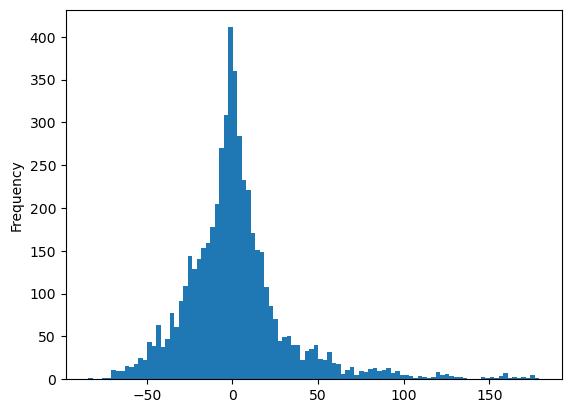

In [280]:
display(pd.DataFrame({'real':y_test, 'predicted':preds.round()}))
df = pd.DataFrame({'real':y_test, 'predicted':preds})
(df['real'] - df['predicted']).plot.hist(bins=100)

In [268]:
model.__dict__

{'_init_params': {'loss_function': 'MAE',
  'depth': 7,
  'l2_leaf_reg': 3,
  'iterations': 900,
  'learning_rate': 0.03},
 '_object': <_catboost._CatBoost at 0x1f4d4f41d60>,
 '_is_fitted_': True,
 '_random_seed': 0,
 '_learning_rate': 0.029999999329447746,
 '_tree_count': 900,
 '_n_features_in': 42,
 '_prediction_values_change': [40.58444688477294,
  5.953286013413923,
  5.882743572313838,
  2.818998847239528,
  6.186634402913283,
  4.064451620311484,
  2.8782206013168663,
  2.995818452644125,
  3.0087618204353177,
  2.3607476125077618,
  4.929214515830051,
  5.3984155455505345,
  2.4308504980533003,
  6.522685989001773,
  1.6327433065062253,
  0.012808509203983406,
  0.08096557867201115,
  0.05251694201092192,
  0.03984723339703776,
  0.15315536028576818,
  0.05236261054307163,
  0.08048951377361431,
  0.015833699880301942,
  0.0755760028685143,
  0.038991852543169905,
  0.03409552145050581,
  0.33897863085223506,
  0.017080367454094848,
  5.554989774711913e-06,
  0.03269140345741007

In [269]:
model.save_model('bestmodelCatBoostJson',
           format="json")

In [270]:
model1=CatBoostRegressor()
model1.load_model("bestmodelCatBoostJson", format="json")


# Вывод

- лучшим вариантом было MAE = 1.7 (то есть определяем дату поломки с точностью, в среднем,  до 2х циклов. Но этот вариант работал, если катбуст видел id машины.
Я решил не брать этот вариант, потому что в таком варианте модель просто запоминает какие варианты есть у какой машины. Но при этом, если мы добавим новую машину, модель не сможет никак генерализовать знание и хоть как бы правильно предсказать что ли бо для новой машины.
- В такой постановке задачи лучшим вариантом стала модель CatBoost (ее параметры находятся в коде, а также сохранениы в файл), с MAE ~= 20, то есть модель в среднем предскзаывает дату поломки в промежутке += 20 циклов.
Логика такая: если на экране отображается, что машина сломается через 30 циклов, то значит, что через 10 циклов нужно уже подготовить новую машину, потому что с точки зрения модели, 30 - 20 = 10, то есть через 10 дней наверняка машина и сломается